In [224]:
import tensorflow as tf
from tensorflow.keras.callbacks import CSVLogger, EarlyStopping

import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import seaborn as sns
import time
import gc
import sys

print(f"Tensorflow Version: {tf.__version__}")
print(f"Pandas Version: {pd.__version__}")
print(f"Numpy Version: {np.__version__}")
print(f"System Version: {sys.version}")

mpl.rcParams['figure.figsize'] = (17, 5)
mpl.rcParams['axes.grid'] = False
sns.set_style("whitegrid")

notebookstart= time.time()

Tensorflow Version: 2.4.1
Pandas Version: 1.1.3
Numpy Version: 1.19.2
System Version: 3.8.5 (default, Sep  3 2020, 21:29:08) [MSC v.1916 64 bit (AMD64)]


In [225]:
import numpy as np
import pandas as pd
from tensorflow.keras import layers
from keras.optimizers import SGD
from keras.models import Sequential
#from keras.layers import Merge
from keras.layers.convolutional import Convolution2D, MaxPooling2D, ZeroPadding2D
from keras.layers.core import Dense, Activation, Dropout, Reshape, Flatten
from keras.utils.np_utils import to_categorical

In [226]:
data = pd.read_csv('df_south.csv')

In [227]:
data = data.fillna(0)

In [228]:
data.head()

,Unnamed: 0,date,AKSH_213_liq_vol,AKSH_213_wc_vol,AKSH_213_bhp_fluid_level,AKSH_213_bhp_pump_press,AKSH_219_liq_vol,AKSH_219_wc_vol,AKSH_219_bhp_fluid_level,AKSH_219_bhp_pump_press,...,AKSH_221_water_vol,AKSH_221_water_type,AKSH_250_water_vol,AKSH_250_water_type,AKSH_424_water_vol,AKSH_424_water_type,AKSH_249_water_vol,AKSH_249_water_type,AKSH_214_water_vol,AKSH_214_water_type
0,0,2017-01-01,43.49,63.003,0.0,0.0,46.12,14.961,0.0,0.0,...,0.0,0,0.0,0,0.0,0,49.0,Артезианская вода,190.0,Артезианская вода
1,1,2017-01-02,43.66,62.987,0.0,0.0,46.29,14.906,0.0,0.0,...,0.0,0,0.0,0,0.0,0,50.0,Артезианская вода,192.0,Артезианская вода
2,2,2017-01-03,43.58,63.102,0.0,0.0,46.21,19.909,0.0,0.0,...,0.0,0,0.0,0,0.0,0,51.0,Артезианская вода,191.0,Артезианская вода
3,3,2017-01-04,43.44,60.083,0.0,0.0,41.99,20.005,0.0,0.0,...,0.0,0,0.0,0,0.0,0,49.0,Артезианская вода,191.0,Артезианская вода
4,4,2017-01-05,43.51,59.986,0.0,0.0,42.05,19.976,0.0,0.0,...,0.0,0,0.0,0,0.0,0,48.0,Артезианская вода,190.0,Артезианская вода


In [229]:

data.index = data['date']
data = data[(data.index > '2018-01-01')]

In [230]:
features_considered_south1 = ['AKSH_424_water_vol','AKSH_249_water_vol','AKSH_247_water_vol','AKSH_250_water_vol','AKSH_424_water_vol','AKSH_214_water_vol']
target_south = ['AKSH_298_liq_vol','AKSH_213_liq_vol','AKSH_203_liq_vol','AKSH_223_liq_vol','AKSH_226_liq_vol']
features_considered_south2 = ['AKSH_298_bhp_pump_press','AKSH_213_bhp_pump_press','AKSH_203_bhp_pump_press','AKSH_223_bhp_pump_press','AKSH_226_bhp_pump_press']

In [231]:
dataws = data[features_considered_south1]

In [232]:
features_considered = ['AKSH_298_liq_vol','AKSH_213_liq_vol','AKSH_203_liq_vol','AKSH_223_liq_vol','AKSH_226_liq_vol','AKSH_298_bhp_pump_press','AKSH_213_bhp_pump_press','AKSH_203_bhp_pump_press','AKSH_223_bhp_pump_press','AKSH_226_bhp_pump_press']

In [166]:
features = data[features_considered]

features.index = data['date']
features.head()

,AKSH_298_liq_vol,AKSH_213_liq_vol,AKSH_203_liq_vol,AKSH_223_liq_vol,AKSH_226_liq_vol,AKSH_298_bhp_pump_press,AKSH_213_bhp_pump_press,AKSH_203_bhp_pump_press,AKSH_223_bhp_pump_press,AKSH_226_bhp_pump_press
date,,,,,,,,,,
2018-01-02,36.810000,33.07,27.50,45.38,19.76,45.603,30.930,63.770,34.507,24.440
2018-01-03,37.240000,33.45,27.82,45.90,19.99,46.603,30.930,63.772,33.507,24.441
2018-01-04,36.801704,33.07,27.51,45.38,19.76,62.603,29.930,63.721,34.552,24.440
2018-01-05,39.630000,33.16,26.68,45.50,19.81,41.602,28.929,63.720,34.554,26.439
2018-01-06,38.220000,33.23,26.75,45.61,19.86,43.603,28.931,62.720,32.553,27.443


In [167]:
X_left = dataws #= data[features_considered_south1]
#X_left = data2[features2]
X_right = data[features_considered_south2]
Y_train = data['AKSH_298_liq_vol']#,'AKSH_226_liq_vol'] 
X_left = X_left.shift(-15)
X_left = np.asarray(X_left)
X_right = np.asarray(X_right) 
Y_train = np.asarray(Y_train) 

In [168]:
#features_df = features.loc[(features.index >= '2018-01-01')]
                    

In [169]:
#data['liq_vol'] = data.liq_vol.shift(-15)

In [170]:
#data['AKSH_220'] = data.AKSH_220.shift(-15)

In [171]:
import tensorflow as tf
from tensorflow.keras.callbacks import CSVLogger, EarlyStopping

import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import seaborn as sns
import time
import gc
import sys

print(f"Tensorflow Version: {tf.__version__}")
print(f"Pandas Version: {pd.__version__}")
print(f"Numpy Version: {np.__version__}")
print(f"System Version: {sys.version}")

mpl.rcParams['figure.figsize'] = (17, 5)
mpl.rcParams['axes.grid'] = False
sns.set_style("whitegrid")

notebookstart= time.time()

Tensorflow Version: 2.4.1
Pandas Version: 1.1.3
Numpy Version: 1.19.2
System Version: 3.8.5 (default, Sep  3 2020, 21:29:08) [MSC v.1916 64 bit (AMD64)]


In [172]:
import numpy as np
import pandas as pd
from tensorflow.keras import layers
from keras.optimizers import SGD
from keras.models import Sequential
#from keras.layers import Merge
from keras.layers.convolutional import Convolution2D, MaxPooling2D, ZeroPadding2D
from keras.layers.core import Dense, Activation, Dropout, Reshape, Flatten
from keras.utils.np_utils import to_categorical

In [173]:
import tensorflow as tf
import numpy
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd

mpl.rcParams['figure.figsize'] = (8, 6)
mpl.rcParams['axes.grid'] = False

In [174]:
#data = pd.read_excel('oildatadc.xlsx')

In [175]:
#features_considered = ['liq_vol','AKSH_214', 'AKSH_240','AKSH_220','AKSH_241','AKSH_221','AKSH_247','AKSH_217','AKSH_250','AKSH_424','AKSH_225','AKSH_249','AKSH_299']

In [176]:
#features = data[features_considered]

#features.index = data['date']

#dataset = features 

#features.head()

In [177]:
from sklearn.model_selection import train_test_split
#from sklearn.cross_validation import train_test_split

In [178]:
TRAIN_SPLIT = 600

In [179]:
from numpy.random import seed
from numpy.random import randn
from statsmodels.graphics.gofplots import qqplot
from matplotlib import pyplot
from scipy import stats
import matplotlib.pyplot as plt

In [180]:
from tensorflow.keras.layers import *
from tensorflow.keras.models import Sequential

In [181]:
from tensorflow.keras.layers import BatchNormalization

In [182]:
features2 = ['AKSH_424_water_vol','AKSH_249_water_vol','AKSH_247_water_vol','AKSH_250_water_vol','AKSH_424_water_vol','AKSH_214_water_vol']

# LIQVOL298

In [183]:
X_left = data[features2]
#X_right = data['AKSH_298_bhp_pump_press']
Y_train = data['AKSH_298_liq_vol']#,'AKSH_226_liq_vol'] 

In [184]:
X_left = np.asarray(X_left)
X_right = np.asarray(X_right) 
Y_train = np.asarray(Y_train) 

In [185]:
X_leftl = X_left[(data.index < '2020-01-01')]
X_rightl = X_right[(data.index < '2020-01-01')]
Y_trainl = Y_train[(data.index < '2020-01-01')]#,'AKSH_226_liq_vol'] 


X_leftt = X_left[(data.index > '2020-01-01')]
X_rightt = X_right[(data.index > '2020-01-01')]
Y_traint = Y_train[(data.index > '2020-01-01')]#,'AKSH_226_liq_vol'] 

datadd = data.index
datadt = datadd[(data.index > '2020-01-01')]
datadl = datadd[(data.index < '2020-01-01')]

In [186]:
X_rightl

array([[ 45.603,  30.93 ,  63.77 ,  34.507,  24.44 ],
       [ 46.603,  30.93 ,  63.772,  33.507,  24.441],
       [ 62.603,  29.93 ,  63.721,  34.552,  24.44 ],
       ...,
       [ 50.368,  36.151, 102.325,  21.03 ,  32.753],
       [ 50.268,  37.151, 102.325,  20.03 ,  32.753],
       [ 46.468,  35.151, 103.325,  21.03 ,  32.753]])

In [187]:
X_leftl = X_left[(data.index < '2020-01-01')]
X_rightl = X_right[(data.index < '2020-01-01')]
Y_trainl = Y_train[(data.index < '2020-01-01')]#,'AKSH_226_liq_vol'] 


X_leftt = X_left[(data.index > '2020-01-01')]
X_rightt = X_right[(data.index > '2020-01-01')]
Y_traint = Y_train[(data.index > '2020-01-01')]#,'AKSH_226_liq_vol'] 

datadd = data.index
datadt = datadd[(data.index > '2020-01-01')]
datadl = datadd[(data.index < '2020-01-01')]


X_left = np.asarray(X_left)
X_right = np.asarray(X_right) 
Y_train = np.asarray(Y_train)
X_leftl = np.asarray(X_leftl)
X_rightl = np.asarray(X_rightl) 
Y_trainl = np.asarray(Y_trainl)
X_leftt = np.asarray(X_leftt)
X_rightt = np.asarray(X_rightt) 
Y_traint = np.asarray(Y_traint)

In [188]:
def build_model(input_timesteps=15, output_timesteps = 1, num_links=1, num_inputs= 1):
    # COPY PASTA
    # https://github.com/niklascp/bus-arrival-convlstm/blob/master/jupyter/ConvLSTM_3x15min_10x64-5x64-10x64-5x64-Comparison.ipynb
    
    model = Sequential()
    #model.add(Input = (batch_shape = (None, 64, 4, 1, 1)))
    model.add(BatchNormalization(name = 'batch_norm_0',input_shape = (input_timesteps, num_inputs, 1, 1))) 
    
    model.add(ConvLSTM2D(name ='conv_lstm_1',
                         filters = 64, kernel_size = (10, 1),                       
                         padding = 'same', 
                         return_sequences = True)) # batch_shape = (None, 64, 4, 1, 1), 
    model.add(Dropout(0.30, name = 'dropout_1'))
    model.add(BatchNormalization(name = 'batch_norm_1'))

    model.add(ConvLSTM2D(name ='conv_lstm_2',
                         filters = 64, kernel_size = (5, 1), 
                         padding='same',
                         return_sequences = False))
    model.add(Dropout(0.20, name = 'dropout_2'))
    model.add(BatchNormalization(name = 'batch_norm_2'))
    model.add(Flatten())
    model.add(RepeatVector(output_timesteps))
    model.add(Reshape((output_timesteps, num_inputs, 1, 64)))
    
    model.add(ConvLSTM2D(name ='conv_lstm_3',
                         filters = 64, kernel_size = (10, 1), 
                         padding='same',
                         return_sequences = True))
    model.add(Dropout(0.20, name = 'dropout_3'))
    model.add(BatchNormalization(name = 'batch_norm_3'))
    
    model.add(ConvLSTM2D(name ='conv_lstm_4',
                         filters = 64, kernel_size = (20, 1), 
                         padding='same',
                         return_sequences = True))
    model.add(Dropout(0.20, name = 'dropout_4'))
    model.add(BatchNormalization(name = 'batch_norm_4'))
    
    model.add(ConvLSTM2D(name ='conv_lstm_5',
                         filters = 64, kernel_size = (20, 1), 
                         padding='same',
                         return_sequences = True))
    model.add(Dropout(0.20, name = 'dropout_5'))
    model.add(BatchNormalization(name = 'batch_norm_5'))
    
    model.add(ConvLSTM2D(name ='conv_lstm_6',
                         filters = 64, kernel_size = (10, 1), 
                         padding='same',
                         return_sequences = True))
    model.add(Dropout(0.20, name = 'dropout_6'))
    model.add(BatchNormalization(name = 'batch_norm_6'))
    
    model.add(ConvLSTM2D(name ='conv_lstm_7',
                         filters = 64, kernel_size = (10, 1), 
                         padding='same',
                         return_sequences = True))
    
    model.add(Dropout(0.20, name = 'dropout_7'))
    model.add(BatchNormalization(name = 'batch_norm_7'))
    
    model.add(ConvLSTM2D(name ='conv_lstm_8',
                         filters = 64, kernel_size = (5, 1), 
                         padding='same',
                         return_sequences = True))
    
    model.add(TimeDistributed(Dense(units=1, name = 'dense_1', activation = 'relu')))
   # model.add(Dense(units=1, name = 'dense_2', activation = 'softmax'))
    model.add(LeakyReLU(alpha=0.1))
#     optimizer = RMSprop() #lr=0.0001, rho=0.9, epsilon=1e-08, decay=0.9)
#     optimizer = tf.keras.optimizers.Adam(0.1)
    optimizer = tf.keras.optimizers.RMSprop(lr=0.004, clipvalue=1.0)
    model.compile(loss = "mse", optimizer = optimizer, metrics = ['mae','mape'])
    return model

In [189]:
# multivariate mlp example
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate
# multivariate multi-step encoder-decoder lstm example
from numpy import array
from numpy import hstack
from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dense
from keras.layers import RepeatVector
from keras.layers import TimeDistributed
import tensorflow as tf
import tensorflow_addons as tfa 


n_features = 5 
# split a multivariate sequence into samples
def split_sequences(sequences, n_steps_in, n_steps_out):
	X, y = list(), list()
	for i in range(len(sequences)):
		# find the end of this pattern
		end_ix = i + n_steps_in
		out_end_ix = end_ix + n_steps_out
		# check if we are beyond the dataset
		if out_end_ix > len(sequences):
			break
		# gather input and output parts of the pattern
		seq_x, seq_y = sequences[i:end_ix, :], sequences[end_ix:out_end_ix, :]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
# последовательность
in_seq1 = X_leftl#[0:856]
in_seq2 = X_rightl#[0:856]
out_seq = Y_trainl#[0:856] # array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1), 6,1,1))
in_seq2 = in_seq2.reshape((len(in_seq2), 5,1,1))
out_seq = out_seq.reshape((len(out_seq), 1,1,1))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
n_steps_in, n_steps_out = 15, 1
n_features1 = 1
# convert into input/output
X, y = split_sequences(dataset, n_steps_in, n_steps_out)
# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]
# первая модель
visible1 = Input(batch_input_shape = (1,n_steps_in,1,1,1)) #batch_input_shape = (1,n_steps_in,n_features1)

denser1 =  tf.keras.layers.GaussianNoise(stddev=1)(visible1) 
regul = tf.keras.layers.ActivityRegularization(l1=0.0, l2=0.0,input_shape = (1,n_steps_in,1,1,1))(denser1)
visible2n = tfa.layers.GroupNormalization(1,-1,0.001,False)(regul)
dense1 =  build_model(1100,15,1,1)(visible2n) #,batch_input_shape=(32,100,1), stateful=True
Conv0   =  ConvLSTM2D(name ='conv_lstm_1',
                         filters = 64, kernel_size = (2, 1), 
                         padding='same',
                         return_sequences = False)#(dense1)

# вторая модель LSTM
visible2 = Input(batch_input_shape = (1,n_steps_in,1,1,1))
denser1 =  tf.keras.layers.GaussianNoise(stddev=1)(visible2) 
regul = tf.keras.layers.ActivityRegularization(l1=0.0, l2=0.0,input_shape = (1,n_steps_in,1,1,1))(denser1)
visible2n = tfa.layers.GroupNormalization(1,-1,0.001,False)(regul)
denser =  tf.keras.layers.GaussianNoise(stddev=1)(visible2n) 
lstm =  build_model(1100,15,1,1)(denser)
lstm2 = ConvLSTM2D(name ='conv_lstm_4',
                         filters = 64, kernel_size = (10, 1), 
                         padding='same', kernel_initializer="glorot_uniform",stateful = True,
                         return_sequences = True)#(visible2)

Conv = ConvLSTM2D(name ='conv_lstm_4',
                         filters = 64, kernel_size = (2, 1), 
                         padding='same', 
                         return_sequences = False)#(lstm)

n_features1 = 1
# слияние
merge = concatenate([dense1, lstm])
output = Dense(n_features)(merge)
model = Model(inputs=[visible1, visible2], outputs=output)
model.compile(optimizer='adam', loss='mape', metrics=['accuracy'])
# fit model
model.fit([X1, X2], Y_train, epochs=2, verbose=1, batch_size=1, validation_split=0.1)
# demonstrate prediction
#x_input = array([[80, 85], [90, 95], [100, 105]])
#x1 = x_input[:, 0].reshape((1, n_steps))
#x2 = x_input[:, 1].reshape((1, n_steps))
yhat = model.predict([X1, X2], verbose=1,batch_size=1)
print(yhat)

Epoch 1/2
642/642 [==============================] - 868s 1s/step - loss: 99.4406 - accuracy: 0.0000e+00 - val_loss: 96.7478 - val_accuracy: 0.0000e+00
Epoch 2/2
714/714 [==============================] - 284s 390ms/step
[[[[[1.6141013  1.1020846  1.6350263  1.3965166  0.90266865]]]


  [[[2.406951   0.9718162  2.4693594  1.8007424  0.41689545]]]


  [[[2.518292   0.9528183  2.5874133  1.8580458  0.34861857]]]


  ...


  [[[2.6419685  0.83473617 2.8407526  1.9956993  0.26463896]]]


  [[[2.5465853  0.8926313  2.6871722  1.9148501  0.32662272]]]


  [[[2.5011923  0.94544894 2.5822453  1.8570948  0.3582412 ]]]]



 [[[[1.7372793  1.0724047  1.7765462  1.4665217  0.8264061 ]]]


  [[[2.4390767  0.9640755  2.5062687  1.8190002  0.39700568]]]


  [[[2.55376    0.94427216 2.6281629  1.8782033  0.32665932]]]


  ...


  [[[2.3646731  0.90155077 2.5221658  1.8381051  0.4363194 ]]]


  [[[2.4167373  0.9239183  2.537989   1.8410541  0.40701485]]]


  [[[2.4987783  0.9460306  2.579472   1.855722

In [190]:
# multivariate mlp example
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate
 
# split a multivariate sequence into samples
def split_sequences(sequences, n_steps_in, n_steps_out):
	X, y = list(), list()
	for i in range(len(sequences)):
		# find the end of this pattern
		end_ix = i + n_steps_in
		out_end_ix = end_ix + n_steps_out
		# check if we are beyond the dataset
		if out_end_ix > len(sequences):
			break
		# gather input and output parts of the pattern
		seq_x, seq_y = sequences[i:end_ix, :], sequences[end_ix:out_end_ix, :]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
 
# последовательность
in_seq1 = X_leftl
in_seq2 = X_rightl
out_seq = Y_trainl # array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1), 6))
in_seq2 = in_seq2.reshape((len(in_seq2), 5))
out_seq = out_seq.reshape((len(out_seq), 1))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
# таймстепы
n_steps_in, n_steps_out = 15, 1
# convert into input/output

n_features = 1


X,y = split_sequences(dataset, n_steps_in, n_steps_out)
n_features1 = 1
n_features2 = 1
# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]
# первая модель
visible1 = Input(shape=(n_steps_in,n_features1))
regul = tf.keras.layers.ActivityRegularization(l1=0.0, l2=0.0,input_shape=(n_steps_in,n_features1))(visible1)
dense1 = LSTM(100, input_shape =(100,n_features1))(regul)

visible11 = (RepeatVector(n_steps_out))(dense1)
visible21 = (LSTM(n_steps_in, activation='softplus',return_sequences=True))(visible11)
visible31 = (TimeDistributed(Dense(n_features)))(visible21)


#,batch_input_shape=(32,100,1), stateful=True
# вторая модель LSTM
visible2 = Input(shape=(n_steps_in,n_features2))
regul = tf.keras.layers.ActivityRegularization(l1=0.0, l2=0.0,input_shape=(n_steps_in,n_features1))(visible2)
lstm = LSTM(100, input_shape =(100,n_features2))(regul)

visible12 = (RepeatVector(n_steps_out))(lstm)
visible22 = (LSTM(200, activation='softplus',return_sequences=True))(visible12)
visible32 = (TimeDistributed(Dense(n_features)))(visible22)


#lstm2 = LSTM(10, input_shape =(100,1))(lstm)

# слияние
merge = concatenate([dense1, lstm])
output = Dense(1)(merge)
model = Model(inputs=[visible1, visible2], outputs=output)
model.compile(optimizer='adam', loss='mape', metrics=['accuracy'])
# fit model
model.fit([X1, X2], Y_trainl, epochs=10, verbose=1, batch_size=64, validation_split=0.01)
# demonstrate prediction
#x_input = array([[80, 85], [90, 95], [100, 105]])
#x1 = x_input[:, 0].reshape((1, n_steps))
#x2 = x_input[:, 1].reshape((1, n_steps))
yhat = model.predict([X1, X2], verbose=0)
print(yhat)

Epoch 1/10
12/12 [==============================] - 6s 163ms/step - loss: 96.9060 - accuracy: 0.0000e+00 - val_loss: 88.9498 - val_accuracy: 0.0000e+00
Epoch 2/10
12/12 [==============================] - 1s 57ms/step - loss: 85.8578 - accuracy: 0.0000e+00 - val_loss: 79.0887 - val_accuracy: 0.0000e+00
Epoch 3/10
12/12 [==============================] - 1s 53ms/step - loss: 61.3377 - accuracy: 0.0000e+00 - val_loss: 70.5299 - val_accuracy: 0.0000e+00
Epoch 4/10
12/12 [==============================] - 1s 56ms/step - loss: 44.9312 - accuracy: 0.0000e+00 - val_loss: 61.7174 - val_accuracy: 0.0000e+00
Epoch 5/10
12/12 [==============================] - 1s 53ms/step - loss: 32.5244 - accuracy: 0.0000e+00 - val_loss: 53.1738 - val_accuracy: 0.0000e+00
Epoch 6/10
12/12 [==============================] - 1s 54ms/step - loss: 23.7274 - accuracy: 0.0000e+00 - val_loss: 42.4032 - val_accuracy: 0.0000e+00
Epoch 7/10
12/12 [==============================] - 1s 53ms/step - loss: 20.2290 - accuracy: 

In [191]:
# multivariate mlp example
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate
 
# split a multivariate sequence into samples
def split_sequences(sequences, n_steps_in, n_steps_out):
	X, y = list(), list()
	for i in range(len(sequences)):
		# find the end of this pattern
		end_ix = i + n_steps_in
		out_end_ix = end_ix + n_steps_out
		# check if we are beyond the dataset
		if out_end_ix > len(sequences):
			break
		# gather input and output parts of the pattern
		seq_x, seq_y = sequences[i:end_ix, :], sequences[end_ix:out_end_ix, :]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
 
# последовательность
in_seq1 = X_leftt
in_seq2 = X_rightt
out_seq = Y_traint # array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1), 6,1,1))
in_seq2 = in_seq2.reshape((len(in_seq2), 5,1,1))
out_seq = out_seq.reshape((len(out_seq), 1,1,1))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
# таймстепы
n_steps_in, n_steps_out = 15, 1
# convert into input/output
X,y = split_sequences(dataset, n_steps_in, n_steps_out)



# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]
# первая модель

yhat = model.predict([X1, X2],batch_size = 1, verbose=0)
print(yhat)

[[20.38881 ]
 [20.408693]
 [20.412535]
 [20.39681 ]
 [20.382036]
 [20.424505]
 [20.414852]
 [20.365065]
 [20.407131]
 [20.355219]
 [20.370687]
 [20.363436]
 [20.375973]
 [20.37919 ]
 [20.379274]
 [20.34656 ]
 [20.361807]
 [20.377163]
 [20.32487 ]
 [20.303078]
 [20.30558 ]
 [20.308022]
 [20.353773]
 [20.317158]
 [20.315456]
 [20.343561]
 [20.349144]
 [20.366673]
 [20.370422]
 [20.370634]
 [20.372501]
 [20.374567]
 [20.402405]
 [20.313278]
 [20.341013]
 [20.35335 ]
 [20.349716]
 [20.316582]
 [20.34387 ]
 [20.369774]
 [20.365746]
 [20.367662]
 [20.369686]
 [20.341606]
 [20.39649 ]
 [20.237904]
 [20.193998]
 [20.221668]
 [20.224434]
 [20.209574]
 [20.230251]
 [20.219652]
 [20.215342]
 [20.267374]
 [20.284855]
 [20.217255]
 [20.119444]
 [20.190296]
 [20.210304]
 [20.199974]
 [20.20088 ]
 [20.230919]
 [20.243292]
 [20.08918 ]
 [20.153091]
 [20.189054]
 [20.196022]
 [20.208239]
 [20.23716 ]
 [20.244946]
 [20.23807 ]
 [20.26648 ]
 [20.28034 ]
 [20.2907  ]
 [20.310738]
 [20.330584]
 [20.310667]

In [109]:
yhat.shape

(120, 1)

<AxesSubplot:>

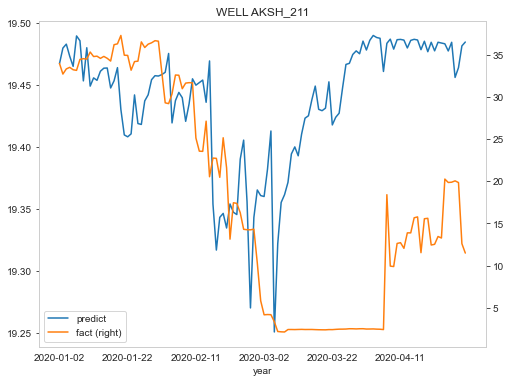

In [110]:
yhat = yhat.flatten()
yhat = yhat[0:120]
Y_traint = Y_traint.flatten()
Y_traint4 = Y_traint[0:120]
datadt4 = datadt[0:120]
import pandas as pd

df = pd.DataFrame(data={'year': datadt4, 
                        'predict': yhat, 
                        'fact': Y_traint4})
import matplotlib.pyplot as plt # Impot the relevant module

fig, ax = plt.subplots() # Create the figure and axes object

# Plot the first x and y axes:
df.plot(x = 'year', y = 'predict',title = "WELL AKSH_211", ax = ax) 
# Plot the second x and y axes. By secondary_y = True a second y-axis is requested:
# (see https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.plot.html for details)
df.plot(x = 'year', y = 'fact', ax = ax, secondary_y = True)
#df.plot(label="test1")

In [83]:
#from sklearn.metrics import mean_squared_error     
    
#mean_squared_error(Y_traint4, yhat)

In [192]:
# multivariate mlp-1step example
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate
 
# сэмлы
def split_sequences(sequences, n_steps):
	X, y = list(), list()
	for i in range(len(sequences)):
		# разметка
		end_ix = i + n_steps
		# проверка выхода за пределы
		if end_ix > len(sequences):
			break
		# получение начала и конечной метки
		seq_x, seq_y = sequences[i:end_ix, :-1], sequences[end_ix-1, -1]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
# последовательность
in_seq1 = X_leftl
in_seq2 = X_rightl

out_seq = Y_trainl #array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1),6))
in_seq2 = in_seq2.reshape((len(in_seq2),5))
out_seq = out_seq.reshape((len(out_seq),1))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
n_steps = 15
# convert into input/output
X,y = split_sequences(dataset, n_steps)
#y = 
# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]
# первая модель
visible1 = Input(shape=(n_steps,))
visible11 = tf.keras.layers.ActivityRegularization(l1=0.1, l2=0.1)(visible1)
dense1 = Dense(100, activation='relu')(visible11)
dense21 = Dense(10, activation='relu')(dense1)
# вторая модель
visible2 = Input(shape=(n_steps,))
dense2 = Dense(100, activation='relu')(visible2)
dense22 = Dense(10, activation='relu')(dense2)
# слияние
# слияние
merge = concatenate([dense1, dense2])
output = Dense(1)(merge)
model = Model(inputs=[visible1, visible2], outputs=output)
model.compile(optimizer='adam', loss='mse', metrics=['accuracy'])
# fit model
model.fit([X1, X2], Y_trainl, epochs=20, verbose= 1, batch_size=64, validation_split=0.1)
# demonstrate prediction
#x_input = array([[80, 85], [90, 95], [100, 105]])
#x1 = x_input[:, 0].reshape((1, n_steps))
#x2 = x_input[:, 1].reshape((1, n_steps))

 
# последовательность
in_seq1t = X_leftt
in_seq2t = X_rightt

out_seqt = Y_traint #array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1t = in_seq1.reshape((len(in_seq1),6))
in_seq2t = in_seq2.reshape((len(in_seq2),5))
out_seqt = out_seq.reshape((len(out_seq),1))
# горизонтальное последовательное размещение данных 
datasett = hstack((in_seq1t, in_seq2t, out_seqt))
# таймстепы
n_steps = 15
# convert into input/output
Xt,yt = split_sequences(datasett, n_steps)
X1t = Xt[:, :, 0]
X2t = Xt[:, :, 1]
yhatt = model.predict([X1t, X2t], verbose=0)
print(yhatt)

Epoch 1/20
11/11 [==============================] - 3s 84ms/step - loss: 1691.3152 - accuracy: 0.0000e+00 - val_loss: 124956.1641 - val_accuracy: 0.0000e+00
Epoch 2/20
11/11 [==============================] - 0s 11ms/step - loss: 829.5054 - accuracy: 0.0000e+00 - val_loss: 123735.9297 - val_accuracy: 0.0000e+00
Epoch 3/20
11/11 [==============================] - 0s 6ms/step - loss: 1016.0567 - accuracy: 0.0000e+00 - val_loss: 123285.9688 - val_accuracy: 0.0000e+00
Epoch 4/20
11/11 [==============================] - 0s 10ms/step - loss: 1250.4250 - accuracy: 0.0000e+00 - val_loss: 122729.0391 - val_accuracy: 0.0000e+00
Epoch 5/20
11/11 [==============================] - 0s 8ms/step - loss: 2591.7964 - accuracy: 0.0000e+00 - val_loss: 122574.3906 - val_accuracy: 0.0000e+00
Epoch 6/20
11/11 [==============================] - 0s 8ms/step - loss: 1147.7848 - accuracy: 0.0000e+00 - val_loss: 122080.6641 - val_accuracy: 0.0000e+00
Epoch 7/20
11/11 [==============================] - 0s 8ms/ste

In [197]:
# multivariate mlp example one step
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate
 
# сэмлы
def split_sequences(sequences, n_steps):
	X, y = list(), list()
	for i in range(len(sequences)):
		# разметка
		end_ix = i + n_steps
		# проверка выхода за пределы
		if end_ix > len(sequences):
			break
		# получение начала и конечной метки
		seq_x, seq_y = sequences[i:end_ix, :-1], sequences[end_ix-1, -1]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
# последовательность
in_seq1 = X_leftl
in_seq2 = X_rightl

out_seq = Y_trainl #array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1),6))
in_seq2 = in_seq2.reshape((len(in_seq2),5))
out_seq = out_seq.reshape((len(out_seq),1))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
n_steps = 15
# convert into input/output
X,y = split_sequences(dataset, n_steps)
#y = 
# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]
# первая модель
visible1 = Input(shape=(n_steps,))
visible11 = tf.keras.layers.ActivityRegularization(l1=0.1, l2=0.1)(visible1)
dense1 = Dense(100, activation='relu')(visible11)
dense21 = Dense(10, activation='relu')(dense1)
# вторая модель
visible2 = Input(shape=(n_steps,))
visible12 = tf.keras.layers.ActivityRegularization(l1=0.1, l2=0.1)(visible2)
dense2 = Dense(100, activation='relu')(visible2)
dense22 = Dense(10, activation='relu')(dense2)
# слияние
# слияние
merge = concatenate([dense1, dense2])
output = Dense(1)(merge)
model = Model(inputs=[visible1, visible2], outputs=output)
model.compile(optimizer='adam', loss='mse', metrics=['accuracy'])
# fit model
model.fit([X1, X2], Y_trainl, epochs=20, verbose= 1, batch_size=64, validation_split=0.1)
# demonstrate prediction
#x_input = array([[80, 85], [90, 95], [100, 105]])
#x1 = x_input[:, 0].reshape((1, n_steps))
#x2 = x_input[:, 1].reshape((1, n_steps))

 
# последовательность
in_seq1t = X_leftt
in_seq2t = X_rightt

out_seqt = Y_traint #array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1t = in_seq1.reshape((len(in_seq1),6))
in_seq2t = in_seq2.reshape((len(in_seq2),5))
out_seqt = out_seq.reshape((len(out_seq),1))
# горизонтальное последовательное размещение данных 
datasett = hstack((in_seq1t, in_seq2t, out_seqt))
# таймстепы
n_steps = 15
# convert into input/output
Xt,yt = split_sequences(datasett, n_steps)
X1t = Xt[:, :, 0]
X2t = Xt[:, :, 1]
yhatt = model.predict([X1t, X2t], verbose=0)
print(yhatt)

Epoch 1/20
11/11 [==============================] - 1s 38ms/step - loss: 2103.0431 - accuracy: 0.0000e+00 - val_loss: 124663.5312 - val_accuracy: 0.0000e+00
Epoch 2/20
11/11 [==============================] - 0s 7ms/step - loss: 2447.5745 - accuracy: 0.0000e+00 - val_loss: 124000.7109 - val_accuracy: 0.0000e+00
Epoch 3/20
11/11 [==============================] - 0s 7ms/step - loss: 1357.4124 - accuracy: 0.0000e+00 - val_loss: 124044.0703 - val_accuracy: 0.0000e+00
Epoch 4/20
11/11 [==============================] - 0s 7ms/step - loss: 1596.4511 - accuracy: 0.0000e+00 - val_loss: 125572.3906 - val_accuracy: 0.0000e+00
Epoch 5/20
11/11 [==============================] - 0s 31ms/step - loss: 1803.4703 - accuracy: 0.0000e+00 - val_loss: 125042.4453 - val_accuracy: 0.0000e+00
Epoch 6/20
11/11 [==============================] - 0s 5ms/step - loss: 1654.8210 - accuracy: 0.0000e+00 - val_loss: 126001.6953 - val_accuracy: 0.0000e+00
Epoch 7/20
11/11 [==============================] - 0s 5ms/ste

In [193]:
# multivariate mlp example - test 1 step
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate
 
# сэмлы
def split_sequences(sequences, n_steps):
	X, y = list(), list()
	for i in range(len(sequences)):
		# разметка
		end_ix = i + n_steps
		# проверка выхода за пределы
		if end_ix > len(sequences):
			break
		# получение начала и конечной метки
		seq_x, seq_y = sequences[i:end_ix, :-1], sequences[end_ix-1, -1]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
# последовательность
in_seq1 = X_leftt
in_seq2 = X_rightt

out_seq = Y_traint #array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1), 6))
in_seq2 = in_seq2.reshape((len(in_seq2), 5))
out_seq = out_seq.reshape((len(out_seq), 1))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
n_steps = 15
# convert into input/output
X,y = split_sequences(dataset, n_steps)
#y = 
# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]

yhat = model.predict([X1, X2], verbose=0)
print(yhat)

[[17.670156 ]
 [16.266764 ]
 [15.203446 ]
 [16.165762 ]
 [16.286085 ]
 [18.063463 ]
 [16.620407 ]
 [16.489754 ]
 [15.846624 ]
 [14.523983 ]
 [17.615713 ]
 [16.70558  ]
 [16.282885 ]
 [15.603931 ]
 [15.677799 ]
 [15.826609 ]
 [15.066833 ]
 [15.3714075]
 [16.155157 ]
 [15.261076 ]
 [17.651648 ]
 [18.992834 ]
 [17.766443 ]
 [18.324968 ]
 [17.540777 ]
 [17.2093   ]
 [14.537932 ]
 [13.409616 ]
 [11.98092  ]
 [12.340066 ]
 [14.766678 ]
 [16.528135 ]
 [16.899866 ]
 [17.43689  ]
 [17.876987 ]
 [18.889631 ]
 [18.473179 ]
 [17.602983 ]
 [17.114801 ]
 [16.848734 ]
 [16.181684 ]
 [16.207724 ]
 [15.672037 ]
 [14.2867775]
 [14.994971 ]
 [15.310609 ]
 [16.13781  ]
 [17.69036  ]
 [17.35605  ]
 [16.857618 ]
 [16.926584 ]
 [18.149298 ]
 [16.97494  ]
 [17.153284 ]
 [15.799381 ]
 [14.957358 ]
 [17.764734 ]
 [20.842459 ]
 [20.594494 ]
 [20.391857 ]
 [21.279047 ]
 [22.132055 ]
 [21.75096  ]
 [21.288057 ]
 [22.289902 ]
 [20.56523  ]
 [21.071909 ]
 [22.468596 ]
 [22.406393 ]
 [24.300339 ]
 [25.022024 ]
 [23.7

In [198]:
yhat.shape

(121,)

<AxesSubplot:>

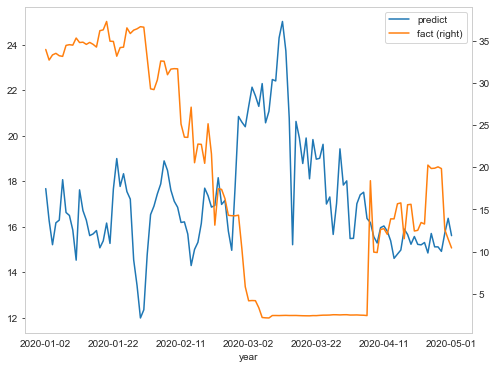

In [199]:
yhat = yhat.flatten() 
Y_traint = Y_traint.flatten()
Y_traint4 = Y_traint[0:121]
datadt4 = datadt[0:121]
import pandas as pd

df = pd.DataFrame(data={'year': datadt4, 
                        'predict': yhat, 
                        'fact': Y_traint4})
import matplotlib.pyplot as plt # Impot the relevant module

fig, ax = plt.subplots() # Create the figure and axes object

# Plot the first x and y axes:
df.plot(x = 'year', y = 'predict', ax = ax) 
# Plot the second x and y axes. By secondary_y = True a second y-axis is requested:
# (see https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.plot.html for details)
df.plot(x = 'year', y = 'fact', ax = ax, secondary_y = True)

# MULTISTEP_MLP

In [116]:
# multivariate mlp example MU
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate
# multivariate multi-step encoder-decoder lstm example
from numpy import array
from numpy import hstack
from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dense
from keras.layers import RepeatVector
from keras.layers import TimeDistributed

n_features = 5
    
# split a multivariate sequence into samples
def split_sequences(sequences, n_steps_in, n_steps_out):
	X, y = list(), list()
	for i in range(len(sequences)):
		# find the end of this pattern
		end_ix = i + n_steps_in
		out_end_ix = end_ix + n_steps_out
		# check if we are beyond the dataset
		if out_end_ix > len(sequences):
			break
		# gather input and output parts of the pattern
		seq_x, seq_y = sequences[i:end_ix, :], sequences[end_ix:out_end_ix, :]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
# последовательность
in_seq1 = X_leftl
in_seq2 = X_rightl
#Y_train = Y_train.reshape(1112,1)

out_seq = Y_trainl #array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1), 6))
in_seq2 = in_seq2.reshape((len(in_seq2), 5))
out_seq = out_seq.reshape((len(out_seq), 1))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
n_steps_in, n_steps_out = 15, 1
# convert into input/output
X,y = split_sequences(dataset, n_steps_in, n_steps_out)



#n_steps = 1
# convert into input/output
#X,y = split_sequences(dataset, n_steps)
#y = 
# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]
# первая модель
visible1 = Input(shape=(n_steps_in,))
dense1 = Dense(100, activation='relu')(visible1)
# вторая модель
visible2 = Input(shape=(n_steps_in,))
dense1 = Dense(100, activation='relu')(visible2)
dense2 = Dense(10, activation='relu')(dense1)
# слияние
merge = concatenate([dense1, dense2])
output = Dense(n_features)(merge)
model = Model(inputs=[visible1, visible2], outputs=output)
model.compile(optimizer='adam', loss='mse', metrics=['accuracy'])
# fit model
model.fit([X1, X2], Y_trainl, epochs=2000, verbose= 1, batch_size=64, validation_split=0.1)
# demonstrate prediction
#x_input = array([[80, 85], [90, 95], [100, 105]])
#x1 = x_input[:, 0].reshape((1, n_steps))
#x2 = x_input[:, 1].reshape((1, n_steps))
yhat = model.predict([X1, X2], verbose=0)
print(yhat)

Epoch 1/2000
11/11 [==============================] - 1s 16ms/step - loss: 756.6874 - accuracy: 0.0000e+00 - val_loss: 62.2997 - val_accuracy: 0.0000e+00
Epoch 2/2000
11/11 [==============================] - 0s 4ms/step - loss: 158.2696 - accuracy: 0.0000e+00 - val_loss: 90.5444 - val_accuracy: 0.0000e+00
Epoch 3/2000
11/11 [==============================] - 0s 4ms/step - loss: 143.3347 - accuracy: 0.0000e+00 - val_loss: 49.4776 - val_accuracy: 0.0000e+00
Epoch 4/2000
11/11 [==============================] - 0s 4ms/step - loss: 115.3166 - accuracy: 0.0000e+00 - val_loss: 51.6944 - val_accuracy: 0.0000e+00
Epoch 5/2000
11/11 [==============================] - 0s 4ms/step - loss: 105.8362 - accuracy: 0.0000e+00 - val_loss: 50.3413 - val_accuracy: 0.0000e+00
Epoch 6/2000
11/11 [==============================] - 0s 4ms/step - loss: 116.7998 - accuracy: 0.0000e+00 - val_loss: 45.6396 - val_accuracy: 0.0000e+00
Epoch 7/2000
11/11 [==============================] - 0s 4ms/step - loss: 105.261

11/11 [==============================] - 0s 5ms/step - loss: 67.2779 - accuracy: 0.0000e+00 - val_loss: 33.9804 - val_accuracy: 0.0000e+00
Epoch 108/2000
11/11 [==============================] - 0s 4ms/step - loss: 88.6357 - accuracy: 0.0000e+00 - val_loss: 44.4113 - val_accuracy: 0.0000e+00
Epoch 109/2000
11/11 [==============================] - 0s 4ms/step - loss: 66.9610 - accuracy: 0.0000e+00 - val_loss: 38.5994 - val_accuracy: 0.0000e+00
Epoch 110/2000
11/11 [==============================] - 0s 5ms/step - loss: 73.2756 - accuracy: 0.0000e+00 - val_loss: 42.5008 - val_accuracy: 0.0000e+00
Epoch 111/2000
11/11 [==============================] - 0s 5ms/step - loss: 68.9990 - accuracy: 0.0000e+00 - val_loss: 34.4495 - val_accuracy: 0.0000e+00
Epoch 112/2000
11/11 [==============================] - 0s 4ms/step - loss: 69.6148 - accuracy: 0.0000e+00 - val_loss: 35.6445 - val_accuracy: 0.0000e+00
Epoch 113/2000
11/11 [==============================] - 0s 4ms/step - loss: 69.0011 - accur

11/11 [==============================] - 0s 5ms/step - loss: 77.0701 - accuracy: 0.0000e+00 - val_loss: 45.2323 - val_accuracy: 0.0000e+00
Epoch 214/2000
11/11 [==============================] - 0s 4ms/step - loss: 69.1888 - accuracy: 0.0000e+00 - val_loss: 36.1152 - val_accuracy: 0.0000e+00
Epoch 215/2000
11/11 [==============================] - 0s 4ms/step - loss: 60.2910 - accuracy: 0.0000e+00 - val_loss: 28.6876 - val_accuracy: 0.0000e+00
Epoch 216/2000
11/11 [==============================] - 0s 5ms/step - loss: 61.5677 - accuracy: 0.0000e+00 - val_loss: 32.6340 - val_accuracy: 0.0000e+00
Epoch 217/2000
11/11 [==============================] - 0s 5ms/step - loss: 67.7742 - accuracy: 0.0000e+00 - val_loss: 46.1210 - val_accuracy: 0.0000e+00
Epoch 218/2000
11/11 [==============================] - 0s 5ms/step - loss: 68.6695 - accuracy: 0.0000e+00 - val_loss: 30.7408 - val_accuracy: 0.0000e+00
Epoch 219/2000
11/11 [==============================] - 0s 4ms/step - loss: 59.8520 - accur

11/11 [==============================] - 0s 4ms/step - loss: 54.1259 - accuracy: 0.0000e+00 - val_loss: 27.7691 - val_accuracy: 0.0000e+00
Epoch 320/2000
11/11 [==============================] - 0s 5ms/step - loss: 53.3039 - accuracy: 0.0000e+00 - val_loss: 33.8791 - val_accuracy: 0.0000e+00
Epoch 321/2000
11/11 [==============================] - 0s 5ms/step - loss: 46.4380 - accuracy: 0.0000e+00 - val_loss: 28.8268 - val_accuracy: 0.0000e+00
Epoch 322/2000
11/11 [==============================] - 0s 4ms/step - loss: 54.4232 - accuracy: 0.0000e+00 - val_loss: 48.4514 - val_accuracy: 0.0000e+00
Epoch 323/2000
11/11 [==============================] - 0s 5ms/step - loss: 54.5192 - accuracy: 0.0000e+00 - val_loss: 37.7537 - val_accuracy: 0.0000e+00
Epoch 324/2000
11/11 [==============================] - 0s 4ms/step - loss: 53.1043 - accuracy: 0.0000e+00 - val_loss: 28.1055 - val_accuracy: 0.0000e+00
Epoch 325/2000
11/11 [==============================] - 0s 4ms/step - loss: 51.9812 - accur

11/11 [==============================] - 0s 4ms/step - loss: 41.3114 - accuracy: 0.0000e+00 - val_loss: 28.9940 - val_accuracy: 0.0000e+00
Epoch 426/2000
11/11 [==============================] - 0s 4ms/step - loss: 42.6923 - accuracy: 0.0000e+00 - val_loss: 30.0741 - val_accuracy: 0.0000e+00
Epoch 427/2000
11/11 [==============================] - 0s 4ms/step - loss: 41.4210 - accuracy: 0.0000e+00 - val_loss: 29.0655 - val_accuracy: 0.0000e+00
Epoch 428/2000
11/11 [==============================] - 0s 4ms/step - loss: 42.6843 - accuracy: 0.0000e+00 - val_loss: 26.6571 - val_accuracy: 0.0000e+00
Epoch 429/2000
11/11 [==============================] - 0s 4ms/step - loss: 40.7325 - accuracy: 0.0000e+00 - val_loss: 24.8864 - val_accuracy: 0.0000e+00
Epoch 430/2000
11/11 [==============================] - 0s 4ms/step - loss: 48.0254 - accuracy: 0.0000e+00 - val_loss: 29.9865 - val_accuracy: 0.0000e+00
Epoch 431/2000
11/11 [==============================] - 0s 4ms/step - loss: 42.0276 - accur

11/11 [==============================] - 0s 4ms/step - loss: 38.6539 - accuracy: 0.0000e+00 - val_loss: 31.8922 - val_accuracy: 0.0000e+00
Epoch 532/2000
11/11 [==============================] - 0s 4ms/step - loss: 43.6884 - accuracy: 0.0000e+00 - val_loss: 42.7875 - val_accuracy: 0.0000e+00
Epoch 533/2000
11/11 [==============================] - 0s 5ms/step - loss: 38.4395 - accuracy: 0.0000e+00 - val_loss: 27.5079 - val_accuracy: 0.0000e+00
Epoch 534/2000
11/11 [==============================] - 0s 5ms/step - loss: 35.0382 - accuracy: 0.0000e+00 - val_loss: 25.3154 - val_accuracy: 0.0000e+00
Epoch 535/2000
11/11 [==============================] - 0s 5ms/step - loss: 37.3847 - accuracy: 0.0000e+00 - val_loss: 25.8201 - val_accuracy: 0.0000e+00
Epoch 536/2000
11/11 [==============================] - 0s 4ms/step - loss: 36.6796 - accuracy: 0.0000e+00 - val_loss: 22.7496 - val_accuracy: 0.0000e+00
Epoch 537/2000
11/11 [==============================] - 0s 5ms/step - loss: 36.9149 - accur

11/11 [==============================] - 0s 4ms/step - loss: 33.8252 - accuracy: 0.0000e+00 - val_loss: 23.5326 - val_accuracy: 0.0000e+00
Epoch 638/2000
11/11 [==============================] - 0s 4ms/step - loss: 32.9344 - accuracy: 0.0000e+00 - val_loss: 26.3530 - val_accuracy: 0.0000e+00
Epoch 639/2000
11/11 [==============================] - 0s 4ms/step - loss: 33.7259 - accuracy: 0.0000e+00 - val_loss: 28.6040 - val_accuracy: 0.0000e+00
Epoch 640/2000
11/11 [==============================] - 0s 4ms/step - loss: 33.1968 - accuracy: 0.0000e+00 - val_loss: 29.6997 - val_accuracy: 0.0000e+00
Epoch 641/2000
11/11 [==============================] - 0s 4ms/step - loss: 34.4374 - accuracy: 0.0000e+00 - val_loss: 26.3744 - val_accuracy: 0.0000e+00
Epoch 642/2000
11/11 [==============================] - 0s 5ms/step - loss: 30.6595 - accuracy: 0.0000e+00 - val_loss: 22.8773 - val_accuracy: 0.0000e+00
Epoch 643/2000
11/11 [==============================] - 0s 4ms/step - loss: 37.0246 - accur

11/11 [==============================] - 0s 4ms/step - loss: 45.8202 - accuracy: 0.0000e+00 - val_loss: 49.4610 - val_accuracy: 0.0000e+00
Epoch 744/2000
11/11 [==============================] - 0s 4ms/step - loss: 37.2100 - accuracy: 0.0000e+00 - val_loss: 24.0955 - val_accuracy: 0.0000e+00
Epoch 745/2000
11/11 [==============================] - 0s 5ms/step - loss: 32.7234 - accuracy: 0.0000e+00 - val_loss: 21.1698 - val_accuracy: 0.0000e+00
Epoch 746/2000
11/11 [==============================] - 0s 4ms/step - loss: 34.2687 - accuracy: 0.0000e+00 - val_loss: 20.0439 - val_accuracy: 0.0000e+00
Epoch 747/2000
11/11 [==============================] - 0s 4ms/step - loss: 55.0762 - accuracy: 0.0000e+00 - val_loss: 22.2191 - val_accuracy: 0.0000e+00
Epoch 748/2000
11/11 [==============================] - 0s 4ms/step - loss: 67.1992 - accuracy: 0.0000e+00 - val_loss: 24.5746 - val_accuracy: 0.0000e+00
Epoch 749/2000
11/11 [==============================] - 0s 4ms/step - loss: 37.7289 - accur

11/11 [==============================] - 0s 4ms/step - loss: 36.3999 - accuracy: 0.0000e+00 - val_loss: 31.9443 - val_accuracy: 0.0000e+00
Epoch 850/2000
11/11 [==============================] - 0s 4ms/step - loss: 35.7474 - accuracy: 0.0000e+00 - val_loss: 41.9834 - val_accuracy: 0.0000e+00
Epoch 851/2000
11/11 [==============================] - 0s 4ms/step - loss: 37.1364 - accuracy: 0.0000e+00 - val_loss: 40.6310 - val_accuracy: 0.0000e+00
Epoch 852/2000
11/11 [==============================] - 0s 4ms/step - loss: 39.1292 - accuracy: 0.0000e+00 - val_loss: 45.8536 - val_accuracy: 0.0000e+00
Epoch 853/2000
11/11 [==============================] - 0s 4ms/step - loss: 43.0090 - accuracy: 0.0000e+00 - val_loss: 49.7064 - val_accuracy: 0.0000e+00
Epoch 854/2000
11/11 [==============================] - 0s 4ms/step - loss: 41.5026 - accuracy: 0.0000e+00 - val_loss: 30.1860 - val_accuracy: 0.0000e+00
Epoch 855/2000
11/11 [==============================] - 0s 4ms/step - loss: 32.3503 - accur

Epoch 902/2000
11/11 [==============================] - 0s 4ms/step - loss: 29.2319 - accuracy: 0.0000e+00 - val_loss: 25.1498 - val_accuracy: 0.0000e+00
Epoch 903/2000
11/11 [==============================] - 0s 4ms/step - loss: 27.6971 - accuracy: 0.0000e+00 - val_loss: 39.8375 - val_accuracy: 0.0000e+00
Epoch 904/2000
11/11 [==============================] - 0s 4ms/step - loss: 30.2606 - accuracy: 0.0000e+00 - val_loss: 31.4728 - val_accuracy: 0.0000e+00
Epoch 905/2000
11/11 [==============================] - 0s 4ms/step - loss: 30.8428 - accuracy: 0.0000e+00 - val_loss: 29.1486 - val_accuracy: 0.0000e+00
Epoch 906/2000
11/11 [==============================] - 0s 4ms/step - loss: 32.4673 - accuracy: 0.0000e+00 - val_loss: 27.7294 - val_accuracy: 0.0000e+00
Epoch 907/2000
11/11 [==============================] - 0s 4ms/step - loss: 26.8630 - accuracy: 0.0000e+00 - val_loss: 40.1753 - val_accuracy: 0.0000e+00
Epoch 908/2000
11/11 [==============================] - 0s 4ms/step - loss: 

11/11 [==============================] - 0s 4ms/step - loss: 30.4049 - accuracy: 0.0000e+00 - val_loss: 21.5572 - val_accuracy: 0.0000e+00
Epoch 1009/2000
11/11 [==============================] - 0s 4ms/step - loss: 31.8909 - accuracy: 0.0000e+00 - val_loss: 18.9588 - val_accuracy: 0.0000e+00
Epoch 1010/2000
11/11 [==============================] - 0s 4ms/step - loss: 34.2659 - accuracy: 0.0000e+00 - val_loss: 19.2566 - val_accuracy: 0.0000e+00
Epoch 1011/2000
11/11 [==============================] - 0s 4ms/step - loss: 30.6236 - accuracy: 0.0000e+00 - val_loss: 23.6222 - val_accuracy: 0.0000e+00
Epoch 1012/2000
11/11 [==============================] - 0s 4ms/step - loss: 31.4225 - accuracy: 0.0000e+00 - val_loss: 22.2480 - val_accuracy: 0.0000e+00
Epoch 1013/2000
11/11 [==============================] - 0s 4ms/step - loss: 29.1858 - accuracy: 0.0000e+00 - val_loss: 23.8809 - val_accuracy: 0.0000e+00
Epoch 1014/2000
11/11 [==============================] - 0s 4ms/step - loss: 30.1058 -

Epoch 1061/2000
11/11 [==============================] - 0s 4ms/step - loss: 30.1848 - accuracy: 0.0000e+00 - val_loss: 28.1795 - val_accuracy: 0.0000e+00
Epoch 1062/2000
11/11 [==============================] - 0s 4ms/step - loss: 28.8768 - accuracy: 0.0000e+00 - val_loss: 26.4333 - val_accuracy: 0.0000e+00
Epoch 1063/2000
11/11 [==============================] - 0s 4ms/step - loss: 29.8680 - accuracy: 0.0000e+00 - val_loss: 33.0315 - val_accuracy: 0.0000e+00
Epoch 1064/2000
11/11 [==============================] - 0s 4ms/step - loss: 29.3794 - accuracy: 0.0000e+00 - val_loss: 31.4887 - val_accuracy: 0.0000e+00
Epoch 1065/2000
11/11 [==============================] - 0s 4ms/step - loss: 27.8217 - accuracy: 0.0000e+00 - val_loss: 31.7141 - val_accuracy: 0.0000e+00
Epoch 1066/2000
11/11 [==============================] - 0s 4ms/step - loss: 30.9907 - accuracy: 0.0000e+00 - val_loss: 29.3476 - val_accuracy: 0.0000e+00
Epoch 1067/2000
11/11 [==============================] - 0s 5ms/step -

Epoch 1114/2000
11/11 [==============================] - 0s 4ms/step - loss: 31.5708 - accuracy: 0.0000e+00 - val_loss: 30.1182 - val_accuracy: 0.0000e+00
Epoch 1115/2000
11/11 [==============================] - 0s 4ms/step - loss: 29.4066 - accuracy: 0.0000e+00 - val_loss: 27.4271 - val_accuracy: 0.0000e+00
Epoch 1116/2000
11/11 [==============================] - 0s 4ms/step - loss: 31.5798 - accuracy: 0.0000e+00 - val_loss: 56.4459 - val_accuracy: 0.0000e+00
Epoch 1117/2000
11/11 [==============================] - 0s 5ms/step - loss: 37.3265 - accuracy: 0.0000e+00 - val_loss: 32.7652 - val_accuracy: 0.0000e+00
Epoch 1118/2000
11/11 [==============================] - 0s 4ms/step - loss: 31.1607 - accuracy: 0.0000e+00 - val_loss: 18.8504 - val_accuracy: 0.0000e+00
Epoch 1119/2000
11/11 [==============================] - 0s 4ms/step - loss: 44.7740 - accuracy: 0.0000e+00 - val_loss: 18.2456 - val_accuracy: 0.0000e+00
Epoch 1120/2000
11/11 [==============================] - 0s 5ms/step -

Epoch 1167/2000
11/11 [==============================] - 0s 4ms/step - loss: 36.7433 - accuracy: 0.0000e+00 - val_loss: 31.8088 - val_accuracy: 0.0000e+00
Epoch 1168/2000
11/11 [==============================] - 0s 4ms/step - loss: 30.0011 - accuracy: 0.0000e+00 - val_loss: 30.5669 - val_accuracy: 0.0000e+00
Epoch 1169/2000
11/11 [==============================] - 0s 4ms/step - loss: 25.2701 - accuracy: 0.0000e+00 - val_loss: 28.9083 - val_accuracy: 0.0000e+00
Epoch 1170/2000
11/11 [==============================] - 0s 4ms/step - loss: 29.0534 - accuracy: 0.0000e+00 - val_loss: 38.8315 - val_accuracy: 0.0000e+00
Epoch 1171/2000
11/11 [==============================] - 0s 4ms/step - loss: 31.0722 - accuracy: 0.0000e+00 - val_loss: 53.1139 - val_accuracy: 0.0000e+00
Epoch 1172/2000
11/11 [==============================] - 0s 4ms/step - loss: 37.6827 - accuracy: 0.0000e+00 - val_loss: 40.4779 - val_accuracy: 0.0000e+00
Epoch 1173/2000
11/11 [==============================] - 0s 4ms/step -

Epoch 1220/2000
11/11 [==============================] - 0s 4ms/step - loss: 27.4970 - accuracy: 0.0000e+00 - val_loss: 47.4024 - val_accuracy: 0.0000e+00
Epoch 1221/2000
11/11 [==============================] - 0s 4ms/step - loss: 34.4612 - accuracy: 0.0000e+00 - val_loss: 32.0638 - val_accuracy: 0.0000e+00
Epoch 1222/2000
11/11 [==============================] - 0s 4ms/step - loss: 26.6285 - accuracy: 0.0000e+00 - val_loss: 20.4320 - val_accuracy: 0.0000e+00
Epoch 1223/2000
11/11 [==============================] - 0s 5ms/step - loss: 35.4825 - accuracy: 0.0000e+00 - val_loss: 17.6430 - val_accuracy: 0.0000e+00
Epoch 1224/2000
11/11 [==============================] - 0s 4ms/step - loss: 38.5900 - accuracy: 0.0000e+00 - val_loss: 35.1318 - val_accuracy: 0.0000e+00
Epoch 1225/2000
11/11 [==============================] - 0s 5ms/step - loss: 28.3892 - accuracy: 0.0000e+00 - val_loss: 35.0594 - val_accuracy: 0.0000e+00
Epoch 1226/2000
11/11 [==============================] - 0s 4ms/step -

Epoch 1273/2000
11/11 [==============================] - 0s 4ms/step - loss: 30.3653 - accuracy: 0.0000e+00 - val_loss: 63.1657 - val_accuracy: 0.0000e+00
Epoch 1274/2000
11/11 [==============================] - 0s 4ms/step - loss: 46.6301 - accuracy: 0.0000e+00 - val_loss: 51.8329 - val_accuracy: 0.0000e+00
Epoch 1275/2000
11/11 [==============================] - 0s 4ms/step - loss: 34.8491 - accuracy: 0.0000e+00 - val_loss: 24.6739 - val_accuracy: 0.0000e+00
Epoch 1276/2000
11/11 [==============================] - 0s 4ms/step - loss: 27.6859 - accuracy: 0.0000e+00 - val_loss: 44.0057 - val_accuracy: 0.0000e+00
Epoch 1277/2000
11/11 [==============================] - 0s 4ms/step - loss: 35.8985 - accuracy: 0.0000e+00 - val_loss: 26.8024 - val_accuracy: 0.0000e+00
Epoch 1278/2000
11/11 [==============================] - 0s 5ms/step - loss: 28.8938 - accuracy: 0.0000e+00 - val_loss: 22.3855 - val_accuracy: 0.0000e+00
Epoch 1279/2000
11/11 [==============================] - 0s 4ms/step -

Epoch 1326/2000
11/11 [==============================] - 0s 4ms/step - loss: 26.6920 - accuracy: 0.0000e+00 - val_loss: 27.4180 - val_accuracy: 0.0000e+00
Epoch 1327/2000
11/11 [==============================] - 0s 4ms/step - loss: 28.8491 - accuracy: 0.0000e+00 - val_loss: 30.9679 - val_accuracy: 0.0000e+00
Epoch 1328/2000
11/11 [==============================] - 0s 4ms/step - loss: 24.1556 - accuracy: 0.0000e+00 - val_loss: 37.1514 - val_accuracy: 0.0000e+00
Epoch 1329/2000
11/11 [==============================] - 0s 4ms/step - loss: 27.1190 - accuracy: 0.0000e+00 - val_loss: 40.6999 - val_accuracy: 0.0000e+00
Epoch 1330/2000
11/11 [==============================] - 0s 4ms/step - loss: 26.0895 - accuracy: 0.0000e+00 - val_loss: 29.0215 - val_accuracy: 0.0000e+00
Epoch 1331/2000
11/11 [==============================] - 0s 5ms/step - loss: 24.1844 - accuracy: 0.0000e+00 - val_loss: 27.9047 - val_accuracy: 0.0000e+00
Epoch 1332/2000
11/11 [==============================] - 0s 4ms/step -

Epoch 1379/2000
11/11 [==============================] - 0s 4ms/step - loss: 28.1683 - accuracy: 0.0000e+00 - val_loss: 23.3690 - val_accuracy: 0.0000e+00
Epoch 1380/2000
11/11 [==============================] - 0s 4ms/step - loss: 27.9881 - accuracy: 0.0000e+00 - val_loss: 28.6841 - val_accuracy: 0.0000e+00
Epoch 1381/2000
11/11 [==============================] - 0s 4ms/step - loss: 32.7402 - accuracy: 0.0000e+00 - val_loss: 31.0871 - val_accuracy: 0.0000e+00
Epoch 1382/2000
11/11 [==============================] - 0s 5ms/step - loss: 33.1668 - accuracy: 0.0000e+00 - val_loss: 29.0324 - val_accuracy: 0.0000e+00
Epoch 1383/2000
11/11 [==============================] - 0s 4ms/step - loss: 27.8633 - accuracy: 0.0000e+00 - val_loss: 23.2799 - val_accuracy: 0.0000e+00
Epoch 1384/2000
11/11 [==============================] - 0s 4ms/step - loss: 28.2801 - accuracy: 0.0000e+00 - val_loss: 27.9726 - val_accuracy: 0.0000e+00
Epoch 1385/2000
11/11 [==============================] - 0s 4ms/step -

Epoch 1432/2000
11/11 [==============================] - 0s 4ms/step - loss: 25.9617 - accuracy: 0.0000e+00 - val_loss: 21.0873 - val_accuracy: 0.0000e+00
Epoch 1433/2000
11/11 [==============================] - 0s 4ms/step - loss: 27.3829 - accuracy: 0.0000e+00 - val_loss: 24.7790 - val_accuracy: 0.0000e+00
Epoch 1434/2000
11/11 [==============================] - 0s 4ms/step - loss: 25.1785 - accuracy: 0.0000e+00 - val_loss: 19.1496 - val_accuracy: 0.0000e+00
Epoch 1435/2000
11/11 [==============================] - 0s 4ms/step - loss: 53.2529 - accuracy: 0.0000e+00 - val_loss: 24.5219 - val_accuracy: 0.0000e+00
Epoch 1436/2000
11/11 [==============================] - 0s 4ms/step - loss: 38.3196 - accuracy: 0.0000e+00 - val_loss: 19.9138 - val_accuracy: 0.0000e+00
Epoch 1437/2000
11/11 [==============================] - 0s 4ms/step - loss: 34.7308 - accuracy: 0.0000e+00 - val_loss: 37.1232 - val_accuracy: 0.0000e+00
Epoch 1438/2000
11/11 [==============================] - 0s 5ms/step -

Epoch 1485/2000
11/11 [==============================] - 0s 4ms/step - loss: 30.9602 - accuracy: 0.0000e+00 - val_loss: 32.7630 - val_accuracy: 0.0000e+00
Epoch 1486/2000
11/11 [==============================] - 0s 4ms/step - loss: 26.3812 - accuracy: 0.0000e+00 - val_loss: 40.4796 - val_accuracy: 0.0000e+00
Epoch 1487/2000
11/11 [==============================] - 0s 4ms/step - loss: 28.2110 - accuracy: 0.0000e+00 - val_loss: 49.3823 - val_accuracy: 0.0000e+00
Epoch 1488/2000
11/11 [==============================] - 0s 4ms/step - loss: 35.4475 - accuracy: 0.0000e+00 - val_loss: 36.4472 - val_accuracy: 0.0000e+00
Epoch 1489/2000
11/11 [==============================] - 0s 4ms/step - loss: 35.7495 - accuracy: 0.0000e+00 - val_loss: 20.1109 - val_accuracy: 0.0000e+00
Epoch 1490/2000
11/11 [==============================] - 0s 4ms/step - loss: 28.4723 - accuracy: 0.0000e+00 - val_loss: 25.1797 - val_accuracy: 0.0000e+00
Epoch 1491/2000
11/11 [==============================] - 0s 5ms/step -

Epoch 1538/2000
11/11 [==============================] - 0s 4ms/step - loss: 25.4936 - accuracy: 0.0000e+00 - val_loss: 24.3576 - val_accuracy: 0.0000e+00
Epoch 1539/2000
11/11 [==============================] - 0s 4ms/step - loss: 31.5773 - accuracy: 0.0000e+00 - val_loss: 30.4584 - val_accuracy: 0.0000e+00
Epoch 1540/2000
11/11 [==============================] - 0s 4ms/step - loss: 27.2045 - accuracy: 0.0000e+00 - val_loss: 26.2723 - val_accuracy: 0.0000e+00
Epoch 1541/2000
11/11 [==============================] - 0s 4ms/step - loss: 29.4104 - accuracy: 0.0000e+00 - val_loss: 23.2752 - val_accuracy: 0.0000e+00
Epoch 1542/2000
11/11 [==============================] - 0s 5ms/step - loss: 27.9594 - accuracy: 0.0000e+00 - val_loss: 40.8040 - val_accuracy: 0.0000e+00
Epoch 1543/2000
11/11 [==============================] - 0s 4ms/step - loss: 28.5416 - accuracy: 0.0000e+00 - val_loss: 46.9129 - val_accuracy: 0.0000e+00
Epoch 1544/2000
11/11 [==============================] - 0s 4ms/step -

Epoch 1591/2000
11/11 [==============================] - 0s 4ms/step - loss: 26.9670 - accuracy: 0.0000e+00 - val_loss: 23.6816 - val_accuracy: 0.0000e+00
Epoch 1592/2000
11/11 [==============================] - 0s 4ms/step - loss: 25.8719 - accuracy: 0.0000e+00 - val_loss: 19.3012 - val_accuracy: 0.0000e+00
Epoch 1593/2000
11/11 [==============================] - 0s 4ms/step - loss: 26.9004 - accuracy: 0.0000e+00 - val_loss: 19.0053 - val_accuracy: 0.0000e+00
Epoch 1594/2000
11/11 [==============================] - 0s 4ms/step - loss: 27.8301 - accuracy: 0.0000e+00 - val_loss: 19.0553 - val_accuracy: 0.0000e+00
Epoch 1595/2000
11/11 [==============================] - 0s 5ms/step - loss: 29.3724 - accuracy: 0.0000e+00 - val_loss: 34.6388 - val_accuracy: 0.0000e+00
Epoch 1596/2000
11/11 [==============================] - 0s 4ms/step - loss: 35.1265 - accuracy: 0.0000e+00 - val_loss: 38.2560 - val_accuracy: 0.0000e+00
Epoch 1597/2000
11/11 [==============================] - 0s 4ms/step -

Epoch 1644/2000
11/11 [==============================] - 0s 4ms/step - loss: 28.4298 - accuracy: 0.0000e+00 - val_loss: 35.5768 - val_accuracy: 0.0000e+00
Epoch 1645/2000
11/11 [==============================] - 0s 4ms/step - loss: 28.1378 - accuracy: 0.0000e+00 - val_loss: 22.8488 - val_accuracy: 0.0000e+00
Epoch 1646/2000
11/11 [==============================] - 0s 4ms/step - loss: 26.0704 - accuracy: 0.0000e+00 - val_loss: 23.0142 - val_accuracy: 0.0000e+00
Epoch 1647/2000
11/11 [==============================] - 0s 4ms/step - loss: 25.7434 - accuracy: 0.0000e+00 - val_loss: 19.4408 - val_accuracy: 0.0000e+00
Epoch 1648/2000
11/11 [==============================] - 0s 4ms/step - loss: 30.6477 - accuracy: 0.0000e+00 - val_loss: 33.7338 - val_accuracy: 0.0000e+00
Epoch 1649/2000
11/11 [==============================] - 0s 4ms/step - loss: 26.2895 - accuracy: 0.0000e+00 - val_loss: 36.5735 - val_accuracy: 0.0000e+00
Epoch 1650/2000
11/11 [==============================] - 0s 4ms/step -

Epoch 1697/2000
11/11 [==============================] - 0s 5ms/step - loss: 29.8477 - accuracy: 0.0000e+00 - val_loss: 20.3433 - val_accuracy: 0.0000e+00
Epoch 1698/2000
11/11 [==============================] - 0s 4ms/step - loss: 26.4192 - accuracy: 0.0000e+00 - val_loss: 28.6123 - val_accuracy: 0.0000e+00
Epoch 1699/2000
11/11 [==============================] - 0s 5ms/step - loss: 27.2944 - accuracy: 0.0000e+00 - val_loss: 26.8429 - val_accuracy: 0.0000e+00
Epoch 1700/2000
11/11 [==============================] - 0s 5ms/step - loss: 25.3694 - accuracy: 0.0000e+00 - val_loss: 22.1911 - val_accuracy: 0.0000e+00
Epoch 1701/2000
11/11 [==============================] - 0s 4ms/step - loss: 26.1070 - accuracy: 0.0000e+00 - val_loss: 28.6021 - val_accuracy: 0.0000e+00
Epoch 1702/2000
11/11 [==============================] - 0s 5ms/step - loss: 25.2599 - accuracy: 0.0000e+00 - val_loss: 28.1454 - val_accuracy: 0.0000e+00
Epoch 1703/2000
11/11 [==============================] - 0s 4ms/step -

Epoch 1750/2000
11/11 [==============================] - 0s 4ms/step - loss: 26.3839 - accuracy: 0.0000e+00 - val_loss: 32.5401 - val_accuracy: 0.0000e+00
Epoch 1751/2000
11/11 [==============================] - 0s 4ms/step - loss: 24.5272 - accuracy: 0.0000e+00 - val_loss: 24.7699 - val_accuracy: 0.0000e+00
Epoch 1752/2000
11/11 [==============================] - 0s 4ms/step - loss: 24.5070 - accuracy: 0.0000e+00 - val_loss: 22.0424 - val_accuracy: 0.0000e+00
Epoch 1753/2000
11/11 [==============================] - 0s 4ms/step - loss: 25.5161 - accuracy: 0.0000e+00 - val_loss: 24.6347 - val_accuracy: 0.0000e+00
Epoch 1754/2000
11/11 [==============================] - 0s 4ms/step - loss: 23.2852 - accuracy: 0.0000e+00 - val_loss: 31.5370 - val_accuracy: 0.0000e+00
Epoch 1755/2000
11/11 [==============================] - 0s 4ms/step - loss: 25.5169 - accuracy: 0.0000e+00 - val_loss: 30.4601 - val_accuracy: 0.0000e+00
Epoch 1756/2000
11/11 [==============================] - 0s 4ms/step -

Epoch 1803/2000
11/11 [==============================] - 0s 4ms/step - loss: 29.8638 - accuracy: 0.0000e+00 - val_loss: 36.8734 - val_accuracy: 0.0000e+00
Epoch 1804/2000
11/11 [==============================] - 0s 4ms/step - loss: 33.8424 - accuracy: 0.0000e+00 - val_loss: 36.5339 - val_accuracy: 0.0000e+00
Epoch 1805/2000
11/11 [==============================] - 0s 4ms/step - loss: 27.6570 - accuracy: 0.0000e+00 - val_loss: 27.3900 - val_accuracy: 0.0000e+00
Epoch 1806/2000
11/11 [==============================] - 0s 4ms/step - loss: 25.0723 - accuracy: 0.0000e+00 - val_loss: 22.7421 - val_accuracy: 0.0000e+00
Epoch 1807/2000
11/11 [==============================] - 0s 4ms/step - loss: 23.3890 - accuracy: 0.0000e+00 - val_loss: 27.7488 - val_accuracy: 0.0000e+00
Epoch 1808/2000
11/11 [==============================] - 0s 5ms/step - loss: 27.1186 - accuracy: 0.0000e+00 - val_loss: 23.7171 - val_accuracy: 0.0000e+00
Epoch 1809/2000
11/11 [==============================] - 0s 4ms/step -

Epoch 1856/2000
11/11 [==============================] - 0s 4ms/step - loss: 26.1185 - accuracy: 0.0000e+00 - val_loss: 24.1549 - val_accuracy: 0.0000e+00
Epoch 1857/2000
11/11 [==============================] - 0s 4ms/step - loss: 22.2595 - accuracy: 0.0000e+00 - val_loss: 28.6735 - val_accuracy: 0.0000e+00
Epoch 1858/2000
11/11 [==============================] - 0s 4ms/step - loss: 25.1998 - accuracy: 0.0000e+00 - val_loss: 36.7006 - val_accuracy: 0.0000e+00
Epoch 1859/2000
11/11 [==============================] - 0s 5ms/step - loss: 21.8062 - accuracy: 0.0000e+00 - val_loss: 29.6421 - val_accuracy: 0.0000e+00
Epoch 1860/2000
11/11 [==============================] - 0s 4ms/step - loss: 26.8276 - accuracy: 0.0000e+00 - val_loss: 25.7856 - val_accuracy: 0.0000e+00
Epoch 1861/2000
11/11 [==============================] - 0s 4ms/step - loss: 23.6602 - accuracy: 0.0000e+00 - val_loss: 40.8547 - val_accuracy: 0.0000e+00
Epoch 1862/2000
11/11 [==============================] - 0s 5ms/step -

Epoch 1909/2000
11/11 [==============================] - 0s 5ms/step - loss: 24.7152 - accuracy: 0.0000e+00 - val_loss: 29.5830 - val_accuracy: 0.0000e+00
Epoch 1910/2000
11/11 [==============================] - 0s 4ms/step - loss: 27.0118 - accuracy: 0.0000e+00 - val_loss: 20.3843 - val_accuracy: 0.0000e+00
Epoch 1911/2000
11/11 [==============================] - 0s 4ms/step - loss: 34.2635 - accuracy: 0.0000e+00 - val_loss: 19.8905 - val_accuracy: 0.0000e+00
Epoch 1912/2000
11/11 [==============================] - 0s 4ms/step - loss: 30.5174 - accuracy: 0.0000e+00 - val_loss: 28.7016 - val_accuracy: 0.0000e+00
Epoch 1913/2000
11/11 [==============================] - 0s 4ms/step - loss: 22.5374 - accuracy: 0.0000e+00 - val_loss: 21.8777 - val_accuracy: 0.0000e+00
Epoch 1914/2000
11/11 [==============================] - 0s 4ms/step - loss: 23.8346 - accuracy: 0.0000e+00 - val_loss: 26.6343 - val_accuracy: 0.0000e+00
Epoch 1915/2000
11/11 [==============================] - 0s 4ms/step -

Epoch 1962/2000
11/11 [==============================] - 0s 4ms/step - loss: 25.3567 - accuracy: 0.0000e+00 - val_loss: 36.4348 - val_accuracy: 0.0000e+00
Epoch 1963/2000
11/11 [==============================] - 0s 4ms/step - loss: 25.0656 - accuracy: 0.0000e+00 - val_loss: 29.8545 - val_accuracy: 0.0000e+00
Epoch 1964/2000
11/11 [==============================] - 0s 4ms/step - loss: 23.9412 - accuracy: 0.0000e+00 - val_loss: 24.0203 - val_accuracy: 0.0000e+00
Epoch 1965/2000
11/11 [==============================] - 0s 4ms/step - loss: 25.1650 - accuracy: 0.0000e+00 - val_loss: 24.2848 - val_accuracy: 0.0000e+00
Epoch 1966/2000
11/11 [==============================] - 0s 4ms/step - loss: 24.9954 - accuracy: 0.0000e+00 - val_loss: 20.6907 - val_accuracy: 0.0000e+00
Epoch 1967/2000
11/11 [==============================] - 0s 4ms/step - loss: 23.1780 - accuracy: 0.0000e+00 - val_loss: 26.9362 - val_accuracy: 0.0000e+00
Epoch 1968/2000
11/11 [==============================] - 0s 4ms/step -

# # MULTISTEP_LSTM

In [658]:
# multivariate mlp example
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate
 
# split a multivariate sequence into samples
def split_sequences(sequences, n_steps_in, n_steps_out):
	X, y = list(), list()
	for i in range(len(sequences)):
		# find the end of this pattern
		end_ix = i + n_steps_in
		out_end_ix = end_ix + n_steps_out
		# check if we are beyond the dataset
		if out_end_ix > len(sequences):
			break
		# gather input and output parts of the pattern
		seq_x, seq_y = sequences[i:end_ix, :], sequences[end_ix:out_end_ix, :]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
 
# последовательность
in_seq1 = X_leftl
in_seq2 = X_rightl
out_seq = Y_trainl # array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1), 6))
in_seq2 = in_seq2.reshape((len(in_seq2), 5))
out_seq = out_seq.reshape((len(out_seq), 1))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
# таймстепы
n_steps_in, n_steps_out = 15, 8
# convert into input/output
X,y = split_sequences(dataset, n_steps_in, n_steps_out)

# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]
# первая модель
visible1 = Input(shape=(n_steps_in,1))
dense1 = LSTM(100, input_shape =(100,1))(visible1) #,batch_input_shape=(32,100,1), stateful=True
# вторая модель LSTM
visible2 = Input(shape=(n_steps_in,1))
lstm = LSTM(100, input_shape =(100,1))(visible2)
#lstm2 = LSTM(10, input_shape =(100,1))(lstm)

# слияние
merge = concatenate([dense1, lstm])
output = Dense(1)(merge)
model = Model(inputs=[visible1, visible2], outputs=output)
model.compile(optimizer='adam', loss='mape', metrics=['accuracy'])
# fit model
model.fit([X1, X2], Y_trainl, epochs=20, verbose=1, batch_size=64, validation_split=0.1)
# demonstrate prediction
#x_input = array([[80, 85], [90, 95], [100, 105]])
#x1 = x_input[:, 0].reshape((1, n_steps))
#x2 = x_input[:, 1].reshape((1, n_steps))
yhat = model.predict([X1, X2], verbose=0)
print(yhat)

Epoch 1/20
10/10 [==============================] - 4s 105ms/step - loss: 99.1314 - accuracy: 0.0000e+00 - val_loss: 92.4574 - val_accuracy: 0.0000e+00
Epoch 2/20
10/10 [==============================] - 0s 27ms/step - loss: 92.3806 - accuracy: 0.0000e+00 - val_loss: 84.3325 - val_accuracy: 0.0000e+00
Epoch 3/20
10/10 [==============================] - 0s 26ms/step - loss: 70.8804 - accuracy: 0.0000e+00 - val_loss: 73.7080 - val_accuracy: 0.0000e+00
Epoch 4/20
10/10 [==============================] - 0s 24ms/step - loss: 52.1127 - accuracy: 0.0000e+00 - val_loss: 62.3658 - val_accuracy: 0.0000e+00
Epoch 5/20
10/10 [==============================] - 0s 25ms/step - loss: 38.3812 - accuracy: 0.0000e+00 - val_loss: 53.1767 - val_accuracy: 0.0000e+00
Epoch 6/20
10/10 [==============================] - 0s 23ms/step - loss: 28.2675 - accuracy: 0.0000e+00 - val_loss: 44.5781 - val_accuracy: 0.0000e+00
Epoch 7/20
10/10 [==============================] - 0s 25ms/step - loss: 21.8200 - accuracy: 

In [637]:
dense1.shape

TensorShape([None, 100])

In [613]:
# multivariate mlp example
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate
 
# сэмлы
def split_sequences(sequences, n_steps):
	X, y = list(), list()
	for i in range(len(sequences)):
		# разметка
		end_ix = i + n_steps
		# проверка выхода за пределы
		if end_ix > len(sequences):
			break
		# получение начала и конечной метки
		seq_x, seq_y = sequences[i:end_ix, :-1], sequences[end_ix-1, -1]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
# последовательность
in_seq1 = X_leftt
in_seq2 = X_rightt

out_seq = Y_traint #array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1), 6))
in_seq2 = in_seq2.reshape((len(in_seq2), 5))
out_seq = out_seq.reshape((len(out_seq), 1))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
n_steps = 15
# convert into input/output
X,y = split_sequences(dataset, n_steps)
#y = 
# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]

yhat = model.predict([X1, X2], verbose=0)
print(yhat)

[[15.703447 ]
 [15.709838 ]
 [15.710277 ]
 [15.704482 ]
 [15.697075 ]
 [15.715493 ]
 [15.710178 ]
 [15.692416 ]
 [15.708394 ]
 [15.684587 ]
 [15.696565 ]
 [15.689126 ]
 [15.69418  ]
 [15.694867 ]
 [15.694642 ]
 [15.676076 ]
 [15.689296 ]
 [15.695326 ]
 [15.671918 ]
 [15.674056 ]
 [15.681224 ]
 [15.681003 ]
 [15.696533 ]
 [15.680212 ]
 [15.679308 ]
 [15.6902   ]
 [15.690192 ]
 [15.695634 ]
 [15.695912 ]
 [15.695996 ]
 [15.696715 ]
 [15.696615 ]
 [15.710374 ]
 [15.668977 ]
 [15.684815 ]
 [15.691269 ]
 [15.692067 ]
 [15.67203  ]
 [15.691033 ]
 [15.694482 ]
 [15.696874 ]
 [15.696071 ]
 [15.695654 ]
 [15.684192 ]
 [15.707498 ]
 [15.639525 ]
 [15.625314 ]
 [15.643039 ]
 [15.643549 ]
 [15.63815  ]
 [15.650138 ]
 [15.644032 ]
 [15.644385 ]
 [15.665345 ]
 [15.672748 ]
 [15.644603 ]
 [15.606249 ]
 [15.646834 ]
 [15.653319 ]
 [15.648343 ]
 [15.647899 ]
 [15.658391 ]
 [15.667638 ]
 [15.590126 ]
 [15.638879 ]
 [15.651402 ]
 [15.651535 ]
 [15.657342 ]
 [15.668905 ]
 [15.669662 ]
 [15.664153 ]
 [15.6

In [664]:
X2.shape

(113, 15)

In [666]:
yhat.shape

(113,)

In [667]:
Y_traint = Y_traint[0:113]
datadt = datadt[0:113]

<AxesSubplot:label='23841038-ac35-4e98-95fd-3998c7c64190'>

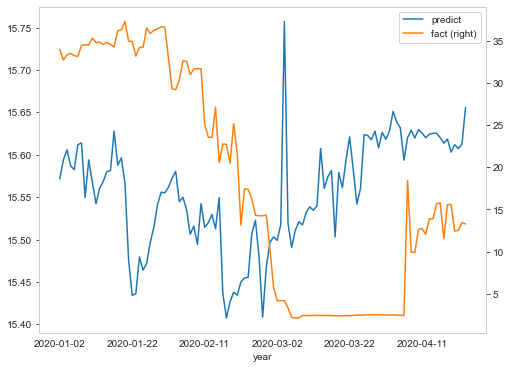

In [674]:
yhat = yhat.flatten() 
Y_traint = Y_traint.flatten()
Y_traint4 = Y_traint#[0:121]
datadt4 = datadt#[0:121]
import pandas as pd

df = pd.DataFrame(data={'year': datadt4, 
                        'predict': yhat, 
                        'fact': Y_traint4})
import matplotlib.pyplot as plt # Impot the relevant module

fig, ax = plt.subplots() # Create the figure and axes object

# Plot the first x and y axes:
df.plot(x = 'year', y = 'predict', ax = ax) 
# Plot the second x and y axes. By secondary_y = True a second y-axis is requested:
# (see https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.plot.html for details)
#df.plot(label = "well")

df.plot(x = 'year', y = 'fact', ax = ax, secondary_y = True)

In [659]:
# multivariate mlp example
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate
 
# split a multivariate sequence into samples
def split_sequences(sequences, n_steps_in, n_steps_out):
	X, y = list(), list()
	for i in range(len(sequences)):
		# find the end of this pattern
		end_ix = i + n_steps_in
		out_end_ix = end_ix + n_steps_out
		# check if we are beyond the dataset
		if out_end_ix > len(sequences):
			break
		# gather input and output parts of the pattern
		seq_x, seq_y = sequences[i:end_ix, :], sequences[end_ix:out_end_ix, :]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
 
# последовательность
in_seq1 = X_leftt
in_seq2 = X_rightt
out_seq = Y_traint # array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1), 6))
in_seq2 = in_seq2.reshape((len(in_seq2), 5))
out_seq = out_seq.reshape((len(out_seq), 1))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
# таймстепы
n_steps_in, n_steps_out = 15, 8
# convert into input/output
X,y = split_sequences(dataset, n_steps_in, n_steps_out)



# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]
# первая модель

yhat = model.predict([X1, X2], verbose=0)
print(yhat)

[[15.571439 ]
 [15.593541 ]
 [15.6058035]
 [15.586799 ]
 [15.582412 ]
 [15.611743 ]
 [15.613945 ]
 [15.549568 ]
 [15.593912 ]
 [15.5677595]
 [15.542126 ]
 [15.560274 ]
 [15.568421 ]
 [15.580098 ]
 [15.581204 ]
 [15.627732 ]
 [15.587639 ]
 [15.596271 ]
 [15.566258 ]
 [15.476225 ]
 [15.434144 ]
 [15.436147 ]
 [15.479374 ]
 [15.463866 ]
 [15.472156 ]
 [15.497077 ]
 [15.514703 ]
 [15.541499 ]
 [15.555796 ]
 [15.555064 ]
 [15.561612 ]
 [15.572281 ]
 [15.580512 ]
 [15.544573 ]
 [15.549786 ]
 [15.535149 ]
 [15.506131 ]
 [15.515769 ]
 [15.494183 ]
 [15.54222  ]
 [15.514424 ]
 [15.5196085]
 [15.529482 ]
 [15.512757 ]
 [15.549388 ]
 [15.4369   ]
 [15.407461 ]
 [15.426497 ]
 [15.437825 ]
 [15.434371 ]
 [15.450009 ]
 [15.454554 ]
 [15.455541 ]
 [15.50641  ]
 [15.522769 ]
 [15.479858 ]
 [15.408424 ]
 [15.467151 ]
 [15.496461 ]
 [15.503058 ]
 [15.498915 ]
 [15.517576 ]
 [15.757117 ]
 [15.518882 ]
 [15.490797 ]
 [15.5105095]
 [15.520896 ]
 [15.517178 ]
 [15.531701 ]
 [15.538495 ]
 [15.534457 ]
 [15.5

In [660]:
yhat.shape

(113, 1)

In [661]:
yhat = yhat.flatten() 
Y_traint = Y_traint.flatten()

datadt4 = datadt[0:113]
Y_traint4 = Y_traint[0:113]

<AxesSubplot:label='f6ed9d57-231a-4d53-9b16-4c7826c38771'>

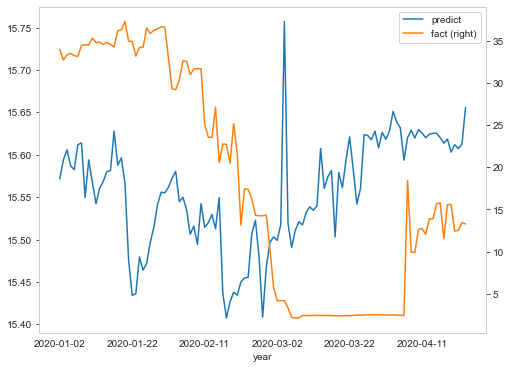

In [662]:

#Y_traint4 = Y_traint#[0:121]
#datadt4 = datadt#[0:121]
import pandas as pd

df = pd.DataFrame(data={'year': datadt4, 
                        'predict': yhat, 
                        'fact': Y_traint4})
import matplotlib.pyplot as plt # Impot the relevant module

fig, ax = plt.subplots() # Create the figure and axes object

# Plot the first x and y axes:
df.plot(x = 'year', y = 'predict', ax = ax) 
# Plot the second x and y axes. By secondary_y = True a second y-axis is requested:
# (see https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.plot.html for details)
df.plot(x = 'year', y = 'fact', ax = ax, secondary_y = True)

# # MULTISTEP_LSTM ENCODER (REPEATER)

In [200]:
# multivariate mlp example
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate
import tensorflow as tf
import tensorflow_addons as tfa 
# split a multivariate sequence into samples
def split_sequences(sequences, n_steps_in, n_steps_out):
	X, y = list(), list()
	for i in range(len(sequences)):
		# find the end of this pattern
		end_ix = i + n_steps_in
		out_end_ix = end_ix + n_steps_out
		# check if we are beyond the dataset
		if out_end_ix > len(sequences):
			break
		# gather input and output parts of the pattern
		seq_x, seq_y = sequences[i:end_ix, :], sequences[end_ix:out_end_ix, :]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
 
# последовательность
in_seq1 = X_leftl
in_seq2 = X_rightl
out_seq = Y_trainl # array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1), 6))
in_seq2 = in_seq2.reshape((len(in_seq2), 5))
out_seq = out_seq.reshape((len(out_seq), 1))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
# таймстепы
n_features = 11

n_steps_in, n_steps_out = 15, 1
# convert into input/output
X,y = split_sequences(dataset, n_steps_in, n_steps_out)
n_features1 = 1
n_features2 = 1
# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]
# первая модель
visible1 = Input(shape=(n_steps_in,n_features1))

visible1n = tfa.layers.GroupNormalization(1,-1,0.001,False)(visible1)
dense1 = LSTM(100, input_shape =(100,n_features1))(visible1n)

visible11 = (RepeatVector(n_steps_out))(dense1)

visible21 = (LSTM(n_steps_in, activation='softplus',return_sequences=True))(visible11)
visible31 = (TimeDistributed(Dense(n_features)))(visible21)


#,batch_input_shape=(32,100,1), stateful=True
# вторая модель LSTM
visible2 = Input(shape=(n_steps_in,n_features2))
visible2n = tfa.layers.GroupNormalization(1,-1,0.001,False)(visible2)

lstm = LSTM(100, input_shape =(100,n_features2))(visible2n)

visible12 = (RepeatVector(n_steps_out))(lstm)
visible22 = (LSTM(200, activation='softplus',return_sequences=True))(visible12)
visible32 = (TimeDistributed(Dense(n_features)))(visible22)


#lstm2 = LSTM(10, input_shape =(100,1))(lstm)

# слияние
merge = concatenate([dense1, lstm])
output = Dense(1)(merge)
model = Model(inputs=[visible1, visible2], outputs=output)
model.compile(optimizer='adam', loss='mape', metrics=['accuracy'])
# fit model
model.fit([X1, X2], Y_trainl, epochs=400, verbose=1, batch_size=16, validation_split=0.01)
# demonstrate prediction
#x_input = array([[80, 85], [90, 95], [100, 105]])
#x1 = x_input[:, 0].reshape((1, n_steps))
#x2 = x_input[:, 1].reshape((1, n_steps))
yhat = model.predict([X1, X2], verbose=0)
print(yhat)

Epoch 1/400
45/45 [==============================] - 7s 59ms/step - loss: 88.5785 - accuracy: 0.0000e+00 - val_loss: 23.1862 - val_accuracy: 0.0000e+00
Epoch 2/400
45/45 [==============================] - 1s 22ms/step - loss: 19.5456 - accuracy: 0.0000e+00 - val_loss: 7.2551 - val_accuracy: 0.0000e+00
Epoch 3/400
45/45 [==============================] - 1s 22ms/step - loss: 17.7560 - accuracy: 0.0000e+00 - val_loss: 9.6146 - val_accuracy: 0.0000e+00
Epoch 4/400
45/45 [==============================] - 1s 22ms/step - loss: 20.8718 - accuracy: 0.0000e+00 - val_loss: 8.2556 - val_accuracy: 0.0000e+00
Epoch 5/400
45/45 [==============================] - 1s 22ms/step - loss: 18.0971 - accuracy: 0.0000e+00 - val_loss: 9.3718 - val_accuracy: 0.0000e+00
Epoch 6/400
45/45 [==============================] - 1s 22ms/step - loss: 18.9587 - accuracy: 0.0000e+00 - val_loss: 8.6742 - val_accuracy: 0.0000e+00
Epoch 7/400
45/45 [==============================] - 1s 22ms/step - loss: 18.8747 - accuracy:

Epoch 55/400
45/45 [==============================] - 1s 22ms/step - loss: 18.6284 - accuracy: 0.0000e+00 - val_loss: 11.8274 - val_accuracy: 0.0000e+00
Epoch 56/400
45/45 [==============================] - 1s 22ms/step - loss: 18.9861 - accuracy: 0.0000e+00 - val_loss: 15.4135 - val_accuracy: 0.0000e+00
Epoch 57/400
45/45 [==============================] - 1s 22ms/step - loss: 18.3129 - accuracy: 0.0000e+00 - val_loss: 10.8881 - val_accuracy: 0.0000e+00
Epoch 58/400
45/45 [==============================] - 1s 28ms/step - loss: 18.5240 - accuracy: 0.0000e+00 - val_loss: 12.0165 - val_accuracy: 0.0000e+00
Epoch 59/400
45/45 [==============================] - 1s 25ms/step - loss: 22.6928 - accuracy: 0.0000e+00 - val_loss: 17.1483 - val_accuracy: 0.0000e+00
Epoch 60/400
45/45 [==============================] - 1s 22ms/step - loss: 18.2376 - accuracy: 0.0000e+00 - val_loss: 14.0428 - val_accuracy: 0.0000e+00
Epoch 61/400
45/45 [==============================] - 1s 22ms/step - loss: 20.7123

45/45 [==============================] - 1s 23ms/step - loss: 21.3497 - accuracy: 0.0000e+00 - val_loss: 18.1894 - val_accuracy: 0.0000e+00
Epoch 162/400
45/45 [==============================] - 1s 23ms/step - loss: 17.4279 - accuracy: 0.0000e+00 - val_loss: 17.4261 - val_accuracy: 0.0000e+00
Epoch 163/400
45/45 [==============================] - 1s 23ms/step - loss: 17.7081 - accuracy: 0.0000e+00 - val_loss: 18.7106 - val_accuracy: 0.0000e+00
Epoch 164/400
45/45 [==============================] - 1s 23ms/step - loss: 16.8304 - accuracy: 0.0000e+00 - val_loss: 17.8299 - val_accuracy: 0.0000e+00
Epoch 165/400
45/45 [==============================] - 1s 24ms/step - loss: 16.2357 - accuracy: 0.0000e+00 - val_loss: 19.0320 - val_accuracy: 0.0000e+00
Epoch 166/400
45/45 [==============================] - 1s 24ms/step - loss: 16.4846 - accuracy: 0.0000e+00 - val_loss: 19.7327 - val_accuracy: 0.0000e+00
Epoch 167/400
45/45 [==============================] - 1s 26ms/step - loss: 17.4545 - accu

45/45 [==============================] - 1s 25ms/step - loss: 16.1694 - accuracy: 0.0000e+00 - val_loss: 19.1428 - val_accuracy: 0.0000e+00
Epoch 268/400
45/45 [==============================] - 1s 24ms/step - loss: 15.7713 - accuracy: 0.0000e+00 - val_loss: 18.5549 - val_accuracy: 0.0000e+00
Epoch 269/400
45/45 [==============================] - 1s 24ms/step - loss: 16.9135 - accuracy: 0.0000e+00 - val_loss: 19.7971 - val_accuracy: 0.0000e+00
Epoch 270/400
45/45 [==============================] - 1s 23ms/step - loss: 21.3202 - accuracy: 0.0000e+00 - val_loss: 20.3659 - val_accuracy: 0.0000e+00
Epoch 271/400
45/45 [==============================] - 1s 24ms/step - loss: 15.7116 - accuracy: 0.0000e+00 - val_loss: 20.1253 - val_accuracy: 0.0000e+00
Epoch 272/400
45/45 [==============================] - 1s 23ms/step - loss: 17.6429 - accuracy: 0.0000e+00 - val_loss: 19.2640 - val_accuracy: 0.0000e+00
Epoch 273/400
45/45 [==============================] - 1s 23ms/step - loss: 16.7213 - accu

45/45 [==============================] - 1s 24ms/step - loss: 17.9258 - accuracy: 0.0000e+00 - val_loss: 19.7977 - val_accuracy: 0.0000e+00
Epoch 374/400
45/45 [==============================] - 1s 24ms/step - loss: 15.4899 - accuracy: 0.0000e+00 - val_loss: 20.4960 - val_accuracy: 0.0000e+00
Epoch 375/400
45/45 [==============================] - 1s 23ms/step - loss: 15.4817 - accuracy: 0.0000e+00 - val_loss: 18.8099 - val_accuracy: 0.0000e+00
Epoch 376/400
45/45 [==============================] - 1s 24ms/step - loss: 15.3293 - accuracy: 0.0000e+00 - val_loss: 22.1520 - val_accuracy: 0.0000e+00
Epoch 377/400
45/45 [==============================] - 1s 24ms/step - loss: 15.7930 - accuracy: 0.0000e+00 - val_loss: 19.5400 - val_accuracy: 0.0000e+00
Epoch 378/400
45/45 [==============================] - 1s 23ms/step - loss: 16.8119 - accuracy: 0.0000e+00 - val_loss: 20.6335 - val_accuracy: 0.0000e+00
Epoch 379/400
45/45 [==============================] - 1s 24ms/step - loss: 17.5729 - accu

In [201]:
# multivariate mlp example
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate
 
# split a multivariate sequence into samples
def split_sequences(sequences, n_steps_in, n_steps_out):
	X, y = list(), list()
	for i in range(len(sequences)):
		# find the end of this pattern
		end_ix = i + n_steps_in
		out_end_ix = end_ix + n_steps_out
		# check if we are beyond the dataset
		if out_end_ix > len(sequences):
			break
		# gather input and output parts of the pattern
		seq_x, seq_y = sequences[i:end_ix, :], sequences[end_ix:out_end_ix, :]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
 
# последовательность
in_seq1 = X_leftt
in_seq2 = X_rightt
out_seq = Y_traint # array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1), 6))
in_seq2 = in_seq2.reshape((len(in_seq2), 5))
out_seq = out_seq.reshape((len(out_seq), 1))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
# таймстепы
n_steps_in, n_steps_out = 15, 1
# convert into input/output
X,y = split_sequences(dataset, n_steps_in, n_steps_out)



# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]
# первая модель

yhat = model.predict([X1, X2], verbose=0)
print(yhat)

[[21.826527]
 [23.551384]
 [23.87204 ]
 [24.115871]
 [25.040726]
 [27.464497]
 [27.770613]
 [29.064495]
 [28.631142]
 [25.0943  ]
 [26.276478]
 [25.985142]
 [26.424278]
 [30.5713  ]
 [29.952087]
 [24.313702]
 [27.710018]
 [28.019924]
 [27.689167]
 [25.942713]
 [25.804497]
 [25.976274]
 [26.931587]
 [27.306273]
 [26.79198 ]
 [27.844599]
 [24.04815 ]
 [25.233826]
 [24.15129 ]
 [25.889305]
 [26.926224]
 [25.756865]
 [26.34691 ]
 [21.534515]
 [22.889135]
 [22.170755]
 [18.970917]
 [19.728912]
 [19.188862]
 [22.250835]
 [21.291069]
 [28.364105]
 [28.68132 ]
 [21.38395 ]
 [22.17435 ]
 [18.300198]
 [21.629501]
 [24.632395]
 [26.573015]
 [29.27715 ]
 [29.34307 ]
 [29.076874]
 [28.667645]
 [28.218729]
 [27.264507]
 [27.365002]
 [26.484997]
 [27.247093]
 [27.653467]
 [22.836983]
 [22.974339]
 [23.169613]
 [22.04569 ]
 [19.817654]
 [21.227776]
 [21.643152]
 [22.784807]
 [24.351486]
 [26.170553]
 [27.47233 ]
 [27.568466]
 [27.301079]
 [28.343002]
 [29.083866]
 [28.741352]
 [28.116917]
 [27.344044]

In [203]:
yhat.shape

(120, 1)

In [204]:
yhat = yhat.flatten() 
Y_traint = Y_traint.flatten()

datadt4 = datadt[0:120]
Y_traint4 = Y_traint[0:120]

In [210]:
from sklearn.metrics import r2_score
r2_score(Y_traint4, yhat)

-0.5537244077150563

In [211]:
from sklearn.metrics import mean_squared_error
mean_squared_error(Y_traint4, yhat, squared=False)


16.13741559366788

In [212]:
from sklearn.metrics import mean_squared_error
mean_squared_error(yhat, Y_traint4, squared=False)

16.13741559366788

In [213]:
from sklearn.metrics import mean_absolute_percentage_error

mean_absolute_percentage_error(Y_traint4, yhat)

3.317494639654068

In [214]:
from sklearn.metrics import mean_absolute_error
mean_absolute_error(Y_traint4, yhat)

14.190935733787027

In [89]:
yhat.shape

(120,)

<AxesSubplot:>

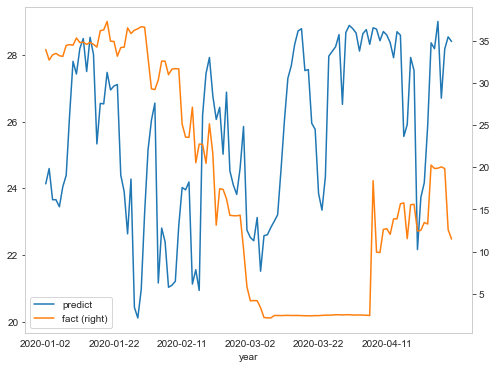

In [91]:

Y_traint4 = Y_traint[0:120]
datadt4 = datadt[0:120]
import pandas as pd

df = pd.DataFrame(data={'year': datadt4, 
                        'predict': yhat, 
                        'fact': Y_traint4})
import matplotlib.pyplot as plt # Impot the relevant module

fig, ax = plt.subplots() # Create the figure and axes object

# Plot the first x and y axes:
df.plot(x = 'year', y = 'predict', ax = ax) 
# Plot the second x and y axes. By secondary_y = True a second y-axis is requested:
# (see https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.plot.html for details)
df.plot(x = 'year', y = 'fact', ax = ax, secondary_y = True)

In [92]:
# multivariate mlp example
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate
 
# split a multivariate sequence into samples
def split_sequences(sequences, n_steps_in, n_steps_out):
	X, y = list(), list()
	for i in range(len(sequences)):
		# find the end of this pattern
		end_ix = i + n_steps_in
		out_end_ix = end_ix + n_steps_out
		# check if we are beyond the dataset
		if out_end_ix > len(sequences):
			break
		# gather input and output parts of the pattern
		seq_x, seq_y = sequences[i:end_ix, :], sequences[end_ix:out_end_ix, :]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
 
# последовательность
in_seq1 = X_leftt
in_seq2 = X_rightt
out_seq = Y_traint # array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1), 6))
in_seq2 = in_seq2.reshape((len(in_seq2), 5))
out_seq = out_seq.reshape((len(out_seq), 1))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
# таймстепы
n_steps_in, n_steps_out = 15, 2
# convert into input/output
X,y = split_sequences(dataset, n_steps_in, n_steps_out)



# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]
# первая модель

yhat = model.predict([X1, X2], verbose=0)
print(yhat)

[[24.132906]
 [24.590822]
 [23.657623]
 [23.657501]
 [23.446777]
 [24.046734]
 [24.387753]
 [26.190708]
 [27.801342]
 [27.422173]
 [28.187778]
 [28.48497 ]
 [27.49702 ]
 [28.520607]
 [28.012196]
 [25.328785]
 [26.542252]
 [26.528194]
 [27.470764]
 [26.945786]
 [27.06418 ]
 [27.107794]
 [24.396353]
 [23.898968]
 [22.635578]
 [24.27596 ]
 [20.434164]
 [20.115475]
 [20.968014]
 [23.268574]
 [25.151913]
 [26.041626]
 [26.549961]
 [21.163757]
 [22.808628]
 [22.394005]
 [21.035513]
 [21.095676]
 [21.216335]
 [22.872053]
 [24.02302 ]
 [23.953693]
 [24.188734]
 [21.13051 ]
 [21.560616]
 [20.940779]
 [26.194723]
 [27.4361  ]
 [27.918001]
 [26.764723]
 [26.062107]
 [26.423145]
 [25.020252]
 [26.879784]
 [24.521883]
 [24.098644]
 [23.815845]
 [24.603575]
 [25.849657]
 [22.746605]
 [22.52478 ]
 [22.42958 ]
 [23.124836]
 [21.515142]
 [22.580442]
 [22.608574]
 [22.825535]
 [23.010506]
 [23.206463]
 [24.567867]
 [26.040966]
 [27.29438 ]
 [27.670288]
 [28.309944]
 [28.712925]
 [28.78007 ]
 [27.524256]

In [94]:
yhat = yhat.flatten() 
Y_traint = Y_traint.flatten()

datadt4 = datadt[0:119]
Y_traint4 = Y_traint[0:119]

<AxesSubplot:>

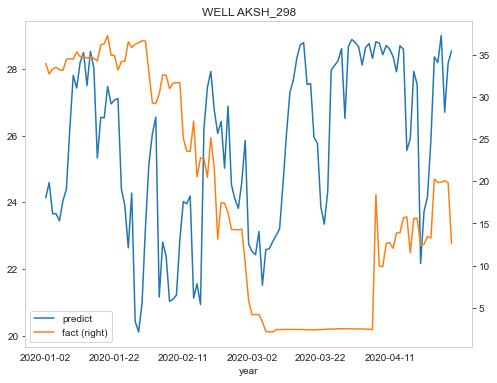

In [95]:



#Y_traint4 = Y_traint#[0:121]
#datadt4 = datadt#[0:121]
import pandas as pd

df = pd.DataFrame(data={'year': datadt4, 
                        'predict': yhat, 
                        'fact': Y_traint4})
import matplotlib.pyplot as plt # Impot the relevant module

fig, ax = plt.subplots() # Create the figure and axes object

# Plot the first x and y axes:
df.plot(x = 'year', y = 'predict',title = "WELL AKSH_298", ax = ax) 
# Plot the second x and y axes. By secondary_y = True a second y-axis is requested:
# (see https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.plot.html for details)
df.plot(x = 'year', y = 'fact', ax = ax, secondary_y = True)

# SEQUENTIAL 8 layer ConvLSTM2D

In [119]:
# multivariate mlp example
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate
# multivariate multi-step encoder-decoder lstm example
from numpy import array
from numpy import hstack
from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dense
from keras.layers import RepeatVector
from keras.layers import TimeDistributed
n_features = 5 
# split a multivariate sequence into samples
def split_sequences(sequences, n_steps_in, n_steps_out):
	X, y = list(), list()
	for i in range(len(sequences)):
		# find the end of this pattern
		end_ix = i + n_steps_in
		out_end_ix = end_ix + n_steps_out
		# check if we are beyond the dataset
		if out_end_ix > len(sequences):
			break
		# gather input and output parts of the pattern
		seq_x, seq_y = sequences[i:end_ix, :], sequences[end_ix:out_end_ix, :]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
# последовательность
in_seq1 = X_leftl#[0:856]
#in_seq2 = X_rightl#[0:856]
out_seq = Y_trainl#[0:856] # array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1), 6,1,1))
#in_seq2 = in_seq2.reshape((len(in_seq2), 1,1,1))
out_seq = out_seq.reshape((len(out_seq), 1,1,1))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, out_seq))
# таймстепы



n_steps_in, n_steps_out = 15, 1
n_features1 = 1
# convert into input/output
X, y = split_sequences(dataset, n_steps_in, n_steps_out)
# разделение данных 
X1 = X[:, :, 0]
#X2 = X[:, :, 1]
# первая модель
visible1 = Input(batch_input_shape = (1,n_steps_in,1,n_features1,1)) #batch_input_shape = (1,n_steps_in,n_features1)
 #,batch_input_shape=(32,100,1), stateful=True
denser =  tf.keras.layers.GaussianNoise(stddev=0)(visible1) #генерация шума Гауссовый 
dense1 =  build_model(1100,15,1,1)(denser)
Conv0   =  ConvLSTM2D(name ='conv_lstm_1',
                         filters = 64, kernel_size = (2, 1), 
                         padding='same',
                         return_sequences = False)(dense1) #блокировка слоя 

# вторая модель LSTM


n_features1 = 1
# слияние

output = Dense(n_features)(Conv0)
model = Model(inputs=[visible1], outputs=output)
model.compile(optimizer='adam', loss='mape', metrics=['accuracy'])
# fit model
model.fit([X1], Y_train, epochs=4, verbose=1, batch_size=1, validation_split=0.1)
# demonstrate prediction
#x_input = array([[80, 85], [90, 95], [100, 105]])
#x1 = x_input[:, 0].reshape((1, n_steps))
#x2 = x_input[:, 1].reshape((1, n_steps))
yhat = model.predict([X1], verbose=1,batch_size=1)
print(yhat)

Epoch 1/4
642/642 [==============================] - 428s 630ms/step - loss: 55.8007 - accuracy: 0.0000e+00 - val_loss: 14.3797 - val_accuracy: 0.0000e+00
Epoch 2/4
642/642 [==============================] - 350s 545ms/step - loss: 20.8226 - accuracy: 0.0000e+00 - val_loss: 13.9969 - val_accuracy: 0.0000e+00
Epoch 3/4
642/642 [==============================] - 294s 458ms/step - loss: 18.5221 - accuracy: 0.0000e+00 - val_loss: 14.6707 - val_accuracy: 0.0000e+00
Epoch 4/4
714/714 [==============================] - 167s 225ms/step
[[[[27.932306 27.929071 27.901815 27.910368 27.914244]]]


 [[[27.932306 27.929071 27.901815 27.910368 27.914244]]]


 [[[27.932306 27.929071 27.901815 27.910368 27.914244]]]


 ...


 [[[27.932306 27.929071 27.901815 27.910368 27.914242]]]


 [[[27.932306 27.929071 27.901815 27.910366 27.914242]]]


 [[[27.932306 27.929071 27.901815 27.910368 27.914244]]]]


# TEST GENERATOR

In [121]:
# multivariate mlp example
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate
 
# split a multivariate sequence into samples
def split_sequences(sequences, n_steps_in, n_steps_out):
	X, y = list(), list()
	for i in range(len(sequences)):
		# find the end of this pattern
		end_ix = i + n_steps_in
		out_end_ix = end_ix + n_steps_out
		# check if we are beyond the dataset
		if out_end_ix > len(sequences):
			break
		# gather input and output parts of the pattern
		seq_x, seq_y = sequences[i:end_ix, :], sequences[end_ix:out_end_ix, :]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
 
# последовательность
in_seq1 = X_leftt
#in_seq2 = X_rightt
out_seq = Y_traint # array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1), 6,1,1))
#in_seq2 = in_seq2.reshape((len(in_seq2), 5))
out_seq = out_seq.reshape((len(out_seq), 1,1,1))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1,out_seq))
# таймстепы
# таймстепы
n_steps_in, n_steps_out = 15, 1
# convert into input/output
X,y = split_sequences(dataset, n_steps_in, n_steps_out)



# разделение данных 
X1 = X[:, :, 0]
#2 = X[:, :, 1]
# первая модель

yhat = model.predict([X1], verbose=1, batch_size=1)
print(yhat)

120/120 [==============================] - 14s 112ms/step
[[[[27.932306 27.929071 27.901815 27.910368 27.914244]]]


 [[[27.932306 27.929071 27.90182  27.910368 27.914244]]]


 [[[27.932306 27.929071 27.901815 27.910368 27.914244]]]


 [[[27.932306 27.929071 27.901815 27.910368 27.914244]]]


 [[[27.932306 27.929071 27.901815 27.910366 27.914244]]]


 [[[27.932306 27.929071 27.901815 27.910366 27.914244]]]


 [[[27.932306 27.929071 27.901815 27.910368 27.914244]]]


 [[[27.932306 27.929071 27.901815 27.910368 27.914244]]]


 [[[27.932306 27.929071 27.901815 27.910368 27.914244]]]


 [[[27.932306 27.929071 27.901815 27.910368 27.914244]]]


 [[[27.932306 27.929071 27.90182  27.910368 27.914244]]]


 [[[27.932306 27.929071 27.901815 27.910366 27.914244]]]


 [[[27.932306 27.929071 27.901815 27.910366 27.914244]]]


 [[[27.932306 27.929071 27.90182  27.910368 27.914244]]]


 [[[27.932306 27.929071 27.901815 27.910368 27.914244]]]


 [[[27.932306 27.929071 27.901815 27.910368 27.914244]]]


In [131]:
Y_traint = Y_traint.flatten()
yhat = yhat.flatten()

Y_traint4 = Y_traint[0:120]
yhat = yhat[0:120]

In [133]:
#from sklearn.metrics import r2_score
#r2_score(Y_traint, yhat)

In [97]:
Y_train.shape

(865,)

In [729]:
X2.shape

(1231, 1)

In [730]:
Y_train.shape

(1231,)

In [94]:
Y_train.shape

(230, 2, 12)

In [99]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from keras.datasets import mnist
from keras.utils.np_utils import to_categorical
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPooling2D, Activation, LeakyReLU
from keras.layers.noise import AlphaDropout
from keras.utils.generic_utils import get_custom_objects
from keras import backend as K
from keras.optimizers import Adam

In [101]:
# Add the GELU function to Keras

def gelu(x):
    
    if  x>tf.tanh(tf.sqrt(2/np.pi)) :
    
           return 0.5 * x * (1 + tf.tanh(tf.sqrt(2 / np.pi) * (x + 0.044715 * tf.pow(x, 3))))
     
    else:
                 
            return 0.5 * x * (1 + tf.tanh(tf.sqrt(2*tf.tanh(x)/ np.pi) * (x + 0.044715 * tf.pow(x,4))))
                  
                  
get_custom_objects().update({'geluyy': Activation(gelu)})

# Add leaky-relu so we can use it as a string
get_custom_objects().update({'leaky-relu': Activation(LeakyReLU(alpha=0.2))})

act_func = ['sigmoid', 'relu', 'elu', 'leaky-relu', 'selu', 'gelu']

get_custom_objects().update({'gelu': Activation(gelu)})

# # MULTISTEP_CONVLSTM2D

In [102]:
# multivariate mlp example
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate
# multivariate multi-step encoder-decoder lstm example
from numpy import array
from numpy import hstack
from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dense
from keras.layers import RepeatVector
from keras.layers import TimeDistributed
 
# split a multivariate sequence into samples
def split_sequences(sequences, n_steps_in, n_steps_out):
	X, y = list(), list()
	for i in range(len(sequences)):
		# find the end of this pattern
		end_ix = i + n_steps_in
		out_end_ix = end_ix + n_steps_out
		# check if we are beyond the dataset
		if out_end_ix > len(sequences):
			break
		# gather input and output parts of the pattern
		seq_x, seq_y = sequences[i:end_ix, :], sequences[end_ix:out_end_ix, :]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
# последовательность
in_seq1 = X_left#[0:856]
in_seq2 = X_right#[0:856]
out_seq = Y_train#[0:856] # array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1), 6,1,1))
in_seq2 = in_seq2.reshape((len(in_seq2), 5,1,1))
out_seq = out_seq.reshape((len(out_seq), 1,1,1))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
n_steps_in, n_steps_out = 100, 20

n_features1 = 1
n_features2 = 1

# convert into input/output
X, y = split_sequences(dataset, n_steps_in, n_steps_out)
# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]
# первая модель
visible1 = Input(batch_input_shape = (1,n_steps_in,1,n_features1,1))
dense1 =  ConvLSTM2D(name ='conv_lstm_1',
                         filters = 64, kernel_size = (10, 10), 
                         padding='same', stateful = True,
                         return_sequences = True)(visible1) #,batch_input_shape=(32,100,1), stateful=True
# вторая модель LSTM
visible2 = Input(batch_input_shape = (1,n_steps_in,1,n_features2,1))
lstm = ConvLSTM2D(name ='conv_lstm_4',
                         filters = 64, kernel_size = (10, 1), stateful = True, 
                         padding='same', kernel_initializer="glorot_uniform",
                         return_sequences = True)(visible2)
# слияние
merge = concatenate([dense1, lstm])
output = Dense(1)(merge)
model = Model(inputs=[visible1, visible2], outputs=output)
model.compile(optimizer='adam', loss='mape', metrics=['accuracy'])
# fit model
model.fit([X1, X2], Y_train, epochs=2, verbose=1, batch_size=1, validation_split=0.1)
# demonstrate prediction
#x_input = array([[80, 85], [90, 95], [100, 105]])
#x1 = x_input[:, 0].reshape((1, n_steps))
#x2 = x_input[:, 1].reshape((1, n_steps))
yhat = model.predict([X1, X2], verbose=0,batch_size=1)
print(yhat)

Epoch 1/2
671/671 [==============================] - 1080s 2s/step - loss: 37.1932 - accuracy: 0.0000e+00 - val_loss: 14.9500 - val_accuracy: 0.0000e+00
Epoch 2/2
671/671 [==============================] - 985s 1s/step - loss: 18.3329 - accuracy: 0.0000e+00 - val_loss: 12.8937 - val_accuracy: 0.0000e+00
[[[[[27.349651]]]


  [[[27.349627]]]


  [[[27.349527]]]


  ...


  [[[27.34943 ]]]


  [[[27.349426]]]


  [[[27.349329]]]]



 [[[[27.349628]]]


  [[[27.349525]]]


  [[[27.349525]]]


  ...


  [[[27.349426]]]


  [[[27.349329]]]


  [[[27.34973 ]]]]



 [[[[27.349522]]]


  [[[27.349525]]]


  [[[27.349625]]]


  ...


  [[[27.349329]]]


  [[[27.34973 ]]]


  [[[27.350021]]]]



 ...



 [[[[27.348648]]]


  [[[27.348442]]]


  [[[27.348347]]]


  ...


  [[[27.348343]]]


  [[[27.34835 ]]]


  [[[27.34845 ]]]]



 [[[[27.348446]]]


  [[[27.348347]]]


  [[[27.34835 ]]]


  ...


  [[[27.34835 ]]]


  [[[27.34845 ]]]


  [[[27.348347]]]]



 [[[[27.34835 ]]]


  [[[27.34835 ]]]

# ConvLSTM2D corrected model

In [223]:
from keras.layers.merge import concatenate
# multivariate multi-step encoder-decoder lstm example
from numpy import array
from numpy import hstack
from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dense
from keras.layers import RepeatVector
from keras.layers import TimeDistributed
n_features = 5 
# split a multivariate sequence into samples
def split_sequences(sequences, n_steps_in, n_steps_out):
	X, y = list(), list()
	for i in range(len(sequences)):
		# find the end of this pattern
		end_ix = i + n_steps_in
		out_end_ix = end_ix + n_steps_out
		# check if we are beyond the dataset
		if out_end_ix > len(sequences):
			break
		# gather input and output parts of the pattern
		seq_x, seq_y = sequences[i:end_ix, :], sequences[end_ix:out_end_ix, :]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
# последовательность
in_seq1 = X_left#[0:856]
in_seq2 = X_right#[0:856]
out_seq = Y_train#[0:856] # array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1),6,1,1))
in_seq2 = in_seq2.reshape((len(in_seq2),5,1,1))
out_seq = out_seq.reshape((len(out_seq),1,1,1))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
n_steps_in, n_steps_out = 100, 20
n_outputs = 20
# convert into input/output
X, y = split_sequences(dataset, n_steps_in, n_steps_out)
# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]
# первая модель

n_lenght1,n_lenghth2  = 1,1

visible1 = Input(batch_input_shape = (1,n_steps_in,1,n_lenght1,1))
dense1 =  ConvLSTM2D(name ='conv_lstm_1',
                         filters = 64, kernel_size = (10, 10), 
                         padding='same', stateful = True, kernel_initializer="glorot_uniform",
                         return_sequences = False)(visible1)
fl1 =                    Flatten()(dense1)                            #,batch_input_shape=(32,100,1), stateful=True
Rv1 =                    RepeatVector(n_outputs)(fl1)
lstm1 =                  LSTM(n_steps_in, activation='relu', return_sequences=True)(Rv1)
TD1 =                    TimeDistributed(Dense(n_steps_in, activation='relu'))(lstm1)
TD11 =                   TimeDistributed(Dense(1))(TD1)  
#,batch_input_shape=(32,100,1), stateful=True
# вторая модель LSTM
visible2 = Input(batch_input_shape = (1,n_steps_in,1,n_lenghth2,1))
lstm = ConvLSTM2D(name ='conv_lstm_4',
                         filters = 64, kernel_size = (10, 1), 
                         padding='same',stateful =  True, kernel_initializer="glorot_uniform",
                         return_sequences = False)(visible2)
fl2 =                    Flatten()(dense1)                            #,batch_input_shape=(32,100,1), stateful=True
Rv2 =                    RepeatVector(n_outputs)(fl2)
lstm2 =                  LSTM(n_steps_in, activation='relu', return_sequences=True)(Rv2)
TD2 =                    TimeDistributed(Dense(n_steps_in, activation='relu'))(lstm2)
TD11 =                   TimeDistributed(Dense(1))(TD2)  
n_features = 1
# слияние
merge = concatenate([dense1, lstm])
output = Dense(n_features)(merge)
model = Model(inputs=[visible1, visible2], outputs=output)
model.compile(optimizer='adam', loss='mape', metrics=['accuracy'])
# fit model
model.fit([X1, X2], Y_train, epochs=1, verbose=1, batch_size=1, validation_split=0.1)
# demonstrate prediction
#x_input = array([[80, 85], [90, 95], [100, 105]])
#x1 = x_input[:, 0].reshape((1, n_steps))
#x2 = x_input[:, 1].reshape((1, n_steps))
yhat = model.predict([X1, X2], verbose=1,batch_size=1)
print(yhat)

746/746 [==============================] - 138s 182ms/step
[[[[25.629606]]]


 [[[25.752495]]]


 [[[25.865025]]]


 [[[26.146975]]]


 [[[26.171402]]]


 [[[26.111032]]]


 [[[26.122911]]]


 [[[26.091892]]]


 [[[26.088121]]]


 [[[26.16495 ]]]


 [[[26.33591 ]]]


 [[[26.517393]]]


 [[[26.439407]]]


 [[[26.658146]]]


 [[[25.849356]]]


 [[[26.672773]]]


 [[[26.35691 ]]]


 [[[26.346804]]]


 [[[26.111616]]]


 [[[26.001715]]]


 [[[25.938845]]]


 [[[25.89544 ]]]


 [[[25.942694]]]


 [[[26.016338]]]


 [[[26.071793]]]


 [[[25.858278]]]


 [[[25.78459 ]]]


 [[[25.82724 ]]]


 [[[25.892462]]]


 [[[25.939302]]]


 [[[25.993195]]]


 [[[26.053602]]]


 [[[26.080217]]]


 [[[25.863655]]]


 [[[25.680183]]]


 [[[25.672068]]]


 [[[25.65254 ]]]


 [[[25.672686]]]


 [[[25.700647]]]


 [[[25.669117]]]


 [[[25.572453]]]


 [[[25.685562]]]


 [[[25.722797]]]


 [[[25.73012 ]]]


 [[[25.834932]]]


 [[[25.963137]]]


 [[[26.083437]]]


 [[[26.180408]]]


 [[[26.235464]]]


 [[[26.236

 [[[25.306044]]]]


# Stateful = true

In [76]:
from keras.layers.merge import concatenate
# multivariate multi-step encoder-decoder lstm example
from numpy import array
from numpy import hstack
from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dense
from keras.layers import RepeatVector
from keras.layers import TimeDistributed
n_features = 5 
# split a multivariate sequence into samples
def split_sequences(sequences, n_steps_in, n_steps_out):
	X, y = list(), list()
	for i in range(len(sequences)):
		# find the end of this pattern
		end_ix = i + n_steps_in
		out_end_ix = end_ix + n_steps_out
		# check if we are beyond the dataset
		if out_end_ix > len(sequences):
			break
		# gather input and output parts of the pattern
		seq_x, seq_y = sequences[i:end_ix, :], sequences[end_ix:out_end_ix, :]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
# последовательность
in_seq1 = X_left#[0:856]
in_seq2 = X_right#[0:856]
out_seq = Y_train#[0:856] # array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1),6,1,1))
in_seq2 = in_seq2.reshape((len(in_seq2),5,1,1))
out_seq = out_seq.reshape((len(out_seq),1,1,1))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
n_steps_in, n_steps_out = 100, 20
n_outputs = 20
# convert into input/output
X, y = split_sequences(dataset, n_steps_in, n_steps_out)
# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]
# первая модель

n_lenght1,n_lenghth2  = 1,1

visible1 = Input(batch_input_shape = (1,n_steps_in,1,n_lenght1,1))
dense1 =  ConvLSTM2D(name ='conv_lstm_1',
                         filters = 64, kernel_size = (10, 10), 
                         padding='same', stateful = True, kernel_initializer="glorot_uniform",
                         return_sequences = False)(visible1)
fl1 =                    Flatten()(dense1)                            #,batch_input_shape=(32,100,1), stateful=True
Rv1 =                    RepeatVector(n_outputs)(fl1)
lstm1 =                  LSTM(n_steps_in, activation='relu', return_sequences=True)(Rv1)
TD1 =                    TimeDistributed(Dense(n_steps_in, activation='relu'))(lstm1)
TD11 =                   TimeDistributed(Dense(1))(TD1)  
#,batch_input_shape=(32,100,1), stateful=True
# вторая модель LSTM
visible2 = Input(batch_input_shape = (1,n_steps_in,1,n_lenghth2,1))
lstm = ConvLSTM2D(name ='conv_lstm_4',
                         filters = 64, kernel_size = (10, 1), 
                         padding='same',stateful =  True, kernel_initializer="glorot_uniform",
                         return_sequences = False)(visible2)
fl2 =                    Flatten()(dense1)                            #,batch_input_shape=(32,100,1), stateful=True
Rv2 =                    RepeatVector(n_outputs)(fl2)
lstm2 =                  LSTM(n_steps_in, activation='relu', return_sequences=True)(Rv2)
TD2 =                    TimeDistributed(Dense(n_steps_in, activation='relu'))(lstm2)
TD11 =                   TimeDistributed(Dense(1))(TD2)  
n_features = 1
# слияние
merge = concatenate([dense1, lstm])
output = Dense(n_features)(merge)
model = Model(inputs=[visible1, visible2], outputs=output)
model.compile(optimizer='adam', loss='mape', metrics=['accuracy'])
# fit model
model.fit([X1, X2], Y_train, epochs=1, verbose=1, batch_size=1, validation_split=0.1)
# demonstrate prediction
#x_input = array([[80, 85], [90, 95], [100, 105]])
#x1 = x_input[:, 0].reshape((1, n_steps))
#x2 = x_input[:, 1].reshape((1, n_steps))
yhat = model.predict([X1, X2], verbose=1,batch_size=1)
print(yhat)

746/746 [==============================] - 136s 182ms/step
[[[[27.580538 27.476065 27.77109  27.453129 27.48908 ]]]


 [[[27.58334  27.481434 27.774294 27.46065  27.496449]]]


 [[[27.585375 27.48561  27.776869 27.46646  27.502289]]]


 ...


 [[[26.972849 26.254848 27.254213 26.63161  26.163721]]]


 [[[26.972067 26.253372 27.25334  26.62954  26.161701]]]


 [[[26.972067 26.253304 27.253279 26.629454 26.161581]]]]


In [71]:
from keras.layers.merge import concatenate
# multivariate multi-step encoder-decoder lstm example
from numpy import array
from numpy import hstack
from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dense
from keras.layers import RepeatVector
from keras.layers import TimeDistributed
n_features = 5 
# split a multivariate sequence into samples
def split_sequences(sequences, n_steps_in, n_steps_out):
	X, y = list(), list()
	for i in range(len(sequences)):
		# find the end of this pattern
		end_ix = i + n_steps_in
		out_end_ix = end_ix + n_steps_out
		# check if we are beyond the dataset
		if out_end_ix > len(sequences):
			break
		# gather input and output parts of the pattern
		seq_x, seq_y = sequences[i:end_ix, :], sequences[end_ix:out_end_ix, :]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
# последовательность
in_seq1 = X_left#[0:856]
in_seq2 = X_right#[0:856]
out_seq = Y_train#[0:856] # array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1), 6,1,1))
in_seq2 = in_seq2.reshape((len(in_seq2), 5,1,1))
out_seq = out_seq.reshape((len(out_seq), 1,1,1))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
n_steps_in, n_steps_out = 100, 20
n_outputs = 20
# convert into input/output
X, y = split_sequences(dataset, n_steps_in, n_steps_out)
# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]
# первая модель

n_lenght1,n_lenghth2  = 1,1

visible1 = Input(batch_input_shape = (1,n_steps_in,1,n_lenght1,1))
dense1 =  ConvLSTM2D(name ='conv_lstm_1',
                         filters = 64, kernel_size = (10, 10), 
                         padding='same', stateful = True, kernel_initializer="glorot_uniform",
                         return_sequences = True)(visible1)
fl1 =                    Flatten()(dense1)                            #,batch_input_shape=(32,100,1), stateful=True
Rv1 =                    RepeatVector(n_outputs)(fl1)
lstm1 =                  LSTM(n_steps_in, activation='relu', return_sequences=True)(Rv1)
TD1 =                    TimeDistributed(Dense(n_steps_in, activation='relu'))(lstm1)
TD11 =                   TimeDistributed(Dense(1))(TD1)  
#,batch_input_shape=(32,100,1), stateful=True
# вторая модель LSTM
visible2 = Input(batch_input_shape = (1,n_steps_in,1,n_lenghth2,1))
lstm = ConvLSTM2D(name ='conv_lstm_4',
                         filters = 64, kernel_size = (10, 1), 
                         padding='same',stateful =  True, kernel_initializer="glorot_uniform",
                         return_sequences = True)(visible2)
fl2 =                    Flatten()(dense1)                            #,batch_input_shape=(32,100,1), stateful=True
Rv2 =                    RepeatVector(n_outputs)(fl2)
lstm2 =                  LSTM(n_steps_in, activation='relu', return_sequences=True)(Rv2)
TD2 =                    TimeDistributed(Dense(n_steps_in, activation='relu'))(lstm2)
TD11 =                   TimeDistributed(Dense(1))(TD2)  
n_features = 1
# слияние
merge = concatenate([dense1, lstm])
output = Dense(n_features)(merge)
model = Model(inputs=[visible1, visible2], outputs=output)
model.compile(optimizer='adam', loss='mape', metrics=['accuracy'])
# fit model
model.fit([X1, X2], Y_train, epochs=1, verbose=1, batch_size=1, validation_split=0.1)
# demonstrate prediction
#x_input = array([[80, 85], [90, 95], [100, 105]])
#x1 = x_input[:, 0].reshape((1, n_steps))
#x2 = x_input[:, 1].reshape((1, n_steps))
yhat = model.predict([X1, X2], verbose=1,batch_size=1)
print(yhat)

746/746 [==============================] - 132s 176ms/step
[[[[[28.140757 28.109192 28.11459  28.183804 28.087439]]]


  [[[28.140757 28.109192 28.11459  28.183804 28.087439]]]


  [[[28.140757 28.109192 28.11459  28.183804 28.087439]]]


  ...


  [[[28.140757 28.109192 28.11459  28.183804 28.087439]]]


  [[[28.140757 28.109192 28.11459  28.183804 28.087439]]]


  [[[28.140757 28.109192 28.11459  28.183804 28.087439]]]]



 [[[[28.140757 28.109192 28.11459  28.183804 28.087439]]]


  [[[28.140757 28.109192 28.11459  28.183804 28.087439]]]


  [[[28.140757 28.109192 28.11459  28.183804 28.087439]]]


  ...


  [[[28.140757 28.109192 28.11459  28.183804 28.087439]]]


  [[[28.140757 28.109192 28.11459  28.183804 28.087439]]]


  [[[28.140757 28.109192 28.11459  28.183804 28.087439]]]]



 [[[[28.140757 28.109192 28.11459  28.183804 28.087439]]]


  [[[28.140757 28.109192 28.11459  28.183804 28.087439]]]


  [[[28.140757 28.109192 28.11459  28.183804 28.087439]]]


  ...


  [[[28.14075

In [73]:
d = yhat[0]
print(d)

[[[[28.140757 28.109192 28.11459  28.183804 28.087439]]]


 [[[28.140757 28.109192 28.11459  28.183804 28.087439]]]


 [[[28.140757 28.109192 28.11459  28.183804 28.087439]]]


 [[[28.140757 28.109192 28.11459  28.183804 28.087439]]]


 [[[28.140757 28.109192 28.11459  28.183804 28.087439]]]


 [[[28.140757 28.109192 28.11459  28.183804 28.087439]]]


 [[[28.140757 28.109192 28.11459  28.183804 28.087439]]]


 [[[28.140757 28.109192 28.11459  28.183804 28.087439]]]


 [[[28.140757 28.109192 28.11459  28.183804 28.087439]]]


 [[[28.140757 28.109192 28.11459  28.183804 28.087439]]]


 [[[28.140757 28.109192 28.11459  28.183804 28.087439]]]


 [[[28.140757 28.109192 28.11459  28.183804 28.087439]]]


 [[[28.140757 28.109192 28.11459  28.183804 28.087439]]]


 [[[28.140757 28.109192 28.11459  28.183804 28.087439]]]


 [[[28.140757 28.109192 28.11459  28.183804 28.087439]]]


 [[[28.140757 28.109192 28.11459  28.183804 28.087439]]]


 [[[28.140757 28.109192 28.11459  28.183804 28.087439]]]

In [ ]:
# multivariate mlp example
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate
# multivariate multi-step encoder-decoder lstm example
from numpy import array
from numpy import hstack
from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dense
from keras.layers import RepeatVector
from keras.layers import TimeDistributed
n_features = 5 
# split a multivariate sequence into samples
def split_sequences(sequences, n_steps_in, n_steps_out):
	X, y = list(), list()
	for i in range(len(sequences)):
		# find the end of this pattern
		end_ix = i + n_steps_in
		out_end_ix = end_ix + n_steps_out
		# check if we are beyond the dataset
		if out_end_ix > len(sequences):
			break
		# gather input and output parts of the pattern
		seq_x, seq_y = sequences[i:end_ix, :], sequences[end_ix:out_end_ix, :]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
# последовательность
in_seq1 = X_leftl#[0:856]
in_seq2 = X_rightl#[0:856]
out_seq = Y_trainl#[0:856] # array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1), 1,1,1))
in_seq2 = in_seq2.reshape((len(in_seq2), 1,1,1))
out_seq = out_seq.reshape((len(out_seq), 1,1,1))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
n_steps_in, n_steps_out = 15, 1

# convert into input/output
X, y = split_sequences(dataset, n_steps_in, n_steps_out)
# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]
# первая модель
visible1 = Input(batch_input_shape = (1,n_steps_in,1,n_features1,1)) #batch_input_shape = (1,n_steps_in,n_features1)
dense1 =  ConvLSTM2D(name ='conv_lstm_1',
                         filters = 64, kernel_size = (10, 10), 
                         padding='same',kernel_initializer="glorot_uniform", stateful = True,
                         return_sequences = True)(visible1) #,batch_input_shape=(32,100,1), stateful=True
Conv0   =  ConvLSTM2D(name ='conv_lstm_1',
                         filters = 64, kernel_size = (2, 1), 
                         padding='same',
                         return_sequences = False)(dense1)

# вторая модель LSTM
visible2 = Input(batch_input_shape = (1,n_steps_in,1,n_features1,1))
lstm = ConvLSTM2D(name ='conv_lstm_4',
                         filters = 64, kernel_size = (10, 1), 
                         padding='same', kernel_initializer="glorot_uniform",stateful = True,
                         return_sequences = True)(visible2)

Conv = ConvLSTM2D(name ='conv_lstm_4',
                         filters = 64, kernel_size = (2, 1), 
                         padding='same', 
                         return_sequences = False)(lstm)

n_features = 1
# слияние
merge = concatenate([dense1, lstm])
output = Dense(n_features)(merge)
model = Model(inputs=[visible1, visible2], outputs=output)
model.compile(optimizer='adam', loss='mape', metrics=['accuracy'])
# fit model
model.fit([X1, X2], Y_train, epochs=20, verbose=1, batch_size=1, validation_split=0.1)
# demonstrate prediction
#x_input = array([[80, 85], [90, 95], [100, 105]])
#x1 = x_input[:, 0].reshape((1, n_steps))
#x2 = x_input[:, 1].reshape((1, n_steps))
yhat = model.predict([X1, X2], verbose=1,batch_size=1)
print(yhat)

In [221]:
from keras.layers.merge import concatenate
# multivariate multi-step encoder-decoder lstm example
from numpy import array
from numpy import hstack
from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dense
from keras.layers import RepeatVector
from keras.layers import TimeDistributed
n_features = 5 
# split a multivariate sequence into samples
def split_sequences(sequences, n_steps_in, n_steps_out):
	X, y = list(), list()
	for i in range(len(sequences)):
		# find the end of this pattern
		end_ix = i + n_steps_in
		out_end_ix = end_ix + n_steps_out
		# check if we are beyond the dataset
		if out_end_ix > len(sequences):
			break
		# gather input and output parts of the pattern
		seq_x, seq_y = sequences[i:end_ix, :], sequences[end_ix:out_end_ix, :]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
# последовательность
in_seq1 = X_left#[0:856]
in_seq2 = X_right#[0:856]
out_seq = Y_train#[0:856] # array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1), 6,1,1))
in_seq2 = in_seq2.reshape((len(in_seq2), 5,1,1))
out_seq = out_seq.reshape((len(out_seq), 1,1,1))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
n_steps_in, n_steps_out = 100, 20
n_outputs = 20
# convert into input/output
X, y = split_sequences(dataset, n_steps_in, n_steps_out)
# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]
# первая модель

n_features1,n_features2  = 1,1

visible1 = Input(batch_input_shape = (1,n_steps_in,1,n_features1,1))
dense1 =  ConvLSTM2D(name ='conv_lstm_1',
                         filters = 64, kernel_size = (10, 10), 
                         padding='same', stateful = True, kernel_initializer="glorot_uniform",
                         return_sequences = True)(visible1)
fl1 =                    Flatten()(dense1)                            #,batch_input_shape=(32,100,1), stateful=True
Rv1 =                    RepeatVector(n_outputs)(fl1)
lstm1 =                  LSTM(n_steps_in, activation='relu', return_sequences=True)(Rv1)
TD1 =                    TimeDistributed(Dense(n_steps_in, activation='relu'))(lstm1)
TD11 =                   TimeDistributed(Dense(1))(TD1)  
#,batch_input_shape=(32,100,1), stateful=True
# вторая модель LSTM
visible2 = Input(batch_input_shape = (1,n_steps_in,1,n_features2,1))
lstm = ConvLSTM2D(name ='conv_lstm_4',
                         filters = 64, kernel_size = (10, 1), 
                         padding='same',stateful =  True, kernel_initializer="glorot_uniform",
                         return_sequences = True)(visible2)
fl2 =                    Flatten()(dense1)                            #,batch_input_shape=(32,100,1), stateful=True
Rv2 =                    RepeatVector(n_outputs)(fl2)
lstm2 =                  LSTM(n_steps_in, activation='relu', return_sequences=True)(Rv2)
TD2 =                    TimeDistributed(Dense(n_steps_in, activation='relu'))(lstm2)
TD11 =                   TimeDistributed(Dense(1))(TD2)  

# слияние
merge = concatenate([dense1, lstm])
output = Dense(n_features)(merge)
model = Model(inputs=[visible1, visible2], outputs=output)
model.compile(optimizer='adam', loss='mape', metrics=['accuracy'])
# fit model
model.fit([X1, X2], Y_train, epochs=1, verbose=1, batch_size=1, validation_split=0.1)
# demonstrate prediction
#x_input = array([[80, 85], [90, 95], [100, 105]])
#x1 = x_input[:, 0].reshape((1, n_steps))
#x2 = x_input[:, 1].reshape((1, n_steps))
yhat = model.predict([X1, X2], verbose=1,batch_size=1)
print(yhat)

746/746 [==============================] - 171s 228ms/step
[[[[[27.87471  27.83755  27.702028 27.836887 27.689291]]]


  [[[27.87471  27.83755  27.702028 27.836887 27.689291]]]


  [[[27.87471  27.83755  27.702028 27.836887 27.689291]]]


  ...


  [[[27.87471  27.83755  27.702028 27.836887 27.689291]]]


  [[[27.87471  27.83755  27.702028 27.836887 27.689291]]]


  [[[27.87471  27.83755  27.702028 27.836887 27.689291]]]]



 [[[[27.87471  27.83755  27.702028 27.836887 27.689291]]]


  [[[27.87471  27.83755  27.702028 27.836887 27.689291]]]


  [[[27.87471  27.83755  27.702028 27.836887 27.689291]]]


  ...


  [[[27.87471  27.83755  27.702028 27.836887 27.689291]]]


  [[[27.87471  27.83755  27.702028 27.836887 27.689291]]]


  [[[27.87471  27.83755  27.702028 27.836887 27.689291]]]]



 [[[[27.87471  27.83755  27.702028 27.836887 27.689291]]]


  [[[27.87471  27.83755  27.702028 27.836887 27.689291]]]


  [[[27.87471  27.83755  27.702028 27.836887 27.689291]]]


  ...


  [[[27.87471

In [ ]:
# multivariate mlp example
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate
# multivariate multi-step encoder-decoder lstm example
from numpy import array
from numpy import hstack
from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dense
from keras.layers import RepeatVector
from keras.layers import TimeDistributed
n_features = 1 
# split a multivariate sequence into samples
def split_sequences(sequences, n_steps_in, n_steps_out):
	X, y = list(), list()
	for i in range(len(sequences)):
		# find the end of this pattern
		end_ix = i + n_steps_in
		out_end_ix = end_ix + n_steps_out
		# check if we are beyond the dataset
		if out_end_ix > len(sequences):
			break
		# gather input and output parts of the pattern
		seq_x, seq_y = sequences[i:end_ix, :], sequences[end_ix:out_end_ix, :]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
# последовательность
in_seq1 = X_leftt#[0:856]
in_seq2 = X_rightt#[0:856]
out_seq = Y_traint#[0:856] # array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1),6,1,1))
in_seq2 = in_seq2.reshape((len(in_seq2),5,1,1))
out_seq = out_seq.reshape((len(out_seq),1,1,1))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
n_steps_in, n_steps_out = 100, 20

# convert into input/output
X, y = split_sequences(dataset, n_steps_in, n_steps_out)
# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]
# первая модель
model.fit([X1, X2], Y_traint, epochs=20, verbose=1, batch_size=100, validation_split=0.1)
# demonstrate prediction
#x_input = array([[80, 85], [90, 95], [100, 105]])
#x1 = x_input[:, 0].reshape((1, n_steps))
#x2 = x_input[:, 1].reshape((1, n_steps))
yhat = model.predict([X1, X2], verbose=0)
print(yhat)

# ConvLSTMRepeater

In [262]:
# multivariate mlp example
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate
# multivariate multi-step encoder-decoder lstm example
from numpy import array
from numpy import hstack
from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dense
from keras.layers import RepeatVector
from keras.layers import TimeDistributed
n_features = 5 
# split a multivariate sequence into samples
def split_sequences(sequences, n_steps_in, n_steps_out):
	X, y = list(), list()
	for i in range(len(sequences)):
		# find the end of this pattern
		end_ix = i + n_steps_in
		out_end_ix = end_ix + n_steps_out
		# check if we are beyond the dataset
		if out_end_ix > len(sequences):
			break
		# gather input and output parts of the pattern
		seq_x, seq_y = sequences[i:end_ix, :], sequences[end_ix:out_end_ix, :]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
# последовательность
in_seq1 = X_left#[0:856]
in_seq2 = X_right#[0:856]
out_seq = Y_train#[0:856] # array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1), 6,1,1))
in_seq2 = in_seq2.reshape((len(in_seq2), 5,1,1))
out_seq = out_seq.reshape((len(out_seq), 1,1,1))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
n_steps_in, n_steps_out = 100, 20
n_outputs = 1
# convert into input/output
X, y = split_sequences(dataset, n_steps_in, n_steps_out)
# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]
# первая модель
visible1 = Input(shape=(n_steps_in,1,1,1))
dense1 =  ConvLSTM2D(name ='conv_lstm_1',
                         filters = 64, kernel_size = (10, 10), 
                         padding='same',
                         return_sequences = True)(visible1)
fl1 =                    Flatten()(dense1)                            #,batch_input_shape=(32,100,1), stateful=True
Rv1 =                    RepeatVector(n_outputs)(fl1)
lstm1 =                  LSTM(n_steps_in, activation='relu', return_sequences=True)(Rv1)
TD1 =                    TimeDistributed(Dense(n_steps_in, activation='relu'))(lstm1)
TD11 =                   TimeDistributed(Dense(1))(TD1)                                    


# вторая модель LSTM
visible2 = Input(shape=(n_steps_in,1,1,1))
lstm = ConvLSTM2D(name ='conv_lstm_4',
                         filters = 64, kernel_size = (10, 1), 
                         padding='same', kernel_initializer="glorot_uniform",
                         return_sequences = True)(visible2)
# слияние
merge = concatenate([dense1, lstm])
output = Dense(n_features)(merge)
model = Model(inputs=[visible1, visible2], outputs=output)
model.compile(optimizer='adam', loss='mape', metrics=['accuracy'])
# fit model
model.fit([X1, X2], Y_train, epochs=20, verbose=1, batch_size=100, validation_split=0.1)
# demonstrate prediction
#x_input = array([[80, 85], [90, 95], [100, 105]])
#x1 = x_input[:, 0].reshape((1, n_steps))
#x2 = x_input[:, 1].reshape((1, n_steps))
yhat = model.predict([X1, X2], verbose=0)
print(yhat)

Epoch 1/20
7/7 [==============================] - 38s 5s/step - loss: 99.4367 - accuracy: 0.0000e+00 - val_loss: 95.0105 - val_accuracy: 0.0000e+00
Epoch 2/20
7/7 [==============================] - 33s 5s/step - loss: 97.0054 - accuracy: 0.0000e+00 - val_loss: 91.0105 - val_accuracy: 0.0000e+00
Epoch 3/20
7/7 [==============================] - 33s 5s/step - loss: 94.5747 - accuracy: 0.0000e+00 - val_loss: 86.7237 - val_accuracy: 0.0000e+00
Epoch 4/20
7/7 [==============================] - 33s 5s/step - loss: 89.3072 - accuracy: 0.0000e+00 - val_loss: 82.2918 - val_accuracy: 0.0000e+00
Epoch 5/20
7/7 [==============================] - 33s 5s/step - loss: 82.8279 - accuracy: 0.0000e+00 - val_loss: 76.9302 - val_accuracy: 0.0000e+00
Epoch 6/20
7/7 [==============================] - 33s 5s/step - loss: 77.5128 - accuracy: 0.0000e+00 - val_loss: 70.5774 - val_accuracy: 0.0000e+00
Epoch 7/20
7/7 [==============================] - 33s 5s/step - loss: 70.4956 - accuracy: 0.0000e+00 - val_loss:

In [761]:
Y_trainl.shape

(729,)

In [835]:
# multivariate mlp example
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate
# multivariate multi-step encoder-decoder lstm example
from numpy import array
from numpy import hstack
from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dense
from keras.layers import RepeatVector
from keras.layers import TimeDistributed
n_features = 1 
# split a multivariate sequence into samples
def split_sequences(sequences, n_steps_in, n_steps_out):
	X, y = list(), list()
	for i in range(len(sequences)):
		# find the end of this pattern
		end_ix = i + n_steps_in
		out_end_ix = end_ix + n_steps_out
		# check if we are beyond the dataset
		if out_end_ix > len(sequences):
			break
		# gather input and output parts of the pattern
		seq_x, seq_y = sequences[i:end_ix, :], sequences[end_ix:out_end_ix, :]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
# последовательность
in_seq1 = X_leftl#[0:856]
in_seq2 = X_rightl#[0:856]
out_seq = Y_trainl#[0:856] # array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1),6,1,1))
in_seq2 = in_seq2.reshape((len(in_seq2),5,1,1))
out_seq = out_seq.reshape((len(out_seq),1,1,1))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
n_steps_in, n_steps_out = 15, 1

# convert into input/output
X, y = split_sequences(dataset, n_steps_in, n_steps_out)
# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]
# первая модель
visible1 = Input(shape=(n_steps_in,1,1,1))
dense1 =  ConvLSTM2D(name ='conv_lstm_1',
                         filters = 64, kernel_size = (10, 10), 
                         padding='same', input_shape=(n_steps_in,1,1,1),
                         return_sequences = True)(visible1) #,batch_input_shape=(32,100,1), stateful=True
# вторая модель LSTM
visible2 = Input(shape=(n_steps_in,1,1,1))
lstm = ConvLSTM2D(name ='conv_lstm_4',
                         filters = 64, kernel_size = (10, 1), 
                         padding='same', input_shape=(n_steps_in,1,1,1), kernel_initializer="glorot_uniform",
                         return_sequences = True)(visible2)
# слияние
merge = concatenate([dense1, lstm])
output = Dense(n_features)(merge)
model = Model(inputs=[visible1, visible2], outputs=output)
model.compile(optimizer='adam', loss='mape', metrics=['accuracy'])
# fit model
model.fit([X1, X2], Y_trainl, epochs=20, verbose=1, batch_size=100, validation_split=0.1)
# demonstrate prediction
#x_input = array([[80, 85], [90, 95], [100, 105]])
#x1 = x_input[:, 0].reshape((1, n_steps))
#x2 = x_input[:, 1].reshape((1, n_steps))
yhat = model.predict([X1, X2], verbose=0)
print(yhat)

Epoch 1/20
7/7 [==============================] - 9s 574ms/step - loss: 98.8907 - accuracy: 0.0000e+00 - val_loss: 85.9164 - val_accuracy: 0.0000e+00
Epoch 2/20
7/7 [==============================] - 3s 496ms/step - loss: 94.5068 - accuracy: 0.0000e+00 - val_loss: 74.8147 - val_accuracy: 0.0000e+00
Epoch 3/20
7/7 [==============================] - 4s 519ms/step - loss: 90.2215 - accuracy: 0.0000e+00 - val_loss: 66.3453 - val_accuracy: 0.0000e+00
Epoch 4/20
7/7 [==============================] - 4s 516ms/step - loss: 86.0249 - accuracy: 0.0000e+00 - val_loss: 58.1912 - val_accuracy: 0.0000e+00
Epoch 5/20
7/7 [==============================] - 4s 505ms/step - loss: 78.0734 - accuracy: 0.0000e+00 - val_loss: 50.0176 - val_accuracy: 0.0000e+00
Epoch 6/20
7/7 [==============================] - 4s 517ms/step - loss: 68.8710 - accuracy: 0.0000e+00 - val_loss: 41.9529 - val_accuracy: 0.0000e+00
Epoch 7/20
7/7 [==============================] - 4s 513ms/step - loss: 59.4822 - accuracy: 0.0000e+

In [853]:
# multivariate mlp example
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate
# multivariate multi-step encoder-decoder lstm example
from numpy import array
from numpy import hstack
from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dense
from keras.layers import RepeatVector
from keras.layers import TimeDistributed
n_features = 1 
# split a multivariate sequence into samples
def split_sequences(sequences, n_steps_in, n_steps_out):
	X, y = list(), list()
	for i in range(len(sequences)):
		# find the end of this pattern
		end_ix = i + n_steps_in
		out_end_ix = end_ix + n_steps_out
		# check if we are beyond the dataset
		if out_end_ix > len(sequences):
			break
		# gather input and output parts of the pattern
		seq_x, seq_y = sequences[i:end_ix, :], sequences[end_ix:out_end_ix, :]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
# последовательность
in_seq1 = X_leftt#[0:856]
in_seq2 = X_rightt#[0:856]
out_seq = Y_traint#[0:856] # array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1),6,1,1))
in_seq2 = in_seq2.reshape((len(in_seq2),5,1,1))
out_seq = out_seq.reshape((len(out_seq),1,1,1))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
n_steps_in, n_steps_out = 15, 1

# convert into input/output
X, y = split_sequences(dataset, n_steps_in, n_steps_out)
# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]
# первая модель
model.fit([X1, X2], Y_traint, epochs=20, verbose=1, batch_size=100, validation_split=0.1)
# demonstrate prediction
#x_input = array([[80, 85], [90, 95], [100, 105]])
#x1 = x_input[:, 0].reshape((1, n_steps))
#x2 = x_input[:, 1].reshape((1, n_steps))
yhat = model.predict([X1, X2], verbose=0)
print(yhat)

Epoch 1/20
2/2 [==============================] - 1s 332ms/step - loss: 63.3500 - accuracy: 0.0000e+00 - val_loss: 83.2864 - val_accuracy: 0.0000e+00
Epoch 2/20
2/2 [==============================] - 1s 274ms/step - loss: 63.2691 - accuracy: 0.0000e+00 - val_loss: 83.5618 - val_accuracy: 0.0000e+00
Epoch 3/20
2/2 [==============================] - 1s 287ms/step - loss: 62.8850 - accuracy: 0.0000e+00 - val_loss: 83.8550 - val_accuracy: 0.0000e+00
Epoch 4/20
2/2 [==============================] - 1s 271ms/step - loss: 62.4856 - accuracy: 0.0000e+00 - val_loss: 84.2878 - val_accuracy: 0.0000e+00
Epoch 5/20
2/2 [==============================] - 1s 283ms/step - loss: 62.3035 - accuracy: 0.0000e+00 - val_loss: 84.5475 - val_accuracy: 0.0000e+00
Epoch 6/20
2/2 [==============================] - 1s 280ms/step - loss: 62.4513 - accuracy: 0.0000e+00 - val_loss: 84.3897 - val_accuracy: 0.0000e+00
Epoch 7/20
2/2 [==============================] - 1s 276ms/step - loss: 62.2467 - accuracy: 0.0000e+

In [859]:
ax.plot(yhat)

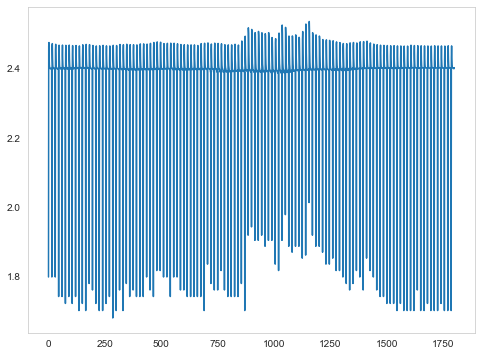

In [861]:
import numpy as np
import matplotlib.pyplot as plt

data = yhat
newdata = np.squeeze(data) # Shape is now: (10, 80)
plt.plot(newdata) # plotting by columns
plt.show()

In [854]:
yhat = yhat.flatten() 
Y_traint = Y_traint.flatten()

datadt4 = datadt[0:120]
Y_traint4 = Y_traint[0:120]

In [851]:
yhat = yhat[120:241]

yhat.shape

(0,)

In [838]:
yhat.shape

(120, 15, 1, 1, 1)

In [780]:
X1.shape

(850, 15, 1, 1)

In [34]:
yhat = yhat.flatten() 
y = y.flatten() 
Y_train.shape

(1231,)

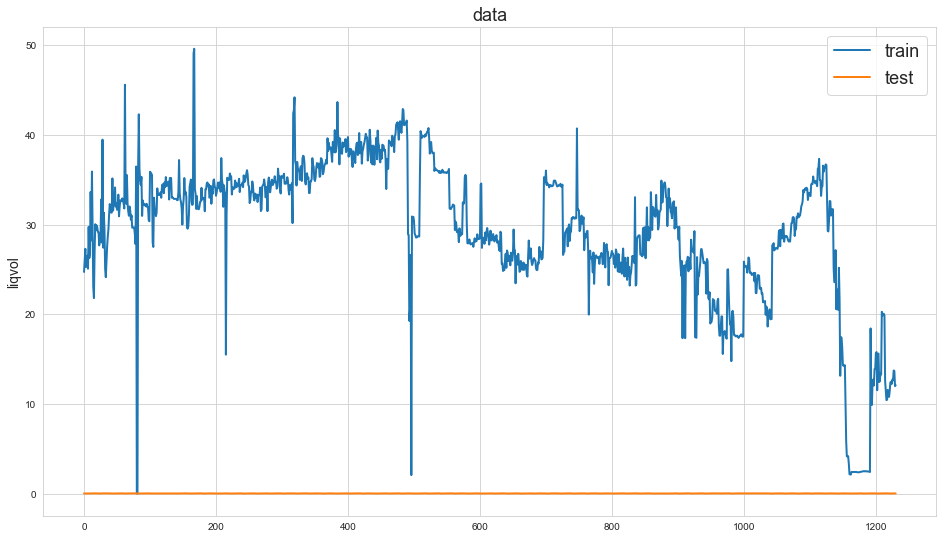

In [35]:
import matplotlib.pyplot as plt # Impot the relevant module
def line_plot(line2, line1, label1=None, label2=None, title='', lw=2):
    fig, ax = plt.subplots(1, figsize=(16, 9))
    ax.plot(line1, label=label1, linewidth=lw)
    ax.plot(line2, label=label2, linewidth=lw)
    
    ax.set_ylabel('liqvol', fontsize=14)
    ax.set_title(title, fontsize=18)
    ax.legend(loc='best', fontsize=18);
line_plot(yhat[0:1231], Y_train, 'train', 'test', title='data')

In [602]:
yhat = model.predict([X1, X2], verbose=0)

In [43]:
from matplotlib import pyplot as plt

In [44]:
#plt.plot(x_func, y_func0)

In [45]:
#plt.plot(X_left)

In [61]:
datadd = features.index 
datadd = datadd.to_numpy()
yhat.shape

(1212,)

In [49]:
print(y)

[29.91     29.689508 29.193825 ... 13.67436  11.9829   12.08897 ]


In [56]:
yhat = yhat.flatten() 
y = y.flatten() 

In [752]:
# multivariate mlp example
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate
 
# сэмлы
def split_sequences(sequences, n_steps):
	X, y = list(), list()
	for i in range(len(sequences)):
		# разметка
		end_ix = i + n_steps
		# проверка выхода за пределы
		if end_ix > len(sequences):
			break
		# получение начала и конечной метки
		seq_x, seq_y = sequences[i:end_ix, :-1], sequences[end_ix-1, -1]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
# последовательность
in_seq1 = X_left
in_seq2 = X_right

out_seq = Y_train #array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1), 6))
in_seq2 = in_seq2.reshape((len(in_seq2), 5))
out_seq = out_seq.reshape((len(out_seq), 1))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
n_steps = 15
# convert into input/output
X,y = split_sequences(dataset, n_steps)
#y = 
# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]
# первая модель
visible1 = Input(shape=(n_steps,))
dense1 = Dense(100, activation=tf.nn.tanh)(visible1)
# вторая модель
visible2 = Input(shape=(n_steps,))
dense2 = Dense(100, activation=tf.nn.tanh)(visible2)
# слияние
merge = concatenate([dense1, dense2])
output = Dense(1)(merge)
model = Model(inputs=[visible1, visible2], outputs=output)
model.compile(optimizer='adam', loss='mse', metrics=['accuracy'])
# fit model
model.fit([X1, X2], Y_train, epochs=20, verbose= 1, batch_size=64,shuffle = False, validation_split=0.1)
# demonstrate prediction
#x_input = array([[80, 85], [90, 95], [100, 105]])
#x1 = x_input[:, 0].reshape((1, n_steps))
#x2 = x_input[:, 1].reshape((1, n_steps))
yhat = model.predict([X1, X2], verbose=0)
print(yhat)

Epoch 1/20
18/18 [==============================] - 1s 11ms/step - loss: 1017.4635 - accuracy: 0.0042 - val_loss: 305.4648 - val_accuracy: 0.0000e+00
Epoch 2/20
18/18 [==============================] - 0s 3ms/step - loss: 787.7969 - accuracy: 0.0000e+00 - val_loss: 229.6817 - val_accuracy: 0.0000e+00
Epoch 3/20
18/18 [==============================] - 0s 3ms/step - loss: 663.1718 - accuracy: 0.0000e+00 - val_loss: 193.6180 - val_accuracy: 0.0000e+00
Epoch 4/20
18/18 [==============================] - 0s 3ms/step - loss: 550.3562 - accuracy: 0.0000e+00 - val_loss: 177.1606 - val_accuracy: 0.0000e+00
Epoch 5/20
18/18 [==============================] - 0s 3ms/step - loss: 461.4120 - accuracy: 0.0000e+00 - val_loss: 176.9425 - val_accuracy: 0.0000e+00
Epoch 6/20
18/18 [==============================] - 0s 3ms/step - loss: 396.6552 - accuracy: 0.0000e+00 - val_loss: 186.0653 - val_accuracy: 0.0000e+00
Epoch 7/20
18/18 [==============================] - 0s 3ms/step - loss: 335.5939 - accurac

In [753]:
X.shape

(1212, 20, 11)

In [ ]:
#from sklearn.metrics import mean_absolute_percentage_error

#mean_absolute_percentage_error(y, yhat)

In [303]:
yhat = yhat.flatten() 
Y = Y_train.flatten() 

In [304]:
datadd.shape

(1212,)

In [305]:
datadd = datadd[0:1212]
Y_train = Y_train[0:1212]

In [306]:
import pandas as pd

df = pd.DataFrame(data={'year': datadd, 
                        'predict': yhat, 
                        'fact': Y_train})

<AxesSubplot:label='9aa39e34-ebb2-4f4e-b5ea-895c292c8b7a'>

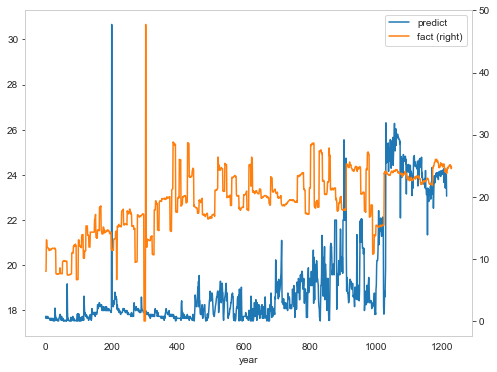

In [247]:
import matplotlib.pyplot as plt # Impot the relevant module

fig, ax = plt.subplots() # Create the figure and axes object

# Plot the first x and y axes:
df.plot(x = 'year', y = 'predict', ax = ax) 
# Plot the second x and y axes. By secondary_y = True a second y-axis is requested:
# (see https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.plot.html for details)
df.plot(x = 'year', y = 'fact', ax = ax, secondary_y = True)

In [310]:
Y_train = data['AKSH_298_liq_vol']
Y_train = np.asarray(Y_train) 


In [311]:
# multivariate mlp example
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate
 
# сэмлы
def split_sequences(sequences, n_steps):
	X, y = list(), list()
	for i in range(len(sequences)):
		# разметка
		end_ix = i + n_steps
		# проверка выхода за пределы
		if end_ix > len(sequences):
			break
		# получение начала и конечной метки
		seq_x, seq_y = sequences[i:end_ix, :-1], sequences[end_ix-1, -1]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
# последовательность
in_seq1 = X_left
in_seq2 = X_right
out_seq = Y_train # array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1), 6))
in_seq2 = in_seq2.reshape((len(in_seq2), 1))
out_seq = out_seq.reshape((len(out_seq), 1))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
n_steps = 10
# convert into input/output
X, y = split_sequences(dataset, n_steps)
# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]
# первая модель
visible1 = Input(shape=(n_steps,))
dense1 = Dense(100, activation='relu')(visible1)
# вторая модель LSTM
visible2 = Input(shape=(n_steps,1))
lstm = LSTM(100, input_shape =(100,1))(visible2)
# слияние
merge = concatenate([dense1, lstm])
output = Dense(1)(merge)
model = Model(inputs=[visible1, visible2], outputs=output)
model.compile(optimizer='adam', loss='mape')
# fit model
model.fit([X1, X2], Y_train, epochs=2000, verbose=0, batch_size=64, validation_split=0.1)
# demonstrate prediction
#x_input = array([[80, 85], [90, 95], [100, 105]])
#x1 = x_input[:, 0].reshape((1, n_steps))
#x2 = x_input[:, 1].reshape((1, n_steps))
yhat = model.predict([X1, X2], verbose=0)
print(yhat)

[[-5.3013833e-03]
 [-5.2290680e-03]
 [-5.1857652e-03]
 ...
 [ 4.3040527e+01]
 [ 3.6273193e+01]
 [ 3.3339657e+01]]


In [312]:
yhat = yhat.flatten() 
Y = Y_train.flatten() 

In [313]:
Y_train = Y_train[0:1212]
datadd = datadd[0:1212]
yhat = yhat[0:1212]

In [314]:
import pandas as pd

df = pd.DataFrame(data={'year': datadd, 
                        'predict': yhat, 
                        'fact': Y_train})

<AxesSubplot:label='3a95b5b6-ff90-42f1-8a5f-a623c5554453'>

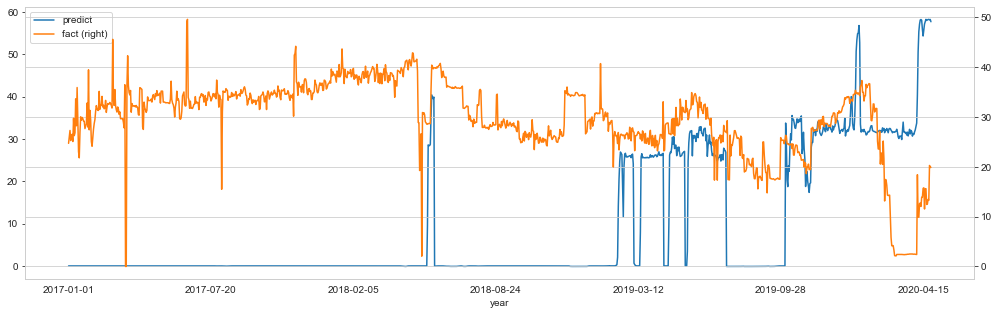

In [315]:
import matplotlib.pyplot as plt # Impot the relevant module

fig, ax = plt.subplots() # Create the figure and axes object

# Plot the first x and y axes:
df.plot(x = 'year', y = 'predict', ax = ax) 
# Plot the second x and y axes. By secondary_y = True a second y-axis is requested:
# (see https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.plot.html for details)
df.plot(x = 'year', y = 'fact', ax = ax, secondary_y = True)

In [341]:
# multivariate mlp example
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate
 
# сэмлы
def split_sequences(sequences, n_steps):
	X, y = list(), list()
	for i in range(len(sequences)):
		# разметка
		end_ix = i + n_steps
		# проверка выхода за пределы
		if end_ix > len(sequences):
			break
		# получение начала и конечной метки
		seq_x, seq_y = sequences[i:end_ix, :-1], sequences[end_ix-1, -1]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
# последовательность
in_seq1 = X_left
in_seq2 = X_right
out_seq = Y_train# array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1), 6))
in_seq2 = in_seq2.reshape((len(in_seq2), 1))
out_seq = out_seq.reshape((len(out_seq), 1))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
n_steps = 1
# convert into input/output
X, y = split_sequences(dataset, n_steps)
# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]
# первая модель
visible1 = Input(shape=(n_steps,))
dense1 = Dense(100, activation='relu')(visible1)
# вторая модель LSTM
visible2 = Input(shape=(n_steps,1))
lstm = LSTM(100, input_shape =(100,1))(visible2)
# слияние
merge = concatenate([dense1, lstm])
output = Dense(1)(merge)
model = Model(inputs=[visible1, visible2], outputs=output)
model.compile(optimizer='adam', loss='mape', metrics=['accuracy'])
# fit model

model.fit([X1, X2], y, epochs=2000, verbose=1, batch_size=64, validation_split=0.1)
# demonstrate prediction
#x_input = array([[80, 85], [90, 95], [100, 105]])
#x1 = x_input[:, 0].reshape((1, n_steps))
#x2 = x_input[:, 1].reshape((1, n_steps))
yhat = model.predict([X1, X2], verbose=0)
print(yhat)

Epoch 1/2000
18/18 [==============================] - 2s 29ms/step - loss: 1521940.2974 - accuracy: 0.0000e+00 - val_loss: 69.4262 - val_accuracy: 0.0000e+00
Epoch 2/2000
18/18 [==============================] - 0s 4ms/step - loss: 306138.2910 - accuracy: 0.0000e+00 - val_loss: 138.7251 - val_accuracy: 0.0000e+00
Epoch 3/2000
18/18 [==============================] - 0s 4ms/step - loss: 326061.6452 - accuracy: 7.6466e-04 - val_loss: 117.2571 - val_accuracy: 0.0000e+00
Epoch 4/2000
18/18 [==============================] - 0s 4ms/step - loss: 51318.1883 - accuracy: 9.3827e-04 - val_loss: 90.9463 - val_accuracy: 0.0000e+00
Epoch 5/2000
18/18 [==============================] - 0s 4ms/step - loss: 126235.8573 - accuracy: 0.0015 - val_loss: 110.4738 - val_accuracy: 0.0000e+00
Epoch 6/2000
18/18 [==============================] - 0s 4ms/step - loss: 426616.0956 - accuracy: 0.0019 - val_loss: 100.4735 - val_accuracy: 0.0000e+00
Epoch 7/2000
18/18 [==============================] - 0s 4ms/step -

18/18 [==============================] - 0s 4ms/step - loss: 11612.4500 - accuracy: 0.0017 - val_loss: 125.5430 - val_accuracy: 0.0000e+00
Epoch 108/2000
18/18 [==============================] - 0s 4ms/step - loss: 220208.1659 - accuracy: 0.0026 - val_loss: 121.3266 - val_accuracy: 0.0000e+00
Epoch 109/2000
18/18 [==============================] - 0s 4ms/step - loss: 34403.8339 - accuracy: 0.0016 - val_loss: 118.1088 - val_accuracy: 0.0000e+00
Epoch 110/2000
18/18 [==============================] - 0s 4ms/step - loss: 246288.7633 - accuracy: 0.0034 - val_loss: 142.0870 - val_accuracy: 0.0000e+00
Epoch 111/2000
18/18 [==============================] - 0s 4ms/step - loss: 19161.6122 - accuracy: 5.6655e-04 - val_loss: 139.9165 - val_accuracy: 0.0000e+00
Epoch 112/2000
18/18 [==============================] - 0s 4ms/step - loss: 51488.0803 - accuracy: 6.1685e-04 - val_loss: 120.2102 - val_accuracy: 0.0000e+00
Epoch 113/2000
18/18 [==============================] - 0s 4ms/step - loss: 9241.

Epoch 160/2000
18/18 [==============================] - 0s 4ms/step - loss: 158405.9369 - accuracy: 9.0564e-04 - val_loss: 192.4321 - val_accuracy: 0.0000e+00
Epoch 161/2000
18/18 [==============================] - 0s 4ms/step - loss: 91963.7929 - accuracy: 6.5844e-04 - val_loss: 179.8674 - val_accuracy: 0.0000e+00
Epoch 162/2000
18/18 [==============================] - 0s 4ms/step - loss: 48944.0413 - accuracy: 0.0012 - val_loss: 173.4267 - val_accuracy: 0.0000e+00
Epoch 163/2000
18/18 [==============================] - 0s 4ms/step - loss: 83340.9179 - accuracy: 0.0010 - val_loss: 168.8584 - val_accuracy: 0.0000e+00
Epoch 164/2000
18/18 [==============================] - 0s 4ms/step - loss: 117810.8259 - accuracy: 0.0043 - val_loss: 203.8285 - val_accuracy: 0.0000e+00
Epoch 165/2000
18/18 [==============================] - 0s 4ms/step - loss: 185551.9900 - accuracy: 0.0016 - val_loss: 203.3814 - val_accuracy: 0.0000e+00
Epoch 166/2000
18/18 [==============================] - 0s 4ms/st

Epoch 213/2000
18/18 [==============================] - 0s 4ms/step - loss: 79521.6247 - accuracy: 0.0012 - val_loss: 311.3763 - val_accuracy: 0.0000e+00
Epoch 214/2000
18/18 [==============================] - 0s 4ms/step - loss: 17245.1738 - accuracy: 0.0015 - val_loss: 310.2108 - val_accuracy: 0.0000e+00
Epoch 215/2000
18/18 [==============================] - 0s 4ms/step - loss: 55858.1354 - accuracy: 0.0031 - val_loss: 301.1682 - val_accuracy: 0.0000e+00
Epoch 216/2000
18/18 [==============================] - 0s 4ms/step - loss: 26487.1133 - accuracy: 0.0020 - val_loss: 311.9144 - val_accuracy: 0.0000e+00
Epoch 217/2000
18/18 [==============================] - 0s 4ms/step - loss: 14176.7389 - accuracy: 3.9315e-04 - val_loss: 318.6599 - val_accuracy: 0.0000e+00
Epoch 218/2000
18/18 [==============================] - 0s 4ms/step - loss: 36885.5359 - accuracy: 9.3827e-04 - val_loss: 327.3850 - val_accuracy: 0.0000e+00
Epoch 219/2000
18/18 [==============================] - 0s 4ms/step 

Epoch 266/2000
18/18 [==============================] - 0s 4ms/step - loss: 26705.1040 - accuracy: 0.0012 - val_loss: 392.1812 - val_accuracy: 0.0000e+00
Epoch 267/2000
18/18 [==============================] - 0s 4ms/step - loss: 25596.5608 - accuracy: 0.0013 - val_loss: 377.2251 - val_accuracy: 0.0000e+00
Epoch 268/2000
18/18 [==============================] - 0s 4ms/step - loss: 44644.4887 - accuracy: 6.8990e-04 - val_loss: 386.8719 - val_accuracy: 0.0000e+00
Epoch 269/2000
18/18 [==============================] - 0s 4ms/step - loss: 10591.6261 - accuracy: 0.0013 - val_loss: 374.0028 - val_accuracy: 0.0000e+00
Epoch 270/2000
18/18 [==============================] - 0s 4ms/step - loss: 90253.6115 - accuracy: 0.0017 - val_loss: 374.6617 - val_accuracy: 0.0000e+00
Epoch 271/2000
18/18 [==============================] - 0s 4ms/step - loss: 17337.8864 - accuracy: 0.0013 - val_loss: 368.0521 - val_accuracy: 0.0000e+00
Epoch 272/2000
18/18 [==============================] - 0s 4ms/step - lo

Epoch 319/2000
18/18 [==============================] - 0s 4ms/step - loss: 11804.9825 - accuracy: 9.8625e-04 - val_loss: 393.8596 - val_accuracy: 0.0000e+00
Epoch 320/2000
18/18 [==============================] - 0s 4ms/step - loss: 7817.1622 - accuracy: 0.0012 - val_loss: 380.9242 - val_accuracy: 0.0000e+00
Epoch 321/2000
18/18 [==============================] - 0s 4ms/step - loss: 54141.9592 - accuracy: 0.0016 - val_loss: 378.4332 - val_accuracy: 0.0000e+00
Epoch 322/2000
18/18 [==============================] - 0s 4ms/step - loss: 11072.0933 - accuracy: 0.0012 - val_loss: 371.3034 - val_accuracy: 0.0000e+00
Epoch 323/2000
18/18 [==============================] - 0s 4ms/step - loss: 7821.2738 - accuracy: 5.0329e-04 - val_loss: 379.8974 - val_accuracy: 0.0000e+00
Epoch 324/2000
18/18 [==============================] - 0s 4ms/step - loss: 77094.4104 - accuracy: 0.0034 - val_loss: 413.7743 - val_accuracy: 0.0000e+00
Epoch 325/2000
18/18 [==============================] - 0s 4ms/step - 

Epoch 372/2000
18/18 [==============================] - 0s 4ms/step - loss: 102742.4688 - accuracy: 0.0036 - val_loss: 390.2836 - val_accuracy: 0.0000e+00
Epoch 373/2000
18/18 [==============================] - 0s 4ms/step - loss: 27892.8580 - accuracy: 0.0024 - val_loss: 366.0541 - val_accuracy: 0.0000e+00
Epoch 374/2000
18/18 [==============================] - 0s 4ms/step - loss: 81280.7277 - accuracy: 0.0033 - val_loss: 357.5144 - val_accuracy: 0.0000e+00
Epoch 375/2000
18/18 [==============================] - 0s 4ms/step - loss: 2730.9888 - accuracy: 4.9937e-04 - val_loss: 358.3837 - val_accuracy: 0.0000e+00
Epoch 376/2000
18/18 [==============================] - 0s 4ms/step - loss: 55768.9904 - accuracy: 9.3827e-04 - val_loss: 378.4162 - val_accuracy: 0.0000e+00
Epoch 377/2000
18/18 [==============================] - 0s 4ms/step - loss: 15313.8793 - accuracy: 0.0016 - val_loss: 398.3376 - val_accuracy: 0.0000e+00
Epoch 378/2000
18/18 [==============================] - 0s 4ms/step 

Epoch 425/2000
18/18 [==============================] - 0s 4ms/step - loss: 1000.2723 - accuracy: 2.8995e-04 - val_loss: 375.4024 - val_accuracy: 0.0000e+00
Epoch 426/2000
18/18 [==============================] - 0s 4ms/step - loss: 43880.3217 - accuracy: 4.4455e-04 - val_loss: 368.8808 - val_accuracy: 0.0000e+00
Epoch 427/2000
18/18 [==============================] - 0s 4ms/step - loss: 45829.3660 - accuracy: 9.8625e-04 - val_loss: 392.6441 - val_accuracy: 0.0000e+00
Epoch 428/2000
18/18 [==============================] - 0s 4ms/step - loss: 46731.5928 - accuracy: 0.0013 - val_loss: 403.7538 - val_accuracy: 0.0000e+00
Epoch 429/2000
18/18 [==============================] - 0s 4ms/step - loss: 17773.0624 - accuracy: 0.0035 - val_loss: 381.1722 - val_accuracy: 0.0000e+00
Epoch 430/2000
18/18 [==============================] - 0s 4ms/step - loss: 41693.9981 - accuracy: 0.0020 - val_loss: 374.7821 - val_accuracy: 0.0000e+00
Epoch 431/2000
18/18 [==============================] - 0s 4ms/st

Epoch 478/2000
18/18 [==============================] - 0s 4ms/step - loss: 15377.8103 - accuracy: 5.5811e-04 - val_loss: 390.2020 - val_accuracy: 0.0000e+00
Epoch 479/2000
18/18 [==============================] - 0s 4ms/step - loss: 29073.8808 - accuracy: 9.3827e-04 - val_loss: 374.4814 - val_accuracy: 0.0000e+00
Epoch 480/2000
18/18 [==============================] - 0s 4ms/step - loss: 9086.2779 - accuracy: 0.0026 - val_loss: 369.8855 - val_accuracy: 0.0000e+00
Epoch 481/2000
18/18 [==============================] - 0s 4ms/step - loss: 17757.1137 - accuracy: 6.3508e-04 - val_loss: 381.4367 - val_accuracy: 0.0000e+00
Epoch 482/2000
18/18 [==============================] - 0s 4ms/step - loss: 10202.2047 - accuracy: 0.0033 - val_loss: 378.1877 - val_accuracy: 0.0000e+00
Epoch 483/2000
18/18 [==============================] - 0s 4ms/step - loss: 39341.1573 - accuracy: 0.0030 - val_loss: 389.3764 - val_accuracy: 0.0000e+00
Epoch 484/2000
18/18 [==============================] - 0s 4ms/st

Epoch 531/2000
18/18 [==============================] - 0s 4ms/step - loss: 96587.0011 - accuracy: 0.0031 - val_loss: 407.1898 - val_accuracy: 0.0000e+00
Epoch 532/2000
18/18 [==============================] - 0s 4ms/step - loss: 25048.0574 - accuracy: 0.0013 - val_loss: 415.4585 - val_accuracy: 0.0000e+00
Epoch 533/2000
18/18 [==============================] - 0s 4ms/step - loss: 44181.4431 - accuracy: 9.8625e-04 - val_loss: 409.5813 - val_accuracy: 0.0000e+00
Epoch 534/2000
18/18 [==============================] - 0s 4ms/step - loss: 17701.3461 - accuracy: 0.0017 - val_loss: 422.3317 - val_accuracy: 0.0000e+00
Epoch 535/2000
18/18 [==============================] - 0s 4ms/step - loss: 43865.7701 - accuracy: 0.0014 - val_loss: 411.3828 - val_accuracy: 0.0000e+00
Epoch 536/2000
18/18 [==============================] - 0s 4ms/step - loss: 28867.6468 - accuracy: 0.0018 - val_loss: 412.7421 - val_accuracy: 0.0000e+00
Epoch 537/2000
18/18 [==============================] - 0s 4ms/step - lo

Epoch 584/2000
18/18 [==============================] - 0s 4ms/step - loss: 36499.2938 - accuracy: 0.0032 - val_loss: 394.6481 - val_accuracy: 0.0000e+00
Epoch 585/2000
18/18 [==============================] - 0s 4ms/step - loss: 26532.7750 - accuracy: 0.0014 - val_loss: 382.7163 - val_accuracy: 0.0000e+00
Epoch 586/2000
18/18 [==============================] - 0s 4ms/step - loss: 12150.6912 - accuracy: 0.0016 - val_loss: 400.8282 - val_accuracy: 0.0000e+00
Epoch 587/2000
18/18 [==============================] - 0s 4ms/step - loss: 25653.6234 - accuracy: 0.0025 - val_loss: 379.5455 - val_accuracy: 0.0000e+00
Epoch 588/2000
18/18 [==============================] - 0s 4ms/step - loss: 15316.1687 - accuracy: 0.0014 - val_loss: 398.8025 - val_accuracy: 0.0000e+00
Epoch 589/2000
18/18 [==============================] - 0s 4ms/step - loss: 16976.9918 - accuracy: 0.0013 - val_loss: 364.3711 - val_accuracy: 0.0000e+00
Epoch 590/2000
18/18 [==============================] - 0s 4ms/step - loss: 

18/18 [==============================] - 0s 4ms/step - loss: 59193.4679 - accuracy: 0.0022 - val_loss: 397.0195 - val_accuracy: 0.0000e+00
Epoch 638/2000
18/18 [==============================] - 0s 4ms/step - loss: 29830.3672 - accuracy: 0.0031 - val_loss: 425.8636 - val_accuracy: 0.0000e+00
Epoch 639/2000
18/18 [==============================] - 0s 4ms/step - loss: 8833.5634 - accuracy: 0.0018 - val_loss: 461.0521 - val_accuracy: 0.0000e+00
Epoch 640/2000
18/18 [==============================] - 0s 4ms/step - loss: 20471.6939 - accuracy: 0.0015 - val_loss: 412.0923 - val_accuracy: 0.0000e+00
Epoch 641/2000
18/18 [==============================] - 0s 4ms/step - loss: 17968.9040 - accuracy: 0.0020 - val_loss: 419.3986 - val_accuracy: 0.0000e+00
Epoch 642/2000
18/18 [==============================] - 0s 4ms/step - loss: 14215.8216 - accuracy: 0.0024 - val_loss: 395.0045 - val_accuracy: 0.0000e+00
Epoch 643/2000
18/18 [==============================] - 0s 4ms/step - loss: 14072.3061 - acc

Epoch 690/2000
18/18 [==============================] - 0s 4ms/step - loss: 77800.1550 - accuracy: 0.0023 - val_loss: 373.2178 - val_accuracy: 0.0000e+00
Epoch 691/2000
18/18 [==============================] - 0s 4ms/step - loss: 24139.7277 - accuracy: 9.9701e-04 - val_loss: 357.4346 - val_accuracy: 0.0000e+00
Epoch 692/2000
18/18 [==============================] - 0s 4ms/step - loss: 48106.1972 - accuracy: 0.0023 - val_loss: 357.8764 - val_accuracy: 0.0000e+00
Epoch 693/2000
18/18 [==============================] - 0s 4ms/step - loss: 49565.4230 - accuracy: 0.0023 - val_loss: 361.5941 - val_accuracy: 0.0000e+00
Epoch 694/2000
18/18 [==============================] - 0s 4ms/step - loss: 62142.2066 - accuracy: 0.0019 - val_loss: 363.4698 - val_accuracy: 0.0000e+00
Epoch 695/2000
18/18 [==============================] - 0s 4ms/step - loss: 13426.5408 - accuracy: 5.1515e-04 - val_loss: 396.7594 - val_accuracy: 0.0000e+00
Epoch 696/2000
18/18 [==============================] - 0s 4ms/step 

Epoch 743/2000
18/18 [==============================] - 0s 4ms/step - loss: 81128.2307 - accuracy: 0.0017 - val_loss: 369.4427 - val_accuracy: 0.0000e+00
Epoch 744/2000
18/18 [==============================] - 0s 4ms/step - loss: 21760.9291 - accuracy: 6.5844e-04 - val_loss: 376.4749 - val_accuracy: 0.0000e+00
Epoch 745/2000
18/18 [==============================] - 0s 4ms/step - loss: 19826.4467 - accuracy: 7.9208e-04 - val_loss: 406.4135 - val_accuracy: 0.0000e+00
Epoch 746/2000
18/18 [==============================] - 0s 4ms/step - loss: 15585.7484 - accuracy: 0.0021 - val_loss: 405.7464 - val_accuracy: 0.0000e+00
Epoch 747/2000
18/18 [==============================] - 0s 4ms/step - loss: 34685.3736 - accuracy: 8.8666e-04 - val_loss: 396.1348 - val_accuracy: 0.0000e+00
Epoch 748/2000
18/18 [==============================] - 0s 4ms/step - loss: 12578.2592 - accuracy: 0.0018 - val_loss: 387.7058 - val_accuracy: 0.0000e+00
Epoch 749/2000
18/18 [==============================] - 0s 4ms/s

Epoch 796/2000
18/18 [==============================] - 0s 4ms/step - loss: 28534.7058 - accuracy: 0.0020 - val_loss: 412.3919 - val_accuracy: 0.0000e+00
Epoch 797/2000
18/18 [==============================] - 0s 4ms/step - loss: 95499.0138 - accuracy: 0.0032 - val_loss: 429.4947 - val_accuracy: 0.0000e+00
Epoch 798/2000
18/18 [==============================] - 0s 4ms/step - loss: 18382.6700 - accuracy: 0.0014 - val_loss: 413.9431 - val_accuracy: 0.0000e+00
Epoch 799/2000
18/18 [==============================] - 0s 4ms/step - loss: 23909.2681 - accuracy: 0.0017 - val_loss: 406.8098 - val_accuracy: 0.0000e+00
Epoch 800/2000
18/18 [==============================] - 0s 4ms/step - loss: 49336.8521 - accuracy: 0.0021 - val_loss: 375.5411 - val_accuracy: 0.0000e+00
Epoch 801/2000
18/18 [==============================] - 0s 4ms/step - loss: 21401.8151 - accuracy: 8.8666e-04 - val_loss: 393.5929 - val_accuracy: 0.0000e+00
Epoch 802/2000
18/18 [==============================] - 0s 4ms/step - lo

Epoch 849/2000
18/18 [==============================] - 0s 4ms/step - loss: 17320.2148 - accuracy: 0.0034 - val_loss: 357.1023 - val_accuracy: 0.0000e+00
Epoch 850/2000
18/18 [==============================] - 0s 4ms/step - loss: 27222.3075 - accuracy: 0.0013 - val_loss: 369.9258 - val_accuracy: 0.0000e+00
Epoch 851/2000
18/18 [==============================] - 0s 4ms/step - loss: 59324.7445 - accuracy: 0.0029 - val_loss: 372.8837 - val_accuracy: 0.0000e+00
Epoch 852/2000
18/18 [==============================] - 0s 4ms/step - loss: 48311.3179 - accuracy: 0.0026 - val_loss: 390.2694 - val_accuracy: 0.0000e+00
Epoch 853/2000
18/18 [==============================] - 0s 4ms/step - loss: 52935.2824 - accuracy: 0.0016 - val_loss: 368.1568 - val_accuracy: 0.0000e+00
Epoch 854/2000
18/18 [==============================] - 0s 4ms/step - loss: 8418.3456 - accuracy: 0.0019 - val_loss: 364.7517 - val_accuracy: 0.0000e+00
Epoch 855/2000
18/18 [==============================] - 0s 4ms/step - loss: 1

Epoch 902/2000
18/18 [==============================] - 0s 4ms/step - loss: 26337.1429 - accuracy: 0.0014 - val_loss: 404.3922 - val_accuracy: 0.0000e+00
Epoch 903/2000
18/18 [==============================] - 0s 4ms/step - loss: 38475.7778 - accuracy: 0.0013 - val_loss: 385.2379 - val_accuracy: 0.0000e+00
Epoch 904/2000
18/18 [==============================] - 0s 4ms/step - loss: 65928.4094 - accuracy: 0.0016 - val_loss: 386.5810 - val_accuracy: 0.0000e+00
Epoch 905/2000
18/18 [==============================] - 0s 4ms/step - loss: 63104.0523 - accuracy: 0.0012 - val_loss: 367.2326 - val_accuracy: 0.0000e+00
Epoch 906/2000
18/18 [==============================] - 0s 4ms/step - loss: 3843.0822 - accuracy: 0.0019 - val_loss: 360.8279 - val_accuracy: 0.0000e+00
Epoch 907/2000
18/18 [==============================] - 0s 4ms/step - loss: 20764.6600 - accuracy: 0.0017 - val_loss: 354.1649 - val_accuracy: 0.0000e+00
Epoch 908/2000
18/18 [==============================] - 0s 4ms/step - loss: 6

Epoch 955/2000
18/18 [==============================] - 0s 4ms/step - loss: 27491.1678 - accuracy: 0.0012 - val_loss: 382.8491 - val_accuracy: 0.0000e+00
Epoch 956/2000
18/18 [==============================] - 0s 5ms/step - loss: 64315.1101 - accuracy: 0.0026 - val_loss: 400.2013 - val_accuracy: 0.0000e+00
Epoch 957/2000
18/18 [==============================] - 0s 4ms/step - loss: 20770.0774 - accuracy: 8.8647e-04 - val_loss: 396.3896 - val_accuracy: 0.0000e+00
Epoch 958/2000
18/18 [==============================] - 0s 4ms/step - loss: 134439.2456 - accuracy: 0.0021 - val_loss: 378.1257 - val_accuracy: 0.0000e+00
Epoch 959/2000
18/18 [==============================] - 0s 4ms/step - loss: 82284.1844 - accuracy: 0.0014 - val_loss: 392.5804 - val_accuracy: 0.0000e+00
Epoch 960/2000
18/18 [==============================] - 0s 4ms/step - loss: 14167.6933 - accuracy: 0.0026 - val_loss: 386.6803 - val_accuracy: 0.0000e+00
Epoch 961/2000
18/18 [==============================] - 0s 4ms/step - l

Epoch 1008/2000
18/18 [==============================] - 0s 4ms/step - loss: 6971.3434 - accuracy: 9.8625e-04 - val_loss: 386.4908 - val_accuracy: 0.0000e+00
Epoch 1009/2000
18/18 [==============================] - 0s 4ms/step - loss: 108212.7192 - accuracy: 0.0043 - val_loss: 393.2186 - val_accuracy: 0.0000e+00
Epoch 1010/2000
18/18 [==============================] - 0s 4ms/step - loss: 65288.3151 - accuracy: 0.0012 - val_loss: 419.6524 - val_accuracy: 0.0000e+00
Epoch 1011/2000
18/18 [==============================] - 0s 4ms/step - loss: 41672.1055 - accuracy: 0.0022 - val_loss: 399.4523 - val_accuracy: 0.0000e+00
Epoch 1012/2000
18/18 [==============================] - 0s 4ms/step - loss: 6647.7974 - accuracy: 3.4477e-04 - val_loss: 372.1405 - val_accuracy: 0.0000e+00
Epoch 1013/2000
18/18 [==============================] - 0s 4ms/step - loss: 108583.6932 - accuracy: 0.0038 - val_loss: 377.5865 - val_accuracy: 0.0000e+00
Epoch 1014/2000
18/18 [==============================] - 0s 4m

Epoch 1061/2000
18/18 [==============================] - 0s 4ms/step - loss: 26047.6624 - accuracy: 0.0017 - val_loss: 377.4828 - val_accuracy: 0.0000e+00
Epoch 1062/2000
18/18 [==============================] - 0s 4ms/step - loss: 34664.3437 - accuracy: 0.0021 - val_loss: 410.9305 - val_accuracy: 0.0000e+00
Epoch 1063/2000
18/18 [==============================] - 0s 4ms/step - loss: 13317.6275 - accuracy: 0.0021 - val_loss: 399.7480 - val_accuracy: 0.0000e+00
Epoch 1064/2000
18/18 [==============================] - 0s 4ms/step - loss: 19859.7003 - accuracy: 0.0031 - val_loss: 400.1415 - val_accuracy: 0.0000e+00
Epoch 1065/2000
18/18 [==============================] - 0s 4ms/step - loss: 3972.1889 - accuracy: 4.5189e-04 - val_loss: 400.4400 - val_accuracy: 0.0000e+00
Epoch 1066/2000
18/18 [==============================] - 0s 4ms/step - loss: 40766.7575 - accuracy: 9.3485e-04 - val_loss: 387.8813 - val_accuracy: 0.0000e+00
Epoch 1067/2000
18/18 [==============================] - 0s 4ms

Epoch 1166/2000
18/18 [==============================] - 0s 4ms/step - loss: 15408.6573 - accuracy: 6.8990e-04 - val_loss: 387.0599 - val_accuracy: 0.0000e+00
Epoch 1167/2000
18/18 [==============================] - 0s 4ms/step - loss: 85153.6770 - accuracy: 0.0023 - val_loss: 385.0146 - val_accuracy: 0.0000e+00
Epoch 1168/2000
18/18 [==============================] - 0s 4ms/step - loss: 6977.5924 - accuracy: 8.3205e-04 - val_loss: 391.0080 - val_accuracy: 0.0000e+00
Epoch 1169/2000
18/18 [==============================] - 0s 4ms/step - loss: 13285.0931 - accuracy: 0.0016 - val_loss: 398.5168 - val_accuracy: 0.0000e+00
Epoch 1170/2000
18/18 [==============================] - 0s 4ms/step - loss: 26526.6324 - accuracy: 0.0011 - val_loss: 392.8469 - val_accuracy: 0.0000e+00
Epoch 1171/2000
18/18 [==============================] - 0s 4ms/step - loss: 52576.9648 - accuracy: 0.0014 - val_loss: 376.8161 - val_accuracy: 0.0000e+00
Epoch 1172/2000
18/18 [==============================] - 0s 4ms

Epoch 1271/2000
18/18 [==============================] - 0s 4ms/step - loss: 17964.2676 - accuracy: 0.0021 - val_loss: 385.1227 - val_accuracy: 0.0000e+00
Epoch 1272/2000
18/18 [==============================] - 0s 4ms/step - loss: 17210.2475 - accuracy: 0.0016 - val_loss: 393.5414 - val_accuracy: 0.0000e+00
Epoch 1273/2000
18/18 [==============================] - 0s 4ms/step - loss: 27608.0090 - accuracy: 0.0050 - val_loss: 377.3035 - val_accuracy: 0.0000e+00
Epoch 1274/2000
18/18 [==============================] - 0s 4ms/step - loss: 170613.0262 - accuracy: 0.0023 - val_loss: 355.4525 - val_accuracy: 0.0000e+00
Epoch 1275/2000
18/18 [==============================] - 0s 4ms/step - loss: 59804.5892 - accuracy: 0.0026 - val_loss: 376.0209 - val_accuracy: 0.0000e+00
Epoch 1276/2000
18/18 [==============================] - 0s 4ms/step - loss: 14375.0807 - accuracy: 0.0020 - val_loss: 398.0201 - val_accuracy: 0.0000e+00
Epoch 1277/2000
18/18 [==============================] - 0s 4ms/step 

18/18 [==============================] - 0s 4ms/step - loss: 24626.4007 - accuracy: 2.3855e-04 - val_loss: 370.6606 - val_accuracy: 0.0000e+00
Epoch 1376/2000
18/18 [==============================] - 0s 4ms/step - loss: 5161.7823 - accuracy: 6.2137e-04 - val_loss: 364.2778 - val_accuracy: 0.0000e+00
Epoch 1377/2000
18/18 [==============================] - 0s 4ms/step - loss: 23336.5422 - accuracy: 0.0030 - val_loss: 358.9857 - val_accuracy: 0.0000e+00
Epoch 1378/2000
18/18 [==============================] - 0s 4ms/step - loss: 70202.2838 - accuracy: 0.0023 - val_loss: 365.1584 - val_accuracy: 0.0000e+00
Epoch 1379/2000
18/18 [==============================] - 0s 4ms/step - loss: 36233.0550 - accuracy: 0.0022 - val_loss: 359.2444 - val_accuracy: 0.0000e+00
Epoch 1380/2000
18/18 [==============================] - 0s 4ms/step - loss: 42869.2834 - accuracy: 0.0014 - val_loss: 356.2079 - val_accuracy: 0.0000e+00
Epoch 1381/2000
18/18 [==============================] - 0s 4ms/step - loss: 14

18/18 [==============================] - 0s 4ms/step - loss: 28190.7344 - accuracy: 6.2137e-04 - val_loss: 379.0669 - val_accuracy: 0.0000e+00
Epoch 1480/2000
18/18 [==============================] - 0s 4ms/step - loss: 68562.7930 - accuracy: 0.0037 - val_loss: 373.2701 - val_accuracy: 0.0000e+00
Epoch 1481/2000
18/18 [==============================] - 0s 5ms/step - loss: 36669.9769 - accuracy: 0.0012 - val_loss: 361.1314 - val_accuracy: 0.0000e+00
Epoch 1482/2000
18/18 [==============================] - 0s 5ms/step - loss: 19839.4895 - accuracy: 5.6655e-04 - val_loss: 356.6370 - val_accuracy: 0.0000e+00
Epoch 1483/2000
18/18 [==============================] - 0s 5ms/step - loss: 9688.1093 - accuracy: 8.4690e-04 - val_loss: 360.7220 - val_accuracy: 0.0000e+00
Epoch 1484/2000
18/18 [==============================] - 0s 5ms/step - loss: 48512.1684 - accuracy: 0.0027 - val_loss: 378.1712 - val_accuracy: 0.0000e+00
Epoch 1485/2000
18/18 [==============================] - 0s 4ms/step - loss

Epoch 1584/2000
18/18 [==============================] - 0s 4ms/step - loss: 13589.1960 - accuracy: 0.0014 - val_loss: 383.8820 - val_accuracy: 0.0000e+00
Epoch 1585/2000
18/18 [==============================] - 0s 4ms/step - loss: 5650.0365 - accuracy: 0.0011 - val_loss: 375.8744 - val_accuracy: 0.0000e+00
Epoch 1586/2000
18/18 [==============================] - 0s 4ms/step - loss: 5095.6507 - accuracy: 6.3508e-04 - val_loss: 370.0687 - val_accuracy: 0.0000e+00
Epoch 1587/2000
18/18 [==============================] - 0s 4ms/step - loss: 14300.0800 - accuracy: 0.0017 - val_loss: 388.2720 - val_accuracy: 0.0000e+00
Epoch 1588/2000
18/18 [==============================] - 0s 4ms/step - loss: 11974.9011 - accuracy: 0.0011 - val_loss: 386.8696 - val_accuracy: 0.0000e+00
Epoch 1589/2000
18/18 [==============================] - 0s 4ms/step - loss: 108617.4471 - accuracy: 0.0025 - val_loss: 396.6467 - val_accuracy: 0.0000e+00
Epoch 1590/2000
18/18 [==============================] - 0s 4ms/ste

Epoch 1689/2000
18/18 [==============================] - 0s 4ms/step - loss: 50381.8196 - accuracy: 0.0015 - val_loss: 387.4760 - val_accuracy: 0.0000e+00
Epoch 1690/2000
18/18 [==============================] - 0s 4ms/step - loss: 25418.9559 - accuracy: 0.0019 - val_loss: 380.2927 - val_accuracy: 0.0000e+00
Epoch 1691/2000
18/18 [==============================] - 0s 4ms/step - loss: 114137.6836 - accuracy: 0.0041 - val_loss: 366.3333 - val_accuracy: 0.0000e+00
Epoch 1692/2000
18/18 [==============================] - 0s 4ms/step - loss: 28958.5520 - accuracy: 0.0015 - val_loss: 377.4522 - val_accuracy: 0.0000e+00
Epoch 1693/2000
18/18 [==============================] - 0s 4ms/step - loss: 37204.0818 - accuracy: 0.0013 - val_loss: 380.6062 - val_accuracy: 0.0000e+00
Epoch 1694/2000
18/18 [==============================] - 0s 4ms/step - loss: 8054.1602 - accuracy: 0.0026 - val_loss: 379.2646 - val_accuracy: 0.0000e+00
Epoch 1695/2000
18/18 [==============================] - 0s 4ms/step -

18/18 [==============================] - 0s 4ms/step - loss: 31751.4432 - accuracy: 0.0028 - val_loss: 393.4817 - val_accuracy: 0.0000e+00
Epoch 1794/2000
18/18 [==============================] - 0s 4ms/step - loss: 59674.5776 - accuracy: 0.0017 - val_loss: 378.4017 - val_accuracy: 0.0000e+00
Epoch 1795/2000
18/18 [==============================] - 0s 4ms/step - loss: 38016.2520 - accuracy: 0.0013 - val_loss: 365.7826 - val_accuracy: 0.0000e+00
Epoch 1796/2000
18/18 [==============================] - 0s 4ms/step - loss: 23181.9912 - accuracy: 9.8625e-04 - val_loss: 381.0099 - val_accuracy: 0.0000e+00
Epoch 1797/2000
18/18 [==============================] - 0s 4ms/step - loss: 43880.8972 - accuracy: 0.0018 - val_loss: 369.8916 - val_accuracy: 0.0000e+00
Epoch 1798/2000
18/18 [==============================] - 0s 4ms/step - loss: 49043.4889 - accuracy: 0.0024 - val_loss: 365.7387 - val_accuracy: 0.0000e+00
Epoch 1799/2000
18/18 [==============================] - 0s 4ms/step - loss: 43611

Epoch 1898/2000
18/18 [==============================] - 0s 4ms/step - loss: 19634.7749 - accuracy: 0.0015 - val_loss: 368.1238 - val_accuracy: 0.0000e+00
Epoch 1899/2000
18/18 [==============================] - 0s 4ms/step - loss: 46824.7122 - accuracy: 0.0018 - val_loss: 373.5842 - val_accuracy: 0.0000e+00
Epoch 1900/2000
18/18 [==============================] - 0s 4ms/step - loss: 28346.1574 - accuracy: 0.0022 - val_loss: 382.6341 - val_accuracy: 0.0000e+00
Epoch 1901/2000
18/18 [==============================] - 0s 4ms/step - loss: 42650.4229 - accuracy: 3.8972e-04 - val_loss: 390.2625 - val_accuracy: 0.0000e+00
Epoch 1902/2000
18/18 [==============================] - 0s 4ms/step - loss: 113248.0016 - accuracy: 0.0016 - val_loss: 374.3668 - val_accuracy: 0.0000e+00
Epoch 1903/2000
18/18 [==============================] - 0s 4ms/step - loss: 11282.5456 - accuracy: 0.0013 - val_loss: 374.9881 - val_accuracy: 0.0000e+00
Epoch 1904/2000
18/18 [==============================] - 0s 4ms/s

In [343]:
from keras.models import Sequential
from keras.layers import Dense
from sklearn.model_selection import StratifiedKFold
import numpy

In [344]:
cvscores = []

In [345]:
scores = model.evaluate([X1, X2], y, verbose=0)
print("%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))
cvscores.append(scores[1] * 100)
print("%.2f%% (+/- %.2f%%)" % (numpy.mean(cvscores), numpy.std(cvscores)))

accuracy: 0.16%
0.16% (+/- 0.00%)


In [346]:
yhat = model.predict([X1, X2], verbose=0)
print(yhat)

[[ 0.08150852]
 [ 0.08150486]
 [ 0.08150155]
 ...
 [29.409681  ]
 [29.43559   ]
 [29.564613  ]]


In [353]:
# multivariate mlp example
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate
 
# сэмлы
def split_sequences(sequences, n_steps):
	X, y = list(), list()
	for i in range(len(sequences)):
		# разметка
		end_ix = i + n_steps
		# проверка выхода за пределы
		if end_ix > len(sequences):
			break
		# получение начала и конечной метки
		seq_x, seq_y = sequences[i:end_ix, :-1], sequences[end_ix-1, -1]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
# последовательность
in_seq1 = X_left
in_seq2 = X_right
out_seq = array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1), 6))
in_seq2 = in_seq2.reshape((len(in_seq2), 1))
out_seq = out_seq.reshape((len(out_seq), 6))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
n_steps = 1
# convert into input/output
X, y = split_sequences(dataset, n_steps)
# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]
# первая модель
visible1 = Input(shape=(n_steps,))
dense1 = Dense(100, activation='relu')(visible1)
# вторая модель LSTM
visible2 = Input(shape=(n_steps,1))
lstm = LSTM(100, input_shape =(100,1))(visible2)
# слияние
#merge1 = concatenate([dense1, lstm])
merge = Multiply()([dense1, lstm])
output = Dense(1)(merge)
model = Model(inputs=[visible1, visible2], outputs=output)
model.compile(optimizer='adam', loss='mse')
# fit model
model.fit([X1, X2], y, epochs=2000, verbose=1,validation_split=0.15)
# demonstrate prediction
#x_input = array([[80, 85], [90, 95], [100, 105]])
#x1 = x_input[:, 0].reshape((1, n_steps))
#x2 = x_input[:, 1].reshape((1, n_steps))
yhat1 = model.predict([X1, X2], verbose=0)
print(yhat1)

Epoch 1/2000
33/33 [==============================] - 2s 15ms/step - loss: 44445.1253 - val_loss: 40132.2344
Epoch 2/2000
33/33 [==============================] - 0s 3ms/step - loss: 42867.3744 - val_loss: 30701.8730
Epoch 3/2000
33/33 [==============================] - 0s 3ms/step - loss: 42350.2733 - val_loss: 25774.5586
Epoch 4/2000
33/33 [==============================] - 0s 3ms/step - loss: 42127.9257 - val_loss: 26721.6484
Epoch 5/2000
33/33 [==============================] - 0s 3ms/step - loss: 42599.2649 - val_loss: 26380.3945
Epoch 6/2000
33/33 [==============================] - 0s 3ms/step - loss: 43001.2338 - val_loss: 25930.6113
Epoch 7/2000
33/33 [==============================] - 0s 3ms/step - loss: 42013.0639 - val_loss: 26394.2871
Epoch 8/2000
33/33 [==============================] - 0s 3ms/step - loss: 41108.6077 - val_loss: 25303.8965
Epoch 9/2000
33/33 [==============================] - 0s 3ms/step - loss: 41401.7985 - val_loss: 26903.3359
Epoch 10/2000
33/33 [======

33/33 [==============================] - 0s 3ms/step - loss: 1193.2835 - val_loss: 3936.5659
Epoch 153/2000
33/33 [==============================] - 0s 3ms/step - loss: 1340.5480 - val_loss: 3894.7825
Epoch 154/2000
33/33 [==============================] - 0s 3ms/step - loss: 1185.9961 - val_loss: 3479.7175
Epoch 155/2000
33/33 [==============================] - 0s 3ms/step - loss: 1198.1642 - val_loss: 5123.9512
Epoch 156/2000
33/33 [==============================] - 0s 3ms/step - loss: 1197.5250 - val_loss: 4277.1318
Epoch 157/2000
33/33 [==============================] - 0s 3ms/step - loss: 1293.8074 - val_loss: 5508.0625
Epoch 158/2000
33/33 [==============================] - 0s 3ms/step - loss: 1054.9276 - val_loss: 5089.3789
Epoch 159/2000
33/33 [==============================] - 0s 3ms/step - loss: 1109.1937 - val_loss: 3676.4058
Epoch 160/2000
33/33 [==============================] - 0s 3ms/step - loss: 1176.6080 - val_loss: 4488.1040
Epoch 161/2000
33/33 [=====================

33/33 [==============================] - 0s 2ms/step - loss: 1392.7389 - val_loss: 2818.2678
Epoch 229/2000
33/33 [==============================] - 0s 3ms/step - loss: 1508.6964 - val_loss: 3238.3625
Epoch 230/2000
33/33 [==============================] - 0s 3ms/step - loss: 1117.2101 - val_loss: 2355.8384
Epoch 231/2000
33/33 [==============================] - 0s 3ms/step - loss: 996.1100 - val_loss: 2358.3474
Epoch 232/2000
33/33 [==============================] - 0s 2ms/step - loss: 1251.8481 - val_loss: 2451.6504
Epoch 233/2000
33/33 [==============================] - 0s 2ms/step - loss: 1301.3829 - val_loss: 2141.8079
Epoch 234/2000
33/33 [==============================] - 0s 3ms/step - loss: 1102.1736 - val_loss: 2011.9143
Epoch 235/2000
33/33 [==============================] - 0s 3ms/step - loss: 1698.3615 - val_loss: 2715.5088
Epoch 236/2000
33/33 [==============================] - 0s 3ms/step - loss: 1244.6267 - val_loss: 2335.2571
Epoch 237/2000
33/33 [======================

33/33 [==============================] - 0s 3ms/step - loss: 1729.9902 - val_loss: 3227.4304
Epoch 305/2000
33/33 [==============================] - 0s 3ms/step - loss: 1174.0846 - val_loss: 2826.5879
Epoch 306/2000
33/33 [==============================] - 0s 2ms/step - loss: 1250.7912 - val_loss: 3246.2354
Epoch 307/2000
33/33 [==============================] - 0s 3ms/step - loss: 1031.7710 - val_loss: 2681.3984
Epoch 308/2000
33/33 [==============================] - 0s 3ms/step - loss: 1004.7466 - val_loss: 3427.1243
Epoch 309/2000
33/33 [==============================] - 0s 3ms/step - loss: 1080.0642 - val_loss: 4503.9883
Epoch 310/2000
33/33 [==============================] - 0s 3ms/step - loss: 1494.9058 - val_loss: 3818.7021
Epoch 311/2000
33/33 [==============================] - 0s 3ms/step - loss: 1133.4002 - val_loss: 2447.0786
Epoch 312/2000
33/33 [==============================] - 0s 3ms/step - loss: 1117.2224 - val_loss: 3257.4348
Epoch 313/2000
33/33 [=====================

Epoch 380/2000
33/33 [==============================] - 0s 3ms/step - loss: 1036.4141 - val_loss: 1415.4508
Epoch 381/2000
33/33 [==============================] - 0s 3ms/step - loss: 1086.6509 - val_loss: 1068.9878
Epoch 382/2000
33/33 [==============================] - 0s 3ms/step - loss: 1013.4933 - val_loss: 1597.6814
Epoch 383/2000
33/33 [==============================] - 0s 3ms/step - loss: 1332.7129 - val_loss: 1706.0920
Epoch 384/2000
33/33 [==============================] - 0s 3ms/step - loss: 1184.6687 - val_loss: 2040.4574
Epoch 385/2000
33/33 [==============================] - 0s 3ms/step - loss: 1390.2604 - val_loss: 1565.2844
Epoch 386/2000
33/33 [==============================] - 0s 3ms/step - loss: 1605.7701 - val_loss: 1433.8716
Epoch 387/2000
33/33 [==============================] - 0s 3ms/step - loss: 1200.5519 - val_loss: 1009.8484
Epoch 388/2000
33/33 [==============================] - 0s 3ms/step - loss: 1206.6957 - val_loss: 1287.8075
Epoch 389/2000
33/33 [======

Epoch 456/2000
33/33 [==============================] - 0s 3ms/step - loss: 1233.3771 - val_loss: 1528.9480
Epoch 457/2000
33/33 [==============================] - 0s 3ms/step - loss: 1039.9662 - val_loss: 1380.0687
Epoch 458/2000
33/33 [==============================] - 0s 3ms/step - loss: 918.6922 - val_loss: 1916.7517
Epoch 459/2000
33/33 [==============================] - 0s 3ms/step - loss: 1157.7545 - val_loss: 2158.7986
Epoch 460/2000
33/33 [==============================] - 0s 3ms/step - loss: 966.2718 - val_loss: 1781.1243
Epoch 461/2000
33/33 [==============================] - 0s 3ms/step - loss: 1012.4950 - val_loss: 2105.7573
Epoch 462/2000
33/33 [==============================] - 0s 3ms/step - loss: 1165.8345 - val_loss: 1619.2808
Epoch 463/2000
33/33 [==============================] - 0s 3ms/step - loss: 1193.7755 - val_loss: 1993.0344
Epoch 464/2000
33/33 [==============================] - 0s 3ms/step - loss: 1402.3815 - val_loss: 1204.6868
Epoch 465/2000
33/33 [========

Epoch 532/2000
33/33 [==============================] - 0s 2ms/step - loss: 1141.0245 - val_loss: 2018.4596
Epoch 533/2000
33/33 [==============================] - 0s 2ms/step - loss: 1105.6178 - val_loss: 1974.9579
Epoch 534/2000
33/33 [==============================] - 0s 2ms/step - loss: 1067.9403 - val_loss: 1929.5322
Epoch 535/2000
33/33 [==============================] - 0s 2ms/step - loss: 1031.1919 - val_loss: 2282.7815
Epoch 536/2000
33/33 [==============================] - 0s 2ms/step - loss: 1417.2583 - val_loss: 1710.0952
Epoch 537/2000
33/33 [==============================] - 0s 3ms/step - loss: 1267.0307 - val_loss: 2302.8843
Epoch 538/2000
33/33 [==============================] - 0s 3ms/step - loss: 1113.8908 - val_loss: 2110.9807
Epoch 539/2000
33/33 [==============================] - 0s 3ms/step - loss: 1133.2724 - val_loss: 1253.8751
Epoch 540/2000
33/33 [==============================] - 0s 2ms/step - loss: 1183.6814 - val_loss: 3428.2119
Epoch 541/2000
33/33 [======

Epoch 608/2000
33/33 [==============================] - 0s 3ms/step - loss: 1037.3291 - val_loss: 1410.4178
Epoch 609/2000
33/33 [==============================] - 0s 3ms/step - loss: 1231.2389 - val_loss: 1604.6169
Epoch 610/2000
33/33 [==============================] - 0s 2ms/step - loss: 1119.4340 - val_loss: 1592.0880
Epoch 611/2000
33/33 [==============================] - 0s 3ms/step - loss: 981.0474 - val_loss: 1306.0223
Epoch 612/2000
33/33 [==============================] - 0s 3ms/step - loss: 1019.0063 - val_loss: 1022.1780
Epoch 613/2000
33/33 [==============================] - 0s 3ms/step - loss: 1236.3014 - val_loss: 1353.5830
Epoch 614/2000
33/33 [==============================] - 0s 3ms/step - loss: 1023.4706 - val_loss: 2066.1516
Epoch 615/2000
33/33 [==============================] - 0s 2ms/step - loss: 1010.9751 - val_loss: 1546.1528
Epoch 616/2000
33/33 [==============================] - 0s 2ms/step - loss: 1073.8677 - val_loss: 1577.0336
Epoch 617/2000
33/33 [=======

Epoch 684/2000
33/33 [==============================] - 0s 2ms/step - loss: 1063.9283 - val_loss: 2832.8044
Epoch 685/2000
33/33 [==============================] - 0s 2ms/step - loss: 1016.6593 - val_loss: 2909.2683
Epoch 686/2000
33/33 [==============================] - 0s 2ms/step - loss: 1272.3426 - val_loss: 2332.9937
Epoch 687/2000
33/33 [==============================] - 0s 2ms/step - loss: 1195.1087 - val_loss: 2348.9417
Epoch 688/2000
33/33 [==============================] - 0s 2ms/step - loss: 1141.3852 - val_loss: 1450.6169
Epoch 689/2000
33/33 [==============================] - 0s 2ms/step - loss: 992.8757 - val_loss: 1914.2363
Epoch 690/2000
33/33 [==============================] - 0s 2ms/step - loss: 1159.1943 - val_loss: 2735.2490
Epoch 691/2000
33/33 [==============================] - 0s 2ms/step - loss: 1072.6971 - val_loss: 2703.4932
Epoch 692/2000
33/33 [==============================] - 0s 3ms/step - loss: 1280.0604 - val_loss: 1963.3998
Epoch 693/2000
33/33 [=======

Epoch 760/2000
33/33 [==============================] - 0s 2ms/step - loss: 1702.1964 - val_loss: 1992.4054
Epoch 761/2000
33/33 [==============================] - 0s 2ms/step - loss: 1140.2751 - val_loss: 2295.0562
Epoch 762/2000
33/33 [==============================] - 0s 2ms/step - loss: 1056.6306 - val_loss: 2286.0037
Epoch 763/2000
33/33 [==============================] - 0s 2ms/step - loss: 1070.6242 - val_loss: 2772.4065
Epoch 764/2000
33/33 [==============================] - 0s 3ms/step - loss: 1220.6280 - val_loss: 2027.2789
Epoch 765/2000
33/33 [==============================] - 0s 3ms/step - loss: 1380.2880 - val_loss: 2427.2126
Epoch 766/2000
33/33 [==============================] - 0s 3ms/step - loss: 1026.0607 - val_loss: 2519.6113
Epoch 767/2000
33/33 [==============================] - 0s 2ms/step - loss: 1030.1700 - val_loss: 1812.8451
Epoch 768/2000
33/33 [==============================] - 0s 2ms/step - loss: 1409.8165 - val_loss: 2299.1138
Epoch 769/2000
33/33 [======

Epoch 836/2000
33/33 [==============================] - 0s 3ms/step - loss: 1446.7424 - val_loss: 1609.8269
Epoch 837/2000
33/33 [==============================] - 0s 3ms/step - loss: 1104.6806 - val_loss: 2296.1807
Epoch 838/2000
33/33 [==============================] - 0s 3ms/step - loss: 953.8356 - val_loss: 1907.3929
Epoch 839/2000
33/33 [==============================] - 0s 3ms/step - loss: 1524.7398 - val_loss: 2128.3469
Epoch 840/2000
33/33 [==============================] - 0s 3ms/step - loss: 1214.7094 - val_loss: 1937.4493
Epoch 841/2000
33/33 [==============================] - 0s 3ms/step - loss: 1424.4217 - val_loss: 2136.0713
Epoch 842/2000
33/33 [==============================] - 0s 3ms/step - loss: 1003.5708 - val_loss: 1885.1350
Epoch 843/2000
33/33 [==============================] - 0s 3ms/step - loss: 1173.5211 - val_loss: 1883.2148
Epoch 844/2000
33/33 [==============================] - 0s 3ms/step - loss: 1228.7099 - val_loss: 2457.0737
Epoch 845/2000
33/33 [=======

Epoch 912/2000
33/33 [==============================] - 0s 3ms/step - loss: 1040.4391 - val_loss: 2105.3914
Epoch 913/2000
33/33 [==============================] - 0s 3ms/step - loss: 1001.9305 - val_loss: 1660.0588
Epoch 914/2000
33/33 [==============================] - 0s 3ms/step - loss: 1164.1113 - val_loss: 1665.7275
Epoch 915/2000
33/33 [==============================] - 0s 3ms/step - loss: 1409.3643 - val_loss: 2127.9612
Epoch 916/2000
33/33 [==============================] - 0s 3ms/step - loss: 1627.4135 - val_loss: 1370.5928
Epoch 917/2000
33/33 [==============================] - 0s 3ms/step - loss: 1685.3882 - val_loss: 1813.2333
Epoch 918/2000
33/33 [==============================] - 0s 3ms/step - loss: 1025.1781 - val_loss: 1015.5861
Epoch 919/2000
33/33 [==============================] - 0s 3ms/step - loss: 986.0470 - val_loss: 1419.0876
Epoch 920/2000
33/33 [==============================] - 0s 3ms/step - loss: 1112.4402 - val_loss: 1730.1721
Epoch 921/2000
33/33 [=======

Epoch 988/2000
33/33 [==============================] - 0s 3ms/step - loss: 1046.9074 - val_loss: 1900.4028
Epoch 989/2000
33/33 [==============================] - 0s 2ms/step - loss: 1453.3102 - val_loss: 1886.4971
Epoch 990/2000
33/33 [==============================] - 0s 3ms/step - loss: 1145.3197 - val_loss: 1821.8546
Epoch 991/2000
33/33 [==============================] - 0s 3ms/step - loss: 1236.2019 - val_loss: 1721.4164
Epoch 992/2000
33/33 [==============================] - 0s 2ms/step - loss: 986.7401 - val_loss: 1477.5040
Epoch 993/2000
33/33 [==============================] - 0s 3ms/step - loss: 1010.4914 - val_loss: 2167.7710
Epoch 994/2000
33/33 [==============================] - 0s 3ms/step - loss: 1135.8592 - val_loss: 3342.1541
Epoch 995/2000
33/33 [==============================] - 0s 3ms/step - loss: 978.1374 - val_loss: 2965.5649
Epoch 996/2000
33/33 [==============================] - 0s 2ms/step - loss: 1040.0609 - val_loss: 3756.7561
Epoch 997/2000
33/33 [========

33/33 [==============================] - 0s 3ms/step - loss: 1209.1838 - val_loss: 2823.2424
Epoch 1139/2000
33/33 [==============================] - 0s 3ms/step - loss: 1108.6944 - val_loss: 3029.2295
Epoch 1140/2000
33/33 [==============================] - 0s 2ms/step - loss: 1030.0555 - val_loss: 2724.0637
Epoch 1141/2000
33/33 [==============================] - 0s 3ms/step - loss: 1189.2145 - val_loss: 2245.8079
Epoch 1142/2000
33/33 [==============================] - 0s 3ms/step - loss: 1160.3310 - val_loss: 2249.6621
Epoch 1143/2000
33/33 [==============================] - 0s 3ms/step - loss: 1025.3465 - val_loss: 1846.3793
Epoch 1144/2000
33/33 [==============================] - 0s 3ms/step - loss: 984.1674 - val_loss: 2546.8364
Epoch 1145/2000
33/33 [==============================] - 0s 3ms/step - loss: 1144.2697 - val_loss: 2499.1526
Epoch 1146/2000
33/33 [==============================] - 0s 3ms/step - loss: 977.2150 - val_loss: 2025.0334
Epoch 1147/2000
33/33 [==============

33/33 [==============================] - 0s 3ms/step - loss: 1058.5521 - val_loss: 2000.1598
Epoch 1289/2000
33/33 [==============================] - 0s 3ms/step - loss: 1214.7940 - val_loss: 1467.7728
Epoch 1290/2000
33/33 [==============================] - 0s 3ms/step - loss: 969.7123 - val_loss: 2000.0907
Epoch 1291/2000
33/33 [==============================] - 0s 3ms/step - loss: 1134.8018 - val_loss: 1931.3593
Epoch 1292/2000
33/33 [==============================] - 0s 3ms/step - loss: 1358.2227 - val_loss: 1666.5272
Epoch 1293/2000
33/33 [==============================] - 0s 3ms/step - loss: 1638.5138 - val_loss: 1448.1044
Epoch 1294/2000
33/33 [==============================] - 0s 3ms/step - loss: 1136.6619 - val_loss: 2538.0576
Epoch 1295/2000
33/33 [==============================] - 0s 3ms/step - loss: 995.0712 - val_loss: 2069.4971
Epoch 1296/2000
33/33 [==============================] - 0s 3ms/step - loss: 1356.6518 - val_loss: 2028.5035
Epoch 1297/2000
33/33 [==============

33/33 [==============================] - 0s 3ms/step - loss: 923.7293 - val_loss: 1754.1115
Epoch 1439/2000
33/33 [==============================] - 0s 3ms/step - loss: 1330.9173 - val_loss: 3152.3118
Epoch 1440/2000
33/33 [==============================] - 0s 3ms/step - loss: 1317.0923 - val_loss: 2168.4893
Epoch 1441/2000
33/33 [==============================] - 0s 3ms/step - loss: 1072.0879 - val_loss: 2957.7876
Epoch 1442/2000
33/33 [==============================] - 0s 3ms/step - loss: 1300.2072 - val_loss: 2019.2311
Epoch 1443/2000
33/33 [==============================] - 0s 3ms/step - loss: 992.3719 - val_loss: 3430.3809
Epoch 1444/2000
33/33 [==============================] - 0s 2ms/step - loss: 981.0301 - val_loss: 2227.2842
Epoch 1445/2000
33/33 [==============================] - 0s 3ms/step - loss: 1201.1016 - val_loss: 2813.6948
Epoch 1446/2000
33/33 [==============================] - 0s 3ms/step - loss: 1138.2990 - val_loss: 1683.0031
Epoch 1447/2000
33/33 [===============

33/33 [==============================] - 0s 3ms/step - loss: 1062.5890 - val_loss: 1997.1436
Epoch 1589/2000
33/33 [==============================] - 0s 3ms/step - loss: 1650.0333 - val_loss: 1847.6831
Epoch 1590/2000
33/33 [==============================] - 0s 2ms/step - loss: 1423.8555 - val_loss: 2010.6172
Epoch 1591/2000
33/33 [==============================] - 0s 3ms/step - loss: 1022.7803 - val_loss: 2748.9463
Epoch 1592/2000
33/33 [==============================] - 0s 3ms/step - loss: 1060.0656 - val_loss: 1067.7848
Epoch 1593/2000
33/33 [==============================] - 0s 3ms/step - loss: 1011.8058 - val_loss: 1582.4666
Epoch 1594/2000
33/33 [==============================] - 0s 3ms/step - loss: 1156.8228 - val_loss: 1404.4592
Epoch 1595/2000
33/33 [==============================] - 0s 3ms/step - loss: 1006.1648 - val_loss: 2449.0305
Epoch 1596/2000
33/33 [==============================] - 0s 3ms/step - loss: 1076.6504 - val_loss: 2475.7766
Epoch 1597/2000
33/33 [============

33/33 [==============================] - 0s 2ms/step - loss: 925.9500 - val_loss: 2273.4417
Epoch 1739/2000
33/33 [==============================] - 0s 2ms/step - loss: 1037.4883 - val_loss: 2248.9922
Epoch 1740/2000
33/33 [==============================] - 0s 2ms/step - loss: 1004.5160 - val_loss: 1479.3997
Epoch 1741/2000
33/33 [==============================] - 0s 2ms/step - loss: 1026.8985 - val_loss: 1707.4639
Epoch 1742/2000
33/33 [==============================] - 0s 2ms/step - loss: 1232.2132 - val_loss: 2147.8171
Epoch 1743/2000
33/33 [==============================] - 0s 2ms/step - loss: 993.2032 - val_loss: 1278.4126
Epoch 1744/2000
33/33 [==============================] - 0s 2ms/step - loss: 963.1542 - val_loss: 1998.7798
Epoch 1745/2000
33/33 [==============================] - 0s 3ms/step - loss: 923.5580 - val_loss: 2072.5989
Epoch 1746/2000
33/33 [==============================] - 0s 3ms/step - loss: 1029.0625 - val_loss: 1659.0168
Epoch 1747/2000
33/33 [================

33/33 [==============================] - 0s 3ms/step - loss: 1029.5287 - val_loss: 2191.5691
Epoch 1889/2000
33/33 [==============================] - 0s 3ms/step - loss: 1296.1297 - val_loss: 2190.1375
Epoch 1890/2000
33/33 [==============================] - 0s 3ms/step - loss: 1593.8122 - val_loss: 2004.8943
Epoch 1891/2000
33/33 [==============================] - 0s 3ms/step - loss: 1107.5232 - val_loss: 1852.5164
Epoch 1892/2000
33/33 [==============================] - 0s 3ms/step - loss: 1006.3154 - val_loss: 1742.1703
Epoch 1893/2000
33/33 [==============================] - 0s 3ms/step - loss: 1090.5107 - val_loss: 2221.4575
Epoch 1894/2000
33/33 [==============================] - 0s 3ms/step - loss: 955.0086 - val_loss: 2304.4624
Epoch 1895/2000
33/33 [==============================] - 0s 3ms/step - loss: 1098.5310 - val_loss: 2253.6067
Epoch 1896/2000
33/33 [==============================] - 0s 3ms/step - loss: 994.5164 - val_loss: 1850.0844
Epoch 1897/2000
33/33 [==============

In [355]:
# multivariate mlp example
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate
 
# сэмлы
def split_sequences(sequences, n_steps):
	X, y = list(), list()
	for i in range(len(sequences)):
		# разметка
		end_ix = i + n_steps
		# проверка выхода за пределы
		if end_ix > len(sequences):
			break
		# получение начала и конечной метки
		seq_x, seq_y = sequences[i:end_ix, :-1], sequences[end_ix-1, -1]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
# последовательность
in_seq1 = X_left
in_seq2 = X_right
out_seq = Y_train# array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1), 6))
in_seq2 = in_seq2.reshape((len(in_seq2), 1))
out_seq = out_seq.reshape((len(out_seq), 1))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
n_steps = 1
# convert into input/output
X, y = split_sequences(dataset, n_steps)
# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]
# первая модель
visible1 = Input(shape=(n_steps,1))
dense1 = LSTM(100, input_shape =(100,1))(visible1)
# вторая модель LSTM
visible2 = Input(shape=(n_steps,1))
lstm = LSTM(100, input_shape =(100,1))(visible2)
# слияние
merge = concatenate([dense1, lstm])
output = Dense(1)(merge)
model = Model(inputs=[visible1, visible2], outputs=output)
model.compile(optimizer='adam', loss='mape', metrics=['accuracy'])
# fit model
model.fit([X1, X2],Y_train, epochs=2000, verbose=1, batch_size=64, validation_split=0.1)
# demonstrate prediction
#x_input = array([[80, 85], [90, 95], [100, 105]])
#x1 = x_input[:, 0].reshape((1, n_steps))
#x2 = x_input[:, 1].reshape((1, n_steps))
yhat = model.predict([X1, X2], verbose=0)
print(yhat)

Epoch 1/2000
18/18 [==============================] - 4s 58ms/step - loss: 518840.0265 - accuracy: 0.0031 - val_loss: 86.4387 - val_accuracy: 0.0000e+00
Epoch 2/2000
18/18 [==============================] - 0s 5ms/step - loss: 91203.3668 - accuracy: 3.3832e-04 - val_loss: 79.4616 - val_accuracy: 0.0000e+00
Epoch 3/2000
18/18 [==============================] - 0s 5ms/step - loss: 23701.0870 - accuracy: 7.0984e-04 - val_loss: 76.3788 - val_accuracy: 0.0000e+00
Epoch 4/2000
18/18 [==============================] - 0s 5ms/step - loss: 24413.2676 - accuracy: 0.0025 - val_loss: 66.6806 - val_accuracy: 0.0000e+00
Epoch 5/2000
18/18 [==============================] - 0s 4ms/step - loss: 153092.9317 - accuracy: 0.0050 - val_loss: 63.0706 - val_accuracy: 0.0000e+00
Epoch 6/2000
18/18 [==============================] - 0s 4ms/step - loss: 100438.3877 - accuracy: 4.9937e-04 - val_loss: 62.9673 - val_accuracy: 0.0000e+00
Epoch 7/2000
18/18 [==============================] - 0s 4ms/step - loss: 2720

18/18 [==============================] - 0s 4ms/step - loss: 20226.9922 - accuracy: 7.4864e-04 - val_loss: 91.8519 - val_accuracy: 0.0000e+00
Epoch 108/2000
18/18 [==============================] - 0s 4ms/step - loss: 86893.9903 - accuracy: 0.0030 - val_loss: 91.3505 - val_accuracy: 0.0000e+00
Epoch 109/2000
18/18 [==============================] - 0s 4ms/step - loss: 20706.7427 - accuracy: 0.0031 - val_loss: 91.9030 - val_accuracy: 0.0000e+00
Epoch 110/2000
18/18 [==============================] - 0s 5ms/step - loss: 4225.4757 - accuracy: 8.3205e-04 - val_loss: 92.2211 - val_accuracy: 0.0000e+00
Epoch 111/2000
18/18 [==============================] - 0s 5ms/step - loss: 61897.9892 - accuracy: 0.0014 - val_loss: 91.9821 - val_accuracy: 0.0000e+00
Epoch 112/2000
18/18 [==============================] - 0s 4ms/step - loss: 19935.5293 - accuracy: 9.9701e-04 - val_loss: 91.9179 - val_accuracy: 0.0000e+00
Epoch 113/2000
18/18 [==============================] - 0s 5ms/step - loss: 23368.6668

18/18 [==============================] - 0s 4ms/step - loss: 34900.8944 - accuracy: 0.0024 - val_loss: 100.4077 - val_accuracy: 0.0000e+00
Epoch 214/2000
18/18 [==============================] - 0s 5ms/step - loss: 66930.4469 - accuracy: 0.0016 - val_loss: 99.4942 - val_accuracy: 0.0000e+00
Epoch 215/2000
18/18 [==============================] - 0s 5ms/step - loss: 11016.0963 - accuracy: 0.0016 - val_loss: 100.5240 - val_accuracy: 0.0000e+00
Epoch 216/2000
18/18 [==============================] - 0s 4ms/step - loss: 59592.4388 - accuracy: 0.0015 - val_loss: 100.6716 - val_accuracy: 0.0000e+00
Epoch 217/2000
18/18 [==============================] - 0s 4ms/step - loss: 43729.2201 - accuracy: 5.0329e-04 - val_loss: 99.7707 - val_accuracy: 0.0000e+00
Epoch 218/2000
18/18 [==============================] - 0s 5ms/step - loss: 116757.4310 - accuracy: 0.0021 - val_loss: 99.8977 - val_accuracy: 0.0000e+00
Epoch 219/2000
18/18 [==============================] - 0s 4ms/step - loss: 20857.1457 - 

18/18 [==============================] - 0s 4ms/step - loss: 14985.8156 - accuracy: 7.9208e-04 - val_loss: 99.6993 - val_accuracy: 0.0000e+00
Epoch 320/2000
18/18 [==============================] - 0s 4ms/step - loss: 37096.7776 - accuracy: 0.0046 - val_loss: 99.7566 - val_accuracy: 0.0000e+00
Epoch 321/2000
18/18 [==============================] - 0s 4ms/step - loss: 36641.5630 - accuracy: 0.0021 - val_loss: 100.3628 - val_accuracy: 0.0000e+00
Epoch 322/2000
18/18 [==============================] - 0s 5ms/step - loss: 28115.0776 - accuracy: 8.3205e-04 - val_loss: 99.9662 - val_accuracy: 0.0000e+00
Epoch 323/2000
18/18 [==============================] - 0s 5ms/step - loss: 7635.1880 - accuracy: 0.0016 - val_loss: 99.4528 - val_accuracy: 0.0000e+00
Epoch 324/2000
18/18 [==============================] - 0s 4ms/step - loss: 40729.0144 - accuracy: 0.0032 - val_loss: 99.6664 - val_accuracy: 0.0000e+00
Epoch 325/2000
18/18 [==============================] - 0s 4ms/step - loss: 26255.2217 - 

18/18 [==============================] - 0s 5ms/step - loss: 155598.6714 - accuracy: 0.0025 - val_loss: 102.5999 - val_accuracy: 0.0000e+00
Epoch 373/2000
18/18 [==============================] - 0s 5ms/step - loss: 68963.6587 - accuracy: 0.0025 - val_loss: 103.2588 - val_accuracy: 0.0000e+00
Epoch 374/2000
18/18 [==============================] - 0s 5ms/step - loss: 8886.1276 - accuracy: 0.0012 - val_loss: 101.5086 - val_accuracy: 0.0000e+00
Epoch 375/2000
18/18 [==============================] - 0s 5ms/step - loss: 8083.7514 - accuracy: 0.0016 - val_loss: 98.7643 - val_accuracy: 0.0000e+00
Epoch 376/2000
18/18 [==============================] - 0s 5ms/step - loss: 29120.1597 - accuracy: 0.0017 - val_loss: 98.1117 - val_accuracy: 0.0000e+00
Epoch 377/2000
18/18 [==============================] - 0s 4ms/step - loss: 92298.7052 - accuracy: 0.0018 - val_loss: 100.4502 - val_accuracy: 0.0000e+00
Epoch 378/2000
18/18 [==============================] - 0s 4ms/step - loss: 2696.0438 - accura

18/18 [==============================] - 0s 4ms/step - loss: 34615.3687 - accuracy: 0.0015 - val_loss: 99.7896 - val_accuracy: 0.0000e+00
Epoch 479/2000
18/18 [==============================] - 0s 4ms/step - loss: 34502.4973 - accuracy: 0.0017 - val_loss: 98.5269 - val_accuracy: 0.0000e+00
Epoch 480/2000
18/18 [==============================] - 0s 4ms/step - loss: 35930.0477 - accuracy: 0.0035 - val_loss: 100.5620 - val_accuracy: 0.0000e+00
Epoch 481/2000
18/18 [==============================] - 0s 4ms/step - loss: 52896.1568 - accuracy: 0.0019 - val_loss: 100.7409 - val_accuracy: 0.0000e+00
Epoch 482/2000
18/18 [==============================] - 0s 4ms/step - loss: 19185.4261 - accuracy: 9.3827e-04 - val_loss: 100.3776 - val_accuracy: 0.0000e+00
Epoch 483/2000
18/18 [==============================] - 0s 4ms/step - loss: 20035.4954 - accuracy: 0.0012 - val_loss: 99.5816 - val_accuracy: 0.0000e+00
Epoch 484/2000
18/18 [==============================] - 0s 4ms/step - loss: 17812.9141 - a

18/18 [==============================] - 0s 4ms/step - loss: 17268.1603 - accuracy: 0.0014 - val_loss: 99.6708 - val_accuracy: 0.0000e+00
Epoch 585/2000
18/18 [==============================] - 0s 4ms/step - loss: 24695.8626 - accuracy: 9.9701e-04 - val_loss: 99.5147 - val_accuracy: 0.0000e+00
Epoch 586/2000
18/18 [==============================] - 0s 4ms/step - loss: 12617.7949 - accuracy: 0.0026 - val_loss: 99.4001 - val_accuracy: 0.0000e+00
Epoch 587/2000
18/18 [==============================] - 0s 4ms/step - loss: 27572.4989 - accuracy: 0.0013 - val_loss: 100.0292 - val_accuracy: 0.0000e+00
Epoch 588/2000
18/18 [==============================] - 0s 4ms/step - loss: 28459.2873 - accuracy: 0.0012 - val_loss: 99.8992 - val_accuracy: 0.0000e+00
Epoch 589/2000
18/18 [==============================] - 0s 4ms/step - loss: 10465.3342 - accuracy: 4.6677e-04 - val_loss: 99.7397 - val_accuracy: 0.0000e+00
Epoch 590/2000
18/18 [==============================] - 0s 4ms/step - loss: 68061.4992 -

18/18 [==============================] - 0s 4ms/step - loss: 27853.9296 - accuracy: 0.0012 - val_loss: 97.3076 - val_accuracy: 0.0000e+00
Epoch 691/2000
18/18 [==============================] - 0s 4ms/step - loss: 44367.6474 - accuracy: 0.0012 - val_loss: 96.7490 - val_accuracy: 0.0000e+00
Epoch 692/2000
18/18 [==============================] - 0s 4ms/step - loss: 21761.9241 - accuracy: 0.0027 - val_loss: 96.0874 - val_accuracy: 0.0000e+00
Epoch 693/2000
18/18 [==============================] - 0s 4ms/step - loss: 24784.1052 - accuracy: 0.0012 - val_loss: 96.9035 - val_accuracy: 0.0000e+00
Epoch 694/2000
18/18 [==============================] - 0s 4ms/step - loss: 14925.9441 - accuracy: 0.0021 - val_loss: 96.9409 - val_accuracy: 0.0000e+00
Epoch 695/2000
18/18 [==============================] - 0s 4ms/step - loss: 15367.5100 - accuracy: 0.0014 - val_loss: 97.7671 - val_accuracy: 0.0000e+00
Epoch 696/2000
18/18 [==============================] - 0s 4ms/step - loss: 92125.1466 - accuracy

18/18 [==============================] - 0s 4ms/step - loss: 11544.6434 - accuracy: 0.0014 - val_loss: 99.2773 - val_accuracy: 0.0000e+00
Epoch 797/2000
18/18 [==============================] - 0s 5ms/step - loss: 5469.6301 - accuracy: 0.0019 - val_loss: 99.1141 - val_accuracy: 0.0000e+00
Epoch 798/2000
18/18 [==============================] - 0s 4ms/step - loss: 10405.6307 - accuracy: 0.0019 - val_loss: 98.9960 - val_accuracy: 0.0000e+00
Epoch 799/2000
18/18 [==============================] - 0s 4ms/step - loss: 21407.4678 - accuracy: 0.0021 - val_loss: 99.8800 - val_accuracy: 0.0000e+00
Epoch 800/2000
18/18 [==============================] - 0s 5ms/step - loss: 119703.1409 - accuracy: 0.0033 - val_loss: 99.1291 - val_accuracy: 0.0000e+00
Epoch 801/2000
18/18 [==============================] - 0s 4ms/step - loss: 18645.0558 - accuracy: 0.0031 - val_loss: 100.0347 - val_accuracy: 0.0000e+00
Epoch 802/2000
18/18 [==============================] - 0s 4ms/step - loss: 101749.7173 - accura

18/18 [==============================] - 0s 5ms/step - loss: 2041.4697 - accuracy: 7.4864e-04 - val_loss: 98.1790 - val_accuracy: 0.0000e+00
Epoch 903/2000
18/18 [==============================] - 0s 4ms/step - loss: 13712.0492 - accuracy: 0.0030 - val_loss: 97.9449 - val_accuracy: 0.0000e+00
Epoch 904/2000
18/18 [==============================] - 0s 4ms/step - loss: 54442.2664 - accuracy: 0.0043 - val_loss: 99.5674 - val_accuracy: 0.0000e+00
Epoch 905/2000
18/18 [==============================] - 0s 4ms/step - loss: 33786.2837 - accuracy: 4.5189e-04 - val_loss: 99.3648 - val_accuracy: 0.0000e+00
Epoch 906/2000
18/18 [==============================] - 0s 4ms/step - loss: 7621.1117 - accuracy: 2.8995e-04 - val_loss: 98.0292 - val_accuracy: 0.0000e+00
Epoch 907/2000
18/18 [==============================] - 0s 4ms/step - loss: 44111.6211 - accuracy: 6.9230e-04 - val_loss: 96.4644 - val_accuracy: 0.0000e+00
Epoch 908/2000
18/18 [==============================] - 0s 5ms/step - loss: 118712.

18/18 [==============================] - 0s 5ms/step - loss: 30070.4108 - accuracy: 0.0027 - val_loss: 108.2175 - val_accuracy: 0.0000e+00
Epoch 1009/2000
18/18 [==============================] - 0s 4ms/step - loss: 18479.1355 - accuracy: 0.0026 - val_loss: 104.8909 - val_accuracy: 0.0000e+00
Epoch 1010/2000
18/18 [==============================] - 0s 4ms/step - loss: 11027.7156 - accuracy: 0.0012 - val_loss: 102.0937 - val_accuracy: 0.0000e+00
Epoch 1011/2000
18/18 [==============================] - 0s 4ms/step - loss: 106686.8089 - accuracy: 0.0033 - val_loss: 100.4119 - val_accuracy: 0.0000e+00
Epoch 1012/2000
18/18 [==============================] - 0s 4ms/step - loss: 10229.4842 - accuracy: 0.0032 - val_loss: 97.8485 - val_accuracy: 0.0000e+00
Epoch 1013/2000
18/18 [==============================] - 0s 4ms/step - loss: 5842.0380 - accuracy: 6.2137e-04 - val_loss: 97.5804 - val_accuracy: 0.0000e+00
Epoch 1014/2000
18/18 [==============================] - 0s 4ms/step - loss: 24423.0

Epoch 1061/2000
18/18 [==============================] - 0s 5ms/step - loss: 100905.5920 - accuracy: 0.0024 - val_loss: 99.2313 - val_accuracy: 0.0000e+00
Epoch 1062/2000
18/18 [==============================] - 0s 5ms/step - loss: 8332.5153 - accuracy: 0.0018 - val_loss: 99.2815 - val_accuracy: 0.0000e+00
Epoch 1063/2000
18/18 [==============================] - 0s 5ms/step - loss: 4055.1613 - accuracy: 0.0022 - val_loss: 99.2753 - val_accuracy: 0.0000e+00
Epoch 1064/2000
18/18 [==============================] - 0s 4ms/step - loss: 11956.3943 - accuracy: 0.0016 - val_loss: 98.6527 - val_accuracy: 0.0000e+00
Epoch 1065/2000
18/18 [==============================] - 0s 5ms/step - loss: 8893.0842 - accuracy: 7.4068e-04 - val_loss: 98.6615 - val_accuracy: 0.0000e+00
Epoch 1066/2000
18/18 [==============================] - 0s 5ms/step - loss: 2816.9189 - accuracy: 4.5189e-04 - val_loss: 98.7723 - val_accuracy: 0.0000e+00
Epoch 1067/2000
18/18 [==============================] - 0s 5ms/step - 

Epoch 1114/2000
18/18 [==============================] - 0s 4ms/step - loss: 24215.1070 - accuracy: 0.0016 - val_loss: 98.5062 - val_accuracy: 0.0000e+00
Epoch 1115/2000
18/18 [==============================] - 0s 4ms/step - loss: 17070.5792 - accuracy: 0.0022 - val_loss: 99.1312 - val_accuracy: 0.0000e+00
Epoch 1116/2000
18/18 [==============================] - 0s 4ms/step - loss: 63433.6582 - accuracy: 0.0024 - val_loss: 98.6558 - val_accuracy: 0.0000e+00
Epoch 1117/2000
18/18 [==============================] - 0s 4ms/step - loss: 9686.3799 - accuracy: 0.0012 - val_loss: 98.9741 - val_accuracy: 0.0000e+00
Epoch 1118/2000
18/18 [==============================] - 0s 4ms/step - loss: 54640.7649 - accuracy: 0.0025 - val_loss: 98.4653 - val_accuracy: 0.0000e+00
Epoch 1119/2000
18/18 [==============================] - 0s 4ms/step - loss: 36825.2243 - accuracy: 0.0033 - val_loss: 98.5162 - val_accuracy: 0.0000e+00
Epoch 1120/2000
18/18 [==============================] - 0s 4ms/step - loss: 

18/18 [==============================] - 0s 4ms/step - loss: 30545.1456 - accuracy: 0.0032 - val_loss: 97.1809 - val_accuracy: 0.0000e+00
Epoch 1168/2000
18/18 [==============================] - 0s 5ms/step - loss: 41590.1077 - accuracy: 0.0015 - val_loss: 98.8097 - val_accuracy: 0.0000e+00
Epoch 1169/2000
18/18 [==============================] - 0s 4ms/step - loss: 55266.4867 - accuracy: 0.0020 - val_loss: 99.3507 - val_accuracy: 0.0000e+00
Epoch 1170/2000
18/18 [==============================] - 0s 4ms/step - loss: 45188.3227 - accuracy: 0.0050 - val_loss: 99.2346 - val_accuracy: 0.0000e+00
Epoch 1171/2000
18/18 [==============================] - 0s 4ms/step - loss: 41065.2543 - accuracy: 0.0011 - val_loss: 97.3264 - val_accuracy: 0.0000e+00
Epoch 1172/2000
18/18 [==============================] - 0s 4ms/step - loss: 10086.6615 - accuracy: 0.0015 - val_loss: 98.7415 - val_accuracy: 0.0000e+00
Epoch 1173/2000
18/18 [==============================] - 0s 4ms/step - loss: 66801.6475 - ac

Epoch 1220/2000
18/18 [==============================] - 0s 4ms/step - loss: 19998.7153 - accuracy: 8.8345e-04 - val_loss: 99.0917 - val_accuracy: 0.0000e+00
Epoch 1221/2000
18/18 [==============================] - 0s 4ms/step - loss: 15588.1135 - accuracy: 5.0329e-04 - val_loss: 99.4622 - val_accuracy: 0.0000e+00
Epoch 1222/2000
18/18 [==============================] - 0s 4ms/step - loss: 9335.7841 - accuracy: 0.0010 - val_loss: 99.4131 - val_accuracy: 0.0000e+00
Epoch 1223/2000
18/18 [==============================] - 0s 4ms/step - loss: 34632.6023 - accuracy: 0.0012 - val_loss: 98.2318 - val_accuracy: 0.0000e+00
Epoch 1224/2000
18/18 [==============================] - 0s 4ms/step - loss: 8944.6883 - accuracy: 0.0021 - val_loss: 98.2044 - val_accuracy: 0.0000e+00
Epoch 1225/2000
18/18 [==============================] - 0s 4ms/step - loss: 23887.2989 - accuracy: 0.0041 - val_loss: 99.2120 - val_accuracy: 0.0000e+00
Epoch 1226/2000
18/18 [==============================] - 0s 4ms/step -

Epoch 1273/2000
18/18 [==============================] - 0s 4ms/step - loss: 54197.2088 - accuracy: 0.0022 - val_loss: 98.3587 - val_accuracy: 0.0000e+00
Epoch 1274/2000
18/18 [==============================] - 0s 4ms/step - loss: 47670.0158 - accuracy: 0.0021 - val_loss: 97.9659 - val_accuracy: 0.0000e+00
Epoch 1275/2000
18/18 [==============================] - 0s 4ms/step - loss: 26567.9385 - accuracy: 0.0012 - val_loss: 98.3598 - val_accuracy: 0.0000e+00
Epoch 1276/2000
18/18 [==============================] - 0s 4ms/step - loss: 16022.7237 - accuracy: 0.0011 - val_loss: 98.3110 - val_accuracy: 0.0000e+00
Epoch 1277/2000
18/18 [==============================] - 0s 4ms/step - loss: 59882.7523 - accuracy: 8.1190e-04 - val_loss: 97.6780 - val_accuracy: 0.0000e+00
Epoch 1278/2000
18/18 [==============================] - 0s 4ms/step - loss: 137688.1497 - accuracy: 0.0026 - val_loss: 98.2760 - val_accuracy: 0.0000e+00
Epoch 1279/2000
18/18 [==============================] - 0s 4ms/step - 

Epoch 1326/2000
18/18 [==============================] - 0s 4ms/step - loss: 111236.2664 - accuracy: 0.0046 - val_loss: 95.1803 - val_accuracy: 0.0000e+00
Epoch 1327/2000
18/18 [==============================] - 0s 4ms/step - loss: 56620.7491 - accuracy: 0.0017 - val_loss: 96.0395 - val_accuracy: 0.0000e+00
Epoch 1328/2000
18/18 [==============================] - 0s 4ms/step - loss: 12751.1513 - accuracy: 0.0016 - val_loss: 96.8939 - val_accuracy: 0.0000e+00
Epoch 1329/2000
18/18 [==============================] - 0s 4ms/step - loss: 15432.3198 - accuracy: 4.5189e-04 - val_loss: 96.8749 - val_accuracy: 0.0000e+00
Epoch 1330/2000
18/18 [==============================] - 0s 4ms/step - loss: 3497.7339 - accuracy: 5.8368e-04 - val_loss: 96.2119 - val_accuracy: 0.0000e+00
Epoch 1331/2000
18/18 [==============================] - 0s 4ms/step - loss: 30407.8367 - accuracy: 0.0016 - val_loss: 96.7746 - val_accuracy: 0.0000e+00
Epoch 1332/2000
18/18 [==============================] - 0s 4ms/step

Epoch 1379/2000
18/18 [==============================] - 0s 4ms/step - loss: 7655.8002 - accuracy: 0.0031 - val_loss: 97.6214 - val_accuracy: 0.0000e+00
Epoch 1380/2000
18/18 [==============================] - 0s 4ms/step - loss: 34963.3139 - accuracy: 0.0027 - val_loss: 97.1506 - val_accuracy: 0.0000e+00
Epoch 1381/2000
18/18 [==============================] - 0s 4ms/step - loss: 53192.4476 - accuracy: 0.0019 - val_loss: 97.6590 - val_accuracy: 0.0000e+00
Epoch 1382/2000
18/18 [==============================] - 0s 4ms/step - loss: 5186.8721 - accuracy: 4.5189e-04 - val_loss: 97.7848 - val_accuracy: 0.0000e+00
Epoch 1383/2000
18/18 [==============================] - 0s 4ms/step - loss: 20912.3756 - accuracy: 0.0020 - val_loss: 97.6977 - val_accuracy: 0.0000e+00
Epoch 1384/2000
18/18 [==============================] - 0s 4ms/step - loss: 8515.3257 - accuracy: 0.0027 - val_loss: 97.4561 - val_accuracy: 0.0000e+00
Epoch 1385/2000
18/18 [==============================] - 0s 4ms/step - loss

Epoch 1432/2000
18/18 [==============================] - 0s 5ms/step - loss: 20305.8319 - accuracy: 0.0010 - val_loss: 98.5154 - val_accuracy: 0.0000e+00
Epoch 1433/2000
18/18 [==============================] - 0s 5ms/step - loss: 12934.9264 - accuracy: 4.9937e-04 - val_loss: 97.1819 - val_accuracy: 0.0000e+00
Epoch 1434/2000
18/18 [==============================] - 0s 4ms/step - loss: 33185.8386 - accuracy: 0.0033 - val_loss: 95.8467 - val_accuracy: 0.0000e+00
Epoch 1435/2000
18/18 [==============================] - 0s 5ms/step - loss: 85214.2418 - accuracy: 0.0025 - val_loss: 98.7549 - val_accuracy: 0.0000e+00
Epoch 1436/2000
18/18 [==============================] - 0s 5ms/step - loss: 22625.7132 - accuracy: 0.0013 - val_loss: 98.9696 - val_accuracy: 0.0000e+00
Epoch 1437/2000
18/18 [==============================] - 0s 5ms/step - loss: 14944.0243 - accuracy: 6.5844e-04 - val_loss: 98.8096 - val_accuracy: 0.0000e+00
Epoch 1438/2000
18/18 [==============================] - 0s 5ms/step

Epoch 1485/2000
18/18 [==============================] - 0s 5ms/step - loss: 28342.1085 - accuracy: 0.0014 - val_loss: 98.8734 - val_accuracy: 0.0000e+00
Epoch 1486/2000
18/18 [==============================] - 0s 5ms/step - loss: 23700.0381 - accuracy: 0.0026 - val_loss: 99.1513 - val_accuracy: 0.0000e+00
Epoch 1487/2000
18/18 [==============================] - 0s 4ms/step - loss: 40227.6970 - accuracy: 0.0027 - val_loss: 98.8011 - val_accuracy: 0.0000e+00
Epoch 1488/2000
18/18 [==============================] - 0s 4ms/step - loss: 35692.5168 - accuracy: 0.0019 - val_loss: 99.0779 - val_accuracy: 0.0000e+00
Epoch 1489/2000
18/18 [==============================] - 0s 4ms/step - loss: 24750.6450 - accuracy: 0.0012 - val_loss: 98.8632 - val_accuracy: 0.0000e+00
Epoch 1490/2000
18/18 [==============================] - 0s 5ms/step - loss: 18418.9475 - accuracy: 8.4690e-04 - val_loss: 98.9513 - val_accuracy: 0.0000e+00
Epoch 1491/2000
18/18 [==============================] - 0s 4ms/step - l

Epoch 1538/2000
18/18 [==============================] - 0s 5ms/step - loss: 12271.1246 - accuracy: 4.4455e-04 - val_loss: 99.5615 - val_accuracy: 0.0000e+00
Epoch 1539/2000
18/18 [==============================] - 0s 4ms/step - loss: 16542.2216 - accuracy: 9.5519e-04 - val_loss: 99.6058 - val_accuracy: 0.0000e+00
Epoch 1540/2000
18/18 [==============================] - 0s 4ms/step - loss: 19004.5998 - accuracy: 0.0012 - val_loss: 99.7335 - val_accuracy: 0.0000e+00
Epoch 1541/2000
18/18 [==============================] - 0s 4ms/step - loss: 15855.8256 - accuracy: 9.3485e-04 - val_loss: 99.8081 - val_accuracy: 0.0000e+00
Epoch 1542/2000
18/18 [==============================] - 0s 4ms/step - loss: 12514.3570 - accuracy: 0.0019 - val_loss: 99.5483 - val_accuracy: 0.0000e+00
Epoch 1543/2000
18/18 [==============================] - 0s 4ms/step - loss: 57672.8140 - accuracy: 0.0035 - val_loss: 99.7933 - val_accuracy: 0.0000e+00
Epoch 1544/2000
18/18 [==============================] - 0s 5ms/

Epoch 1643/2000
18/18 [==============================] - 0s 4ms/step - loss: 13996.3172 - accuracy: 0.0018 - val_loss: 99.9288 - val_accuracy: 0.0000e+00
Epoch 1644/2000
18/18 [==============================] - 0s 4ms/step - loss: 5112.0406 - accuracy: 0.0026 - val_loss: 100.1856 - val_accuracy: 0.0000e+00
Epoch 1645/2000
18/18 [==============================] - 0s 4ms/step - loss: 12778.7668 - accuracy: 8.1190e-04 - val_loss: 99.7541 - val_accuracy: 0.0000e+00
Epoch 1646/2000
18/18 [==============================] - 0s 4ms/step - loss: 37914.6803 - accuracy: 0.0011 - val_loss: 99.9286 - val_accuracy: 0.0000e+00
Epoch 1647/2000
18/18 [==============================] - 0s 4ms/step - loss: 10474.1974 - accuracy: 0.0011 - val_loss: 99.6447 - val_accuracy: 0.0000e+00
Epoch 1648/2000
18/18 [==============================] - 0s 4ms/step - loss: 36173.2330 - accuracy: 0.0011 - val_loss: 99.9342 - val_accuracy: 0.0000e+00
Epoch 1649/2000
18/18 [==============================] - 0s 4ms/step - l

Epoch 1696/2000
18/18 [==============================] - 0s 4ms/step - loss: 8622.0258 - accuracy: 7.6466e-04 - val_loss: 99.2390 - val_accuracy: 0.0000e+00
Epoch 1697/2000
18/18 [==============================] - 0s 4ms/step - loss: 16178.6107 - accuracy: 4.4455e-04 - val_loss: 99.2669 - val_accuracy: 0.0000e+00
Epoch 1698/2000
18/18 [==============================] - 0s 4ms/step - loss: 2583.9970 - accuracy: 7.6466e-04 - val_loss: 99.7226 - val_accuracy: 0.0000e+00
Epoch 1699/2000
18/18 [==============================] - 0s 4ms/step - loss: 16399.9187 - accuracy: 0.0035 - val_loss: 99.4932 - val_accuracy: 0.0000e+00
Epoch 1700/2000
18/18 [==============================] - 0s 4ms/step - loss: 17544.6239 - accuracy: 0.0023 - val_loss: 98.9027 - val_accuracy: 0.0000e+00
Epoch 1701/2000
18/18 [==============================] - 0s 4ms/step - loss: 33101.9543 - accuracy: 9.0564e-04 - val_loss: 99.9689 - val_accuracy: 0.0000e+00
Epoch 1702/2000
18/18 [==============================] - 0s 4m

Epoch 1749/2000
18/18 [==============================] - 0s 4ms/step - loss: 13490.1426 - accuracy: 0.0013 - val_loss: 99.0335 - val_accuracy: 0.0000e+00
Epoch 1750/2000
18/18 [==============================] - 0s 4ms/step - loss: 41027.3309 - accuracy: 0.0017 - val_loss: 99.4982 - val_accuracy: 0.0000e+00
Epoch 1751/2000
18/18 [==============================] - 0s 4ms/step - loss: 31699.8498 - accuracy: 0.0027 - val_loss: 98.9110 - val_accuracy: 0.0000e+00
Epoch 1752/2000
18/18 [==============================] - 0s 4ms/step - loss: 55020.6789 - accuracy: 0.0029 - val_loss: 99.6181 - val_accuracy: 0.0000e+00
Epoch 1753/2000
18/18 [==============================] - 0s 4ms/step - loss: 45619.6605 - accuracy: 0.0032 - val_loss: 99.2465 - val_accuracy: 0.0000e+00
Epoch 1754/2000
18/18 [==============================] - 0s 4ms/step - loss: 22932.7483 - accuracy: 9.6890e-04 - val_loss: 99.4019 - val_accuracy: 0.0000e+00
Epoch 1755/2000
18/18 [==============================] - 0s 4ms/step - l

Epoch 1802/2000
18/18 [==============================] - 0s 4ms/step - loss: 5316.7560 - accuracy: 0.0046 - val_loss: 99.5484 - val_accuracy: 0.0000e+00
Epoch 1803/2000
18/18 [==============================] - 0s 4ms/step - loss: 23673.9108 - accuracy: 0.0015 - val_loss: 100.1057 - val_accuracy: 0.0000e+00
Epoch 1804/2000
18/18 [==============================] - 0s 4ms/step - loss: 35179.6007 - accuracy: 0.0012 - val_loss: 98.7419 - val_accuracy: 0.0000e+00
Epoch 1805/2000
18/18 [==============================] - 0s 4ms/step - loss: 7204.3140 - accuracy: 0.0034 - val_loss: 99.5450 - val_accuracy: 0.0000e+00
Epoch 1806/2000
18/18 [==============================] - 0s 4ms/step - loss: 196476.4164 - accuracy: 0.0030 - val_loss: 98.3745 - val_accuracy: 0.0000e+00
Epoch 1807/2000
18/18 [==============================] - 0s 4ms/step - loss: 90177.1851 - accuracy: 0.0031 - val_loss: 97.3788 - val_accuracy: 0.0000e+00
Epoch 1808/2000
18/18 [==============================] - 0s 4ms/step - loss:

18/18 [==============================] - 0s 4ms/step - loss: 5040.7498 - accuracy: 0.0016 - val_loss: 99.5190 - val_accuracy: 0.0000e+00
Epoch 1856/2000
18/18 [==============================] - 0s 4ms/step - loss: 31665.5124 - accuracy: 0.0031 - val_loss: 99.3029 - val_accuracy: 0.0000e+00
Epoch 1857/2000
18/18 [==============================] - 0s 4ms/step - loss: 7755.5209 - accuracy: 0.0019 - val_loss: 99.4570 - val_accuracy: 0.0000e+00
Epoch 1858/2000
18/18 [==============================] - 0s 4ms/step - loss: 23962.4398 - accuracy: 0.0025 - val_loss: 98.8644 - val_accuracy: 0.0000e+00
Epoch 1859/2000
18/18 [==============================] - 0s 4ms/step - loss: 71540.6640 - accuracy: 0.0022 - val_loss: 99.3880 - val_accuracy: 0.0000e+00
Epoch 1860/2000
18/18 [==============================] - 0s 4ms/step - loss: 9972.7734 - accuracy: 8.4690e-04 - val_loss: 99.1559 - val_accuracy: 0.0000e+00
Epoch 1861/2000
18/18 [==============================] - 0s 4ms/step - loss: 45627.8854 - a

Epoch 1961/2000
18/18 [==============================] - 0s 4ms/step - loss: 66342.1227 - accuracy: 0.0035 - val_loss: 100.0227 - val_accuracy: 0.0000e+00
Epoch 1962/2000
18/18 [==============================] - 0s 4ms/step - loss: 33777.5640 - accuracy: 0.0014 - val_loss: 99.3411 - val_accuracy: 0.0000e+00
Epoch 1963/2000
18/18 [==============================] - 0s 4ms/step - loss: 17501.5706 - accuracy: 6.8011e-04 - val_loss: 99.3246 - val_accuracy: 0.0000e+00
Epoch 1964/2000
18/18 [==============================] - 0s 4ms/step - loss: 26863.3621 - accuracy: 0.0021 - val_loss: 99.2127 - val_accuracy: 0.0000e+00
Epoch 1965/2000
18/18 [==============================] - 0s 4ms/step - loss: 18790.4512 - accuracy: 7.4068e-04 - val_loss: 99.5363 - val_accuracy: 0.0000e+00
Epoch 1966/2000
18/18 [==============================] - 0s 4ms/step - loss: 20570.7283 - accuracy: 0.0013 - val_loss: 99.3946 - val_accuracy: 0.0000e+00
Epoch 1967/2000
18/18 [==============================] - 0s 4ms/ste

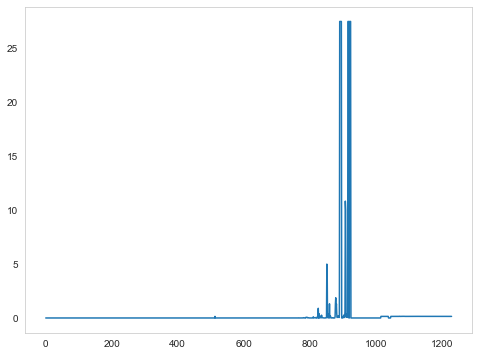

In [356]:
plt.plot(yhat)

In [364]:
yhat = yhat.flatten() 
Y_train = Y_train.flatten() 
y = Y_train
datadd.shape


(1212,)

In [366]:
Y_trainf = Y_train[0:1212]
yhatf = yhat[0:1212]

In [367]:
df = pd.DataFrame(data={'year': datadd, 
                        'predict': yhatf, 
                        'fact': Y_trainf})

# #################################################################

In [373]:
# multivariate mlp example
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate
 
# сэмлы
def split_sequences(sequences, n_steps):
	X, y = list(), list()
	for i in range(len(sequences)):
		# разметка
		end_ix = i + n_steps
		# проверка выхода за пределы
		if end_ix > len(sequences):
			break
		# получение начала и конечной метки
		seq_x, seq_y = sequences[i:end_ix, :-1], sequences[end_ix-1, -1]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
# последовательность
in_seq1 = X_left
in_seq2 = X_right
out_seq = Y_train # array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1), 6))
in_seq2 = in_seq2.reshape((len(in_seq2), 1))
out_seq = out_seq.reshape((len(out_seq), 1))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
n_steps = 1
# convert into input/output
X, y = split_sequences(dataset, n_steps)
# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]
# первая модель
visible1 = Input(shape=(n_steps,1))
dense1 = LSTM(1000, input_shape =(100,1))(visible1)
d = LSTM(1000, input_shape =(100,1))(visible1)
#,batch_input_shape=(32,100,1), stateful=True
# вторая модель LSTM
visible2 = Input(shape=(n_steps,1))
lstm = LSTM(100, input_shape =(100,1))(visible2)
# слияние
merge = concatenate([dense1, lstm,d])
output = Dense(1)(merge)
model = Model(inputs=[visible1, visible2], outputs=output)
model.compile(optimizer='adam', loss='mape', metrics=['accuracy'])
# fit model
model.fit([X1, X2], y, epochs=10, verbose=1, batch_size=64, validation_split=0.14)
# demonstrate prediction
#x_input = array([[80, 85], [90, 95], [100, 105]])
#x1 = x_input[:, 0].reshape((1, n_steps))
#x2 = x_input[:, 1].reshape((1, n_steps))
yhat = model.predict([X1, X2], verbose=0)
print(yhat)

Epoch 1/10
17/17 [==============================] - 6s 116ms/step - loss: 196872.3678 - accuracy: 0.0011 - val_loss: 105.5409 - val_accuracy: 0.0000e+00
Epoch 2/10
17/17 [==============================] - 1s 43ms/step - loss: 48636.6589 - accuracy: 0.0011 - val_loss: 136.8822 - val_accuracy: 0.0000e+00
Epoch 3/10
17/17 [==============================] - 1s 44ms/step - loss: 103792.6929 - accuracy: 0.0020 - val_loss: 150.7386 - val_accuracy: 0.0000e+00
Epoch 4/10
17/17 [==============================] - 1s 43ms/step - loss: 95062.1190 - accuracy: 0.0021 - val_loss: 162.7481 - val_accuracy: 0.0000e+00
Epoch 5/10
17/17 [==============================] - 1s 44ms/step - loss: 96912.9071 - accuracy: 0.0017 - val_loss: 149.3949 - val_accuracy: 0.0000e+00
Epoch 6/10
17/17 [==============================] - 1s 46ms/step - loss: 69444.7858 - accuracy: 0.0020 - val_loss: 148.9361 - val_accuracy: 0.0000e+00
Epoch 7/10
17/17 [==============================] - 1s 45ms/step - loss: 62651.7262 - accur

# ###################################10-1

In [576]:
import numpy as np
import pandas as pd


data2 = pd.read_csv('df_south.csv')
data2.index = data2['date']
data2 = data2.fillna(0)

data2 = data2.drop(['date'], axis=1)

In [577]:
features_sf = data2.loc[(data2.index >= '2018-01-01')]
data2 = features_sf

In [578]:
features_considered_south1 = ['AKSH_298_liq_vol','AKSH_213_liq_vol','AKSH_203_liq_vol','AKSH_223_liq_vol','AKSH_226_liq_vol']
target_south = ['AKSH_298_liq_vol','AKSH_213_liq_vol','AKSH_203_liq_vol','AKSH_223_liq_vol','AKSH_226_liq_vol']
features_considered_south2 = ['AKSH_298_bhp_pump_press','AKSH_213_bhp_pump_press','AKSH_203_bhp_pump_press','AKSH_223_bhp_pump_press','AKSH_226_bhp_pump_press']

In [579]:
data2.head()

,Unnamed: 0,AKSH_213_liq_vol,AKSH_213_wc_vol,AKSH_213_bhp_fluid_level,AKSH_213_bhp_pump_press,AKSH_219_liq_vol,AKSH_219_wc_vol,AKSH_219_bhp_fluid_level,AKSH_219_bhp_pump_press,AKSH_464_liq_vol,...,AKSH_221_water_vol,AKSH_221_water_type,AKSH_250_water_vol,AKSH_250_water_type,AKSH_424_water_vol,AKSH_424_water_type,AKSH_249_water_vol,AKSH_249_water_type,AKSH_214_water_vol,AKSH_214_water_type
date,,,,,,,,,,,,,,,,,,,,,
2018-01-01,365,44.01,52.034,30.667,30.931,69.08000,35.032,31.068,31.407,0.0,...,151.0,Артезианская вода,0.0,0,0.0,0,46.0,Артезианская вода,230.0,Артезианская вода
2018-01-02,366,33.07,52.011,30.669,30.930,70.50000,35.035,32.107,32.407,0.0,...,151.0,Артезианская вода,0.0,0,0.0,0,47.0,Артезианская вода,230.0,Артезианская вода
2018-01-03,367,33.45,52.018,30.650,30.930,71.31000,35.058,35.028,35.408,0.0,...,152.0,Артезианская вода,0.0,0,0.0,0,47.0,Артезианская вода,230.0,Артезианская вода
2018-01-04,368,33.07,52.011,29.670,29.930,70.53236,34.927,33.045,33.405,0.0,...,151.0,Артезианская вода,0.0,0,0.0,0,46.0,Артезианская вода,230.0,Артезианская вода
2018-01-05,369,33.16,51.870,28.689,28.929,70.69000,34.941,43.825,44.405,0.0,...,150.0,Артезианская вода,0.0,0,0.0,0,46.0,Артезианская вода,229.0,Артезианская вода


In [581]:
features1 = data2[features_considered_south1]

features2 = data2[features_considered_south2]
target = data2[target_south]
#features.index = data['date']

#features = features.fillna(0)
features1.head()

,AKSH_298_liq_vol,AKSH_213_liq_vol,AKSH_203_liq_vol,AKSH_223_liq_vol,AKSH_226_liq_vol
date,,,,,
2018-01-01,36.750000,44.01,27.46,52.04,19.72
2018-01-02,36.810000,33.07,27.50,45.38,19.76
2018-01-03,37.240000,33.45,27.82,45.90,19.99
2018-01-04,36.801704,33.07,27.51,45.38,19.76
2018-01-05,39.630000,33.16,26.68,45.50,19.81


In [541]:
features2.head()

,AKSH_298_bhp_pump_press,AKSH_213_bhp_pump_press,AKSH_203_bhp_pump_press,AKSH_223_bhp_pump_press,AKSH_226_bhp_pump_press
date,,,,,
2018-01-01,45.638,30.931,63.770,34.506,25.441
2018-01-02,45.603,30.930,63.770,34.507,24.440
2018-01-03,46.603,30.930,63.772,33.507,24.441
2018-01-04,62.603,29.930,63.721,34.552,24.440
2018-01-05,41.602,28.929,63.720,34.554,26.439


In [542]:
data2.head()

,Unnamed: 0,AKSH_213_liq_vol,AKSH_213_wc_vol,AKSH_213_bhp_fluid_level,AKSH_213_bhp_pump_press,AKSH_219_liq_vol,AKSH_219_wc_vol,AKSH_219_bhp_fluid_level,AKSH_219_bhp_pump_press,AKSH_464_liq_vol,...,AKSH_221_water_vol,AKSH_221_water_type,AKSH_250_water_vol,AKSH_250_water_type,AKSH_424_water_vol,AKSH_424_water_type,AKSH_249_water_vol,AKSH_249_water_type,AKSH_214_water_vol,AKSH_214_water_type
date,,,,,,,,,,,,,,,,,,,,,
2018-01-01,365,44.01,52.034,30.667,30.931,69.08000,35.032,31.068,31.407,0.0,...,151.0,Артезианская вода,0.0,0,0.0,0,46.0,Артезианская вода,230.0,Артезианская вода
2018-01-02,366,33.07,52.011,30.669,30.930,70.50000,35.035,32.107,32.407,0.0,...,151.0,Артезианская вода,0.0,0,0.0,0,47.0,Артезианская вода,230.0,Артезианская вода
2018-01-03,367,33.45,52.018,30.650,30.930,71.31000,35.058,35.028,35.408,0.0,...,152.0,Артезианская вода,0.0,0,0.0,0,47.0,Артезианская вода,230.0,Артезианская вода
2018-01-04,368,33.07,52.011,29.670,29.930,70.53236,34.927,33.045,33.405,0.0,...,151.0,Артезианская вода,0.0,0,0.0,0,46.0,Артезианская вода,230.0,Артезианская вода
2018-01-05,369,33.16,51.870,28.689,28.929,70.69000,34.941,43.825,44.405,0.0,...,150.0,Артезианская вода,0.0,0,0.0,0,46.0,Артезианская вода,229.0,Артезианская вода


In [51]:
#features2s =[features_considered_south2] 
#features2 = datan['AKSH_424_water_vol','AKSH_249_water_vol','AKSH_247_water_vol','AKSH_250_water_vol','AKSH_424_water_vol','AKSH_214_water_vol']
#X_left = features2 #data2['AKSH_298_bhp_pump_press','AKSH_213_bhp_pump_press','AKSH_203_bhp_pump_press','AKSH_223_bhp_pump_press','AKSH_226_bhp_pump_press']

X_left = dataws #= data[features_considered_south1]
#X_left = data2[features2]
X_right = data[features_considered_south2]
Y_train = data['AKSH_298_liq_vol']#,'AKSH_226_liq_vol'] 
X_left = X_left.shift(-15)
X_left = np.asarray(X_left)
X_right = np.asarray(X_right) 
Y_train = np.asarray(Y_train) 


In [589]:

X_left

array([[  0.,  47.,   0.,   0.,   0., 189.],
       [  0.,  46.,   0.,   0.,   0., 188.],
       [  0.,  47.,   0.,   0.,   0., 187.],
       ...,
       [ nan,  nan,  nan,  nan,  nan,  nan],
       [ nan,  nan,  nan,  nan,  nan,  nan],
       [ nan,  nan,  nan,  nan,  nan,  nan]])

# 10-1 %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%

# 'AKSH_298_liq_vol'

In [52]:
X_leftl = X_left[(data.index < '2020-01-01')]
X_rightl = X_right[(data.index < '2020-01-01')]
Y_trainl = Y_train[(data.index < '2020-01-01')]#,'AKSH_226_liq_vol'] 


X_leftt = X_left[(data.index > '2020-01-01')]
X_rightt = X_right[(data.index > '2020-01-01')]
Y_traint = Y_train[(data.index > '2020-01-01')]#,'AKSH_226_liq_vol'] 

datadd = data.index
datadt = datadd[(data.index > '2020-01-01')]
datadl = datadd[(data.index < '2020-01-01')]


X_left = np.asarray(X_left)
X_right = np.asarray(X_right) 
Y_train = np.asarray(Y_train)
X_leftl = np.asarray(X_leftl)
X_rightl = np.asarray(X_rightl) 
Y_trainl = np.asarray(Y_trainl)
X_leftt = np.asarray(X_leftt)
X_rightt = np.asarray(X_rightt) 
Y_traint = np.asarray(Y_traint)

In [53]:
# multivariate mlp example
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate
 
# сэмлы
def split_sequences(sequences, n_steps):
	X, y = list(), list()
	for i in range(len(sequences)):
		# разметка
		end_ix = i + n_steps
		# проверка выхода за пределы
		if end_ix > len(sequences):
			break
		# получение начала и конечной метки
		seq_x, seq_y = sequences[i:end_ix, :-1], sequences[end_ix-1, -1]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
# последовательность
in_seq1 = X_leftl
in_seq2 = X_rightl

out_seq = Y_trainl #array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1),6))
in_seq2 = in_seq2.reshape((len(in_seq2),5))
out_seq = out_seq.reshape((len(out_seq),1))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
n_steps = 15
# convert into input/output
X,y = split_sequences(dataset, n_steps)
#y = 
# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]
# первая модель
visible1 = Input(shape=(n_steps,))
dense1 = Dense(100, activation='relu')(visible1)
dense21 = Dense(10, activation='relu')(dense1)
# вторая модель
visible2 = Input(shape=(n_steps,))
dense2 = Dense(100, activation='relu')(visible2)
dense22 = Dense(10, activation='relu')(dense2)
# слияние
# слияние
merge = concatenate([dense1, dense2])
output = Dense(1)(merge)
model = Model(inputs=[visible1, visible2], outputs=output)
model.compile(optimizer='adam', loss='mse', metrics=['accuracy'])
# fit model
model.fit([X1, X2], Y_trainl, epochs=2000, verbose= 1, batch_size=64, validation_split=0.1)
# demonstrate prediction
#x_input = array([[80, 85], [90, 95], [100, 105]])
#x1 = x_input[:, 0].reshape((1, n_steps))
#x2 = x_input[:, 1].reshape((1, n_steps))

 
# последовательность
in_seq1t = X_leftt
in_seq2t = X_rightt

out_seqt = Y_traint #array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1t = in_seq1.reshape((len(in_seq1),6))
in_seq2t = in_seq2.reshape((len(in_seq2),5))
out_seqt = out_seq.reshape((len(out_seq),1))
# горизонтальное последовательное размещение данных 
datasett = hstack((in_seq1t, in_seq2t, out_seqt))
# таймстепы
n_steps = 15
# convert into input/output
Xt,yt = split_sequences(datasett, n_steps)
X1t = Xt[:, :, 0]
X2t = Xt[:, :, 1]
yhatt = model.predict([X1t, X2t], verbose=0)
print(yhatt)

Epoch 1/2000
11/11 [==============================] - 1s 23ms/step - loss: 2837.4023 - accuracy: 0.0000e+00 - val_loss: 580.0867 - val_accuracy: 0.0000e+00
Epoch 2/2000
11/11 [==============================] - 0s 5ms/step - loss: 263.7354 - accuracy: 0.0000e+00 - val_loss: 724.8832 - val_accuracy: 0.0000e+00
Epoch 3/2000
11/11 [==============================] - 0s 4ms/step - loss: 209.6669 - accuracy: 0.0000e+00 - val_loss: 595.5416 - val_accuracy: 0.0000e+00
Epoch 4/2000
11/11 [==============================] - 0s 4ms/step - loss: 109.4099 - accuracy: 0.0000e+00 - val_loss: 425.7382 - val_accuracy: 0.0000e+00
Epoch 5/2000
11/11 [==============================] - 0s 4ms/step - loss: 104.6607 - accuracy: 0.0000e+00 - val_loss: 438.0432 - val_accuracy: 0.0000e+00
Epoch 6/2000
11/11 [==============================] - 0s 4ms/step - loss: 97.7734 - accuracy: 0.0000e+00 - val_loss: 368.5560 - val_accuracy: 0.0000e+00
Epoch 7/2000
11/11 [==============================] - 0s 4ms/step - loss: 9

Epoch 54/2000
11/11 [==============================] - 0s 4ms/step - loss: 114.0051 - accuracy: 0.0000e+00 - val_loss: 530.2057 - val_accuracy: 0.0000e+00
Epoch 55/2000
11/11 [==============================] - 0s 4ms/step - loss: 84.9106 - accuracy: 0.0000e+00 - val_loss: 276.2739 - val_accuracy: 0.0000e+00
Epoch 56/2000
11/11 [==============================] - 0s 4ms/step - loss: 78.6936 - accuracy: 0.0000e+00 - val_loss: 296.0834 - val_accuracy: 0.0000e+00
Epoch 57/2000
11/11 [==============================] - 0s 4ms/step - loss: 73.7590 - accuracy: 0.0000e+00 - val_loss: 386.1607 - val_accuracy: 0.0000e+00
Epoch 58/2000
11/11 [==============================] - 0s 4ms/step - loss: 69.9932 - accuracy: 0.0000e+00 - val_loss: 340.3687 - val_accuracy: 0.0000e+00
Epoch 59/2000
11/11 [==============================] - 0s 4ms/step - loss: 73.4329 - accuracy: 0.0000e+00 - val_loss: 425.4875 - val_accuracy: 0.0000e+00
Epoch 60/2000
11/11 [==============================] - 0s 4ms/step - loss: 

Epoch 160/2000
11/11 [==============================] - 0s 4ms/step - loss: 50.1784 - accuracy: 0.0000e+00 - val_loss: 1226.2169 - val_accuracy: 0.0000e+00
Epoch 161/2000
11/11 [==============================] - 0s 4ms/step - loss: 57.0587 - accuracy: 0.0000e+00 - val_loss: 1239.6862 - val_accuracy: 0.0000e+00
Epoch 162/2000
11/11 [==============================] - 0s 4ms/step - loss: 55.4548 - accuracy: 0.0000e+00 - val_loss: 1295.6144 - val_accuracy: 0.0000e+00
Epoch 163/2000
11/11 [==============================] - 0s 4ms/step - loss: 65.8803 - accuracy: 0.0000e+00 - val_loss: 1040.2935 - val_accuracy: 0.0000e+00
Epoch 164/2000
11/11 [==============================] - 0s 4ms/step - loss: 68.6274 - accuracy: 0.0000e+00 - val_loss: 1066.4067 - val_accuracy: 0.0000e+00
Epoch 165/2000
11/11 [==============================] - 0s 4ms/step - loss: 58.0417 - accuracy: 0.0000e+00 - val_loss: 1513.3169 - val_accuracy: 0.0000e+00
Epoch 166/2000
11/11 [==============================] - 0s 4ms/s

Epoch 265/2000
11/11 [==============================] - 0s 4ms/step - loss: 43.8781 - accuracy: 0.0000e+00 - val_loss: 688.1760 - val_accuracy: 0.0000e+00
Epoch 266/2000
11/11 [==============================] - 0s 4ms/step - loss: 40.2108 - accuracy: 0.0000e+00 - val_loss: 733.7929 - val_accuracy: 0.0000e+00
Epoch 267/2000
11/11 [==============================] - 0s 4ms/step - loss: 40.3349 - accuracy: 0.0000e+00 - val_loss: 644.1754 - val_accuracy: 0.0000e+00
Epoch 268/2000
11/11 [==============================] - 0s 4ms/step - loss: 39.2896 - accuracy: 0.0000e+00 - val_loss: 715.5013 - val_accuracy: 0.0000e+00
Epoch 269/2000
11/11 [==============================] - 0s 4ms/step - loss: 38.5380 - accuracy: 0.0000e+00 - val_loss: 812.4803 - val_accuracy: 0.0000e+00
Epoch 270/2000
11/11 [==============================] - 0s 4ms/step - loss: 38.1344 - accuracy: 0.0000e+00 - val_loss: 691.5623 - val_accuracy: 0.0000e+00
Epoch 271/2000
11/11 [==============================] - 0s 4ms/step - 

Epoch 318/2000
11/11 [==============================] - 0s 4ms/step - loss: 44.6728 - accuracy: 0.0000e+00 - val_loss: 1130.8296 - val_accuracy: 0.0000e+00
Epoch 319/2000
11/11 [==============================] - 0s 4ms/step - loss: 59.3378 - accuracy: 0.0000e+00 - val_loss: 399.9492 - val_accuracy: 0.0000e+00
Epoch 320/2000
11/11 [==============================] - 0s 4ms/step - loss: 64.4870 - accuracy: 0.0000e+00 - val_loss: 1154.0072 - val_accuracy: 0.0000e+00
Epoch 321/2000
11/11 [==============================] - 0s 4ms/step - loss: 58.1190 - accuracy: 0.0000e+00 - val_loss: 341.6368 - val_accuracy: 0.0000e+00
Epoch 322/2000
11/11 [==============================] - 0s 4ms/step - loss: 49.4676 - accuracy: 0.0000e+00 - val_loss: 912.1107 - val_accuracy: 0.0000e+00
Epoch 323/2000
11/11 [==============================] - 0s 4ms/step - loss: 42.4750 - accuracy: 0.0000e+00 - val_loss: 436.1055 - val_accuracy: 0.0000e+00
Epoch 324/2000
11/11 [==============================] - 0s 4ms/step 

Epoch 371/2000
11/11 [==============================] - 0s 4ms/step - loss: 34.1093 - accuracy: 0.0000e+00 - val_loss: 478.5851 - val_accuracy: 0.0000e+00
Epoch 372/2000
11/11 [==============================] - 0s 4ms/step - loss: 33.7786 - accuracy: 0.0000e+00 - val_loss: 385.4335 - val_accuracy: 0.0000e+00
Epoch 373/2000
11/11 [==============================] - 0s 4ms/step - loss: 32.1511 - accuracy: 0.0000e+00 - val_loss: 497.3797 - val_accuracy: 0.0000e+00
Epoch 374/2000
11/11 [==============================] - 0s 4ms/step - loss: 39.1637 - accuracy: 0.0000e+00 - val_loss: 527.1747 - val_accuracy: 0.0000e+00
Epoch 375/2000
11/11 [==============================] - 0s 4ms/step - loss: 32.6040 - accuracy: 0.0000e+00 - val_loss: 425.2994 - val_accuracy: 0.0000e+00
Epoch 376/2000
11/11 [==============================] - 0s 4ms/step - loss: 36.1615 - accuracy: 0.0000e+00 - val_loss: 467.3445 - val_accuracy: 0.0000e+00
Epoch 377/2000
11/11 [==============================] - 0s 4ms/step - 

Epoch 424/2000
11/11 [==============================] - 0s 4ms/step - loss: 36.2139 - accuracy: 0.0000e+00 - val_loss: 310.2983 - val_accuracy: 0.0000e+00
Epoch 425/2000
11/11 [==============================] - 0s 4ms/step - loss: 33.9936 - accuracy: 0.0000e+00 - val_loss: 385.5135 - val_accuracy: 0.0000e+00
Epoch 426/2000
11/11 [==============================] - 0s 4ms/step - loss: 30.5252 - accuracy: 0.0000e+00 - val_loss: 338.9922 - val_accuracy: 0.0000e+00
Epoch 427/2000
11/11 [==============================] - 0s 4ms/step - loss: 31.6157 - accuracy: 0.0000e+00 - val_loss: 369.7102 - val_accuracy: 0.0000e+00
Epoch 428/2000
11/11 [==============================] - 0s 4ms/step - loss: 35.7984 - accuracy: 0.0000e+00 - val_loss: 292.5146 - val_accuracy: 0.0000e+00
Epoch 429/2000
11/11 [==============================] - 0s 4ms/step - loss: 35.4330 - accuracy: 0.0000e+00 - val_loss: 290.5019 - val_accuracy: 0.0000e+00
Epoch 430/2000
11/11 [==============================] - 0s 4ms/step - 

Epoch 477/2000
11/11 [==============================] - 0s 4ms/step - loss: 32.2471 - accuracy: 0.0000e+00 - val_loss: 592.8372 - val_accuracy: 0.0000e+00
Epoch 478/2000
11/11 [==============================] - 0s 4ms/step - loss: 38.5783 - accuracy: 0.0000e+00 - val_loss: 344.1816 - val_accuracy: 0.0000e+00
Epoch 479/2000
11/11 [==============================] - 0s 4ms/step - loss: 32.5703 - accuracy: 0.0000e+00 - val_loss: 250.3290 - val_accuracy: 0.0000e+00
Epoch 480/2000
11/11 [==============================] - 0s 4ms/step - loss: 38.6297 - accuracy: 0.0000e+00 - val_loss: 405.4651 - val_accuracy: 0.0000e+00
Epoch 481/2000
11/11 [==============================] - 0s 4ms/step - loss: 35.0158 - accuracy: 0.0000e+00 - val_loss: 479.8262 - val_accuracy: 0.0000e+00
Epoch 482/2000
11/11 [==============================] - 0s 4ms/step - loss: 37.0665 - accuracy: 0.0000e+00 - val_loss: 345.9749 - val_accuracy: 0.0000e+00
Epoch 483/2000
11/11 [==============================] - 0s 4ms/step - 

Epoch 530/2000
11/11 [==============================] - 0s 4ms/step - loss: 29.4969 - accuracy: 0.0000e+00 - val_loss: 451.3789 - val_accuracy: 0.0000e+00
Epoch 531/2000
11/11 [==============================] - 0s 4ms/step - loss: 30.4954 - accuracy: 0.0000e+00 - val_loss: 422.4944 - val_accuracy: 0.0000e+00
Epoch 532/2000
11/11 [==============================] - 0s 4ms/step - loss: 29.1116 - accuracy: 0.0000e+00 - val_loss: 377.7531 - val_accuracy: 0.0000e+00
Epoch 533/2000
11/11 [==============================] - 0s 4ms/step - loss: 32.1932 - accuracy: 0.0000e+00 - val_loss: 417.9725 - val_accuracy: 0.0000e+00
Epoch 534/2000
11/11 [==============================] - 0s 4ms/step - loss: 32.2915 - accuracy: 0.0000e+00 - val_loss: 486.3024 - val_accuracy: 0.0000e+00
Epoch 535/2000
11/11 [==============================] - 0s 4ms/step - loss: 29.0190 - accuracy: 0.0000e+00 - val_loss: 592.6732 - val_accuracy: 0.0000e+00
Epoch 536/2000
11/11 [==============================] - 0s 4ms/step - 

Epoch 583/2000
11/11 [==============================] - 0s 4ms/step - loss: 40.1671 - accuracy: 0.0000e+00 - val_loss: 558.9234 - val_accuracy: 0.0000e+00
Epoch 584/2000
11/11 [==============================] - 0s 4ms/step - loss: 35.5734 - accuracy: 0.0000e+00 - val_loss: 494.3358 - val_accuracy: 0.0000e+00
Epoch 585/2000
11/11 [==============================] - 0s 4ms/step - loss: 31.8033 - accuracy: 0.0000e+00 - val_loss: 528.1008 - val_accuracy: 0.0000e+00
Epoch 586/2000
11/11 [==============================] - 0s 4ms/step - loss: 37.5266 - accuracy: 0.0000e+00 - val_loss: 380.2889 - val_accuracy: 0.0000e+00
Epoch 587/2000
11/11 [==============================] - 0s 4ms/step - loss: 33.3593 - accuracy: 0.0000e+00 - val_loss: 567.2073 - val_accuracy: 0.0000e+00
Epoch 588/2000
11/11 [==============================] - 0s 4ms/step - loss: 31.4405 - accuracy: 0.0000e+00 - val_loss: 366.1415 - val_accuracy: 0.0000e+00
Epoch 589/2000
11/11 [==============================] - 0s 4ms/step - 

Epoch 636/2000
11/11 [==============================] - 0s 4ms/step - loss: 27.7575 - accuracy: 0.0000e+00 - val_loss: 444.1358 - val_accuracy: 0.0000e+00
Epoch 637/2000
11/11 [==============================] - 0s 4ms/step - loss: 32.5319 - accuracy: 0.0000e+00 - val_loss: 566.9974 - val_accuracy: 0.0000e+00
Epoch 638/2000
11/11 [==============================] - 0s 4ms/step - loss: 33.5762 - accuracy: 0.0000e+00 - val_loss: 735.7979 - val_accuracy: 0.0000e+00
Epoch 639/2000
11/11 [==============================] - 0s 4ms/step - loss: 37.3464 - accuracy: 0.0000e+00 - val_loss: 529.0172 - val_accuracy: 0.0000e+00
Epoch 640/2000
11/11 [==============================] - 0s 4ms/step - loss: 31.9515 - accuracy: 0.0000e+00 - val_loss: 496.1927 - val_accuracy: 0.0000e+00
Epoch 641/2000
11/11 [==============================] - 0s 5ms/step - loss: 30.4268 - accuracy: 0.0000e+00 - val_loss: 438.3573 - val_accuracy: 0.0000e+00
Epoch 642/2000
11/11 [==============================] - 0s 4ms/step - 

Epoch 689/2000
11/11 [==============================] - 0s 4ms/step - loss: 37.2095 - accuracy: 0.0000e+00 - val_loss: 424.6079 - val_accuracy: 0.0000e+00
Epoch 690/2000
11/11 [==============================] - 0s 4ms/step - loss: 31.4738 - accuracy: 0.0000e+00 - val_loss: 389.8871 - val_accuracy: 0.0000e+00
Epoch 691/2000
11/11 [==============================] - 0s 4ms/step - loss: 39.8003 - accuracy: 0.0000e+00 - val_loss: 909.1683 - val_accuracy: 0.0000e+00
Epoch 692/2000
11/11 [==============================] - 0s 4ms/step - loss: 37.5259 - accuracy: 0.0000e+00 - val_loss: 762.9103 - val_accuracy: 0.0000e+00
Epoch 693/2000
11/11 [==============================] - 0s 4ms/step - loss: 43.0513 - accuracy: 0.0000e+00 - val_loss: 496.5172 - val_accuracy: 0.0000e+00
Epoch 694/2000
11/11 [==============================] - 0s 4ms/step - loss: 36.8311 - accuracy: 0.0000e+00 - val_loss: 584.6926 - val_accuracy: 0.0000e+00
Epoch 695/2000
11/11 [==============================] - 0s 4ms/step - 

Epoch 742/2000
11/11 [==============================] - 0s 4ms/step - loss: 30.2105 - accuracy: 0.0000e+00 - val_loss: 664.7299 - val_accuracy: 0.0000e+00
Epoch 743/2000
11/11 [==============================] - 0s 5ms/step - loss: 31.1126 - accuracy: 0.0000e+00 - val_loss: 613.4746 - val_accuracy: 0.0000e+00
Epoch 744/2000
11/11 [==============================] - 0s 4ms/step - loss: 28.6424 - accuracy: 0.0000e+00 - val_loss: 515.7497 - val_accuracy: 0.0000e+00
Epoch 745/2000
11/11 [==============================] - 0s 4ms/step - loss: 27.2598 - accuracy: 0.0000e+00 - val_loss: 671.3481 - val_accuracy: 0.0000e+00
Epoch 746/2000
11/11 [==============================] - 0s 4ms/step - loss: 30.9277 - accuracy: 0.0000e+00 - val_loss: 669.0393 - val_accuracy: 0.0000e+00
Epoch 747/2000
11/11 [==============================] - 0s 4ms/step - loss: 29.0235 - accuracy: 0.0000e+00 - val_loss: 665.7644 - val_accuracy: 0.0000e+00
Epoch 748/2000
11/11 [==============================] - 0s 4ms/step - 

Epoch 795/2000
11/11 [==============================] - 0s 4ms/step - loss: 30.5521 - accuracy: 0.0000e+00 - val_loss: 532.5027 - val_accuracy: 0.0000e+00
Epoch 796/2000
11/11 [==============================] - 0s 4ms/step - loss: 29.4352 - accuracy: 0.0000e+00 - val_loss: 664.3521 - val_accuracy: 0.0000e+00
Epoch 797/2000
11/11 [==============================] - 0s 4ms/step - loss: 29.2798 - accuracy: 0.0000e+00 - val_loss: 751.3083 - val_accuracy: 0.0000e+00
Epoch 798/2000
11/11 [==============================] - 0s 4ms/step - loss: 30.6418 - accuracy: 0.0000e+00 - val_loss: 847.9742 - val_accuracy: 0.0000e+00
Epoch 799/2000
11/11 [==============================] - 0s 5ms/step - loss: 29.4786 - accuracy: 0.0000e+00 - val_loss: 833.1786 - val_accuracy: 0.0000e+00
Epoch 800/2000
11/11 [==============================] - 0s 4ms/step - loss: 31.5383 - accuracy: 0.0000e+00 - val_loss: 717.7035 - val_accuracy: 0.0000e+00
Epoch 801/2000
11/11 [==============================] - 0s 4ms/step - 

Epoch 848/2000
11/11 [==============================] - 0s 4ms/step - loss: 29.9937 - accuracy: 0.0000e+00 - val_loss: 682.8143 - val_accuracy: 0.0000e+00
Epoch 849/2000
11/11 [==============================] - 0s 4ms/step - loss: 28.2252 - accuracy: 0.0000e+00 - val_loss: 677.9161 - val_accuracy: 0.0000e+00
Epoch 850/2000
11/11 [==============================] - 0s 4ms/step - loss: 44.6697 - accuracy: 0.0000e+00 - val_loss: 1606.4036 - val_accuracy: 0.0000e+00
Epoch 851/2000
11/11 [==============================] - 0s 4ms/step - loss: 58.2321 - accuracy: 0.0000e+00 - val_loss: 826.2438 - val_accuracy: 0.0000e+00
Epoch 852/2000
11/11 [==============================] - 0s 4ms/step - loss: 38.4677 - accuracy: 0.0000e+00 - val_loss: 712.2000 - val_accuracy: 0.0000e+00
Epoch 853/2000
11/11 [==============================] - 0s 4ms/step - loss: 31.0091 - accuracy: 0.0000e+00 - val_loss: 723.8283 - val_accuracy: 0.0000e+00
Epoch 854/2000
11/11 [==============================] - 0s 4ms/step -

Epoch 901/2000
11/11 [==============================] - 0s 4ms/step - loss: 26.3389 - accuracy: 0.0000e+00 - val_loss: 804.1580 - val_accuracy: 0.0000e+00
Epoch 902/2000
11/11 [==============================] - 0s 4ms/step - loss: 27.3590 - accuracy: 0.0000e+00 - val_loss: 849.2148 - val_accuracy: 0.0000e+00
Epoch 903/2000
11/11 [==============================] - 0s 4ms/step - loss: 28.4449 - accuracy: 0.0000e+00 - val_loss: 797.5608 - val_accuracy: 0.0000e+00
Epoch 904/2000
11/11 [==============================] - 0s 4ms/step - loss: 27.8465 - accuracy: 0.0000e+00 - val_loss: 822.5077 - val_accuracy: 0.0000e+00
Epoch 905/2000
11/11 [==============================] - 0s 4ms/step - loss: 25.8288 - accuracy: 0.0000e+00 - val_loss: 859.6385 - val_accuracy: 0.0000e+00
Epoch 906/2000
11/11 [==============================] - 0s 4ms/step - loss: 29.4005 - accuracy: 0.0000e+00 - val_loss: 952.6052 - val_accuracy: 0.0000e+00
Epoch 907/2000
11/11 [==============================] - 0s 4ms/step - 

Epoch 954/2000
11/11 [==============================] - 0s 4ms/step - loss: 28.5585 - accuracy: 0.0000e+00 - val_loss: 895.7644 - val_accuracy: 0.0000e+00
Epoch 955/2000
11/11 [==============================] - 0s 4ms/step - loss: 28.5898 - accuracy: 0.0000e+00 - val_loss: 932.9061 - val_accuracy: 0.0000e+00
Epoch 956/2000
11/11 [==============================] - 0s 4ms/step - loss: 31.2450 - accuracy: 0.0000e+00 - val_loss: 800.8027 - val_accuracy: 0.0000e+00
Epoch 957/2000
11/11 [==============================] - 0s 4ms/step - loss: 28.8909 - accuracy: 0.0000e+00 - val_loss: 903.6841 - val_accuracy: 0.0000e+00
Epoch 958/2000
11/11 [==============================] - 0s 4ms/step - loss: 28.5098 - accuracy: 0.0000e+00 - val_loss: 830.0793 - val_accuracy: 0.0000e+00
Epoch 959/2000
11/11 [==============================] - 0s 4ms/step - loss: 23.4194 - accuracy: 0.0000e+00 - val_loss: 948.8533 - val_accuracy: 0.0000e+00
Epoch 960/2000
11/11 [==============================] - 0s 4ms/step - 

Epoch 1007/2000
11/11 [==============================] - 0s 4ms/step - loss: 26.5749 - accuracy: 0.0000e+00 - val_loss: 1033.6487 - val_accuracy: 0.0000e+00
Epoch 1008/2000
11/11 [==============================] - 0s 4ms/step - loss: 24.9174 - accuracy: 0.0000e+00 - val_loss: 899.4093 - val_accuracy: 0.0000e+00
Epoch 1009/2000
11/11 [==============================] - 0s 4ms/step - loss: 27.2672 - accuracy: 0.0000e+00 - val_loss: 1010.4713 - val_accuracy: 0.0000e+00
Epoch 1010/2000
11/11 [==============================] - 0s 4ms/step - loss: 26.8610 - accuracy: 0.0000e+00 - val_loss: 885.9514 - val_accuracy: 0.0000e+00
Epoch 1011/2000
11/11 [==============================] - 0s 4ms/step - loss: 25.6603 - accuracy: 0.0000e+00 - val_loss: 903.8694 - val_accuracy: 0.0000e+00
Epoch 1012/2000
11/11 [==============================] - 0s 4ms/step - loss: 30.5919 - accuracy: 0.0000e+00 - val_loss: 1031.7471 - val_accuracy: 0.0000e+00
Epoch 1013/2000
11/11 [==============================] - 0s 4

11/11 [==============================] - 0s 4ms/step - loss: 28.4290 - accuracy: 0.0000e+00 - val_loss: 1040.8147 - val_accuracy: 0.0000e+00
Epoch 1112/2000
11/11 [==============================] - 0s 4ms/step - loss: 27.8813 - accuracy: 0.0000e+00 - val_loss: 1204.7611 - val_accuracy: 0.0000e+00
Epoch 1113/2000
11/11 [==============================] - 0s 4ms/step - loss: 28.7816 - accuracy: 0.0000e+00 - val_loss: 1295.7671 - val_accuracy: 0.0000e+00
Epoch 1114/2000
11/11 [==============================] - 0s 4ms/step - loss: 28.8377 - accuracy: 0.0000e+00 - val_loss: 1419.6699 - val_accuracy: 0.0000e+00
Epoch 1115/2000
11/11 [==============================] - 0s 4ms/step - loss: 31.1809 - accuracy: 0.0000e+00 - val_loss: 1232.9303 - val_accuracy: 0.0000e+00
Epoch 1116/2000
11/11 [==============================] - 0s 4ms/step - loss: 27.6841 - accuracy: 0.0000e+00 - val_loss: 1197.0804 - val_accuracy: 0.0000e+00
Epoch 1117/2000
11/11 [==============================] - 0s 4ms/step - los

11/11 [==============================] - 0s 4ms/step - loss: 26.7097 - accuracy: 0.0000e+00 - val_loss: 1328.3490 - val_accuracy: 0.0000e+00
Epoch 1216/2000
11/11 [==============================] - 0s 4ms/step - loss: 25.2531 - accuracy: 0.0000e+00 - val_loss: 1367.1488 - val_accuracy: 0.0000e+00
Epoch 1217/2000
11/11 [==============================] - 0s 4ms/step - loss: 27.3969 - accuracy: 0.0000e+00 - val_loss: 1171.4297 - val_accuracy: 0.0000e+00
Epoch 1218/2000
11/11 [==============================] - 0s 4ms/step - loss: 24.0181 - accuracy: 0.0000e+00 - val_loss: 1178.6436 - val_accuracy: 0.0000e+00
Epoch 1219/2000
11/11 [==============================] - 0s 4ms/step - loss: 25.8388 - accuracy: 0.0000e+00 - val_loss: 1086.9957 - val_accuracy: 0.0000e+00
Epoch 1220/2000
11/11 [==============================] - 0s 4ms/step - loss: 25.6461 - accuracy: 0.0000e+00 - val_loss: 1250.6995 - val_accuracy: 0.0000e+00
Epoch 1221/2000
11/11 [==============================] - 0s 4ms/step - los

11/11 [==============================] - 0s 4ms/step - loss: 25.8138 - accuracy: 0.0000e+00 - val_loss: 1465.1689 - val_accuracy: 0.0000e+00
Epoch 1320/2000
11/11 [==============================] - 0s 4ms/step - loss: 28.9594 - accuracy: 0.0000e+00 - val_loss: 1684.6089 - val_accuracy: 0.0000e+00
Epoch 1321/2000
11/11 [==============================] - 0s 4ms/step - loss: 27.3614 - accuracy: 0.0000e+00 - val_loss: 1962.0142 - val_accuracy: 0.0000e+00
Epoch 1322/2000
11/11 [==============================] - 0s 4ms/step - loss: 27.7971 - accuracy: 0.0000e+00 - val_loss: 1737.4243 - val_accuracy: 0.0000e+00
Epoch 1323/2000
11/11 [==============================] - 0s 4ms/step - loss: 28.8329 - accuracy: 0.0000e+00 - val_loss: 1727.4622 - val_accuracy: 0.0000e+00
Epoch 1324/2000
11/11 [==============================] - 0s 4ms/step - loss: 27.7278 - accuracy: 0.0000e+00 - val_loss: 1380.6460 - val_accuracy: 0.0000e+00
Epoch 1325/2000
11/11 [==============================] - 0s 4ms/step - los

11/11 [==============================] - 0s 4ms/step - loss: 26.1627 - accuracy: 0.0000e+00 - val_loss: 1671.4829 - val_accuracy: 0.0000e+00
Epoch 1424/2000
11/11 [==============================] - 0s 4ms/step - loss: 25.0294 - accuracy: 0.0000e+00 - val_loss: 1770.7045 - val_accuracy: 0.0000e+00
Epoch 1425/2000
11/11 [==============================] - 0s 4ms/step - loss: 26.7712 - accuracy: 0.0000e+00 - val_loss: 1595.6704 - val_accuracy: 0.0000e+00
Epoch 1426/2000
11/11 [==============================] - 0s 4ms/step - loss: 25.3505 - accuracy: 0.0000e+00 - val_loss: 1634.5190 - val_accuracy: 0.0000e+00
Epoch 1427/2000
11/11 [==============================] - 0s 4ms/step - loss: 25.6558 - accuracy: 0.0000e+00 - val_loss: 1875.2784 - val_accuracy: 0.0000e+00
Epoch 1428/2000
11/11 [==============================] - 0s 4ms/step - loss: 25.6855 - accuracy: 0.0000e+00 - val_loss: 1843.9080 - val_accuracy: 0.0000e+00
Epoch 1429/2000
11/11 [==============================] - 0s 4ms/step - los

11/11 [==============================] - 0s 4ms/step - loss: 26.4360 - accuracy: 0.0000e+00 - val_loss: 2040.4149 - val_accuracy: 0.0000e+00
Epoch 1528/2000
11/11 [==============================] - 0s 4ms/step - loss: 26.1066 - accuracy: 0.0000e+00 - val_loss: 1802.7443 - val_accuracy: 0.0000e+00
Epoch 1529/2000
11/11 [==============================] - 0s 4ms/step - loss: 29.8243 - accuracy: 0.0000e+00 - val_loss: 1966.8060 - val_accuracy: 0.0000e+00
Epoch 1530/2000
11/11 [==============================] - 0s 4ms/step - loss: 24.3603 - accuracy: 0.0000e+00 - val_loss: 1777.5507 - val_accuracy: 0.0000e+00
Epoch 1531/2000
11/11 [==============================] - 0s 4ms/step - loss: 30.1406 - accuracy: 0.0000e+00 - val_loss: 1609.0844 - val_accuracy: 0.0000e+00
Epoch 1532/2000
11/11 [==============================] - 0s 4ms/step - loss: 27.6034 - accuracy: 0.0000e+00 - val_loss: 1582.2732 - val_accuracy: 0.0000e+00
Epoch 1533/2000
11/11 [==============================] - 0s 4ms/step - los

11/11 [==============================] - 0s 4ms/step - loss: 23.8222 - accuracy: 0.0000e+00 - val_loss: 2411.4731 - val_accuracy: 0.0000e+00
Epoch 1632/2000
11/11 [==============================] - 0s 4ms/step - loss: 23.9746 - accuracy: 0.0000e+00 - val_loss: 2379.7788 - val_accuracy: 0.0000e+00
Epoch 1633/2000
11/11 [==============================] - 0s 4ms/step - loss: 27.0774 - accuracy: 0.0000e+00 - val_loss: 1832.4445 - val_accuracy: 0.0000e+00
Epoch 1634/2000
11/11 [==============================] - 0s 4ms/step - loss: 33.8928 - accuracy: 0.0000e+00 - val_loss: 2029.8365 - val_accuracy: 0.0000e+00
Epoch 1635/2000
11/11 [==============================] - 0s 4ms/step - loss: 27.5899 - accuracy: 0.0000e+00 - val_loss: 2241.6882 - val_accuracy: 0.0000e+00
Epoch 1636/2000
11/11 [==============================] - 0s 4ms/step - loss: 27.0357 - accuracy: 0.0000e+00 - val_loss: 2439.1221 - val_accuracy: 0.0000e+00
Epoch 1637/2000
11/11 [==============================] - 0s 4ms/step - los

11/11 [==============================] - 0s 4ms/step - loss: 25.7806 - accuracy: 0.0000e+00 - val_loss: 2914.4512 - val_accuracy: 0.0000e+00
Epoch 1736/2000
11/11 [==============================] - 0s 5ms/step - loss: 26.4213 - accuracy: 0.0000e+00 - val_loss: 2700.1553 - val_accuracy: 0.0000e+00
Epoch 1737/2000
11/11 [==============================] - 0s 4ms/step - loss: 24.3987 - accuracy: 0.0000e+00 - val_loss: 2527.7864 - val_accuracy: 0.0000e+00
Epoch 1738/2000
11/11 [==============================] - 0s 4ms/step - loss: 23.8465 - accuracy: 0.0000e+00 - val_loss: 2898.9817 - val_accuracy: 0.0000e+00
Epoch 1739/2000
11/11 [==============================] - 0s 4ms/step - loss: 22.4741 - accuracy: 0.0000e+00 - val_loss: 2985.4985 - val_accuracy: 0.0000e+00
Epoch 1740/2000
11/11 [==============================] - 0s 4ms/step - loss: 24.2352 - accuracy: 0.0000e+00 - val_loss: 2928.0083 - val_accuracy: 0.0000e+00
Epoch 1741/2000
11/11 [==============================] - 0s 4ms/step - los

11/11 [==============================] - 0s 5ms/step - loss: 25.6230 - accuracy: 0.0000e+00 - val_loss: 2943.1843 - val_accuracy: 0.0000e+00
Epoch 1840/2000
11/11 [==============================] - 0s 4ms/step - loss: 24.4508 - accuracy: 0.0000e+00 - val_loss: 3003.0247 - val_accuracy: 0.0000e+00
Epoch 1841/2000
11/11 [==============================] - 0s 4ms/step - loss: 28.5335 - accuracy: 0.0000e+00 - val_loss: 2677.8298 - val_accuracy: 0.0000e+00
Epoch 1842/2000
11/11 [==============================] - 0s 4ms/step - loss: 28.4707 - accuracy: 0.0000e+00 - val_loss: 2477.8411 - val_accuracy: 0.0000e+00
Epoch 1843/2000
11/11 [==============================] - 0s 4ms/step - loss: 24.1623 - accuracy: 0.0000e+00 - val_loss: 2860.6318 - val_accuracy: 0.0000e+00
Epoch 1844/2000
11/11 [==============================] - 0s 4ms/step - loss: 26.3195 - accuracy: 0.0000e+00 - val_loss: 3076.3298 - val_accuracy: 0.0000e+00
Epoch 1845/2000
11/11 [==============================] - 0s 4ms/step - los

Epoch 1943/2000
11/11 [==============================] - 0s 4ms/step - loss: 23.7042 - accuracy: 0.0000e+00 - val_loss: 2963.8806 - val_accuracy: 0.0000e+00
Epoch 1944/2000
11/11 [==============================] - 0s 4ms/step - loss: 21.7362 - accuracy: 0.0000e+00 - val_loss: 3304.2112 - val_accuracy: 0.0000e+00
Epoch 1945/2000
11/11 [==============================] - 0s 4ms/step - loss: 26.2861 - accuracy: 0.0000e+00 - val_loss: 3035.1575 - val_accuracy: 0.0000e+00
Epoch 1946/2000
11/11 [==============================] - 0s 4ms/step - loss: 24.8097 - accuracy: 0.0000e+00 - val_loss: 2642.8450 - val_accuracy: 0.0000e+00
Epoch 1947/2000
11/11 [==============================] - 0s 4ms/step - loss: 26.6125 - accuracy: 0.0000e+00 - val_loss: 2877.3037 - val_accuracy: 0.0000e+00
Epoch 1948/2000
11/11 [==============================] - 0s 4ms/step - loss: 25.2688 - accuracy: 0.0000e+00 - val_loss: 3381.2830 - val_accuracy: 0.0000e+00
Epoch 1949/2000
11/11 [==============================] - 0

In [61]:
# multivariate mlp example
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate
import tensorflow as tf
import tensorflow_addons as tfa 
# split a multivariate sequence into samples
def split_sequences(sequences, n_steps_in, n_steps_out):
	X, y = list(), list()
	for i in range(len(sequences)):
		# find the end of this pattern
		end_ix = i + n_steps_in
		out_end_ix = end_ix + n_steps_out
		# check if we are beyond the dataset
		if out_end_ix > len(sequences):
			break
		# gather input and output parts of the pattern
		seq_x, seq_y = sequences[i:end_ix, :], sequences[end_ix:out_end_ix, :]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
 
# последовательность
in_seq1 = X_leftl
in_seq2 = X_rightl
out_seq = Y_trainl # array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1), 6))
in_seq2 = in_seq2.reshape((len(in_seq2), 5))
out_seq = out_seq.reshape((len(out_seq), 1))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
# таймстепы
n_features = 1

n_steps_in, n_steps_out = 15, 1
# convert into input/output
X,y = split_sequences(dataset, n_steps_in, n_steps_out)
n_features1 = 1
n_features2 = 1
# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]
# первая модель
visible1 = Input(shape=(n_steps_in,n_features1))

visible1n = tfa.layers.GroupNormalization(1,-1,0.001,False)(visible1)
dense1 = LSTM(n_steps_in, input_shape =(100,n_features1))(visible1n)

visible11 = (RepeatVector(n_steps_out))(dense1)

visible21 = (LSTM(n_steps_in, activation='softplus',return_sequences=True))(visible11)
visible31 = (TimeDistributed(Dense(n_features)))(visible21)


#,batch_input_shape=(32,100,1), stateful=True
# вторая модель LSTM
visible2 = Input(shape=(n_steps_in,n_features2))
visible2n = tfa.layers.GroupNormalization(1,-1,0.001,False)(visible2)

lstm = LSTM(n_steps_in, input_shape =(100,n_features2))(visible2n)

visible12 = (RepeatVector(n_steps_out))(lstm)
visible22 = (LSTM(n_steps_in, activation='softplus',return_sequences=True))(visible12)
visible32 = (TimeDistributed(Dense(n_features)))(visible22)


#lstm2 = LSTM(10, input_shape =(100,1))(lstm)

# слияние
merge = concatenate([dense1, lstm])
output = Dense(1)(merge)
model = Model(inputs=[visible1, visible2], outputs=output)
model.compile(optimizer='adam', loss='mape', metrics=['accuracy'])
# fit model
model.fit([X1, X2], Y_trainl, epochs=400, verbose=1, batch_size=16, validation_split=0.01)
# demonstrate prediction
#x_input = array([[80, 85], [90, 95], [100, 105]])
#x1 = x_input[:, 0].reshape((1, n_steps))
#x2 = x_input[:, 1].reshape((1, n_steps))
yhat = model.predict([X1, X2], verbose=0)
print(yhat)

Epoch 1/400
45/45 [==============================] - 4s 27ms/step - loss: 99.4985 - accuracy: 0.0000e+00 - val_loss: 95.2637 - val_accuracy: 0.0000e+00
Epoch 2/400
45/45 [==============================] - 0s 7ms/step - loss: 89.4204 - accuracy: 0.0000e+00 - val_loss: 74.3932 - val_accuracy: 0.0000e+00
Epoch 3/400
45/45 [==============================] - 0s 6ms/step - loss: 70.3768 - accuracy: 0.0000e+00 - val_loss: 63.5786 - val_accuracy: 0.0000e+00
Epoch 4/400
45/45 [==============================] - 0s 6ms/step - loss: 60.3936 - accuracy: 0.0000e+00 - val_loss: 55.6807 - val_accuracy: 0.0000e+00
Epoch 5/400
45/45 [==============================] - 0s 6ms/step - loss: 51.5202 - accuracy: 0.0000e+00 - val_loss: 49.0250 - val_accuracy: 0.0000e+00
Epoch 6/400
45/45 [==============================] - 0s 6ms/step - loss: 44.6647 - accuracy: 0.0000e+00 - val_loss: 43.0194 - val_accuracy: 0.0000e+00
Epoch 7/400
45/45 [==============================] - 0s 6ms/step - loss: 41.3598 - accuracy: 

45/45 [==============================] - 0s 6ms/step - loss: 18.8268 - accuracy: 0.0000e+00 - val_loss: 7.7823 - val_accuracy: 0.0000e+00
Epoch 110/400
45/45 [==============================] - 0s 6ms/step - loss: 19.9397 - accuracy: 0.0000e+00 - val_loss: 9.9380 - val_accuracy: 0.0000e+00
Epoch 111/400
45/45 [==============================] - 0s 7ms/step - loss: 17.0158 - accuracy: 0.0000e+00 - val_loss: 11.2232 - val_accuracy: 0.0000e+00
Epoch 112/400
45/45 [==============================] - 0s 7ms/step - loss: 16.5113 - accuracy: 0.0000e+00 - val_loss: 14.3087 - val_accuracy: 0.0000e+00
Epoch 113/400
45/45 [==============================] - 0s 6ms/step - loss: 16.6792 - accuracy: 0.0000e+00 - val_loss: 12.1315 - val_accuracy: 0.0000e+00
Epoch 114/400
45/45 [==============================] - 0s 6ms/step - loss: 16.4192 - accuracy: 0.0000e+00 - val_loss: 12.0476 - val_accuracy: 0.0000e+00
Epoch 115/400
45/45 [==============================] - 0s 6ms/step - loss: 16.1934 - accuracy: 0.0

Epoch 163/400
45/45 [==============================] - 0s 6ms/step - loss: 16.5187 - accuracy: 0.0000e+00 - val_loss: 11.0480 - val_accuracy: 0.0000e+00
Epoch 164/400
45/45 [==============================] - 0s 6ms/step - loss: 15.0461 - accuracy: 0.0000e+00 - val_loss: 12.3681 - val_accuracy: 0.0000e+00
Epoch 165/400
45/45 [==============================] - 0s 6ms/step - loss: 15.7932 - accuracy: 0.0000e+00 - val_loss: 10.6931 - val_accuracy: 0.0000e+00
Epoch 166/400
45/45 [==============================] - 0s 6ms/step - loss: 15.0982 - accuracy: 0.0000e+00 - val_loss: 11.3844 - val_accuracy: 0.0000e+00
Epoch 167/400
45/45 [==============================] - 0s 6ms/step - loss: 17.2871 - accuracy: 0.0000e+00 - val_loss: 9.9015 - val_accuracy: 0.0000e+00
Epoch 168/400
45/45 [==============================] - 0s 6ms/step - loss: 15.2445 - accuracy: 0.0000e+00 - val_loss: 12.1702 - val_accuracy: 0.0000e+00
Epoch 169/400
45/45 [==============================] - 0s 6ms/step - loss: 15.3634 

Epoch 217/400
45/45 [==============================] - 0s 6ms/step - loss: 14.7071 - accuracy: 0.0000e+00 - val_loss: 9.4693 - val_accuracy: 0.0000e+00
Epoch 218/400
45/45 [==============================] - 0s 6ms/step - loss: 15.6925 - accuracy: 0.0000e+00 - val_loss: 9.3399 - val_accuracy: 0.0000e+00
Epoch 219/400
45/45 [==============================] - 0s 6ms/step - loss: 16.1130 - accuracy: 0.0000e+00 - val_loss: 11.3583 - val_accuracy: 0.0000e+00
Epoch 220/400
45/45 [==============================] - 0s 6ms/step - loss: 16.0320 - accuracy: 0.0000e+00 - val_loss: 7.9738 - val_accuracy: 0.0000e+00
Epoch 221/400
45/45 [==============================] - 0s 6ms/step - loss: 15.8146 - accuracy: 0.0000e+00 - val_loss: 8.8046 - val_accuracy: 0.0000e+00
Epoch 222/400
45/45 [==============================] - 0s 6ms/step - loss: 16.3251 - accuracy: 0.0000e+00 - val_loss: 11.5804 - val_accuracy: 0.0000e+00
Epoch 223/400
45/45 [==============================] - 0s 6ms/step - loss: 14.9133 - a

Epoch 271/400
45/45 [==============================] - 0s 6ms/step - loss: 15.6742 - accuracy: 0.0000e+00 - val_loss: 7.9020 - val_accuracy: 0.0000e+00
Epoch 272/400
45/45 [==============================] - 0s 6ms/step - loss: 17.2321 - accuracy: 0.0000e+00 - val_loss: 10.2898 - val_accuracy: 0.0000e+00
Epoch 273/400
45/45 [==============================] - 0s 6ms/step - loss: 15.3837 - accuracy: 0.0000e+00 - val_loss: 7.7854 - val_accuracy: 0.0000e+00
Epoch 274/400
45/45 [==============================] - 0s 6ms/step - loss: 15.8057 - accuracy: 0.0000e+00 - val_loss: 7.8957 - val_accuracy: 0.0000e+00
Epoch 275/400
45/45 [==============================] - 0s 6ms/step - loss: 15.7119 - accuracy: 0.0000e+00 - val_loss: 8.5417 - val_accuracy: 0.0000e+00
Epoch 276/400
45/45 [==============================] - 0s 6ms/step - loss: 15.3885 - accuracy: 0.0000e+00 - val_loss: 7.9442 - val_accuracy: 0.0000e+00
Epoch 277/400
45/45 [==============================] - 0s 6ms/step - loss: 15.7532 - ac

Epoch 325/400
45/45 [==============================] - 0s 6ms/step - loss: 14.6912 - accuracy: 0.0000e+00 - val_loss: 8.2858 - val_accuracy: 0.0000e+00
Epoch 326/400
45/45 [==============================] - 0s 6ms/step - loss: 15.3576 - accuracy: 0.0000e+00 - val_loss: 9.4058 - val_accuracy: 0.0000e+00
Epoch 327/400
45/45 [==============================] - 0s 6ms/step - loss: 15.7438 - accuracy: 0.0000e+00 - val_loss: 10.6584 - val_accuracy: 0.0000e+00
Epoch 328/400
45/45 [==============================] - 0s 6ms/step - loss: 17.7800 - accuracy: 0.0000e+00 - val_loss: 18.1351 - val_accuracy: 0.0000e+00
Epoch 329/400
45/45 [==============================] - 0s 6ms/step - loss: 15.1148 - accuracy: 0.0000e+00 - val_loss: 15.0737 - val_accuracy: 0.0000e+00
Epoch 330/400
45/45 [==============================] - 0s 6ms/step - loss: 15.5018 - accuracy: 0.0000e+00 - val_loss: 14.3276 - val_accuracy: 0.0000e+00
Epoch 331/400
45/45 [==============================] - 0s 6ms/step - loss: 14.3617 -

In [62]:
# multivariate mlp example
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate
 
# split a multivariate sequence into samples
def split_sequences(sequences, n_steps_in, n_steps_out):
	X, y = list(), list()
	for i in range(len(sequences)):
		# find the end of this pattern
		end_ix = i + n_steps_in
		out_end_ix = end_ix + n_steps_out
		# check if we are beyond the dataset
		if out_end_ix > len(sequences):
			break
		# gather input and output parts of the pattern
		seq_x, seq_y = sequences[i:end_ix, :], sequences[end_ix:out_end_ix, :]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
 
# последовательность
in_seq1 = X_leftt
in_seq2 = X_rightt
out_seq = Y_traint # array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1), 6))
in_seq2 = in_seq2.reshape((len(in_seq2), 5))
out_seq = out_seq.reshape((len(out_seq), 1))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
# таймстепы
n_steps_in, n_steps_out = 15, 1
# convert into input/output
X,y = split_sequences(dataset, n_steps_in, n_steps_out)



# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]
# первая модель

yhat = model.predict([X1, X2], verbose=0)
print(yhat)

[[23.144451]
 [24.517267]
 [25.591408]
 [25.911894]
 [24.058168]
 [22.65428 ]
 [22.508549]
 [16.774769]
 [16.082273]
 [15.339064]
 [17.018038]
 [19.137163]
 [20.473755]
 [20.950964]
 [20.270605]
 [17.568762]
 [17.127722]
 [21.038607]
 [23.13327 ]
 [23.21108 ]
 [23.08807 ]
 [22.999697]
 [23.514566]
 [25.818117]
 [27.889696]
 [25.645582]
 [22.015152]
 [25.71531 ]
 [26.813047]
 [27.2324  ]
 [27.506119]
 [26.4795  ]
 [26.669378]
 [26.193457]
 [25.909163]
 [25.236614]
 [25.375093]
 [24.191383]
 [24.6669  ]
 [23.611391]
 [23.870445]
 [24.500313]
 [24.488335]
 [24.566555]
 [23.849388]
 [25.261665]
 [26.11121 ]
 [27.727524]
 [29.057096]
 [28.79977 ]
 [28.323582]
 [27.931044]
 [28.271318]
 [28.845867]
 [30.053593]
 [30.468613]
 [30.672848]
 [29.90722 ]
 [28.815044]
 [27.149855]
 [25.479124]
 [22.626225]
 [24.288586]
 [23.969875]
 [23.210709]
 [24.026108]
 [25.178871]
 [24.725323]
 [23.80542 ]
 [24.752386]
 [26.738218]
 [28.090057]
 [28.860968]
 [29.141855]
 [28.609243]
 [27.290949]
 [24.893406]

In [348]:
# multivariate mlp example
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate
 
# сэмлы
def split_sequences(sequences, n_steps):
	X, y = list(), list()
	for i in range(len(sequences)):
		# разметка
		end_ix = i + n_steps
		# проверка выхода за пределы
		if end_ix > len(sequences):
			break
		# получение начала и конечной метки
		seq_x, seq_y = sequences[i:end_ix, :-1], sequences[end_ix-1, -1]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
# последовательность
in_seq1 = X_leftt
in_seq2 = X_rightt

out_seq = Y_traint #array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1), 6))
in_seq2 = in_seq2.reshape((len(in_seq2), 5))
out_seq = out_seq.reshape((len(out_seq), 1))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
n_steps = 15
# convert into input/output
X,y = split_sequences(dataset, n_steps)
#y = 
# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]

yhat = model.predict([X1, X2], verbose=0)
print(yhat)

[[-26.214943]
 [-22.415028]
 [-20.785446]
 [-21.839798]
 [-23.85309 ]
 [-19.293346]
 [-21.988136]
 [-22.289623]
 [-23.288605]
 [-19.158125]
 [-18.714664]
 [-24.28775 ]
 [-20.312214]
 [-21.250881]
 [-22.160154]
 [-23.049229]
 [-19.708416]
 [-21.905416]
 [-19.648888]
 [-17.963264]
 [-16.979584]
 [-20.072866]
 [-19.613285]
 [-21.977959]
 [-26.773228]
 [-25.36634 ]
 [-25.73336 ]
 [-25.859474]
 [-27.900354]
 [-24.561213]
 [-23.411507]
 [-23.966629]
 [-23.879078]
 [-24.119137]
 [-22.963129]
 [-22.09901 ]
 [-20.705507]
 [-23.08017 ]
 [-20.991484]
 [-24.391237]
 [-22.417196]
 [-24.722075]
 [-23.127758]
 [-23.680763]
 [-24.628426]
 [-26.594975]
 [-25.498072]
 [-25.398153]
 [-25.090635]
 [-25.592615]
 [-28.097843]
 [-23.325119]
 [-28.148125]
 [-27.169298]
 [-27.418694]
 [-27.596684]
 [-23.949787]
 [-27.264683]
 [-27.181381]
 [-27.02042 ]
 [-25.43632 ]
 [-22.68026 ]
 [-24.632484]
 [-22.103233]
 [-24.417538]
 [-20.426022]
 [-11.388304]
 [-16.564503]
 [-27.717459]
 [-17.827324]
 [-17.779137]
 [-21.

In [63]:
yhat.shape

(120, 1)

<AxesSubplot:label='4cc003fc-589c-4545-b04a-c57bd9a4583f'>

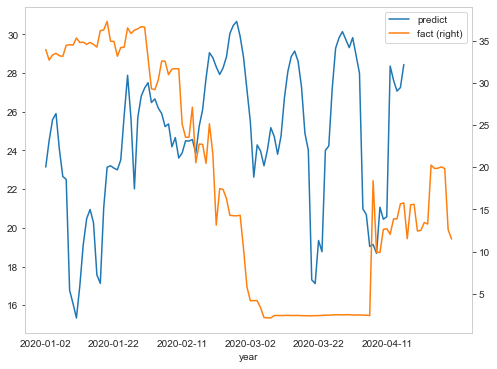

In [64]:
yhat = yhat.flatten() 
Y_traint = Y_traint.flatten()
Y_traint4 = Y_traint[0:120]
datadt4 = datadt[0:120]
import pandas as pd

df = pd.DataFrame(data={'year': datadt4, 
                        'predict': yhat, 
                        'fact': Y_traint4})
import matplotlib.pyplot as plt # Impot the relevant module

fig, ax = plt.subplots() # Create the figure and axes object

# Plot the first x and y axes:
df.plot(x = 'year', y = 'predict', ax = ax) 
# Plot the second x and y axes. By secondary_y = True a second y-axis is requested:
# (see https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.plot.html for details)
df.plot(x = 'year', y = 'fact', ax = ax, secondary_y = True)

In [66]:
#from sklearn.metrics import r2_score
#r2_score(Y_traint4, yhat)

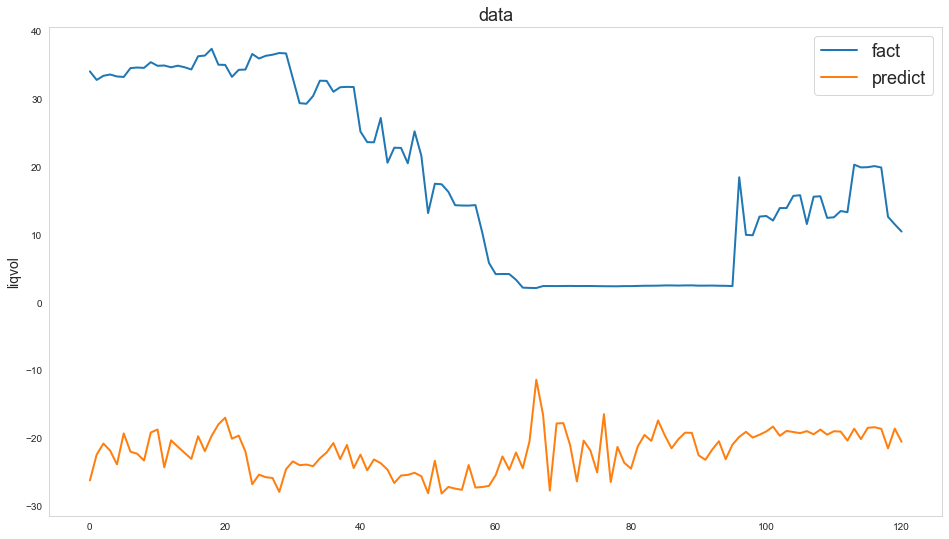

In [354]:
line_plot(Y_traint4, yhat,'fact','predict',  title='data')

In [596]:
# multivariate mlp example
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate
 
# сэмлы
def split_sequences(sequences, n_steps):
	X, y = list(), list()
	for i in range(len(sequences)):
		# разметка
		end_ix = i + n_steps
		# проверка выхода за пределы
		if end_ix > len(sequences):
			break
		# получение начала и конечной метки
		seq_x, seq_y = sequences[i:end_ix, :-1], sequences[end_ix-1, -1]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
# последовательность
in_seq1 = X_left#[365:1231]
in_seq2 = X_right#[365:1231]

out_seq = Y_train #array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1),6))
in_seq2 = in_seq2.reshape((len(in_seq2),5))
out_seq = out_seq.reshape((len(out_seq),1))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
n_steps = 1
# convert into input/output
X,y = split_sequences(dataset, n_steps)

#X_train, X_test, y_train, y_test = train_test_split(
#X, y, test_size=0.10, random_state=42)
#y = 
# разделение данных 
#X1 = X_train[:, :, 0]
#X2 = X_train[:, :, 1]
#X1_test = X_test[:, :, 0]
#X2_test = X_test[:, :, 1]



X1 = X[:, :, 0]
X2 = X[:, :, 1]
#X2_test = X_test[]

# первая модель
visible1 = Input(shape=(n_steps,))
dense1 = Dense(100, activation='relu')(visible1)
# вторая модель
visible2 = Input(shape=(n_steps,))
dense2 = Dense(100, activation='relu')(visible2)
# слияние
merge = concatenate([dense1, dense2])
output = Dense(1)(merge)
model = Model(inputs=[visible1, visible2], outputs=output)
model.compile(optimizer='adam', loss='mse', metrics=['accuracy'])
# fit model
model.fit([X1, X2], Y_train, epochs=2000, verbose= 1, batch_size=64, shuffle = True)

# demonstrate prediction
#x_input = array([[80, 85], [90, 95], [100, 105]])
#x1 = x_input[:, 0].reshape((1, n_steps))
#x2 = x_input[:, 1].reshape((1, n_steps))
yhat = model.predict([X1, X2], verbose=0)
#yhatt = model.predict([X1_test, X2_test], verbose=0)

print(yhat)

Epoch 1/2000
20/20 [==============================] - 0s 947us/step - loss: nan - accuracy: 0.0016
Epoch 2/2000
20/20 [==============================] - 0s 788us/step - loss: nan - accuracy: 0.0011
Epoch 3/2000
20/20 [==============================] - 0s 790us/step - loss: nan - accuracy: 0.0012
Epoch 4/2000
20/20 [==============================] - 0s 737us/step - loss: nan - accuracy: 4.9937e-04
Epoch 5/2000
20/20 [==============================] - 0s 840us/step - loss: nan - accuracy: 4.9627e-04
Epoch 6/2000
20/20 [==============================] - 0s 735us/step - loss: nan - accuracy: 8.3550e-04
Epoch 7/2000
20/20 [==============================] - 0s 897us/step - loss: nan - accuracy: 0.0015
Epoch 8/2000
20/20 [==============================] - 0s 893us/step - loss: nan - accuracy: 0.0013
Epoch 9/2000
20/20 [==============================] - 0s 737us/step - loss: nan - accuracy: 0.0012
Epoch 10/2000
20/20 [==============================] - 0s 789us/step - loss: nan - accuracy: 3.18

20/20 [==============================] - 0s 947us/step - loss: nan - accuracy: 0.0022
Epoch 83/2000
20/20 [==============================] - 0s 842us/step - loss: nan - accuracy: 0.0017
Epoch 84/2000
20/20 [==============================] - 0s 895us/step - loss: nan - accuracy: 0.0014
Epoch 85/2000
20/20 [==============================] - 0s 789us/step - loss: nan - accuracy: 9.0990e-04
Epoch 86/2000
20/20 [==============================] - 0s 842us/step - loss: nan - accuracy: 4.5560e-04
Epoch 87/2000
20/20 [==============================] - 0s 842us/step - loss: nan - accuracy: 0.0024
Epoch 88/2000
20/20 [==============================] - 0s 789us/step - loss: nan - accuracy: 0.0013
Epoch 89/2000
20/20 [==============================] - 0s 842us/step - loss: nan - accuracy: 8.1380e-04
Epoch 90/2000
20/20 [==============================] - 0s 842us/step - loss: nan - accuracy: 9.4571e-04
Epoch 91/2000
20/20 [==============================] - 0s 842us/step - loss: nan - accuracy: 6.486

20/20 [==============================] - 0s 895us/step - loss: nan - accuracy: 0.0025
Epoch 243/2000
20/20 [==============================] - 0s 790us/step - loss: nan - accuracy: 0.0018
Epoch 244/2000
20/20 [==============================] - 0s 844us/step - loss: nan - accuracy: 0.0012
Epoch 245/2000
20/20 [==============================] - 0s 841us/step - loss: nan - accuracy: 0.0017
Epoch 246/2000
20/20 [==============================] - 0s 842us/step - loss: nan - accuracy: 0.0016
Epoch 247/2000
20/20 [==============================] - 0s 895us/step - loss: nan - accuracy: 0.0023
Epoch 248/2000
20/20 [==============================] - 0s 842us/step - loss: nan - accuracy: 8.8864e-04
Epoch 249/2000
20/20 [==============================] - 0s 843us/step - loss: nan - accuracy: 8.5270e-04
Epoch 250/2000
20/20 [==============================] - 0s 842us/step - loss: nan - accuracy: 0.0011
Epoch 251/2000
20/20 [==============================] - 0s 895us/step - loss: nan - accuracy: 0.00

20/20 [==============================] - 0s 893us/step - loss: nan - accuracy: 0.0020
Epoch 403/2000
20/20 [==============================] - 0s 841us/step - loss: nan - accuracy: 4.1426e-04
Epoch 404/2000
20/20 [==============================] - 0s 842us/step - loss: nan - accuracy: 0.0017
Epoch 405/2000
20/20 [==============================] - 0s 947us/step - loss: nan - accuracy: 0.0011
Epoch 406/2000
20/20 [==============================] - 0s 893us/step - loss: nan - accuracy: 0.0024
Epoch 407/2000
20/20 [==============================] - 0s 895us/step - loss: nan - accuracy: 0.0012
Epoch 408/2000
20/20 [==============================] - 0s 844us/step - loss: nan - accuracy: 5.6598e-04
Epoch 409/2000
20/20 [==============================] - 0s 841us/step - loss: nan - accuracy: 0.0033
Epoch 410/2000
20/20 [==============================] - 0s 791us/step - loss: nan - accuracy: 0.0029
Epoch 411/2000
20/20 [==============================] - 0s 895us/step - loss: nan - accuracy: 0.00

20/20 [==============================] - 0s 895us/step - loss: nan - accuracy: 3.1573e-04
Epoch 563/2000
20/20 [==============================] - 0s 842us/step - loss: nan - accuracy: 0.0034
Epoch 564/2000
20/20 [==============================] - 0s 844us/step - loss: nan - accuracy: 0.0028
Epoch 565/2000
20/20 [==============================] - 0s 844us/step - loss: nan - accuracy: 0.0012
Epoch 566/2000
20/20 [==============================] - 0s 842us/step - loss: nan - accuracy: 0.0030
Epoch 567/2000
20/20 [==============================] - 0s 896us/step - loss: nan - accuracy: 0.0039
Epoch 568/2000
20/20 [==============================] - 0s 842us/step - loss: nan - accuracy: 9.4024e-04
Epoch 569/2000
20/20 [==============================] - 0s 842us/step - loss: nan - accuracy: 0.0011
Epoch 570/2000
20/20 [==============================] - 0s 895us/step - loss: nan - accuracy: 0.0039
Epoch 571/2000
20/20 [==============================] - 0s 737us/step - loss: nan - accuracy: 0.00

20/20 [==============================] - 0s 791us/step - loss: nan - accuracy: 0.0019
Epoch 723/2000
20/20 [==============================] - 0s 893us/step - loss: nan - accuracy: 0.0016
Epoch 724/2000
20/20 [==============================] - 0s 842us/step - loss: nan - accuracy: 0.0025
Epoch 725/2000
20/20 [==============================] - 0s 789us/step - loss: nan - accuracy: 8.2100e-04
Epoch 726/2000
20/20 [==============================] - 0s 895us/step - loss: nan - accuracy: 3.1816e-04
Epoch 727/2000
20/20 [==============================] - 0s 895us/step - loss: nan - accuracy: 8.8864e-04
Epoch 728/2000
20/20 [==============================] - 0s 895us/step - loss: nan - accuracy: 0.0021
Epoch 729/2000
20/20 [==============================] - 0s 892us/step - loss: nan - accuracy: 0.0029
Epoch 730/2000
20/20 [==============================] - 0s 895us/step - loss: nan - accuracy: 0.0022
Epoch 731/2000
20/20 [==============================] - 0s 844us/step - loss: nan - accuracy: 

20/20 [==============================] - 0s 896us/step - loss: nan - accuracy: 0.0015
Epoch 883/2000
20/20 [==============================] - 0s 842us/step - loss: nan - accuracy: 9.0990e-04
Epoch 884/2000
20/20 [==============================] - 0s 895us/step - loss: nan - accuracy: 7.1825e-04
Epoch 885/2000
20/20 [==============================] - 0s 842us/step - loss: nan - accuracy: 0.0012
Epoch 886/2000
20/20 [==============================] - 0s 893us/step - loss: nan - accuracy: 0.0012
Epoch 887/2000
20/20 [==============================] - 0s 895us/step - loss: nan - accuracy: 0.0014
Epoch 888/2000
20/20 [==============================] - 0s 842us/step - loss: nan - accuracy: 0.0012
Epoch 889/2000
20/20 [==============================] - 0s 842us/step - loss: nan - accuracy: 8.6030e-04
Epoch 890/2000
20/20 [==============================] - 0s 841us/step - loss: nan - accuracy: 0.0034
Epoch 891/2000
20/20 [==============================] - 0s 842us/step - loss: nan - accuracy: 

20/20 [==============================] - 0s 790us/step - loss: nan - accuracy: 9.0437e-04
Epoch 1042/2000
20/20 [==============================] - 0s 895us/step - loss: nan - accuracy: 0.0033
Epoch 1043/2000
20/20 [==============================] - 0s 842us/step - loss: nan - accuracy: 4.6741e-04
Epoch 1044/2000
20/20 [==============================] - 0s 789us/step - loss: nan - accuracy: 0.0014
Epoch 1045/2000
20/20 [==============================] - 0s 842us/step - loss: nan - accuracy: 0.0024
Epoch 1046/2000
20/20 [==============================] - 0s 897us/step - loss: nan - accuracy: 0.0015
Epoch 1047/2000
20/20 [==============================] - 0s 895us/step - loss: nan - accuracy: 0.0015
Epoch 1048/2000
20/20 [==============================] - 0s 842us/step - loss: nan - accuracy: 0.0018
Epoch 1049/2000
20/20 [==============================] - 0s 893us/step - loss: nan - accuracy: 0.0024
Epoch 1050/2000
20/20 [==============================] - 0s 895us/step - loss: nan - accur

20/20 [==============================] - 0s 842us/step - loss: nan - accuracy: 0.0017
Epoch 1121/2000
20/20 [==============================] - 0s 789us/step - loss: nan - accuracy: 3.6466e-04
Epoch 1122/2000
20/20 [==============================] - 0s 789us/step - loss: nan - accuracy: 0.0022
Epoch 1123/2000
20/20 [==============================] - 0s 789us/step - loss: nan - accuracy: 0.0024
Epoch 1124/2000
20/20 [==============================] - 0s 789us/step - loss: nan - accuracy: 0.0036
Epoch 1125/2000
20/20 [==============================] - 0s 842us/step - loss: nan - accuracy: 0.0014
Epoch 1126/2000
20/20 [==============================] - 0s 789us/step - loss: nan - accuracy: 0.0029
Epoch 1127/2000
20/20 [==============================] - 0s 737us/step - loss: nan - accuracy: 0.0032
Epoch 1128/2000
20/20 [==============================] - 0s 737us/step - loss: nan - accuracy: 7.3939e-04
Epoch 1129/2000
20/20 [==============================] - 0s 842us/step - loss: nan - accur

20/20 [==============================] - 0s 893us/step - loss: nan - accuracy: 8.2100e-04
Epoch 1279/2000
20/20 [==============================] - 0s 843us/step - loss: nan - accuracy: 0.0020
Epoch 1280/2000
20/20 [==============================] - 0s 893us/step - loss: nan - accuracy: 0.0032
Epoch 1281/2000
20/20 [==============================] - 0s 790us/step - loss: nan - accuracy: 8.8864e-04
Epoch 1282/2000
20/20 [==============================] - 0s 764us/step - loss: nan - accuracy: 0.0025
Epoch 1283/2000
20/20 [==============================] - 0s 842us/step - loss: nan - accuracy: 0.0025
Epoch 1284/2000
20/20 [==============================] - 0s 790us/step - loss: nan - accuracy: 0.0035
Epoch 1285/2000
20/20 [==============================] - 0s 895us/step - loss: nan - accuracy: 0.0013
Epoch 1286/2000
20/20 [==============================] - 0s 789us/step - loss: nan - accuracy: 9.8947e-04
Epoch 1287/2000
20/20 [==============================] - 0s 866us/step - loss: nan - a

20/20 [==============================] - 0s 842us/step - loss: nan - accuracy: 9.0437e-04
Epoch 1437/2000
20/20 [==============================] - 0s 842us/step - loss: nan - accuracy: 0.0022
Epoch 1438/2000
20/20 [==============================] - 0s 841us/step - loss: nan - accuracy: 0.0013
Epoch 1439/2000
20/20 [==============================] - 0s 840us/step - loss: nan - accuracy: 0.0018
Epoch 1440/2000
20/20 [==============================] - 0s 844us/step - loss: nan - accuracy: 0.0014
Epoch 1441/2000
20/20 [==============================] - 0s 789us/step - loss: nan - accuracy: 0.0020
Epoch 1442/2000
20/20 [==============================] - 0s 837us/step - loss: nan - accuracy: 0.0010
Epoch 1443/2000
20/20 [==============================] - 0s 791us/step - loss: nan - accuracy: 0.0020
Epoch 1444/2000
20/20 [==============================] - 0s 842us/step - loss: nan - accuracy: 0.0020
Epoch 1445/2000
20/20 [==============================] - 0s 843us/step - loss: nan - accuracy:

20/20 [==============================] - 0s 844us/step - loss: nan - accuracy: 0.0016
Epoch 1595/2000
20/20 [==============================] - 0s 790us/step - loss: nan - accuracy: 0.0021
Epoch 1596/2000
20/20 [==============================] - 0s 842us/step - loss: nan - accuracy: 0.0015
Epoch 1597/2000
20/20 [==============================] - 0s 737us/step - loss: nan - accuracy: 0.0013
Epoch 1598/2000
20/20 [==============================] - 0s 791us/step - loss: nan - accuracy: 0.0011
Epoch 1599/2000
20/20 [==============================] - 0s 852us/step - loss: nan - accuracy: 9.6305e-04
Epoch 1600/2000
20/20 [==============================] - 0s 842us/step - loss: nan - accuracy: 5.4587e-04
Epoch 1601/2000
20/20 [==============================] - 0s 842us/step - loss: nan - accuracy: 0.0016
Epoch 1602/2000
20/20 [==============================] - 0s 842us/step - loss: nan - accuracy: 0.0021
Epoch 1603/2000
20/20 [==============================] - 0s 842us/step - loss: nan - accur

20/20 [==============================] - 0s 810us/step - loss: nan - accuracy: 0.0021
Epoch 1753/2000
20/20 [==============================] - 0s 765us/step - loss: nan - accuracy: 0.0030
Epoch 1754/2000
20/20 [==============================] - 0s 737us/step - loss: nan - accuracy: 6.4862e-04
Epoch 1755/2000
20/20 [==============================] - 0s 788us/step - loss: nan - accuracy: 0.0031
Epoch 1756/2000
20/20 [==============================] - 0s 818us/step - loss: nan - accuracy: 0.0029
Epoch 1757/2000
20/20 [==============================] - 0s 719us/step - loss: nan - accuracy: 0.0013
Epoch 1758/2000
20/20 [==============================] - 0s 738us/step - loss: nan - accuracy: 5.2464e-04
Epoch 1759/2000
20/20 [==============================] - 0s 734us/step - loss: nan - accuracy: 0.0029
Epoch 1760/2000
20/20 [==============================] - 0s 817us/step - loss: nan - accuracy: 6.0975e-04
Epoch 1761/2000
20/20 [==============================] - 0s 876us/step - loss: nan - a

20/20 [==============================] - 0s 849us/step - loss: nan - accuracy: 7.7003e-04
Epoch 1911/2000
20/20 [==============================] - 0s 767us/step - loss: nan - accuracy: 0.0022
Epoch 1912/2000
20/20 [==============================] - 0s 790us/step - loss: nan - accuracy: 6.4862e-04
Epoch 1913/2000
20/20 [==============================] - 0s 737us/step - loss: nan - accuracy: 0.0026
Epoch 1914/2000
20/20 [==============================] - 0s 817us/step - loss: nan - accuracy: 0.0034
Epoch 1915/2000
20/20 [==============================] - 0s 737us/step - loss: nan - accuracy: 8.1623e-04
Epoch 1916/2000
20/20 [==============================] - 0s 768us/step - loss: nan - accuracy: 0.0031
Epoch 1917/2000
20/20 [==============================] - 0s 785us/step - loss: nan - accuracy: 0.0022
Epoch 1918/2000
20/20 [==============================] - 0s 737us/step - loss: nan - accuracy: 0.0031
Epoch 1919/2000
20/20 [==============================] - 0s 896us/step - loss: nan - a

In [524]:
yhatt = model.predict([X1_test, X2_test], verbose=0)
print(yhatt)


[[nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]]


In [413]:
yhat.shape

(1231, 1)

In [391]:
X1_test

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [300]:
traindd, testdd = train_test_split(data, test_size=0.1)

In [550]:
def line_plot(line2, line1, label1=None, label2=None, title='', lw=2):
    fig, ax = plt.subplots(1, figsize=(16, 9))
    ax.plot(line1, label=label1, linewidth=lw)
    ax.plot(line2, label=label2, linewidth=lw)
    
    ax.set_ylabel('liqvol', fontsize=14)
    ax.set_title(title, fontsize=18)
    ax.legend(loc='best', fontsize=18);

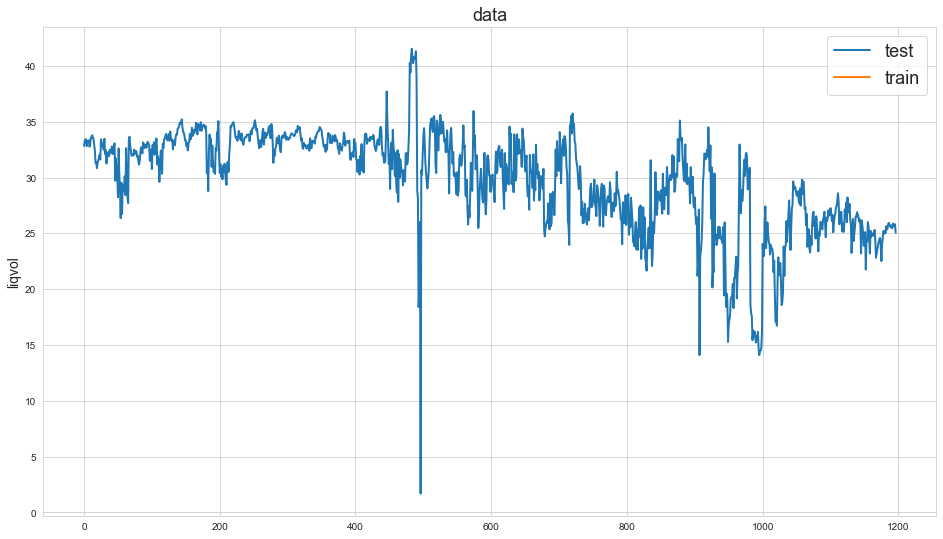

In [584]:
line_plot(yhatt, yhat, 'test','train', title='data')

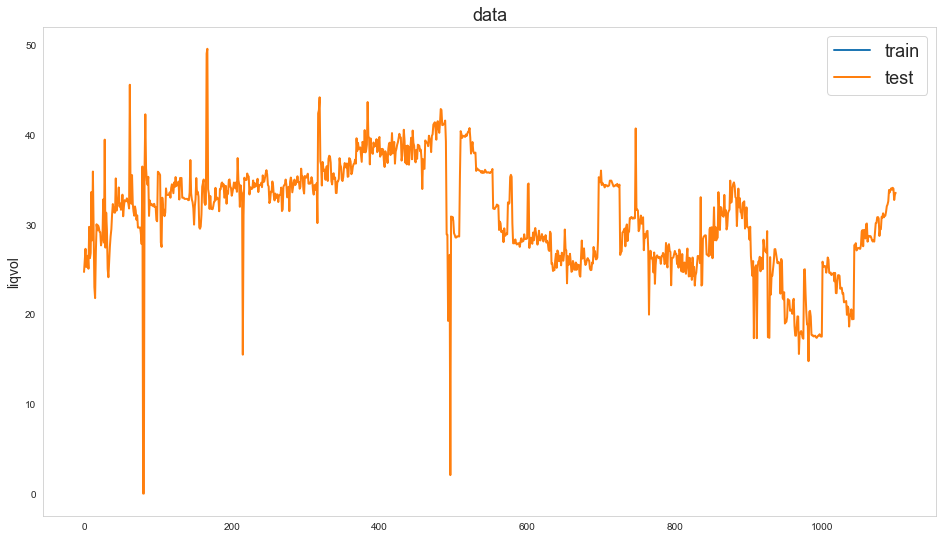

In [492]:
line_plot(yhat,Y_train[0:1100], 'train', 'test', title='data')

In [470]:
Y_train1 =  Y_train[0:1100]

In [187]:
yhat = model.predict([X1_rain, X2_train], verbose=0)

In [419]:
yhat = yhat.flatten() 
Y_train = Y_train.flatten() 

In [193]:
yhat = yhat#[0:866]
Y_train = Y_train#[0:866]
y_test.shape
datadd=yhatt[0:400]


In [353]:
def line_plot(line1, line2, label1=None, label2=None, title='', lw=2):
    fig, ax = plt.subplots(1, figsize=(16, 9))
    ax.plot(line1, label=label1, linewidth=lw)
    ax.plot(line2, label=label2, linewidth=lw)
    ax.set_ylabel('liqvol', fontsize=14)
    ax.set_title(title, fontsize=18)
    ax.legend(loc='best', fontsize=18);

In [516]:
Y_trainr = data['AKSH_298_liq_vol']

In [514]:
Y_trainr = Y_trainr[0:1100]

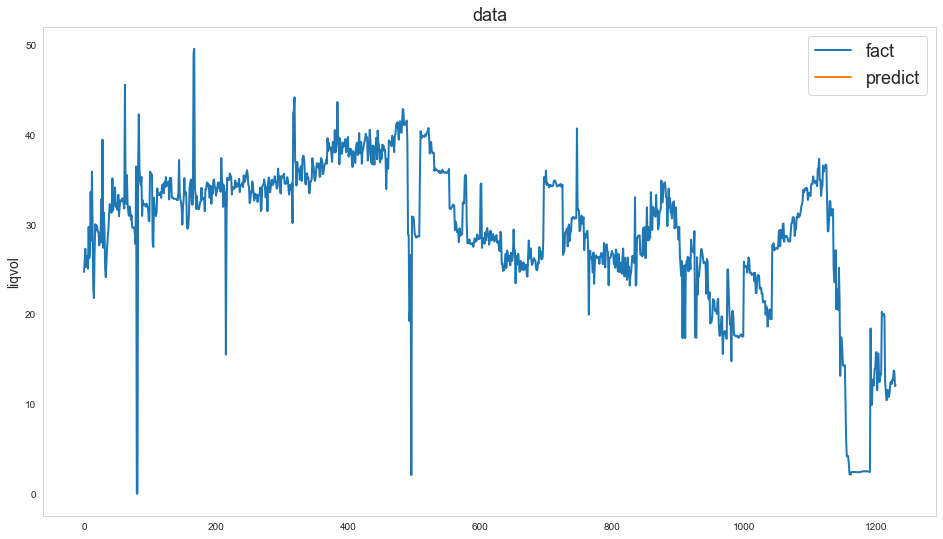

In [518]:
line_plot(Y_trainr, yhat,'fact','predict',  title='data')

In [504]:
Y_train2 = data['AKSH_298_liq_vol']

In [506]:
import numpy as np
import pandas as pd
import scipy.sparse as sparse

In [511]:
arr = yhat
Y_train2['predict'] = arr.tolist()

<ipython-input-511-f5244cf15467>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_train2['predict'] = arr.tolist()


In [ ]:
df['newcol'] = arr.toarray().tolist()

In [198]:
Y_train.shape

(1231,)

<AxesSubplot:label='414a9da1-36af-4eaf-bcb5-e0ffa16e7ba6'>

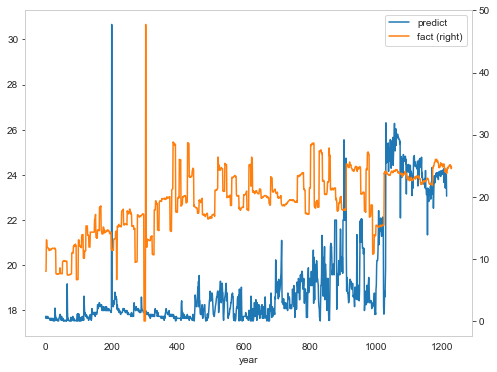

In [195]:
import matplotlib.pyplot as plt # Impot the relevant module


fig, ax = plt.subplots() # Create the figure and axes object

# Plot the first x and y axes:
df.plot(x = 'year', y = 'predict', ax = ax) 
# Plot the second x and y axes. By secondary_y = True a second y-axis is requested:
# (see https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.plot.html for details)
df.plot(x = 'year', y = 'fact', ax = ax, secondary_y = True)

In [673]:
from sklearn.metrics import r2_score
r2_score(Y_train, yhat)

0.2514491004274705

In [674]:
from sklearn.metrics import mean_squared_error
mean_squared_error(Y_train, yhat)

19.546915882855764

In [716]:
datadd = data2.index

In [569]:
# multivariate mlp example
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate
 
# сэмлы
def split_sequences(sequences, n_steps):
	X, y = list(), list()
	for i in range(len(sequences)):
		# разметка
		end_ix = i + n_steps
		# проверка выхода за пределы
		if end_ix > len(sequences):
			break
		# получение начала и конечной метки
		seq_x, seq_y = sequences[i:end_ix, :-1], sequences[end_ix-1, -1]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
# последовательность
in_seq1 = X_left#[365:1231]
in_seq2 = X_right#[365:1231]

out_seq = Y_train #array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1),6))
in_seq2 = in_seq2.reshape((len(in_seq2),5))
out_seq = out_seq.reshape((len(out_seq),1))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
n_steps = 20
# convert into input/output
X,y = split_sequences(dataset, n_steps)
#y = 
# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]
# первая модель
visible1 = Input(shape=(n_steps,))
dense1 = Dense(100, activation='relu')(visible1)
# вторая модель
visible2 = Input(shape=(n_steps,))
dense2 = Dense(100, activation='relu')(visible2)
# слияние
merge = concatenate([dense1, dense2])
output = Dense(1)(merge)
model = Model(inputs=[visible1, visible2], outputs=output)
model.compile(optimizer='adam', loss='mse', metrics=['accuracy'])
# fit model
model.fit([X1, X2], Y_train, epochs=2000, verbose= 1, batch_size=64, validation_split=0.1)
# demonstrate prediction
#x_input = array([[80, 85], [90, 95], [100, 105]])
#x1 = x_input[:, 0].reshape((1, n_steps))
#x2 = x_input[:, 1].reshape((1, n_steps))
yhat = model.predict([X1, X2], verbose=0)
print(yhat)

Epoch 1/2000
18/18 [==============================] - 0s 10ms/step - loss: 1303.5431 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 2/2000
18/18 [==============================] - 0s 3ms/step - loss: 322.1409 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 3/2000
18/18 [==============================] - 0s 3ms/step - loss: 131.8797 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 4/2000
18/18 [==============================] - 0s 3ms/step - loss: 99.1367 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 5/2000
18/18 [==============================] - 0s 3ms/step - loss: 83.5330 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 6/2000
18/18 [==============================] - 0s 3ms/step - loss: 81.2963 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 7/2000
18/18 [==============================] - 0s 3ms/step - loss: 78.6915 - accuracy: 0.0000e+00 - 

18/18 [==============================] - 0s 3ms/step - loss: 41.6187 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 57/2000
18/18 [==============================] - 0s 3ms/step - loss: 40.9451 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 58/2000
18/18 [==============================] - 0s 3ms/step - loss: 42.5111 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 59/2000
18/18 [==============================] - 0s 3ms/step - loss: 41.0308 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 60/2000
18/18 [==============================] - 0s 3ms/step - loss: 41.6594 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 61/2000
18/18 [==============================] - 0s 3ms/step - loss: 39.9968 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 62/2000
18/18 [==============================] - 0s 3ms/step - loss: 41.4708 - accuracy: 0.0000e+00 - val_loss: na

Epoch 111/2000
18/18 [==============================] - 0s 3ms/step - loss: 39.7363 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 112/2000
18/18 [==============================] - 0s 3ms/step - loss: 31.7781 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 113/2000
18/18 [==============================] - 0s 3ms/step - loss: 32.4256 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 114/2000
18/18 [==============================] - 0s 3ms/step - loss: 34.5564 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 115/2000
18/18 [==============================] - 0s 3ms/step - loss: 52.7672 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 116/2000
18/18 [==============================] - 0s 3ms/step - loss: 52.0771 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 117/2000
18/18 [==============================] - 0s 3ms/step - loss: 40.1541 - accuracy: 0.00

18/18 [==============================] - 0s 3ms/step - loss: 29.1135 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 220/2000
18/18 [==============================] - 0s 3ms/step - loss: 25.4788 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 221/2000
18/18 [==============================] - 0s 3ms/step - loss: 25.3852 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 222/2000
18/18 [==============================] - 0s 3ms/step - loss: 24.3541 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 223/2000
18/18 [==============================] - 0s 3ms/step - loss: 27.8475 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 224/2000
18/18 [==============================] - 0s 3ms/step - loss: 25.4219 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 225/2000
18/18 [==============================] - 0s 3ms/step - loss: 33.8240 - accuracy: 0.0000e+00 - val_lo

Epoch 274/2000
18/18 [==============================] - 0s 3ms/step - loss: 25.8128 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 275/2000
18/18 [==============================] - 0s 3ms/step - loss: 23.5524 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 276/2000
18/18 [==============================] - 0s 3ms/step - loss: 25.8783 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 277/2000
18/18 [==============================] - 0s 3ms/step - loss: 36.1473 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 278/2000
18/18 [==============================] - 0s 3ms/step - loss: 27.7728 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 279/2000
18/18 [==============================] - 0s 3ms/step - loss: 29.7072 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 280/2000
18/18 [==============================] - 0s 3ms/step - loss: 26.0433 - accuracy: 0.00

Epoch 383/2000
18/18 [==============================] - 0s 3ms/step - loss: 39.2537 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 384/2000
18/18 [==============================] - 0s 3ms/step - loss: 32.0083 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 385/2000
18/18 [==============================] - 0s 3ms/step - loss: 22.9648 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 386/2000
18/18 [==============================] - 0s 3ms/step - loss: 26.2626 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 387/2000
18/18 [==============================] - 0s 3ms/step - loss: 23.0833 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 388/2000
18/18 [==============================] - 0s 3ms/step - loss: 22.3659 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 389/2000
18/18 [==============================] - 0s 3ms/step - loss: 24.4023 - accuracy: 0.00

Epoch 492/2000
18/18 [==============================] - 0s 3ms/step - loss: 19.6299 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 493/2000
18/18 [==============================] - 0s 3ms/step - loss: 21.5435 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 494/2000
18/18 [==============================] - 0s 3ms/step - loss: 19.8009 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 495/2000
18/18 [==============================] - 0s 3ms/step - loss: 20.2788 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 496/2000
18/18 [==============================] - 0s 3ms/step - loss: 23.3669 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 497/2000
18/18 [==============================] - 0s 3ms/step - loss: 27.8602 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 498/2000
18/18 [==============================] - 0s 3ms/step - loss: 20.5056 - accuracy: 0.00

Epoch 601/2000
18/18 [==============================] - 0s 3ms/step - loss: 32.4121 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 602/2000
18/18 [==============================] - 0s 3ms/step - loss: 29.8522 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 603/2000
18/18 [==============================] - 0s 3ms/step - loss: 21.0600 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 604/2000
18/18 [==============================] - 0s 3ms/step - loss: 21.5946 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 605/2000
18/18 [==============================] - 0s 3ms/step - loss: 21.9692 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 606/2000
18/18 [==============================] - 0s 3ms/step - loss: 20.3731 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 607/2000
18/18 [==============================] - 0s 3ms/step - loss: 22.3666 - accuracy: 0.00

Epoch 710/2000
18/18 [==============================] - 0s 3ms/step - loss: 29.4721 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 711/2000
18/18 [==============================] - 0s 3ms/step - loss: 28.9743 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 712/2000
18/18 [==============================] - 0s 3ms/step - loss: 21.0540 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 713/2000
18/18 [==============================] - 0s 3ms/step - loss: 22.6096 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 714/2000
18/18 [==============================] - 0s 3ms/step - loss: 21.7795 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 715/2000
18/18 [==============================] - 0s 3ms/step - loss: 23.9598 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 716/2000
18/18 [==============================] - 0s 3ms/step - loss: 22.9956 - accuracy: 0.00

Epoch 819/2000
18/18 [==============================] - 0s 3ms/step - loss: 18.1403 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 820/2000
18/18 [==============================] - 0s 3ms/step - loss: 24.8200 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 821/2000
18/18 [==============================] - 0s 3ms/step - loss: 21.7281 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 822/2000
18/18 [==============================] - 0s 3ms/step - loss: 34.2679 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 823/2000
18/18 [==============================] - 0s 3ms/step - loss: 23.2980 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 824/2000
18/18 [==============================] - 0s 3ms/step - loss: 23.0721 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 825/2000
18/18 [==============================] - 0s 3ms/step - loss: 20.7738 - accuracy: 0.00

Epoch 928/2000
18/18 [==============================] - 0s 3ms/step - loss: 20.0184 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 929/2000
18/18 [==============================] - 0s 3ms/step - loss: 21.9210 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 930/2000
18/18 [==============================] - 0s 3ms/step - loss: 20.5932 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 931/2000
18/18 [==============================] - 0s 3ms/step - loss: 25.0369 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 932/2000
18/18 [==============================] - 0s 3ms/step - loss: 20.4044 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 933/2000
18/18 [==============================] - 0s 3ms/step - loss: 20.4198 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 934/2000
18/18 [==============================] - 0s 3ms/step - loss: 21.2039 - accuracy: 0.00

18/18 [==============================] - 0s 3ms/step - loss: 20.6159 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1037/2000
18/18 [==============================] - 0s 3ms/step - loss: 17.1432 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1038/2000
18/18 [==============================] - 0s 3ms/step - loss: 20.1116 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1039/2000
18/18 [==============================] - 0s 3ms/step - loss: 20.6836 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1040/2000
18/18 [==============================] - 0s 3ms/step - loss: 21.1184 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1041/2000
18/18 [==============================] - 0s 3ms/step - loss: 20.8527 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1042/2000
18/18 [==============================] - 0s 3ms/step - loss: 19.5500 - accuracy: 0.0000e+00 - 

18/18 [==============================] - 0s 3ms/step - loss: 20.6923 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1145/2000
18/18 [==============================] - 0s 3ms/step - loss: 17.8108 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1146/2000
18/18 [==============================] - 0s 3ms/step - loss: 19.3784 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1147/2000
18/18 [==============================] - 0s 3ms/step - loss: 19.1419 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1148/2000
18/18 [==============================] - 0s 3ms/step - loss: 21.9385 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1149/2000
18/18 [==============================] - 0s 3ms/step - loss: 18.5565 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1150/2000
18/18 [==============================] - 0s 3ms/step - loss: 19.0779 - accuracy: 0.0000e+00 - 

18/18 [==============================] - 0s 3ms/step - loss: 19.8675 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1253/2000
18/18 [==============================] - 0s 3ms/step - loss: 21.4860 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1254/2000
18/18 [==============================] - 0s 3ms/step - loss: 20.9084 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1255/2000
18/18 [==============================] - 0s 3ms/step - loss: 19.7057 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1256/2000
18/18 [==============================] - 0s 3ms/step - loss: 20.6082 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1257/2000
18/18 [==============================] - 0s 3ms/step - loss: 18.7008 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1258/2000
18/18 [==============================] - 0s 3ms/step - loss: 19.7730 - accuracy: 0.0000e+00 - 

18/18 [==============================] - 0s 3ms/step - loss: 23.2728 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1361/2000
18/18 [==============================] - 0s 3ms/step - loss: 17.6004 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1362/2000
18/18 [==============================] - 0s 3ms/step - loss: 19.2642 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1363/2000
18/18 [==============================] - 0s 3ms/step - loss: 18.1865 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1364/2000
18/18 [==============================] - 0s 3ms/step - loss: 17.9896 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1365/2000
18/18 [==============================] - 0s 3ms/step - loss: 21.3736 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1366/2000
18/18 [==============================] - 0s 3ms/step - loss: 16.8640 - accuracy: 0.0000e+00 - 

18/18 [==============================] - 0s 3ms/step - loss: 16.6329 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1469/2000
18/18 [==============================] - 0s 3ms/step - loss: 22.2507 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1470/2000
18/18 [==============================] - 0s 3ms/step - loss: 22.5371 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1471/2000
18/18 [==============================] - 0s 3ms/step - loss: 23.9831 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1472/2000
18/18 [==============================] - 0s 3ms/step - loss: 21.3537 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1473/2000
18/18 [==============================] - 0s 3ms/step - loss: 18.5794 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1474/2000
18/18 [==============================] - 0s 3ms/step - loss: 21.9105 - accuracy: 0.0000e+00 - 

18/18 [==============================] - 0s 3ms/step - loss: 18.2369 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1577/2000
18/18 [==============================] - 0s 3ms/step - loss: 17.9752 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1578/2000
18/18 [==============================] - 0s 3ms/step - loss: 19.9053 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1579/2000
18/18 [==============================] - 0s 3ms/step - loss: 23.5162 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1580/2000
18/18 [==============================] - 0s 3ms/step - loss: 20.7599 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1581/2000
18/18 [==============================] - 0s 3ms/step - loss: 19.8642 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1582/2000
18/18 [==============================] - 0s 3ms/step - loss: 36.6551 - accuracy: 0.0000e+00 - 

18/18 [==============================] - 0s 3ms/step - loss: 17.9092 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1685/2000
18/18 [==============================] - 0s 3ms/step - loss: 16.9872 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1686/2000
18/18 [==============================] - 0s 3ms/step - loss: 15.6761 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1687/2000
18/18 [==============================] - 0s 3ms/step - loss: 25.2641 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1688/2000
18/18 [==============================] - 0s 3ms/step - loss: 22.7813 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1689/2000
18/18 [==============================] - 0s 3ms/step - loss: 20.0861 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1690/2000
18/18 [==============================] - 0s 3ms/step - loss: 19.6694 - accuracy: 0.0000e+00 - 

18/18 [==============================] - 0s 3ms/step - loss: 20.5041 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1793/2000
18/18 [==============================] - 0s 3ms/step - loss: 19.1202 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1794/2000
18/18 [==============================] - 0s 3ms/step - loss: 20.0326 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1795/2000
18/18 [==============================] - 0s 3ms/step - loss: 16.6766 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1796/2000
18/18 [==============================] - 0s 3ms/step - loss: 21.0978 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1797/2000
18/18 [==============================] - 0s 3ms/step - loss: 19.5807 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1798/2000
18/18 [==============================] - 0s 3ms/step - loss: 19.1538 - accuracy: 0.0000e+00 - 

18/18 [==============================] - 0s 3ms/step - loss: 17.8303 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1901/2000
18/18 [==============================] - 0s 3ms/step - loss: 20.2866 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1902/2000
18/18 [==============================] - 0s 3ms/step - loss: 19.1912 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1903/2000
18/18 [==============================] - 0s 3ms/step - loss: 16.7735 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1904/2000
18/18 [==============================] - 0s 3ms/step - loss: 20.8578 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1905/2000
18/18 [==============================] - 0s 3ms/step - loss: 22.4678 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1906/2000
18/18 [==============================] - 0s 3ms/step - loss: 16.7796 - accuracy: 0.0000e+00 - 

In [74]:
yhat = yhat.flatten() 
Y_train = Y_train.flatten() 

In [75]:
Y_train = Y_train#[0:866]
yhat = Y_train#[0:866]

In [77]:
datadd = data.index
#datadd = features.index 
datadd = datadd.to_numpy()

df = pd.DataFrame(data={'year': datadd, 
                        'predict': yhat, 
                        'fact': Y_train})

<AxesSubplot:label='59b60c0b-3981-4338-a70b-82ec15873a77'>

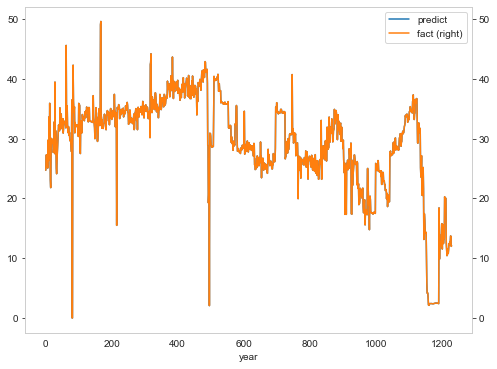

In [78]:
import matplotlib.pyplot as plt # Impot the relevant module


fig, ax = plt.subplots() # Create the figure and axes object

# Plot the first x and y axes:
df.plot(x = 'year', y = 'predict', ax = ax) 
# Plot the second x and y axes. By secondary_y = True a second y-axis is requested:
# (see https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.plot.html for details)
df.plot(x = 'year', y = 'fact', ax = ax, secondary_y = True)

In [79]:
from sklearn.metrics import r2_score
r2_score(Y_train, yhat)

1.0

In [80]:
from sklearn.metrics import mean_squared_error
mean_squared_error(Y_train, yhat)

0.0

# LIQ-VOL213

In [67]:
#features2s =[features_considered_south2] 
#features2 = datan['AKSH_424_water_vol','AKSH_249_water_vol','AKSH_247_water_vol','AKSH_250_water_vol','AKSH_424_water_vol','AKSH_214_water_vol']
#X_left = features2 #data2['AKSH_298_bhp_pump_press','AKSH_213_bhp_pump_press','AKSH_203_bhp_pump_press','AKSH_223_bhp_pump_press','AKSH_226_bhp_pump_press']

X_left = dataws #= data[features_considered_south1]
#X_left = data2[features2]


X_left = X_left.shift(-15)

X_left = dataws #= data[features_considered_south1]
#X_left = data2[features2]
X_right = data[features_considered_south2]
Y_train = data['AKSH_213_liq_vol']#,'AKSH_226_liq_vol'] 
X_left = np.asarray(X_left)
X_right = np.asarray(X_right) 
Y_train = np.asarray(Y_train) 

In [68]:
X_leftl = X_left[(data.index < '2020-01-01')]
X_rightl = X_right[(data.index < '2020-01-01')]
Y_trainl = Y_train[(data.index < '2020-01-01')]#,'AKSH_226_liq_vol'] 


X_leftt = X_left[(data.index > '2020-01-01')]
X_rightt = X_right[(data.index > '2020-01-01')]
Y_traint = Y_train[(data.index > '2020-01-01')]#,'AKSH_226_liq_vol'] 

datadd = data.index
datadt = datadd[(data.index > '2020-01-01')]
datadl = datadd[(data.index < '2020-01-01')]


X_left = np.asarray(X_left)
X_right = np.asarray(X_right) 
Y_train = np.asarray(Y_train)
X_leftl = np.asarray(X_leftl)
X_rightl = np.asarray(X_rightl) 
Y_trainl = np.asarray(Y_trainl)
X_leftt = np.asarray(X_leftt)
X_rightt = np.asarray(X_rightt) 
Y_traint = np.asarray(Y_traint)

In [69]:
# multivariate mlp example
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate
 
# сэмлы
def split_sequences(sequences, n_steps):
	X, y = list(), list()
	for i in range(len(sequences)):
		# разметка
		end_ix = i + n_steps
		# проверка выхода за пределы
		if end_ix > len(sequences):
			break
		# получение начала и конечной метки
		seq_x, seq_y = sequences[i:end_ix, :-1], sequences[end_ix-1, -1]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
# последовательность
in_seq1 = X_leftl
in_seq2 = X_rightl

out_seq = Y_trainl #array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1),6))
in_seq2 = in_seq2.reshape((len(in_seq2),5))
out_seq = out_seq.reshape((len(out_seq),1))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
n_steps = 15
# convert into input/output
X,y = split_sequences(dataset, n_steps)
#y = 
# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]
# первая модель
visible1 = Input(shape=(n_steps,))
dense1 = Dense(100, activation='relu')(visible1)
dense21 = Dense(10, activation='relu')(dense1)
# вторая модель
visible2 = Input(shape=(n_steps,))
dense2 = Dense(100, activation='relu')(visible2)
dense22 = Dense(10, activation='relu')(dense2)
# слияние
# слияние
merge = concatenate([dense1, dense2])
output = Dense(1)(merge)
model = Model(inputs=[visible1, visible2], outputs=output)
model.compile(optimizer='adam', loss='mse', metrics=['accuracy'])
# fit model
model.fit([X1, X2], Y_trainl, epochs=2000, verbose= 1, batch_size=64, validation_split=0.1)
# demonstrate prediction
#x_input = array([[80, 85], [90, 95], [100, 105]])
#x1 = x_input[:, 0].reshape((1, n_steps))
#x2 = x_input[:, 1].reshape((1, n_steps))

 
# последовательность
in_seq1t = X_leftt
in_seq2t = X_rightt

out_seqt = Y_traint #array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1t = in_seq1.reshape((len(in_seq1),6))
in_seq2t = in_seq2.reshape((len(in_seq2),5))
out_seqt = out_seq.reshape((len(out_seq),1))
# горизонтальное последовательное размещение данных 
datasett = hstack((in_seq1t, in_seq2t, out_seqt))
# таймстепы
n_steps = 15
# convert into input/output
Xt,yt = split_sequences(datasett, n_steps)
X1t = Xt[:, :, 0]
X2t = Xt[:, :, 1]
yhatt = model.predict([X1t, X2t], verbose=0)
print(yhatt)

Epoch 1/2000
11/11 [==============================] - 0s 16ms/step - loss: 3315.0581 - accuracy: 0.0000e+00 - val_loss: 14068.9775 - val_accuracy: 0.0000e+00
Epoch 2/2000
11/11 [==============================] - 0s 4ms/step - loss: 507.6340 - accuracy: 0.0000e+00 - val_loss: 26661.1797 - val_accuracy: 0.0000e+00
Epoch 3/2000
11/11 [==============================] - 0s 4ms/step - loss: 366.4358 - accuracy: 0.0000e+00 - val_loss: 17294.1211 - val_accuracy: 0.0000e+00
Epoch 4/2000
11/11 [==============================] - 0s 4ms/step - loss: 279.6558 - accuracy: 0.0000e+00 - val_loss: 14630.6162 - val_accuracy: 0.0000e+00
Epoch 5/2000
11/11 [==============================] - 0s 4ms/step - loss: 227.8593 - accuracy: 0.0000e+00 - val_loss: 16460.4629 - val_accuracy: 0.0000e+00
Epoch 6/2000
11/11 [==============================] - 0s 4ms/step - loss: 220.5770 - accuracy: 0.0000e+00 - val_loss: 19456.9609 - val_accuracy: 0.0000e+00
Epoch 7/2000
11/11 [==============================] - 0s 4ms/s

11/11 [==============================] - 0s 4ms/step - loss: 151.4930 - accuracy: 0.0000e+00 - val_loss: 1708.6844 - val_accuracy: 0.0000e+00
Epoch 106/2000
11/11 [==============================] - 0s 4ms/step - loss: 136.8337 - accuracy: 0.0000e+00 - val_loss: 1859.8368 - val_accuracy: 0.0000e+00
Epoch 107/2000
11/11 [==============================] - 0s 4ms/step - loss: 138.0915 - accuracy: 0.0000e+00 - val_loss: 1782.7323 - val_accuracy: 0.0000e+00
Epoch 108/2000
11/11 [==============================] - 0s 4ms/step - loss: 147.4670 - accuracy: 0.0000e+00 - val_loss: 2259.6028 - val_accuracy: 0.0000e+00
Epoch 109/2000
11/11 [==============================] - 0s 5ms/step - loss: 152.5735 - accuracy: 0.0000e+00 - val_loss: 2149.6316 - val_accuracy: 0.0000e+00
Epoch 110/2000
11/11 [==============================] - 0s 4ms/step - loss: 141.1986 - accuracy: 0.0000e+00 - val_loss: 2077.5132 - val_accuracy: 0.0000e+00
Epoch 111/2000
11/11 [==============================] - 0s 4ms/step - los

Epoch 157/2000
11/11 [==============================] - 0s 4ms/step - loss: 127.7398 - accuracy: 0.0000e+00 - val_loss: 3781.0903 - val_accuracy: 0.0000e+00
Epoch 158/2000
11/11 [==============================] - 0s 4ms/step - loss: 126.1769 - accuracy: 0.0000e+00 - val_loss: 5809.7739 - val_accuracy: 0.0000e+00
Epoch 159/2000
11/11 [==============================] - 0s 4ms/step - loss: 125.6751 - accuracy: 0.0000e+00 - val_loss: 5572.6919 - val_accuracy: 0.0000e+00
Epoch 160/2000
11/11 [==============================] - 0s 4ms/step - loss: 145.4361 - accuracy: 0.0000e+00 - val_loss: 4080.6848 - val_accuracy: 0.0000e+00
Epoch 161/2000
11/11 [==============================] - 0s 4ms/step - loss: 122.4986 - accuracy: 0.0000e+00 - val_loss: 4489.9941 - val_accuracy: 0.0000e+00
Epoch 162/2000
11/11 [==============================] - 0s 4ms/step - loss: 128.2244 - accuracy: 0.0000e+00 - val_loss: 4422.1152 - val_accuracy: 0.0000e+00
Epoch 163/2000
11/11 [==============================] - 0s

11/11 [==============================] - 0s 4ms/step - loss: 118.5562 - accuracy: 0.0000e+00 - val_loss: 8098.9868 - val_accuracy: 0.0000e+00
Epoch 262/2000
11/11 [==============================] - 0s 5ms/step - loss: 110.8665 - accuracy: 0.0000e+00 - val_loss: 8045.6465 - val_accuracy: 0.0000e+00
Epoch 263/2000
11/11 [==============================] - 0s 4ms/step - loss: 107.6424 - accuracy: 0.0000e+00 - val_loss: 7637.8853 - val_accuracy: 0.0000e+00
Epoch 264/2000
11/11 [==============================] - 0s 4ms/step - loss: 116.9958 - accuracy: 0.0000e+00 - val_loss: 8969.0820 - val_accuracy: 0.0000e+00
Epoch 265/2000
11/11 [==============================] - 0s 4ms/step - loss: 118.0590 - accuracy: 0.0000e+00 - val_loss: 7098.7354 - val_accuracy: 0.0000e+00
Epoch 266/2000
11/11 [==============================] - 0s 4ms/step - loss: 118.5736 - accuracy: 0.0000e+00 - val_loss: 7484.6016 - val_accuracy: 0.0000e+00
Epoch 267/2000
11/11 [==============================] - 0s 4ms/step - los

11/11 [==============================] - 0s 4ms/step - loss: 151.2071 - accuracy: 0.0000e+00 - val_loss: 7855.8403 - val_accuracy: 0.0000e+00
Epoch 366/2000
11/11 [==============================] - 0s 4ms/step - loss: 112.5539 - accuracy: 0.0000e+00 - val_loss: 8289.6836 - val_accuracy: 0.0000e+00
Epoch 367/2000
11/11 [==============================] - 0s 4ms/step - loss: 99.1546 - accuracy: 0.0000e+00 - val_loss: 8193.5713 - val_accuracy: 0.0000e+00
Epoch 368/2000
11/11 [==============================] - 0s 4ms/step - loss: 108.0871 - accuracy: 0.0000e+00 - val_loss: 9367.0947 - val_accuracy: 0.0000e+00
Epoch 369/2000
11/11 [==============================] - 0s 4ms/step - loss: 104.2224 - accuracy: 0.0000e+00 - val_loss: 8214.6943 - val_accuracy: 0.0000e+00
Epoch 370/2000
11/11 [==============================] - 0s 4ms/step - loss: 106.1160 - accuracy: 0.0000e+00 - val_loss: 8116.8237 - val_accuracy: 0.0000e+00
Epoch 371/2000
11/11 [==============================] - 0s 4ms/step - loss

11/11 [==============================] - 0s 4ms/step - loss: 104.2371 - accuracy: 0.0000e+00 - val_loss: 10795.6201 - val_accuracy: 0.0000e+00
Epoch 470/2000
11/11 [==============================] - 0s 4ms/step - loss: 102.4276 - accuracy: 0.0000e+00 - val_loss: 9706.6035 - val_accuracy: 0.0000e+00
Epoch 471/2000
11/11 [==============================] - 0s 4ms/step - loss: 96.1989 - accuracy: 0.0000e+00 - val_loss: 10239.2148 - val_accuracy: 0.0000e+00
Epoch 472/2000
11/11 [==============================] - 0s 4ms/step - loss: 117.0316 - accuracy: 0.0000e+00 - val_loss: 12173.8398 - val_accuracy: 0.0000e+00
Epoch 473/2000
11/11 [==============================] - 0s 4ms/step - loss: 110.0062 - accuracy: 0.0000e+00 - val_loss: 10877.8789 - val_accuracy: 0.0000e+00
Epoch 474/2000
11/11 [==============================] - 0s 4ms/step - loss: 101.7317 - accuracy: 0.0000e+00 - val_loss: 10370.2002 - val_accuracy: 0.0000e+00
Epoch 475/2000
11/11 [==============================] - 0s 5ms/step -

11/11 [==============================] - 0s 4ms/step - loss: 105.6056 - accuracy: 0.0000e+00 - val_loss: 14316.7842 - val_accuracy: 0.0000e+00
Epoch 574/2000
11/11 [==============================] - 0s 4ms/step - loss: 94.2765 - accuracy: 0.0000e+00 - val_loss: 13816.3643 - val_accuracy: 0.0000e+00
Epoch 575/2000
11/11 [==============================] - 0s 5ms/step - loss: 103.2344 - accuracy: 0.0000e+00 - val_loss: 12012.4795 - val_accuracy: 0.0000e+00
Epoch 576/2000
11/11 [==============================] - 0s 4ms/step - loss: 101.9549 - accuracy: 0.0000e+00 - val_loss: 10256.1963 - val_accuracy: 0.0000e+00
Epoch 577/2000
11/11 [==============================] - 0s 4ms/step - loss: 91.2223 - accuracy: 0.0000e+00 - val_loss: 9512.4902 - val_accuracy: 0.0000e+00
Epoch 578/2000
11/11 [==============================] - 0s 4ms/step - loss: 100.4349 - accuracy: 0.0000e+00 - val_loss: 9714.6445 - val_accuracy: 0.0000e+00
Epoch 579/2000
11/11 [==============================] - 0s 4ms/step - l

11/11 [==============================] - 0s 4ms/step - loss: 103.4404 - accuracy: 0.0000e+00 - val_loss: 9306.6240 - val_accuracy: 0.0000e+00
Epoch 678/2000
11/11 [==============================] - 0s 4ms/step - loss: 104.2413 - accuracy: 0.0000e+00 - val_loss: 9843.7715 - val_accuracy: 0.0000e+00
Epoch 679/2000
11/11 [==============================] - 0s 4ms/step - loss: 105.4278 - accuracy: 0.0000e+00 - val_loss: 9447.2617 - val_accuracy: 0.0000e+00
Epoch 680/2000
11/11 [==============================] - 0s 4ms/step - loss: 106.4695 - accuracy: 0.0000e+00 - val_loss: 9174.6748 - val_accuracy: 0.0000e+00
Epoch 681/2000
11/11 [==============================] - 0s 4ms/step - loss: 103.7780 - accuracy: 0.0000e+00 - val_loss: 10047.3223 - val_accuracy: 0.0000e+00
Epoch 682/2000
11/11 [==============================] - 0s 4ms/step - loss: 101.6266 - accuracy: 0.0000e+00 - val_loss: 9360.2773 - val_accuracy: 0.0000e+00
Epoch 683/2000
11/11 [==============================] - 0s 4ms/step - lo

11/11 [==============================] - 0s 4ms/step - loss: 98.8698 - accuracy: 0.0000e+00 - val_loss: 8506.4463 - val_accuracy: 0.0000e+00
Epoch 782/2000
11/11 [==============================] - 0s 4ms/step - loss: 103.7391 - accuracy: 0.0000e+00 - val_loss: 8530.5439 - val_accuracy: 0.0000e+00
Epoch 783/2000
11/11 [==============================] - 0s 4ms/step - loss: 95.4612 - accuracy: 0.0000e+00 - val_loss: 8660.2334 - val_accuracy: 0.0000e+00
Epoch 784/2000
11/11 [==============================] - 0s 4ms/step - loss: 91.3294 - accuracy: 0.0000e+00 - val_loss: 8873.0889 - val_accuracy: 0.0000e+00
Epoch 785/2000
11/11 [==============================] - 0s 4ms/step - loss: 100.1526 - accuracy: 0.0000e+00 - val_loss: 8869.4365 - val_accuracy: 0.0000e+00
Epoch 786/2000
11/11 [==============================] - 0s 4ms/step - loss: 93.3367 - accuracy: 0.0000e+00 - val_loss: 8886.9082 - val_accuracy: 0.0000e+00
Epoch 787/2000
11/11 [==============================] - 0s 4ms/step - loss: 1

11/11 [==============================] - 0s 5ms/step - loss: 97.6220 - accuracy: 0.0000e+00 - val_loss: 8723.9502 - val_accuracy: 0.0000e+00
Epoch 886/2000
11/11 [==============================] - 0s 4ms/step - loss: 94.0269 - accuracy: 0.0000e+00 - val_loss: 9456.7480 - val_accuracy: 0.0000e+00
Epoch 887/2000
11/11 [==============================] - 0s 4ms/step - loss: 98.5413 - accuracy: 0.0000e+00 - val_loss: 9924.8154 - val_accuracy: 0.0000e+00
Epoch 888/2000
11/11 [==============================] - 0s 4ms/step - loss: 102.3085 - accuracy: 0.0000e+00 - val_loss: 9572.6475 - val_accuracy: 0.0000e+00
Epoch 889/2000
11/11 [==============================] - 0s 4ms/step - loss: 96.7982 - accuracy: 0.0000e+00 - val_loss: 9035.9229 - val_accuracy: 0.0000e+00
Epoch 890/2000
11/11 [==============================] - 0s 4ms/step - loss: 97.9942 - accuracy: 0.0000e+00 - val_loss: 8868.5898 - val_accuracy: 0.0000e+00
Epoch 891/2000
11/11 [==============================] - 0s 4ms/step - loss: 98

11/11 [==============================] - 0s 4ms/step - loss: 92.7210 - accuracy: 0.0000e+00 - val_loss: 8586.1367 - val_accuracy: 0.0000e+00
Epoch 990/2000
11/11 [==============================] - 0s 4ms/step - loss: 92.7805 - accuracy: 0.0000e+00 - val_loss: 8459.9795 - val_accuracy: 0.0000e+00
Epoch 991/2000
11/11 [==============================] - 0s 4ms/step - loss: 101.5009 - accuracy: 0.0000e+00 - val_loss: 8634.7051 - val_accuracy: 0.0000e+00
Epoch 992/2000
11/11 [==============================] - 0s 4ms/step - loss: 91.6246 - accuracy: 0.0000e+00 - val_loss: 9361.9014 - val_accuracy: 0.0000e+00
Epoch 993/2000
11/11 [==============================] - 0s 4ms/step - loss: 91.0987 - accuracy: 0.0000e+00 - val_loss: 9582.9580 - val_accuracy: 0.0000e+00
Epoch 994/2000
11/11 [==============================] - 0s 4ms/step - loss: 95.3230 - accuracy: 0.0000e+00 - val_loss: 9502.4473 - val_accuracy: 0.0000e+00
Epoch 995/2000
11/11 [==============================] - 0s 4ms/step - loss: 89

11/11 [==============================] - 0s 4ms/step - loss: 93.1805 - accuracy: 0.0000e+00 - val_loss: 8179.7646 - val_accuracy: 0.0000e+00
Epoch 1094/2000
11/11 [==============================] - 0s 4ms/step - loss: 89.4676 - accuracy: 0.0000e+00 - val_loss: 8127.2759 - val_accuracy: 0.0000e+00
Epoch 1095/2000
11/11 [==============================] - 0s 4ms/step - loss: 87.7218 - accuracy: 0.0000e+00 - val_loss: 8300.1230 - val_accuracy: 0.0000e+00
Epoch 1096/2000
11/11 [==============================] - 0s 4ms/step - loss: 90.6811 - accuracy: 0.0000e+00 - val_loss: 8390.4805 - val_accuracy: 0.0000e+00
Epoch 1097/2000
11/11 [==============================] - 0s 4ms/step - loss: 92.5626 - accuracy: 0.0000e+00 - val_loss: 8119.2871 - val_accuracy: 0.0000e+00
Epoch 1098/2000
11/11 [==============================] - 0s 4ms/step - loss: 91.3381 - accuracy: 0.0000e+00 - val_loss: 8346.0576 - val_accuracy: 0.0000e+00
Epoch 1099/2000
11/11 [==============================] - 0s 4ms/step - los

Epoch 1145/2000
11/11 [==============================] - 0s 4ms/step - loss: 93.4609 - accuracy: 0.0000e+00 - val_loss: 8321.3623 - val_accuracy: 0.0000e+00
Epoch 1146/2000
11/11 [==============================] - 0s 4ms/step - loss: 85.6222 - accuracy: 0.0000e+00 - val_loss: 8667.4736 - val_accuracy: 0.0000e+00
Epoch 1147/2000
11/11 [==============================] - 0s 4ms/step - loss: 90.9534 - accuracy: 0.0000e+00 - val_loss: 8740.6797 - val_accuracy: 0.0000e+00
Epoch 1148/2000
11/11 [==============================] - 0s 4ms/step - loss: 94.9943 - accuracy: 0.0000e+00 - val_loss: 8458.5156 - val_accuracy: 0.0000e+00
Epoch 1149/2000
11/11 [==============================] - 0s 4ms/step - loss: 84.2805 - accuracy: 0.0000e+00 - val_loss: 8246.1250 - val_accuracy: 0.0000e+00
Epoch 1150/2000
11/11 [==============================] - 0s 4ms/step - loss: 91.3604 - accuracy: 0.0000e+00 - val_loss: 8092.6519 - val_accuracy: 0.0000e+00
Epoch 1151/2000
11/11 [==============================] - 0

11/11 [==============================] - 0s 4ms/step - loss: 96.1550 - accuracy: 0.0000e+00 - val_loss: 8030.7793 - val_accuracy: 0.0000e+00
Epoch 1250/2000
11/11 [==============================] - 0s 4ms/step - loss: 83.6047 - accuracy: 0.0000e+00 - val_loss: 7928.0200 - val_accuracy: 0.0000e+00
Epoch 1251/2000
11/11 [==============================] - 0s 4ms/step - loss: 92.7672 - accuracy: 0.0000e+00 - val_loss: 8352.1104 - val_accuracy: 0.0000e+00
Epoch 1252/2000
11/11 [==============================] - 0s 4ms/step - loss: 99.1267 - accuracy: 0.0000e+00 - val_loss: 8090.0928 - val_accuracy: 0.0000e+00
Epoch 1253/2000
11/11 [==============================] - 0s 4ms/step - loss: 104.1289 - accuracy: 0.0000e+00 - val_loss: 7699.9375 - val_accuracy: 0.0000e+00
Epoch 1254/2000
11/11 [==============================] - 0s 4ms/step - loss: 91.2179 - accuracy: 0.0000e+00 - val_loss: 8023.6050 - val_accuracy: 0.0000e+00
Epoch 1255/2000
11/11 [==============================] - 0s 4ms/step - lo

Epoch 1353/2000
11/11 [==============================] - 0s 4ms/step - loss: 91.8869 - accuracy: 0.0000e+00 - val_loss: 7958.6475 - val_accuracy: 0.0000e+00
Epoch 1354/2000
11/11 [==============================] - 0s 4ms/step - loss: 90.1197 - accuracy: 0.0000e+00 - val_loss: 8460.1768 - val_accuracy: 0.0000e+00
Epoch 1355/2000
11/11 [==============================] - 0s 4ms/step - loss: 90.5457 - accuracy: 0.0000e+00 - val_loss: 8480.2383 - val_accuracy: 0.0000e+00
Epoch 1356/2000
11/11 [==============================] - 0s 4ms/step - loss: 91.1706 - accuracy: 0.0000e+00 - val_loss: 8301.6133 - val_accuracy: 0.0000e+00
Epoch 1357/2000
11/11 [==============================] - 0s 4ms/step - loss: 85.6688 - accuracy: 0.0000e+00 - val_loss: 7777.5322 - val_accuracy: 0.0000e+00
Epoch 1358/2000
11/11 [==============================] - 0s 4ms/step - loss: 93.1679 - accuracy: 0.0000e+00 - val_loss: 7984.6069 - val_accuracy: 0.0000e+00
Epoch 1359/2000
11/11 [==============================] - 0

11/11 [==============================] - 0s 4ms/step - loss: 80.2872 - accuracy: 0.0000e+00 - val_loss: 8599.7227 - val_accuracy: 0.0000e+00
Epoch 1458/2000
11/11 [==============================] - 0s 4ms/step - loss: 87.6602 - accuracy: 0.0000e+00 - val_loss: 8467.3330 - val_accuracy: 0.0000e+00
Epoch 1459/2000
11/11 [==============================] - 0s 4ms/step - loss: 83.9357 - accuracy: 0.0000e+00 - val_loss: 8274.1309 - val_accuracy: 0.0000e+00
Epoch 1460/2000
11/11 [==============================] - 0s 4ms/step - loss: 85.7275 - accuracy: 0.0000e+00 - val_loss: 8312.6572 - val_accuracy: 0.0000e+00
Epoch 1461/2000
11/11 [==============================] - 0s 4ms/step - loss: 88.4875 - accuracy: 0.0000e+00 - val_loss: 8312.8359 - val_accuracy: 0.0000e+00
Epoch 1462/2000
11/11 [==============================] - 0s 4ms/step - loss: 92.5358 - accuracy: 0.0000e+00 - val_loss: 8302.1055 - val_accuracy: 0.0000e+00
Epoch 1463/2000
11/11 [==============================] - 0s 4ms/step - los

11/11 [==============================] - 0s 4ms/step - loss: 90.7866 - accuracy: 0.0000e+00 - val_loss: 8842.9512 - val_accuracy: 0.0000e+00
Epoch 1562/2000
11/11 [==============================] - 0s 4ms/step - loss: 88.5723 - accuracy: 0.0000e+00 - val_loss: 8975.3906 - val_accuracy: 0.0000e+00
Epoch 1563/2000
11/11 [==============================] - 0s 4ms/step - loss: 78.8077 - accuracy: 0.0000e+00 - val_loss: 8790.9834 - val_accuracy: 0.0000e+00
Epoch 1564/2000
11/11 [==============================] - 0s 4ms/step - loss: 96.7481 - accuracy: 0.0000e+00 - val_loss: 8026.3394 - val_accuracy: 0.0000e+00
Epoch 1565/2000
11/11 [==============================] - 0s 4ms/step - loss: 98.2784 - accuracy: 0.0000e+00 - val_loss: 8738.8574 - val_accuracy: 0.0000e+00
Epoch 1566/2000
11/11 [==============================] - 0s 4ms/step - loss: 103.7203 - accuracy: 0.0000e+00 - val_loss: 7917.8105 - val_accuracy: 0.0000e+00
Epoch 1567/2000
11/11 [==============================] - 0s 4ms/step - lo

11/11 [==============================] - 0s 4ms/step - loss: 91.0547 - accuracy: 0.0000e+00 - val_loss: 7557.1128 - val_accuracy: 0.0000e+00
Epoch 1666/2000
11/11 [==============================] - 0s 4ms/step - loss: 86.4774 - accuracy: 0.0000e+00 - val_loss: 7684.8184 - val_accuracy: 0.0000e+00
Epoch 1667/2000
11/11 [==============================] - 0s 4ms/step - loss: 83.9526 - accuracy: 0.0000e+00 - val_loss: 7454.5605 - val_accuracy: 0.0000e+00
Epoch 1668/2000
11/11 [==============================] - 0s 4ms/step - loss: 77.8376 - accuracy: 0.0000e+00 - val_loss: 7405.8184 - val_accuracy: 0.0000e+00
Epoch 1669/2000
11/11 [==============================] - 0s 4ms/step - loss: 88.9499 - accuracy: 0.0000e+00 - val_loss: 7619.0762 - val_accuracy: 0.0000e+00
Epoch 1670/2000
11/11 [==============================] - 0s 4ms/step - loss: 84.4609 - accuracy: 0.0000e+00 - val_loss: 7752.3081 - val_accuracy: 0.0000e+00
Epoch 1671/2000
11/11 [==============================] - 0s 4ms/step - los

11/11 [==============================] - 0s 4ms/step - loss: 81.9348 - accuracy: 0.0000e+00 - val_loss: 7242.9292 - val_accuracy: 0.0000e+00
Epoch 1770/2000
11/11 [==============================] - 0s 4ms/step - loss: 87.2832 - accuracy: 0.0000e+00 - val_loss: 9275.1631 - val_accuracy: 0.0000e+00
Epoch 1771/2000
11/11 [==============================] - 0s 4ms/step - loss: 87.2127 - accuracy: 0.0000e+00 - val_loss: 8933.1709 - val_accuracy: 0.0000e+00
Epoch 1772/2000
11/11 [==============================] - 0s 4ms/step - loss: 86.8681 - accuracy: 0.0000e+00 - val_loss: 8050.4131 - val_accuracy: 0.0000e+00
Epoch 1773/2000
11/11 [==============================] - 0s 4ms/step - loss: 81.5391 - accuracy: 0.0000e+00 - val_loss: 7243.6177 - val_accuracy: 0.0000e+00
Epoch 1774/2000
11/11 [==============================] - 0s 4ms/step - loss: 87.4659 - accuracy: 0.0000e+00 - val_loss: 7280.6738 - val_accuracy: 0.0000e+00
Epoch 1775/2000
11/11 [==============================] - 0s 4ms/step - los

11/11 [==============================] - 0s 4ms/step - loss: 93.9630 - accuracy: 0.0000e+00 - val_loss: 6622.7471 - val_accuracy: 0.0000e+00
Epoch 1874/2000
11/11 [==============================] - 0s 4ms/step - loss: 91.1410 - accuracy: 0.0000e+00 - val_loss: 7195.5566 - val_accuracy: 0.0000e+00
Epoch 1875/2000
11/11 [==============================] - 0s 4ms/step - loss: 84.8995 - accuracy: 0.0000e+00 - val_loss: 6651.1914 - val_accuracy: 0.0000e+00
Epoch 1876/2000
11/11 [==============================] - 0s 4ms/step - loss: 81.3627 - accuracy: 0.0000e+00 - val_loss: 6557.2949 - val_accuracy: 0.0000e+00
Epoch 1877/2000
11/11 [==============================] - 0s 4ms/step - loss: 81.9323 - accuracy: 0.0000e+00 - val_loss: 6536.1812 - val_accuracy: 0.0000e+00
Epoch 1878/2000
11/11 [==============================] - 0s 5ms/step - loss: 75.9019 - accuracy: 0.0000e+00 - val_loss: 6519.6372 - val_accuracy: 0.0000e+00
Epoch 1879/2000
11/11 [==============================] - 0s 4ms/step - los

11/11 [==============================] - 0s 4ms/step - loss: 77.0338 - accuracy: 0.0000e+00 - val_loss: 6789.1548 - val_accuracy: 0.0000e+00
Epoch 1978/2000
11/11 [==============================] - 0s 4ms/step - loss: 76.0844 - accuracy: 0.0000e+00 - val_loss: 7964.0918 - val_accuracy: 0.0000e+00
Epoch 1979/2000
11/11 [==============================] - 0s 4ms/step - loss: 90.5186 - accuracy: 0.0000e+00 - val_loss: 6402.8223 - val_accuracy: 0.0000e+00
Epoch 1980/2000
11/11 [==============================] - 0s 4ms/step - loss: 90.6932 - accuracy: 0.0000e+00 - val_loss: 6363.4380 - val_accuracy: 0.0000e+00
Epoch 1981/2000
11/11 [==============================] - 0s 4ms/step - loss: 82.5679 - accuracy: 0.0000e+00 - val_loss: 6832.4507 - val_accuracy: 0.0000e+00
Epoch 1982/2000
11/11 [==============================] - 0s 4ms/step - loss: 86.7420 - accuracy: 0.0000e+00 - val_loss: 8031.7812 - val_accuracy: 0.0000e+00
Epoch 1983/2000
11/11 [==============================] - 0s 4ms/step - los

In [76]:
# multivariate mlp example
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate
import tensorflow as tf
import tensorflow_addons as tfa 
# split a multivariate sequence into samples
def split_sequences(sequences, n_steps_in, n_steps_out):
	X, y = list(), list()
	for i in range(len(sequences)):
		# find the end of this pattern
		end_ix = i + n_steps_in
		out_end_ix = end_ix + n_steps_out
		# check if we are beyond the dataset
		if out_end_ix > len(sequences):
			break
		# gather input and output parts of the pattern
		seq_x, seq_y = sequences[i:end_ix, :], sequences[end_ix:out_end_ix, :]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
 
# последовательность
in_seq1 = X_leftl
in_seq2 = X_rightl
out_seq = Y_trainl # array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1), 6))
in_seq2 = in_seq2.reshape((len(in_seq2), 5))
out_seq = out_seq.reshape((len(out_seq), 1))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
# таймстепы
n_features = 1

n_steps_in, n_steps_out = 15, 1
# convert into input/output
X,y = split_sequences(dataset, n_steps_in, n_steps_out)
n_features1 = 1
n_features2 = 1
# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]
# первая модель
visible1 = Input(shape=(n_steps_in,n_features1))

visible1n = tfa.layers.GroupNormalization(1,-1,0.001,False)(visible1)
dense1 = LSTM(n_steps_in, input_shape =(100,n_features1))(visible1n)

visible11 = (RepeatVector(n_steps_out))(dense1)

visible21 = (LSTM(n_steps_in, activation='softplus',return_sequences=True))(visible11)
visible31 = (TimeDistributed(Dense(n_features)))(visible21)


#,batch_input_shape=(32,100,1), stateful=True
# вторая модель LSTM
visible2 = Input(shape=(n_steps_in,n_features2))
visible2n = tfa.layers.GroupNormalization(1,-1,0.001,False)(visible2)

lstm = LSTM(n_steps_in, input_shape =(100,n_features2))(visible2n)

visible12 = (RepeatVector(n_steps_out))(lstm)
visible22 = (LSTM(n_steps_in, activation='softplus',return_sequences=True))(visible12)
visible32 = (TimeDistributed(Dense(n_features)))(visible22)


#lstm2 = LSTM(10, input_shape =(100,1))(lstm)

# слияние
merge = concatenate([dense1, lstm])
output = Dense(1)(merge)
model = Model(inputs=[visible1, visible2], outputs=output)
model.compile(optimizer='adam', loss='mape', metrics=['accuracy'])
# fit model
model.fit([X1, X2], Y_trainl, epochs=400, verbose=1, batch_size=16, validation_split=0.01)
# demonstrate prediction
#x_input = array([[80, 85], [90, 95], [100, 105]])
#x1 = x_input[:, 0].reshape((1, n_steps))
#x2 = x_input[:, 1].reshape((1, n_steps))
yhat = model.predict([X1, X2], verbose=0)
print(yhat)

Epoch 1/400
45/45 [==============================] - 5s 24ms/step - loss: 113205.7114 - accuracy: 0.0032 - val_loss: 99.9717 - val_accuracy: 0.0000e+00
Epoch 2/400
45/45 [==============================] - 0s 7ms/step - loss: 132965.7755 - accuracy: 0.0051 - val_loss: 100.1040 - val_accuracy: 0.0000e+00
Epoch 3/400
45/45 [==============================] - 0s 6ms/step - loss: 199775.8040 - accuracy: 0.0051 - val_loss: 99.9516 - val_accuracy: 0.0000e+00
Epoch 4/400
45/45 [==============================] - 0s 6ms/step - loss: 42568.3296 - accuracy: 0.0038 - val_loss: 100.0898 - val_accuracy: 0.0000e+00
Epoch 5/400
45/45 [==============================] - 0s 6ms/step - loss: 243367.6759 - accuracy: 0.0080 - val_loss: 100.1473 - val_accuracy: 0.0000e+00
Epoch 6/400
45/45 [==============================] - 0s 6ms/step - loss: 356747.5800 - accuracy: 0.0104 - val_loss: 100.0046 - val_accuracy: 0.0000e+00
Epoch 7/400
45/45 [==============================] - 0s 6ms/step - loss: 233378.0705 - acc

Epoch 55/400
45/45 [==============================] - 0s 6ms/step - loss: 145601.5513 - accuracy: 0.0106 - val_loss: 99.9849 - val_accuracy: 0.0000e+00
Epoch 56/400
45/45 [==============================] - 0s 6ms/step - loss: 87380.2749 - accuracy: 0.0059 - val_loss: 100.0359 - val_accuracy: 0.0000e+00
Epoch 57/400
45/45 [==============================] - 0s 6ms/step - loss: 25567.4121 - accuracy: 0.0028 - val_loss: 99.9830 - val_accuracy: 0.0000e+00
Epoch 58/400
45/45 [==============================] - 0s 6ms/step - loss: 55288.0934 - accuracy: 0.0089 - val_loss: 100.0497 - val_accuracy: 0.0000e+00
Epoch 59/400
45/45 [==============================] - 0s 6ms/step - loss: 77107.2202 - accuracy: 0.0055 - val_loss: 100.0381 - val_accuracy: 0.0000e+00
Epoch 60/400
45/45 [==============================] - 0s 7ms/step - loss: 39716.5261 - accuracy: 0.0042 - val_loss: 99.9968 - val_accuracy: 0.0000e+00
Epoch 61/400
45/45 [==============================] - 0s 6ms/step - loss: 67891.9561 - acc

Epoch 109/400
45/45 [==============================] - 0s 6ms/step - loss: 34215.8902 - accuracy: 0.0092 - val_loss: 100.0239 - val_accuracy: 0.0000e+00
Epoch 110/400
45/45 [==============================] - 0s 6ms/step - loss: 27165.7226 - accuracy: 0.0051 - val_loss: 99.9568 - val_accuracy: 0.0000e+00
Epoch 111/400
45/45 [==============================] - 0s 6ms/step - loss: 122066.1816 - accuracy: 0.0092 - val_loss: 100.0101 - val_accuracy: 0.0000e+00
Epoch 112/400
45/45 [==============================] - 0s 6ms/step - loss: 80353.8573 - accuracy: 0.0049 - val_loss: 99.9751 - val_accuracy: 0.0000e+00
Epoch 113/400
45/45 [==============================] - 0s 6ms/step - loss: 43509.7289 - accuracy: 0.0067 - val_loss: 99.9509 - val_accuracy: 0.0000e+00
Epoch 114/400
45/45 [==============================] - 0s 6ms/step - loss: 75883.4767 - accuracy: 0.0083 - val_loss: 100.0206 - val_accuracy: 0.0000e+00
Epoch 115/400
45/45 [==============================] - 0s 6ms/step - loss: 164338.13

Epoch 163/400
45/45 [==============================] - 0s 6ms/step - loss: 35739.5843 - accuracy: 0.0043 - val_loss: 99.9565 - val_accuracy: 0.0000e+00
Epoch 164/400
45/45 [==============================] - 0s 6ms/step - loss: 42955.3446 - accuracy: 0.0060 - val_loss: 99.9755 - val_accuracy: 0.0000e+00
Epoch 165/400
45/45 [==============================] - 0s 6ms/step - loss: 10901.4743 - accuracy: 0.0049 - val_loss: 99.9876 - val_accuracy: 0.0000e+00
Epoch 166/400
45/45 [==============================] - 0s 6ms/step - loss: 32400.4255 - accuracy: 0.0035 - val_loss: 99.9752 - val_accuracy: 0.0000e+00
Epoch 167/400
45/45 [==============================] - 0s 6ms/step - loss: 32401.6339 - accuracy: 0.0101 - val_loss: 99.9950 - val_accuracy: 0.0000e+00
Epoch 168/400
45/45 [==============================] - 0s 6ms/step - loss: 16654.2208 - accuracy: 0.0041 - val_loss: 99.9941 - val_accuracy: 0.0000e+00
Epoch 169/400
45/45 [==============================] - 0s 6ms/step - loss: 18790.5750 - 

Epoch 217/400
45/45 [==============================] - 0s 6ms/step - loss: 16733.6529 - accuracy: 0.0058 - val_loss: 99.9844 - val_accuracy: 0.0000e+00
Epoch 218/400
45/45 [==============================] - 0s 6ms/step - loss: 59849.0247 - accuracy: 0.0111 - val_loss: 100.0097 - val_accuracy: 0.0000e+00
Epoch 219/400
45/45 [==============================] - 0s 6ms/step - loss: 11570.4589 - accuracy: 0.0042 - val_loss: 99.9878 - val_accuracy: 0.0000e+00
Epoch 220/400
45/45 [==============================] - 0s 6ms/step - loss: 28916.8107 - accuracy: 0.0088 - val_loss: 99.9998 - val_accuracy: 0.0000e+00
Epoch 221/400
45/45 [==============================] - 0s 6ms/step - loss: 5302.1024 - accuracy: 0.0025 - val_loss: 100.0201 - val_accuracy: 0.0000e+00
Epoch 222/400
45/45 [==============================] - 0s 6ms/step - loss: 11513.7450 - accuracy: 0.0050 - val_loss: 100.0114 - val_accuracy: 0.0000e+00
Epoch 223/400
45/45 [==============================] - 0s 6ms/step - loss: 22116.4562 

Epoch 271/400
45/45 [==============================] - 0s 6ms/step - loss: 38985.4545 - accuracy: 0.0090 - val_loss: 100.0433 - val_accuracy: 0.0000e+00
Epoch 272/400
45/45 [==============================] - 0s 6ms/step - loss: 118647.2553 - accuracy: 0.0111 - val_loss: 99.9753 - val_accuracy: 0.0000e+00
Epoch 273/400
45/45 [==============================] - 0s 6ms/step - loss: 28545.5546 - accuracy: 0.0063 - val_loss: 99.9775 - val_accuracy: 0.0000e+00
Epoch 274/400
45/45 [==============================] - 0s 6ms/step - loss: 14345.3719 - accuracy: 0.0043 - val_loss: 100.0057 - val_accuracy: 0.0000e+00
Epoch 275/400
45/45 [==============================] - 0s 6ms/step - loss: 31358.5718 - accuracy: 0.0165 - val_loss: 100.0127 - val_accuracy: 0.0000e+00
Epoch 276/400
45/45 [==============================] - 0s 6ms/step - loss: 23316.5003 - accuracy: 0.0080 - val_loss: 99.9922 - val_accuracy: 0.0000e+00
Epoch 277/400
45/45 [==============================] - 0s 6ms/step - loss: 18973.394

Epoch 325/400
45/45 [==============================] - 0s 6ms/step - loss: 17389.7700 - accuracy: 0.0065 - val_loss: 99.9987 - val_accuracy: 0.0000e+00
Epoch 326/400
45/45 [==============================] - 0s 6ms/step - loss: 4981.0892 - accuracy: 0.0059 - val_loss: 99.9841 - val_accuracy: 0.0000e+00
Epoch 327/400
45/45 [==============================] - 0s 7ms/step - loss: 30513.7925 - accuracy: 0.0092 - val_loss: 99.9898 - val_accuracy: 0.0000e+00
Epoch 328/400
45/45 [==============================] - 0s 6ms/step - loss: 3564.6503 - accuracy: 0.0025 - val_loss: 99.9912 - val_accuracy: 0.0000e+00
Epoch 329/400
45/45 [==============================] - 0s 6ms/step - loss: 15742.6707 - accuracy: 0.0073 - val_loss: 100.0060 - val_accuracy: 0.0000e+00
Epoch 330/400
45/45 [==============================] - 0s 6ms/step - loss: 2866.1677 - accuracy: 0.0016 - val_loss: 99.9969 - val_accuracy: 0.0000e+00
Epoch 331/400
45/45 [==============================] - 0s 6ms/step - loss: 57831.9472 - ac

Epoch 379/400
45/45 [==============================] - 0s 6ms/step - loss: 2209.0998 - accuracy: 0.0019 - val_loss: 99.9999 - val_accuracy: 0.0000e+00
Epoch 380/400
45/45 [==============================] - 0s 6ms/step - loss: 4280.3068 - accuracy: 0.0060 - val_loss: 99.9970 - val_accuracy: 0.0000e+00
Epoch 381/400
45/45 [==============================] - 0s 6ms/step - loss: 3041.3359 - accuracy: 0.0048 - val_loss: 99.9974 - val_accuracy: 0.0000e+00
Epoch 382/400
45/45 [==============================] - 0s 6ms/step - loss: 4587.1349 - accuracy: 0.0052 - val_loss: 100.0006 - val_accuracy: 0.0000e+00
Epoch 383/400
45/45 [==============================] - 0s 6ms/step - loss: 7691.1305 - accuracy: 0.0100 - val_loss: 99.9925 - val_accuracy: 0.0000e+00
Epoch 384/400
45/45 [==============================] - 0s 6ms/step - loss: 4256.6021 - accuracy: 0.0030 - val_loss: 99.9986 - val_accuracy: 0.0000e+00
Epoch 385/400
45/45 [==============================] - 0s 6ms/step - loss: 2962.2000 - accura

In [77]:
# multivariate mlp example
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate
 
# split a multivariate sequence into samples
def split_sequences(sequences, n_steps_in, n_steps_out):
	X, y = list(), list()
	for i in range(len(sequences)):
		# find the end of this pattern
		end_ix = i + n_steps_in
		out_end_ix = end_ix + n_steps_out
		# check if we are beyond the dataset
		if out_end_ix > len(sequences):
			break
		# gather input and output parts of the pattern
		seq_x, seq_y = sequences[i:end_ix, :], sequences[end_ix:out_end_ix, :]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
 
# последовательность
in_seq1 = X_leftt
in_seq2 = X_rightt
out_seq = Y_traint # array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1), 6))
in_seq2 = in_seq2.reshape((len(in_seq2), 5))
out_seq = out_seq.reshape((len(out_seq), 1))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
# таймстепы
n_steps_in, n_steps_out = 15, 1
# convert into input/output
X,y = split_sequences(dataset, n_steps_in, n_steps_out)



# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]
# первая модель

yhat = model.predict([X1, X2], verbose=0)
print(yhat)

[[0.00128525]
 [0.00129187]
 [0.00126109]
 [0.00122595]
 [0.00120614]
 [0.00127449]
 [0.00124946]
 [0.00123705]
 [0.00130541]
 [0.00125596]
 [0.00136202]
 [0.00134916]
 [0.00137022]
 [0.00131549]
 [0.00129393]
 [0.00114119]
 [0.00122574]
 [0.00125806]
 [0.00121017]
 [0.00135854]
 [0.00145194]
 [0.00146945]
 [0.00149001]
 [0.00140895]
 [0.00137633]
 [0.00139763]
 [0.00136482]
 [0.00134138]
 [0.00130624]
 [0.00128871]
 [0.00125713]
 [0.00124252]
 [0.00125948]
 [0.00115384]
 [0.00122837]
 [0.00129893]
 [0.00136253]
 [0.00130704]
 [0.00142723]
 [0.00139788]
 [0.00141304]
 [0.00139413]
 [0.00136403]
 [0.00133397]
 [0.00136798]
 [0.0013218 ]
 [0.00138169]
 [0.00145011]
 [0.00144596]
 [0.00142059]
 [0.00140592]
 [0.0013632 ]
 [0.00132839]
 [0.00128681]
 [0.0012254 ]
 [0.0011919 ]
 [0.00121522]
 [0.00126971]
 [0.00125771]
 [0.0012266 ]
 [0.001213  ]
 [0.00121639]
 [0.00116638]
 [0.00109979]
 [0.00123689]
 [0.00129372]
 [0.00129237]
 [0.00129742]
 [0.00130808]
 [0.00130299]
 [0.00129243]
 [0.00

In [360]:
# multivariate mlp example
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate
 
# сэмлы
def split_sequences(sequences, n_steps):
	X, y = list(), list()
	for i in range(len(sequences)):
		# разметка
		end_ix = i + n_steps
		# проверка выхода за пределы
		if end_ix > len(sequences):
			break
		# получение начала и конечной метки
		seq_x, seq_y = sequences[i:end_ix, :-1], sequences[end_ix-1, -1]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
# последовательность
in_seq1 = X_leftt
in_seq2 = X_rightt

out_seq = Y_traint #array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1), 6))
in_seq2 = in_seq2.reshape((len(in_seq2), 5))
out_seq = out_seq.reshape((len(out_seq), 1))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
n_steps = 15
# convert into input/output
X,y = split_sequences(dataset, n_steps)
#y = 
# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]

yhat = model.predict([X1, X2], verbose=0)
print(yhat)

[[-133.6578  ]
 [-127.95211 ]
 [-131.7545  ]
 [-129.76736 ]
 [-131.59502 ]
 [-124.37689 ]
 [-128.36928 ]
 [-126.80567 ]
 [-130.42244 ]
 [-123.65482 ]
 [-123.26958 ]
 [-124.26858 ]
 [-125.74206 ]
 [-125.48127 ]
 [-126.25234 ]
 [-124.43488 ]
 [-122.794655]
 [-124.42974 ]
 [-119.459656]
 [-125.26159 ]
 [-126.06067 ]
 [-125.54516 ]
 [-127.744286]
 [-131.03865 ]
 [-133.03854 ]
 [-135.19019 ]
 [-136.52774 ]
 [-137.38718 ]
 [-140.34091 ]
 [-138.99135 ]
 [-134.35413 ]
 [-134.21664 ]
 [-136.80673 ]
 [-133.46463 ]
 [-133.51953 ]
 [-132.0579  ]
 [-131.91904 ]
 [-132.41373 ]
 [-132.0387  ]
 [-134.23409 ]
 [-131.0133  ]
 [-136.95209 ]
 [-134.12659 ]
 [-136.66368 ]
 [-134.63167 ]
 [-132.79932 ]
 [-134.70087 ]
 [-133.74854 ]
 [-138.50299 ]
 [-136.44522 ]
 [-134.64555 ]
 [-128.94485 ]
 [-128.64958 ]
 [-132.25247 ]
 [-133.93906 ]
 [-138.4878  ]
 [-131.92233 ]
 [-136.3361  ]
 [-137.55347 ]
 [-134.59221 ]
 [-133.92384 ]
 [-133.23572 ]
 [-127.81097 ]
 [-122.14656 ]
 [-128.30295 ]
 [-114.46502 ]
 [-119.686

In [78]:
yhat.shape

(120, 1)

<AxesSubplot:label='7f93180f-d558-4ba0-8797-4ac4c806340b'>

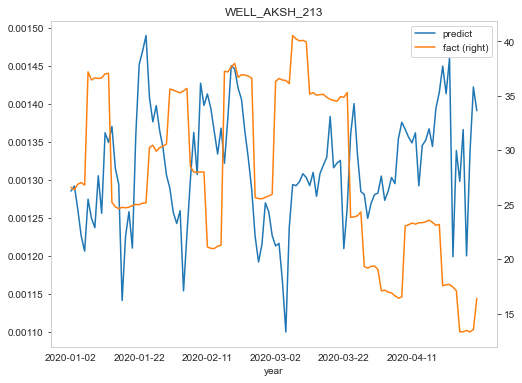

In [80]:
yhat = yhat.flatten() 
Y_traint = Y_traint.flatten()
Y_traint4 = Y_traint[0:120]
datadt4 = datadt[0:120]
import pandas as pd

df = pd.DataFrame(data={'year': datadt4, 
                        'predict': yhat, 
                        'fact': Y_traint4})
import matplotlib.pyplot as plt # Impot the relevant module

fig, ax = plt.subplots() # Create the figure and axes object

# Plot the first x and y axes:
df.plot(x = 'year', y = 'predict',title = "WELL_AKSH_213", ax = ax) 
# Plot the second x and y axes. By secondary_y = True a second y-axis is requested:
# (see https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.plot.html for details)
df.plot(x = 'year', y = 'fact', ax = ax, secondary_y = True)

In [81]:
from sklearn.metrics import r2_score
r2_score(Y_traint4, yhat)

-13.164952448037639

In [91]:
# multivariate mlp example
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate
 
# сэмлы
def split_sequences(sequences, n_steps):
	X, y = list(), list()
	for i in range(len(sequences)):
		# разметка
		end_ix = i + n_steps
		# проверка выхода за пределы
		if end_ix > len(sequences):
			break
		# получение начала и конечной метки
		seq_x, seq_y = sequences[i:end_ix, :-1], sequences[end_ix-1, -1]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
# последовательность
in_seq1 = X_left#[365:1231]
in_seq2 = X_right#[365:1231]

out_seq = Y_train #array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1),6))
in_seq2 = in_seq2.reshape((len(in_seq2),5))
out_seq = out_seq.reshape((len(out_seq),1))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
n_steps = 1
# convert into input/output
X,y = split_sequences(dataset, n_steps)
#y = 
# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]
# первая модель
visible1 = Input(shape=(n_steps,))
dense1 = Dense(100, activation='relu')(visible1)
# вторая модель
visible2 = Input(shape=(n_steps,))
dense2 = Dense(100, activation='relu')(visible2)
# слияние
merge = concatenate([dense1, dense2])
output = Dense(1)(merge)
model = Model(inputs=[visible1, visible2], outputs=output)
model.compile(optimizer='adam', loss='mse', metrics=['accuracy'])
# fit model
model.fit([X1, X2], Y_train, epochs=2000, verbose= 1, batch_size=64, validation_split=0.1)
# demonstrate prediction
#x_input = array([[80, 85], [90, 95], [100, 105]])
#x1 = x_input[:, 0].reshape((1, n_steps))
#x2 = x_input[:, 1].reshape((1, n_steps))
yhat = model.predict([X1, X2], verbose=0)
print(yhat)

Epoch 1/2000
18/18 [==============================] - 0s 9ms/step - loss: 2451.7588 - accuracy: 0.0000e+00 - val_loss: 230.5132 - val_accuracy: 0.0000e+00
Epoch 2/2000
18/18 [==============================] - 0s 3ms/step - loss: 1735.4011 - accuracy: 0.0000e+00 - val_loss: 81.0672 - val_accuracy: 0.0000e+00
Epoch 3/2000
18/18 [==============================] - 0s 3ms/step - loss: 1224.7033 - accuracy: 0.0000e+00 - val_loss: 77.3916 - val_accuracy: 0.0000e+00
Epoch 4/2000
18/18 [==============================] - 0s 3ms/step - loss: 822.4137 - accuracy: 0.0000e+00 - val_loss: 47.0293 - val_accuracy: 0.0000e+00
Epoch 5/2000
18/18 [==============================] - 0s 3ms/step - loss: 575.4624 - accuracy: 0.0000e+00 - val_loss: 48.4466 - val_accuracy: 0.0000e+00
Epoch 6/2000
18/18 [==============================] - 0s 3ms/step - loss: 401.2012 - accuracy: 0.0000e+00 - val_loss: 67.0339 - val_accuracy: 0.0000e+00
Epoch 7/2000
18/18 [==============================] - 0s 3ms/step - loss: 292.

Epoch 107/2000
18/18 [==============================] - 0s 3ms/step - loss: 162.1515 - accuracy: 0.0000e+00 - val_loss: 48.1852 - val_accuracy: 0.0000e+00
Epoch 108/2000
18/18 [==============================] - 0s 3ms/step - loss: 163.1082 - accuracy: 0.0000e+00 - val_loss: 54.0970 - val_accuracy: 0.0000e+00
Epoch 109/2000
18/18 [==============================] - 0s 3ms/step - loss: 161.5021 - accuracy: 0.0000e+00 - val_loss: 48.0186 - val_accuracy: 0.0000e+00
Epoch 110/2000
18/18 [==============================] - 0s 3ms/step - loss: 160.6108 - accuracy: 0.0000e+00 - val_loss: 51.8830 - val_accuracy: 0.0000e+00
Epoch 111/2000
18/18 [==============================] - 0s 3ms/step - loss: 159.7869 - accuracy: 0.0000e+00 - val_loss: 50.8270 - val_accuracy: 0.0000e+00
Epoch 112/2000
18/18 [==============================] - 0s 3ms/step - loss: 151.2414 - accuracy: 0.0000e+00 - val_loss: 48.7734 - val_accuracy: 0.0000e+00
Epoch 113/2000
18/18 [==============================] - 0s 3ms/step - 

Epoch 160/2000
18/18 [==============================] - 0s 3ms/step - loss: 125.1852 - accuracy: 0.0000e+00 - val_loss: 61.9883 - val_accuracy: 0.0000e+00
Epoch 161/2000
18/18 [==============================] - 0s 2ms/step - loss: 120.6564 - accuracy: 0.0000e+00 - val_loss: 66.0808 - val_accuracy: 0.0000e+00
Epoch 162/2000
18/18 [==============================] - 0s 3ms/step - loss: 107.2776 - accuracy: 0.0000e+00 - val_loss: 54.5171 - val_accuracy: 0.0000e+00
Epoch 163/2000
18/18 [==============================] - 0s 3ms/step - loss: 110.7042 - accuracy: 0.0000e+00 - val_loss: 57.0073 - val_accuracy: 0.0000e+00
Epoch 164/2000
18/18 [==============================] - 0s 3ms/step - loss: 119.6868 - accuracy: 0.0000e+00 - val_loss: 57.3698 - val_accuracy: 0.0000e+00
Epoch 165/2000
18/18 [==============================] - 0s 3ms/step - loss: 115.5471 - accuracy: 0.0000e+00 - val_loss: 56.8002 - val_accuracy: 0.0000e+00
Epoch 166/2000
18/18 [==============================] - 0s 3ms/step - 

Epoch 213/2000
18/18 [==============================] - 0s 3ms/step - loss: 108.3989 - accuracy: 0.0000e+00 - val_loss: 68.5648 - val_accuracy: 0.0000e+00
Epoch 214/2000
18/18 [==============================] - 0s 3ms/step - loss: 110.8924 - accuracy: 0.0000e+00 - val_loss: 67.8452 - val_accuracy: 0.0000e+00
Epoch 215/2000
18/18 [==============================] - 0s 3ms/step - loss: 113.2350 - accuracy: 0.0000e+00 - val_loss: 70.3052 - val_accuracy: 0.0000e+00
Epoch 216/2000
18/18 [==============================] - 0s 3ms/step - loss: 107.5855 - accuracy: 0.0000e+00 - val_loss: 82.1424 - val_accuracy: 0.0000e+00
Epoch 217/2000
18/18 [==============================] - 0s 3ms/step - loss: 105.7456 - accuracy: 0.0000e+00 - val_loss: 78.2736 - val_accuracy: 0.0000e+00
Epoch 218/2000
18/18 [==============================] - 0s 3ms/step - loss: 115.3602 - accuracy: 0.0000e+00 - val_loss: 72.7465 - val_accuracy: 0.0000e+00
Epoch 219/2000
18/18 [==============================] - 0s 3ms/step - 

Epoch 266/2000
18/18 [==============================] - 0s 3ms/step - loss: 114.8346 - accuracy: 0.0000e+00 - val_loss: 81.0901 - val_accuracy: 0.0000e+00
Epoch 267/2000
18/18 [==============================] - 0s 3ms/step - loss: 109.6461 - accuracy: 0.0000e+00 - val_loss: 67.6217 - val_accuracy: 0.0000e+00
Epoch 268/2000
18/18 [==============================] - 0s 3ms/step - loss: 108.3944 - accuracy: 0.0000e+00 - val_loss: 75.9984 - val_accuracy: 0.0000e+00
Epoch 269/2000
18/18 [==============================] - 0s 3ms/step - loss: 120.3084 - accuracy: 0.0000e+00 - val_loss: 77.8261 - val_accuracy: 0.0000e+00
Epoch 270/2000
18/18 [==============================] - 0s 3ms/step - loss: 114.2773 - accuracy: 0.0000e+00 - val_loss: 67.2684 - val_accuracy: 0.0000e+00
Epoch 271/2000
18/18 [==============================] - 0s 3ms/step - loss: 105.9694 - accuracy: 0.0000e+00 - val_loss: 84.5790 - val_accuracy: 0.0000e+00
Epoch 272/2000
18/18 [==============================] - 0s 3ms/step - 

Epoch 319/2000
18/18 [==============================] - 0s 2ms/step - loss: 108.8960 - accuracy: 0.0000e+00 - val_loss: 72.6818 - val_accuracy: 0.0000e+00
Epoch 320/2000
18/18 [==============================] - 0s 2ms/step - loss: 106.8528 - accuracy: 0.0000e+00 - val_loss: 77.2106 - val_accuracy: 0.0000e+00
Epoch 321/2000
18/18 [==============================] - 0s 3ms/step - loss: 103.2805 - accuracy: 0.0000e+00 - val_loss: 68.7114 - val_accuracy: 0.0000e+00
Epoch 322/2000
18/18 [==============================] - 0s 2ms/step - loss: 113.8883 - accuracy: 0.0000e+00 - val_loss: 72.7862 - val_accuracy: 0.0000e+00
Epoch 323/2000
18/18 [==============================] - 0s 3ms/step - loss: 109.7772 - accuracy: 0.0000e+00 - val_loss: 60.2769 - val_accuracy: 0.0000e+00
Epoch 324/2000
18/18 [==============================] - 0s 3ms/step - loss: 108.3469 - accuracy: 0.0000e+00 - val_loss: 79.7922 - val_accuracy: 0.0000e+00
Epoch 325/2000
18/18 [==============================] - 0s 2ms/step - 

Epoch 372/2000
18/18 [==============================] - 0s 2ms/step - loss: 104.8080 - accuracy: 0.0000e+00 - val_loss: 65.2547 - val_accuracy: 0.0000e+00
Epoch 373/2000
18/18 [==============================] - 0s 3ms/step - loss: 110.0749 - accuracy: 0.0000e+00 - val_loss: 74.9830 - val_accuracy: 0.0000e+00
Epoch 374/2000
18/18 [==============================] - 0s 3ms/step - loss: 110.1217 - accuracy: 0.0000e+00 - val_loss: 65.9232 - val_accuracy: 0.0000e+00
Epoch 375/2000
18/18 [==============================] - 0s 3ms/step - loss: 113.1025 - accuracy: 0.0000e+00 - val_loss: 70.8230 - val_accuracy: 0.0000e+00
Epoch 376/2000
18/18 [==============================] - 0s 2ms/step - loss: 107.5431 - accuracy: 0.0000e+00 - val_loss: 67.0650 - val_accuracy: 0.0000e+00
Epoch 377/2000
18/18 [==============================] - 0s 2ms/step - loss: 112.1417 - accuracy: 0.0000e+00 - val_loss: 67.3681 - val_accuracy: 0.0000e+00
Epoch 378/2000
18/18 [==============================] - 0s 3ms/step - 

18/18 [==============================] - 0s 2ms/step - loss: 104.4403 - accuracy: 0.0000e+00 - val_loss: 81.2628 - val_accuracy: 0.0000e+00
Epoch 477/2000
18/18 [==============================] - 0s 2ms/step - loss: 107.1028 - accuracy: 0.0000e+00 - val_loss: 64.0018 - val_accuracy: 0.0000e+00
Epoch 478/2000
18/18 [==============================] - 0s 2ms/step - loss: 111.6799 - accuracy: 0.0000e+00 - val_loss: 69.0611 - val_accuracy: 0.0000e+00
Epoch 479/2000
18/18 [==============================] - 0s 2ms/step - loss: 107.6937 - accuracy: 0.0000e+00 - val_loss: 64.3423 - val_accuracy: 0.0000e+00
Epoch 480/2000
18/18 [==============================] - 0s 2ms/step - loss: 106.0726 - accuracy: 0.0000e+00 - val_loss: 64.8691 - val_accuracy: 0.0000e+00
Epoch 481/2000
18/18 [==============================] - 0s 3ms/step - loss: 107.3277 - accuracy: 0.0000e+00 - val_loss: 78.5693 - val_accuracy: 0.0000e+00
Epoch 482/2000
18/18 [==============================] - 0s 3ms/step - loss: 108.1518 

Epoch 529/2000
18/18 [==============================] - 0s 3ms/step - loss: 108.8371 - accuracy: 0.0000e+00 - val_loss: 71.0435 - val_accuracy: 0.0000e+00
Epoch 530/2000
18/18 [==============================] - 0s 2ms/step - loss: 107.8837 - accuracy: 0.0000e+00 - val_loss: 64.7910 - val_accuracy: 0.0000e+00
Epoch 531/2000
18/18 [==============================] - 0s 2ms/step - loss: 107.4885 - accuracy: 0.0000e+00 - val_loss: 64.9998 - val_accuracy: 0.0000e+00
Epoch 532/2000
18/18 [==============================] - 0s 3ms/step - loss: 97.5587 - accuracy: 0.0000e+00 - val_loss: 74.3653 - val_accuracy: 0.0000e+00
Epoch 533/2000
18/18 [==============================] - 0s 3ms/step - loss: 110.3291 - accuracy: 0.0000e+00 - val_loss: 66.4795 - val_accuracy: 0.0000e+00
Epoch 534/2000
18/18 [==============================] - 0s 2ms/step - loss: 105.5164 - accuracy: 0.0000e+00 - val_loss: 72.8224 - val_accuracy: 0.0000e+00
Epoch 535/2000
18/18 [==============================] - 0s 2ms/step - l

Epoch 582/2000
18/18 [==============================] - 0s 2ms/step - loss: 107.7991 - accuracy: 0.0000e+00 - val_loss: 71.9985 - val_accuracy: 0.0000e+00
Epoch 583/2000
18/18 [==============================] - 0s 3ms/step - loss: 107.0320 - accuracy: 0.0000e+00 - val_loss: 74.5352 - val_accuracy: 0.0000e+00
Epoch 584/2000
18/18 [==============================] - 0s 3ms/step - loss: 108.3133 - accuracy: 0.0000e+00 - val_loss: 75.7414 - val_accuracy: 0.0000e+00
Epoch 585/2000
18/18 [==============================] - 0s 2ms/step - loss: 111.8401 - accuracy: 0.0000e+00 - val_loss: 73.6702 - val_accuracy: 0.0000e+00
Epoch 586/2000
18/18 [==============================] - 0s 2ms/step - loss: 101.5425 - accuracy: 0.0000e+00 - val_loss: 73.0735 - val_accuracy: 0.0000e+00
Epoch 587/2000
18/18 [==============================] - 0s 2ms/step - loss: 112.2836 - accuracy: 0.0000e+00 - val_loss: 87.4469 - val_accuracy: 0.0000e+00
Epoch 588/2000
18/18 [==============================] - 0s 2ms/step - 

Epoch 635/2000
18/18 [==============================] - 0s 3ms/step - loss: 109.8431 - accuracy: 0.0000e+00 - val_loss: 67.6577 - val_accuracy: 0.0000e+00
Epoch 636/2000
18/18 [==============================] - 0s 3ms/step - loss: 105.6007 - accuracy: 0.0000e+00 - val_loss: 69.6473 - val_accuracy: 0.0000e+00
Epoch 637/2000
18/18 [==============================] - 0s 2ms/step - loss: 108.6896 - accuracy: 0.0000e+00 - val_loss: 64.0312 - val_accuracy: 0.0000e+00
Epoch 638/2000
18/18 [==============================] - 0s 2ms/step - loss: 108.2331 - accuracy: 0.0000e+00 - val_loss: 64.4179 - val_accuracy: 0.0000e+00
Epoch 639/2000
18/18 [==============================] - 0s 2ms/step - loss: 107.3968 - accuracy: 0.0000e+00 - val_loss: 67.7959 - val_accuracy: 0.0000e+00
Epoch 640/2000
18/18 [==============================] - 0s 2ms/step - loss: 118.1209 - accuracy: 0.0000e+00 - val_loss: 66.0737 - val_accuracy: 0.0000e+00
Epoch 641/2000
18/18 [==============================] - 0s 3ms/step - 

Epoch 688/2000
18/18 [==============================] - 0s 3ms/step - loss: 114.6123 - accuracy: 0.0000e+00 - val_loss: 79.3150 - val_accuracy: 0.0000e+00
Epoch 689/2000
18/18 [==============================] - 0s 3ms/step - loss: 118.5389 - accuracy: 0.0000e+00 - val_loss: 99.1117 - val_accuracy: 0.0000e+00
Epoch 690/2000
18/18 [==============================] - 0s 3ms/step - loss: 111.4721 - accuracy: 0.0000e+00 - val_loss: 81.2316 - val_accuracy: 0.0000e+00
Epoch 691/2000
18/18 [==============================] - 0s 2ms/step - loss: 113.4393 - accuracy: 0.0000e+00 - val_loss: 67.3161 - val_accuracy: 0.0000e+00
Epoch 692/2000
18/18 [==============================] - 0s 3ms/step - loss: 108.2043 - accuracy: 0.0000e+00 - val_loss: 69.6890 - val_accuracy: 0.0000e+00
Epoch 693/2000
18/18 [==============================] - 0s 3ms/step - loss: 108.9415 - accuracy: 0.0000e+00 - val_loss: 72.5534 - val_accuracy: 0.0000e+00
Epoch 694/2000
18/18 [==============================] - 0s 3ms/step - 

Epoch 741/2000
18/18 [==============================] - 0s 3ms/step - loss: 114.6545 - accuracy: 0.0000e+00 - val_loss: 72.4451 - val_accuracy: 0.0000e+00
Epoch 742/2000
18/18 [==============================] - 0s 3ms/step - loss: 106.6137 - accuracy: 0.0000e+00 - val_loss: 70.9967 - val_accuracy: 0.0000e+00
Epoch 743/2000
18/18 [==============================] - 0s 2ms/step - loss: 101.5492 - accuracy: 0.0000e+00 - val_loss: 70.3796 - val_accuracy: 0.0000e+00
Epoch 744/2000
18/18 [==============================] - 0s 3ms/step - loss: 103.5390 - accuracy: 0.0000e+00 - val_loss: 71.6889 - val_accuracy: 0.0000e+00
Epoch 745/2000
18/18 [==============================] - 0s 3ms/step - loss: 104.2710 - accuracy: 0.0000e+00 - val_loss: 71.7098 - val_accuracy: 0.0000e+00
Epoch 746/2000
18/18 [==============================] - 0s 3ms/step - loss: 111.2821 - accuracy: 0.0000e+00 - val_loss: 83.7894 - val_accuracy: 0.0000e+00
Epoch 747/2000
18/18 [==============================] - 0s 2ms/step - 

Epoch 794/2000
18/18 [==============================] - 0s 2ms/step - loss: 103.3340 - accuracy: 0.0000e+00 - val_loss: 89.8501 - val_accuracy: 0.0000e+00
Epoch 795/2000
18/18 [==============================] - 0s 2ms/step - loss: 111.4055 - accuracy: 0.0000e+00 - val_loss: 62.2140 - val_accuracy: 0.0000e+00
Epoch 796/2000
18/18 [==============================] - 0s 2ms/step - loss: 104.2779 - accuracy: 0.0000e+00 - val_loss: 73.8378 - val_accuracy: 0.0000e+00
Epoch 797/2000
18/18 [==============================] - 0s 2ms/step - loss: 111.6369 - accuracy: 0.0000e+00 - val_loss: 65.3668 - val_accuracy: 0.0000e+00
Epoch 798/2000
18/18 [==============================] - 0s 3ms/step - loss: 112.1248 - accuracy: 0.0000e+00 - val_loss: 62.5760 - val_accuracy: 0.0000e+00
Epoch 799/2000
18/18 [==============================] - 0s 3ms/step - loss: 102.7131 - accuracy: 0.0000e+00 - val_loss: 64.9800 - val_accuracy: 0.0000e+00
Epoch 800/2000
18/18 [==============================] - 0s 3ms/step - 

Epoch 847/2000
18/18 [==============================] - 0s 3ms/step - loss: 108.2971 - accuracy: 0.0000e+00 - val_loss: 67.7317 - val_accuracy: 0.0000e+00
Epoch 848/2000
18/18 [==============================] - 0s 3ms/step - loss: 100.0768 - accuracy: 0.0000e+00 - val_loss: 69.1568 - val_accuracy: 0.0000e+00
Epoch 849/2000
18/18 [==============================] - 0s 3ms/step - loss: 110.8576 - accuracy: 0.0000e+00 - val_loss: 85.0979 - val_accuracy: 0.0000e+00
Epoch 850/2000
18/18 [==============================] - 0s 3ms/step - loss: 104.7391 - accuracy: 0.0000e+00 - val_loss: 68.3171 - val_accuracy: 0.0000e+00
Epoch 851/2000
18/18 [==============================] - 0s 3ms/step - loss: 105.5448 - accuracy: 0.0000e+00 - val_loss: 63.1035 - val_accuracy: 0.0000e+00
Epoch 852/2000
18/18 [==============================] - 0s 2ms/step - loss: 105.7427 - accuracy: 0.0000e+00 - val_loss: 62.8388 - val_accuracy: 0.0000e+00
Epoch 853/2000
18/18 [==============================] - 0s 3ms/step - 

Epoch 900/2000
18/18 [==============================] - 0s 3ms/step - loss: 104.6357 - accuracy: 0.0000e+00 - val_loss: 67.7536 - val_accuracy: 0.0000e+00
Epoch 901/2000
18/18 [==============================] - 0s 2ms/step - loss: 107.2337 - accuracy: 0.0000e+00 - val_loss: 67.4765 - val_accuracy: 0.0000e+00
Epoch 902/2000
18/18 [==============================] - 0s 2ms/step - loss: 103.2301 - accuracy: 0.0000e+00 - val_loss: 72.5915 - val_accuracy: 0.0000e+00
Epoch 903/2000
18/18 [==============================] - 0s 3ms/step - loss: 110.1000 - accuracy: 0.0000e+00 - val_loss: 68.7748 - val_accuracy: 0.0000e+00
Epoch 904/2000
18/18 [==============================] - 0s 2ms/step - loss: 100.9555 - accuracy: 0.0000e+00 - val_loss: 67.6932 - val_accuracy: 0.0000e+00
Epoch 905/2000
18/18 [==============================] - 0s 3ms/step - loss: 106.6108 - accuracy: 0.0000e+00 - val_loss: 79.9599 - val_accuracy: 0.0000e+00
Epoch 906/2000
18/18 [==============================] - 0s 2ms/step - 

Epoch 953/2000
18/18 [==============================] - 0s 2ms/step - loss: 107.7859 - accuracy: 0.0000e+00 - val_loss: 66.2117 - val_accuracy: 0.0000e+00
Epoch 954/2000
18/18 [==============================] - 0s 3ms/step - loss: 100.8507 - accuracy: 0.0000e+00 - val_loss: 62.0126 - val_accuracy: 0.0000e+00
Epoch 955/2000
18/18 [==============================] - 0s 3ms/step - loss: 104.1872 - accuracy: 0.0000e+00 - val_loss: 62.9453 - val_accuracy: 0.0000e+00
Epoch 956/2000
18/18 [==============================] - 0s 2ms/step - loss: 102.3536 - accuracy: 0.0000e+00 - val_loss: 69.1301 - val_accuracy: 0.0000e+00
Epoch 957/2000
18/18 [==============================] - 0s 2ms/step - loss: 102.2547 - accuracy: 0.0000e+00 - val_loss: 64.6236 - val_accuracy: 0.0000e+00
Epoch 958/2000
18/18 [==============================] - 0s 2ms/step - loss: 104.3303 - accuracy: 0.0000e+00 - val_loss: 68.2998 - val_accuracy: 0.0000e+00
Epoch 959/2000
18/18 [==============================] - 0s 2ms/step - 

Epoch 1006/2000
18/18 [==============================] - 0s 3ms/step - loss: 103.4955 - accuracy: 0.0000e+00 - val_loss: 73.3149 - val_accuracy: 0.0000e+00
Epoch 1007/2000
18/18 [==============================] - 0s 2ms/step - loss: 102.1141 - accuracy: 0.0000e+00 - val_loss: 72.1916 - val_accuracy: 0.0000e+00
Epoch 1008/2000
18/18 [==============================] - 0s 3ms/step - loss: 104.3291 - accuracy: 0.0000e+00 - val_loss: 72.9197 - val_accuracy: 0.0000e+00
Epoch 1009/2000
18/18 [==============================] - 0s 3ms/step - loss: 108.1919 - accuracy: 0.0000e+00 - val_loss: 69.2506 - val_accuracy: 0.0000e+00
Epoch 1010/2000
18/18 [==============================] - 0s 3ms/step - loss: 101.0049 - accuracy: 0.0000e+00 - val_loss: 66.8970 - val_accuracy: 0.0000e+00
Epoch 1011/2000
18/18 [==============================] - 0s 2ms/step - loss: 103.5495 - accuracy: 0.0000e+00 - val_loss: 70.1238 - val_accuracy: 0.0000e+00
Epoch 1012/2000
18/18 [==============================] - 0s 3ms/

Epoch 1111/2000
18/18 [==============================] - 0s 3ms/step - loss: 105.7136 - accuracy: 0.0000e+00 - val_loss: 71.1194 - val_accuracy: 0.0000e+00
Epoch 1112/2000
18/18 [==============================] - ETA: 0s - loss: 118.2784 - accuracy: 0.0000e+ - 0s 2ms/step - loss: 102.7501 - accuracy: 0.0000e+00 - val_loss: 70.5305 - val_accuracy: 0.0000e+00
Epoch 1113/2000
18/18 [==============================] - 0s 3ms/step - loss: 110.3195 - accuracy: 0.0000e+00 - val_loss: 72.7768 - val_accuracy: 0.0000e+00
Epoch 1114/2000
18/18 [==============================] - 0s 2ms/step - loss: 105.5545 - accuracy: 0.0000e+00 - val_loss: 67.5514 - val_accuracy: 0.0000e+00
Epoch 1115/2000
18/18 [==============================] - 0s 2ms/step - loss: 104.8924 - accuracy: 0.0000e+00 - val_loss: 67.9387 - val_accuracy: 0.0000e+00
Epoch 1116/2000
18/18 [==============================] - 0s 3ms/step - loss: 104.2581 - accuracy: 0.0000e+00 - val_loss: 78.3402 - val_accuracy: 0.0000e+00
Epoch 1117/2000


18/18 [==============================] - 0s 2ms/step - loss: 104.3243 - accuracy: 0.0000e+00 - val_loss: 64.1933 - val_accuracy: 0.0000e+00
Epoch 1216/2000
18/18 [==============================] - 0s 2ms/step - loss: 99.5396 - accuracy: 0.0000e+00 - val_loss: 64.5671 - val_accuracy: 0.0000e+00
Epoch 1217/2000
18/18 [==============================] - 0s 2ms/step - loss: 105.5341 - accuracy: 0.0000e+00 - val_loss: 64.5487 - val_accuracy: 0.0000e+00
Epoch 1218/2000
18/18 [==============================] - 0s 2ms/step - loss: 98.2438 - accuracy: 0.0000e+00 - val_loss: 65.6276 - val_accuracy: 0.0000e+00
Epoch 1219/2000
18/18 [==============================] - 0s 2ms/step - loss: 105.1136 - accuracy: 0.0000e+00 - val_loss: 70.6342 - val_accuracy: 0.0000e+00
Epoch 1220/2000
18/18 [==============================] - 0s 2ms/step - loss: 104.3931 - accuracy: 0.0000e+00 - val_loss: 71.1731 - val_accuracy: 0.0000e+00
Epoch 1221/2000
18/18 [==============================] - 0s 3ms/step - loss: 110.2

Epoch 1320/2000
18/18 [==============================] - 0s 2ms/step - loss: 105.1233 - accuracy: 0.0000e+00 - val_loss: 67.9556 - val_accuracy: 0.0000e+00
Epoch 1321/2000
18/18 [==============================] - 0s 2ms/step - loss: 102.3519 - accuracy: 0.0000e+00 - val_loss: 68.5108 - val_accuracy: 0.0000e+00
Epoch 1322/2000
18/18 [==============================] - 0s 3ms/step - loss: 106.7776 - accuracy: 0.0000e+00 - val_loss: 79.2880 - val_accuracy: 0.0000e+00
Epoch 1323/2000
18/18 [==============================] - 0s 2ms/step - loss: 99.7432 - accuracy: 0.0000e+00 - val_loss: 76.4473 - val_accuracy: 0.0000e+00
Epoch 1324/2000
18/18 [==============================] - 0s 2ms/step - loss: 106.1517 - accuracy: 0.0000e+00 - val_loss: 101.0574 - val_accuracy: 0.0000e+00
Epoch 1325/2000
18/18 [==============================] - 0s 3ms/step - loss: 100.0200 - accuracy: 0.0000e+00 - val_loss: 81.2737 - val_accuracy: 0.0000e+00
Epoch 1326/2000
18/18 [==============================] - 0s 2ms/

Epoch 1425/2000
18/18 [==============================] - 0s 2ms/step - loss: 101.8609 - accuracy: 0.0000e+00 - val_loss: 77.9087 - val_accuracy: 0.0000e+00
Epoch 1426/2000
18/18 [==============================] - 0s 2ms/step - loss: 107.6785 - accuracy: 0.0000e+00 - val_loss: 83.9870 - val_accuracy: 0.0000e+00
Epoch 1427/2000
18/18 [==============================] - 0s 3ms/step - loss: 101.4739 - accuracy: 0.0000e+00 - val_loss: 73.6428 - val_accuracy: 0.0000e+00
Epoch 1428/2000
18/18 [==============================] - 0s 3ms/step - loss: 93.2148 - accuracy: 0.0000e+00 - val_loss: 79.1205 - val_accuracy: 0.0000e+00
Epoch 1429/2000
18/18 [==============================] - 0s 3ms/step - loss: 98.6014 - accuracy: 0.0000e+00 - val_loss: 76.7550 - val_accuracy: 0.0000e+00
Epoch 1430/2000
18/18 [==============================] - 0s 3ms/step - loss: 107.0134 - accuracy: 0.0000e+00 - val_loss: 109.4420 - val_accuracy: 0.0000e+00
Epoch 1431/2000
18/18 [==============================] - 0s 3ms/s

Epoch 1530/2000
18/18 [==============================] - 0s 3ms/step - loss: 100.8557 - accuracy: 0.0000e+00 - val_loss: 69.8933 - val_accuracy: 0.0000e+00
Epoch 1531/2000
18/18 [==============================] - 0s 3ms/step - loss: 101.2308 - accuracy: 0.0000e+00 - val_loss: 67.2789 - val_accuracy: 0.0000e+00
Epoch 1532/2000
18/18 [==============================] - 0s 3ms/step - loss: 105.9465 - accuracy: 0.0000e+00 - val_loss: 69.3838 - val_accuracy: 0.0000e+00
Epoch 1533/2000
18/18 [==============================] - 0s 3ms/step - loss: 109.2389 - accuracy: 0.0000e+00 - val_loss: 66.2306 - val_accuracy: 0.0000e+00
Epoch 1534/2000
18/18 [==============================] - 0s 3ms/step - loss: 100.2589 - accuracy: 0.0000e+00 - val_loss: 73.6575 - val_accuracy: 0.0000e+00
Epoch 1535/2000
18/18 [==============================] - 0s 3ms/step - loss: 108.4235 - accuracy: 0.0000e+00 - val_loss: 68.3811 - val_accuracy: 0.0000e+00
Epoch 1536/2000
18/18 [==============================] - 0s 3ms/

18/18 [==============================] - 0s 3ms/step - loss: 103.6702 - accuracy: 0.0000e+00 - val_loss: 69.1966 - val_accuracy: 0.0000e+00
Epoch 1635/2000
18/18 [==============================] - 0s 3ms/step - loss: 100.6310 - accuracy: 0.0000e+00 - val_loss: 67.0985 - val_accuracy: 0.0000e+00
Epoch 1636/2000
18/18 [==============================] - 0s 3ms/step - loss: 102.7191 - accuracy: 0.0000e+00 - val_loss: 67.7845 - val_accuracy: 0.0000e+00
Epoch 1637/2000
18/18 [==============================] - 0s 3ms/step - loss: 99.1586 - accuracy: 0.0000e+00 - val_loss: 66.7018 - val_accuracy: 0.0000e+00
Epoch 1638/2000
18/18 [==============================] - 0s 3ms/step - loss: 100.6546 - accuracy: 0.0000e+00 - val_loss: 66.6602 - val_accuracy: 0.0000e+00
Epoch 1639/2000
18/18 [==============================] - 0s 3ms/step - loss: 98.9514 - accuracy: 0.0000e+00 - val_loss: 66.4161 - val_accuracy: 0.0000e+00
Epoch 1640/2000
18/18 [==============================] - 0s 3ms/step - loss: 104.1

Epoch 1687/2000
18/18 [==============================] - 0s 3ms/step - loss: 102.2546 - accuracy: 0.0000e+00 - val_loss: 60.4934 - val_accuracy: 0.0000e+00
Epoch 1688/2000
18/18 [==============================] - 0s 3ms/step - loss: 104.7674 - accuracy: 0.0000e+00 - val_loss: 65.0067 - val_accuracy: 0.0000e+00
Epoch 1689/2000
18/18 [==============================] - 0s 3ms/step - loss: 108.2263 - accuracy: 0.0000e+00 - val_loss: 61.0535 - val_accuracy: 0.0000e+00
Epoch 1690/2000
18/18 [==============================] - 0s 3ms/step - loss: 105.9146 - accuracy: 0.0000e+00 - val_loss: 61.5393 - val_accuracy: 0.0000e+00
Epoch 1691/2000
18/18 [==============================] - 0s 3ms/step - loss: 101.7957 - accuracy: 0.0000e+00 - val_loss: 63.0220 - val_accuracy: 0.0000e+00
Epoch 1692/2000
18/18 [==============================] - 0s 3ms/step - loss: 104.4259 - accuracy: 0.0000e+00 - val_loss: 64.3358 - val_accuracy: 0.0000e+00
Epoch 1693/2000
18/18 [==============================] - 0s 3ms/

Epoch 1792/2000
18/18 [==============================] - 0s 3ms/step - loss: 106.0888 - accuracy: 0.0000e+00 - val_loss: 66.6422 - val_accuracy: 0.0000e+00
Epoch 1793/2000
18/18 [==============================] - 0s 3ms/step - loss: 105.0585 - accuracy: 0.0000e+00 - val_loss: 63.6591 - val_accuracy: 0.0000e+00
Epoch 1794/2000
18/18 [==============================] - 0s 3ms/step - loss: 98.2016 - accuracy: 0.0000e+00 - val_loss: 79.1187 - val_accuracy: 0.0000e+00
Epoch 1795/2000
18/18 [==============================] - 0s 3ms/step - loss: 107.6176 - accuracy: 0.0000e+00 - val_loss: 63.7587 - val_accuracy: 0.0000e+00
Epoch 1796/2000
18/18 [==============================] - 0s 3ms/step - loss: 107.5158 - accuracy: 0.0000e+00 - val_loss: 64.2980 - val_accuracy: 0.0000e+00
Epoch 1797/2000
18/18 [==============================] - 0s 3ms/step - loss: 100.2092 - accuracy: 0.0000e+00 - val_loss: 64.0492 - val_accuracy: 0.0000e+00
Epoch 1798/2000
18/18 [==============================] - 0s 3ms/s

Epoch 1897/2000
18/18 [==============================] - 0s 3ms/step - loss: 102.1852 - accuracy: 0.0000e+00 - val_loss: 62.6987 - val_accuracy: 0.0000e+00
Epoch 1898/2000
18/18 [==============================] - 0s 3ms/step - loss: 100.5377 - accuracy: 0.0000e+00 - val_loss: 62.4451 - val_accuracy: 0.0000e+00
Epoch 1899/2000
18/18 [==============================] - 0s 3ms/step - loss: 103.3567 - accuracy: 0.0000e+00 - val_loss: 63.2064 - val_accuracy: 0.0000e+00
Epoch 1900/2000
18/18 [==============================] - 0s 3ms/step - loss: 102.2822 - accuracy: 0.0000e+00 - val_loss: 63.6219 - val_accuracy: 0.0000e+00
Epoch 1901/2000
18/18 [==============================] - 0s 3ms/step - loss: 111.6547 - accuracy: 0.0000e+00 - val_loss: 71.4523 - val_accuracy: 0.0000e+00
Epoch 1902/2000
18/18 [==============================] - 0s 3ms/step - loss: 106.7578 - accuracy: 0.0000e+00 - val_loss: 63.3104 - val_accuracy: 0.0000e+00
Epoch 1903/2000
18/18 [==============================] - 0s 3ms/

In [92]:
yhat = yhat.flatten() 
Y_train = Y_train.flatten() 

In [87]:
Y_train.shape #yhat = Y_train[0:866]
datadd.shape
Y_train = Y_train#[0:866]
yhat = Y_train#[0:866]
datadd.shape

(1231,)

In [93]:
datadd = data.index
#datadd = features.index 
datadd = datadd.to_numpy()

df = pd.DataFrame(data={'year': datadd, 
                        'predict': yhat, 
                        'fact': Y_train})

<AxesSubplot:label='fb89fadb-b704-4f7d-b08f-de756afd88fc'>

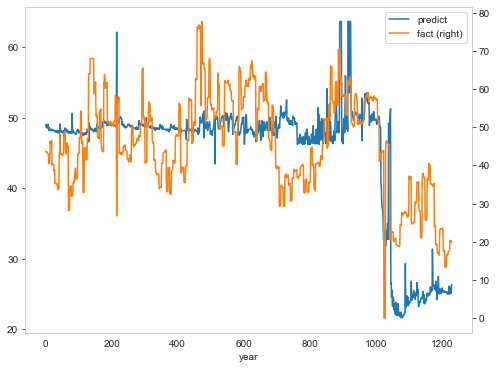

In [94]:
import matplotlib.pyplot as plt # Impot the relevant module


fig, ax = plt.subplots() # Create the figure and axes object

# Plot the first x and y axes:
df.plot(x = 'year', y = 'predict', ax = ax) 
# Plot the second x and y axes. By secondary_y = True a second y-axis is requested:
# (see https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.plot.html for details)
df.plot(x = 'year', y = 'fact', ax = ax, secondary_y = True)

In [690]:
from sklearn.metrics import r2_score
r2_score(Y_train, yhat)

1.0

In [691]:
from sklearn.metrics import mean_squared_error
mean_squared_error(Y_train, yhat)

0.0

# LIQ_VOL203

In [82]:
#features2s =[features_considered_south2] 
#features2 = datan['AKSH_424_water_vol','AKSH_249_water_vol','AKSH_247_water_vol','AKSH_250_water_vol','AKSH_424_water_vol','AKSH_214_water_vol']
#X_left = features2 #data2['AKSH_298_bhp_pump_press','AKSH_213_bhp_pump_press','AKSH_203_bhp_pump_press','AKSH_223_bhp_pump_press','AKSH_226_bhp_pump_press']

X_left = dataws #= data[features_considered_south1]
#X_left = data2[features2]
X_right = data[features_considered_south2]
Y_train = data['AKSH_203_liq_vol']#,'AKSH_226_liq_vol'] 
X_left = np.asarray(X_left)
X_right = np.asarray(X_right) 
Y_train = np.asarray(Y_train) 

In [83]:
X_leftl = X_left[(data.index < '2020-01-01')]
X_rightl = X_right[(data.index < '2020-01-01')]
Y_trainl = Y_train[(data.index < '2020-01-01')]#,'AKSH_226_liq_vol'] 


X_leftt = X_left[(data.index > '2020-01-01')]
X_rightt = X_right[(data.index > '2020-01-01')]
Y_traint = Y_train[(data.index > '2020-01-01')]#,'AKSH_226_liq_vol'] 

datadd = data.index
datadt = datadd[(data.index > '2020-01-01')]
datadl = datadd[(data.index < '2020-01-01')]

X_left = np.asarray(X_left)
X_right = np.asarray(X_right) 
Y_train = np.asarray(Y_train)
X_leftl = np.asarray(X_leftl)
X_rightl = np.asarray(X_rightl) 
Y_trainl = np.asarray(Y_trainl)
X_leftt = np.asarray(X_leftt)
X_rightt = np.asarray(X_rightt) 
Y_traint = np.asarray(Y_traint)

# MULTISTEPLSTM

In [85]:
# multivariate mlp example
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate
import tensorflow as tf
import tensorflow_addons as tfa 
# split a multivariate sequence into samples
def split_sequences(sequences, n_steps_in, n_steps_out):
	X, y = list(), list()
	for i in range(len(sequences)):
		# find the end of this pattern
		end_ix = i + n_steps_in
		out_end_ix = end_ix + n_steps_out
		# check if we are beyond the dataset
		if out_end_ix > len(sequences):
			break
		# gather input and output parts of the pattern
		seq_x, seq_y = sequences[i:end_ix, :], sequences[end_ix:out_end_ix, :]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
 
# последовательность
in_seq1 = X_leftl
in_seq2 = X_rightl
out_seq = Y_trainl # array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1), 6))
in_seq2 = in_seq2.reshape((len(in_seq2), 5))
out_seq = out_seq.reshape((len(out_seq), 1))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
# таймстепы
n_features = 1

n_steps_in, n_steps_out = 15, 1
# convert into input/output
X,y = split_sequences(dataset, n_steps_in, n_steps_out)
n_features1 = 1
n_features2 = 1
# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]
# первая модель
visible1 = Input(shape=(n_steps_in,n_features1))

visible1n = tfa.layers.GroupNormalization(1,-1,0.001,False)(visible1)
dense1 = LSTM(n_steps_in, input_shape =(100,n_features1))(visible1n)

visible11 = (RepeatVector(n_steps_out))(dense1)

visible21 = (LSTM(n_steps_in, activation='softplus',return_sequences=True))(visible11)
visible31 = (TimeDistributed(Dense(n_features)))(visible21)


#,batch_input_shape=(32,100,1), stateful=True
# вторая модель LSTM
visible2 = Input(shape=(n_steps_in,n_features2))
visible2n = tfa.layers.GroupNormalization(1,-1,0.001,False)(visible2)

lstm = LSTM(n_steps_in, input_shape =(100,n_features2))(visible2n)

visible12 = (RepeatVector(n_steps_out))(lstm)
visible22 = (LSTM(n_steps_in, activation='softplus',return_sequences=True))(visible12)
visible32 = (TimeDistributed(Dense(n_features)))(visible22)


#lstm2 = LSTM(10, input_shape =(100,1))(lstm)

# слияние
merge = concatenate([dense1, lstm])
output = Dense(1)(merge)
model = Model(inputs=[visible1, visible2], outputs=output)
model.compile(optimizer='adam', loss='mape', metrics=['accuracy'])
# fit model
model.fit([X1, X2], Y_trainl, epochs=400, verbose=1, batch_size=16, validation_split=0.01)
# demonstrate prediction
#x_input = array([[80, 85], [90, 95], [100, 105]])
#x1 = x_input[:, 0].reshape((1, n_steps))
#x2 = x_input[:, 1].reshape((1, n_steps))
yhat = model.predict([X1, X2], verbose=0)
print(yhat)

Epoch 1/400
45/45 [==============================] - 4s 23ms/step - loss: 4107071.1793 - accuracy: 0.0662 - val_loss: 14283086.0000 - val_accuracy: 0.3750
Epoch 2/400
45/45 [==============================] - 0s 6ms/step - loss: 600337.2622 - accuracy: 0.0576 - val_loss: 2979060.0000 - val_accuracy: 0.3750
Epoch 3/400
45/45 [==============================] - 0s 6ms/step - loss: 614788.9151 - accuracy: 0.0539 - val_loss: 14233840.0000 - val_accuracy: 0.3750
Epoch 4/400
45/45 [==============================] - 0s 6ms/step - loss: 720293.0523 - accuracy: 0.0608 - val_loss: 3000818.7500 - val_accuracy: 0.3750
Epoch 5/400
45/45 [==============================] - 0s 6ms/step - loss: 355491.5248 - accuracy: 0.0567 - val_loss: 7529706.0000 - val_accuracy: 0.3750
Epoch 6/400
45/45 [==============================] - 0s 6ms/step - loss: 351134.4742 - accuracy: 0.0563 - val_loss: 10770094.0000 - val_accuracy: 0.3750
Epoch 7/400
45/45 [==============================] - 0s 6ms/step - loss: 369057.107

Epoch 108/400
45/45 [==============================] - 0s 6ms/step - loss: 79510.0683 - accuracy: 0.0562 - val_loss: 3118388.0000 - val_accuracy: 0.3750
Epoch 109/400
45/45 [==============================] - 0s 6ms/step - loss: 61605.5345 - accuracy: 0.0550 - val_loss: 1343143.7500 - val_accuracy: 0.3750
Epoch 110/400
45/45 [==============================] - 0s 6ms/step - loss: 86563.5891 - accuracy: 0.0621 - val_loss: 1281221.7500 - val_accuracy: 0.3750
Epoch 111/400
45/45 [==============================] - 0s 6ms/step - loss: 35912.9975 - accuracy: 0.0466 - val_loss: 759195.3750 - val_accuracy: 0.3750
Epoch 112/400
45/45 [==============================] - 0s 6ms/step - loss: 280876.9186 - accuracy: 0.0567 - val_loss: 1610093.1250 - val_accuracy: 0.3750
Epoch 113/400
45/45 [==============================] - 0s 6ms/step - loss: 60847.7125 - accuracy: 0.0597 - val_loss: 931036.2500 - val_accuracy: 0.3750
Epoch 114/400
45/45 [==============================] - 0s 6ms/step - loss: 67860.68

Epoch 162/400
45/45 [==============================] - 0s 6ms/step - loss: 122065.6049 - accuracy: 0.0598 - val_loss: 124252.0156 - val_accuracy: 0.3750
Epoch 163/400
45/45 [==============================] - 0s 6ms/step - loss: 69254.5004 - accuracy: 0.0598 - val_loss: 265889.9688 - val_accuracy: 0.3750
Epoch 164/400
45/45 [==============================] - 0s 6ms/step - loss: 151778.2937 - accuracy: 0.0571 - val_loss: 565212.6250 - val_accuracy: 0.3750
Epoch 165/400
45/45 [==============================] - 0s 6ms/step - loss: 47514.2110 - accuracy: 0.0565 - val_loss: 586855.3125 - val_accuracy: 0.3750
Epoch 166/400
45/45 [==============================] - 0s 6ms/step - loss: 131462.1826 - accuracy: 0.0561 - val_loss: 767951.7500 - val_accuracy: 0.3750
Epoch 167/400
45/45 [==============================] - 0s 6ms/step - loss: 122377.7067 - accuracy: 0.0503 - val_loss: 478258.0000 - val_accuracy: 0.3750
Epoch 168/400
45/45 [==============================] - 0s 6ms/step - loss: 48041.187

Epoch 216/400
45/45 [==============================] - 0s 6ms/step - loss: 43418.8717 - accuracy: 0.0614 - val_loss: 50917.7852 - val_accuracy: 0.3750
Epoch 217/400
45/45 [==============================] - 0s 6ms/step - loss: 8401.3538 - accuracy: 0.0440 - val_loss: 120400.9688 - val_accuracy: 0.3750
Epoch 218/400
45/45 [==============================] - 0s 6ms/step - loss: 57430.9020 - accuracy: 0.0650 - val_loss: 41179.0000 - val_accuracy: 0.3750
Epoch 219/400
45/45 [==============================] - 0s 6ms/step - loss: 41876.1536 - accuracy: 0.0566 - val_loss: 87114.7266 - val_accuracy: 0.3750
Epoch 220/400
45/45 [==============================] - 0s 6ms/step - loss: 23233.1049 - accuracy: 0.0458 - val_loss: 159976.9375 - val_accuracy: 0.3750
Epoch 221/400
45/45 [==============================] - 0s 6ms/step - loss: 48851.7153 - accuracy: 0.0738 - val_loss: 101811.1719 - val_accuracy: 0.3750
Epoch 222/400
45/45 [==============================] - 0s 6ms/step - loss: 26961.7833 - accu

45/45 [==============================] - 0s 6ms/step - loss: 6930.0418 - accuracy: 0.0485 - val_loss: 229522.9688 - val_accuracy: 0.3750
Epoch 271/400
45/45 [==============================] - 0s 6ms/step - loss: 76533.6585 - accuracy: 0.0496 - val_loss: 34155.2773 - val_accuracy: 0.3750
Epoch 272/400
45/45 [==============================] - 0s 6ms/step - loss: 34464.0511 - accuracy: 0.0694 - val_loss: 528708.5000 - val_accuracy: 0.3750
Epoch 273/400
45/45 [==============================] - 0s 6ms/step - loss: 47715.9736 - accuracy: 0.0562 - val_loss: 551.8334 - val_accuracy: 0.3750
Epoch 274/400
45/45 [==============================] - 0s 6ms/step - loss: 9878.6125 - accuracy: 0.0463 - val_loss: 114863.0156 - val_accuracy: 0.3750
Epoch 275/400
45/45 [==============================] - 0s 6ms/step - loss: 26437.5619 - accuracy: 0.0533 - val_loss: 10905.2451 - val_accuracy: 0.3750
Epoch 276/400
45/45 [==============================] - 0s 6ms/step - loss: 22516.8732 - accuracy: 0.0507 - va

Epoch 324/400
45/45 [==============================] - 0s 6ms/step - loss: 12923.5101 - accuracy: 0.0492 - val_loss: 339083.3125 - val_accuracy: 0.3750
Epoch 325/400
45/45 [==============================] - 0s 6ms/step - loss: 31393.0066 - accuracy: 0.0541 - val_loss: 357330.6250 - val_accuracy: 0.3750
Epoch 326/400
45/45 [==============================] - 0s 6ms/step - loss: 30157.2418 - accuracy: 0.0514 - val_loss: 778112.5000 - val_accuracy: 0.3750
Epoch 327/400
45/45 [==============================] - 0s 6ms/step - loss: 97310.2177 - accuracy: 0.0658 - val_loss: 42231.7891 - val_accuracy: 0.3750
Epoch 328/400
45/45 [==============================] - 0s 6ms/step - loss: 24702.3204 - accuracy: 0.0512 - val_loss: 392329.7188 - val_accuracy: 0.3750
Epoch 329/400
45/45 [==============================] - 0s 6ms/step - loss: 42847.0845 - accuracy: 0.0658 - val_loss: 169664.9688 - val_accuracy: 0.3750
Epoch 330/400
45/45 [==============================] - 0s 6ms/step - loss: 9041.2127 - ac

# PREDICT

In [87]:
# multivariate mlp example
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate
 
# split a multivariate sequence into samples
def split_sequences(sequences, n_steps_in, n_steps_out):
	X, y = list(), list()
	for i in range(len(sequences)):
		# find the end of this pattern
		end_ix = i + n_steps_in
		out_end_ix = end_ix + n_steps_out
		# check if we are beyond the dataset
		if out_end_ix > len(sequences):
			break
		# gather input and output parts of the pattern
		seq_x, seq_y = sequences[i:end_ix, :], sequences[end_ix:out_end_ix, :]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
 
# последовательность
in_seq1 = X_leftt
in_seq2 = X_rightt
out_seq = Y_traint # array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1), 6))
in_seq2 = in_seq2.reshape((len(in_seq2), 5))
out_seq = out_seq.reshape((len(out_seq), 1))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
# таймстепы
n_steps_in, n_steps_out = 15, 1
# convert into input/output
X,y = split_sequences(dataset, n_steps_in, n_steps_out)



# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]
# первая модель

yhat = model.predict([X1, X2], verbose=0)
print(yhat)

[[-0.00015683]
 [-0.00015684]
 [-0.00015685]
 [-0.00015684]
 [-0.00015681]
 [-0.00015684]
 [-0.00015685]
 [-0.0001568 ]
 [-0.00015682]
 [-0.00015678]
 [-0.00015678]
 [-0.00015677]
 [-0.00015678]
 [-0.00015678]
 [-0.00015678]
 [-0.00015675]
 [-0.00015676]
 [-0.00015678]
 [-0.00015675]
 [-0.00015674]
 [-0.00015675]
 [-0.00015675]
 [-0.00015679]
 [-0.00015678]
 [-0.00015677]
 [-0.0001568 ]
 [-0.00015681]
 [-0.00015684]
 [-0.00015685]
 [-0.00015686]
 [-0.00015686]
 [-0.00015686]
 [-0.00015688]
 [-0.00015681]
 [-0.0001568 ]
 [-0.0001568 ]
 [-0.0001568 ]
 [-0.00015677]
 [-0.00015678]
 [-0.0001568 ]
 [-0.00015681]
 [-0.00015682]
 [-0.00015683]
 [-0.00015681]
 [-0.00015684]
 [-0.00015676]
 [-0.00015674]
 [-0.00015674]
 [-0.00015674]
 [-0.00015674]
 [-0.00015675]
 [-0.00015676]
 [-0.00015676]
 [-0.00015678]
 [-0.0001568 ]
 [-0.00015679]
 [-0.00015677]
 [-0.00015679]
 [-0.0001568 ]
 [-0.00015682]
 [-0.00015682]
 [-0.00015683]
 [-0.00015684]
 [-0.00015677]
 [-0.00015677]
 [-0.00015679]
 [-0.00015

In [91]:
# multivariate mlp example
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate
 
# сэмлы
def split_sequences(sequences, n_steps):
	X, y = list(), list()
	for i in range(len(sequences)):
		# разметка
		end_ix = i + n_steps
		# проверка выхода за пределы
		if end_ix > len(sequences):
			break
		# получение начала и конечной метки
		seq_x, seq_y = sequences[i:end_ix, :-1], sequences[end_ix-1, -1]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
# последовательность
in_seq1 = X_leftl
in_seq2 = X_rightl

out_seq = Y_trainl #array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1),6))
in_seq2 = in_seq2.reshape((len(in_seq2),5))
out_seq = out_seq.reshape((len(out_seq),1))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
n_steps = 15
# convert into input/output
X,y = split_sequences(dataset, n_steps)
#y = 
# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]
# первая модель
visible1 = Input(shape=(n_steps,))
dense1 = Dense(100, activation='relu')(visible1)
dense21 = Dense(10, activation='relu')(dense1)
# вторая модель
visible2 = Input(shape=(n_steps,))
dense2 = Dense(100, activation='relu')(visible2)
dense22 = Dense(10, activation='relu')(dense2)
# слияние
# слияние
merge = concatenate([dense1, dense2])
output = Dense(1)(merge)
model = Model(inputs=[visible1, visible2], outputs=output)
model.compile(optimizer='adam', loss='mse', metrics=['accuracy'])
# fit model
model.fit([X1, X2], Y_trainl, epochs=2000, verbose= 1, batch_size=64, validation_split=0.1)
# demonstrate prediction
#x_input = array([[80, 85], [90, 95], [100, 105]])
#x1 = x_input[:, 0].reshape((1, n_steps))
#x2 = x_input[:, 1].reshape((1, n_steps))

 
# последовательность
in_seq1t = X_leftt
in_seq2t = X_rightt

out_seqt = Y_traint #array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1t = in_seq1.reshape((len(in_seq1),6))
in_seq2t = in_seq2.reshape((len(in_seq2),5))
out_seqt = out_seq.reshape((len(out_seq),1))
# горизонтальное последовательное размещение данных 
datasett = hstack((in_seq1t, in_seq2t, out_seqt))
# таймстепы
n_steps = 15
# convert into input/output
Xt,yt = split_sequences(datasett, n_steps)
X1t = Xt[:, :, 0]
X2t = Xt[:, :, 1]
yhatt = model.predict([X1t, X2t], verbose=0)
print(yhatt)

Epoch 1/2000
11/11 [==============================] - 1s 45ms/step - loss: 759.8885 - accuracy: 0.0245 - val_loss: 37092.9180 - val_accuracy: 0.0000e+00
Epoch 2/2000
11/11 [==============================] - 0s 4ms/step - loss: 159.9550 - accuracy: 0.0000e+00 - val_loss: 28918.4609 - val_accuracy: 0.0000e+00
Epoch 3/2000
11/11 [==============================] - 0s 4ms/step - loss: 108.9302 - accuracy: 0.0000e+00 - val_loss: 27791.3965 - val_accuracy: 0.0000e+00
Epoch 4/2000
11/11 [==============================] - 0s 4ms/step - loss: 92.7939 - accuracy: 0.0000e+00 - val_loss: 31651.0625 - val_accuracy: 0.0000e+00
Epoch 5/2000
11/11 [==============================] - 0s 4ms/step - loss: 74.6244 - accuracy: 0.0000e+00 - val_loss: 31826.0000 - val_accuracy: 0.0000e+00
Epoch 6/2000
11/11 [==============================] - 0s 4ms/step - loss: 72.4633 - accuracy: 0.0000e+00 - val_loss: 29188.5312 - val_accuracy: 0.0000e+00
Epoch 7/2000
11/11 [==============================] - 0s 4ms/step - lo

Epoch 108/2000
11/11 [==============================] - 0s 4ms/step - loss: 57.5238 - accuracy: 0.0130 - val_loss: 41694.0195 - val_accuracy: 0.0000e+00
Epoch 109/2000
11/11 [==============================] - 0s 4ms/step - loss: 52.1925 - accuracy: 0.0127 - val_loss: 42212.3750 - val_accuracy: 0.0000e+00
Epoch 110/2000
11/11 [==============================] - 0s 4ms/step - loss: 57.7606 - accuracy: 0.0080 - val_loss: 35760.0820 - val_accuracy: 0.0000e+00
Epoch 111/2000
11/11 [==============================] - 0s 4ms/step - loss: 55.0971 - accuracy: 0.0226 - val_loss: 36198.9609 - val_accuracy: 0.0000e+00
Epoch 112/2000
11/11 [==============================] - 0s 4ms/step - loss: 51.7408 - accuracy: 0.0140 - val_loss: 34050.6797 - val_accuracy: 0.0000e+00
Epoch 113/2000
11/11 [==============================] - 0s 4ms/step - loss: 49.3767 - accuracy: 0.0176 - val_loss: 36436.6016 - val_accuracy: 0.0000e+00
Epoch 114/2000
11/11 [==============================] - 0s 4ms/step - loss: 56.172

11/11 [==============================] - 0s 4ms/step - loss: 52.8034 - accuracy: 0.0104 - val_loss: 34588.6406 - val_accuracy: 0.0000e+00
Epoch 215/2000
11/11 [==============================] - 0s 4ms/step - loss: 62.5640 - accuracy: 0.0189 - val_loss: 39712.3828 - val_accuracy: 0.0000e+00
Epoch 216/2000
11/11 [==============================] - 0s 4ms/step - loss: 54.9346 - accuracy: 0.0160 - val_loss: 41613.6562 - val_accuracy: 0.0000e+00
Epoch 217/2000
11/11 [==============================] - 0s 4ms/step - loss: 55.6422 - accuracy: 0.0155 - val_loss: 38623.1094 - val_accuracy: 0.0000e+00
Epoch 218/2000
11/11 [==============================] - 0s 4ms/step - loss: 57.4233 - accuracy: 0.0258 - val_loss: 38997.7812 - val_accuracy: 0.0000e+00
Epoch 219/2000
11/11 [==============================] - 0s 4ms/step - loss: 50.2660 - accuracy: 0.0224 - val_loss: 37804.4180 - val_accuracy: 0.0000e+00
Epoch 220/2000
11/11 [==============================] - 0s 4ms/step - loss: 56.3726 - accuracy: 0

Epoch 268/2000
11/11 [==============================] - 0s 4ms/step - loss: 48.2000 - accuracy: 0.0123 - val_loss: 32056.3965 - val_accuracy: 0.0000e+00
Epoch 269/2000
11/11 [==============================] - 0s 4ms/step - loss: 54.4527 - accuracy: 0.0170 - val_loss: 33120.0078 - val_accuracy: 0.0000e+00
Epoch 270/2000
11/11 [==============================] - 0s 4ms/step - loss: 47.2798 - accuracy: 0.0143 - val_loss: 35243.8008 - val_accuracy: 0.0000e+00
Epoch 271/2000
11/11 [==============================] - 0s 4ms/step - loss: 51.9899 - accuracy: 0.0118 - val_loss: 33817.2031 - val_accuracy: 0.0000e+00
Epoch 272/2000
11/11 [==============================] - 0s 4ms/step - loss: 44.6352 - accuracy: 0.0226 - val_loss: 33684.0859 - val_accuracy: 0.0000e+00
Epoch 273/2000
11/11 [==============================] - 0s 4ms/step - loss: 51.8733 - accuracy: 0.0237 - val_loss: 35263.7070 - val_accuracy: 0.0000e+00
Epoch 274/2000
11/11 [==============================] - 0s 4ms/step - loss: 51.809

11/11 [==============================] - 0s 4ms/step - loss: 52.6001 - accuracy: 0.0154 - val_loss: 29909.5840 - val_accuracy: 0.0000e+00
Epoch 375/2000
11/11 [==============================] - 0s 4ms/step - loss: 51.0433 - accuracy: 0.0177 - val_loss: 30370.9727 - val_accuracy: 0.0000e+00
Epoch 376/2000
11/11 [==============================] - 0s 4ms/step - loss: 46.0371 - accuracy: 0.0177 - val_loss: 30486.8516 - val_accuracy: 0.0000e+00
Epoch 377/2000
11/11 [==============================] - 0s 4ms/step - loss: 55.4031 - accuracy: 0.0203 - val_loss: 30886.3398 - val_accuracy: 0.0000e+00
Epoch 378/2000
11/11 [==============================] - 0s 4ms/step - loss: 47.3054 - accuracy: 0.0197 - val_loss: 30398.5488 - val_accuracy: 0.0000e+00
Epoch 379/2000
11/11 [==============================] - 0s 4ms/step - loss: 55.6215 - accuracy: 0.0021 - val_loss: 22159.0371 - val_accuracy: 0.0000e+00
Epoch 380/2000
11/11 [==============================] - 0s 4ms/step - loss: 70.1452 - accuracy: 0

Epoch 428/2000
11/11 [==============================] - 0s 4ms/step - loss: 49.1321 - accuracy: 0.0158 - val_loss: 29029.2539 - val_accuracy: 0.0000e+00
Epoch 429/2000
11/11 [==============================] - 0s 4ms/step - loss: 50.1127 - accuracy: 0.0217 - val_loss: 30018.1660 - val_accuracy: 0.0000e+00
Epoch 430/2000
11/11 [==============================] - 0s 4ms/step - loss: 43.1760 - accuracy: 0.0165 - val_loss: 29661.0586 - val_accuracy: 0.0000e+00
Epoch 431/2000
11/11 [==============================] - 0s 4ms/step - loss: 42.6645 - accuracy: 0.0162 - val_loss: 29359.4414 - val_accuracy: 0.0000e+00
Epoch 432/2000
11/11 [==============================] - 0s 4ms/step - loss: 49.0147 - accuracy: 0.0218 - val_loss: 28796.0566 - val_accuracy: 0.0000e+00
Epoch 433/2000
11/11 [==============================] - 0s 4ms/step - loss: 49.5413 - accuracy: 0.0110 - val_loss: 32519.4023 - val_accuracy: 0.0000e+00
Epoch 434/2000
11/11 [==============================] - 0s 4ms/step - loss: 45.882

11/11 [==============================] - 0s 4ms/step - loss: 51.8317 - accuracy: 0.0090 - val_loss: 21011.9785 - val_accuracy: 0.0000e+00
Epoch 535/2000
11/11 [==============================] - 0s 4ms/step - loss: 51.0229 - accuracy: 0.0257 - val_loss: 22477.4082 - val_accuracy: 0.0000e+00
Epoch 536/2000
11/11 [==============================] - 0s 4ms/step - loss: 50.5403 - accuracy: 0.0230 - val_loss: 24454.4922 - val_accuracy: 0.0000e+00
Epoch 537/2000
11/11 [==============================] - 0s 4ms/step - loss: 50.0528 - accuracy: 0.0047 - val_loss: 22089.5000 - val_accuracy: 0.0000e+00
Epoch 538/2000
11/11 [==============================] - 0s 4ms/step - loss: 47.6562 - accuracy: 0.0147 - val_loss: 25890.5293 - val_accuracy: 0.0000e+00
Epoch 539/2000
11/11 [==============================] - 0s 4ms/step - loss: 49.0635 - accuracy: 0.0102 - val_loss: 25202.7266 - val_accuracy: 0.0000e+00
Epoch 540/2000
11/11 [==============================] - 0s 4ms/step - loss: 51.3270 - accuracy: 0

Epoch 588/2000
11/11 [==============================] - 0s 4ms/step - loss: 48.1380 - accuracy: 0.0041 - val_loss: 23553.8984 - val_accuracy: 0.0000e+00
Epoch 589/2000
11/11 [==============================] - 0s 4ms/step - loss: 44.6789 - accuracy: 0.0138 - val_loss: 22964.9512 - val_accuracy: 0.0000e+00
Epoch 590/2000
11/11 [==============================] - 0s 4ms/step - loss: 48.8325 - accuracy: 0.0141 - val_loss: 23519.7812 - val_accuracy: 0.0000e+00
Epoch 591/2000
11/11 [==============================] - 0s 4ms/step - loss: 46.7279 - accuracy: 0.0054 - val_loss: 21539.0586 - val_accuracy: 0.0000e+00
Epoch 592/2000
11/11 [==============================] - 0s 4ms/step - loss: 48.0061 - accuracy: 0.0216 - val_loss: 20620.4883 - val_accuracy: 0.0000e+00
Epoch 593/2000
11/11 [==============================] - 0s 4ms/step - loss: 43.8185 - accuracy: 0.0163 - val_loss: 20859.9922 - val_accuracy: 0.0000e+00
Epoch 594/2000
11/11 [==============================] - 0s 4ms/step - loss: 44.662

11/11 [==============================] - 0s 4ms/step - loss: 51.4592 - accuracy: 0.0118 - val_loss: 19967.3457 - val_accuracy: 0.0000e+00
Epoch 695/2000
11/11 [==============================] - 0s 4ms/step - loss: 50.9344 - accuracy: 0.0124 - val_loss: 18295.4648 - val_accuracy: 0.0000e+00
Epoch 696/2000
11/11 [==============================] - 0s 4ms/step - loss: 47.4608 - accuracy: 0.0176 - val_loss: 20444.0938 - val_accuracy: 0.0000e+00
Epoch 697/2000
11/11 [==============================] - 0s 4ms/step - loss: 43.9710 - accuracy: 0.0179 - val_loss: 21055.1230 - val_accuracy: 0.0000e+00
Epoch 698/2000
11/11 [==============================] - 0s 4ms/step - loss: 50.1378 - accuracy: 0.0049 - val_loss: 17920.8047 - val_accuracy: 0.0000e+00
Epoch 699/2000
11/11 [==============================] - 0s 4ms/step - loss: 49.3260 - accuracy: 0.0140 - val_loss: 16596.0371 - val_accuracy: 0.0000e+00
Epoch 700/2000
11/11 [==============================] - 0s 4ms/step - loss: 49.6555 - accuracy: 0

Epoch 748/2000
11/11 [==============================] - 0s 4ms/step - loss: 46.5122 - accuracy: 0.0080 - val_loss: 12381.5537 - val_accuracy: 0.0000e+00
Epoch 749/2000
11/11 [==============================] - 0s 4ms/step - loss: 46.8572 - accuracy: 0.0305 - val_loss: 12202.0547 - val_accuracy: 0.0000e+00
Epoch 750/2000
11/11 [==============================] - 0s 4ms/step - loss: 43.7849 - accuracy: 0.0104 - val_loss: 13009.1699 - val_accuracy: 0.0000e+00
Epoch 751/2000
11/11 [==============================] - 0s 4ms/step - loss: 45.0265 - accuracy: 0.0089 - val_loss: 12987.0781 - val_accuracy: 0.0000e+00
Epoch 752/2000
11/11 [==============================] - 0s 6ms/step - loss: 45.9097 - accuracy: 0.0376 - val_loss: 15051.0576 - val_accuracy: 0.0000e+00
Epoch 753/2000
11/11 [==============================] - 0s 4ms/step - loss: 51.2580 - accuracy: 0.0051 - val_loss: 12295.1689 - val_accuracy: 0.0000e+00
Epoch 754/2000
11/11 [==============================] - 0s 4ms/step - loss: 51.887

11/11 [==============================] - 0s 4ms/step - loss: 42.6656 - accuracy: 0.0048 - val_loss: 13464.4463 - val_accuracy: 0.0000e+00
Epoch 855/2000
11/11 [==============================] - 0s 4ms/step - loss: 43.3767 - accuracy: 0.0099 - val_loss: 15827.8906 - val_accuracy: 0.0000e+00
Epoch 856/2000
11/11 [==============================] - 0s 4ms/step - loss: 47.7413 - accuracy: 0.0072 - val_loss: 15335.5576 - val_accuracy: 0.0000e+00
Epoch 857/2000
11/11 [==============================] - 0s 4ms/step - loss: 48.2182 - accuracy: 0.0210 - val_loss: 14457.3447 - val_accuracy: 0.0000e+00
Epoch 858/2000
11/11 [==============================] - 0s 4ms/step - loss: 45.8996 - accuracy: 0.0152 - val_loss: 16026.9912 - val_accuracy: 0.0000e+00
Epoch 859/2000
11/11 [==============================] - 0s 4ms/step - loss: 46.2030 - accuracy: 0.0147 - val_loss: 15073.5088 - val_accuracy: 0.0000e+00
Epoch 860/2000
11/11 [==============================] - 0s 4ms/step - loss: 45.5176 - accuracy: 0

Epoch 908/2000
11/11 [==============================] - 0s 4ms/step - loss: 45.3121 - accuracy: 0.0088 - val_loss: 15850.9414 - val_accuracy: 0.0000e+00
Epoch 909/2000
11/11 [==============================] - 0s 4ms/step - loss: 42.0442 - accuracy: 0.0108 - val_loss: 15494.7637 - val_accuracy: 0.0000e+00
Epoch 910/2000
11/11 [==============================] - 0s 4ms/step - loss: 48.8022 - accuracy: 0.0259 - val_loss: 17063.9434 - val_accuracy: 0.0000e+00
Epoch 911/2000
11/11 [==============================] - 0s 4ms/step - loss: 43.8854 - accuracy: 0.0181 - val_loss: 16662.2500 - val_accuracy: 0.0000e+00
Epoch 912/2000
11/11 [==============================] - 0s 4ms/step - loss: 47.8587 - accuracy: 0.0203 - val_loss: 16662.9258 - val_accuracy: 0.0000e+00
Epoch 913/2000
11/11 [==============================] - 0s 4ms/step - loss: 47.1501 - accuracy: 0.0186 - val_loss: 16509.8184 - val_accuracy: 0.0000e+00
Epoch 914/2000
11/11 [==============================] - 0s 4ms/step - loss: 45.456

11/11 [==============================] - 0s 4ms/step - loss: 42.6724 - accuracy: 0.0167 - val_loss: 13581.4971 - val_accuracy: 0.0000e+00
Epoch 1015/2000
11/11 [==============================] - 0s 4ms/step - loss: 43.8966 - accuracy: 0.0243 - val_loss: 13795.7178 - val_accuracy: 0.0000e+00
Epoch 1016/2000
11/11 [==============================] - 0s 4ms/step - loss: 43.5611 - accuracy: 0.0175 - val_loss: 12789.2832 - val_accuracy: 0.0000e+00
Epoch 1017/2000
11/11 [==============================] - 0s 4ms/step - loss: 42.0105 - accuracy: 0.0065 - val_loss: 12818.8047 - val_accuracy: 0.0000e+00
Epoch 1018/2000
11/11 [==============================] - 0s 4ms/step - loss: 41.3607 - accuracy: 0.0152 - val_loss: 13076.1426 - val_accuracy: 0.0000e+00
Epoch 1019/2000
11/11 [==============================] - 0s 4ms/step - loss: 43.8781 - accuracy: 0.0090 - val_loss: 11664.1943 - val_accuracy: 0.0000e+00
Epoch 1020/2000
11/11 [==============================] - 0s 4ms/step - loss: 45.7504 - accur

11/11 [==============================] - 0s 4ms/step - loss: 54.9858 - accuracy: 0.0242 - val_loss: 14158.7148 - val_accuracy: 0.0000e+00
Epoch 1121/2000
11/11 [==============================] - 0s 4ms/step - loss: 49.2305 - accuracy: 0.0027 - val_loss: 11054.6240 - val_accuracy: 0.0000e+00
Epoch 1122/2000
11/11 [==============================] - 0s 4ms/step - loss: 51.1811 - accuracy: 0.0223 - val_loss: 12037.8994 - val_accuracy: 0.0000e+00
Epoch 1123/2000
11/11 [==============================] - 0s 4ms/step - loss: 43.3814 - accuracy: 0.0160 - val_loss: 11911.9326 - val_accuracy: 0.0000e+00
Epoch 1124/2000
11/11 [==============================] - 0s 4ms/step - loss: 44.9010 - accuracy: 0.0052 - val_loss: 11972.8857 - val_accuracy: 0.0000e+00
Epoch 1125/2000
11/11 [==============================] - 0s 4ms/step - loss: 47.3996 - accuracy: 0.0215 - val_loss: 12730.0811 - val_accuracy: 0.0000e+00
Epoch 1126/2000
11/11 [==============================] - 0s 4ms/step - loss: 44.5135 - accur

11/11 [==============================] - 0s 4ms/step - loss: 41.4432 - accuracy: 0.0329 - val_loss: 11344.4473 - val_accuracy: 0.0000e+00
Epoch 1227/2000
11/11 [==============================] - 0s 4ms/step - loss: 46.0745 - accuracy: 0.0038 - val_loss: 9820.8086 - val_accuracy: 0.0000e+00
Epoch 1228/2000
11/11 [==============================] - 0s 4ms/step - loss: 43.6767 - accuracy: 0.0278 - val_loss: 9938.9355 - val_accuracy: 0.0000e+00
Epoch 1229/2000
11/11 [==============================] - 0s 4ms/step - loss: 38.5794 - accuracy: 0.0056 - val_loss: 9765.2773 - val_accuracy: 0.0000e+00
Epoch 1230/2000
11/11 [==============================] - 0s 4ms/step - loss: 43.0731 - accuracy: 0.0283 - val_loss: 10683.6367 - val_accuracy: 0.0000e+00
Epoch 1231/2000
11/11 [==============================] - 0s 4ms/step - loss: 43.1724 - accuracy: 0.0134 - val_loss: 10612.1846 - val_accuracy: 0.0000e+00
Epoch 1232/2000
11/11 [==============================] - 0s 4ms/step - loss: 41.0009 - accuracy

11/11 [==============================] - 0s 4ms/step - loss: 39.8636 - accuracy: 0.0138 - val_loss: 9180.3584 - val_accuracy: 0.0000e+00
Epoch 1333/2000
11/11 [==============================] - 0s 4ms/step - loss: 40.3231 - accuracy: 0.0172 - val_loss: 10802.9961 - val_accuracy: 0.0000e+00
Epoch 1334/2000
11/11 [==============================] - 0s 4ms/step - loss: 41.4521 - accuracy: 0.0208 - val_loss: 10894.2529 - val_accuracy: 0.0000e+00
Epoch 1335/2000
11/11 [==============================] - 0s 4ms/step - loss: 45.9868 - accuracy: 0.0168 - val_loss: 11153.8271 - val_accuracy: 0.0000e+00
Epoch 1336/2000
11/11 [==============================] - 0s 4ms/step - loss: 43.3220 - accuracy: 0.0246 - val_loss: 11620.2373 - val_accuracy: 0.0000e+00
Epoch 1337/2000
11/11 [==============================] - 0s 4ms/step - loss: 45.2027 - accuracy: 0.0212 - val_loss: 10909.8320 - val_accuracy: 0.0000e+00
Epoch 1338/2000
11/11 [==============================] - 0s 4ms/step - loss: 36.3121 - accura

11/11 [==============================] - 0s 4ms/step - loss: 39.0988 - accuracy: 0.0307 - val_loss: 8556.5264 - val_accuracy: 0.0000e+00
Epoch 1439/2000
11/11 [==============================] - 0s 4ms/step - loss: 44.8045 - accuracy: 0.0314 - val_loss: 10519.4785 - val_accuracy: 0.0000e+00
Epoch 1440/2000
11/11 [==============================] - 0s 4ms/step - loss: 45.6938 - accuracy: 0.0097 - val_loss: 9114.0781 - val_accuracy: 0.0000e+00
Epoch 1441/2000
11/11 [==============================] - 0s 4ms/step - loss: 46.7561 - accuracy: 0.0200 - val_loss: 9663.4014 - val_accuracy: 0.0000e+00
Epoch 1442/2000
11/11 [==============================] - 0s 4ms/step - loss: 36.4748 - accuracy: 0.0125 - val_loss: 9308.6426 - val_accuracy: 0.0000e+00
Epoch 1443/2000
11/11 [==============================] - 0s 4ms/step - loss: 42.0367 - accuracy: 0.0162 - val_loss: 9864.9238 - val_accuracy: 0.0000e+00
Epoch 1444/2000
11/11 [==============================] - 0s 4ms/step - loss: 43.9458 - accuracy: 

11/11 [==============================] - 0s 4ms/step - loss: 40.4882 - accuracy: 0.0107 - val_loss: 9572.8975 - val_accuracy: 0.0000e+00
Epoch 1545/2000
11/11 [==============================] - 0s 4ms/step - loss: 39.9585 - accuracy: 0.0169 - val_loss: 10240.5605 - val_accuracy: 0.0000e+00
Epoch 1546/2000
11/11 [==============================] - 0s 4ms/step - loss: 41.0722 - accuracy: 0.0134 - val_loss: 9472.5361 - val_accuracy: 0.0000e+00
Epoch 1547/2000
11/11 [==============================] - 0s 4ms/step - loss: 40.6382 - accuracy: 0.0265 - val_loss: 8367.2148 - val_accuracy: 0.0000e+00
Epoch 1548/2000
11/11 [==============================] - 0s 4ms/step - loss: 41.4702 - accuracy: 0.0121 - val_loss: 8555.4619 - val_accuracy: 0.0000e+00
Epoch 1549/2000
11/11 [==============================] - 0s 4ms/step - loss: 38.2890 - accuracy: 0.0191 - val_loss: 9246.2529 - val_accuracy: 0.0000e+00
Epoch 1550/2000
11/11 [==============================] - 0s 4ms/step - loss: 44.2268 - accuracy: 

11/11 [==============================] - 0s 4ms/step - loss: 39.1138 - accuracy: 0.0091 - val_loss: 6379.3896 - val_accuracy: 0.0000e+00
Epoch 1651/2000
11/11 [==============================] - 0s 4ms/step - loss: 41.3698 - accuracy: 0.0151 - val_loss: 5735.4497 - val_accuracy: 0.0000e+00
Epoch 1652/2000
11/11 [==============================] - 0s 4ms/step - loss: 44.1002 - accuracy: 0.0118 - val_loss: 6078.8760 - val_accuracy: 0.0000e+00
Epoch 1653/2000
11/11 [==============================] - 0s 4ms/step - loss: 43.3599 - accuracy: 0.0239 - val_loss: 7103.1323 - val_accuracy: 0.0000e+00
Epoch 1654/2000
11/11 [==============================] - 0s 4ms/step - loss: 39.9137 - accuracy: 0.0223 - val_loss: 7213.7104 - val_accuracy: 0.0000e+00
Epoch 1655/2000
11/11 [==============================] - 0s 5ms/step - loss: 41.8941 - accuracy: 0.0182 - val_loss: 7707.1387 - val_accuracy: 0.0000e+00
Epoch 1656/2000
11/11 [==============================] - 0s 4ms/step - loss: 38.1625 - accuracy: 0

Epoch 1757/2000
11/11 [==============================] - 0s 5ms/step - loss: 36.6349 - accuracy: 0.0151 - val_loss: 6838.2852 - val_accuracy: 0.0000e+00
Epoch 1758/2000
11/11 [==============================] - 0s 4ms/step - loss: 41.0468 - accuracy: 0.0139 - val_loss: 6349.0225 - val_accuracy: 0.0000e+00
Epoch 1759/2000
11/11 [==============================] - 0s 5ms/step - loss: 36.9799 - accuracy: 0.0183 - val_loss: 6190.2793 - val_accuracy: 0.0000e+00
Epoch 1760/2000
11/11 [==============================] - 0s 4ms/step - loss: 38.6364 - accuracy: 0.0222 - val_loss: 7310.6851 - val_accuracy: 0.0000e+00
Epoch 1761/2000
11/11 [==============================] - 0s 4ms/step - loss: 39.9368 - accuracy: 0.0068 - val_loss: 6346.8594 - val_accuracy: 0.0000e+00
Epoch 1762/2000
11/11 [==============================] - 0s 4ms/step - loss: 39.0210 - accuracy: 0.0295 - val_loss: 7539.4131 - val_accuracy: 0.0000e+00
Epoch 1763/2000
11/11 [==============================] - 0s 4ms/step - loss: 38.99

Epoch 1864/2000
11/11 [==============================] - 0s 4ms/step - loss: 42.4743 - accuracy: 0.0066 - val_loss: 7121.9087 - val_accuracy: 0.0000e+00
Epoch 1865/2000
11/11 [==============================] - 0s 4ms/step - loss: 39.4200 - accuracy: 0.0251 - val_loss: 7485.2666 - val_accuracy: 0.0000e+00
Epoch 1866/2000
11/11 [==============================] - 0s 4ms/step - loss: 42.0265 - accuracy: 0.0148 - val_loss: 6009.2651 - val_accuracy: 0.0000e+00
Epoch 1867/2000
11/11 [==============================] - 0s 4ms/step - loss: 40.0310 - accuracy: 0.0182 - val_loss: 5927.4355 - val_accuracy: 0.0000e+00
Epoch 1868/2000
11/11 [==============================] - 0s 4ms/step - loss: 40.4517 - accuracy: 0.0247 - val_loss: 6856.6128 - val_accuracy: 0.0000e+00
Epoch 1869/2000
11/11 [==============================] - 0s 4ms/step - loss: 38.6624 - accuracy: 0.0081 - val_loss: 5644.5532 - val_accuracy: 0.0000e+00
Epoch 1870/2000
11/11 [==============================] - 0s 4ms/step - loss: 47.83

Epoch 1971/2000
11/11 [==============================] - 0s 4ms/step - loss: 37.4473 - accuracy: 0.0111 - val_loss: 6342.4150 - val_accuracy: 0.0000e+00
Epoch 1972/2000
11/11 [==============================] - 0s 4ms/step - loss: 38.7654 - accuracy: 0.0259 - val_loss: 6700.8525 - val_accuracy: 0.0000e+00
Epoch 1973/2000
11/11 [==============================] - 0s 4ms/step - loss: 38.8650 - accuracy: 0.0063 - val_loss: 6677.3887 - val_accuracy: 0.0000e+00
Epoch 1974/2000
11/11 [==============================] - 0s 4ms/step - loss: 44.7594 - accuracy: 0.0069 - val_loss: 6376.9189 - val_accuracy: 0.0000e+00
Epoch 1975/2000
11/11 [==============================] - 0s 4ms/step - loss: 40.2260 - accuracy: 0.0190 - val_loss: 6411.4365 - val_accuracy: 0.0000e+00
Epoch 1976/2000
11/11 [==============================] - 0s 4ms/step - loss: 38.5349 - accuracy: 0.0142 - val_loss: 6178.8296 - val_accuracy: 0.0000e+00
Epoch 1977/2000
11/11 [==============================] - 0s 4ms/step - loss: 35.81

In [412]:
# multivariate mlp example
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate
# multivariate multi-step encoder-decoder lstm example
from numpy import array
from numpy import hstack
from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dense
from keras.layers import RepeatVector
from keras.layers import TimeDistributed

n_features = 5
    
# split a multivariate sequence into samples
def split_sequences(sequences, n_steps_in, n_steps_out):
	X, y = list(), list()
	for i in range(len(sequences)):
		# find the end of this pattern
		end_ix = i + n_steps_in
		out_end_ix = end_ix + n_steps_out
		# check if we are beyond the dataset
		if out_end_ix > len(sequences):
			break
		# gather input and output parts of the pattern
		seq_x, seq_y = sequences[i:end_ix, :], sequences[end_ix:out_end_ix, :]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
# последовательность
in_seq1 = X_leftl
in_seq2 = X_rightl
#Y_train = Y_train.reshape(1112,1)

out_seq = Y_trainl #array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1), 6))
in_seq2 = in_seq2.reshape((len(in_seq2), 5))
out_seq = out_seq.reshape((len(out_seq), 1))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
n_steps_in, n_steps_out = 15, 1
# convert into input/output
X,y = split_sequences(dataset, n_steps_in, n_steps_out)

n_features = 1

#n_steps = 1
# convert into input/output
#X,y = split_sequences(dataset, n_steps)
#y = 
# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]
# первая модель
visible1 = Input(shape=(n_steps_in,))
dense1 = Dense(100, activation='relu')(visible1)
# вторая модель
visible2 = Input(shape=(n_steps_in,))
dense1 = Dense(100, activation='relu')(visible2)
dense2 = Dense(10, activation='relu')(dense1)
# слияние
merge = concatenate([dense1, dense2])
output = Dense(n_features)(merge)
model = Model(inputs=[visible1, visible2], outputs=output)
model.compile(optimizer='adam', loss='mse', metrics=['accuracy'])
# fit model
model.fit([X1, X2], Y_trainl, epochs=2000, verbose= 1, batch_size=64, validation_split=0.1)
# demonstrate prediction
#x_input = array([[80, 85], [90, 95], [100, 105]])
#x1 = x_input[:, 0].reshape((1, n_steps))
#x2 = x_input[:, 1].reshape((1, n_steps))
yhat = model.predict([X1, X2], verbose=0)
print(yhat)

Epoch 1/2000
16/16 [==============================] - 0s 12ms/step - loss: 850.8844 - accuracy: 0.0000e+00 - val_loss: 446.3926 - val_accuracy: 0.0000e+00
Epoch 2/2000
16/16 [==============================] - 0s 3ms/step - loss: 218.9144 - accuracy: 0.0000e+00 - val_loss: 135.7550 - val_accuracy: 0.0000e+00
Epoch 3/2000
16/16 [==============================] - 0s 3ms/step - loss: 214.3786 - accuracy: 0.0000e+00 - val_loss: 172.1063 - val_accuracy: 0.0000e+00
Epoch 4/2000
16/16 [==============================] - 0s 3ms/step - loss: 210.2375 - accuracy: 0.0000e+00 - val_loss: 183.0822 - val_accuracy: 0.0000e+00
Epoch 5/2000
16/16 [==============================] - 0s 3ms/step - loss: 193.5713 - accuracy: 0.0000e+00 - val_loss: 179.7462 - val_accuracy: 0.0000e+00
Epoch 6/2000
16/16 [==============================] - 0s 3ms/step - loss: 180.5055 - accuracy: 0.0000e+00 - val_loss: 177.1394 - val_accuracy: 0.0000e+00
Epoch 7/2000
16/16 [==============================] - 0s 3ms/step - loss: 1

Epoch 54/2000
16/16 [==============================] - 0s 3ms/step - loss: 137.2327 - accuracy: 0.0000e+00 - val_loss: 172.1395 - val_accuracy: 0.0000e+00
Epoch 55/2000
16/16 [==============================] - 0s 3ms/step - loss: 138.9188 - accuracy: 0.0000e+00 - val_loss: 148.1011 - val_accuracy: 0.0000e+00
Epoch 56/2000
16/16 [==============================] - 0s 3ms/step - loss: 135.0365 - accuracy: 0.0000e+00 - val_loss: 150.0109 - val_accuracy: 0.0000e+00
Epoch 57/2000
16/16 [==============================] - 0s 3ms/step - loss: 120.9954 - accuracy: 0.0000e+00 - val_loss: 172.1067 - val_accuracy: 0.0000e+00
Epoch 58/2000
16/16 [==============================] - 0s 3ms/step - loss: 133.1182 - accuracy: 0.0000e+00 - val_loss: 172.6406 - val_accuracy: 0.0000e+00
Epoch 59/2000
16/16 [==============================] - 0s 3ms/step - loss: 136.8380 - accuracy: 0.0000e+00 - val_loss: 157.3996 - val_accuracy: 0.0000e+00
Epoch 60/2000
16/16 [==============================] - 0s 3ms/step - l

Epoch 107/2000
16/16 [==============================] - 0s 3ms/step - loss: 121.7133 - accuracy: 0.0000e+00 - val_loss: 131.8640 - val_accuracy: 0.0000e+00
Epoch 108/2000
16/16 [==============================] - 0s 3ms/step - loss: 133.6533 - accuracy: 0.0000e+00 - val_loss: 182.9252 - val_accuracy: 0.0000e+00
Epoch 109/2000
16/16 [==============================] - 0s 3ms/step - loss: 107.9106 - accuracy: 0.0000e+00 - val_loss: 184.2786 - val_accuracy: 0.0000e+00
Epoch 110/2000
16/16 [==============================] - 0s 3ms/step - loss: 126.2951 - accuracy: 0.0000e+00 - val_loss: 166.3255 - val_accuracy: 0.0000e+00
Epoch 111/2000
16/16 [==============================] - 0s 3ms/step - loss: 109.4675 - accuracy: 0.0000e+00 - val_loss: 151.6952 - val_accuracy: 0.0000e+00
Epoch 112/2000
16/16 [==============================] - 0s 3ms/step - loss: 112.5362 - accuracy: 0.0000e+00 - val_loss: 178.8465 - val_accuracy: 0.0000e+00
Epoch 113/2000
16/16 [==============================] - 0s 4ms/s

Epoch 212/2000
16/16 [==============================] - 0s 3ms/step - loss: 90.1142 - accuracy: 0.0000e+00 - val_loss: 155.1950 - val_accuracy: 0.0000e+00
Epoch 213/2000
16/16 [==============================] - 0s 3ms/step - loss: 121.0487 - accuracy: 0.0000e+00 - val_loss: 170.3802 - val_accuracy: 0.0000e+00
Epoch 214/2000
16/16 [==============================] - 0s 3ms/step - loss: 103.7722 - accuracy: 0.0000e+00 - val_loss: 143.9921 - val_accuracy: 0.0000e+00
Epoch 215/2000
16/16 [==============================] - 0s 3ms/step - loss: 95.3171 - accuracy: 0.0000e+00 - val_loss: 178.6052 - val_accuracy: 0.0000e+00
Epoch 216/2000
16/16 [==============================] - 0s 3ms/step - loss: 105.8617 - accuracy: 0.0000e+00 - val_loss: 178.4190 - val_accuracy: 0.0000e+00
Epoch 217/2000
16/16 [==============================] - 0s 3ms/step - loss: 91.6028 - accuracy: 0.0000e+00 - val_loss: 219.3430 - val_accuracy: 0.0000e+00
Epoch 218/2000
16/16 [==============================] - 0s 3ms/step

Epoch 317/2000
16/16 [==============================] - 0s 3ms/step - loss: 102.5192 - accuracy: 0.0000e+00 - val_loss: 191.7265 - val_accuracy: 0.0000e+00
Epoch 318/2000
16/16 [==============================] - 0s 3ms/step - loss: 106.0759 - accuracy: 0.0000e+00 - val_loss: 175.2820 - val_accuracy: 0.0000e+00
Epoch 319/2000
16/16 [==============================] - 0s 3ms/step - loss: 86.4205 - accuracy: 0.0000e+00 - val_loss: 191.5447 - val_accuracy: 0.0000e+00
Epoch 320/2000
16/16 [==============================] - 0s 3ms/step - loss: 99.5467 - accuracy: 0.0000e+00 - val_loss: 144.1627 - val_accuracy: 0.0000e+00
Epoch 321/2000
16/16 [==============================] - 0s 3ms/step - loss: 128.5315 - accuracy: 0.0000e+00 - val_loss: 173.3025 - val_accuracy: 0.0000e+00
Epoch 322/2000
16/16 [==============================] - 0s 3ms/step - loss: 95.0661 - accuracy: 0.0000e+00 - val_loss: 183.2478 - val_accuracy: 0.0000e+00
Epoch 323/2000
16/16 [==============================] - 0s 3ms/step

Epoch 370/2000
16/16 [==============================] - 0s 3ms/step - loss: 101.0748 - accuracy: 0.0000e+00 - val_loss: 138.8189 - val_accuracy: 0.0000e+00
Epoch 371/2000
16/16 [==============================] - 0s 3ms/step - loss: 92.0214 - accuracy: 0.0000e+00 - val_loss: 218.6205 - val_accuracy: 0.0000e+00
Epoch 372/2000
16/16 [==============================] - 0s 3ms/step - loss: 91.2290 - accuracy: 0.0000e+00 - val_loss: 178.9002 - val_accuracy: 0.0000e+00
Epoch 373/2000
16/16 [==============================] - 0s 3ms/step - loss: 91.2081 - accuracy: 0.0000e+00 - val_loss: 171.6217 - val_accuracy: 0.0000e+00
Epoch 374/2000
16/16 [==============================] - 0s 3ms/step - loss: 113.6103 - accuracy: 0.0000e+00 - val_loss: 159.5178 - val_accuracy: 0.0000e+00
Epoch 375/2000
16/16 [==============================] - 0s 3ms/step - loss: 98.8187 - accuracy: 0.0000e+00 - val_loss: 164.0693 - val_accuracy: 0.0000e+00
Epoch 376/2000
16/16 [==============================] - 0s 3ms/step 

Epoch 423/2000
16/16 [==============================] - 0s 3ms/step - loss: 92.1780 - accuracy: 0.0000e+00 - val_loss: 162.4576 - val_accuracy: 0.0000e+00
Epoch 424/2000
16/16 [==============================] - 0s 3ms/step - loss: 110.5175 - accuracy: 0.0000e+00 - val_loss: 171.5552 - val_accuracy: 0.0000e+00
Epoch 425/2000
16/16 [==============================] - 0s 3ms/step - loss: 90.4330 - accuracy: 0.0000e+00 - val_loss: 181.3697 - val_accuracy: 0.0000e+00
Epoch 426/2000
16/16 [==============================] - 0s 3ms/step - loss: 93.2767 - accuracy: 0.0000e+00 - val_loss: 168.3103 - val_accuracy: 0.0000e+00
Epoch 427/2000
16/16 [==============================] - 0s 3ms/step - loss: 115.1930 - accuracy: 0.0000e+00 - val_loss: 185.4874 - val_accuracy: 0.0000e+00
Epoch 428/2000
16/16 [==============================] - 0s 3ms/step - loss: 97.1901 - accuracy: 0.0000e+00 - val_loss: 194.3634 - val_accuracy: 0.0000e+00
Epoch 429/2000
16/16 [==============================] - 0s 3ms/step 

Epoch 476/2000
16/16 [==============================] - 0s 3ms/step - loss: 100.3006 - accuracy: 0.0000e+00 - val_loss: 156.6714 - val_accuracy: 0.0000e+00
Epoch 477/2000
16/16 [==============================] - 0s 3ms/step - loss: 99.6539 - accuracy: 0.0000e+00 - val_loss: 153.2359 - val_accuracy: 0.0000e+00
Epoch 478/2000
16/16 [==============================] - 0s 3ms/step - loss: 121.8876 - accuracy: 0.0000e+00 - val_loss: 174.3185 - val_accuracy: 0.0000e+00
Epoch 479/2000
16/16 [==============================] - 0s 3ms/step - loss: 89.8027 - accuracy: 0.0000e+00 - val_loss: 221.8519 - val_accuracy: 0.0000e+00
Epoch 480/2000
16/16 [==============================] - 0s 3ms/step - loss: 100.5497 - accuracy: 0.0000e+00 - val_loss: 152.9307 - val_accuracy: 0.0000e+00
Epoch 481/2000
16/16 [==============================] - 0s 3ms/step - loss: 105.0471 - accuracy: 0.0000e+00 - val_loss: 166.7364 - val_accuracy: 0.0000e+00
Epoch 482/2000
16/16 [==============================] - 0s 3ms/ste

Epoch 529/2000
16/16 [==============================] - 0s 3ms/step - loss: 101.4768 - accuracy: 0.0000e+00 - val_loss: 182.9243 - val_accuracy: 0.0000e+00
Epoch 530/2000
16/16 [==============================] - 0s 3ms/step - loss: 95.9562 - accuracy: 0.0000e+00 - val_loss: 151.0581 - val_accuracy: 0.0000e+00
Epoch 531/2000
16/16 [==============================] - 0s 3ms/step - loss: 87.3983 - accuracy: 0.0000e+00 - val_loss: 166.6170 - val_accuracy: 0.0000e+00
Epoch 532/2000
16/16 [==============================] - 0s 3ms/step - loss: 109.7436 - accuracy: 0.0000e+00 - val_loss: 175.3078 - val_accuracy: 0.0000e+00
Epoch 533/2000
16/16 [==============================] - 0s 3ms/step - loss: 91.8835 - accuracy: 0.0000e+00 - val_loss: 156.0749 - val_accuracy: 0.0000e+00
Epoch 534/2000
16/16 [==============================] - 0s 3ms/step - loss: 100.9702 - accuracy: 0.0000e+00 - val_loss: 191.3759 - val_accuracy: 0.0000e+00
Epoch 535/2000
16/16 [==============================] - 0s 3ms/step

Epoch 582/2000
16/16 [==============================] - 0s 3ms/step - loss: 90.8235 - accuracy: 0.0000e+00 - val_loss: 145.7418 - val_accuracy: 0.0000e+00
Epoch 583/2000
16/16 [==============================] - 0s 3ms/step - loss: 92.0571 - accuracy: 0.0000e+00 - val_loss: 205.2428 - val_accuracy: 0.0000e+00
Epoch 584/2000
16/16 [==============================] - 0s 3ms/step - loss: 113.5603 - accuracy: 0.0000e+00 - val_loss: 187.4747 - val_accuracy: 0.0000e+00
Epoch 585/2000
16/16 [==============================] - 0s 3ms/step - loss: 92.6736 - accuracy: 0.0000e+00 - val_loss: 146.8453 - val_accuracy: 0.0000e+00
Epoch 586/2000
16/16 [==============================] - 0s 3ms/step - loss: 86.4443 - accuracy: 0.0000e+00 - val_loss: 155.7448 - val_accuracy: 0.0000e+00
Epoch 587/2000
16/16 [==============================] - 0s 3ms/step - loss: 108.2453 - accuracy: 0.0000e+00 - val_loss: 202.3852 - val_accuracy: 0.0000e+00
Epoch 588/2000
16/16 [==============================] - 0s 3ms/step 

Epoch 635/2000
16/16 [==============================] - 0s 3ms/step - loss: 96.0682 - accuracy: 0.0000e+00 - val_loss: 189.0735 - val_accuracy: 0.0000e+00
Epoch 636/2000
16/16 [==============================] - 0s 3ms/step - loss: 84.5849 - accuracy: 0.0000e+00 - val_loss: 155.9404 - val_accuracy: 0.0000e+00
Epoch 637/2000
16/16 [==============================] - 0s 3ms/step - loss: 89.6595 - accuracy: 0.0000e+00 - val_loss: 166.1879 - val_accuracy: 0.0000e+00
Epoch 638/2000
16/16 [==============================] - 0s 3ms/step - loss: 93.3507 - accuracy: 0.0000e+00 - val_loss: 193.4654 - val_accuracy: 0.0000e+00
Epoch 639/2000
16/16 [==============================] - 0s 3ms/step - loss: 85.5526 - accuracy: 0.0000e+00 - val_loss: 172.3869 - val_accuracy: 0.0000e+00
Epoch 640/2000
16/16 [==============================] - 0s 3ms/step - loss: 88.9152 - accuracy: 0.0000e+00 - val_loss: 154.7262 - val_accuracy: 0.0000e+00
Epoch 641/2000
16/16 [==============================] - 0s 3ms/step - 

Epoch 688/2000
16/16 [==============================] - 0s 3ms/step - loss: 84.9550 - accuracy: 0.0000e+00 - val_loss: 172.3631 - val_accuracy: 0.0000e+00
Epoch 689/2000
16/16 [==============================] - 0s 3ms/step - loss: 81.5171 - accuracy: 0.0000e+00 - val_loss: 153.9413 - val_accuracy: 0.0000e+00
Epoch 690/2000
16/16 [==============================] - 0s 3ms/step - loss: 112.7781 - accuracy: 0.0000e+00 - val_loss: 200.7698 - val_accuracy: 0.0000e+00
Epoch 691/2000
16/16 [==============================] - 0s 3ms/step - loss: 83.6794 - accuracy: 0.0000e+00 - val_loss: 182.5964 - val_accuracy: 0.0000e+00
Epoch 692/2000
16/16 [==============================] - 0s 3ms/step - loss: 86.1644 - accuracy: 0.0000e+00 - val_loss: 184.5571 - val_accuracy: 0.0000e+00
Epoch 693/2000
16/16 [==============================] - 0s 3ms/step - loss: 100.7090 - accuracy: 0.0000e+00 - val_loss: 185.4001 - val_accuracy: 0.0000e+00
Epoch 694/2000
16/16 [==============================] - 0s 3ms/step 

Epoch 741/2000
16/16 [==============================] - 0s 3ms/step - loss: 93.4892 - accuracy: 0.0000e+00 - val_loss: 171.0879 - val_accuracy: 0.0000e+00
Epoch 742/2000
16/16 [==============================] - 0s 3ms/step - loss: 110.3899 - accuracy: 0.0000e+00 - val_loss: 154.8569 - val_accuracy: 0.0000e+00
Epoch 743/2000
16/16 [==============================] - 0s 3ms/step - loss: 81.6303 - accuracy: 0.0000e+00 - val_loss: 174.6833 - val_accuracy: 0.0000e+00
Epoch 744/2000
16/16 [==============================] - 0s 3ms/step - loss: 97.8078 - accuracy: 0.0000e+00 - val_loss: 213.1308 - val_accuracy: 0.0000e+00
Epoch 745/2000
16/16 [==============================] - 0s 3ms/step - loss: 88.8936 - accuracy: 0.0000e+00 - val_loss: 170.6988 - val_accuracy: 0.0000e+00
Epoch 746/2000
16/16 [==============================] - 0s 3ms/step - loss: 92.9878 - accuracy: 0.0000e+00 - val_loss: 220.3261 - val_accuracy: 0.0000e+00
Epoch 747/2000
16/16 [==============================] - 0s 3ms/step -

Epoch 794/2000
16/16 [==============================] - 0s 3ms/step - loss: 85.7549 - accuracy: 0.0000e+00 - val_loss: 200.7995 - val_accuracy: 0.0000e+00
Epoch 795/2000
16/16 [==============================] - 0s 3ms/step - loss: 88.4134 - accuracy: 0.0000e+00 - val_loss: 196.0739 - val_accuracy: 0.0000e+00
Epoch 796/2000
16/16 [==============================] - 0s 3ms/step - loss: 77.3228 - accuracy: 0.0000e+00 - val_loss: 200.3463 - val_accuracy: 0.0000e+00
Epoch 797/2000
16/16 [==============================] - 0s 3ms/step - loss: 96.2124 - accuracy: 0.0000e+00 - val_loss: 171.0672 - val_accuracy: 0.0000e+00
Epoch 798/2000
16/16 [==============================] - 0s 3ms/step - loss: 85.7414 - accuracy: 0.0000e+00 - val_loss: 164.0325 - val_accuracy: 0.0000e+00
Epoch 799/2000
16/16 [==============================] - 0s 3ms/step - loss: 77.8454 - accuracy: 0.0000e+00 - val_loss: 196.6547 - val_accuracy: 0.0000e+00
Epoch 800/2000
16/16 [==============================] - 0s 3ms/step - 

Epoch 847/2000
16/16 [==============================] - 0s 3ms/step - loss: 95.2623 - accuracy: 0.0000e+00 - val_loss: 207.4749 - val_accuracy: 0.0000e+00
Epoch 848/2000
16/16 [==============================] - 0s 3ms/step - loss: 86.1287 - accuracy: 0.0000e+00 - val_loss: 206.0178 - val_accuracy: 0.0000e+00
Epoch 849/2000
16/16 [==============================] - 0s 3ms/step - loss: 88.0591 - accuracy: 0.0000e+00 - val_loss: 141.7183 - val_accuracy: 0.0000e+00
Epoch 850/2000
16/16 [==============================] - 0s 3ms/step - loss: 98.9243 - accuracy: 0.0000e+00 - val_loss: 165.3080 - val_accuracy: 0.0000e+00
Epoch 851/2000
16/16 [==============================] - 0s 3ms/step - loss: 82.4031 - accuracy: 0.0000e+00 - val_loss: 220.0123 - val_accuracy: 0.0000e+00
Epoch 852/2000
16/16 [==============================] - 0s 3ms/step - loss: 97.1188 - accuracy: 0.0000e+00 - val_loss: 166.3912 - val_accuracy: 0.0000e+00
Epoch 853/2000
16/16 [==============================] - 0s 3ms/step - 

Epoch 900/2000
16/16 [==============================] - 0s 3ms/step - loss: 77.2747 - accuracy: 0.0000e+00 - val_loss: 150.1958 - val_accuracy: 0.0000e+00
Epoch 901/2000
16/16 [==============================] - 0s 3ms/step - loss: 104.1469 - accuracy: 0.0000e+00 - val_loss: 220.8748 - val_accuracy: 0.0000e+00
Epoch 902/2000
16/16 [==============================] - 0s 3ms/step - loss: 74.9094 - accuracy: 0.0000e+00 - val_loss: 189.8755 - val_accuracy: 0.0000e+00
Epoch 903/2000
16/16 [==============================] - 0s 3ms/step - loss: 74.8912 - accuracy: 0.0000e+00 - val_loss: 157.5173 - val_accuracy: 0.0000e+00
Epoch 904/2000
16/16 [==============================] - 0s 3ms/step - loss: 80.2775 - accuracy: 0.0000e+00 - val_loss: 209.4560 - val_accuracy: 0.0000e+00
Epoch 905/2000
16/16 [==============================] - 0s 3ms/step - loss: 79.0095 - accuracy: 0.0000e+00 - val_loss: 168.0423 - val_accuracy: 0.0000e+00
Epoch 906/2000
16/16 [==============================] - 0s 3ms/step -

Epoch 953/2000
16/16 [==============================] - 0s 3ms/step - loss: 80.2193 - accuracy: 0.0000e+00 - val_loss: 170.9127 - val_accuracy: 0.0000e+00
Epoch 954/2000
16/16 [==============================] - 0s 3ms/step - loss: 90.1518 - accuracy: 0.0000e+00 - val_loss: 217.3121 - val_accuracy: 0.0000e+00
Epoch 955/2000
16/16 [==============================] - 0s 3ms/step - loss: 83.5178 - accuracy: 0.0000e+00 - val_loss: 188.1794 - val_accuracy: 0.0000e+00
Epoch 956/2000
16/16 [==============================] - 0s 3ms/step - loss: 93.4888 - accuracy: 0.0000e+00 - val_loss: 198.4152 - val_accuracy: 0.0000e+00
Epoch 957/2000
16/16 [==============================] - 0s 3ms/step - loss: 80.7305 - accuracy: 0.0000e+00 - val_loss: 171.7470 - val_accuracy: 0.0000e+00
Epoch 958/2000
16/16 [==============================] - 0s 3ms/step - loss: 85.1204 - accuracy: 0.0000e+00 - val_loss: 197.5744 - val_accuracy: 0.0000e+00
Epoch 959/2000
16/16 [==============================] - 0s 3ms/step - 

Epoch 1006/2000
16/16 [==============================] - 0s 3ms/step - loss: 84.1537 - accuracy: 0.0000e+00 - val_loss: 211.7747 - val_accuracy: 0.0000e+00
Epoch 1007/2000
16/16 [==============================] - 0s 3ms/step - loss: 79.8819 - accuracy: 0.0000e+00 - val_loss: 207.3975 - val_accuracy: 0.0000e+00
Epoch 1008/2000
16/16 [==============================] - 0s 3ms/step - loss: 79.5365 - accuracy: 0.0000e+00 - val_loss: 189.6448 - val_accuracy: 0.0000e+00
Epoch 1009/2000
16/16 [==============================] - 0s 3ms/step - loss: 72.3873 - accuracy: 0.0000e+00 - val_loss: 193.6725 - val_accuracy: 0.0000e+00
Epoch 1010/2000
16/16 [==============================] - 0s 3ms/step - loss: 82.1106 - accuracy: 0.0000e+00 - val_loss: 164.6549 - val_accuracy: 0.0000e+00
Epoch 1011/2000
16/16 [==============================] - 0s 3ms/step - loss: 90.9968 - accuracy: 0.0000e+00 - val_loss: 230.4954 - val_accuracy: 0.0000e+00
Epoch 1012/2000
16/16 [==============================] - 0s 3ms/

16/16 [==============================] - 0s 3ms/step - loss: 74.9776 - accuracy: 0.0000e+00 - val_loss: 192.7217 - val_accuracy: 0.0000e+00
Epoch 1111/2000
16/16 [==============================] - 0s 3ms/step - loss: 90.9583 - accuracy: 0.0000e+00 - val_loss: 207.7526 - val_accuracy: 0.0000e+00
Epoch 1112/2000
16/16 [==============================] - 0s 3ms/step - loss: 81.1415 - accuracy: 0.0000e+00 - val_loss: 190.9245 - val_accuracy: 0.0000e+00
Epoch 1113/2000
16/16 [==============================] - 0s 3ms/step - loss: 71.2829 - accuracy: 0.0000e+00 - val_loss: 170.8664 - val_accuracy: 0.0000e+00
Epoch 1114/2000
16/16 [==============================] - 0s 3ms/step - loss: 75.1502 - accuracy: 0.0000e+00 - val_loss: 181.5880 - val_accuracy: 0.0000e+00
Epoch 1115/2000
16/16 [==============================] - 0s 3ms/step - loss: 80.4537 - accuracy: 0.0000e+00 - val_loss: 197.3685 - val_accuracy: 0.0000e+00
Epoch 1116/2000
16/16 [==============================] - 0s 3ms/step - loss: 74.

16/16 [==============================] - 0s 3ms/step - loss: 74.1712 - accuracy: 0.0000e+00 - val_loss: 192.9740 - val_accuracy: 0.0000e+00
Epoch 1215/2000
16/16 [==============================] - 0s 3ms/step - loss: 78.6351 - accuracy: 0.0000e+00 - val_loss: 177.6193 - val_accuracy: 0.0000e+00
Epoch 1216/2000
16/16 [==============================] - 0s 3ms/step - loss: 87.2548 - accuracy: 0.0000e+00 - val_loss: 193.8663 - val_accuracy: 0.0000e+00
Epoch 1217/2000
16/16 [==============================] - 0s 3ms/step - loss: 70.7036 - accuracy: 0.0000e+00 - val_loss: 191.7105 - val_accuracy: 0.0000e+00
Epoch 1218/2000
16/16 [==============================] - 0s 3ms/step - loss: 67.2549 - accuracy: 0.0000e+00 - val_loss: 218.3538 - val_accuracy: 0.0000e+00
Epoch 1219/2000
16/16 [==============================] - 0s 3ms/step - loss: 88.4379 - accuracy: 0.0000e+00 - val_loss: 181.3714 - val_accuracy: 0.0000e+00
Epoch 1220/2000
16/16 [==============================] - 0s 3ms/step - loss: 93.

16/16 [==============================] - 0s 3ms/step - loss: 75.0933 - accuracy: 0.0000e+00 - val_loss: 189.0565 - val_accuracy: 0.0000e+00
Epoch 1319/2000
16/16 [==============================] - 0s 3ms/step - loss: 65.4756 - accuracy: 0.0000e+00 - val_loss: 202.3758 - val_accuracy: 0.0000e+00
Epoch 1320/2000
16/16 [==============================] - 0s 3ms/step - loss: 59.9233 - accuracy: 0.0000e+00 - val_loss: 174.7193 - val_accuracy: 0.0000e+00
Epoch 1321/2000
16/16 [==============================] - 0s 3ms/step - loss: 67.5492 - accuracy: 0.0000e+00 - val_loss: 192.4151 - val_accuracy: 0.0000e+00
Epoch 1322/2000
16/16 [==============================] - 0s 3ms/step - loss: 73.7981 - accuracy: 0.0000e+00 - val_loss: 187.4227 - val_accuracy: 0.0000e+00
Epoch 1323/2000
16/16 [==============================] - 0s 3ms/step - loss: 78.1469 - accuracy: 0.0000e+00 - val_loss: 207.7342 - val_accuracy: 0.0000e+00
Epoch 1324/2000
16/16 [==============================] - 0s 3ms/step - loss: 69.

16/16 [==============================] - 0s 3ms/step - loss: 56.4908 - accuracy: 0.0000e+00 - val_loss: 207.4673 - val_accuracy: 0.0000e+00
Epoch 1423/2000
16/16 [==============================] - 0s 3ms/step - loss: 79.7378 - accuracy: 0.0000e+00 - val_loss: 174.5112 - val_accuracy: 0.0000e+00
Epoch 1424/2000
16/16 [==============================] - 0s 3ms/step - loss: 75.6480 - accuracy: 0.0000e+00 - val_loss: 188.7123 - val_accuracy: 0.0000e+00
Epoch 1425/2000
16/16 [==============================] - 0s 3ms/step - loss: 59.4594 - accuracy: 0.0000e+00 - val_loss: 196.3585 - val_accuracy: 0.0000e+00
Epoch 1426/2000
16/16 [==============================] - 0s 3ms/step - loss: 72.0796 - accuracy: 0.0000e+00 - val_loss: 174.8479 - val_accuracy: 0.0000e+00
Epoch 1427/2000
16/16 [==============================] - 0s 3ms/step - loss: 68.2350 - accuracy: 0.0000e+00 - val_loss: 226.7418 - val_accuracy: 0.0000e+00
Epoch 1428/2000
16/16 [==============================] - 0s 3ms/step - loss: 72.

16/16 [==============================] - 0s 3ms/step - loss: 61.3001 - accuracy: 0.0000e+00 - val_loss: 163.2518 - val_accuracy: 0.0000e+00
Epoch 1527/2000
16/16 [==============================] - 0s 3ms/step - loss: 96.3845 - accuracy: 0.0000e+00 - val_loss: 229.8844 - val_accuracy: 0.0000e+00
Epoch 1528/2000
16/16 [==============================] - 0s 3ms/step - loss: 85.2149 - accuracy: 0.0000e+00 - val_loss: 190.4027 - val_accuracy: 0.0000e+00
Epoch 1529/2000
16/16 [==============================] - 0s 3ms/step - loss: 76.4682 - accuracy: 0.0000e+00 - val_loss: 204.3630 - val_accuracy: 0.0000e+00
Epoch 1530/2000
16/16 [==============================] - 0s 3ms/step - loss: 78.8347 - accuracy: 0.0000e+00 - val_loss: 194.3295 - val_accuracy: 0.0000e+00
Epoch 1531/2000
16/16 [==============================] - 0s 3ms/step - loss: 81.0271 - accuracy: 0.0000e+00 - val_loss: 187.1857 - val_accuracy: 0.0000e+00
Epoch 1532/2000
16/16 [==============================] - 0s 3ms/step - loss: 74.

16/16 [==============================] - 0s 3ms/step - loss: 74.4966 - accuracy: 0.0000e+00 - val_loss: 170.7427 - val_accuracy: 0.0000e+00
Epoch 1631/2000
16/16 [==============================] - 0s 3ms/step - loss: 76.8535 - accuracy: 0.0000e+00 - val_loss: 234.7828 - val_accuracy: 0.0000e+00
Epoch 1632/2000
16/16 [==============================] - 0s 3ms/step - loss: 70.2282 - accuracy: 0.0000e+00 - val_loss: 170.2726 - val_accuracy: 0.0000e+00
Epoch 1633/2000
16/16 [==============================] - 0s 3ms/step - loss: 65.0014 - accuracy: 0.0000e+00 - val_loss: 208.4641 - val_accuracy: 0.0000e+00
Epoch 1634/2000
16/16 [==============================] - 0s 3ms/step - loss: 79.9821 - accuracy: 0.0000e+00 - val_loss: 188.3041 - val_accuracy: 0.0000e+00
Epoch 1635/2000
16/16 [==============================] - 0s 3ms/step - loss: 72.3127 - accuracy: 0.0000e+00 - val_loss: 213.2874 - val_accuracy: 0.0000e+00
Epoch 1636/2000
16/16 [==============================] - 0s 3ms/step - loss: 71.

Epoch 1683/2000
16/16 [==============================] - 0s 3ms/step - loss: 64.1271 - accuracy: 0.0000e+00 - val_loss: 166.3627 - val_accuracy: 0.0000e+00
Epoch 1684/2000
16/16 [==============================] - 0s 3ms/step - loss: 83.4551 - accuracy: 0.0000e+00 - val_loss: 225.2418 - val_accuracy: 0.0000e+00
Epoch 1685/2000
16/16 [==============================] - 0s 3ms/step - loss: 71.0781 - accuracy: 0.0000e+00 - val_loss: 224.8158 - val_accuracy: 0.0000e+00
Epoch 1686/2000
16/16 [==============================] - 0s 3ms/step - loss: 66.6029 - accuracy: 0.0000e+00 - val_loss: 220.7318 - val_accuracy: 0.0000e+00
Epoch 1687/2000
16/16 [==============================] - 0s 3ms/step - loss: 63.6101 - accuracy: 0.0000e+00 - val_loss: 219.9845 - val_accuracy: 0.0000e+00
Epoch 1688/2000
16/16 [==============================] - 0s 3ms/step - loss: 62.4024 - accuracy: 0.0000e+00 - val_loss: 226.1460 - val_accuracy: 0.0000e+00
Epoch 1689/2000
16/16 [==============================] - 0s 3ms/

Epoch 1788/2000
16/16 [==============================] - 0s 3ms/step - loss: 65.0131 - accuracy: 0.0000e+00 - val_loss: 199.8934 - val_accuracy: 0.0000e+00
Epoch 1789/2000
16/16 [==============================] - 0s 3ms/step - loss: 59.5778 - accuracy: 0.0000e+00 - val_loss: 233.5001 - val_accuracy: 0.0000e+00
Epoch 1790/2000
16/16 [==============================] - 0s 4ms/step - loss: 65.5859 - accuracy: 0.0000e+00 - val_loss: 211.6260 - val_accuracy: 0.0000e+00
Epoch 1791/2000
16/16 [==============================] - 0s 3ms/step - loss: 78.0298 - accuracy: 0.0000e+00 - val_loss: 243.1402 - val_accuracy: 0.0000e+00
Epoch 1792/2000
16/16 [==============================] - 0s 3ms/step - loss: 85.3284 - accuracy: 0.0000e+00 - val_loss: 199.8377 - val_accuracy: 0.0000e+00
Epoch 1793/2000
16/16 [==============================] - 0s 3ms/step - loss: 72.4312 - accuracy: 0.0000e+00 - val_loss: 243.2115 - val_accuracy: 0.0000e+00
Epoch 1794/2000
16/16 [==============================] - 0s 3ms/

Epoch 1893/2000
16/16 [==============================] - 0s 3ms/step - loss: 52.9099 - accuracy: 0.0000e+00 - val_loss: 237.6605 - val_accuracy: 0.0000e+00
Epoch 1894/2000
16/16 [==============================] - 0s 3ms/step - loss: 69.9536 - accuracy: 0.0000e+00 - val_loss: 207.8111 - val_accuracy: 0.0000e+00
Epoch 1895/2000
16/16 [==============================] - 0s 3ms/step - loss: 66.8525 - accuracy: 0.0000e+00 - val_loss: 216.5173 - val_accuracy: 0.0000e+00
Epoch 1896/2000
16/16 [==============================] - 0s 3ms/step - loss: 76.7994 - accuracy: 0.0000e+00 - val_loss: 214.6998 - val_accuracy: 0.0000e+00
Epoch 1897/2000
16/16 [==============================] - 0s 3ms/step - loss: 68.0893 - accuracy: 0.0000e+00 - val_loss: 231.5144 - val_accuracy: 0.0000e+00
Epoch 1898/2000
16/16 [==============================] - 0s 3ms/step - loss: 68.6748 - accuracy: 0.0000e+00 - val_loss: 208.4895 - val_accuracy: 0.0000e+00
Epoch 1899/2000
16/16 [==============================] - 0s 3ms/

Epoch 1998/2000
16/16 [==============================] - 0s 3ms/step - loss: 59.6776 - accuracy: 0.0000e+00 - val_loss: 193.8803 - val_accuracy: 0.0000e+00
Epoch 1999/2000
16/16 [==============================] - 0s 3ms/step - loss: 57.4357 - accuracy: 0.0000e+00 - val_loss: 241.6326 - val_accuracy: 0.0000e+00
Epoch 2000/2000
16/16 [==============================] - 0s 3ms/step - loss: 61.8039 - accuracy: 0.0000e+00 - val_loss: 222.6468 - val_accuracy: 0.0000e+00
[[53.319584]
 [52.564877]
 [51.932533]
 ...
 [39.50691 ]
 [38.310486]
 [38.524956]]


In [92]:
# multivariate mlp example
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate
 
# split a multivariate sequence into samples
def split_sequences(sequences, n_steps_in, n_steps_out):
	X, y = list(), list()
	for i in range(len(sequences)):
		# find the end of this pattern
		end_ix = i + n_steps_in
		out_end_ix = end_ix + n_steps_out
		# check if we are beyond the dataset
		if out_end_ix > len(sequences):
			break
		# gather input and output parts of the pattern
		seq_x, seq_y = sequences[i:end_ix, :], sequences[end_ix:out_end_ix, :]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
 
# последовательность
in_seq1 = X_leftt
in_seq2 = X_rightt
out_seq = Y_traint # array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1), 6))
in_seq2 = in_seq2.reshape((len(in_seq2), 5))
out_seq = out_seq.reshape((len(out_seq), 1))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
# таймстепы
n_steps_in, n_steps_out = 15, 1
# convert into input/output
X,y = split_sequences(dataset, n_steps_in, n_steps_out)



# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]
# первая модель

yhat = model.predict([X1, X2], verbose=0)
print(yhat)

[[60.889088]
 [61.446774]
 [61.477436]
 [57.829075]
 [60.127594]
 [58.50514 ]
 [59.95448 ]
 [57.994488]
 [55.14726 ]
 [56.952633]
 [54.572094]
 [52.829567]
 [54.882534]
 [56.05134 ]
 [55.023697]
 [54.575214]
 [56.12683 ]
 [56.7412  ]
 [56.18944 ]
 [55.16164 ]
 [50.63473 ]
 [52.81396 ]
 [50.998226]
 [50.774822]
 [53.465816]
 [55.690784]
 [58.31774 ]
 [59.193085]
 [58.780514]
 [62.60451 ]
 [62.621586]
 [60.847874]
 [62.73171 ]
 [63.430164]
 [62.436523]
 [61.16271 ]
 [58.901134]
 [59.650936]
 [57.001377]
 [57.164337]
 [58.33071 ]
 [57.177753]
 [58.061615]
 [59.638485]
 [57.69074 ]
 [57.091114]
 [55.975967]
 [56.574818]
 [53.802612]
 [52.215622]
 [53.37232 ]
 [53.235985]
 [56.487507]
 [57.263035]
 [60.746593]
 [62.980618]
 [58.210075]
 [60.682888]
 [62.263294]
 [65.84355 ]
 [67.66903 ]
 [66.364975]
 [70.45765 ]
 [68.70331 ]
 [63.767185]
 [68.69419 ]
 [64.11301 ]
 [58.72309 ]
 [56.669945]
 [62.907215]
 [66.12275 ]
 [62.233147]
 [58.3315  ]
 [62.714207]
 [61.899597]
 [57.22265 ]
 [53.73865 ]

In [420]:
yhatf = np.nan_to_num(yhat)

<AxesSubplot:label='f7099a09-961d-448a-97e0-00827c1938d1'>

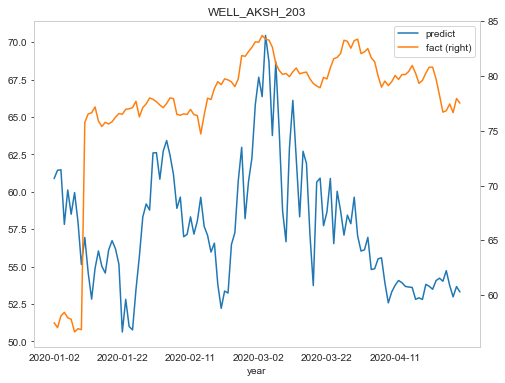

In [96]:
yhat = yhat.flatten() 
Y_traint = Y_traint.flatten()
Y_traint4 = Y_traint[0:120]
datadt4 = datadt[0:120]
import pandas as pd

df = pd.DataFrame(data={'year': datadt4, 
                        'predict': yhat, 
                        'fact': Y_traint4})
import matplotlib.pyplot as plt # Impot the relevant module

fig, ax = plt.subplots() # Create the figure and axes object

# Plot the first x and y axes:
df.plot(x = 'year', y = 'predict',title = "WELL_AKSH_203", ax = ax) 
# Plot the second x and y axes. By secondary_y = True a second y-axis is requested:
# (see https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.plot.html for details)
df.plot(x = 'year', y = 'fact', ax = ax, secondary_y = True)

In [94]:
from sklearn.metrics import r2_score
r2_score(Y_traint4, yhat)

-11.009386506158316

In [95]:
# multivariate mlp example
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate
 
# сэмлы
def split_sequences(sequences, n_steps):
	X, y = list(), list()
	for i in range(len(sequences)):
		# разметка
		end_ix = i + n_steps
		# проверка выхода за пределы
		if end_ix > len(sequences):
			break
		# получение начала и конечной метки
		seq_x, seq_y = sequences[i:end_ix, :-1], sequences[end_ix-1, -1]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
# последовательность
in_seq1 = X_left#[365:1231]
in_seq2 = X_right#[365:1231]

out_seq = Y_train #array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1),6))
in_seq2 = in_seq2.reshape((len(in_seq2),5))
out_seq = out_seq.reshape((len(out_seq),1))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
n_steps = 1
# convert into input/output
X,y = split_sequences(dataset, n_steps)
#y = 
# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]
# первая модель
visible1 = Input(shape=(n_steps,))
dense1 = Dense(100, activation='relu')(visible1)
# вторая модель
visible2 = Input(shape=(n_steps,))
dense2 = Dense(100, activation='relu')(visible2)
# слияние
merge = concatenate([dense1, dense2])
output = Dense(1)(merge)
model = Model(inputs=[visible1, visible2], outputs=output)
model.compile(optimizer='adam', loss='mse', metrics=['accuracy'])
# fit model
model.fit([X1, X2], Y_train, epochs=2000, verbose= 1, batch_size=64, validation_split=0.1)
# demonstrate prediction
#x_input = array([[80, 85], [90, 95], [100, 105]])
#x1 = x_input[:, 0].reshape((1, n_steps))
#x2 = x_input[:, 1].reshape((1, n_steps))
yhat = model.predict([X1, X2], verbose=0)
print(yhat)

Epoch 1/2000
18/18 [==============================] - 0s 9ms/step - loss: 2447.6823 - accuracy: 0.0000e+00 - val_loss: 141.3894 - val_accuracy: 0.0000e+00
Epoch 2/2000
18/18 [==============================] - 0s 3ms/step - loss: 1792.3670 - accuracy: 0.0000e+00 - val_loss: 109.1207 - val_accuracy: 0.0000e+00
Epoch 3/2000
18/18 [==============================] - 0s 3ms/step - loss: 1226.2356 - accuracy: 0.0000e+00 - val_loss: 63.4662 - val_accuracy: 0.0000e+00
Epoch 4/2000
18/18 [==============================] - 0s 3ms/step - loss: 816.7099 - accuracy: 0.0000e+00 - val_loss: 44.8476 - val_accuracy: 0.0000e+00
Epoch 5/2000
18/18 [==============================] - 0s 3ms/step - loss: 495.5300 - accuracy: 0.0000e+00 - val_loss: 45.8308 - val_accuracy: 0.0000e+00
Epoch 6/2000
18/18 [==============================] - 0s 3ms/step - loss: 352.6560 - accuracy: 0.0000e+00 - val_loss: 64.3314 - val_accuracy: 0.0000e+00
Epoch 7/2000
18/18 [==============================] - 0s 3ms/step - loss: 277

18/18 [==============================] - 0s 3ms/step - loss: 179.8329 - accuracy: 0.0000e+00 - val_loss: 58.7764 - val_accuracy: 0.0000e+00
Epoch 108/2000
18/18 [==============================] - 0s 3ms/step - loss: 177.4663 - accuracy: 0.0000e+00 - val_loss: 69.5820 - val_accuracy: 0.0000e+00
Epoch 109/2000
18/18 [==============================] - 0s 3ms/step - loss: 172.1124 - accuracy: 0.0000e+00 - val_loss: 62.7350 - val_accuracy: 0.0000e+00
Epoch 110/2000
18/18 [==============================] - 0s 3ms/step - loss: 190.9243 - accuracy: 0.0000e+00 - val_loss: 70.1355 - val_accuracy: 0.0000e+00
Epoch 111/2000
18/18 [==============================] - 0s 3ms/step - loss: 179.2598 - accuracy: 0.0000e+00 - val_loss: 56.8899 - val_accuracy: 0.0000e+00
Epoch 112/2000
18/18 [==============================] - 0s 3ms/step - loss: 162.2150 - accuracy: 0.0000e+00 - val_loss: 67.5716 - val_accuracy: 0.0000e+00
Epoch 113/2000
18/18 [==============================] - 0s 3ms/step - loss: 163.3830 

Epoch 160/2000
18/18 [==============================] - 0s 3ms/step - loss: 115.1764 - accuracy: 0.0000e+00 - val_loss: 62.3341 - val_accuracy: 0.0000e+00
Epoch 161/2000
18/18 [==============================] - 0s 3ms/step - loss: 109.0706 - accuracy: 0.0000e+00 - val_loss: 54.4579 - val_accuracy: 0.0000e+00
Epoch 162/2000
18/18 [==============================] - 0s 3ms/step - loss: 128.4949 - accuracy: 0.0000e+00 - val_loss: 59.5399 - val_accuracy: 0.0000e+00
Epoch 163/2000
18/18 [==============================] - 0s 3ms/step - loss: 119.6774 - accuracy: 0.0000e+00 - val_loss: 55.2981 - val_accuracy: 0.0000e+00
Epoch 164/2000
18/18 [==============================] - 0s 3ms/step - loss: 120.6014 - accuracy: 0.0000e+00 - val_loss: 54.2630 - val_accuracy: 0.0000e+00
Epoch 165/2000
18/18 [==============================] - 0s 3ms/step - loss: 124.2707 - accuracy: 0.0000e+00 - val_loss: 57.7936 - val_accuracy: 0.0000e+00
Epoch 166/2000
18/18 [==============================] - 0s 3ms/step - 

Epoch 213/2000
18/18 [==============================] - 0s 3ms/step - loss: 107.2437 - accuracy: 0.0000e+00 - val_loss: 58.8716 - val_accuracy: 0.0000e+00
Epoch 214/2000
18/18 [==============================] - 0s 3ms/step - loss: 106.7928 - accuracy: 0.0000e+00 - val_loss: 63.1721 - val_accuracy: 0.0000e+00
Epoch 215/2000
18/18 [==============================] - 0s 3ms/step - loss: 100.6843 - accuracy: 0.0000e+00 - val_loss: 65.8448 - val_accuracy: 0.0000e+00
Epoch 216/2000
18/18 [==============================] - 0s 3ms/step - loss: 118.9366 - accuracy: 0.0000e+00 - val_loss: 63.5251 - val_accuracy: 0.0000e+00
Epoch 217/2000
18/18 [==============================] - 0s 3ms/step - loss: 104.2976 - accuracy: 0.0000e+00 - val_loss: 63.4863 - val_accuracy: 0.0000e+00
Epoch 218/2000
18/18 [==============================] - 0s 3ms/step - loss: 112.6132 - accuracy: 0.0000e+00 - val_loss: 68.6782 - val_accuracy: 0.0000e+00
Epoch 219/2000
18/18 [==============================] - 0s 3ms/step - 

Epoch 266/2000
18/18 [==============================] - 0s 3ms/step - loss: 110.2438 - accuracy: 0.0000e+00 - val_loss: 61.7228 - val_accuracy: 0.0000e+00
Epoch 267/2000
18/18 [==============================] - 0s 3ms/step - loss: 114.9259 - accuracy: 0.0000e+00 - val_loss: 65.1902 - val_accuracy: 0.0000e+00
Epoch 268/2000
18/18 [==============================] - 0s 3ms/step - loss: 108.2454 - accuracy: 0.0000e+00 - val_loss: 65.5667 - val_accuracy: 0.0000e+00
Epoch 269/2000
18/18 [==============================] - 0s 3ms/step - loss: 107.0977 - accuracy: 0.0000e+00 - val_loss: 67.0984 - val_accuracy: 0.0000e+00
Epoch 270/2000
18/18 [==============================] - 0s 3ms/step - loss: 108.6032 - accuracy: 0.0000e+00 - val_loss: 66.4368 - val_accuracy: 0.0000e+00
Epoch 271/2000
18/18 [==============================] - 0s 3ms/step - loss: 110.2914 - accuracy: 0.0000e+00 - val_loss: 69.9153 - val_accuracy: 0.0000e+00
Epoch 272/2000
18/18 [==============================] - 0s 3ms/step - 

Epoch 319/2000
18/18 [==============================] - 0s 3ms/step - loss: 106.1408 - accuracy: 0.0000e+00 - val_loss: 60.9281 - val_accuracy: 0.0000e+00
Epoch 320/2000
18/18 [==============================] - 0s 3ms/step - loss: 104.3950 - accuracy: 0.0000e+00 - val_loss: 61.3282 - val_accuracy: 0.0000e+00
Epoch 321/2000
18/18 [==============================] - 0s 3ms/step - loss: 108.0812 - accuracy: 0.0000e+00 - val_loss: 60.6346 - val_accuracy: 0.0000e+00
Epoch 322/2000
18/18 [==============================] - 0s 3ms/step - loss: 108.0979 - accuracy: 0.0000e+00 - val_loss: 67.4127 - val_accuracy: 0.0000e+00
Epoch 323/2000
18/18 [==============================] - 0s 3ms/step - loss: 110.5738 - accuracy: 0.0000e+00 - val_loss: 64.5408 - val_accuracy: 0.0000e+00
Epoch 324/2000
18/18 [==============================] - 0s 3ms/step - loss: 105.3367 - accuracy: 0.0000e+00 - val_loss: 70.2573 - val_accuracy: 0.0000e+00
Epoch 325/2000
18/18 [==============================] - 0s 3ms/step - 

Epoch 372/2000
18/18 [==============================] - 0s 3ms/step - loss: 111.0351 - accuracy: 0.0000e+00 - val_loss: 71.1880 - val_accuracy: 0.0000e+00
Epoch 373/2000
18/18 [==============================] - 0s 3ms/step - loss: 111.7673 - accuracy: 0.0000e+00 - val_loss: 75.9339 - val_accuracy: 0.0000e+00
Epoch 374/2000
18/18 [==============================] - 0s 3ms/step - loss: 109.9563 - accuracy: 0.0000e+00 - val_loss: 67.7469 - val_accuracy: 0.0000e+00
Epoch 375/2000
18/18 [==============================] - 0s 3ms/step - loss: 112.8336 - accuracy: 0.0000e+00 - val_loss: 82.2331 - val_accuracy: 0.0000e+00
Epoch 376/2000
18/18 [==============================] - 0s 3ms/step - loss: 112.3230 - accuracy: 0.0000e+00 - val_loss: 65.3680 - val_accuracy: 0.0000e+00
Epoch 377/2000
18/18 [==============================] - 0s 3ms/step - loss: 112.4275 - accuracy: 0.0000e+00 - val_loss: 63.2191 - val_accuracy: 0.0000e+00
Epoch 378/2000
18/18 [==============================] - 0s 2ms/step - 

Epoch 425/2000
18/18 [==============================] - 0s 3ms/step - loss: 111.5202 - accuracy: 0.0000e+00 - val_loss: 71.9017 - val_accuracy: 0.0000e+00
Epoch 426/2000
18/18 [==============================] - 0s 3ms/step - loss: 109.5020 - accuracy: 0.0000e+00 - val_loss: 73.2416 - val_accuracy: 0.0000e+00
Epoch 427/2000
18/18 [==============================] - 0s 3ms/step - loss: 108.2588 - accuracy: 0.0000e+00 - val_loss: 73.6396 - val_accuracy: 0.0000e+00
Epoch 428/2000
18/18 [==============================] - 0s 3ms/step - loss: 107.2798 - accuracy: 0.0000e+00 - val_loss: 62.5357 - val_accuracy: 0.0000e+00
Epoch 429/2000
18/18 [==============================] - 0s 3ms/step - loss: 111.9558 - accuracy: 0.0000e+00 - val_loss: 63.5501 - val_accuracy: 0.0000e+00
Epoch 430/2000
18/18 [==============================] - 0s 3ms/step - loss: 109.1872 - accuracy: 0.0000e+00 - val_loss: 65.9048 - val_accuracy: 0.0000e+00
Epoch 431/2000
18/18 [==============================] - 0s 3ms/step - 

Epoch 530/2000
18/18 [==============================] - 0s 3ms/step - loss: 108.5701 - accuracy: 0.0000e+00 - val_loss: 65.4757 - val_accuracy: 0.0000e+00
Epoch 531/2000
18/18 [==============================] - 0s 3ms/step - loss: 107.6896 - accuracy: 0.0000e+00 - val_loss: 74.2182 - val_accuracy: 0.0000e+00
Epoch 532/2000
18/18 [==============================] - 0s 3ms/step - loss: 112.0872 - accuracy: 0.0000e+00 - val_loss: 67.5736 - val_accuracy: 0.0000e+00
Epoch 533/2000
18/18 [==============================] - 0s 3ms/step - loss: 106.3734 - accuracy: 0.0000e+00 - val_loss: 69.2129 - val_accuracy: 0.0000e+00
Epoch 534/2000
18/18 [==============================] - 0s 2ms/step - loss: 107.6112 - accuracy: 0.0000e+00 - val_loss: 67.7125 - val_accuracy: 0.0000e+00
Epoch 535/2000
18/18 [==============================] - 0s 2ms/step - loss: 107.0662 - accuracy: 0.0000e+00 - val_loss: 73.0327 - val_accuracy: 0.0000e+00
Epoch 536/2000
18/18 [==============================] - 0s 3ms/step - 

Epoch 635/2000
18/18 [==============================] - 0s 3ms/step - loss: 110.6727 - accuracy: 0.0000e+00 - val_loss: 64.2769 - val_accuracy: 0.0000e+00
Epoch 636/2000
18/18 [==============================] - 0s 3ms/step - loss: 106.8348 - accuracy: 0.0000e+00 - val_loss: 68.6868 - val_accuracy: 0.0000e+00
Epoch 637/2000
18/18 [==============================] - 0s 2ms/step - loss: 109.8347 - accuracy: 0.0000e+00 - val_loss: 65.2417 - val_accuracy: 0.0000e+00
Epoch 638/2000
18/18 [==============================] - 0s 3ms/step - loss: 105.8325 - accuracy: 0.0000e+00 - val_loss: 67.1793 - val_accuracy: 0.0000e+00
Epoch 639/2000
18/18 [==============================] - 0s 2ms/step - loss: 106.8659 - accuracy: 0.0000e+00 - val_loss: 70.3898 - val_accuracy: 0.0000e+00
Epoch 640/2000
18/18 [==============================] - 0s 3ms/step - loss: 108.8323 - accuracy: 0.0000e+00 - val_loss: 65.5746 - val_accuracy: 0.0000e+00
Epoch 641/2000
18/18 [==============================] - 0s 2ms/step - 

Epoch 688/2000
18/18 [==============================] - 0s 2ms/step - loss: 108.4864 - accuracy: 0.0000e+00 - val_loss: 65.5980 - val_accuracy: 0.0000e+00
Epoch 689/2000
18/18 [==============================] - 0s 3ms/step - loss: 105.6865 - accuracy: 0.0000e+00 - val_loss: 68.9267 - val_accuracy: 0.0000e+00
Epoch 690/2000
18/18 [==============================] - 0s 3ms/step - loss: 109.9388 - accuracy: 0.0000e+00 - val_loss: 72.2331 - val_accuracy: 0.0000e+00
Epoch 691/2000
18/18 [==============================] - 0s 3ms/step - loss: 115.0820 - accuracy: 0.0000e+00 - val_loss: 72.8186 - val_accuracy: 0.0000e+00
Epoch 692/2000
18/18 [==============================] - 0s 3ms/step - loss: 110.4014 - accuracy: 0.0000e+00 - val_loss: 64.4775 - val_accuracy: 0.0000e+00
Epoch 693/2000
18/18 [==============================] - 0s 3ms/step - loss: 112.6631 - accuracy: 0.0000e+00 - val_loss: 63.6104 - val_accuracy: 0.0000e+00
Epoch 694/2000
18/18 [==============================] - 0s 3ms/step - 

Epoch 741/2000
18/18 [==============================] - 0s 2ms/step - loss: 103.4520 - accuracy: 0.0000e+00 - val_loss: 65.9493 - val_accuracy: 0.0000e+00
Epoch 742/2000
18/18 [==============================] - 0s 2ms/step - loss: 113.0383 - accuracy: 0.0000e+00 - val_loss: 66.1955 - val_accuracy: 0.0000e+00
Epoch 743/2000
18/18 [==============================] - 0s 2ms/step - loss: 107.5755 - accuracy: 0.0000e+00 - val_loss: 67.3889 - val_accuracy: 0.0000e+00
Epoch 744/2000
18/18 [==============================] - 0s 2ms/step - loss: 111.4987 - accuracy: 0.0000e+00 - val_loss: 66.9348 - val_accuracy: 0.0000e+00
Epoch 745/2000
18/18 [==============================] - 0s 2ms/step - loss: 97.8039 - accuracy: 0.0000e+00 - val_loss: 68.9746 - val_accuracy: 0.0000e+00
Epoch 746/2000
18/18 [==============================] - 0s 2ms/step - loss: 111.7480 - accuracy: 0.0000e+00 - val_loss: 67.6806 - val_accuracy: 0.0000e+00
Epoch 747/2000
18/18 [==============================] - 0s 2ms/step - l

Epoch 846/2000
18/18 [==============================] - 0s 2ms/step - loss: 112.9633 - accuracy: 0.0000e+00 - val_loss: 66.1600 - val_accuracy: 0.0000e+00
Epoch 847/2000
18/18 [==============================] - 0s 2ms/step - loss: 104.6282 - accuracy: 0.0000e+00 - val_loss: 64.8126 - val_accuracy: 0.0000e+00
Epoch 848/2000
18/18 [==============================] - 0s 3ms/step - loss: 107.1364 - accuracy: 0.0000e+00 - val_loss: 60.8878 - val_accuracy: 0.0000e+00
Epoch 849/2000
18/18 [==============================] - 0s 2ms/step - loss: 104.0042 - accuracy: 0.0000e+00 - val_loss: 68.4993 - val_accuracy: 0.0000e+00
Epoch 850/2000
18/18 [==============================] - 0s 2ms/step - loss: 107.0354 - accuracy: 0.0000e+00 - val_loss: 62.3087 - val_accuracy: 0.0000e+00
Epoch 851/2000
18/18 [==============================] - 0s 2ms/step - loss: 107.2939 - accuracy: 0.0000e+00 - val_loss: 64.5182 - val_accuracy: 0.0000e+00
Epoch 852/2000
18/18 [==============================] - 0s 2ms/step - 

Epoch 899/2000
18/18 [==============================] - 0s 2ms/step - loss: 107.3777 - accuracy: 0.0000e+00 - val_loss: 65.9963 - val_accuracy: 0.0000e+00
Epoch 900/2000
18/18 [==============================] - 0s 3ms/step - loss: 109.2514 - accuracy: 0.0000e+00 - val_loss: 69.7427 - val_accuracy: 0.0000e+00
Epoch 901/2000
18/18 [==============================] - 0s 3ms/step - loss: 106.9947 - accuracy: 0.0000e+00 - val_loss: 67.5206 - val_accuracy: 0.0000e+00
Epoch 902/2000
18/18 [==============================] - 0s 3ms/step - loss: 107.9146 - accuracy: 0.0000e+00 - val_loss: 76.2003 - val_accuracy: 0.0000e+00
Epoch 903/2000
18/18 [==============================] - 0s 3ms/step - loss: 105.2255 - accuracy: 0.0000e+00 - val_loss: 75.4271 - val_accuracy: 0.0000e+00
Epoch 904/2000
18/18 [==============================] - 0s 3ms/step - loss: 106.1576 - accuracy: 0.0000e+00 - val_loss: 62.1129 - val_accuracy: 0.0000e+00
Epoch 905/2000
18/18 [==============================] - 0s 3ms/step - 

Epoch 952/2000
18/18 [==============================] - 0s 2ms/step - loss: 99.5044 - accuracy: 0.0000e+00 - val_loss: 68.5666 - val_accuracy: 0.0000e+00
Epoch 953/2000
18/18 [==============================] - 0s 3ms/step - loss: 103.8083 - accuracy: 0.0000e+00 - val_loss: 71.6286 - val_accuracy: 0.0000e+00
Epoch 954/2000
18/18 [==============================] - 0s 2ms/step - loss: 103.0877 - accuracy: 0.0000e+00 - val_loss: 69.7677 - val_accuracy: 0.0000e+00
Epoch 955/2000
18/18 [==============================] - 0s 2ms/step - loss: 100.0360 - accuracy: 0.0000e+00 - val_loss: 67.2806 - val_accuracy: 0.0000e+00
Epoch 956/2000
18/18 [==============================] - 0s 3ms/step - loss: 107.5832 - accuracy: 0.0000e+00 - val_loss: 71.7745 - val_accuracy: 0.0000e+00
Epoch 957/2000
18/18 [==============================] - 0s 3ms/step - loss: 109.8261 - accuracy: 0.0000e+00 - val_loss: 63.9231 - val_accuracy: 0.0000e+00
Epoch 958/2000
18/18 [==============================] - 0s 3ms/step - l

Epoch 1005/2000
18/18 [==============================] - 0s 3ms/step - loss: 106.7664 - accuracy: 0.0000e+00 - val_loss: 74.0450 - val_accuracy: 0.0000e+00
Epoch 1006/2000
18/18 [==============================] - 0s 3ms/step - loss: 108.4181 - accuracy: 0.0000e+00 - val_loss: 71.9269 - val_accuracy: 0.0000e+00
Epoch 1007/2000
18/18 [==============================] - 0s 2ms/step - loss: 98.8511 - accuracy: 0.0000e+00 - val_loss: 65.7959 - val_accuracy: 0.0000e+00
Epoch 1008/2000
18/18 [==============================] - 0s 2ms/step - loss: 105.5354 - accuracy: 0.0000e+00 - val_loss: 63.4105 - val_accuracy: 0.0000e+00
Epoch 1009/2000
18/18 [==============================] - 0s 2ms/step - loss: 105.9052 - accuracy: 0.0000e+00 - val_loss: 64.0478 - val_accuracy: 0.0000e+00
Epoch 1010/2000
18/18 [==============================] - 0s 3ms/step - loss: 100.8513 - accuracy: 0.0000e+00 - val_loss: 68.2000 - val_accuracy: 0.0000e+00
Epoch 1011/2000
18/18 [==============================] - 0s 3ms/s

18/18 [==============================] - 0s 3ms/step - loss: 100.8663 - accuracy: 0.0000e+00 - val_loss: 64.4746 - val_accuracy: 0.0000e+00
Epoch 1110/2000
18/18 [==============================] - 0s 3ms/step - loss: 99.9292 - accuracy: 0.0000e+00 - val_loss: 63.1555 - val_accuracy: 0.0000e+00
Epoch 1111/2000
18/18 [==============================] - 0s 3ms/step - loss: 101.6763 - accuracy: 0.0000e+00 - val_loss: 62.6106 - val_accuracy: 0.0000e+00
Epoch 1112/2000
18/18 [==============================] - 0s 3ms/step - loss: 106.1689 - accuracy: 0.0000e+00 - val_loss: 62.6896 - val_accuracy: 0.0000e+00
Epoch 1113/2000
18/18 [==============================] - 0s 3ms/step - loss: 107.3889 - accuracy: 0.0000e+00 - val_loss: 62.8124 - val_accuracy: 0.0000e+00
Epoch 1114/2000
18/18 [==============================] - 0s 2ms/step - loss: 98.8180 - accuracy: 0.0000e+00 - val_loss: 64.5465 - val_accuracy: 0.0000e+00
Epoch 1115/2000
18/18 [==============================] - 0s 3ms/step - loss: 103.5

18/18 [==============================] - 0s 2ms/step - loss: 105.7723 - accuracy: 0.0000e+00 - val_loss: 75.8101 - val_accuracy: 0.0000e+00
Epoch 1214/2000
18/18 [==============================] - 0s 2ms/step - loss: 110.2131 - accuracy: 0.0000e+00 - val_loss: 71.1027 - val_accuracy: 0.0000e+00
Epoch 1215/2000
18/18 [==============================] - 0s 2ms/step - loss: 103.2856 - accuracy: 0.0000e+00 - val_loss: 66.7021 - val_accuracy: 0.0000e+00
Epoch 1216/2000
18/18 [==============================] - 0s 2ms/step - loss: 99.4817 - accuracy: 0.0000e+00 - val_loss: 67.7981 - val_accuracy: 0.0000e+00
Epoch 1217/2000
18/18 [==============================] - 0s 2ms/step - loss: 103.9273 - accuracy: 0.0000e+00 - val_loss: 66.7440 - val_accuracy: 0.0000e+00
Epoch 1218/2000
18/18 [==============================] - 0s 2ms/step - loss: 98.1649 - accuracy: 0.0000e+00 - val_loss: 66.4057 - val_accuracy: 0.0000e+00
Epoch 1219/2000
18/18 [==============================] - 0s 3ms/step - loss: 101.4

Epoch 1266/2000
18/18 [==============================] - 0s 2ms/step - loss: 105.2628 - accuracy: 0.0000e+00 - val_loss: 63.3646 - val_accuracy: 0.0000e+00
Epoch 1267/2000
18/18 [==============================] - 0s 3ms/step - loss: 100.1809 - accuracy: 0.0000e+00 - val_loss: 64.5330 - val_accuracy: 0.0000e+00
Epoch 1268/2000
18/18 [==============================] - 0s 2ms/step - loss: 101.3472 - accuracy: 0.0000e+00 - val_loss: 65.1662 - val_accuracy: 0.0000e+00
Epoch 1269/2000
18/18 [==============================] - 0s 2ms/step - loss: 105.3939 - accuracy: 0.0000e+00 - val_loss: 71.2009 - val_accuracy: 0.0000e+00
Epoch 1270/2000
18/18 [==============================] - 0s 3ms/step - loss: 102.7749 - accuracy: 0.0000e+00 - val_loss: 65.8332 - val_accuracy: 0.0000e+00
Epoch 1271/2000
18/18 [==============================] - 0s 3ms/step - loss: 102.8755 - accuracy: 0.0000e+00 - val_loss: 65.5795 - val_accuracy: 0.0000e+00
Epoch 1272/2000
18/18 [==============================] - 0s 3ms/

18/18 [==============================] - 0s 2ms/step - loss: 102.9883 - accuracy: 0.0000e+00 - val_loss: 67.2176 - val_accuracy: 0.0000e+00
Epoch 1371/2000
18/18 [==============================] - 0s 3ms/step - loss: 104.9683 - accuracy: 0.0000e+00 - val_loss: 66.8390 - val_accuracy: 0.0000e+00
Epoch 1372/2000
18/18 [==============================] - 0s 3ms/step - loss: 108.4522 - accuracy: 0.0000e+00 - val_loss: 65.9945 - val_accuracy: 0.0000e+00
Epoch 1373/2000
18/18 [==============================] - 0s 2ms/step - loss: 105.4550 - accuracy: 0.0000e+00 - val_loss: 64.3079 - val_accuracy: 0.0000e+00
Epoch 1374/2000
18/18 [==============================] - 0s 2ms/step - loss: 96.7852 - accuracy: 0.0000e+00 - val_loss: 65.4662 - val_accuracy: 0.0000e+00
Epoch 1375/2000
18/18 [==============================] - 0s 2ms/step - loss: 107.9551 - accuracy: 0.0000e+00 - val_loss: 64.3681 - val_accuracy: 0.0000e+00
Epoch 1376/2000
18/18 [==============================] - 0s 2ms/step - loss: 107.

Epoch 1423/2000
18/18 [==============================] - 0s 2ms/step - loss: 106.9900 - accuracy: 0.0000e+00 - val_loss: 65.8795 - val_accuracy: 0.0000e+00
Epoch 1424/2000
18/18 [==============================] - 0s 2ms/step - loss: 100.2867 - accuracy: 0.0000e+00 - val_loss: 65.8345 - val_accuracy: 0.0000e+00
Epoch 1425/2000
18/18 [==============================] - 0s 3ms/step - loss: 105.4160 - accuracy: 0.0000e+00 - val_loss: 81.2650 - val_accuracy: 0.0000e+00
Epoch 1426/2000
18/18 [==============================] - 0s 2ms/step - loss: 97.7685 - accuracy: 0.0000e+00 - val_loss: 69.0557 - val_accuracy: 0.0000e+00
Epoch 1427/2000
18/18 [==============================] - 0s 2ms/step - loss: 97.3060 - accuracy: 0.0000e+00 - val_loss: 65.9517 - val_accuracy: 0.0000e+00
Epoch 1428/2000
18/18 [==============================] - 0s 3ms/step - loss: 98.8969 - accuracy: 0.0000e+00 - val_loss: 66.6664 - val_accuracy: 0.0000e+00
Epoch 1429/2000
18/18 [==============================] - 0s 3ms/ste

Epoch 1528/2000
18/18 [==============================] - 0s 3ms/step - loss: 103.5926 - accuracy: 0.0000e+00 - val_loss: 74.0505 - val_accuracy: 0.0000e+00
Epoch 1529/2000
18/18 [==============================] - 0s 3ms/step - loss: 103.8103 - accuracy: 0.0000e+00 - val_loss: 63.8194 - val_accuracy: 0.0000e+00
Epoch 1530/2000
18/18 [==============================] - 0s 3ms/step - loss: 103.0206 - accuracy: 0.0000e+00 - val_loss: 79.1248 - val_accuracy: 0.0000e+00
Epoch 1531/2000
18/18 [==============================] - 0s 3ms/step - loss: 107.4970 - accuracy: 0.0000e+00 - val_loss: 77.6652 - val_accuracy: 0.0000e+00
Epoch 1532/2000
18/18 [==============================] - 0s 3ms/step - loss: 99.7795 - accuracy: 0.0000e+00 - val_loss: 70.9204 - val_accuracy: 0.0000e+00
Epoch 1533/2000
18/18 [==============================] - 0s 3ms/step - loss: 103.2682 - accuracy: 0.0000e+00 - val_loss: 63.8864 - val_accuracy: 0.0000e+00
Epoch 1534/2000
18/18 [==============================] - 0s 3ms/s

18/18 [==============================] - 0s 3ms/step - loss: 101.0027 - accuracy: 0.0000e+00 - val_loss: 71.5491 - val_accuracy: 0.0000e+00
Epoch 1633/2000
18/18 [==============================] - 0s 3ms/step - loss: 108.0046 - accuracy: 0.0000e+00 - val_loss: 64.2671 - val_accuracy: 0.0000e+00
Epoch 1634/2000
18/18 [==============================] - 0s 3ms/step - loss: 99.0871 - accuracy: 0.0000e+00 - val_loss: 64.0740 - val_accuracy: 0.0000e+00
Epoch 1635/2000
18/18 [==============================] - 0s 3ms/step - loss: 99.7644 - accuracy: 0.0000e+00 - val_loss: 66.2138 - val_accuracy: 0.0000e+00
Epoch 1636/2000
18/18 [==============================] - 0s 3ms/step - loss: 102.2882 - accuracy: 0.0000e+00 - val_loss: 63.5364 - val_accuracy: 0.0000e+00
Epoch 1637/2000
18/18 [==============================] - 0s 3ms/step - loss: 97.8457 - accuracy: 0.0000e+00 - val_loss: 62.8966 - val_accuracy: 0.0000e+00
Epoch 1638/2000
18/18 [==============================] - 0s 3ms/step - loss: 100.93

Epoch 1685/2000
18/18 [==============================] - 0s 3ms/step - loss: 101.1756 - accuracy: 0.0000e+00 - val_loss: 59.6764 - val_accuracy: 0.0000e+00
Epoch 1686/2000
18/18 [==============================] - 0s 3ms/step - loss: 104.6732 - accuracy: 0.0000e+00 - val_loss: 59.9858 - val_accuracy: 0.0000e+00
Epoch 1687/2000
18/18 [==============================] - 0s 3ms/step - loss: 107.3164 - accuracy: 0.0000e+00 - val_loss: 62.1527 - val_accuracy: 0.0000e+00
Epoch 1688/2000
18/18 [==============================] - 0s 3ms/step - loss: 105.0804 - accuracy: 0.0000e+00 - val_loss: 63.7733 - val_accuracy: 0.0000e+00
Epoch 1689/2000
18/18 [==============================] - 0s 3ms/step - loss: 102.5738 - accuracy: 0.0000e+00 - val_loss: 59.9656 - val_accuracy: 0.0000e+00
Epoch 1690/2000
18/18 [==============================] - 0s 3ms/step - loss: 98.2030 - accuracy: 0.0000e+00 - val_loss: 62.5225 - val_accuracy: 0.0000e+00
Epoch 1691/2000
18/18 [==============================] - 0s 3ms/s

Epoch 1790/2000
18/18 [==============================] - 0s 3ms/step - loss: 106.6083 - accuracy: 0.0000e+00 - val_loss: 69.5145 - val_accuracy: 0.0000e+00
Epoch 1791/2000
18/18 [==============================] - 0s 3ms/step - loss: 106.4836 - accuracy: 0.0000e+00 - val_loss: 66.0362 - val_accuracy: 0.0000e+00
Epoch 1792/2000
18/18 [==============================] - 0s 3ms/step - loss: 100.4168 - accuracy: 0.0000e+00 - val_loss: 63.9029 - val_accuracy: 0.0000e+00
Epoch 1793/2000
18/18 [==============================] - 0s 3ms/step - loss: 108.1096 - accuracy: 0.0000e+00 - val_loss: 67.6725 - val_accuracy: 0.0000e+00
Epoch 1794/2000
18/18 [==============================] - 0s 3ms/step - loss: 107.0556 - accuracy: 0.0000e+00 - val_loss: 65.8126 - val_accuracy: 0.0000e+00
Epoch 1795/2000
18/18 [==============================] - 0s 3ms/step - loss: 100.4704 - accuracy: 0.0000e+00 - val_loss: 70.9874 - val_accuracy: 0.0000e+00
Epoch 1796/2000
18/18 [==============================] - 0s 3ms/

18/18 [==============================] - 0s 3ms/step - loss: 95.4911 - accuracy: 0.0000e+00 - val_loss: 59.9248 - val_accuracy: 0.0000e+00
Epoch 1895/2000
18/18 [==============================] - 0s 3ms/step - loss: 99.9696 - accuracy: 0.0000e+00 - val_loss: 60.3529 - val_accuracy: 0.0000e+00
Epoch 1896/2000
18/18 [==============================] - 0s 3ms/step - loss: 100.4123 - accuracy: 0.0000e+00 - val_loss: 62.9738 - val_accuracy: 0.0000e+00
Epoch 1897/2000
18/18 [==============================] - 0s 3ms/step - loss: 98.0666 - accuracy: 0.0000e+00 - val_loss: 61.6956 - val_accuracy: 0.0000e+00
Epoch 1898/2000
18/18 [==============================] - 0s 3ms/step - loss: 107.8469 - accuracy: 0.0000e+00 - val_loss: 67.1329 - val_accuracy: 0.0000e+00
Epoch 1899/2000
18/18 [==============================] - 0s 3ms/step - loss: 107.1990 - accuracy: 0.0000e+00 - val_loss: 62.3931 - val_accuracy: 0.0000e+00
Epoch 1900/2000
18/18 [==============================] - 0s 3ms/step - loss: 102.28

Epoch 1947/2000
18/18 [==============================] - 0s 3ms/step - loss: 99.9409 - accuracy: 0.0000e+00 - val_loss: 66.4167 - val_accuracy: 0.0000e+00
Epoch 1948/2000
18/18 [==============================] - 0s 3ms/step - loss: 105.8409 - accuracy: 0.0000e+00 - val_loss: 64.6668 - val_accuracy: 0.0000e+00
Epoch 1949/2000
18/18 [==============================] - 0s 3ms/step - loss: 101.8286 - accuracy: 0.0000e+00 - val_loss: 69.0695 - val_accuracy: 0.0000e+00
Epoch 1950/2000
18/18 [==============================] - 0s 3ms/step - loss: 97.2252 - accuracy: 0.0000e+00 - val_loss: 65.7263 - val_accuracy: 0.0000e+00
Epoch 1951/2000
18/18 [==============================] - 0s 3ms/step - loss: 103.9974 - accuracy: 0.0000e+00 - val_loss: 67.8255 - val_accuracy: 0.0000e+00
Epoch 1952/2000
18/18 [==============================] - 0s 3ms/step - loss: 96.9685 - accuracy: 0.0000e+00 - val_loss: 69.4605 - val_accuracy: 0.0000e+00
Epoch 1953/2000
18/18 [==============================] - 0s 3ms/ste

In [97]:
yhat = yhat.flatten() 
Y_train = Y_train.flatten()

In [697]:
Y_train.shape #yhat = Y_train[0:866]
datadd.shape
Y_train = Y_train[0:866]
yhat = Y_train[0:866]


In [99]:
datadd = data.index
#datadd = features.index 
datadd = datadd.to_numpy()

df = pd.DataFrame(data={'year': datadd, 
                        'predict': yhat, 
                        'fact': Y_train})

<AxesSubplot:label='f508f0ac-7050-43ec-a016-13be7077fb3d'>

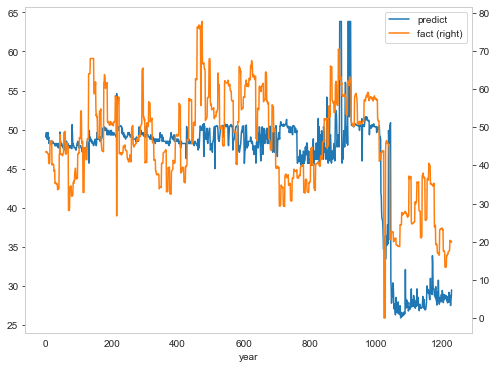

In [100]:
import matplotlib.pyplot as plt # Impot the relevant module


fig, ax = plt.subplots() # Create the figure and axes object

# Plot the first x and y axes:
df.plot(x = 'year', y = 'predict', ax = ax) 
# Plot the second x and y axes. By secondary_y = True a second y-axis is requested:
# (see https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.plot.html for details)
df.plot(x = 'year', y = 'fact', ax = ax, secondary_y = True)

In [700]:
from sklearn.metrics import r2_score
r2_score(Y_train, yhat)

1.0

In [701]:
from sklearn.metrics import mean_squared_error
mean_squared_error(Y_train, yhat)

0.0

# LIQ_VOL223

In [122]:
#features2s =[features_considered_south2] 
#features2 = datan['AKSH_424_water_vol','AKSH_249_water_vol','AKSH_247_water_vol','AKSH_250_water_vol','AKSH_424_water_vol','AKSH_214_water_vol']
#X_left = features2 #data2['AKSH_298_bhp_pump_press','AKSH_213_bhp_pump_press','AKSH_203_bhp_pump_press','AKSH_223_bhp_pump_press','AKSH_226_bhp_pump_press']

X_left = dataws #= data[features_considered_south1]
X_left = X_left.shift(-15)
#X_left = data2[features2]
X_right = data[features_considered_south2]
Y_train = data['AKSH_223_liq_vol']#,'AKSH_226_liq_vol'] 
X_left = np.asarray(X_left)
X_right = np.asarray(X_right) 
Y_train = np.asarray(Y_train) 

In [123]:
X_leftl = X_left[(data.index < '2020-01-01')]
X_rightl = X_right[(data.index < '2020-01-01')]
Y_trainl = Y_train[(data.index < '2020-01-01')]#,'AKSH_226_liq_vol'] 


X_leftt = X_left[(data.index > '2020-01-01')]
X_rightt = X_right[(data.index > '2020-01-01')]
Y_traint = Y_train[(data.index > '2020-01-01')]#,'AKSH_226_liq_vol'] 

datadd = data.index
datadt = datadd[(data.index > '2020-01-01')]
datadl = datadd[(data.index < '2020-01-01')]

X_left = np.asarray(X_left)
X_right = np.asarray(X_right) 
Y_train = np.asarray(Y_train)
X_leftl = np.asarray(X_leftl)
X_rightl = np.asarray(X_rightl) 
Y_trainl = np.asarray(Y_trainl)
X_leftt = np.asarray(X_leftt)
X_rightt = np.asarray(X_rightt) 
Y_traint = np.asarray(Y_traint)

In [126]:
# multivariate mlp example
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate
 
# сэмлы
def split_sequences(sequences, n_steps):
	X, y = list(), list()
	for i in range(len(sequences)):
		# разметка
		end_ix = i + n_steps
		# проверка выхода за пределы
		if end_ix > len(sequences):
			break
		# получение начала и конечной метки
		seq_x, seq_y = sequences[i:end_ix, :-1], sequences[end_ix-1, -1]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
# последовательность
in_seq1 = X_leftl
in_seq2 = X_rightl

out_seq = Y_trainl #array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1),6))
in_seq2 = in_seq2.reshape((len(in_seq2),5))
out_seq = out_seq.reshape((len(out_seq),1))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
n_steps = 15
# convert into input/output
X,y = split_sequences(dataset, n_steps)
#y = 
# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]
# первая модель
visible1 = Input(shape=(n_steps,))
dense1 = Dense(100, activation='relu')(visible1)
dense21 = Dense(10, activation='relu')(dense1)
# вторая модель
visible2 = Input(shape=(n_steps,))
dense2 = Dense(100, activation='relu')(visible2)
dense22 = Dense(10, activation='relu')(dense2)
# слияние
# слияние
merge = concatenate([dense1, dense2])
output = Dense(1)(merge)
model = Model(inputs=[visible1, visible2], outputs=output)
model.compile(optimizer='adam', loss='mse', metrics=['accuracy'])
# fit model
model.fit([X1, X2], Y_trainl, epochs=2000, verbose= 1, batch_size=64, validation_split=0.1)
# demonstrate prediction
#x_input = array([[80, 85], [90, 95], [100, 105]])
#x1 = x_input[:, 0].reshape((1, n_steps))
#x2 = x_input[:, 1].reshape((1, n_steps))

 
# последовательность
in_seq1t = X_leftt
in_seq2t = X_rightt

out_seqt = Y_traint #array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1t = in_seq1.reshape((len(in_seq1),6))
in_seq2t = in_seq2.reshape((len(in_seq2),5))
out_seqt = out_seq.reshape((len(out_seq),1))
# горизонтальное последовательное размещение данных 
datasett = hstack((in_seq1t, in_seq2t, out_seqt))
# таймстепы
n_steps = 15
# convert into input/output
Xt,yt = split_sequences(datasett, n_steps)
X1t = Xt[:, :, 0]
X2t = Xt[:, :, 1]
yhatt = model.predict([X1t, X2t], verbose=0)
print(yhatt)

Epoch 1/2000
11/11 [==============================] - 1s 16ms/step - loss: 576.9345 - accuracy: 0.0000e+00 - val_loss: 718.6424 - val_accuracy: 0.0000e+00
Epoch 2/2000
11/11 [==============================] - 0s 4ms/step - loss: 313.6164 - accuracy: 0.0000e+00 - val_loss: 1570.1440 - val_accuracy: 0.0000e+00
Epoch 3/2000
11/11 [==============================] - 0s 4ms/step - loss: 235.0586 - accuracy: 0.0000e+00 - val_loss: 531.4756 - val_accuracy: 0.0000e+00
Epoch 4/2000
11/11 [==============================] - 0s 4ms/step - loss: 197.9119 - accuracy: 0.0000e+00 - val_loss: 791.0752 - val_accuracy: 0.0000e+00
Epoch 5/2000
11/11 [==============================] - 0s 4ms/step - loss: 180.8960 - accuracy: 0.0000e+00 - val_loss: 564.7542 - val_accuracy: 0.0000e+00
Epoch 6/2000
11/11 [==============================] - 0s 4ms/step - loss: 168.1043 - accuracy: 0.0000e+00 - val_loss: 707.5760 - val_accuracy: 0.0000e+00
Epoch 7/2000
11/11 [==============================] - 0s 5ms/step - loss: 

Epoch 54/2000
11/11 [==============================] - 0s 4ms/step - loss: 135.4835 - accuracy: 0.0000e+00 - val_loss: 2590.1379 - val_accuracy: 0.0000e+00
Epoch 55/2000
11/11 [==============================] - 0s 4ms/step - loss: 124.0239 - accuracy: 0.0000e+00 - val_loss: 2434.8018 - val_accuracy: 0.0000e+00
Epoch 56/2000
11/11 [==============================] - 0s 4ms/step - loss: 141.5434 - accuracy: 0.0000e+00 - val_loss: 2714.2024 - val_accuracy: 0.0000e+00
Epoch 57/2000
11/11 [==============================] - 0s 4ms/step - loss: 137.3388 - accuracy: 0.0000e+00 - val_loss: 3172.4932 - val_accuracy: 0.0000e+00
Epoch 58/2000
11/11 [==============================] - 0s 4ms/step - loss: 119.5787 - accuracy: 0.0000e+00 - val_loss: 3022.9600 - val_accuracy: 0.0000e+00
Epoch 59/2000
11/11 [==============================] - 0s 4ms/step - loss: 126.4684 - accuracy: 0.0000e+00 - val_loss: 2939.4778 - val_accuracy: 0.0000e+00
Epoch 60/2000
11/11 [==============================] - 0s 4ms/st

11/11 [==============================] - 0s 4ms/step - loss: 97.2071 - accuracy: 0.0000e+00 - val_loss: 3106.1726 - val_accuracy: 0.0000e+00
Epoch 159/2000
11/11 [==============================] - 0s 4ms/step - loss: 94.0621 - accuracy: 0.0000e+00 - val_loss: 3205.6191 - val_accuracy: 0.0000e+00
Epoch 160/2000
11/11 [==============================] - 0s 4ms/step - loss: 97.9024 - accuracy: 0.0000e+00 - val_loss: 3646.9619 - val_accuracy: 0.0000e+00
Epoch 161/2000
11/11 [==============================] - 0s 4ms/step - loss: 96.2963 - accuracy: 0.0000e+00 - val_loss: 3262.5688 - val_accuracy: 0.0000e+00
Epoch 162/2000
11/11 [==============================] - 0s 4ms/step - loss: 97.9764 - accuracy: 0.0000e+00 - val_loss: 3221.6580 - val_accuracy: 0.0000e+00
Epoch 163/2000
11/11 [==============================] - 0s 4ms/step - loss: 90.1925 - accuracy: 0.0000e+00 - val_loss: 3320.5198 - val_accuracy: 0.0000e+00
Epoch 164/2000
11/11 [==============================] - 0s 4ms/step - loss: 89.

11/11 [==============================] - 0s 4ms/step - loss: 83.5477 - accuracy: 0.0000e+00 - val_loss: 1936.6302 - val_accuracy: 0.0000e+00
Epoch 263/2000
11/11 [==============================] - 0s 4ms/step - loss: 84.9560 - accuracy: 0.0000e+00 - val_loss: 1877.6055 - val_accuracy: 0.0000e+00
Epoch 264/2000
11/11 [==============================] - 0s 4ms/step - loss: 80.7671 - accuracy: 0.0000e+00 - val_loss: 1735.2583 - val_accuracy: 0.0000e+00
Epoch 265/2000
11/11 [==============================] - 0s 4ms/step - loss: 79.7008 - accuracy: 0.0000e+00 - val_loss: 1801.4004 - val_accuracy: 0.0000e+00
Epoch 266/2000
11/11 [==============================] - 0s 4ms/step - loss: 85.2462 - accuracy: 0.0000e+00 - val_loss: 1627.6243 - val_accuracy: 0.0000e+00
Epoch 267/2000
11/11 [==============================] - 0s 4ms/step - loss: 94.2522 - accuracy: 0.0000e+00 - val_loss: 1806.4491 - val_accuracy: 0.0000e+00
Epoch 268/2000
11/11 [==============================] - 0s 4ms/step - loss: 89.

11/11 [==============================] - 0s 4ms/step - loss: 79.8017 - accuracy: 0.0000e+00 - val_loss: 1066.4808 - val_accuracy: 0.0000e+00
Epoch 367/2000
11/11 [==============================] - 0s 4ms/step - loss: 83.4225 - accuracy: 0.0000e+00 - val_loss: 1125.5631 - val_accuracy: 0.0000e+00
Epoch 368/2000
11/11 [==============================] - 0s 4ms/step - loss: 84.6306 - accuracy: 0.0000e+00 - val_loss: 1119.0323 - val_accuracy: 0.0000e+00
Epoch 369/2000
11/11 [==============================] - 0s 4ms/step - loss: 75.8864 - accuracy: 0.0000e+00 - val_loss: 1195.7245 - val_accuracy: 0.0000e+00
Epoch 370/2000
11/11 [==============================] - 0s 4ms/step - loss: 90.4165 - accuracy: 0.0000e+00 - val_loss: 997.6409 - val_accuracy: 0.0000e+00
Epoch 371/2000
11/11 [==============================] - 0s 4ms/step - loss: 100.2203 - accuracy: 0.0000e+00 - val_loss: 1158.2673 - val_accuracy: 0.0000e+00
Epoch 372/2000
11/11 [==============================] - 0s 4ms/step - loss: 87.

Epoch 471/2000
11/11 [==============================] - 0s 4ms/step - loss: 89.0624 - accuracy: 0.0000e+00 - val_loss: 1009.9927 - val_accuracy: 0.0000e+00
Epoch 472/2000
11/11 [==============================] - 0s 4ms/step - loss: 74.1122 - accuracy: 0.0000e+00 - val_loss: 985.7016 - val_accuracy: 0.0000e+00
Epoch 473/2000
11/11 [==============================] - 0s 4ms/step - loss: 74.6240 - accuracy: 0.0000e+00 - val_loss: 968.4905 - val_accuracy: 0.0000e+00
Epoch 474/2000
11/11 [==============================] - 0s 4ms/step - loss: 68.6911 - accuracy: 0.0000e+00 - val_loss: 1023.7938 - val_accuracy: 0.0000e+00
Epoch 475/2000
11/11 [==============================] - 0s 4ms/step - loss: 81.0077 - accuracy: 0.0000e+00 - val_loss: 1053.0514 - val_accuracy: 0.0000e+00
Epoch 476/2000
11/11 [==============================] - 0s 4ms/step - loss: 90.2123 - accuracy: 0.0000e+00 - val_loss: 1282.5430 - val_accuracy: 0.0000e+00
Epoch 477/2000
11/11 [==============================] - 0s 4ms/ste

Epoch 576/2000
11/11 [==============================] - 0s 4ms/step - loss: 76.9869 - accuracy: 0.0000e+00 - val_loss: 1139.0563 - val_accuracy: 0.0000e+00
Epoch 577/2000
11/11 [==============================] - 0s 4ms/step - loss: 82.5202 - accuracy: 0.0000e+00 - val_loss: 1148.9429 - val_accuracy: 0.0000e+00
Epoch 578/2000
11/11 [==============================] - 0s 4ms/step - loss: 85.5536 - accuracy: 0.0000e+00 - val_loss: 1213.5430 - val_accuracy: 0.0000e+00
Epoch 579/2000
11/11 [==============================] - 0s 4ms/step - loss: 86.4433 - accuracy: 0.0000e+00 - val_loss: 1120.3159 - val_accuracy: 0.0000e+00
Epoch 580/2000
11/11 [==============================] - 0s 4ms/step - loss: 80.3432 - accuracy: 0.0000e+00 - val_loss: 970.7180 - val_accuracy: 0.0000e+00
Epoch 581/2000
11/11 [==============================] - 0s 4ms/step - loss: 75.9431 - accuracy: 0.0000e+00 - val_loss: 970.1349 - val_accuracy: 0.0000e+00
Epoch 582/2000
11/11 [==============================] - 0s 4ms/ste

Epoch 629/2000
11/11 [==============================] - 0s 4ms/step - loss: 88.5986 - accuracy: 0.0000e+00 - val_loss: 1238.9358 - val_accuracy: 0.0000e+00
Epoch 630/2000
11/11 [==============================] - 0s 4ms/step - loss: 85.6020 - accuracy: 0.0000e+00 - val_loss: 1006.9877 - val_accuracy: 0.0000e+00
Epoch 631/2000
11/11 [==============================] - 0s 4ms/step - loss: 96.7873 - accuracy: 0.0000e+00 - val_loss: 1359.8898 - val_accuracy: 0.0000e+00
Epoch 632/2000
11/11 [==============================] - 0s 4ms/step - loss: 78.8786 - accuracy: 0.0000e+00 - val_loss: 1219.6544 - val_accuracy: 0.0000e+00
Epoch 633/2000
11/11 [==============================] - 0s 4ms/step - loss: 88.6559 - accuracy: 0.0000e+00 - val_loss: 1165.9084 - val_accuracy: 0.0000e+00
Epoch 634/2000
11/11 [==============================] - 0s 4ms/step - loss: 80.2156 - accuracy: 0.0000e+00 - val_loss: 1260.4620 - val_accuracy: 0.0000e+00
Epoch 635/2000
11/11 [==============================] - 0s 4ms/s

Epoch 682/2000
11/11 [==============================] - 0s 4ms/step - loss: 84.8226 - accuracy: 0.0000e+00 - val_loss: 924.6288 - val_accuracy: 0.0000e+00
Epoch 683/2000
11/11 [==============================] - 0s 4ms/step - loss: 73.7984 - accuracy: 0.0000e+00 - val_loss: 928.1827 - val_accuracy: 0.0000e+00
Epoch 684/2000
11/11 [==============================] - 0s 4ms/step - loss: 79.3723 - accuracy: 0.0000e+00 - val_loss: 1010.5442 - val_accuracy: 0.0000e+00
Epoch 685/2000
11/11 [==============================] - 0s 4ms/step - loss: 77.5635 - accuracy: 0.0000e+00 - val_loss: 995.1046 - val_accuracy: 0.0000e+00
Epoch 686/2000
11/11 [==============================] - 0s 4ms/step - loss: 77.6016 - accuracy: 0.0000e+00 - val_loss: 1158.6820 - val_accuracy: 0.0000e+00
Epoch 687/2000
11/11 [==============================] - 0s 4ms/step - loss: 72.7930 - accuracy: 0.0000e+00 - val_loss: 1195.9053 - val_accuracy: 0.0000e+00
Epoch 688/2000
11/11 [==============================] - 0s 4ms/step

Epoch 787/2000
11/11 [==============================] - 0s 4ms/step - loss: 78.9035 - accuracy: 0.0000e+00 - val_loss: 1071.4349 - val_accuracy: 0.0000e+00
Epoch 788/2000
11/11 [==============================] - 0s 4ms/step - loss: 74.0686 - accuracy: 0.0000e+00 - val_loss: 961.1874 - val_accuracy: 0.0000e+00
Epoch 789/2000
11/11 [==============================] - 0s 4ms/step - loss: 68.4102 - accuracy: 0.0000e+00 - val_loss: 959.8251 - val_accuracy: 0.0000e+00
Epoch 790/2000
11/11 [==============================] - 0s 4ms/step - loss: 73.7510 - accuracy: 0.0000e+00 - val_loss: 1103.5634 - val_accuracy: 0.0000e+00
Epoch 791/2000
11/11 [==============================] - 0s 4ms/step - loss: 80.0514 - accuracy: 0.0000e+00 - val_loss: 1138.8162 - val_accuracy: 0.0000e+00
Epoch 792/2000
11/11 [==============================] - 0s 4ms/step - loss: 69.7430 - accuracy: 0.0000e+00 - val_loss: 1107.0504 - val_accuracy: 0.0000e+00
Epoch 793/2000
11/11 [==============================] - 0s 4ms/ste

Epoch 892/2000
11/11 [==============================] - 0s 4ms/step - loss: 69.2800 - accuracy: 0.0000e+00 - val_loss: 977.3268 - val_accuracy: 0.0000e+00
Epoch 893/2000
11/11 [==============================] - 0s 5ms/step - loss: 83.9591 - accuracy: 0.0000e+00 - val_loss: 809.2924 - val_accuracy: 0.0000e+00
Epoch 894/2000
11/11 [==============================] - 0s 4ms/step - loss: 77.7256 - accuracy: 0.0000e+00 - val_loss: 923.3238 - val_accuracy: 0.0000e+00
Epoch 895/2000
11/11 [==============================] - 0s 4ms/step - loss: 84.8982 - accuracy: 0.0000e+00 - val_loss: 725.1731 - val_accuracy: 0.0000e+00
Epoch 896/2000
11/11 [==============================] - 0s 4ms/step - loss: 79.2944 - accuracy: 0.0000e+00 - val_loss: 858.0654 - val_accuracy: 0.0000e+00
Epoch 897/2000
11/11 [==============================] - 0s 4ms/step - loss: 67.2357 - accuracy: 0.0000e+00 - val_loss: 887.8898 - val_accuracy: 0.0000e+00
Epoch 898/2000
11/11 [==============================] - 0s 4ms/step - 

Epoch 945/2000
11/11 [==============================] - 0s 4ms/step - loss: 75.8651 - accuracy: 0.0000e+00 - val_loss: 1096.8756 - val_accuracy: 0.0000e+00
Epoch 946/2000
11/11 [==============================] - 0s 4ms/step - loss: 85.7514 - accuracy: 0.0000e+00 - val_loss: 1174.2880 - val_accuracy: 0.0000e+00
Epoch 947/2000
11/11 [==============================] - 0s 4ms/step - loss: 82.6103 - accuracy: 0.0000e+00 - val_loss: 1508.1226 - val_accuracy: 0.0000e+00
Epoch 948/2000
11/11 [==============================] - 0s 4ms/step - loss: 95.7196 - accuracy: 0.0000e+00 - val_loss: 1160.8599 - val_accuracy: 0.0000e+00
Epoch 949/2000
11/11 [==============================] - 0s 4ms/step - loss: 79.5486 - accuracy: 0.0000e+00 - val_loss: 1108.4340 - val_accuracy: 0.0000e+00
Epoch 950/2000
11/11 [==============================] - 0s 4ms/step - loss: 84.0105 - accuracy: 0.0000e+00 - val_loss: 1172.6577 - val_accuracy: 0.0000e+00
Epoch 951/2000
11/11 [==============================] - 0s 4ms/s

Epoch 998/2000
11/11 [==============================] - 0s 5ms/step - loss: 79.0823 - accuracy: 0.0000e+00 - val_loss: 1080.8903 - val_accuracy: 0.0000e+00
Epoch 999/2000
11/11 [==============================] - 0s 4ms/step - loss: 69.8311 - accuracy: 0.0000e+00 - val_loss: 1096.8772 - val_accuracy: 0.0000e+00
Epoch 1000/2000
11/11 [==============================] - 0s 4ms/step - loss: 69.6332 - accuracy: 0.0000e+00 - val_loss: 1016.6022 - val_accuracy: 0.0000e+00
Epoch 1001/2000
11/11 [==============================] - 0s 4ms/step - loss: 73.5219 - accuracy: 0.0000e+00 - val_loss: 1168.8702 - val_accuracy: 0.0000e+00
Epoch 1002/2000
11/11 [==============================] - 0s 4ms/step - loss: 71.6831 - accuracy: 0.0000e+00 - val_loss: 1109.4434 - val_accuracy: 0.0000e+00
Epoch 1003/2000
11/11 [==============================] - 0s 4ms/step - loss: 76.6653 - accuracy: 0.0000e+00 - val_loss: 954.9577 - val_accuracy: 0.0000e+00
Epoch 1004/2000
11/11 [==============================] - 0s 4

11/11 [==============================] - 0s 4ms/step - loss: 77.1624 - accuracy: 0.0000e+00 - val_loss: 1079.0669 - val_accuracy: 0.0000e+00
Epoch 1103/2000
11/11 [==============================] - 0s 4ms/step - loss: 67.6326 - accuracy: 0.0000e+00 - val_loss: 913.2878 - val_accuracy: 0.0000e+00
Epoch 1104/2000
11/11 [==============================] - 0s 5ms/step - loss: 66.0444 - accuracy: 0.0000e+00 - val_loss: 920.5955 - val_accuracy: 0.0000e+00
Epoch 1105/2000
11/11 [==============================] - 0s 4ms/step - loss: 73.6267 - accuracy: 0.0000e+00 - val_loss: 926.0410 - val_accuracy: 0.0000e+00
Epoch 1106/2000
11/11 [==============================] - 0s 4ms/step - loss: 81.9108 - accuracy: 0.0000e+00 - val_loss: 941.6116 - val_accuracy: 0.0000e+00
Epoch 1107/2000
11/11 [==============================] - 0s 4ms/step - loss: 76.0688 - accuracy: 0.0000e+00 - val_loss: 813.1914 - val_accuracy: 0.0000e+00
Epoch 1108/2000
11/11 [==============================] - 0s 4ms/step - loss: 65

11/11 [==============================] - 0s 4ms/step - loss: 67.9728 - accuracy: 0.0000e+00 - val_loss: 1051.0000 - val_accuracy: 0.0000e+00
Epoch 1207/2000
11/11 [==============================] - 0s 4ms/step - loss: 80.1653 - accuracy: 0.0000e+00 - val_loss: 1038.7080 - val_accuracy: 0.0000e+00
Epoch 1208/2000
11/11 [==============================] - 0s 4ms/step - loss: 71.9402 - accuracy: 0.0000e+00 - val_loss: 978.3248 - val_accuracy: 0.0000e+00
Epoch 1209/2000
11/11 [==============================] - 0s 4ms/step - loss: 76.7907 - accuracy: 0.0000e+00 - val_loss: 882.9304 - val_accuracy: 0.0000e+00
Epoch 1210/2000
11/11 [==============================] - 0s 4ms/step - loss: 74.6894 - accuracy: 0.0000e+00 - val_loss: 1003.4935 - val_accuracy: 0.0000e+00
Epoch 1211/2000
11/11 [==============================] - 0s 4ms/step - loss: 80.4668 - accuracy: 0.0000e+00 - val_loss: 832.0142 - val_accuracy: 0.0000e+00
Epoch 1212/2000
11/11 [==============================] - 0s 4ms/step - loss: 

11/11 [==============================] - 0s 4ms/step - loss: 79.8220 - accuracy: 0.0000e+00 - val_loss: 1012.4078 - val_accuracy: 0.0000e+00
Epoch 1311/2000
11/11 [==============================] - 0s 4ms/step - loss: 67.2783 - accuracy: 0.0000e+00 - val_loss: 952.0734 - val_accuracy: 0.0000e+00
Epoch 1312/2000
11/11 [==============================] - 0s 4ms/step - loss: 69.6627 - accuracy: 0.0000e+00 - val_loss: 920.5422 - val_accuracy: 0.0000e+00
Epoch 1313/2000
11/11 [==============================] - 0s 4ms/step - loss: 67.1490 - accuracy: 0.0000e+00 - val_loss: 1020.9368 - val_accuracy: 0.0000e+00
Epoch 1314/2000
11/11 [==============================] - 0s 4ms/step - loss: 72.2786 - accuracy: 0.0000e+00 - val_loss: 861.8407 - val_accuracy: 0.0000e+00
Epoch 1315/2000
11/11 [==============================] - 0s 4ms/step - loss: 69.2332 - accuracy: 0.0000e+00 - val_loss: 883.2184 - val_accuracy: 0.0000e+00
Epoch 1316/2000
11/11 [==============================] - 0s 4ms/step - loss: 6

11/11 [==============================] - 0s 4ms/step - loss: 62.8820 - accuracy: 0.0000e+00 - val_loss: 757.3704 - val_accuracy: 0.0000e+00
Epoch 1415/2000
11/11 [==============================] - 0s 4ms/step - loss: 67.9878 - accuracy: 0.0000e+00 - val_loss: 852.2531 - val_accuracy: 0.0000e+00
Epoch 1416/2000
11/11 [==============================] - 0s 4ms/step - loss: 63.6965 - accuracy: 0.0000e+00 - val_loss: 911.9852 - val_accuracy: 0.0000e+00
Epoch 1417/2000
11/11 [==============================] - 0s 4ms/step - loss: 60.3677 - accuracy: 0.0000e+00 - val_loss: 1002.6632 - val_accuracy: 0.0000e+00
Epoch 1418/2000
11/11 [==============================] - 0s 4ms/step - loss: 66.2776 - accuracy: 0.0000e+00 - val_loss: 951.9244 - val_accuracy: 0.0000e+00
Epoch 1419/2000
11/11 [==============================] - 0s 4ms/step - loss: 60.8976 - accuracy: 0.0000e+00 - val_loss: 877.3452 - val_accuracy: 0.0000e+00
Epoch 1420/2000
11/11 [==============================] - 0s 4ms/step - loss: 73

11/11 [==============================] - 0s 4ms/step - loss: 71.6762 - accuracy: 0.0000e+00 - val_loss: 1085.9614 - val_accuracy: 0.0000e+00
Epoch 1519/2000
11/11 [==============================] - 0s 4ms/step - loss: 65.3193 - accuracy: 0.0000e+00 - val_loss: 1011.5872 - val_accuracy: 0.0000e+00
Epoch 1520/2000
11/11 [==============================] - 0s 4ms/step - loss: 72.2800 - accuracy: 0.0000e+00 - val_loss: 1052.8356 - val_accuracy: 0.0000e+00
Epoch 1521/2000
11/11 [==============================] - 0s 4ms/step - loss: 68.9021 - accuracy: 0.0000e+00 - val_loss: 969.8047 - val_accuracy: 0.0000e+00
Epoch 1522/2000
11/11 [==============================] - 0s 4ms/step - loss: 68.4998 - accuracy: 0.0000e+00 - val_loss: 909.3967 - val_accuracy: 0.0000e+00
Epoch 1523/2000
11/11 [==============================] - 0s 4ms/step - loss: 69.1539 - accuracy: 0.0000e+00 - val_loss: 815.8497 - val_accuracy: 0.0000e+00
Epoch 1524/2000
11/11 [==============================] - 0s 4ms/step - loss: 

11/11 [==============================] - 0s 4ms/step - loss: 68.8970 - accuracy: 0.0000e+00 - val_loss: 1076.6510 - val_accuracy: 0.0000e+00
Epoch 1623/2000
11/11 [==============================] - 0s 4ms/step - loss: 67.3602 - accuracy: 0.0000e+00 - val_loss: 1314.9991 - val_accuracy: 0.0000e+00
Epoch 1624/2000
11/11 [==============================] - 0s 4ms/step - loss: 63.8275 - accuracy: 0.0000e+00 - val_loss: 1209.0740 - val_accuracy: 0.0000e+00
Epoch 1625/2000
11/11 [==============================] - 0s 4ms/step - loss: 73.9026 - accuracy: 0.0000e+00 - val_loss: 875.9283 - val_accuracy: 0.0000e+00
Epoch 1626/2000
11/11 [==============================] - 0s 4ms/step - loss: 85.8507 - accuracy: 0.0000e+00 - val_loss: 1178.4840 - val_accuracy: 0.0000e+00
Epoch 1627/2000
11/11 [==============================] - 0s 4ms/step - loss: 62.1786 - accuracy: 0.0000e+00 - val_loss: 1175.1498 - val_accuracy: 0.0000e+00
Epoch 1628/2000
11/11 [==============================] - 0s 4ms/step - loss

11/11 [==============================] - 0s 4ms/step - loss: 66.6655 - accuracy: 0.0000e+00 - val_loss: 756.8663 - val_accuracy: 0.0000e+00
Epoch 1727/2000
11/11 [==============================] - 0s 4ms/step - loss: 62.3974 - accuracy: 0.0000e+00 - val_loss: 802.7072 - val_accuracy: 0.0000e+00
Epoch 1728/2000
11/11 [==============================] - 0s 4ms/step - loss: 61.0849 - accuracy: 0.0000e+00 - val_loss: 926.3041 - val_accuracy: 0.0000e+00
Epoch 1729/2000
11/11 [==============================] - 0s 4ms/step - loss: 60.3014 - accuracy: 0.0000e+00 - val_loss: 851.1313 - val_accuracy: 0.0000e+00
Epoch 1730/2000
11/11 [==============================] - 0s 4ms/step - loss: 69.3642 - accuracy: 0.0000e+00 - val_loss: 985.1818 - val_accuracy: 0.0000e+00
Epoch 1731/2000
11/11 [==============================] - 0s 4ms/step - loss: 76.5026 - accuracy: 0.0000e+00 - val_loss: 1107.4841 - val_accuracy: 0.0000e+00
Epoch 1732/2000
11/11 [==============================] - 0s 4ms/step - loss: 73

11/11 [==============================] - 0s 5ms/step - loss: 64.8527 - accuracy: 0.0000e+00 - val_loss: 1145.9559 - val_accuracy: 0.0000e+00
Epoch 1831/2000
11/11 [==============================] - 0s 4ms/step - loss: 59.2431 - accuracy: 0.0000e+00 - val_loss: 983.5140 - val_accuracy: 0.0000e+00
Epoch 1832/2000
11/11 [==============================] - 0s 4ms/step - loss: 66.8411 - accuracy: 0.0000e+00 - val_loss: 1148.2935 - val_accuracy: 0.0000e+00
Epoch 1833/2000
11/11 [==============================] - 0s 4ms/step - loss: 63.3664 - accuracy: 0.0000e+00 - val_loss: 1010.6132 - val_accuracy: 0.0000e+00
Epoch 1834/2000
11/11 [==============================] - 0s 4ms/step - loss: 64.3670 - accuracy: 0.0000e+00 - val_loss: 997.8585 - val_accuracy: 0.0000e+00
Epoch 1835/2000
11/11 [==============================] - 0s 4ms/step - loss: 61.1491 - accuracy: 0.0000e+00 - val_loss: 991.8962 - val_accuracy: 0.0000e+00
Epoch 1836/2000
11/11 [==============================] - 0s 4ms/step - loss: 

11/11 [==============================] - 0s 4ms/step - loss: 62.7692 - accuracy: 0.0000e+00 - val_loss: 920.2581 - val_accuracy: 0.0000e+00
Epoch 1935/2000
11/11 [==============================] - 0s 4ms/step - loss: 58.2093 - accuracy: 0.0000e+00 - val_loss: 855.3566 - val_accuracy: 0.0000e+00
Epoch 1936/2000
11/11 [==============================] - 0s 4ms/step - loss: 58.8280 - accuracy: 0.0000e+00 - val_loss: 969.4587 - val_accuracy: 0.0000e+00
Epoch 1937/2000
11/11 [==============================] - 0s 4ms/step - loss: 57.4691 - accuracy: 0.0000e+00 - val_loss: 933.0695 - val_accuracy: 0.0000e+00
Epoch 1938/2000
11/11 [==============================] - 0s 4ms/step - loss: 61.5905 - accuracy: 0.0000e+00 - val_loss: 910.7938 - val_accuracy: 0.0000e+00
Epoch 1939/2000
11/11 [==============================] - 0s 4ms/step - loss: 55.6242 - accuracy: 0.0000e+00 - val_loss: 808.5352 - val_accuracy: 0.0000e+00
Epoch 1940/2000
11/11 [==============================] - 0s 4ms/step - loss: 56.

In [125]:
# multivariate mlp example
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate
import tensorflow as tf
import tensorflow_addons as tfa 
# split a multivariate sequence into samples
def split_sequences(sequences, n_steps_in, n_steps_out):
	X, y = list(), list()
	for i in range(len(sequences)):
		# find the end of this pattern
		end_ix = i + n_steps_in
		out_end_ix = end_ix + n_steps_out
		# check if we are beyond the dataset
		if out_end_ix > len(sequences):
			break
		# gather input and output parts of the pattern
		seq_x, seq_y = sequences[i:end_ix, :], sequences[end_ix:out_end_ix, :]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
 
# последовательность
in_seq1 = X_leftl
in_seq2 = X_rightl
out_seq = Y_trainl # array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1), 6))
in_seq2 = in_seq2.reshape((len(in_seq2), 5))
out_seq = out_seq.reshape((len(out_seq), 1))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
# таймстепы
n_features = 1

n_steps_in, n_steps_out = 15, 1
# convert into input/output
X,y = split_sequences(dataset, n_steps_in, n_steps_out)
n_features1 = 1
n_features2 = 1
# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]
# первая модель
visible1 = Input(shape=(n_steps_in,n_features1))

visible1n = tfa.layers.GroupNormalization(1,-1,0.001,False)(visible1)
dense1 = LSTM(n_steps_in, input_shape =(100,n_features1))(visible1n)

visible11 = (RepeatVector(n_steps_out))(dense1)

visible21 = (LSTM(n_steps_in, activation='softplus',return_sequences=True))(visible11)
visible31 = (TimeDistributed(Dense(n_features)))(visible21)


#,batch_input_shape=(32,100,1), stateful=True
# вторая модель LSTM
visible2 = Input(shape=(n_steps_in,n_features2))
visible2n = tfa.layers.GroupNormalization(1,-1,0.001,False)(visible2)

lstm = LSTM(n_steps_in, input_shape =(100,n_features2))(visible2n)

visible12 = (RepeatVector(n_steps_out))(lstm)
visible22 = (LSTM(n_steps_in, activation='softplus',return_sequences=True))(visible12)
visible32 = (TimeDistributed(Dense(n_features)))(visible22)


#lstm2 = LSTM(10, input_shape =(100,1))(lstm)

# слияние
merge = concatenate([dense1, lstm])
output = Dense(1)(merge)
model = Model(inputs=[visible1, visible2], outputs=output)
model.compile(optimizer='adam', loss='mape', metrics=['accuracy'])
# fit model
model.fit([X1, X2], Y_trainl, epochs=400, verbose=1, batch_size=16, validation_split=0.01)
# demonstrate prediction
#x_input = array([[80, 85], [90, 95], [100, 105]])
#x1 = x_input[:, 0].reshape((1, n_steps))
#x2 = x_input[:, 1].reshape((1, n_steps))
yhat = model.predict([X1, X2], verbose=0)
print(yhat)

Epoch 1/400
45/45 [==============================] - 5s 29ms/step - loss: 1218741.7186 - accuracy: 0.0097 - val_loss: 100.1730 - val_accuracy: 0.0000e+00
Epoch 2/400
45/45 [==============================] - 0s 6ms/step - loss: 582707.6717 - accuracy: 0.0111 - val_loss: 100.2716 - val_accuracy: 0.0000e+00
Epoch 3/400
45/45 [==============================] - 0s 6ms/step - loss: 541245.3237 - accuracy: 0.0207 - val_loss: 100.3186 - val_accuracy: 0.0000e+00
Epoch 4/400
45/45 [==============================] - 0s 6ms/step - loss: 269120.7090 - accuracy: 0.0068 - val_loss: 100.2411 - val_accuracy: 0.0000e+00
Epoch 5/400
45/45 [==============================] - 0s 6ms/step - loss: 330166.1148 - accuracy: 0.0112 - val_loss: 100.1664 - val_accuracy: 0.0000e+00
Epoch 6/400
45/45 [==============================] - 0s 6ms/step - loss: 359998.3522 - accuracy: 0.0139 - val_loss: 100.2598 - val_accuracy: 0.0000e+00
Epoch 7/400
45/45 [==============================] - 0s 6ms/step - loss: 789880.3948 -

Epoch 108/400
45/45 [==============================] - 0s 6ms/step - loss: 140027.7220 - accuracy: 0.0138 - val_loss: 100.1213 - val_accuracy: 0.0000e+00
Epoch 109/400
45/45 [==============================] - 0s 6ms/step - loss: 48087.2744 - accuracy: 0.0098 - val_loss: 100.0993 - val_accuracy: 0.0000e+00
Epoch 110/400
45/45 [==============================] - 0s 6ms/step - loss: 74190.3566 - accuracy: 0.0081 - val_loss: 100.0793 - val_accuracy: 0.0000e+00
Epoch 111/400
45/45 [==============================] - 0s 6ms/step - loss: 155682.1108 - accuracy: 0.0124 - val_loss: 100.0916 - val_accuracy: 0.0000e+00
Epoch 112/400
45/45 [==============================] - 0s 6ms/step - loss: 131234.0664 - accuracy: 0.0112 - val_loss: 100.0807 - val_accuracy: 0.0000e+00
Epoch 113/400
45/45 [==============================] - 0s 6ms/step - loss: 174037.8062 - accuracy: 0.0136 - val_loss: 100.0964 - val_accuracy: 0.0000e+00
Epoch 114/400
45/45 [==============================] - 0s 6ms/step - loss: 523

45/45 [==============================] - 0s 6ms/step - loss: 138477.6956 - accuracy: 0.0115 - val_loss: 100.0648 - val_accuracy: 0.0000e+00
Epoch 215/400
45/45 [==============================] - 0s 6ms/step - loss: 20804.9499 - accuracy: 0.0088 - val_loss: 100.0811 - val_accuracy: 0.0000e+00
Epoch 216/400
45/45 [==============================] - 0s 6ms/step - loss: 68308.6436 - accuracy: 0.0076 - val_loss: 100.0596 - val_accuracy: 0.0000e+00
Epoch 217/400
45/45 [==============================] - 0s 6ms/step - loss: 24374.8106 - accuracy: 0.0061 - val_loss: 100.0561 - val_accuracy: 0.0000e+00
Epoch 218/400
45/45 [==============================] - 0s 6ms/step - loss: 42979.4561 - accuracy: 0.0146 - val_loss: 100.0699 - val_accuracy: 0.0000e+00
Epoch 219/400
45/45 [==============================] - 0s 6ms/step - loss: 24810.9938 - accuracy: 0.0120 - val_loss: 100.0675 - val_accuracy: 0.0000e+00
Epoch 220/400
45/45 [==============================] - 0s 6ms/step - loss: 28558.3438 - accurac

45/45 [==============================] - 0s 6ms/step - loss: 37342.7638 - accuracy: 0.0105 - val_loss: 100.0393 - val_accuracy: 0.0000e+00
Epoch 321/400
45/45 [==============================] - 0s 6ms/step - loss: 27026.7895 - accuracy: 0.0165 - val_loss: 100.0465 - val_accuracy: 0.0000e+00
Epoch 322/400
45/45 [==============================] - 0s 6ms/step - loss: 30475.3277 - accuracy: 0.0138 - val_loss: 100.0285 - val_accuracy: 0.0000e+00
Epoch 323/400
45/45 [==============================] - 0s 6ms/step - loss: 18230.4201 - accuracy: 0.0073 - val_loss: 100.0400 - val_accuracy: 0.0000e+00
Epoch 324/400
45/45 [==============================] - 0s 6ms/step - loss: 36468.7768 - accuracy: 0.0140 - val_loss: 100.0123 - val_accuracy: 0.0000e+00
Epoch 325/400
45/45 [==============================] - 0s 6ms/step - loss: 63705.9538 - accuracy: 0.0055 - val_loss: 100.0229 - val_accuracy: 0.0000e+00
Epoch 326/400
45/45 [==============================] - 0s 6ms/step - loss: 38036.1987 - accuracy

In [127]:
# multivariate mlp example
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate
 
# split a multivariate sequence into samples
def split_sequences(sequences, n_steps_in, n_steps_out):
	X, y = list(), list()
	for i in range(len(sequences)):
		# find the end of this pattern
		end_ix = i + n_steps_in
		out_end_ix = end_ix + n_steps_out
		# check if we are beyond the dataset
		if out_end_ix > len(sequences):
			break
		# gather input and output parts of the pattern
		seq_x, seq_y = sequences[i:end_ix, :], sequences[end_ix:out_end_ix, :]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
 
# последовательность
in_seq1 = X_leftt
in_seq2 = X_rightt
out_seq = Y_traint # array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1), 6))
in_seq2 = in_seq2.reshape((len(in_seq2), 5))
out_seq = out_seq.reshape((len(out_seq), 1))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
# таймстепы
n_steps_in, n_steps_out = 15, 1
# convert into input/output
X,y = split_sequences(dataset, n_steps_in, n_steps_out)



# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]
# первая модель

yhat = model.predict([X1, X2], verbose=0)
print(yhat)

[[30.310986]
 [29.128334]
 [31.753136]
 [29.853544]
 [29.800846]
 [31.216925]
 [30.433939]
 [30.43734 ]
 [31.025637]
 [30.758343]
 [31.287827]
 [31.03523 ]
 [29.800398]
 [29.75721 ]
 [32.059135]
 [30.84789 ]
 [30.38652 ]
 [29.661583]
 [31.198288]
 [33.106377]
 [31.906818]
 [29.978909]
 [31.112349]
 [30.848639]
 [31.66553 ]
 [30.509087]
 [31.17162 ]
 [30.48731 ]
 [30.697733]
 [29.938751]
 [31.06565 ]
 [30.081026]
 [28.820879]
 [30.047707]
 [29.294811]
 [27.447304]
 [29.966263]
 [29.741314]
 [27.551208]
 [26.847403]
 [24.331709]
 [28.919094]
 [31.503475]
 [29.591658]
 [33.24549 ]
 [32.28676 ]
 [35.048607]
 [34.801975]
 [37.756115]
 [35.772   ]
 [33.76226 ]
 [35.601303]
 [33.225266]
 [32.916145]
 [34.631252]
 [36.625763]
 [31.938574]
 [30.832159]
 [29.717972]
 [28.854866]
 [27.815975]
 [29.293507]
 [26.817705]
 [32.41687 ]
 [31.933462]
 [32.672302]
 [32.810566]
 [33.55077 ]
 [32.184696]
 [30.923733]
 [29.75504 ]
 [29.576603]
 [29.23765 ]
 [28.047832]
 [27.686817]
 [28.778685]
 [30.696117]

In [426]:
# multivariate mlp example
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate
 
# сэмлы
def split_sequences(sequences, n_steps):
	X, y = list(), list()
	for i in range(len(sequences)):
		# разметка
		end_ix = i + n_steps
		# проверка выхода за пределы
		if end_ix > len(sequences):
			break
		# получение начала и конечной метки
		seq_x, seq_y = sequences[i:end_ix, :-1], sequences[end_ix-1, -1]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
# последовательность
in_seq1 = X_leftt
in_seq2 = X_rightt

out_seq = Y_traint #array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1), 6))
in_seq2 = in_seq2.reshape((len(in_seq2), 5))
out_seq = out_seq.reshape((len(out_seq), 1))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
n_steps = 15
# convert into input/output
X,y = split_sequences(dataset, n_steps)
#y = 
# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]

yhat = model.predict([X1, X2], verbose=0)
print(yhat)

[[215.99147]
 [215.03096]
 [216.60744]
 [217.87172]
 [221.78542]
 [225.5251 ]
 [227.91551]
 [227.87096]
 [226.69151]
 [227.71974]
 [226.92915]
 [226.8401 ]
 [227.37318]
 [230.24425]
 [234.6124 ]
 [237.21455]
 [238.60072]
 [237.20164]
 [237.5433 ]
 [235.15932]
 [234.20598]
 [233.16078]
 [231.90189]
 [230.93617]
 [227.1198 ]
 [229.26782]
 [228.92337]
 [227.50056]
 [229.83678]
 [228.63191]
 [235.82707]
 [238.0095 ]
 [238.37526]
 [240.49184]
 [239.82518]
 [242.05519]
 [240.76823]
 [239.50546]
 [239.86835]
 [238.87709]
 [241.85002]
 [247.01144]
 [246.46954]
 [246.77205]
 [246.90495]
 [246.86165]
 [243.40108]
 [232.84877]
 [236.78474]
 [234.03102]
 [235.67752]
 [237.04878]
 [230.01222]
 [233.7191 ]
 [230.8645 ]
 [224.57341]
 [224.11354]
 [214.94957]
 [218.35551]
 [220.9434 ]
 [221.1491 ]
 [227.14229]
 [221.04892]
 [223.109  ]
 [218.92671]
 [216.32039]
 [220.74661]
 [215.59987]
 [218.89316]
 [218.33641]
 [213.1631 ]
 [216.16335]
 [214.28554]
 [212.87366]
 [211.73286]
 [210.9258 ]
 [211.09071]

In [113]:
yhat.shape

(120, 1)

In [427]:
yhatf = np.nan_to_num(yhat)

<AxesSubplot:label='db06ea84-2637-4a09-8a4b-923b5695783c'>

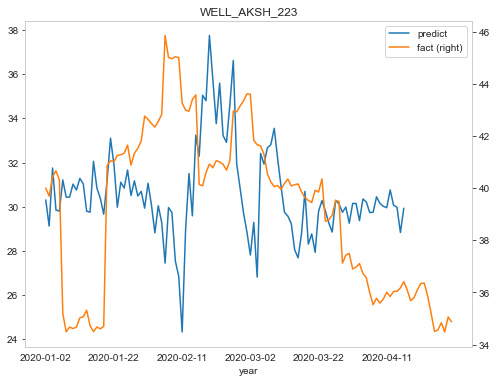

In [128]:
yhat = yhat.flatten() 
Y_traint = Y_traint.flatten()
Y_traint4 = Y_traint[0:120]
datadt4 = datadt[0:120]
import pandas as pd

df = pd.DataFrame(data={'year': datadt4, 
                        'predict': yhat, 
                        'fact': Y_traint4})
import matplotlib.pyplot as plt # Impot the relevant module

fig, ax = plt.subplots() # Create the figure and axes object

# Plot the first x and y axes:
df.plot(x = 'year', y = 'predict',title = "WELL_AKSH_223", ax = ax) 
# Plot the second x and y axes. By secondary_y = True a second y-axis is requested:
# (see https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.plot.html for details)
df.plot(x = 'year', y = 'fact', ax = ax, secondary_y = True)

In [130]:
#from sklearn.metrics import r2_score
#r2_score(yhat, Y_traint4)

In [216]:
# multivariate mlp example
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate
 
# сэмлы
def split_sequences(sequences, n_steps):
	X, y = list(), list()
	for i in range(len(sequences)):
		# разметка
		end_ix = i + n_steps
		# проверка выхода за пределы
		if end_ix > len(sequences):
			break
		# получение начала и конечной метки
		seq_x, seq_y = sequences[i:end_ix, :-1], sequences[end_ix-1, -1]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
# последовательность
in_seq1 = X_leftl
in_seq2 = X_rightl
out_seq = Y_trainl# array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1), 6))
in_seq2 = in_seq2.reshape((len(in_seq2), 5))
out_seq = out_seq.reshape((len(out_seq), 1))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
n_steps = 15
# convert into input/output
X, y = split_sequences(dataset, n_steps)
# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]
# первая модель
visible1 = Input(shape=(n_steps,1))
dense1 = LSTM(100, input_shape =(100,1))(visible1) #,batch_input_shape=(32,100,1), stateful=True
# вторая модель LSTM
visible2 = Input(shape=(n_steps,1))
lstm = LSTM(100, input_shape =(100,1))(visible2)
#lstm2 = LSTM(10, input_shape =(100,1))(lstm)

# слияние
merge = concatenate([dense1, lstm])
output = Dense(1)(merge)
model = Model(inputs=[visible1, visible2], outputs=output)
model.compile(optimizer='adam', loss='mape', metrics=['accuracy'])
# fit model
model.fit([X1, X2], Y_trainl, epochs=20, verbose=1, batch_size=64, validation_split=0.1)
# demonstrate prediction
#x_input = array([[80, 85], [90, 95], [100, 105]])
#x1 = x_input[:, 0].reshape((1, n_steps))
#x2 = x_input[:, 1].reshape((1, n_steps))
yhat = model.predict([X1, X2], verbose=0)
print(yhat)

Epoch 1/20
11/11 [==============================] - 4s 113ms/step - loss: 95.0532 - accuracy: 0.0000e+00 - val_loss: 84.0809 - val_accuracy: 0.0000e+00
Epoch 2/20
11/11 [==============================] - 0s 39ms/step - loss: 84.7823 - accuracy: 0.0000e+00 - val_loss: 72.9841 - val_accuracy: 0.0000e+00
Epoch 3/20
11/11 [==============================] - 0s 41ms/step - loss: 55.8037 - accuracy: 0.0000e+00 - val_loss: 60.5678 - val_accuracy: 0.0000e+00
Epoch 4/20
11/11 [==============================] - 0s 40ms/step - loss: 38.6793 - accuracy: 0.0000e+00 - val_loss: 48.2556 - val_accuracy: 0.0000e+00
Epoch 5/20
11/11 [==============================] - 0s 40ms/step - loss: 27.0635 - accuracy: 0.0000e+00 - val_loss: 40.4091 - val_accuracy: 0.0000e+00
Epoch 6/20
11/11 [==============================] - 0s 41ms/step - loss: 23.5283 - accuracy: 0.0000e+00 - val_loss: 33.9034 - val_accuracy: 0.0000e+00
Epoch 7/20
11/11 [==============================] - 0s 41ms/step - loss: 22.1025 - accuracy: 

In [118]:
# multivariate mlp example
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate
 
# сэмлы
def split_sequences(sequences, n_steps):
	X, y = list(), list()
	for i in range(len(sequences)):
		# разметка
		end_ix = i + n_steps
		# проверка выхода за пределы
		if end_ix > len(sequences):
			break
		# получение начала и конечной метки
		seq_x, seq_y = sequences[i:end_ix, :-1], sequences[end_ix-1, -1]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
# последовательность
in_seq1 = X_leftt
in_seq2 = X_rightt

out_seq = Y_traint #array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1), 6))
in_seq2 = in_seq2.reshape((len(in_seq2), 5))
out_seq = out_seq.reshape((len(out_seq), 1))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
n_steps = 15
# convert into input/output
X,y = split_sequences(dataset, n_steps)
#y = 
# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]

yhat = model.predict([X1, X2], verbose=0)
print(yhat)

[[0.2690624 ]
 [0.27165323]
 [0.27523264]
 [0.2685183 ]
 [0.2687635 ]
 [0.2694765 ]
 [0.26953748]
 [0.27483225]
 [0.2699345 ]
 [0.26954156]
 [0.271948  ]
 [0.27242693]
 [0.27585796]
 [0.2767583 ]
 [0.27718392]
 [0.2773323 ]
 [0.27734068]
 [0.29548067]
 [0.2689334 ]
 [0.27025184]
 [0.27209103]
 [0.27262825]
 [0.26888147]
 [0.27194056]
 [0.27549878]
 [0.27687284]
 [0.27732438]
 [0.27747753]
 [0.2714307 ]
 [0.29190275]
 [0.2683545 ]
 [0.26832366]
 [0.26836422]
 [0.26832786]
 [0.2683117 ]
 [0.26833472]
 [0.26825717]
 [0.26825207]
 [0.26832408]
 [0.2685509 ]
 [0.26811138]
 [0.26820925]
 [0.26816243]
 [0.26808295]
 [0.2679551 ]
 [0.26795828]
 [0.2680013 ]
 [0.26603165]
 [0.26709837]
 [0.26755604]
 [0.26757434]
 [0.26752454]
 [0.26763454]
 [0.26781574]
 [0.2678044 ]
 [0.26765814]
 [0.2680536 ]
 [0.26761007]
 [0.2684838 ]
 [0.2693734 ]
 [0.27127603]
 [0.27041447]
 [0.2680996 ]
 [0.268643  ]
 [0.27100417]
 [0.26719624]
 [0.267836  ]
 [0.26862726]
 [0.27114812]
 [0.27463245]
 [0.27586293]
 [0.28

In [217]:
# multivariate mlp example
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate
 
# split a multivariate sequence into samples
def split_sequences(sequences, n_steps_in, n_steps_out):
	X, y = list(), list()
	for i in range(len(sequences)):
		# find the end of this pattern
		end_ix = i + n_steps_in
		out_end_ix = end_ix + n_steps_out
		# check if we are beyond the dataset
		if out_end_ix > len(sequences):
			break
		# gather input and output parts of the pattern
		seq_x, seq_y = sequences[i:end_ix, :], sequences[end_ix:out_end_ix, :]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
 
# последовательность
in_seq1 = X_leftt
in_seq2 = X_rightt
out_seq = Y_traint # array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1), 6))
in_seq2 = in_seq2.reshape((len(in_seq2), 5))
out_seq = out_seq.reshape((len(out_seq), 1))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
# таймстепы
n_steps_in, n_steps_out = 15, 1
# convert into input/output
X,y = split_sequences(dataset, n_steps_in, n_steps_out)



# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]
# первая модель

yhat = model.predict([X1, X2], verbose=0)
print(yhat)

[[17.15861 ]
 [17.17503 ]
 [17.184832]
 [17.1804  ]
 [17.181938]
 [17.209358]
 [17.213951]
 [17.184353]
 [17.214828]
 [17.195442]
 [17.19395 ]
 [17.197626]
 [17.200882]
 [17.20262 ]
 [17.205837]
 [17.220585]
 [17.211048]
 [17.221329]
 [17.198456]
 [17.165348]
 [17.151415]
 [17.143854]
 [17.159332]
 [17.13543 ]
 [17.130043]
 [17.139017]
 [17.1387  ]
 [17.145681]
 [17.145824]
 [17.139275]
 [17.134283]
 [17.134878]
 [17.142725]
 [17.108002]
 [17.1254  ]
 [17.131802]
 [17.127121]
 [17.121586]
 [17.126598]
 [17.147608]
 [17.138836]
 [17.139156]
 [17.139725]
 [17.124336]
 [17.14811 ]
 [17.066948]
 [17.041904]
 [17.050587]
 [17.047646]
 [17.037344]
 [17.045464]
 [17.041103]
 [17.038576]
 [17.068043]
 [17.077639]
 [17.047903]
 [17.001776]
 [17.041832]
 [17.056028]
 [17.057487]
 [17.062191]
 [17.082172]
 [17.23706 ]
 [17.093388]
 [17.120308]
 [17.144033]
 [17.154366]
 [17.160524]
 [17.175915]
 [17.183025]
 [17.183659]
 [17.1972  ]
 [17.233093]
 [17.220036]
 [17.233469]
 [17.240738]
 [17.199112]

In [218]:
yhat.shape

(120, 1)

<AxesSubplot:>

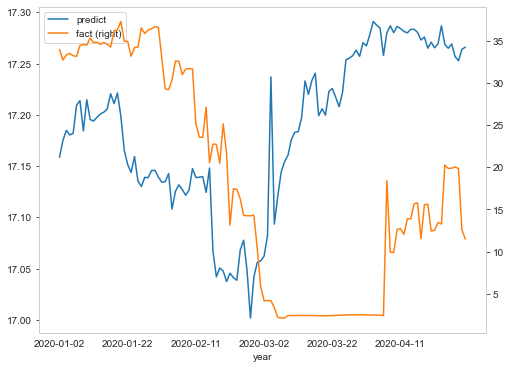

In [219]:
yhat = yhat.flatten() 
Y_traint = Y_traint.flatten()
Y_traint4 = Y_traint[0:120]
datadt4 = datadt[0:120]
import pandas as pd

df = pd.DataFrame(data={'year': datadt4, 
                        'predict': yhat, 
                        'fact': Y_traint4})
import matplotlib.pyplot as plt # Impot the relevant module

fig, ax = plt.subplots() # Create the figure and axes object

# Plot the first x and y axes:
df.plot(x = 'year', y = 'predict', ax = ax) 
# Plot the second x and y axes. By secondary_y = True a second y-axis is requested:
# (see https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.plot.html for details)
df.plot(x = 'year', y = 'fact', ax = ax, secondary_y = True)

In [220]:
# multivariate mlp example
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate
 
# сэмлы
def split_sequences(sequences, n_steps):
	X, y = list(), list()
	for i in range(len(sequences)):
		# разметка
		end_ix = i + n_steps
		# проверка выхода за пределы
		if end_ix > len(sequences):
			break
		# получение начала и конечной метки
		seq_x, seq_y = sequences[i:end_ix, :-1], sequences[end_ix-1, -1]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
# последовательность
in_seq1 = X_leftl#[365:1231]
in_seq2 = X_rightl#[365:1231]

out_seq = Y_trainl #array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1),6))
in_seq2 = in_seq2.reshape((len(in_seq2),5))
out_seq = out_seq.reshape((len(out_seq),1))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
n_steps = 1
# convert into input/output
X,y = split_sequences(dataset, n_steps)
#y = 
# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]
# первая модель
visible1 = Input(shape=(n_steps,))
dense1 = Dense(100, activation='relu')(visible1)
# вторая модель
visible2 = Input(shape=(n_steps,))
dense2 = Dense(100, activation='relu')(visible2)
# слияние
merge = concatenate([dense1, dense2])
output = Dense(1)(merge)
model = Model(inputs=[visible1, visible2], outputs=output)
model.compile(optimizer='adam', loss='mse', metrics=['accuracy'])
# fit model
model.fit([X1, X2], Y_train, epochs=2000, verbose= 1, batch_size=64, validation_split=0.1)
# demonstrate prediction
#x_input = array([[80, 85], [90, 95], [100, 105]])
#x1 = x_input[:, 0].reshape((1, n_steps))
#x2 = x_input[:, 1].reshape((1, n_steps))
yhat = model.predict([X1, X2], verbose=0)
print(yhat)

Epoch 1/2000
11/11 [==============================] - 1s 16ms/step - loss: 494.2818 - accuracy: 0.0000e+00 - val_loss: 262.3852 - val_accuracy: 0.0000e+00
Epoch 2/2000
11/11 [==============================] - 0s 4ms/step - loss: 258.3991 - accuracy: 0.0000e+00 - val_loss: 77.2715 - val_accuracy: 0.0000e+00
Epoch 3/2000
11/11 [==============================] - 0s 4ms/step - loss: 155.9623 - accuracy: 0.0000e+00 - val_loss: 62.1882 - val_accuracy: 0.0000e+00
Epoch 4/2000
11/11 [==============================] - 0s 4ms/step - loss: 124.0140 - accuracy: 0.0000e+00 - val_loss: 58.1218 - val_accuracy: 0.0000e+00
Epoch 5/2000
11/11 [==============================] - 0s 4ms/step - loss: 119.8361 - accuracy: 0.0000e+00 - val_loss: 60.3218 - val_accuracy: 0.0000e+00
Epoch 6/2000
11/11 [==============================] - 0s 4ms/step - loss: 127.7591 - accuracy: 0.0000e+00 - val_loss: 57.9822 - val_accuracy: 0.0000e+00
Epoch 7/2000
11/11 [==============================] - 0s 4ms/step - loss: 123.19

11/11 [==============================] - 0s 5ms/step - loss: 66.5933 - accuracy: 0.0000e+00 - val_loss: 34.2111 - val_accuracy: 0.0000e+00
Epoch 108/2000
11/11 [==============================] - 0s 4ms/step - loss: 69.4808 - accuracy: 0.0000e+00 - val_loss: 31.9146 - val_accuracy: 0.0000e+00
Epoch 109/2000
11/11 [==============================] - 0s 4ms/step - loss: 67.3082 - accuracy: 0.0000e+00 - val_loss: 32.8914 - val_accuracy: 0.0000e+00
Epoch 110/2000
11/11 [==============================] - 0s 5ms/step - loss: 67.3137 - accuracy: 0.0000e+00 - val_loss: 30.4834 - val_accuracy: 0.0000e+00
Epoch 111/2000
11/11 [==============================] - 0s 5ms/step - loss: 65.9898 - accuracy: 0.0000e+00 - val_loss: 29.9335 - val_accuracy: 0.0000e+00
Epoch 112/2000
11/11 [==============================] - 0s 5ms/step - loss: 59.6612 - accuracy: 0.0000e+00 - val_loss: 30.3876 - val_accuracy: 0.0000e+00
Epoch 113/2000
11/11 [==============================] - 0s 5ms/step - loss: 63.1122 - accur

11/11 [==============================] - 0s 5ms/step - loss: 41.2916 - accuracy: 0.0000e+00 - val_loss: 18.6578 - val_accuracy: 0.0000e+00
Epoch 214/2000
11/11 [==============================] - 0s 5ms/step - loss: 39.3080 - accuracy: 0.0000e+00 - val_loss: 13.1409 - val_accuracy: 0.0000e+00
Epoch 215/2000
11/11 [==============================] - 0s 4ms/step - loss: 39.8655 - accuracy: 0.0000e+00 - val_loss: 13.3823 - val_accuracy: 0.0000e+00
Epoch 216/2000
11/11 [==============================] - 0s 5ms/step - loss: 40.6067 - accuracy: 0.0000e+00 - val_loss: 13.0262 - val_accuracy: 0.0000e+00
Epoch 217/2000
11/11 [==============================] - 0s 5ms/step - loss: 40.7058 - accuracy: 0.0000e+00 - val_loss: 12.7428 - val_accuracy: 0.0000e+00
Epoch 218/2000
11/11 [==============================] - 0s 4ms/step - loss: 39.5839 - accuracy: 0.0000e+00 - val_loss: 13.0113 - val_accuracy: 0.0000e+00
Epoch 219/2000
11/11 [==============================] - 0s 4ms/step - loss: 42.0510 - accur

11/11 [==============================] - 0s 5ms/step - loss: 40.6878 - accuracy: 0.0000e+00 - val_loss: 19.4625 - val_accuracy: 0.0000e+00
Epoch 320/2000
11/11 [==============================] - 0s 5ms/step - loss: 41.5769 - accuracy: 0.0000e+00 - val_loss: 12.9690 - val_accuracy: 0.0000e+00
Epoch 321/2000
11/11 [==============================] - 0s 5ms/step - loss: 40.5958 - accuracy: 0.0000e+00 - val_loss: 21.6760 - val_accuracy: 0.0000e+00
Epoch 322/2000
11/11 [==============================] - 0s 5ms/step - loss: 40.2879 - accuracy: 0.0000e+00 - val_loss: 12.0951 - val_accuracy: 0.0000e+00
Epoch 323/2000
11/11 [==============================] - 0s 5ms/step - loss: 41.0228 - accuracy: 0.0000e+00 - val_loss: 12.5645 - val_accuracy: 0.0000e+00
Epoch 324/2000
11/11 [==============================] - 0s 5ms/step - loss: 40.0156 - accuracy: 0.0000e+00 - val_loss: 14.7043 - val_accuracy: 0.0000e+00
Epoch 325/2000
11/11 [==============================] - 0s 5ms/step - loss: 39.1684 - accur

11/11 [==============================] - 0s 4ms/step - loss: 39.9539 - accuracy: 0.0000e+00 - val_loss: 17.3562 - val_accuracy: 0.0000e+00
Epoch 426/2000
11/11 [==============================] - 0s 4ms/step - loss: 39.3726 - accuracy: 0.0000e+00 - val_loss: 15.1772 - val_accuracy: 0.0000e+00
Epoch 427/2000
11/11 [==============================] - 0s 4ms/step - loss: 43.7281 - accuracy: 0.0000e+00 - val_loss: 14.1617 - val_accuracy: 0.0000e+00
Epoch 428/2000
11/11 [==============================] - 0s 4ms/step - loss: 41.9797 - accuracy: 0.0000e+00 - val_loss: 13.9340 - val_accuracy: 0.0000e+00
Epoch 429/2000
11/11 [==============================] - 0s 4ms/step - loss: 41.1866 - accuracy: 0.0000e+00 - val_loss: 14.4870 - val_accuracy: 0.0000e+00
Epoch 430/2000
11/11 [==============================] - 0s 5ms/step - loss: 40.0810 - accuracy: 0.0000e+00 - val_loss: 13.2019 - val_accuracy: 0.0000e+00
Epoch 431/2000
11/11 [==============================] - 0s 4ms/step - loss: 40.4298 - accur

11/11 [==============================] - 0s 4ms/step - loss: 40.1335 - accuracy: 0.0000e+00 - val_loss: 13.1312 - val_accuracy: 0.0000e+00
Epoch 532/2000
11/11 [==============================] - 0s 4ms/step - loss: 40.1572 - accuracy: 0.0000e+00 - val_loss: 12.3458 - val_accuracy: 0.0000e+00
Epoch 533/2000
11/11 [==============================] - 0s 4ms/step - loss: 39.5128 - accuracy: 0.0000e+00 - val_loss: 14.4046 - val_accuracy: 0.0000e+00
Epoch 534/2000
11/11 [==============================] - 0s 4ms/step - loss: 39.8712 - accuracy: 0.0000e+00 - val_loss: 12.9040 - val_accuracy: 0.0000e+00
Epoch 535/2000
11/11 [==============================] - 0s 4ms/step - loss: 40.2222 - accuracy: 0.0000e+00 - val_loss: 20.3925 - val_accuracy: 0.0000e+00
Epoch 536/2000
11/11 [==============================] - 0s 4ms/step - loss: 38.3143 - accuracy: 0.0000e+00 - val_loss: 12.4999 - val_accuracy: 0.0000e+00
Epoch 537/2000
11/11 [==============================] - 0s 4ms/step - loss: 40.4499 - accur

11/11 [==============================] - 0s 4ms/step - loss: 39.1882 - accuracy: 0.0000e+00 - val_loss: 12.3671 - val_accuracy: 0.0000e+00
Epoch 638/2000
11/11 [==============================] - 0s 4ms/step - loss: 41.0315 - accuracy: 0.0000e+00 - val_loss: 61.5396 - val_accuracy: 0.0000e+00
Epoch 639/2000
11/11 [==============================] - 0s 4ms/step - loss: 43.5434 - accuracy: 0.0000e+00 - val_loss: 125.0301 - val_accuracy: 0.0000e+00
Epoch 640/2000
11/11 [==============================] - 0s 4ms/step - loss: 44.4302 - accuracy: 0.0000e+00 - val_loss: 52.9352 - val_accuracy: 0.0000e+00
Epoch 641/2000
11/11 [==============================] - 0s 4ms/step - loss: 41.6449 - accuracy: 0.0000e+00 - val_loss: 74.7383 - val_accuracy: 0.0000e+00
Epoch 642/2000
11/11 [==============================] - 0s 4ms/step - loss: 44.3214 - accuracy: 0.0000e+00 - val_loss: 50.1636 - val_accuracy: 0.0000e+00
Epoch 643/2000
11/11 [==============================] - 0s 4ms/step - loss: 40.0889 - accu

11/11 [==============================] - 0s 4ms/step - loss: 38.3167 - accuracy: 0.0000e+00 - val_loss: 12.4469 - val_accuracy: 0.0000e+00
Epoch 744/2000
11/11 [==============================] - 0s 4ms/step - loss: 40.0206 - accuracy: 0.0000e+00 - val_loss: 11.7762 - val_accuracy: 0.0000e+00
Epoch 745/2000
11/11 [==============================] - 0s 4ms/step - loss: 40.9096 - accuracy: 0.0000e+00 - val_loss: 43.8094 - val_accuracy: 0.0000e+00
Epoch 746/2000
11/11 [==============================] - 0s 4ms/step - loss: 41.4249 - accuracy: 0.0000e+00 - val_loss: 22.1248 - val_accuracy: 0.0000e+00
Epoch 747/2000
11/11 [==============================] - 0s 4ms/step - loss: 42.7417 - accuracy: 0.0000e+00 - val_loss: 14.5897 - val_accuracy: 0.0000e+00
Epoch 748/2000
11/11 [==============================] - 0s 5ms/step - loss: 41.0121 - accuracy: 0.0000e+00 - val_loss: 12.5670 - val_accuracy: 0.0000e+00
Epoch 749/2000
11/11 [==============================] - 0s 4ms/step - loss: 41.8224 - accur

11/11 [==============================] - 0s 4ms/step - loss: 42.0045 - accuracy: 0.0000e+00 - val_loss: 12.0813 - val_accuracy: 0.0000e+00
Epoch 850/2000
11/11 [==============================] - 0s 4ms/step - loss: 37.3140 - accuracy: 0.0000e+00 - val_loss: 15.3640 - val_accuracy: 0.0000e+00
Epoch 851/2000
11/11 [==============================] - 0s 4ms/step - loss: 41.6080 - accuracy: 0.0000e+00 - val_loss: 12.6376 - val_accuracy: 0.0000e+00
Epoch 852/2000
11/11 [==============================] - 0s 4ms/step - loss: 40.5374 - accuracy: 0.0000e+00 - val_loss: 12.2173 - val_accuracy: 0.0000e+00
Epoch 853/2000
11/11 [==============================] - 0s 4ms/step - loss: 38.3320 - accuracy: 0.0000e+00 - val_loss: 14.2230 - val_accuracy: 0.0000e+00
Epoch 854/2000
11/11 [==============================] - 0s 4ms/step - loss: 38.7112 - accuracy: 0.0000e+00 - val_loss: 11.7821 - val_accuracy: 0.0000e+00
Epoch 855/2000
11/11 [==============================] - 0s 4ms/step - loss: 39.7696 - accur

11/11 [==============================] - 0s 4ms/step - loss: 39.5703 - accuracy: 0.0000e+00 - val_loss: 17.5602 - val_accuracy: 0.0000e+00
Epoch 956/2000
11/11 [==============================] - 0s 4ms/step - loss: 42.3587 - accuracy: 0.0000e+00 - val_loss: 10.4508 - val_accuracy: 0.0000e+00
Epoch 957/2000
11/11 [==============================] - 0s 4ms/step - loss: 39.1584 - accuracy: 0.0000e+00 - val_loss: 16.9562 - val_accuracy: 0.0000e+00
Epoch 958/2000
11/11 [==============================] - 0s 4ms/step - loss: 41.2366 - accuracy: 0.0000e+00 - val_loss: 9.3459 - val_accuracy: 0.0000e+00
Epoch 959/2000
11/11 [==============================] - 0s 4ms/step - loss: 40.8913 - accuracy: 0.0000e+00 - val_loss: 28.7862 - val_accuracy: 0.0000e+00
Epoch 960/2000
11/11 [==============================] - 0s 4ms/step - loss: 39.8779 - accuracy: 0.0000e+00 - val_loss: 8.6744 - val_accuracy: 0.0000e+00
Epoch 961/2000
11/11 [==============================] - 0s 4ms/step - loss: 38.3640 - accurac

11/11 [==============================] - 0s 4ms/step - loss: 40.9152 - accuracy: 0.0000e+00 - val_loss: 9.9568 - val_accuracy: 0.0000e+00
Epoch 1062/2000
11/11 [==============================] - 0s 4ms/step - loss: 40.3297 - accuracy: 0.0000e+00 - val_loss: 11.0601 - val_accuracy: 0.0000e+00
Epoch 1063/2000
11/11 [==============================] - 0s 4ms/step - loss: 38.6947 - accuracy: 0.0000e+00 - val_loss: 11.8316 - val_accuracy: 0.0000e+00
Epoch 1064/2000
11/11 [==============================] - 0s 4ms/step - loss: 40.7741 - accuracy: 0.0000e+00 - val_loss: 10.9946 - val_accuracy: 0.0000e+00
Epoch 1065/2000
11/11 [==============================] - 0s 4ms/step - loss: 41.7100 - accuracy: 0.0000e+00 - val_loss: 11.4470 - val_accuracy: 0.0000e+00
Epoch 1066/2000
11/11 [==============================] - 0s 4ms/step - loss: 40.7886 - accuracy: 0.0000e+00 - val_loss: 10.6423 - val_accuracy: 0.0000e+00
Epoch 1067/2000
11/11 [==============================] - 0s 4ms/step - loss: 39.0218 - 

11/11 [==============================] - 0s 4ms/step - loss: 38.1410 - accuracy: 0.0000e+00 - val_loss: 20.6384 - val_accuracy: 0.0000e+00
Epoch 1115/2000
11/11 [==============================] - 0s 4ms/step - loss: 40.3536 - accuracy: 0.0000e+00 - val_loss: 13.3834 - val_accuracy: 0.0000e+00
Epoch 1116/2000
11/11 [==============================] - 0s 4ms/step - loss: 40.4754 - accuracy: 0.0000e+00 - val_loss: 15.2326 - val_accuracy: 0.0000e+00
Epoch 1117/2000
11/11 [==============================] - 0s 4ms/step - loss: 38.3742 - accuracy: 0.0000e+00 - val_loss: 17.1450 - val_accuracy: 0.0000e+00
Epoch 1118/2000
11/11 [==============================] - 0s 4ms/step - loss: 39.3994 - accuracy: 0.0000e+00 - val_loss: 10.2129 - val_accuracy: 0.0000e+00
Epoch 1119/2000
11/11 [==============================] - 0s 4ms/step - loss: 40.1684 - accuracy: 0.0000e+00 - val_loss: 32.0080 - val_accuracy: 0.0000e+00
Epoch 1120/2000
11/11 [==============================] - 0s 4ms/step - loss: 42.1616 -

11/11 [==============================] - 0s 4ms/step - loss: 37.2386 - accuracy: 0.0000e+00 - val_loss: 21.0746 - val_accuracy: 0.0000e+00
Epoch 1168/2000
11/11 [==============================] - 0s 4ms/step - loss: 38.3228 - accuracy: 0.0000e+00 - val_loss: 10.2101 - val_accuracy: 0.0000e+00
Epoch 1169/2000
11/11 [==============================] - 0s 4ms/step - loss: 39.6878 - accuracy: 0.0000e+00 - val_loss: 19.2141 - val_accuracy: 0.0000e+00
Epoch 1170/2000
11/11 [==============================] - 0s 4ms/step - loss: 42.0455 - accuracy: 0.0000e+00 - val_loss: 21.5063 - val_accuracy: 0.0000e+00
Epoch 1171/2000
11/11 [==============================] - 0s 4ms/step - loss: 39.1337 - accuracy: 0.0000e+00 - val_loss: 9.0799 - val_accuracy: 0.0000e+00
Epoch 1172/2000
11/11 [==============================] - 0s 4ms/step - loss: 39.0237 - accuracy: 0.0000e+00 - val_loss: 21.3774 - val_accuracy: 0.0000e+00
Epoch 1173/2000
11/11 [==============================] - 0s 4ms/step - loss: 38.1579 - 

Epoch 1220/2000
11/11 [==============================] - 0s 4ms/step - loss: 39.6385 - accuracy: 0.0000e+00 - val_loss: 11.8625 - val_accuracy: 0.0000e+00
Epoch 1221/2000
11/11 [==============================] - 0s 4ms/step - loss: 38.8453 - accuracy: 0.0000e+00 - val_loss: 12.8747 - val_accuracy: 0.0000e+00
Epoch 1222/2000
11/11 [==============================] - 0s 4ms/step - loss: 40.5362 - accuracy: 0.0000e+00 - val_loss: 14.0532 - val_accuracy: 0.0000e+00
Epoch 1223/2000
11/11 [==============================] - 0s 4ms/step - loss: 40.4416 - accuracy: 0.0000e+00 - val_loss: 15.9807 - val_accuracy: 0.0000e+00
Epoch 1224/2000
11/11 [==============================] - 0s 4ms/step - loss: 38.0058 - accuracy: 0.0000e+00 - val_loss: 15.9621 - val_accuracy: 0.0000e+00
Epoch 1225/2000
11/11 [==============================] - 0s 4ms/step - loss: 37.7540 - accuracy: 0.0000e+00 - val_loss: 13.9159 - val_accuracy: 0.0000e+00
Epoch 1226/2000
11/11 [==============================] - 0s 4ms/step -

Epoch 1273/2000
11/11 [==============================] - 0s 4ms/step - loss: 41.7523 - accuracy: 0.0000e+00 - val_loss: 18.9413 - val_accuracy: 0.0000e+00
Epoch 1274/2000
11/11 [==============================] - 0s 4ms/step - loss: 40.4146 - accuracy: 0.0000e+00 - val_loss: 12.3357 - val_accuracy: 0.0000e+00
Epoch 1275/2000
11/11 [==============================] - 0s 4ms/step - loss: 36.3196 - accuracy: 0.0000e+00 - val_loss: 12.5949 - val_accuracy: 0.0000e+00
Epoch 1276/2000
11/11 [==============================] - 0s 4ms/step - loss: 40.8561 - accuracy: 0.0000e+00 - val_loss: 14.7501 - val_accuracy: 0.0000e+00
Epoch 1277/2000
11/11 [==============================] - 0s 4ms/step - loss: 42.3829 - accuracy: 0.0000e+00 - val_loss: 14.7770 - val_accuracy: 0.0000e+00
Epoch 1278/2000
11/11 [==============================] - 0s 4ms/step - loss: 39.4623 - accuracy: 0.0000e+00 - val_loss: 12.7256 - val_accuracy: 0.0000e+00
Epoch 1279/2000
11/11 [==============================] - 0s 4ms/step -

Epoch 1326/2000
11/11 [==============================] - 0s 4ms/step - loss: 39.9936 - accuracy: 0.0000e+00 - val_loss: 10.8508 - val_accuracy: 0.0000e+00
Epoch 1327/2000
11/11 [==============================] - 0s 4ms/step - loss: 41.9076 - accuracy: 0.0000e+00 - val_loss: 13.7620 - val_accuracy: 0.0000e+00
Epoch 1328/2000
11/11 [==============================] - 0s 4ms/step - loss: 40.1807 - accuracy: 0.0000e+00 - val_loss: 11.0296 - val_accuracy: 0.0000e+00
Epoch 1329/2000
11/11 [==============================] - 0s 4ms/step - loss: 38.9235 - accuracy: 0.0000e+00 - val_loss: 12.8157 - val_accuracy: 0.0000e+00
Epoch 1330/2000
11/11 [==============================] - 0s 4ms/step - loss: 40.4998 - accuracy: 0.0000e+00 - val_loss: 11.3523 - val_accuracy: 0.0000e+00
Epoch 1331/2000
11/11 [==============================] - 0s 4ms/step - loss: 40.9366 - accuracy: 0.0000e+00 - val_loss: 11.5416 - val_accuracy: 0.0000e+00
Epoch 1332/2000
11/11 [==============================] - 0s 4ms/step -

Epoch 1379/2000
11/11 [==============================] - 0s 4ms/step - loss: 38.4700 - accuracy: 0.0000e+00 - val_loss: 9.5470 - val_accuracy: 0.0000e+00
Epoch 1380/2000
11/11 [==============================] - 0s 4ms/step - loss: 40.5063 - accuracy: 0.0000e+00 - val_loss: 24.2602 - val_accuracy: 0.0000e+00
Epoch 1381/2000
11/11 [==============================] - 0s 4ms/step - loss: 40.0308 - accuracy: 0.0000e+00 - val_loss: 12.7246 - val_accuracy: 0.0000e+00
Epoch 1382/2000
11/11 [==============================] - 0s 4ms/step - loss: 40.5604 - accuracy: 0.0000e+00 - val_loss: 9.4999 - val_accuracy: 0.0000e+00
Epoch 1383/2000
11/11 [==============================] - 0s 4ms/step - loss: 40.4985 - accuracy: 0.0000e+00 - val_loss: 26.0332 - val_accuracy: 0.0000e+00
Epoch 1384/2000
11/11 [==============================] - 0s 4ms/step - loss: 39.6875 - accuracy: 0.0000e+00 - val_loss: 9.4208 - val_accuracy: 0.0000e+00
Epoch 1385/2000
11/11 [==============================] - 0s 4ms/step - lo

Epoch 1432/2000
11/11 [==============================] - 0s 4ms/step - loss: 38.8726 - accuracy: 0.0000e+00 - val_loss: 23.7085 - val_accuracy: 0.0000e+00
Epoch 1433/2000
11/11 [==============================] - 0s 4ms/step - loss: 38.8277 - accuracy: 0.0000e+00 - val_loss: 9.8972 - val_accuracy: 0.0000e+00
Epoch 1434/2000
11/11 [==============================] - 0s 4ms/step - loss: 39.9284 - accuracy: 0.0000e+00 - val_loss: 14.4284 - val_accuracy: 0.0000e+00
Epoch 1435/2000
11/11 [==============================] - 0s 4ms/step - loss: 43.0370 - accuracy: 0.0000e+00 - val_loss: 13.3977 - val_accuracy: 0.0000e+00
Epoch 1436/2000
11/11 [==============================] - 0s 4ms/step - loss: 36.9641 - accuracy: 0.0000e+00 - val_loss: 13.7403 - val_accuracy: 0.0000e+00
Epoch 1437/2000
11/11 [==============================] - 0s 4ms/step - loss: 38.8890 - accuracy: 0.0000e+00 - val_loss: 19.8899 - val_accuracy: 0.0000e+00
Epoch 1438/2000
11/11 [==============================] - 0s 4ms/step - 

Epoch 1485/2000
11/11 [==============================] - 0s 4ms/step - loss: 41.8531 - accuracy: 0.0000e+00 - val_loss: 15.3873 - val_accuracy: 0.0000e+00
Epoch 1486/2000
11/11 [==============================] - 0s 4ms/step - loss: 39.1061 - accuracy: 0.0000e+00 - val_loss: 11.6684 - val_accuracy: 0.0000e+00
Epoch 1487/2000
11/11 [==============================] - 0s 4ms/step - loss: 36.7085 - accuracy: 0.0000e+00 - val_loss: 12.8770 - val_accuracy: 0.0000e+00
Epoch 1488/2000
11/11 [==============================] - 0s 4ms/step - loss: 36.9626 - accuracy: 0.0000e+00 - val_loss: 14.0607 - val_accuracy: 0.0000e+00
Epoch 1489/2000
11/11 [==============================] - 0s 4ms/step - loss: 40.1255 - accuracy: 0.0000e+00 - val_loss: 10.5247 - val_accuracy: 0.0000e+00
Epoch 1490/2000
11/11 [==============================] - 0s 4ms/step - loss: 40.1177 - accuracy: 0.0000e+00 - val_loss: 16.5351 - val_accuracy: 0.0000e+00
Epoch 1491/2000
11/11 [==============================] - 0s 4ms/step -

Epoch 1590/2000
11/11 [==============================] - 0s 4ms/step - loss: 38.4592 - accuracy: 0.0000e+00 - val_loss: 20.3736 - val_accuracy: 0.0000e+00
Epoch 1591/2000
11/11 [==============================] - 0s 4ms/step - loss: 37.6648 - accuracy: 0.0000e+00 - val_loss: 10.2363 - val_accuracy: 0.0000e+00
Epoch 1592/2000
11/11 [==============================] - 0s 4ms/step - loss: 36.5769 - accuracy: 0.0000e+00 - val_loss: 44.4891 - val_accuracy: 0.0000e+00
Epoch 1593/2000
11/11 [==============================] - 0s 4ms/step - loss: 37.2513 - accuracy: 0.0000e+00 - val_loss: 12.6941 - val_accuracy: 0.0000e+00
Epoch 1594/2000
11/11 [==============================] - 0s 4ms/step - loss: 39.9209 - accuracy: 0.0000e+00 - val_loss: 12.5109 - val_accuracy: 0.0000e+00
Epoch 1595/2000
11/11 [==============================] - 0s 4ms/step - loss: 36.2075 - accuracy: 0.0000e+00 - val_loss: 16.3711 - val_accuracy: 0.0000e+00
Epoch 1596/2000
11/11 [==============================] - 0s 4ms/step -

Epoch 1643/2000
11/11 [==============================] - 0s 4ms/step - loss: 36.7153 - accuracy: 0.0000e+00 - val_loss: 31.7698 - val_accuracy: 0.0000e+00
Epoch 1644/2000
11/11 [==============================] - 0s 4ms/step - loss: 36.4200 - accuracy: 0.0000e+00 - val_loss: 9.9224 - val_accuracy: 0.0000e+00
Epoch 1645/2000
11/11 [==============================] - 0s 4ms/step - loss: 35.2982 - accuracy: 0.0000e+00 - val_loss: 17.1981 - val_accuracy: 0.0000e+00
Epoch 1646/2000
11/11 [==============================] - 0s 4ms/step - loss: 37.2853 - accuracy: 0.0000e+00 - val_loss: 16.7181 - val_accuracy: 0.0000e+00
Epoch 1647/2000
11/11 [==============================] - 0s 4ms/step - loss: 38.4093 - accuracy: 0.0000e+00 - val_loss: 16.3506 - val_accuracy: 0.0000e+00
Epoch 1648/2000
11/11 [==============================] - 0s 4ms/step - loss: 38.7947 - accuracy: 0.0000e+00 - val_loss: 14.7368 - val_accuracy: 0.0000e+00
Epoch 1649/2000
11/11 [==============================] - 0s 4ms/step - 

Epoch 1696/2000
11/11 [==============================] - 0s 4ms/step - loss: 36.9023 - accuracy: 0.0000e+00 - val_loss: 13.7143 - val_accuracy: 0.0000e+00
Epoch 1697/2000
11/11 [==============================] - 0s 4ms/step - loss: 37.2622 - accuracy: 0.0000e+00 - val_loss: 12.7678 - val_accuracy: 0.0000e+00
Epoch 1698/2000
11/11 [==============================] - 0s 5ms/step - loss: 36.3487 - accuracy: 0.0000e+00 - val_loss: 14.7226 - val_accuracy: 0.0000e+00
Epoch 1699/2000
11/11 [==============================] - 0s 4ms/step - loss: 37.1130 - accuracy: 0.0000e+00 - val_loss: 12.9622 - val_accuracy: 0.0000e+00
Epoch 1700/2000
11/11 [==============================] - 0s 4ms/step - loss: 35.5010 - accuracy: 0.0000e+00 - val_loss: 13.7463 - val_accuracy: 0.0000e+00
Epoch 1701/2000
11/11 [==============================] - 0s 4ms/step - loss: 35.2817 - accuracy: 0.0000e+00 - val_loss: 14.7375 - val_accuracy: 0.0000e+00
Epoch 1702/2000
11/11 [==============================] - 0s 4ms/step -

Epoch 1749/2000
11/11 [==============================] - 0s 4ms/step - loss: 37.6694 - accuracy: 0.0000e+00 - val_loss: 10.4606 - val_accuracy: 0.0000e+00
Epoch 1750/2000
11/11 [==============================] - 0s 4ms/step - loss: 38.3865 - accuracy: 0.0000e+00 - val_loss: 25.3184 - val_accuracy: 0.0000e+00
Epoch 1751/2000
11/11 [==============================] - 0s 4ms/step - loss: 39.1852 - accuracy: 0.0000e+00 - val_loss: 10.8467 - val_accuracy: 0.0000e+00
Epoch 1752/2000
11/11 [==============================] - 0s 4ms/step - loss: 37.3370 - accuracy: 0.0000e+00 - val_loss: 12.8023 - val_accuracy: 0.0000e+00
Epoch 1753/2000
11/11 [==============================] - 0s 4ms/step - loss: 36.8374 - accuracy: 0.0000e+00 - val_loss: 16.6966 - val_accuracy: 0.0000e+00
Epoch 1754/2000
11/11 [==============================] - 0s 4ms/step - loss: 37.2246 - accuracy: 0.0000e+00 - val_loss: 12.4300 - val_accuracy: 0.0000e+00
Epoch 1755/2000
11/11 [==============================] - 0s 4ms/step -

Epoch 1802/2000
11/11 [==============================] - 0s 4ms/step - loss: 36.3858 - accuracy: 0.0000e+00 - val_loss: 11.7890 - val_accuracy: 0.0000e+00
Epoch 1803/2000
11/11 [==============================] - 0s 4ms/step - loss: 40.0111 - accuracy: 0.0000e+00 - val_loss: 17.4783 - val_accuracy: 0.0000e+00
Epoch 1804/2000
11/11 [==============================] - 0s 4ms/step - loss: 37.0827 - accuracy: 0.0000e+00 - val_loss: 11.8970 - val_accuracy: 0.0000e+00
Epoch 1805/2000
11/11 [==============================] - 0s 4ms/step - loss: 37.2881 - accuracy: 0.0000e+00 - val_loss: 23.4573 - val_accuracy: 0.0000e+00
Epoch 1806/2000
11/11 [==============================] - 0s 4ms/step - loss: 35.4111 - accuracy: 0.0000e+00 - val_loss: 9.3026 - val_accuracy: 0.0000e+00
Epoch 1807/2000
11/11 [==============================] - 0s 4ms/step - loss: 38.3297 - accuracy: 0.0000e+00 - val_loss: 23.8666 - val_accuracy: 0.0000e+00
Epoch 1808/2000
11/11 [==============================] - 0s 4ms/step - 

Epoch 1855/2000
11/11 [==============================] - 0s 4ms/step - loss: 38.0844 - accuracy: 0.0000e+00 - val_loss: 9.8049 - val_accuracy: 0.0000e+00
Epoch 1856/2000
11/11 [==============================] - 0s 4ms/step - loss: 38.1502 - accuracy: 0.0000e+00 - val_loss: 37.5126 - val_accuracy: 0.0000e+00
Epoch 1857/2000
11/11 [==============================] - 0s 4ms/step - loss: 34.9569 - accuracy: 0.0000e+00 - val_loss: 11.0158 - val_accuracy: 0.0000e+00
Epoch 1858/2000
11/11 [==============================] - 0s 4ms/step - loss: 35.9741 - accuracy: 0.0000e+00 - val_loss: 18.3637 - val_accuracy: 0.0000e+00
Epoch 1859/2000
11/11 [==============================] - 0s 4ms/step - loss: 34.7548 - accuracy: 0.0000e+00 - val_loss: 13.3962 - val_accuracy: 0.0000e+00
Epoch 1860/2000
11/11 [==============================] - 0s 4ms/step - loss: 35.8668 - accuracy: 0.0000e+00 - val_loss: 17.8655 - val_accuracy: 0.0000e+00
Epoch 1861/2000
11/11 [==============================] - ETA: 0s - loss

Epoch 1960/2000
11/11 [==============================] - 0s 4ms/step - loss: 34.5822 - accuracy: 0.0000e+00 - val_loss: 41.1889 - val_accuracy: 0.0000e+00
Epoch 1961/2000
11/11 [==============================] - 0s 4ms/step - loss: 37.7012 - accuracy: 0.0000e+00 - val_loss: 16.8485 - val_accuracy: 0.0000e+00
Epoch 1962/2000
11/11 [==============================] - 0s 4ms/step - loss: 38.9766 - accuracy: 0.0000e+00 - val_loss: 11.5472 - val_accuracy: 0.0000e+00
Epoch 1963/2000
11/11 [==============================] - 0s 4ms/step - loss: 36.2765 - accuracy: 0.0000e+00 - val_loss: 21.0295 - val_accuracy: 0.0000e+00
Epoch 1964/2000
11/11 [==============================] - 0s 4ms/step - loss: 36.8827 - accuracy: 0.0000e+00 - val_loss: 12.4144 - val_accuracy: 0.0000e+00
Epoch 1965/2000
11/11 [==============================] - 0s 4ms/step - loss: 38.0330 - accuracy: 0.0000e+00 - val_loss: 20.6537 - val_accuracy: 0.0000e+00
Epoch 1966/2000
11/11 [==============================] - 0s 4ms/step -

In [119]:
yhat = yhat.flatten() 
Y_train = Y_train.flatten()


In [734]:
datadd.shape
yhat = yhat#[0:866]
Y_train = Y_train#[0:866]

In [120]:
datadd = data.index
#datadd = features.index 
datadd = datadd.to_numpy()

df = pd.DataFrame(data={'year': datadd, 
                        'predict': yhat, 
                        'fact': Y_train})

<AxesSubplot:label='a010c9d8-8c2c-43a2-b0d8-e7123ebbdb7c'>

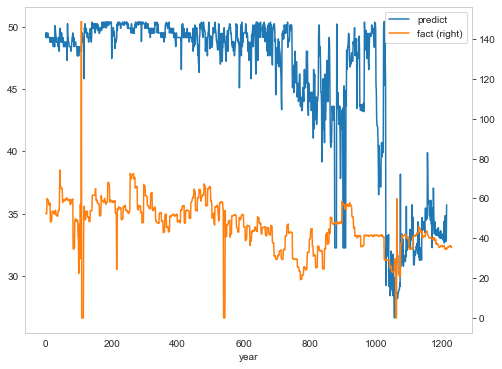

In [121]:
import matplotlib.pyplot as plt # Impot the relevant module


fig, ax = plt.subplots() # Create the figure and axes object

# Plot the first x and y axes:
df.plot(x = 'year', y = 'predict', ax = ax) 
# Plot the second x and y axes. By secondary_y = True a second y-axis is requested:
# (see https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.plot.html for details)
df.plot(x = 'year', y = 'fact', ax = ax, secondary_y = True)

In [431]:
import numpy as np

import numpy as np

def mean_absolute_percentage_error(y_true, y_pred): 
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

print(mean_absolute_percentage_error(Y_traint4, yhat))

419.59748221372274


# 20_STEPS(input)_203_liq_vol

In [ ]:
#features2s =[features_considered_south2] 
#features2 = datan['AKSH_424_water_vol','AKSH_249_water_vol','AKSH_247_water_vol','AKSH_250_water_vol','AKSH_424_water_vol','AKSH_214_water_vol']
#X_left = features2 #data2['AKSH_298_bhp_pump_press','AKSH_213_bhp_pump_press','AKSH_203_bhp_pump_press','AKSH_223_bhp_pump_press','AKSH_226_bhp_pump_press']

X_left = dataws #= data[features_considered_south1]
#X_left = data2[features2]
X_right = data[features_considered_south2]
Y_train = data['AKSH_203_liq_vol']#,'AKSH_226_liq_vol'] 
X_left = np.asarray(X_left)
X_right = np.asarray(X_right) 
Y_train = np.asarray(Y_train) 

In [703]:
# multivariate mlp example
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate
 
# сэмлы
def split_sequences(sequences, n_steps):
	X, y = list(), list()
	for i in range(len(sequences)):
		# разметка
		end_ix = i + n_steps
		# проверка выхода за пределы
		if end_ix > len(sequences):
			break
		# получение начала и конечной метки
		seq_x, seq_y = sequences[i:end_ix, :-1], sequences[end_ix-1, -1]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
# последовательность
in_seq1 = X_left#[365:1231]
in_seq2 = X_right#[365:1231]

out_seq = Y_train #array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1),6))
in_seq2 = in_seq2.reshape((len(in_seq2),5))
out_seq = out_seq.reshape((len(out_seq),1))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
n_steps = 20
# convert into input/output
X,y = split_sequences(dataset, n_steps)
#y = 
# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]
# первая модель
visible1 = Input(shape=(n_steps,))
dense1 = Dense(100, activation='relu')(visible1)
# вторая модель
visible2 = Input(shape=(n_steps,))
dense2 = Dense(100, activation='relu')(visible2)
# слияние
merge = concatenate([dense1, dense2])
output = Dense(1)(merge)
model = Model(inputs=[visible1, visible2], outputs=output)
model.compile(optimizer='adam', loss='mse', metrics=['accuracy'])
# fit model
model.fit([X1, X2], Y_train, epochs=2000, verbose= 1, batch_size=64, validation_split=0.1)
# demonstrate prediction
#x_input = array([[80, 85], [90, 95], [100, 105]])
#x1 = x_input[:, 0].reshape((1, n_steps))
#x2 = x_input[:, 1].reshape((1, n_steps))
yhat = model.predict([X1, X2], verbose=0)
print(yhat)

Epoch 1/2000
18/18 [==============================] - 1s 20ms/step - loss: 1475.3236 - accuracy: 0.0000e+00 - val_loss: 28.9502 - val_accuracy: 0.0000e+00
Epoch 2/2000
18/18 [==============================] - 0s 5ms/step - loss: 384.4402 - accuracy: 0.0000e+00 - val_loss: 77.0712 - val_accuracy: 0.0000e+00
Epoch 3/2000
18/18 [==============================] - 0s 3ms/step - loss: 234.4565 - accuracy: 0.0000e+00 - val_loss: 23.9564 - val_accuracy: 0.0000e+00
Epoch 4/2000
18/18 [==============================] - 0s 3ms/step - loss: 223.8942 - accuracy: 0.0000e+00 - val_loss: 18.3727 - val_accuracy: 0.0000e+00
Epoch 5/2000
18/18 [==============================] - 0s 3ms/step - loss: 280.7546 - accuracy: 0.0000e+00 - val_loss: 477.9534 - val_accuracy: 0.0000e+00
Epoch 6/2000
18/18 [==============================] - 0s 3ms/step - loss: 236.8978 - accuracy: 0.0000e+00 - val_loss: 19.2270 - val_accuracy: 0.0000e+00
Epoch 7/2000
18/18 [==============================] - 0s 3ms/step - loss: 221.5

18/18 [==============================] - 0s 3ms/step - loss: 143.3107 - accuracy: 0.0000e+00 - val_loss: 53.5907 - val_accuracy: 0.0000e+00
Epoch 108/2000
18/18 [==============================] - 0s 3ms/step - loss: 115.8878 - accuracy: 0.0000e+00 - val_loss: 139.3286 - val_accuracy: 0.0000e+00
Epoch 109/2000
18/18 [==============================] - 0s 3ms/step - loss: 118.3073 - accuracy: 0.0000e+00 - val_loss: 205.2241 - val_accuracy: 0.0000e+00
Epoch 110/2000
18/18 [==============================] - 0s 3ms/step - loss: 138.7083 - accuracy: 0.0000e+00 - val_loss: 104.1376 - val_accuracy: 0.0000e+00
Epoch 111/2000
18/18 [==============================] - ETA: 0s - loss: 157.6412 - accuracy: 0.0000e+ - 0s 3ms/step - loss: 131.7111 - accuracy: 0.0000e+00 - val_loss: 214.9624 - val_accuracy: 0.0000e+00
Epoch 112/2000
18/18 [==============================] - 0s 3ms/step - loss: 151.9005 - accuracy: 0.0000e+00 - val_loss: 69.3213 - val_accuracy: 0.0000e+00
Epoch 113/2000
18/18 [===========

Epoch 212/2000
18/18 [==============================] - 0s 3ms/step - loss: 201.7212 - accuracy: 0.0000e+00 - val_loss: 415.3988 - val_accuracy: 0.0000e+00
Epoch 213/2000
18/18 [==============================] - 0s 3ms/step - loss: 144.8321 - accuracy: 0.0000e+00 - val_loss: 256.9599 - val_accuracy: 0.0000e+00
Epoch 214/2000
18/18 [==============================] - 0s 3ms/step - loss: 130.6842 - accuracy: 0.0000e+00 - val_loss: 95.9647 - val_accuracy: 0.0000e+00
Epoch 215/2000
18/18 [==============================] - 0s 3ms/step - loss: 106.9307 - accuracy: 0.0000e+00 - val_loss: 82.4545 - val_accuracy: 0.0000e+00
Epoch 216/2000
18/18 [==============================] - 0s 3ms/step - loss: 124.5581 - accuracy: 0.0000e+00 - val_loss: 103.7177 - val_accuracy: 0.0000e+00
Epoch 217/2000
18/18 [==============================] - 0s 3ms/step - loss: 102.0517 - accuracy: 0.0000e+00 - val_loss: 70.1976 - val_accuracy: 0.0000e+00
Epoch 218/2000
18/18 [==============================] - 0s 3ms/step

Epoch 265/2000
18/18 [==============================] - 0s 3ms/step - loss: 105.5582 - accuracy: 0.0000e+00 - val_loss: 161.2434 - val_accuracy: 0.0000e+00
Epoch 266/2000
18/18 [==============================] - 0s 3ms/step - loss: 102.9977 - accuracy: 0.0000e+00 - val_loss: 110.2152 - val_accuracy: 0.0000e+00
Epoch 267/2000
18/18 [==============================] - 0s 3ms/step - loss: 104.2464 - accuracy: 0.0000e+00 - val_loss: 104.5258 - val_accuracy: 0.0000e+00
Epoch 268/2000
18/18 [==============================] - 0s 3ms/step - loss: 119.9808 - accuracy: 0.0000e+00 - val_loss: 127.3940 - val_accuracy: 0.0000e+00
Epoch 269/2000
18/18 [==============================] - 0s 3ms/step - loss: 108.2497 - accuracy: 0.0000e+00 - val_loss: 146.1000 - val_accuracy: 0.0000e+00
Epoch 270/2000
18/18 [==============================] - 0s 3ms/step - loss: 126.8246 - accuracy: 0.0000e+00 - val_loss: 94.0603 - val_accuracy: 0.0000e+00
Epoch 271/2000
18/18 [==============================] - 0s 3ms/st

Epoch 318/2000
18/18 [==============================] - 0s 3ms/step - loss: 123.8589 - accuracy: 0.0000e+00 - val_loss: 138.8896 - val_accuracy: 0.0000e+00
Epoch 319/2000
18/18 [==============================] - 0s 3ms/step - loss: 105.0179 - accuracy: 0.0000e+00 - val_loss: 72.9029 - val_accuracy: 0.0000e+00
Epoch 320/2000
18/18 [==============================] - 0s 3ms/step - loss: 143.4049 - accuracy: 0.0000e+00 - val_loss: 46.9292 - val_accuracy: 0.0000e+00
Epoch 321/2000
18/18 [==============================] - 0s 3ms/step - loss: 116.7554 - accuracy: 0.0000e+00 - val_loss: 117.6455 - val_accuracy: 0.0000e+00
Epoch 322/2000
18/18 [==============================] - 0s 3ms/step - loss: 90.0482 - accuracy: 0.0000e+00 - val_loss: 127.8557 - val_accuracy: 0.0000e+00
Epoch 323/2000
18/18 [==============================] - 0s 3ms/step - loss: 116.9935 - accuracy: 0.0000e+00 - val_loss: 86.6486 - val_accuracy: 0.0000e+00
Epoch 324/2000
18/18 [==============================] - 0s 3ms/step 

Epoch 371/2000
18/18 [==============================] - 0s 3ms/step - loss: 136.8115 - accuracy: 0.0000e+00 - val_loss: 183.0589 - val_accuracy: 0.0000e+00
Epoch 372/2000
18/18 [==============================] - 0s 3ms/step - loss: 129.8612 - accuracy: 0.0000e+00 - val_loss: 91.2905 - val_accuracy: 0.0000e+00
Epoch 373/2000
18/18 [==============================] - 0s 3ms/step - loss: 102.2597 - accuracy: 0.0000e+00 - val_loss: 132.3278 - val_accuracy: 0.0000e+00
Epoch 374/2000
18/18 [==============================] - 0s 3ms/step - loss: 115.7729 - accuracy: 0.0000e+00 - val_loss: 85.6361 - val_accuracy: 0.0000e+00
Epoch 375/2000
18/18 [==============================] - 0s 3ms/step - loss: 90.6789 - accuracy: 0.0000e+00 - val_loss: 155.2821 - val_accuracy: 0.0000e+00
Epoch 376/2000
18/18 [==============================] - 0s 3ms/step - loss: 91.4640 - accuracy: 0.0000e+00 - val_loss: 102.6367 - val_accuracy: 0.0000e+00
Epoch 377/2000
18/18 [==============================] - 0s 3ms/step 

Epoch 424/2000
18/18 [==============================] - 0s 3ms/step - loss: 122.4611 - accuracy: 0.0000e+00 - val_loss: 106.1375 - val_accuracy: 0.0000e+00
Epoch 425/2000
18/18 [==============================] - 0s 3ms/step - loss: 130.2763 - accuracy: 0.0000e+00 - val_loss: 83.6518 - val_accuracy: 0.0000e+00
Epoch 426/2000
18/18 [==============================] - 0s 3ms/step - loss: 105.8711 - accuracy: 0.0000e+00 - val_loss: 105.9851 - val_accuracy: 0.0000e+00
Epoch 427/2000
18/18 [==============================] - 0s 3ms/step - loss: 102.4555 - accuracy: 0.0000e+00 - val_loss: 97.0509 - val_accuracy: 0.0000e+00
Epoch 428/2000
18/18 [==============================] - 0s 3ms/step - loss: 98.8533 - accuracy: 0.0000e+00 - val_loss: 134.1274 - val_accuracy: 0.0000e+00
Epoch 429/2000
18/18 [==============================] - 0s 3ms/step - loss: 94.0531 - accuracy: 0.0000e+00 - val_loss: 96.6222 - val_accuracy: 0.0000e+00
Epoch 430/2000
18/18 [==============================] - 0s 3ms/step -

Epoch 477/2000
18/18 [==============================] - 0s 3ms/step - loss: 106.9356 - accuracy: 0.0000e+00 - val_loss: 156.1559 - val_accuracy: 0.0000e+00
Epoch 478/2000
18/18 [==============================] - 0s 3ms/step - loss: 90.4367 - accuracy: 0.0000e+00 - val_loss: 144.4823 - val_accuracy: 0.0000e+00
Epoch 479/2000
18/18 [==============================] - 0s 3ms/step - loss: 138.5454 - accuracy: 0.0000e+00 - val_loss: 144.3100 - val_accuracy: 0.0000e+00
Epoch 480/2000
18/18 [==============================] - 0s 3ms/step - loss: 99.6382 - accuracy: 0.0000e+00 - val_loss: 184.9661 - val_accuracy: 0.0000e+00
Epoch 481/2000
18/18 [==============================] - 0s 3ms/step - loss: 109.1626 - accuracy: 0.0000e+00 - val_loss: 160.8697 - val_accuracy: 0.0000e+00
Epoch 482/2000
18/18 [==============================] - 0s 3ms/step - loss: 115.2604 - accuracy: 0.0000e+00 - val_loss: 103.6811 - val_accuracy: 0.0000e+00
Epoch 483/2000
18/18 [==============================] - 0s 3ms/ste

Epoch 530/2000
18/18 [==============================] - 0s 3ms/step - loss: 101.3867 - accuracy: 0.0000e+00 - val_loss: 91.6017 - val_accuracy: 0.0000e+00
Epoch 531/2000
18/18 [==============================] - 0s 3ms/step - loss: 103.2727 - accuracy: 0.0000e+00 - val_loss: 171.6487 - val_accuracy: 0.0000e+00
Epoch 532/2000
18/18 [==============================] - 0s 3ms/step - loss: 115.8744 - accuracy: 0.0000e+00 - val_loss: 168.9793 - val_accuracy: 0.0000e+00
Epoch 533/2000
18/18 [==============================] - 0s 3ms/step - loss: 84.5328 - accuracy: 0.0000e+00 - val_loss: 100.5375 - val_accuracy: 0.0000e+00
Epoch 534/2000
18/18 [==============================] - 0s 3ms/step - loss: 91.6618 - accuracy: 0.0000e+00 - val_loss: 143.8614 - val_accuracy: 0.0000e+00
Epoch 535/2000
18/18 [==============================] - 0s 3ms/step - loss: 98.0203 - accuracy: 0.0000e+00 - val_loss: 88.6850 - val_accuracy: 0.0000e+00
Epoch 536/2000
18/18 [==============================] - 0s 3ms/step -

Epoch 583/2000
18/18 [==============================] - 0s 3ms/step - loss: 116.5940 - accuracy: 0.0000e+00 - val_loss: 46.1858 - val_accuracy: 0.0000e+00
Epoch 584/2000
18/18 [==============================] - 0s 3ms/step - loss: 100.6754 - accuracy: 0.0000e+00 - val_loss: 103.5075 - val_accuracy: 0.0000e+00
Epoch 585/2000
18/18 [==============================] - 0s 3ms/step - loss: 99.7936 - accuracy: 0.0000e+00 - val_loss: 98.0781 - val_accuracy: 0.0000e+00
Epoch 586/2000
18/18 [==============================] - 0s 3ms/step - loss: 91.9655 - accuracy: 0.0000e+00 - val_loss: 76.5468 - val_accuracy: 0.0000e+00
Epoch 587/2000
18/18 [==============================] - 0s 3ms/step - loss: 103.0108 - accuracy: 0.0000e+00 - val_loss: 104.6283 - val_accuracy: 0.0000e+00
Epoch 588/2000
18/18 [==============================] - 0s 3ms/step - loss: 105.9737 - accuracy: 0.0000e+00 - val_loss: 155.6434 - val_accuracy: 0.0000e+00
Epoch 589/2000
18/18 [==============================] - 0s 3ms/step -

Epoch 636/2000
18/18 [==============================] - 0s 3ms/step - loss: 105.7035 - accuracy: 0.0000e+00 - val_loss: 86.1960 - val_accuracy: 0.0000e+00
Epoch 637/2000
18/18 [==============================] - 0s 3ms/step - loss: 92.8253 - accuracy: 0.0000e+00 - val_loss: 141.4823 - val_accuracy: 0.0000e+00
Epoch 638/2000
18/18 [==============================] - 0s 3ms/step - loss: 87.0791 - accuracy: 0.0000e+00 - val_loss: 117.9790 - val_accuracy: 0.0000e+00
Epoch 639/2000
18/18 [==============================] - 0s 3ms/step - loss: 97.9626 - accuracy: 0.0000e+00 - val_loss: 155.6386 - val_accuracy: 0.0000e+00
Epoch 640/2000
18/18 [==============================] - 0s 3ms/step - loss: 99.4932 - accuracy: 0.0000e+00 - val_loss: 107.5123 - val_accuracy: 0.0000e+00
Epoch 641/2000
18/18 [==============================] - 0s 3ms/step - loss: 92.2062 - accuracy: 0.0000e+00 - val_loss: 134.0732 - val_accuracy: 0.0000e+00
Epoch 642/2000
18/18 [==============================] - 0s 3ms/step - 

Epoch 689/2000
18/18 [==============================] - 0s 3ms/step - loss: 113.3280 - accuracy: 0.0000e+00 - val_loss: 87.5158 - val_accuracy: 0.0000e+00
Epoch 690/2000
18/18 [==============================] - 0s 3ms/step - loss: 92.1074 - accuracy: 0.0000e+00 - val_loss: 92.7153 - val_accuracy: 0.0000e+00
Epoch 691/2000
18/18 [==============================] - 0s 3ms/step - loss: 99.3400 - accuracy: 0.0000e+00 - val_loss: 137.1045 - val_accuracy: 0.0000e+00
Epoch 692/2000
18/18 [==============================] - 0s 3ms/step - loss: 87.7001 - accuracy: 0.0000e+00 - val_loss: 97.1966 - val_accuracy: 0.0000e+00
Epoch 693/2000
18/18 [==============================] - 0s 3ms/step - loss: 87.8082 - accuracy: 0.0000e+00 - val_loss: 107.8413 - val_accuracy: 0.0000e+00
Epoch 694/2000
18/18 [==============================] - 0s 3ms/step - loss: 106.9786 - accuracy: 0.0000e+00 - val_loss: 138.8797 - val_accuracy: 0.0000e+00
Epoch 695/2000
18/18 [==============================] - 0s 3ms/step - l

Epoch 742/2000
18/18 [==============================] - 0s 3ms/step - loss: 104.9142 - accuracy: 0.0000e+00 - val_loss: 117.6936 - val_accuracy: 0.0000e+00
Epoch 743/2000
18/18 [==============================] - 0s 3ms/step - loss: 95.0899 - accuracy: 0.0000e+00 - val_loss: 116.6429 - val_accuracy: 0.0000e+00
Epoch 744/2000
18/18 [==============================] - 0s 3ms/step - loss: 104.6690 - accuracy: 0.0000e+00 - val_loss: 107.6980 - val_accuracy: 0.0000e+00
Epoch 745/2000
18/18 [==============================] - 0s 3ms/step - loss: 90.0306 - accuracy: 0.0000e+00 - val_loss: 107.8331 - val_accuracy: 0.0000e+00
Epoch 746/2000
18/18 [==============================] - 0s 3ms/step - loss: 96.7404 - accuracy: 0.0000e+00 - val_loss: 115.7215 - val_accuracy: 0.0000e+00
Epoch 747/2000
18/18 [==============================] - 0s 3ms/step - loss: 111.1549 - accuracy: 0.0000e+00 - val_loss: 118.4366 - val_accuracy: 0.0000e+00
Epoch 748/2000
18/18 [==============================] - 0s 3ms/step

Epoch 795/2000
18/18 [==============================] - 0s 3ms/step - loss: 93.2477 - accuracy: 0.0000e+00 - val_loss: 157.0201 - val_accuracy: 0.0000e+00
Epoch 796/2000
18/18 [==============================] - 0s 3ms/step - loss: 90.4033 - accuracy: 0.0000e+00 - val_loss: 117.6866 - val_accuracy: 0.0000e+00
Epoch 797/2000
18/18 [==============================] - 0s 3ms/step - loss: 103.5976 - accuracy: 0.0000e+00 - val_loss: 148.7320 - val_accuracy: 0.0000e+00
Epoch 798/2000
18/18 [==============================] - 0s 3ms/step - loss: 121.2272 - accuracy: 0.0000e+00 - val_loss: 159.2082 - val_accuracy: 0.0000e+00
Epoch 799/2000
18/18 [==============================] - 0s 3ms/step - loss: 92.6599 - accuracy: 0.0000e+00 - val_loss: 155.8683 - val_accuracy: 0.0000e+00
Epoch 800/2000
18/18 [==============================] - 0s 3ms/step - loss: 91.9565 - accuracy: 0.0000e+00 - val_loss: 133.7698 - val_accuracy: 0.0000e+00
Epoch 801/2000
18/18 [==============================] - 0s 3ms/step 

Epoch 848/2000
18/18 [==============================] - 0s 3ms/step - loss: 99.4834 - accuracy: 0.0000e+00 - val_loss: 113.1479 - val_accuracy: 0.0000e+00
Epoch 849/2000
18/18 [==============================] - 0s 3ms/step - loss: 90.4097 - accuracy: 0.0000e+00 - val_loss: 155.8798 - val_accuracy: 0.0000e+00
Epoch 850/2000
18/18 [==============================] - 0s 3ms/step - loss: 101.1644 - accuracy: 0.0000e+00 - val_loss: 122.6619 - val_accuracy: 0.0000e+00
Epoch 851/2000
18/18 [==============================] - 0s 3ms/step - loss: 89.4150 - accuracy: 0.0000e+00 - val_loss: 136.0205 - val_accuracy: 0.0000e+00
Epoch 852/2000
18/18 [==============================] - 0s 3ms/step - loss: 98.7879 - accuracy: 0.0000e+00 - val_loss: 135.8846 - val_accuracy: 0.0000e+00
Epoch 853/2000
18/18 [==============================] - 0s 3ms/step - loss: 104.3778 - accuracy: 0.0000e+00 - val_loss: 97.4169 - val_accuracy: 0.0000e+00
Epoch 854/2000
18/18 [==============================] - 0s 3ms/step -

Epoch 901/2000
18/18 [==============================] - 0s 3ms/step - loss: 88.7718 - accuracy: 0.0000e+00 - val_loss: 104.3669 - val_accuracy: 0.0000e+00
Epoch 902/2000
18/18 [==============================] - 0s 3ms/step - loss: 91.5461 - accuracy: 0.0000e+00 - val_loss: 99.2346 - val_accuracy: 0.0000e+00
Epoch 903/2000
18/18 [==============================] - 0s 3ms/step - loss: 108.6339 - accuracy: 0.0000e+00 - val_loss: 105.1094 - val_accuracy: 0.0000e+00
Epoch 904/2000
18/18 [==============================] - 0s 3ms/step - loss: 91.5024 - accuracy: 0.0000e+00 - val_loss: 96.2963 - val_accuracy: 0.0000e+00
Epoch 905/2000
18/18 [==============================] - 0s 3ms/step - loss: 91.6037 - accuracy: 0.0000e+00 - val_loss: 120.3038 - val_accuracy: 0.0000e+00
Epoch 906/2000
18/18 [==============================] - 0s 3ms/step - loss: 93.7427 - accuracy: 0.0000e+00 - val_loss: 121.0882 - val_accuracy: 0.0000e+00
Epoch 907/2000
18/18 [==============================] - 0s 3ms/step - l

Epoch 954/2000
18/18 [==============================] - 0s 3ms/step - loss: 113.4690 - accuracy: 0.0000e+00 - val_loss: 100.3862 - val_accuracy: 0.0000e+00
Epoch 955/2000
18/18 [==============================] - 0s 3ms/step - loss: 95.9382 - accuracy: 0.0000e+00 - val_loss: 133.2579 - val_accuracy: 0.0000e+00
Epoch 956/2000
18/18 [==============================] - 0s 3ms/step - loss: 98.3007 - accuracy: 0.0000e+00 - val_loss: 121.5535 - val_accuracy: 0.0000e+00
Epoch 957/2000
18/18 [==============================] - 0s 3ms/step - loss: 86.0952 - accuracy: 0.0000e+00 - val_loss: 156.1417 - val_accuracy: 0.0000e+00
Epoch 958/2000
18/18 [==============================] - 0s 3ms/step - loss: 94.0607 - accuracy: 0.0000e+00 - val_loss: 101.6030 - val_accuracy: 0.0000e+00
Epoch 959/2000
18/18 [==============================] - 0s 3ms/step - loss: 89.9680 - accuracy: 0.0000e+00 - val_loss: 91.0206 - val_accuracy: 0.0000e+00
Epoch 960/2000
18/18 [==============================] - 0s 3ms/step - 

Epoch 1007/2000
18/18 [==============================] - 0s 3ms/step - loss: 102.9252 - accuracy: 0.0000e+00 - val_loss: 92.8236 - val_accuracy: 0.0000e+00
Epoch 1008/2000
18/18 [==============================] - 0s 3ms/step - loss: 90.3856 - accuracy: 0.0000e+00 - val_loss: 104.4958 - val_accuracy: 0.0000e+00
Epoch 1009/2000
18/18 [==============================] - 0s 3ms/step - loss: 103.4028 - accuracy: 0.0000e+00 - val_loss: 121.8848 - val_accuracy: 0.0000e+00
Epoch 1010/2000
18/18 [==============================] - 0s 3ms/step - loss: 81.7067 - accuracy: 0.0000e+00 - val_loss: 119.6841 - val_accuracy: 0.0000e+00
Epoch 1011/2000
18/18 [==============================] - 0s 3ms/step - loss: 89.3519 - accuracy: 0.0000e+00 - val_loss: 109.6593 - val_accuracy: 0.0000e+00
Epoch 1012/2000
18/18 [==============================] - 0s 3ms/step - loss: 95.5117 - accuracy: 0.0000e+00 - val_loss: 105.8429 - val_accuracy: 0.0000e+00
Epoch 1013/2000
18/18 [==============================] - 0s 3ms

18/18 [==============================] - 0s 3ms/step - loss: 85.5316 - accuracy: 0.0000e+00 - val_loss: 115.4895 - val_accuracy: 0.0000e+00
Epoch 1112/2000
18/18 [==============================] - 0s 3ms/step - loss: 88.6111 - accuracy: 0.0000e+00 - val_loss: 138.0859 - val_accuracy: 0.0000e+00
Epoch 1113/2000
18/18 [==============================] - 0s 3ms/step - loss: 86.2477 - accuracy: 0.0000e+00 - val_loss: 171.0734 - val_accuracy: 0.0000e+00
Epoch 1114/2000
18/18 [==============================] - 0s 3ms/step - loss: 89.9570 - accuracy: 0.0000e+00 - val_loss: 167.4360 - val_accuracy: 0.0000e+00
Epoch 1115/2000
18/18 [==============================] - 0s 3ms/step - loss: 93.3370 - accuracy: 0.0000e+00 - val_loss: 130.9632 - val_accuracy: 0.0000e+00
Epoch 1116/2000
18/18 [==============================] - 0s 3ms/step - loss: 102.9992 - accuracy: 0.0000e+00 - val_loss: 140.5055 - val_accuracy: 0.0000e+00
Epoch 1117/2000
18/18 [==============================] - 0s 3ms/step - loss: 10

Epoch 1164/2000
18/18 [==============================] - 0s 3ms/step - loss: 87.5799 - accuracy: 0.0000e+00 - val_loss: 74.7751 - val_accuracy: 0.0000e+00
Epoch 1165/2000
18/18 [==============================] - 0s 3ms/step - loss: 98.7414 - accuracy: 0.0000e+00 - val_loss: 96.0628 - val_accuracy: 0.0000e+00
Epoch 1166/2000
18/18 [==============================] - 0s 3ms/step - loss: 110.6669 - accuracy: 0.0000e+00 - val_loss: 108.2340 - val_accuracy: 0.0000e+00
Epoch 1167/2000
18/18 [==============================] - 0s 3ms/step - loss: 94.4812 - accuracy: 0.0000e+00 - val_loss: 136.2188 - val_accuracy: 0.0000e+00
Epoch 1168/2000
18/18 [==============================] - 0s 3ms/step - loss: 103.1454 - accuracy: 0.0000e+00 - val_loss: 110.6608 - val_accuracy: 0.0000e+00
Epoch 1169/2000
18/18 [==============================] - 0s 3ms/step - loss: 102.2709 - accuracy: 0.0000e+00 - val_loss: 128.7677 - val_accuracy: 0.0000e+00
Epoch 1170/2000
18/18 [==============================] - 0s 3ms

Epoch 1269/2000
18/18 [==============================] - 0s 3ms/step - loss: 93.4322 - accuracy: 0.0000e+00 - val_loss: 85.1467 - val_accuracy: 0.0000e+00
Epoch 1270/2000
18/18 [==============================] - 0s 3ms/step - loss: 99.0423 - accuracy: 0.0000e+00 - val_loss: 76.6479 - val_accuracy: 0.0000e+00
Epoch 1271/2000
18/18 [==============================] - 0s 3ms/step - loss: 84.8433 - accuracy: 0.0000e+00 - val_loss: 72.6510 - val_accuracy: 0.0000e+00
Epoch 1272/2000
18/18 [==============================] - 0s 3ms/step - loss: 85.6896 - accuracy: 0.0000e+00 - val_loss: 66.7923 - val_accuracy: 0.0000e+00
Epoch 1273/2000
18/18 [==============================] - 0s 3ms/step - loss: 79.9751 - accuracy: 0.0000e+00 - val_loss: 109.1854 - val_accuracy: 0.0000e+00
Epoch 1274/2000
18/18 [==============================] - 0s 3ms/step - loss: 93.5748 - accuracy: 0.0000e+00 - val_loss: 79.5072 - val_accuracy: 0.0000e+00
Epoch 1275/2000
18/18 [==============================] - 0s 3ms/step 

Epoch 1322/2000
18/18 [==============================] - 0s 3ms/step - loss: 109.9553 - accuracy: 0.0000e+00 - val_loss: 69.9155 - val_accuracy: 0.0000e+00
Epoch 1323/2000
18/18 [==============================] - 0s 3ms/step - loss: 74.7083 - accuracy: 0.0000e+00 - val_loss: 60.7620 - val_accuracy: 0.0000e+00
Epoch 1324/2000
18/18 [==============================] - 0s 3ms/step - loss: 102.9566 - accuracy: 0.0000e+00 - val_loss: 75.9375 - val_accuracy: 0.0000e+00
Epoch 1325/2000
18/18 [==============================] - 0s 3ms/step - loss: 88.1111 - accuracy: 0.0000e+00 - val_loss: 85.0717 - val_accuracy: 0.0000e+00
Epoch 1326/2000
18/18 [==============================] - 0s 3ms/step - loss: 90.5177 - accuracy: 0.0000e+00 - val_loss: 98.0762 - val_accuracy: 0.0000e+00
Epoch 1327/2000
18/18 [==============================] - 0s 3ms/step - loss: 95.2699 - accuracy: 0.0000e+00 - val_loss: 131.2360 - val_accuracy: 0.0000e+00
Epoch 1328/2000
18/18 [==============================] - 0s 3ms/ste

Epoch 1427/2000
18/18 [==============================] - 0s 3ms/step - loss: 94.7261 - accuracy: 0.0000e+00 - val_loss: 84.1325 - val_accuracy: 0.0000e+00
Epoch 1428/2000
18/18 [==============================] - 0s 3ms/step - loss: 104.3544 - accuracy: 0.0000e+00 - val_loss: 94.8589 - val_accuracy: 0.0000e+00
Epoch 1429/2000
18/18 [==============================] - 0s 3ms/step - loss: 79.0336 - accuracy: 0.0000e+00 - val_loss: 91.7134 - val_accuracy: 0.0000e+00
Epoch 1430/2000
18/18 [==============================] - 0s 3ms/step - loss: 104.3799 - accuracy: 0.0000e+00 - val_loss: 89.3036 - val_accuracy: 0.0000e+00
Epoch 1431/2000
18/18 [==============================] - 0s 3ms/step - loss: 77.9869 - accuracy: 0.0000e+00 - val_loss: 81.9855 - val_accuracy: 0.0000e+00
Epoch 1432/2000
18/18 [==============================] - 0s 3ms/step - loss: 77.5127 - accuracy: 0.0000e+00 - val_loss: 100.2869 - val_accuracy: 0.0000e+00
Epoch 1433/2000
18/18 [==============================] - 0s 3ms/ste

Epoch 1532/2000
18/18 [==============================] - 0s 3ms/step - loss: 76.7475 - accuracy: 0.0000e+00 - val_loss: 88.6439 - val_accuracy: 0.0000e+00
Epoch 1533/2000
18/18 [==============================] - 0s 3ms/step - loss: 89.5738 - accuracy: 0.0000e+00 - val_loss: 91.2755 - val_accuracy: 0.0000e+00
Epoch 1534/2000
18/18 [==============================] - 0s 3ms/step - loss: 89.8602 - accuracy: 0.0000e+00 - val_loss: 93.1814 - val_accuracy: 0.0000e+00
Epoch 1535/2000
18/18 [==============================] - 0s 3ms/step - loss: 84.3027 - accuracy: 0.0000e+00 - val_loss: 87.3717 - val_accuracy: 0.0000e+00
Epoch 1536/2000
18/18 [==============================] - 0s 3ms/step - loss: 80.9378 - accuracy: 0.0000e+00 - val_loss: 88.6093 - val_accuracy: 0.0000e+00
Epoch 1537/2000
18/18 [==============================] - 0s 3ms/step - loss: 96.5323 - accuracy: 0.0000e+00 - val_loss: 103.3616 - val_accuracy: 0.0000e+00
Epoch 1538/2000
18/18 [==============================] - 0s 3ms/step 

Epoch 1637/2000
18/18 [==============================] - 0s 3ms/step - loss: 86.9408 - accuracy: 0.0000e+00 - val_loss: 136.0307 - val_accuracy: 0.0000e+00
Epoch 1638/2000
18/18 [==============================] - 0s 4ms/step - loss: 88.2282 - accuracy: 0.0000e+00 - val_loss: 109.6212 - val_accuracy: 0.0000e+00
Epoch 1639/2000
18/18 [==============================] - 0s 3ms/step - loss: 83.6082 - accuracy: 0.0000e+00 - val_loss: 120.2117 - val_accuracy: 0.0000e+00
Epoch 1640/2000
18/18 [==============================] - 0s 3ms/step - loss: 79.6923 - accuracy: 0.0000e+00 - val_loss: 116.7577 - val_accuracy: 0.0000e+00
Epoch 1641/2000
18/18 [==============================] - 0s 3ms/step - loss: 83.1691 - accuracy: 0.0000e+00 - val_loss: 133.5048 - val_accuracy: 0.0000e+00
Epoch 1642/2000
18/18 [==============================] - 0s 3ms/step - loss: 106.4805 - accuracy: 0.0000e+00 - val_loss: 109.4517 - val_accuracy: 0.0000e+00
Epoch 1643/2000
18/18 [==============================] - 0s 3ms

Epoch 1742/2000
18/18 [==============================] - 0s 3ms/step - loss: 92.7829 - accuracy: 0.0000e+00 - val_loss: 113.9726 - val_accuracy: 0.0000e+00
Epoch 1743/2000
18/18 [==============================] - 0s 3ms/step - loss: 87.7961 - accuracy: 0.0000e+00 - val_loss: 105.7475 - val_accuracy: 0.0000e+00
Epoch 1744/2000
18/18 [==============================] - 0s 3ms/step - loss: 78.3927 - accuracy: 0.0000e+00 - val_loss: 106.3815 - val_accuracy: 0.0000e+00
Epoch 1745/2000
18/18 [==============================] - 0s 3ms/step - loss: 96.7939 - accuracy: 0.0000e+00 - val_loss: 116.8087 - val_accuracy: 0.0000e+00
Epoch 1746/2000
18/18 [==============================] - 0s 3ms/step - loss: 82.5676 - accuracy: 0.0000e+00 - val_loss: 124.5737 - val_accuracy: 0.0000e+00
Epoch 1747/2000
18/18 [==============================] - 0s 3ms/step - loss: 84.4322 - accuracy: 0.0000e+00 - val_loss: 114.7923 - val_accuracy: 0.0000e+00
Epoch 1748/2000
18/18 [==============================] - 0s 3ms/

18/18 [==============================] - 0s 3ms/step - loss: 80.2704 - accuracy: 0.0000e+00 - val_loss: 96.1091 - val_accuracy: 0.0000e+00
Epoch 1847/2000
18/18 [==============================] - 0s 3ms/step - loss: 79.2775 - accuracy: 0.0000e+00 - val_loss: 91.2855 - val_accuracy: 0.0000e+00
Epoch 1848/2000
18/18 [==============================] - 0s 3ms/step - loss: 91.8769 - accuracy: 0.0000e+00 - val_loss: 95.0531 - val_accuracy: 0.0000e+00
Epoch 1849/2000
18/18 [==============================] - 0s 3ms/step - loss: 85.4448 - accuracy: 0.0000e+00 - val_loss: 97.7519 - val_accuracy: 0.0000e+00
Epoch 1850/2000
18/18 [==============================] - 0s 3ms/step - loss: 96.0099 - accuracy: 0.0000e+00 - val_loss: 129.2659 - val_accuracy: 0.0000e+00
Epoch 1851/2000
18/18 [==============================] - 0s 3ms/step - loss: 82.7704 - accuracy: 0.0000e+00 - val_loss: 110.6423 - val_accuracy: 0.0000e+00
Epoch 1852/2000
18/18 [==============================] - 0s 3ms/step - loss: 84.4527

Epoch 1899/2000
18/18 [==============================] - 0s 3ms/step - loss: 87.4927 - accuracy: 0.0000e+00 - val_loss: 110.3611 - val_accuracy: 0.0000e+00
Epoch 1900/2000
18/18 [==============================] - 0s 3ms/step - loss: 98.6750 - accuracy: 0.0000e+00 - val_loss: 101.3200 - val_accuracy: 0.0000e+00
Epoch 1901/2000
18/18 [==============================] - 0s 3ms/step - loss: 69.0656 - accuracy: 0.0000e+00 - val_loss: 137.8894 - val_accuracy: 0.0000e+00
Epoch 1902/2000
18/18 [==============================] - 0s 3ms/step - loss: 139.7410 - accuracy: 0.0000e+00 - val_loss: 112.0508 - val_accuracy: 0.0000e+00
Epoch 1903/2000
18/18 [==============================] - 0s 3ms/step - loss: 102.4131 - accuracy: 0.0000e+00 - val_loss: 148.7392 - val_accuracy: 0.0000e+00
Epoch 1904/2000
18/18 [==============================] - 0s 3ms/step - loss: 95.2975 - accuracy: 0.0000e+00 - val_loss: 112.4325 - val_accuracy: 0.0000e+00
Epoch 1905/2000
18/18 [==============================] - 0s 3m

In [704]:
yhat = yhat.flatten() 
Y_train = Y_train.flatten()

In [707]:
Y_train = Y_train[0:866]
yhat = yhat[0:866]

In [708]:
datadd = data2.index
#datadd = features.index 
datadd = datadd.to_numpy()

df = pd.DataFrame(data={'year': datadd, 
                        'predict': yhat, 
                        'fact': Y_train})

In [ ]:
import matplotlib.pyplot as plt # Impot the relevant module


fig, ax = plt.subplots() # Create the figure and axes object

# Plot the first x and y axes:
df.plot(x = 'year', y = 'predict', ax = ax) 
# Plot the second x and y axes. By secondary_y = True a second y-axis is requested:
# (see https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.plot.html for details)
df.plot(x = 'year', y = 'fact', ax = ax, secondary_y = True)

<AxesSubplot:label='0cacf0b1-f837-4b5c-ac35-37d577b54d9c'>

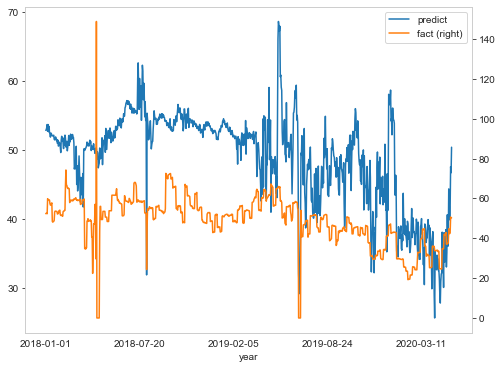

In [709]:
import matplotlib.pyplot as plt # Impot the relevant module 20ДНЕЙ!


fig, ax = plt.subplots() # Create the figure and axes object

# Plot the first x and y axes:
df.plot(x = 'year', y = 'predict', ax = ax) 
# Plot the second x and y axes. By secondary_y = True a second y-axis is requested:
# (see https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.plot.html for details)
df.plot(x = 'year', y = 'fact', ax = ax, secondary_y = True)

In [711]:
# multivariate mlp example223
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate
 
# сэмлы
def split_sequences(sequences, n_steps):
	X, y = list(), list()
	for i in range(len(sequences)):
		# разметка
		end_ix = i + n_steps
		# проверка выхода за пределы
		if end_ix > len(sequences):
			break
		# получение начала и конечной метки
		seq_x, seq_y = sequences[i:end_ix, :-1], sequences[end_ix-1, -1]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
# последовательность
in_seq1 = X_left#[365:1231]
in_seq2 = X_right#[365:1231]

out_seq = Y_train #array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1),6))
in_seq2 = in_seq2.reshape((len(in_seq2),5))
out_seq = out_seq.reshape((len(out_seq),1))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
n_steps = 1
# convert into input/output
X,y = split_sequences(dataset, n_steps)
#y = 
# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]
# первая модель
visible1 = Input(shape=(n_steps,))
dense1 = Dense(100, activation='relu')(visible1)
# вторая модель
visible2 = Input(shape=(n_steps,))
dense2 = Dense(100, activation='relu')(visible2)
# слияние
merge = concatenate([dense1, dense2])
output = Dense(1)(merge)
model = Model(inputs=[visible1, visible2], outputs=output)
model.compile(optimizer='adam', loss='mse', metrics=['accuracy'])
# fit model
model.fit([X1, X2], Y_train, epochs=2000, verbose= 1, batch_size=64, validation_split=0.1)
# demonstrate prediction
#x_input = array([[80, 85], [90, 95], [100, 105]])
#x1 = x_input[:, 0].reshape((1, n_steps))
#x2 = x_input[:, 1].reshape((1, n_steps))
yhat = model.predict([X1, X2], verbose=0)
print(yhat)

Epoch 1/2000
18/18 [==============================] - 1s 9ms/step - loss: 1999.9832 - accuracy: 0.0038 - val_loss: 343.7384 - val_accuracy: 0.0000e+00
Epoch 2/2000
18/18 [==============================] - 0s 3ms/step - loss: 1361.7668 - accuracy: 0.0000e+00 - val_loss: 200.8126 - val_accuracy: 0.0000e+00
Epoch 3/2000
18/18 [==============================] - 0s 3ms/step - loss: 944.8317 - accuracy: 0.0000e+00 - val_loss: 265.0031 - val_accuracy: 0.0000e+00
Epoch 4/2000
18/18 [==============================] - 0s 3ms/step - loss: 668.6692 - accuracy: 0.0000e+00 - val_loss: 109.4261 - val_accuracy: 0.0000e+00
Epoch 5/2000
18/18 [==============================] - 0s 3ms/step - loss: 398.9106 - accuracy: 0.0000e+00 - val_loss: 91.2659 - val_accuracy: 0.0000e+00
Epoch 6/2000
18/18 [==============================] - 0s 3ms/step - loss: 330.2880 - accuracy: 0.0000e+00 - val_loss: 52.3160 - val_accuracy: 0.0000e+00
Epoch 7/2000
18/18 [==============================] - 0s 3ms/step - loss: 303.49

18/18 [==============================] - 0s 3ms/step - loss: 207.8753 - accuracy: 0.0000e+00 - val_loss: 56.5436 - val_accuracy: 0.0000e+00
Epoch 108/2000
18/18 [==============================] - 0s 3ms/step - loss: 201.8758 - accuracy: 0.0000e+00 - val_loss: 64.3182 - val_accuracy: 0.0000e+00
Epoch 109/2000
18/18 [==============================] - 0s 3ms/step - loss: 205.0278 - accuracy: 0.0000e+00 - val_loss: 72.8475 - val_accuracy: 0.0000e+00
Epoch 110/2000
18/18 [==============================] - 0s 3ms/step - loss: 202.3107 - accuracy: 0.0000e+00 - val_loss: 50.4359 - val_accuracy: 0.0000e+00
Epoch 111/2000
18/18 [==============================] - 0s 3ms/step - loss: 216.6961 - accuracy: 0.0000e+00 - val_loss: 90.0730 - val_accuracy: 0.0000e+00
Epoch 112/2000
18/18 [==============================] - 0s 3ms/step - loss: 195.0514 - accuracy: 0.0000e+00 - val_loss: 52.8480 - val_accuracy: 0.0000e+00
Epoch 113/2000
18/18 [==============================] - 0s 3ms/step - loss: 191.6427 

Epoch 160/2000
18/18 [==============================] - 0s 3ms/step - loss: 148.0202 - accuracy: 0.0000e+00 - val_loss: 48.1960 - val_accuracy: 0.0000e+00
Epoch 161/2000
18/18 [==============================] - 0s 3ms/step - loss: 153.2712 - accuracy: 0.0000e+00 - val_loss: 60.0720 - val_accuracy: 0.0000e+00
Epoch 162/2000
18/18 [==============================] - 0s 3ms/step - loss: 148.1490 - accuracy: 0.0000e+00 - val_loss: 46.0562 - val_accuracy: 0.0000e+00
Epoch 163/2000
18/18 [==============================] - 0s 3ms/step - loss: 152.3361 - accuracy: 0.0000e+00 - val_loss: 55.7433 - val_accuracy: 0.0000e+00
Epoch 164/2000
18/18 [==============================] - 0s 3ms/step - loss: 150.0387 - accuracy: 0.0000e+00 - val_loss: 107.6972 - val_accuracy: 0.0000e+00
Epoch 165/2000
18/18 [==============================] - 0s 3ms/step - loss: 137.4313 - accuracy: 0.0000e+00 - val_loss: 49.0415 - val_accuracy: 0.0000e+00
Epoch 166/2000
18/18 [==============================] - 0s 3ms/step -

Epoch 213/2000
18/18 [==============================] - 0s 3ms/step - loss: 143.5741 - accuracy: 0.0000e+00 - val_loss: 20.3593 - val_accuracy: 0.0000e+00
Epoch 214/2000
18/18 [==============================] - 0s 3ms/step - loss: 150.3605 - accuracy: 0.0000e+00 - val_loss: 16.3304 - val_accuracy: 0.0000e+00
Epoch 215/2000
18/18 [==============================] - 0s 3ms/step - loss: 147.2082 - accuracy: 0.0000e+00 - val_loss: 42.0579 - val_accuracy: 0.0000e+00
Epoch 216/2000
18/18 [==============================] - 0s 3ms/step - loss: 148.7135 - accuracy: 0.0000e+00 - val_loss: 37.1884 - val_accuracy: 0.0000e+00
Epoch 217/2000
18/18 [==============================] - 0s 3ms/step - loss: 134.9721 - accuracy: 0.0000e+00 - val_loss: 27.9327 - val_accuracy: 0.0000e+00
Epoch 218/2000
18/18 [==============================] - 0s 3ms/step - loss: 137.4179 - accuracy: 0.0000e+00 - val_loss: 31.7766 - val_accuracy: 0.0000e+00
Epoch 219/2000
18/18 [==============================] - 0s 3ms/step - 

Epoch 266/2000
18/18 [==============================] - 0s 3ms/step - loss: 147.1151 - accuracy: 0.0000e+00 - val_loss: 25.5733 - val_accuracy: 0.0000e+00
Epoch 267/2000
18/18 [==============================] - 0s 3ms/step - loss: 149.2216 - accuracy: 0.0000e+00 - val_loss: 51.9909 - val_accuracy: 0.0000e+00
Epoch 268/2000
18/18 [==============================] - 0s 3ms/step - loss: 138.1695 - accuracy: 0.0000e+00 - val_loss: 62.3630 - val_accuracy: 0.0000e+00
Epoch 269/2000
18/18 [==============================] - 0s 3ms/step - loss: 154.6859 - accuracy: 0.0000e+00 - val_loss: 53.6278 - val_accuracy: 0.0000e+00
Epoch 270/2000
18/18 [==============================] - 0s 3ms/step - loss: 128.4325 - accuracy: 0.0000e+00 - val_loss: 35.5589 - val_accuracy: 0.0000e+00
Epoch 271/2000
18/18 [==============================] - 0s 3ms/step - loss: 150.4855 - accuracy: 0.0000e+00 - val_loss: 15.3218 - val_accuracy: 0.0000e+00
Epoch 272/2000
18/18 [==============================] - 0s 3ms/step - 

Epoch 319/2000
18/18 [==============================] - 0s 3ms/step - loss: 161.2809 - accuracy: 0.0000e+00 - val_loss: 18.7694 - val_accuracy: 0.0000e+00
Epoch 320/2000
18/18 [==============================] - 0s 3ms/step - loss: 137.8399 - accuracy: 0.0000e+00 - val_loss: 35.1352 - val_accuracy: 0.0000e+00
Epoch 321/2000
18/18 [==============================] - 0s 3ms/step - loss: 134.6680 - accuracy: 0.0000e+00 - val_loss: 86.6801 - val_accuracy: 0.0000e+00
Epoch 322/2000
18/18 [==============================] - 0s 3ms/step - loss: 138.0171 - accuracy: 0.0000e+00 - val_loss: 33.4182 - val_accuracy: 0.0000e+00
Epoch 323/2000
18/18 [==============================] - 0s 3ms/step - loss: 137.7912 - accuracy: 0.0000e+00 - val_loss: 61.8197 - val_accuracy: 0.0000e+00
Epoch 324/2000
18/18 [==============================] - 0s 3ms/step - loss: 137.5349 - accuracy: 0.0000e+00 - val_loss: 22.8099 - val_accuracy: 0.0000e+00
Epoch 325/2000
18/18 [==============================] - 0s 3ms/step - 

Epoch 372/2000
18/18 [==============================] - 0s 3ms/step - loss: 140.5954 - accuracy: 0.0000e+00 - val_loss: 31.8444 - val_accuracy: 0.0000e+00
Epoch 373/2000
18/18 [==============================] - 0s 3ms/step - loss: 140.9369 - accuracy: 0.0000e+00 - val_loss: 21.4351 - val_accuracy: 0.0000e+00
Epoch 374/2000
18/18 [==============================] - 0s 3ms/step - loss: 166.3302 - accuracy: 0.0000e+00 - val_loss: 18.5482 - val_accuracy: 0.0000e+00
Epoch 375/2000
18/18 [==============================] - 0s 3ms/step - loss: 140.3597 - accuracy: 0.0000e+00 - val_loss: 27.9580 - val_accuracy: 0.0000e+00
Epoch 376/2000
18/18 [==============================] - 0s 3ms/step - loss: 134.9127 - accuracy: 0.0000e+00 - val_loss: 49.0286 - val_accuracy: 0.0000e+00
Epoch 377/2000
18/18 [==============================] - 0s 3ms/step - loss: 131.5619 - accuracy: 0.0000e+00 - val_loss: 24.7907 - val_accuracy: 0.0000e+00
Epoch 378/2000
18/18 [==============================] - 0s 3ms/step - 

Epoch 425/2000
18/18 [==============================] - 0s 3ms/step - loss: 149.8513 - accuracy: 0.0000e+00 - val_loss: 18.7069 - val_accuracy: 0.0000e+00
Epoch 426/2000
18/18 [==============================] - 0s 3ms/step - loss: 148.9356 - accuracy: 0.0000e+00 - val_loss: 18.4560 - val_accuracy: 0.0000e+00
Epoch 427/2000
18/18 [==============================] - 0s 3ms/step - loss: 132.4912 - accuracy: 0.0000e+00 - val_loss: 19.8906 - val_accuracy: 0.0000e+00
Epoch 428/2000
18/18 [==============================] - 0s 3ms/step - loss: 134.8777 - accuracy: 0.0000e+00 - val_loss: 54.9575 - val_accuracy: 0.0000e+00
Epoch 429/2000
18/18 [==============================] - 0s 3ms/step - loss: 135.7427 - accuracy: 0.0000e+00 - val_loss: 49.6337 - val_accuracy: 0.0000e+00
Epoch 430/2000
18/18 [==============================] - 0s 3ms/step - loss: 160.0454 - accuracy: 0.0000e+00 - val_loss: 16.2958 - val_accuracy: 0.0000e+00
Epoch 431/2000
18/18 [==============================] - 0s 3ms/step - 

Epoch 530/2000
18/18 [==============================] - 0s 3ms/step - loss: 169.9226 - accuracy: 0.0000e+00 - val_loss: 26.6977 - val_accuracy: 0.0000e+00
Epoch 531/2000
18/18 [==============================] - 0s 3ms/step - loss: 145.1786 - accuracy: 0.0000e+00 - val_loss: 27.2001 - val_accuracy: 0.0000e+00
Epoch 532/2000
18/18 [==============================] - 0s 3ms/step - loss: 173.3189 - accuracy: 0.0000e+00 - val_loss: 42.2526 - val_accuracy: 0.0000e+00
Epoch 533/2000
18/18 [==============================] - 0s 3ms/step - loss: 139.2559 - accuracy: 0.0000e+00 - val_loss: 54.8162 - val_accuracy: 0.0000e+00
Epoch 534/2000
18/18 [==============================] - 0s 3ms/step - loss: 140.2166 - accuracy: 0.0000e+00 - val_loss: 53.0825 - val_accuracy: 0.0000e+00
Epoch 535/2000
18/18 [==============================] - 0s 3ms/step - loss: 134.7214 - accuracy: 0.0000e+00 - val_loss: 61.1617 - val_accuracy: 0.0000e+00
Epoch 536/2000
18/18 [==============================] - 0s 3ms/step - 

Epoch 583/2000
18/18 [==============================] - 0s 3ms/step - loss: 138.0266 - accuracy: 0.0000e+00 - val_loss: 19.0872 - val_accuracy: 0.0000e+00
Epoch 584/2000
18/18 [==============================] - 0s 3ms/step - loss: 138.0889 - accuracy: 0.0000e+00 - val_loss: 28.5572 - val_accuracy: 0.0000e+00
Epoch 585/2000
18/18 [==============================] - 0s 3ms/step - loss: 146.0025 - accuracy: 0.0000e+00 - val_loss: 18.3325 - val_accuracy: 0.0000e+00
Epoch 586/2000
18/18 [==============================] - 0s 3ms/step - loss: 152.5565 - accuracy: 0.0000e+00 - val_loss: 47.0881 - val_accuracy: 0.0000e+00
Epoch 587/2000
18/18 [==============================] - 0s 3ms/step - loss: 152.0261 - accuracy: 0.0000e+00 - val_loss: 25.9759 - val_accuracy: 0.0000e+00
Epoch 588/2000
18/18 [==============================] - 0s 3ms/step - loss: 137.6799 - accuracy: 0.0000e+00 - val_loss: 44.1501 - val_accuracy: 0.0000e+00
Epoch 589/2000
18/18 [==============================] - 0s 3ms/step - 

Epoch 636/2000
18/18 [==============================] - 0s 3ms/step - loss: 142.0792 - accuracy: 0.0000e+00 - val_loss: 22.5192 - val_accuracy: 0.0000e+00
Epoch 637/2000
18/18 [==============================] - 0s 3ms/step - loss: 129.8066 - accuracy: 0.0000e+00 - val_loss: 52.6826 - val_accuracy: 0.0000e+00
Epoch 638/2000
18/18 [==============================] - 0s 3ms/step - loss: 142.9409 - accuracy: 0.0000e+00 - val_loss: 22.1622 - val_accuracy: 0.0000e+00
Epoch 639/2000
18/18 [==============================] - 0s 3ms/step - loss: 143.4585 - accuracy: 0.0000e+00 - val_loss: 26.4802 - val_accuracy: 0.0000e+00
Epoch 640/2000
18/18 [==============================] - 0s 3ms/step - loss: 142.4962 - accuracy: 0.0000e+00 - val_loss: 31.8512 - val_accuracy: 0.0000e+00
Epoch 641/2000
18/18 [==============================] - 0s 3ms/step - loss: 143.9663 - accuracy: 0.0000e+00 - val_loss: 22.2760 - val_accuracy: 0.0000e+00
Epoch 642/2000
18/18 [==============================] - 0s 3ms/step - 

Epoch 689/2000
18/18 [==============================] - 0s 3ms/step - loss: 138.0300 - accuracy: 0.0000e+00 - val_loss: 20.3525 - val_accuracy: 0.0000e+00
Epoch 690/2000
18/18 [==============================] - 0s 3ms/step - loss: 167.9604 - accuracy: 0.0000e+00 - val_loss: 27.5386 - val_accuracy: 0.0000e+00
Epoch 691/2000
18/18 [==============================] - 0s 3ms/step - loss: 162.8717 - accuracy: 0.0000e+00 - val_loss: 54.4853 - val_accuracy: 0.0000e+00
Epoch 692/2000
18/18 [==============================] - 0s 3ms/step - loss: 146.5974 - accuracy: 0.0000e+00 - val_loss: 32.6337 - val_accuracy: 0.0000e+00
Epoch 693/2000
18/18 [==============================] - 0s 3ms/step - loss: 140.6314 - accuracy: 0.0000e+00 - val_loss: 30.3144 - val_accuracy: 0.0000e+00
Epoch 694/2000
18/18 [==============================] - 0s 3ms/step - loss: 140.1882 - accuracy: 0.0000e+00 - val_loss: 46.1921 - val_accuracy: 0.0000e+00
Epoch 695/2000
18/18 [==============================] - 0s 3ms/step - 

Epoch 742/2000
18/18 [==============================] - 0s 3ms/step - loss: 149.6916 - accuracy: 0.0000e+00 - val_loss: 41.0652 - val_accuracy: 0.0000e+00
Epoch 743/2000
18/18 [==============================] - 0s 3ms/step - loss: 138.7123 - accuracy: 0.0000e+00 - val_loss: 49.9279 - val_accuracy: 0.0000e+00
Epoch 744/2000
18/18 [==============================] - 0s 3ms/step - loss: 142.8147 - accuracy: 0.0000e+00 - val_loss: 24.8482 - val_accuracy: 0.0000e+00
Epoch 745/2000
18/18 [==============================] - 0s 3ms/step - loss: 129.7251 - accuracy: 0.0000e+00 - val_loss: 43.7429 - val_accuracy: 0.0000e+00
Epoch 746/2000
18/18 [==============================] - 0s 3ms/step - loss: 153.2311 - accuracy: 0.0000e+00 - val_loss: 43.0622 - val_accuracy: 0.0000e+00
Epoch 747/2000
18/18 [==============================] - 0s 3ms/step - loss: 127.9585 - accuracy: 0.0000e+00 - val_loss: 21.6096 - val_accuracy: 0.0000e+00
Epoch 748/2000
18/18 [==============================] - 0s 3ms/step - 

Epoch 795/2000
18/18 [==============================] - 0s 3ms/step - loss: 151.4904 - accuracy: 0.0000e+00 - val_loss: 37.8617 - val_accuracy: 0.0000e+00
Epoch 796/2000
18/18 [==============================] - 0s 3ms/step - loss: 133.0045 - accuracy: 0.0000e+00 - val_loss: 82.7558 - val_accuracy: 0.0000e+00
Epoch 797/2000
18/18 [==============================] - 0s 3ms/step - loss: 136.7161 - accuracy: 0.0000e+00 - val_loss: 36.4581 - val_accuracy: 0.0000e+00
Epoch 798/2000
18/18 [==============================] - 0s 3ms/step - loss: 153.6384 - accuracy: 0.0000e+00 - val_loss: 13.8957 - val_accuracy: 0.0000e+00
Epoch 799/2000
18/18 [==============================] - 0s 3ms/step - loss: 143.8632 - accuracy: 0.0000e+00 - val_loss: 52.2107 - val_accuracy: 0.0000e+00
Epoch 800/2000
18/18 [==============================] - 0s 3ms/step - loss: 137.8366 - accuracy: 0.0000e+00 - val_loss: 17.9731 - val_accuracy: 0.0000e+00
Epoch 801/2000
18/18 [==============================] - 0s 3ms/step - 

Epoch 848/2000
18/18 [==============================] - 0s 3ms/step - loss: 135.8385 - accuracy: 0.0000e+00 - val_loss: 51.4963 - val_accuracy: 0.0000e+00
Epoch 849/2000
18/18 [==============================] - 0s 3ms/step - loss: 155.1140 - accuracy: 0.0000e+00 - val_loss: 24.3066 - val_accuracy: 0.0000e+00
Epoch 850/2000
18/18 [==============================] - 0s 3ms/step - loss: 140.2725 - accuracy: 0.0000e+00 - val_loss: 29.4570 - val_accuracy: 0.0000e+00
Epoch 851/2000
18/18 [==============================] - 0s 3ms/step - loss: 143.1871 - accuracy: 0.0000e+00 - val_loss: 40.5981 - val_accuracy: 0.0000e+00
Epoch 852/2000
18/18 [==============================] - 0s 3ms/step - loss: 133.7409 - accuracy: 0.0000e+00 - val_loss: 38.5067 - val_accuracy: 0.0000e+00
Epoch 853/2000
18/18 [==============================] - 0s 3ms/step - loss: 142.0197 - accuracy: 0.0000e+00 - val_loss: 30.1257 - val_accuracy: 0.0000e+00
Epoch 854/2000
18/18 [==============================] - 0s 3ms/step - 

Epoch 901/2000
18/18 [==============================] - 0s 3ms/step - loss: 142.0295 - accuracy: 0.0000e+00 - val_loss: 56.8454 - val_accuracy: 0.0000e+00
Epoch 902/2000
18/18 [==============================] - 0s 3ms/step - loss: 148.4257 - accuracy: 0.0000e+00 - val_loss: 21.4828 - val_accuracy: 0.0000e+00
Epoch 903/2000
18/18 [==============================] - 0s 3ms/step - loss: 139.1585 - accuracy: 0.0000e+00 - val_loss: 24.2610 - val_accuracy: 0.0000e+00
Epoch 904/2000
18/18 [==============================] - 0s 3ms/step - loss: 150.0193 - accuracy: 0.0000e+00 - val_loss: 58.9143 - val_accuracy: 0.0000e+00
Epoch 905/2000
18/18 [==============================] - 0s 3ms/step - loss: 146.6119 - accuracy: 0.0000e+00 - val_loss: 48.8215 - val_accuracy: 0.0000e+00
Epoch 906/2000
18/18 [==============================] - 0s 3ms/step - loss: 131.5530 - accuracy: 0.0000e+00 - val_loss: 21.3096 - val_accuracy: 0.0000e+00
Epoch 907/2000
18/18 [==============================] - 0s 3ms/step - 

Epoch 954/2000
18/18 [==============================] - 0s 3ms/step - loss: 136.1141 - accuracy: 0.0000e+00 - val_loss: 49.9502 - val_accuracy: 0.0000e+00
Epoch 955/2000
18/18 [==============================] - 0s 3ms/step - loss: 141.4175 - accuracy: 0.0000e+00 - val_loss: 18.2039 - val_accuracy: 0.0000e+00
Epoch 956/2000
18/18 [==============================] - 0s 3ms/step - loss: 145.8499 - accuracy: 0.0000e+00 - val_loss: 23.9260 - val_accuracy: 0.0000e+00
Epoch 957/2000
18/18 [==============================] - 0s 3ms/step - loss: 147.6842 - accuracy: 0.0000e+00 - val_loss: 30.0485 - val_accuracy: 0.0000e+00
Epoch 958/2000
18/18 [==============================] - 0s 3ms/step - loss: 147.9051 - accuracy: 0.0000e+00 - val_loss: 41.1334 - val_accuracy: 0.0000e+00
Epoch 959/2000
18/18 [==============================] - 0s 3ms/step - loss: 147.2655 - accuracy: 0.0000e+00 - val_loss: 41.5847 - val_accuracy: 0.0000e+00
Epoch 960/2000
18/18 [==============================] - 0s 3ms/step - 

Epoch 1007/2000
18/18 [==============================] - 0s 3ms/step - loss: 167.6053 - accuracy: 0.0000e+00 - val_loss: 22.5456 - val_accuracy: 0.0000e+00
Epoch 1008/2000
18/18 [==============================] - 0s 3ms/step - loss: 138.0480 - accuracy: 0.0000e+00 - val_loss: 63.2954 - val_accuracy: 0.0000e+00
Epoch 1009/2000
18/18 [==============================] - 0s 3ms/step - loss: 142.2058 - accuracy: 0.0000e+00 - val_loss: 17.5186 - val_accuracy: 0.0000e+00
Epoch 1010/2000
18/18 [==============================] - 0s 3ms/step - loss: 151.2326 - accuracy: 0.0000e+00 - val_loss: 31.0409 - val_accuracy: 0.0000e+00
Epoch 1011/2000
18/18 [==============================] - 0s 3ms/step - loss: 154.4047 - accuracy: 0.0000e+00 - val_loss: 41.8034 - val_accuracy: 0.0000e+00
Epoch 1012/2000
18/18 [==============================] - ETA: 0s - loss: 108.3384 - accuracy: 0.0000e+ - 0s 3ms/step - loss: 131.1658 - accuracy: 0.0000e+00 - val_loss: 16.5481 - val_accuracy: 0.0000e+00
Epoch 1013/2000


18/18 [==============================] - 0s 3ms/step - loss: 126.6064 - accuracy: 0.0000e+00 - val_loss: 24.4550 - val_accuracy: 0.0000e+00
Epoch 1112/2000
18/18 [==============================] - 0s 3ms/step - loss: 147.1964 - accuracy: 0.0000e+00 - val_loss: 28.1694 - val_accuracy: 0.0000e+00
Epoch 1113/2000
18/18 [==============================] - 0s 3ms/step - loss: 146.2327 - accuracy: 0.0000e+00 - val_loss: 23.3415 - val_accuracy: 0.0000e+00
Epoch 1114/2000
18/18 [==============================] - 0s 3ms/step - loss: 170.4659 - accuracy: 0.0000e+00 - val_loss: 46.1312 - val_accuracy: 0.0000e+00
Epoch 1115/2000
18/18 [==============================] - 0s 3ms/step - loss: 125.0514 - accuracy: 0.0000e+00 - val_loss: 49.0931 - val_accuracy: 0.0000e+00
Epoch 1116/2000
18/18 [==============================] - 0s 3ms/step - loss: 138.8887 - accuracy: 0.0000e+00 - val_loss: 30.6210 - val_accuracy: 0.0000e+00
Epoch 1117/2000
18/18 [==============================] - 0s 3ms/step - loss: 143

18/18 [==============================] - 0s 3ms/step - loss: 144.8756 - accuracy: 0.0000e+00 - val_loss: 26.4294 - val_accuracy: 0.0000e+00
Epoch 1216/2000
18/18 [==============================] - 0s 3ms/step - loss: 155.1301 - accuracy: 0.0000e+00 - val_loss: 18.4596 - val_accuracy: 0.0000e+00
Epoch 1217/2000
18/18 [==============================] - 0s 3ms/step - loss: 150.2286 - accuracy: 0.0000e+00 - val_loss: 44.1614 - val_accuracy: 0.0000e+00
Epoch 1218/2000
18/18 [==============================] - 0s 2ms/step - loss: 153.5012 - accuracy: 0.0000e+00 - val_loss: 14.4576 - val_accuracy: 0.0000e+00
Epoch 1219/2000
18/18 [==============================] - 0s 3ms/step - loss: 143.6573 - accuracy: 0.0000e+00 - val_loss: 15.8993 - val_accuracy: 0.0000e+00
Epoch 1220/2000
18/18 [==============================] - 0s 3ms/step - loss: 148.2875 - accuracy: 0.0000e+00 - val_loss: 70.1067 - val_accuracy: 0.0000e+00
Epoch 1221/2000
18/18 [==============================] - 0s 3ms/step - loss: 163

18/18 [==============================] - 0s 3ms/step - loss: 157.0091 - accuracy: 0.0000e+00 - val_loss: 29.0322 - val_accuracy: 0.0000e+00
Epoch 1320/2000
18/18 [==============================] - 0s 3ms/step - loss: 143.0428 - accuracy: 0.0000e+00 - val_loss: 16.2133 - val_accuracy: 0.0000e+00
Epoch 1321/2000
18/18 [==============================] - 0s 3ms/step - loss: 144.2322 - accuracy: 0.0000e+00 - val_loss: 45.9077 - val_accuracy: 0.0000e+00
Epoch 1322/2000
18/18 [==============================] - 0s 3ms/step - loss: 142.3072 - accuracy: 0.0000e+00 - val_loss: 26.5109 - val_accuracy: 0.0000e+00
Epoch 1323/2000
18/18 [==============================] - 0s 3ms/step - loss: 138.5939 - accuracy: 0.0000e+00 - val_loss: 56.9775 - val_accuracy: 0.0000e+00
Epoch 1324/2000
18/18 [==============================] - 0s 3ms/step - loss: 157.3491 - accuracy: 0.0000e+00 - val_loss: 22.2578 - val_accuracy: 0.0000e+00
Epoch 1325/2000
18/18 [==============================] - 0s 3ms/step - loss: 152

18/18 [==============================] - 0s 3ms/step - loss: 138.4809 - accuracy: 0.0000e+00 - val_loss: 32.8235 - val_accuracy: 0.0000e+00
Epoch 1424/2000
18/18 [==============================] - 0s 3ms/step - loss: 144.0534 - accuracy: 0.0000e+00 - val_loss: 41.4010 - val_accuracy: 0.0000e+00
Epoch 1425/2000
18/18 [==============================] - 0s 3ms/step - loss: 132.7131 - accuracy: 0.0000e+00 - val_loss: 20.5862 - val_accuracy: 0.0000e+00
Epoch 1426/2000
18/18 [==============================] - 0s 3ms/step - loss: 130.5732 - accuracy: 0.0000e+00 - val_loss: 57.9427 - val_accuracy: 0.0000e+00
Epoch 1427/2000
18/18 [==============================] - 0s 3ms/step - loss: 170.2424 - accuracy: 0.0000e+00 - val_loss: 33.4875 - val_accuracy: 0.0000e+00
Epoch 1428/2000
18/18 [==============================] - 0s 3ms/step - loss: 159.8880 - accuracy: 0.0000e+00 - val_loss: 15.8699 - val_accuracy: 0.0000e+00
Epoch 1429/2000
18/18 [==============================] - 0s 3ms/step - loss: 160

18/18 [==============================] - 0s 3ms/step - loss: 152.0325 - accuracy: 0.0000e+00 - val_loss: 39.0488 - val_accuracy: 0.0000e+00
Epoch 1528/2000
18/18 [==============================] - 0s 3ms/step - loss: 136.3449 - accuracy: 0.0000e+00 - val_loss: 22.0026 - val_accuracy: 0.0000e+00
Epoch 1529/2000
18/18 [==============================] - 0s 3ms/step - loss: 143.3609 - accuracy: 0.0000e+00 - val_loss: 26.0593 - val_accuracy: 0.0000e+00
Epoch 1530/2000
18/18 [==============================] - 0s 3ms/step - loss: 159.5953 - accuracy: 0.0000e+00 - val_loss: 77.6915 - val_accuracy: 0.0000e+00
Epoch 1531/2000
18/18 [==============================] - 0s 3ms/step - loss: 145.2122 - accuracy: 0.0000e+00 - val_loss: 20.9847 - val_accuracy: 0.0000e+00
Epoch 1532/2000
18/18 [==============================] - 0s 3ms/step - loss: 137.2906 - accuracy: 0.0000e+00 - val_loss: 21.0053 - val_accuracy: 0.0000e+00
Epoch 1533/2000
18/18 [==============================] - 0s 3ms/step - loss: 136

18/18 [==============================] - 0s 3ms/step - loss: 145.6374 - accuracy: 0.0000e+00 - val_loss: 22.0215 - val_accuracy: 0.0000e+00
Epoch 1632/2000
18/18 [==============================] - 0s 3ms/step - loss: 151.3927 - accuracy: 0.0000e+00 - val_loss: 39.6734 - val_accuracy: 0.0000e+00
Epoch 1633/2000
18/18 [==============================] - 0s 3ms/step - loss: 142.2233 - accuracy: 0.0000e+00 - val_loss: 61.6565 - val_accuracy: 0.0000e+00
Epoch 1634/2000
18/18 [==============================] - 0s 3ms/step - loss: 130.6862 - accuracy: 0.0000e+00 - val_loss: 19.3076 - val_accuracy: 0.0000e+00
Epoch 1635/2000
18/18 [==============================] - 0s 3ms/step - loss: 173.9711 - accuracy: 0.0000e+00 - val_loss: 17.7210 - val_accuracy: 0.0000e+00
Epoch 1636/2000
18/18 [==============================] - 0s 3ms/step - loss: 136.2020 - accuracy: 0.0000e+00 - val_loss: 56.3989 - val_accuracy: 0.0000e+00
Epoch 1637/2000
18/18 [==============================] - 0s 3ms/step - loss: 133

18/18 [==============================] - 0s 3ms/step - loss: 128.6571 - accuracy: 0.0000e+00 - val_loss: 37.2217 - val_accuracy: 0.0000e+00
Epoch 1736/2000
18/18 [==============================] - 0s 3ms/step - loss: 151.6923 - accuracy: 0.0000e+00 - val_loss: 37.1375 - val_accuracy: 0.0000e+00
Epoch 1737/2000
18/18 [==============================] - 0s 3ms/step - loss: 144.9644 - accuracy: 0.0000e+00 - val_loss: 15.1048 - val_accuracy: 0.0000e+00
Epoch 1738/2000
18/18 [==============================] - 0s 3ms/step - loss: 153.5803 - accuracy: 0.0000e+00 - val_loss: 23.5130 - val_accuracy: 0.0000e+00
Epoch 1739/2000
18/18 [==============================] - 0s 3ms/step - loss: 155.2956 - accuracy: 0.0000e+00 - val_loss: 43.3554 - val_accuracy: 0.0000e+00
Epoch 1740/2000
18/18 [==============================] - 0s 3ms/step - loss: 126.7049 - accuracy: 0.0000e+00 - val_loss: 37.0082 - val_accuracy: 0.0000e+00
Epoch 1741/2000
18/18 [==============================] - 0s 3ms/step - loss: 138

18/18 [==============================] - 0s 3ms/step - loss: 155.9116 - accuracy: 0.0000e+00 - val_loss: 35.2966 - val_accuracy: 0.0000e+00
Epoch 1840/2000
18/18 [==============================] - 0s 3ms/step - loss: 139.5282 - accuracy: 0.0000e+00 - val_loss: 41.8442 - val_accuracy: 0.0000e+00
Epoch 1841/2000
18/18 [==============================] - 0s 3ms/step - loss: 144.4979 - accuracy: 0.0000e+00 - val_loss: 36.0402 - val_accuracy: 0.0000e+00
Epoch 1842/2000
18/18 [==============================] - 0s 3ms/step - loss: 161.8060 - accuracy: 0.0000e+00 - val_loss: 33.7377 - val_accuracy: 0.0000e+00
Epoch 1843/2000
18/18 [==============================] - 0s 3ms/step - loss: 143.6946 - accuracy: 0.0000e+00 - val_loss: 13.4536 - val_accuracy: 0.0000e+00
Epoch 1844/2000
18/18 [==============================] - 0s 3ms/step - loss: 162.6943 - accuracy: 0.0000e+00 - val_loss: 52.1195 - val_accuracy: 0.0000e+00
Epoch 1845/2000
18/18 [==============================] - 0s 3ms/step - loss: 148

18/18 [==============================] - 0s 3ms/step - loss: 137.9569 - accuracy: 0.0000e+00 - val_loss: 43.7301 - val_accuracy: 0.0000e+00
Epoch 1944/2000
18/18 [==============================] - 0s 3ms/step - loss: 164.6379 - accuracy: 0.0000e+00 - val_loss: 22.1465 - val_accuracy: 0.0000e+00
Epoch 1945/2000
18/18 [==============================] - 0s 3ms/step - loss: 136.4851 - accuracy: 0.0000e+00 - val_loss: 47.2924 - val_accuracy: 0.0000e+00
Epoch 1946/2000
18/18 [==============================] - 0s 3ms/step - loss: 132.0962 - accuracy: 0.0000e+00 - val_loss: 43.4180 - val_accuracy: 0.0000e+00
Epoch 1947/2000
18/18 [==============================] - 0s 3ms/step - loss: 150.4741 - accuracy: 0.0000e+00 - val_loss: 23.4708 - val_accuracy: 0.0000e+00
Epoch 1948/2000
18/18 [==============================] - 0s 3ms/step - loss: 134.0909 - accuracy: 0.0000e+00 - val_loss: 23.0373 - val_accuracy: 0.0000e+00
Epoch 1949/2000
18/18 [==============================] - 0s 3ms/step - loss: 145

In [712]:
yhat = yhat.flatten() 
Y_train = Y_train.flatten()

In [718]:
yhat = yhat[0:866]
Y_train = Y_train[0:866]

In [719]:
datadd = data2.index
#datadd = features.index 
datadd = datadd.to_numpy()

df = pd.DataFrame(data={'year': datadd, 
                        'predict': yhat, 
                        'fact': Y_train})

<AxesSubplot:label='653aa1fe-b1cf-4135-94de-23d3a3b1b4c4'>

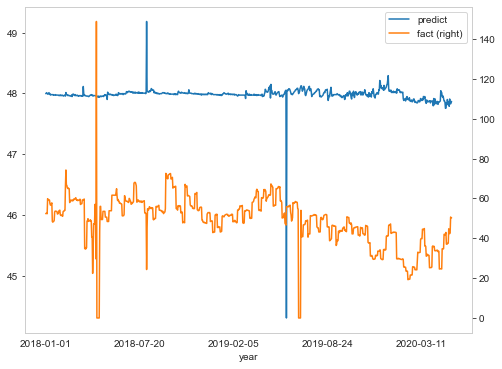

In [720]:
import matplotlib.pyplot as plt # Impot the relevant module


fig, ax = plt.subplots() # Create the figure and axes object

# Plot the first x and y axes:
df.plot(x = 'year', y = 'predict', ax = ax) 
# Plot the second x and y axes. By secondary_y = True a second y-axis is requested:
# (see https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.plot.html for details)
df.plot(x = 'year', y = 'fact', ax = ax, secondary_y = True)

# 226_LIQ_VOL

In [174]:
#features2s =[features_considered_south2] 
#features2 = datan['AKSH_424_water_vol','AKSH_249_water_vol','AKSH_247_water_vol','AKSH_250_water_vol','AKSH_424_water_vol','AKSH_214_water_vol']
#X_left = features2 #data2['AKSH_298_bhp_pump_press','AKSH_213_bhp_pump_press','AKSH_203_bhp_pump_press','AKSH_223_bhp_pump_press','AKSH_226_bhp_pump_press']

X_left = dataws #= data[features_considered_south1]
X_left = X_left.shift(-15)
#X_left = data2[features2]
X_right = data[features_considered_south2]
Y_train = data['AKSH_226_liq_vol']#,'AKSH_226_liq_vol'] 
X_left = np.asarray(X_left)
X_right = np.asarray(X_right) 
Y_train = np.asarray(Y_train) 

In [175]:
X_leftl = X_left[(data.index < '2020-01-01')]
X_rightl = X_right[(data.index < '2020-01-01')]
Y_trainl = Y_train[(data.index < '2020-01-01')]#,'AKSH_226_liq_vol'] 


X_leftt = X_left[(data.index > '2020-01-01')]
X_rightt = X_right[(data.index > '2020-01-01')]
Y_traint = Y_train[(data.index > '2020-01-01')]#,'AKSH_226_liq_vol'] 

datadd = data.index
datadt = datadd[(data.index > '2020-01-01')]
datadl = datadd[(data.index < '2020-01-01')]

X_left = np.asarray(X_left)
X_right = np.asarray(X_right) 
Y_train = np.asarray(Y_train)
X_leftl = np.asarray(X_leftl)
X_rightl = np.asarray(X_rightl) 
Y_trainl = np.asarray(Y_trainl)
X_leftt = np.asarray(X_leftt)
X_rightt = np.asarray(X_rightt) 
Y_traint = np.asarray(Y_traint)

# SINGLESTEP

In [176]:
# multivariate mlp example
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate
import tensorflow as tf
import tensorflow_addons as tfa 
# сэмлы
def split_sequences(sequences, n_steps):
	X, y = list(), list()
	for i in range(len(sequences)):
		# разметка
		end_ix = i + n_steps
		# проверка выхода за пределы
		if end_ix > len(sequences):
			break
		# получение начала и конечной метки
		seq_x, seq_y = sequences[i:end_ix, :-1], sequences[end_ix-1, -1]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
# последовательность
in_seq1 = X_leftl
in_seq2 = X_rightl

out_seq = Y_trainl #array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1),6))
in_seq2 = in_seq2.reshape((len(in_seq2),5))
out_seq = out_seq.reshape((len(out_seq),1))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
n_steps = 15
# convert into input/output
X,y = split_sequences(dataset, n_steps)
#y = 
# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]
# первая модель
visible1 = Input(shape=(n_steps,))
visible1n = tfa.layers.GroupNormalization(15,-1,0.001,True)(visible1)
dense1 = Dense(100,kernel_initializer='lecun_normal', activation='selu')(visible1n)
dense21 = Dense(10, activation='relu')(dense1)
# вторая модель
visible2 = Input(shape=(n_steps,))
visible2n = tfa.layers.GroupNormalization(15,-1,0.001,True)(visible2)
dense2 = Dense(100,kernel_initializer='lecun_normal', activation='selu')(visible2n)
dense22 = Dense(10, activation='relu')(dense2)
# слияние
# слияние
merge = concatenate([dense1, dense2])
output = Dense(1)(merge)
model = Model(inputs=[visible1, visible2], outputs=output)
model.compile(optimizer='adam', loss='mse', metrics=['accuracy'])
# fit model
model.fit([X1, X2], Y_trainl, epochs=200, verbose= 1, batch_size=64, validation_split=0.1)
# demonstrate prediction
#x_input = array([[80, 85], [90, 95], [100, 105]])
#x1 = x_input[:, 0].reshape((1, n_steps))
#x2 = x_input[:, 1].reshape((1, n_steps))

 
# последовательность
in_seq1t = X_leftt
in_seq2t = X_rightt

out_seqt = Y_traint #array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1t = in_seq1.reshape((len(in_seq1),6))
in_seq2t = in_seq2.reshape((len(in_seq2),5))
out_seqt = out_seq.reshape((len(out_seq),1))
# горизонтальное последовательное размещение данных 
datasett = hstack((in_seq1t, in_seq2t, out_seqt))
# таймстепы
n_steps = 15
# convert into input/output
Xt,yt = split_sequences(datasett, n_steps)
X1t = Xt[:, :, 0]
X2t = Xt[:, :, 1]
yhatt = model.predict([X1t, X2t], verbose=0)
print(yhatt)

Epoch 1/200
11/11 [==============================] - 1s 22ms/step - loss: 437.4686 - accuracy: 0.0000e+00 - val_loss: 472.0950 - val_accuracy: 0.0000e+00
Epoch 2/200
11/11 [==============================] - 0s 4ms/step - loss: 417.8386 - accuracy: 0.0000e+00 - val_loss: 443.2748 - val_accuracy: 0.0000e+00
Epoch 3/200
11/11 [==============================] - 0s 4ms/step - loss: 390.7276 - accuracy: 0.0000e+00 - val_loss: 401.7767 - val_accuracy: 0.0000e+00
Epoch 4/200
11/11 [==============================] - 0s 5ms/step - loss: 350.5201 - accuracy: 0.0000e+00 - val_loss: 344.8817 - val_accuracy: 0.0000e+00
Epoch 5/200
11/11 [==============================] - 0s 4ms/step - loss: 292.9257 - accuracy: 0.0000e+00 - val_loss: 273.6697 - val_accuracy: 0.0000e+00
Epoch 6/200
11/11 [==============================] - 0s 4ms/step - loss: 221.2360 - accuracy: 0.0000e+00 - val_loss: 194.1524 - val_accuracy: 0.0000e+00
Epoch 7/200
11/11 [==============================] - 0s 4ms/step - loss: 145.5922

Epoch 55/200
11/11 [==============================] - 0s 4ms/step - loss: 11.0606 - accuracy: 0.0000e+00 - val_loss: 14.7269 - val_accuracy: 0.0000e+00
Epoch 56/200
11/11 [==============================] - 0s 4ms/step - loss: 10.6934 - accuracy: 0.0000e+00 - val_loss: 14.7106 - val_accuracy: 0.0000e+00
Epoch 57/200
11/11 [==============================] - 0s 4ms/step - loss: 10.7156 - accuracy: 0.0000e+00 - val_loss: 14.2963 - val_accuracy: 0.0000e+00
Epoch 58/200
11/11 [==============================] - 0s 4ms/step - loss: 10.8984 - accuracy: 0.0000e+00 - val_loss: 14.1830 - val_accuracy: 0.0000e+00
Epoch 59/200
11/11 [==============================] - 0s 4ms/step - loss: 10.9634 - accuracy: 0.0000e+00 - val_loss: 14.5891 - val_accuracy: 0.0000e+00
Epoch 60/200
11/11 [==============================] - 0s 4ms/step - loss: 12.1081 - accuracy: 0.0000e+00 - val_loss: 14.6312 - val_accuracy: 0.0000e+00
Epoch 61/200
11/11 [==============================] - 0s 4ms/step - loss: 10.9804 - accu

Epoch 109/200
11/11 [==============================] - 0s 4ms/step - loss: 11.2008 - accuracy: 0.0000e+00 - val_loss: 14.2954 - val_accuracy: 0.0000e+00
Epoch 110/200
11/11 [==============================] - 0s 4ms/step - loss: 10.6676 - accuracy: 0.0000e+00 - val_loss: 14.4221 - val_accuracy: 0.0000e+00
Epoch 111/200
11/11 [==============================] - 0s 4ms/step - loss: 10.8736 - accuracy: 0.0000e+00 - val_loss: 15.2336 - val_accuracy: 0.0000e+00
Epoch 112/200
11/11 [==============================] - 0s 4ms/step - loss: 10.9853 - accuracy: 0.0000e+00 - val_loss: 14.4568 - val_accuracy: 0.0000e+00
Epoch 113/200
11/11 [==============================] - 0s 4ms/step - loss: 10.7535 - accuracy: 0.0000e+00 - val_loss: 14.2408 - val_accuracy: 0.0000e+00
Epoch 114/200
11/11 [==============================] - 0s 4ms/step - loss: 11.1337 - accuracy: 0.0000e+00 - val_loss: 14.8118 - val_accuracy: 0.0000e+00
Epoch 115/200
11/11 [==============================] - 0s 4ms/step - loss: 9.9246 

In [177]:
# multivariate mlp example
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate
 
# сэмлы
def split_sequences(sequences, n_steps):
	X, y = list(), list()
	for i in range(len(sequences)):
		# разметка
		end_ix = i + n_steps
		# проверка выхода за пределы
		if end_ix > len(sequences):
			break
		# получение начала и конечной метки
		seq_x, seq_y = sequences[i:end_ix, :-1], sequences[end_ix-1, -1]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
# последовательность
in_seq1 = X_leftt
in_seq2 = X_rightt

out_seq = Y_traint #array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1), 6))
in_seq2 = in_seq2.reshape((len(in_seq2), 5))
out_seq = out_seq.reshape((len(out_seq), 1))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
n_steps = 15
# convert into input/output
X,y = split_sequences(dataset, n_steps)
#y = 
# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]

yhat = model.predict([X1, X2], verbose=0)
print(yhat)

[[20.761261]
 [20.762035]
 [20.762035]
 [20.76109 ]
 [20.761063]
 [20.761122]
 [20.763002]
 [20.761183]
 [20.762035]
 [20.762741]
 [20.762035]
 [20.763054]
 [20.762035]
 [20.762035]
 [20.762035]
 [20.762035]
 [20.762035]
 [20.762035]
 [20.762035]
 [20.762035]
 [20.762035]
 [20.762035]
 [20.762035]
 [20.762035]
 [20.762035]
 [20.762035]
 [20.762035]
 [20.762035]
 [20.762035]
 [20.762035]
 [20.762035]
 [20.762035]
 [20.762035]
 [20.762035]
 [20.762035]
 [20.762035]
 [20.762035]
 [20.762035]
 [20.762035]
 [20.762035]
 [20.762035]
 [20.762035]
 [20.762035]
 [20.762035]
 [20.762035]
 [20.762035]
 [20.762035]
 [20.761261]
 [20.761261]
 [20.762035]
 [20.76109 ]
 [20.760118]
 [20.760149]
 [20.76209 ]
 [20.762152]
 [20.761183]
 [20.762741]
 [20.761969]
 [20.763054]
 [20.763054]
 [20.76109 ]
 [20.761063]
 [20.760347]
 [20.763002]
 [20.760408]
 [20.760317]
 [20.76177 ]
 [20.760176]
 [20.762104]
 [20.758522]
 [20.761316]
 [20.762085]
 [20.759462]
 [20.761843]
 [20.759138]
 [20.760418]
 [20.760511]

# LSTM_MULTISTEP_MULTIVARIATE_MULTIOUTPUT(switch)

In [ ]:
# 

# multivariate MULTISTEP mlp example
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate
import tensorflow as tf
import tensorflow_addons as tfa 
# split a multivariate sequence into samples
def split_sequences(sequences, n_steps_in, n_steps_out):
	X, y = list(), list()
	for i in range(len(sequences)):
		# find the end of this pattern
		end_ix = i + n_steps_in
		out_end_ix = end_ix + n_steps_out
		# check if we are beyond the dataset
		if out_end_ix > len(sequences):
			break
		# gather input and output parts of the pattern
		seq_x, seq_y = sequences[i:end_ix, :], sequences[end_ix:out_end_ix, :]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
 
# последовательность
in_seq1 = X_leftl
in_seq2 = X_rightl
out_seq = Y_trainl # array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1), 6))
in_seq2 = in_seq2.reshape((len(in_seq2), 5))
out_seq = out_seq.reshape((len(out_seq), 1))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
# таймстепы
n_features = 1

n_steps_in, n_steps_out = 15, 1
# convert into input/output
X,y = split_sequences(dataset, n_steps_in, n_steps_out)
n_features1 = 1
n_features2 = 1
# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]
# первая модель
visible1 = Input(shape=(n_steps_in,n_features1))

visible1n = tfa.layers.GroupNormalization(1,-1,0.001,False)(visible1)
dense1 = LSTM(n_steps_in, input_shape =(100,n_features1))(visible1n)

visible11 = (RepeatVector(n_steps_out))(dense1)

visible21 = (LSTM(n_steps_in, activation='softplus',return_sequences=True))(visible11)
visible31 = (TimeDistributed(Dense(n_features)))(visible21)


#,batch_input_shape=(32,100,1), stateful=True
# вторая модель LSTM
visible2 = Input(shape=(n_steps_in,n_features2))
visible2n = tfa.layers.GroupNormalization(1,-1,0.001,False)(visible2)

lstm = LSTM(n_steps_in, input_shape =(100,n_features2))(visible2n)

visible12 = (RepeatVector(n_steps_out))(lstm)
visible22 = (LSTM(n_steps_in, activation='softplus',return_sequences=True))(visible12)
visible32 = (TimeDistributed(Dense(n_features)))(visible22)


#lstm2 = LSTM(10, input_shape =(100,1))(lstm)

# слияние
merge = concatenate([dense1, lstm])
output = Dense(1)(merge)
model = Model(inputs=[visible1, visible2], outputs=output)
model.compile(optimizer='adam', loss='mape', metrics=['accuracy'])
# fit model
model.fit([X1, X2], Y_trainl, epochs=400, verbose=1, batch_size=16, validation_split=0.01)
# demonstrate prediction
#x_input = array([[80, 85], [90, 95], [100, 105]])
#x1 = x_input[:, 0].reshape((1, n_steps))
#x2 = x_input[:, 1].reshape((1, n_steps))
yhat = model.predict([X1, X2], verbose=0)
print(yhat)

In [183]:
# multivariate mlp example
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate
 
# split a multivariate sequence into samples
def split_sequences(sequences, n_steps_in, n_steps_out):
	X, y = list(), list()
	for i in range(len(sequences)):
		# find the end of this pattern
		end_ix = i + n_steps_in
		out_end_ix = end_ix + n_steps_out
		# check if we are beyond the dataset
		if out_end_ix > len(sequences):
			break
		# gather input and output parts of the pattern
		seq_x, seq_y = sequences[i:end_ix, :], sequences[end_ix:out_end_ix, :]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
 
# последовательность
in_seq1 = X_leftt
in_seq2 = X_rightt
out_seq = Y_traint # array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1), 6))
in_seq2 = in_seq2.reshape((len(in_seq2), 5))
out_seq = out_seq.reshape((len(out_seq), 1))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
# таймстепы
n_steps_in, n_steps_out = 1, 1
# convert into input/output
X,y = split_sequences(dataset, n_steps_in, n_steps_out)



# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]
# первая модель

yhat = model.predict([X1, X2], verbose=0)
print(yhat)

[[1.3643637]
 [1.3643637]
 [1.3643637]
 [1.3643637]
 [1.3643637]
 [1.3643637]
 [1.3643637]
 [1.3643637]
 [1.3643637]
 [1.3643637]
 [1.3643637]
 [1.3643637]
 [1.3643637]
 [1.3643637]
 [1.3643637]
 [1.3643637]
 [1.3643637]
 [1.3643637]
 [1.3643637]
 [1.3643637]
 [1.3643637]
 [1.3643637]
 [1.3643637]
 [1.3643637]
 [1.3643637]
 [1.3643637]
 [1.3643637]
 [1.3643637]
 [1.3643637]
 [1.3643637]
 [1.3643637]
 [1.3643637]
 [1.3643637]
 [1.3643637]
 [1.3643637]
 [1.3643637]
 [1.3643637]
 [1.3643637]
 [1.3643637]
 [1.3643637]
 [1.3643637]
 [1.3643637]
 [1.3643637]
 [1.3643637]
 [1.3643637]
 [1.3643637]
 [1.3643637]
 [1.3643637]
 [1.3643637]
 [1.3643637]
 [1.3643637]
 [1.3643637]
 [1.3643637]
 [1.3643637]
 [1.3643637]
 [1.3643637]
 [1.3643637]
 [1.3643637]
 [1.3643637]
 [1.3643637]
 [1.3643637]
 [1.3643637]
 [1.3643637]
 [1.3643637]
 [1.3643637]
 [1.3643637]
 [1.3643637]
 [1.3643637]
 [1.3643637]
 [1.3643637]
 [1.3643637]
 [1.3643637]
 [1.3643637]
 [1.3643637]
 [1.3643637]
 [1.3643637]
 [1.3643637]

In [178]:
yhat.shape

(121, 1)

<AxesSubplot:label='0c016a92-6599-4331-912e-e609ef86af44'>

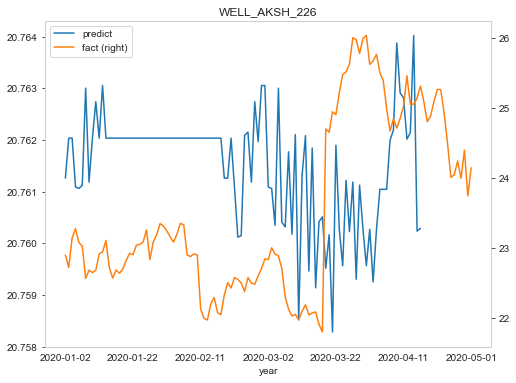

In [179]:
yhat = yhat.flatten() 
Y_traint = Y_traint.flatten()
Y_traint4 = Y_traint[0:121]
datadt4 = datadt[0:121]
import pandas as pd

df = pd.DataFrame(data={'year': datadt4, 
                        'predict': yhat, 
                        'fact': Y_traint4})
import matplotlib.pyplot as plt # Impot the relevant module

fig, ax = plt.subplots() # Create the figure and axes object

# Plot the first x and y axes:
df.plot(x = 'year', y = 'predict',title= "WELL_AKSH_226", ax = ax) 
# Plot the second x and y axes. By secondary_y = True a second y-axis is requested:
# (see https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.plot.html for details)
df.plot(x = 'year', y = 'fact', ax = ax, secondary_y = True)

In [184]:
#from sklearn.metrics import r2_score
#r2_score(Y_traint4, yhat)

In [520]:
# multivariate mlp example
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate
import tensorflow as tf
import tensorflow_addons as tfa 
# сэмлы
def split_sequences(sequences, n_steps):
	X, y = list(), list()
	for i in range(len(sequences)):
		# разметка
		end_ix = i + n_steps
		# проверка выхода за пределы
		if end_ix > len(sequences):
			break
		# получение начала и конечной метки
		seq_x, seq_y = sequences[i:end_ix, :-1], sequences[end_ix-1, -1]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
# последовательность
in_seq1 = X_leftl
in_seq2 = X_rightl

out_seq = Y_trainl #array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1),6))
in_seq2 = in_seq2.reshape((len(in_seq2),5))
out_seq = out_seq.reshape((len(out_seq),1))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
n_steps = 15
# convert into input/output
X,y = split_sequences(dataset, n_steps)
#y = 
# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]
# первая модель
visible1 = Input(shape=(n_steps,))
visible1n = tfa.layers.GroupNormalization(15,-1,0.0001,False)(visible1)
dense1 = Dense(100,activation='sigmoid')(visible1n)
dense21 = Dense(10, activation='sigmoid')(dense1)
# вторая модель
visible2 = Input(shape=(n_steps,))
visible2n = tfa.layers.GroupNormalization(15,-1,0.0001,False)(visible2)
dense2 = Dense(100,activation='sigmoid')(visible2n)
dense22 = Dense(10, activation='sigmoid')(dense2)
# слияние
# слияние
merge = concatenate([dense1, dense2])
output = Dense(1)(merge)
model = Model(inputs=[visible1, visible2], outputs=output)
model.compile(optimizer='adam', loss='mse', metrics=['accuracy'])
# fit model
model.fit([X1, X2], Y_trainl, epochs=20, verbose= 1, batch_size=64, validation_split=0.1)
# demonstrate prediction
#x_input = array([[80, 85], [90, 95], [100, 105]])
#x1 = x_input[:, 0].reshape((1, n_steps))
#x2 = x_input[:, 1].reshape((1, n_steps))

 
# последовательность
in_seq1t = X_leftt
in_seq2t = X_rightt

out_seqt = Y_traint #array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1t = in_seq1.reshape((len(in_seq1),6))
in_seq2t = in_seq2.reshape((len(in_seq2),5))
out_seqt = out_seq.reshape((len(out_seq),1))
# горизонтальное последовательное размещение данных 
datasett = hstack((in_seq1t, in_seq2t, out_seqt))
# таймстепы
n_steps = 15
# convert into input/output
Xt,yt = split_sequences(datasett, n_steps)
X1t = Xt[:, :, 0]
X2t = Xt[:, :, 1]
yhatt = model.predict([X1t, X2t], verbose=0)
print(yhatt)

Epoch 1/20
16/16 [==============================] - 1s 14ms/step - loss: 1021.0037 - accuracy: 0.0044 - val_loss: 519.8390 - val_accuracy: 0.0000e+00
Epoch 2/20
16/16 [==============================] - 0s 3ms/step - loss: 904.1887 - accuracy: 0.0000e+00 - val_loss: 448.7978 - val_accuracy: 0.0000e+00
Epoch 3/20
16/16 [==============================] - 0s 3ms/step - loss: 823.7055 - accuracy: 0.0000e+00 - val_loss: 383.7303 - val_accuracy: 0.0000e+00
Epoch 4/20
16/16 [==============================] - 0s 3ms/step - loss: 741.2013 - accuracy: 0.0000e+00 - val_loss: 325.4129 - val_accuracy: 0.0000e+00
Epoch 5/20
16/16 [==============================] - 0s 3ms/step - loss: 651.7211 - accuracy: 0.0000e+00 - val_loss: 273.3872 - val_accuracy: 0.0000e+00
Epoch 6/20
16/16 [==============================] - 0s 3ms/step - loss: 579.6832 - accuracy: 0.0000e+00 - val_loss: 226.7511 - val_accuracy: 0.0000e+00
Epoch 7/20
16/16 [==============================] - 0s 3ms/step - loss: 506.2862 - accurac

In [521]:
# multivariate mlp example
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate
 
# сэмлы
def split_sequences(sequences, n_steps):
	X, y = list(), list()
	for i in range(len(sequences)):
		# разметка
		end_ix = i + n_steps
		# проверка выхода за пределы
		if end_ix > len(sequences):
			break
		# получение начала и конечной метки
		seq_x, seq_y = sequences[i:end_ix, :-1], sequences[end_ix-1, -1]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
# последовательность
in_seq1 = X_leftt
in_seq2 = X_rightt

out_seq = Y_traint #array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1), 6))
in_seq2 = in_seq2.reshape((len(in_seq2), 5))
out_seq = out_seq.reshape((len(out_seq), 1))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
n_steps = 15
# convert into input/output
X,y = split_sequences(dataset, n_steps)
#y = 
# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]

yhat = model.predict([X1, X2], verbose=0)
print(yhat)

[[26.094688]
 [26.094688]
 [26.094688]
 [26.094688]
 [26.094688]
 [26.094688]
 [26.094688]
 [26.094688]
 [26.094688]
 [26.094688]
 [26.094688]
 [26.094688]
 [26.094688]
 [26.094688]
 [26.094688]
 [26.094688]
 [26.094688]
 [26.094688]
 [26.094688]
 [26.094688]
 [26.094688]
 [26.094688]
 [26.094688]
 [26.094688]
 [26.094688]
 [26.094688]
 [26.094688]
 [26.094688]
 [26.094688]
 [26.094688]
 [26.094688]
 [26.094688]
 [26.094688]
 [26.094688]
 [26.094688]
 [26.094688]
 [26.094688]
 [26.094688]
 [26.094688]
 [26.094688]
 [26.094688]
 [26.094688]
 [26.094688]
 [26.094688]
 [26.094688]
 [26.094688]
 [26.094688]
 [26.094688]
 [26.094688]
 [26.094688]
 [26.094688]
 [26.094688]
 [26.094688]
 [26.094688]
 [26.094688]
 [26.094688]
 [26.094688]
 [26.094688]
 [26.094688]
 [26.094688]
 [26.094688]
 [26.094688]
 [26.094688]
 [26.094688]
 [26.094688]
 [26.094688]
 [26.094688]
 [26.094688]
 [26.094688]
 [26.094688]
 [26.094688]
 [26.094688]
 [26.094688]
 [26.094688]
 [26.094688]
 [26.094688]
 [26.094688]

<AxesSubplot:label='2f4065bc-3cb6-4925-a3f3-1e96def80619'>

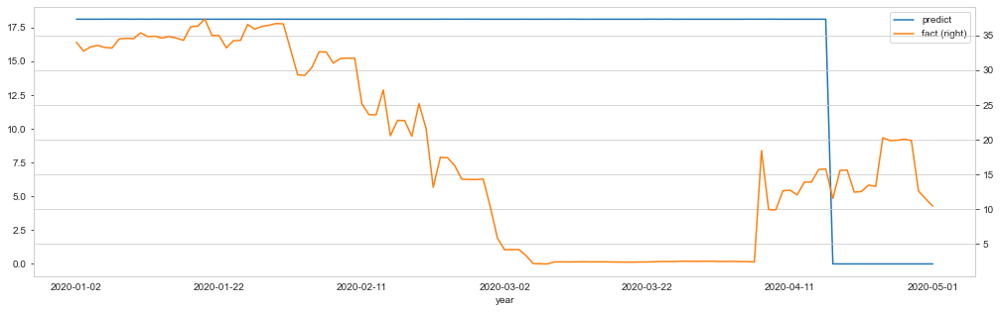

In [522]:
yhat = yhatf.flatten() 
Y_traint = Y_traint.flatten()
Y_traint4 = Y_traint[0:121]
datadt4 = datadt[0:121]
import pandas as pd

df = pd.DataFrame(data={'year': datadt4, 
                        'predict': yhat, 
                        'fact': Y_traint4})
import matplotlib.pyplot as plt # Impot the relevant module

fig, ax = plt.subplots() # Create the figure and axes object

# Plot the first x and y axes:
df.plot(x = 'year', y = 'predict', ax = ax) 
# Plot the second x and y axes. By secondary_y = True a second y-axis is requested:
# (see https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.plot.html for details)
df.plot(x = 'year', y = 'fact', ax = ax, secondary_y = True)

In [126]:
# multivariate mlp example223
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate
 
# сэмлы
def split_sequences(sequences, n_steps):
	X, y = list(), list()
	for i in range(len(sequences)):
		# разметка
		end_ix = i + n_steps
		# проверка выхода за пределы
		if end_ix > len(sequences):
			break
		# получение начала и конечной метки
		seq_x, seq_y = sequences[i:end_ix, :-1], sequences[end_ix-1, -1]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
# последовательность
in_seq1 = X_left#[365:1231]
in_seq2 = X_right#[365:1231]

out_seq = Y_train #array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1),6))
in_seq2 = in_seq2.reshape((len(in_seq2),5))
out_seq = out_seq.reshape((len(out_seq),1))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
n_steps = 1
# convert into input/output
X,y = split_sequences(dataset, n_steps)
#y = 
# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]
# первая модель
visible1 = Input(shape=(n_steps,))
dense1 = Dense(100, activation='relu')(visible1)
# вторая модель
visible2 = Input(shape=(n_steps,))
dense2 = Dense(100, activation='relu')(visible2)
# слияние
merge = concatenate([dense1, dense2])
output = Dense(1)(merge)
model = Model(inputs=[visible1, visible2], outputs=output)
model.compile(optimizer='adam', loss='mse', metrics=['accuracy'])
# fit model
model.fit([X1, X2], Y_train, epochs=2000, verbose= 1, batch_size=64, validation_split=0.1)
# demonstrate prediction
#x_input = array([[80, 85], [90, 95], [100, 105]])
#x1 = x_input[:, 0].reshape((1, n_steps))
#x2 = x_input[:, 1].reshape((1, n_steps))
yhat = model.predict([X1, X2], verbose=0)
print(yhat)

Epoch 1/2000
18/18 [==============================] - 0s 9ms/step - loss: 236.1789 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 2/2000
18/18 [==============================] - 0s 2ms/step - loss: 85.7469 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 3/2000
18/18 [==============================] - 0s 3ms/step - loss: 48.3302 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 4/2000
18/18 [==============================] - 0s 3ms/step - loss: 45.9005 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 5/2000
18/18 [==============================] - 0s 3ms/step - loss: 46.8559 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 6/2000
18/18 [==============================] - 0s 3ms/step - loss: 47.9878 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 7/2000
18/18 [==============================] - 0s 3ms/step - loss: 45.6179 - accuracy: 0.0000e+00 - val_

18/18 [==============================] - 0s 3ms/step - loss: 44.2369 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 57/2000
18/18 [==============================] - 0s 3ms/step - loss: 38.6055 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 58/2000
18/18 [==============================] - 0s 3ms/step - loss: 40.2620 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 59/2000
18/18 [==============================] - 0s 3ms/step - loss: 38.3401 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 60/2000
18/18 [==============================] - 0s 3ms/step - loss: 38.2758 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 61/2000
18/18 [==============================] - 0s 3ms/step - loss: 37.4412 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 62/2000
18/18 [==============================] - 0s 3ms/step - loss: 39.4300 - accuracy: 0.0000e+00 - val_loss: na

18/18 [==============================] - 0s 3ms/step - loss: 27.9182 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 112/2000
18/18 [==============================] - 0s 3ms/step - loss: 25.6952 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 113/2000
18/18 [==============================] - 0s 3ms/step - loss: 26.9502 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 114/2000
18/18 [==============================] - 0s 3ms/step - loss: 27.1444 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 115/2000
18/18 [==============================] - 0s 3ms/step - loss: 27.5941 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 116/2000
18/18 [==============================] - 0s 3ms/step - loss: 26.2544 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 117/2000
18/18 [==============================] - 0s 3ms/step - loss: 25.3552 - accuracy: 0.0000e+00 - val_lo

18/18 [==============================] - 0s 3ms/step - loss: 24.8066 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 166/2000
18/18 [==============================] - 0s 3ms/step - loss: 24.7108 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 167/2000
18/18 [==============================] - 0s 3ms/step - loss: 26.3981 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 168/2000
18/18 [==============================] - 0s 3ms/step - loss: 24.5752 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 169/2000
18/18 [==============================] - 0s 3ms/step - loss: 26.8259 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 170/2000
18/18 [==============================] - 0s 3ms/step - loss: 23.3546 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 171/2000
18/18 [==============================] - 0s 3ms/step - loss: 26.4310 - accuracy: 0.0000e+00 - val_lo

Epoch 220/2000
18/18 [==============================] - 0s 3ms/step - loss: 25.2448 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 221/2000
18/18 [==============================] - 0s 3ms/step - loss: 24.7864 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 222/2000
18/18 [==============================] - 0s 3ms/step - loss: 24.9755 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 223/2000
18/18 [==============================] - 0s 3ms/step - loss: 24.4682 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 224/2000
18/18 [==============================] - 0s 3ms/step - loss: 24.3857 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 225/2000
18/18 [==============================] - 0s 3ms/step - loss: 23.4479 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 226/2000
18/18 [==============================] - 0s 3ms/step - loss: 24.9306 - accuracy: 0.00

Epoch 329/2000
18/18 [==============================] - 0s 3ms/step - loss: 23.2746 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 330/2000
18/18 [==============================] - 0s 3ms/step - loss: 26.7588 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 331/2000
18/18 [==============================] - 0s 3ms/step - loss: 23.1629 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 332/2000
18/18 [==============================] - 0s 3ms/step - loss: 23.2562 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 333/2000
18/18 [==============================] - 0s 3ms/step - loss: 24.3101 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 334/2000
18/18 [==============================] - 0s 3ms/step - loss: 23.3837 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 335/2000
18/18 [==============================] - 0s 3ms/step - loss: 23.4554 - accuracy: 0.00

18/18 [==============================] - 0s 3ms/step - loss: 26.5558 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 438/2000
18/18 [==============================] - 0s 3ms/step - loss: 24.4921 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 439/2000
18/18 [==============================] - 0s 2ms/step - loss: 23.6922 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 440/2000
18/18 [==============================] - 0s 2ms/step - loss: 22.8055 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 441/2000
18/18 [==============================] - 0s 3ms/step - loss: 25.1707 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 442/2000
18/18 [==============================] - 0s 3ms/step - loss: 24.5797 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 443/2000
18/18 [==============================] - 0s 3ms/step - loss: 23.4452 - accuracy: 0.0000e+00 - val_lo

Epoch 492/2000
18/18 [==============================] - 0s 3ms/step - loss: 22.4435 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 493/2000
18/18 [==============================] - 0s 3ms/step - loss: 22.5315 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 494/2000
18/18 [==============================] - 0s 3ms/step - loss: 25.7947 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 495/2000
18/18 [==============================] - 0s 3ms/step - loss: 23.7200 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 496/2000
18/18 [==============================] - 0s 3ms/step - loss: 23.7730 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 497/2000
18/18 [==============================] - 0s 3ms/step - loss: 23.8766 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 498/2000
18/18 [==============================] - 0s 3ms/step - loss: 25.5951 - accuracy: 0.00

Epoch 601/2000
18/18 [==============================] - 0s 3ms/step - loss: 24.2212 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 602/2000
18/18 [==============================] - 0s 3ms/step - loss: 25.7433 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 603/2000
18/18 [==============================] - 0s 3ms/step - loss: 23.6940 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 604/2000
18/18 [==============================] - 0s 3ms/step - loss: 24.4045 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 605/2000
18/18 [==============================] - 0s 3ms/step - loss: 25.1210 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 606/2000
18/18 [==============================] - 0s 3ms/step - loss: 23.1680 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 607/2000
18/18 [==============================] - 0s 3ms/step - loss: 24.5288 - accuracy: 0.00

Epoch 710/2000
18/18 [==============================] - 0s 3ms/step - loss: 24.2730 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 711/2000
18/18 [==============================] - 0s 3ms/step - loss: 23.7074 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 712/2000
18/18 [==============================] - 0s 3ms/step - loss: 24.0905 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 713/2000
18/18 [==============================] - 0s 3ms/step - loss: 25.2647 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 714/2000
18/18 [==============================] - 0s 3ms/step - loss: 22.6656 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 715/2000
18/18 [==============================] - 0s 3ms/step - loss: 24.0153 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 716/2000
18/18 [==============================] - 0s 3ms/step - loss: 24.7692 - accuracy: 0.00

Epoch 819/2000
18/18 [==============================] - 0s 3ms/step - loss: 24.6022 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 820/2000
18/18 [==============================] - 0s 3ms/step - loss: 24.0241 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 821/2000
18/18 [==============================] - 0s 3ms/step - loss: 23.9928 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 822/2000
18/18 [==============================] - 0s 3ms/step - loss: 24.4810 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 823/2000
18/18 [==============================] - 0s 3ms/step - loss: 23.5484 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 824/2000
18/18 [==============================] - 0s 3ms/step - loss: 25.9866 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 825/2000
18/18 [==============================] - 0s 3ms/step - loss: 24.2668 - accuracy: 0.00

Epoch 928/2000
18/18 [==============================] - 0s 3ms/step - loss: 23.1977 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 929/2000
18/18 [==============================] - 0s 3ms/step - loss: 24.9611 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 930/2000
18/18 [==============================] - 0s 3ms/step - loss: 24.7086 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 931/2000
18/18 [==============================] - 0s 3ms/step - loss: 24.7590 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 932/2000
18/18 [==============================] - 0s 3ms/step - loss: 23.2455 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 933/2000
18/18 [==============================] - 0s 3ms/step - loss: 24.3694 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 934/2000
18/18 [==============================] - 0s 3ms/step - loss: 25.9991 - accuracy: 0.00

18/18 [==============================] - 0s 3ms/step - loss: 23.5290 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1037/2000
18/18 [==============================] - 0s 3ms/step - loss: 24.3507 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1038/2000
18/18 [==============================] - 0s 3ms/step - loss: 25.9145 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1039/2000
18/18 [==============================] - 0s 3ms/step - loss: 22.7352 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1040/2000
18/18 [==============================] - 0s 3ms/step - loss: 25.2354 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1041/2000
18/18 [==============================] - 0s 3ms/step - loss: 24.7982 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1042/2000
18/18 [==============================] - 0s 3ms/step - loss: 22.9122 - accuracy: 0.0000e+00 - 

18/18 [==============================] - 0s 3ms/step - loss: 24.7922 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1145/2000
18/18 [==============================] - 0s 3ms/step - loss: 24.1316 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1146/2000
18/18 [==============================] - 0s 3ms/step - loss: 23.6674 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1147/2000
18/18 [==============================] - 0s 3ms/step - loss: 24.0736 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1148/2000
18/18 [==============================] - 0s 3ms/step - loss: 23.9088 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1149/2000
18/18 [==============================] - 0s 3ms/step - loss: 24.0092 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1150/2000
18/18 [==============================] - 0s 3ms/step - loss: 24.3468 - accuracy: 0.0000e+00 - 

18/18 [==============================] - 0s 3ms/step - loss: 24.0092 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1253/2000
18/18 [==============================] - 0s 3ms/step - loss: 24.9438 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1254/2000
18/18 [==============================] - 0s 2ms/step - loss: 23.9194 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1255/2000
18/18 [==============================] - 0s 3ms/step - loss: 24.5739 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1256/2000
18/18 [==============================] - 0s 2ms/step - loss: 24.8239 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1257/2000
18/18 [==============================] - 0s 3ms/step - loss: 24.6410 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1258/2000
18/18 [==============================] - 0s 3ms/step - loss: 24.6631 - accuracy: 0.0000e+00 - 

18/18 [==============================] - 0s 2ms/step - loss: 23.9038 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1361/2000
18/18 [==============================] - 0s 3ms/step - loss: 22.1062 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1362/2000
18/18 [==============================] - 0s 3ms/step - loss: 24.4255 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1363/2000
18/18 [==============================] - 0s 3ms/step - loss: 24.4131 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1364/2000
18/18 [==============================] - 0s 3ms/step - loss: 22.1604 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1365/2000
18/18 [==============================] - 0s 3ms/step - loss: 24.2639 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1366/2000
18/18 [==============================] - 0s 3ms/step - loss: 22.2905 - accuracy: 0.0000e+00 - 

18/18 [==============================] - 0s 2ms/step - loss: 22.2746 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1469/2000
18/18 [==============================] - 0s 2ms/step - loss: 23.0594 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1470/2000
18/18 [==============================] - 0s 2ms/step - loss: 24.8740 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1471/2000
18/18 [==============================] - 0s 2ms/step - loss: 23.3657 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1472/2000
18/18 [==============================] - 0s 2ms/step - loss: 22.5110 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1473/2000
18/18 [==============================] - 0s 2ms/step - loss: 21.5553 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1474/2000
18/18 [==============================] - 0s 2ms/step - loss: 22.8014 - accuracy: 0.0000e+00 - 

18/18 [==============================] - 0s 2ms/step - loss: 22.5858 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1523/2000
18/18 [==============================] - 0s 2ms/step - loss: 21.3158 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1524/2000
18/18 [==============================] - 0s 2ms/step - loss: 22.3426 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1525/2000
18/18 [==============================] - 0s 2ms/step - loss: 23.1740 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1526/2000
18/18 [==============================] - 0s 2ms/step - loss: 22.6517 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1527/2000
18/18 [==============================] - 0s 2ms/step - loss: 20.8610 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1528/2000
18/18 [==============================] - 0s 3ms/step - loss: 24.9886 - accuracy: 0.0000e+00 - 

18/18 [==============================] - 0s 2ms/step - loss: 22.6307 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1631/2000
18/18 [==============================] - 0s 2ms/step - loss: 23.8148 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1632/2000
18/18 [==============================] - 0s 2ms/step - loss: 23.0973 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1633/2000
18/18 [==============================] - 0s 3ms/step - loss: 23.2770 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1634/2000
18/18 [==============================] - 0s 3ms/step - loss: 22.6704 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1635/2000
18/18 [==============================] - 0s 2ms/step - loss: 21.1721 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1636/2000
18/18 [==============================] - 0s 3ms/step - loss: 22.0135 - accuracy: 0.0000e+00 - 

18/18 [==============================] - 0s 3ms/step - loss: 22.6373 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1739/2000
18/18 [==============================] - 0s 3ms/step - loss: 24.3892 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1740/2000
18/18 [==============================] - 0s 2ms/step - loss: 22.6255 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1741/2000
18/18 [==============================] - 0s 3ms/step - loss: 22.5688 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1742/2000
18/18 [==============================] - 0s 3ms/step - loss: 22.6455 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1743/2000
18/18 [==============================] - 0s 3ms/step - loss: 20.9713 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1744/2000
18/18 [==============================] - 0s 3ms/step - loss: 21.9020 - accuracy: 0.0000e+00 - 

18/18 [==============================] - 0s 3ms/step - loss: 25.5462 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1793/2000
18/18 [==============================] - 0s 3ms/step - loss: 22.9200 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1794/2000
18/18 [==============================] - 0s 2ms/step - loss: 22.6537 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1795/2000
18/18 [==============================] - 0s 3ms/step - loss: 24.6651 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1796/2000
18/18 [==============================] - 0s 2ms/step - loss: 23.9290 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1797/2000
18/18 [==============================] - 0s 2ms/step - loss: 24.2090 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1798/2000
18/18 [==============================] - 0s 2ms/step - loss: 23.2237 - accuracy: 0.0000e+00 - 

18/18 [==============================] - 0s 3ms/step - loss: 23.4192 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1901/2000
18/18 [==============================] - 0s 3ms/step - loss: 20.9794 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1902/2000
18/18 [==============================] - 0s 3ms/step - loss: 22.8362 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1903/2000
18/18 [==============================] - 0s 2ms/step - loss: 20.5640 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1904/2000
18/18 [==============================] - 0s 3ms/step - loss: 22.1519 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1905/2000
18/18 [==============================] - 0s 2ms/step - loss: 23.0418 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 1906/2000
18/18 [==============================] - 0s 3ms/step - loss: 20.9601 - accuracy: 0.0000e+00 - 

In [127]:
yhat = yhat.flatten() 
Y_train = Y_train.flatten()

In [743]:
datadd.shape

(866,)

In [744]:
yhat = yhat[0:866]
Y_train = Y_train[0:866]

In [129]:
datadd = data.index
#datadd = features.index 
datadd = datadd.to_numpy()

df = pd.DataFrame(data={'year': datadd, 
                        'predict': yhat, 
                        'fact': Y_train})

<AxesSubplot:label='fa11e714-4032-47e5-a47e-56b49bce5bca'>

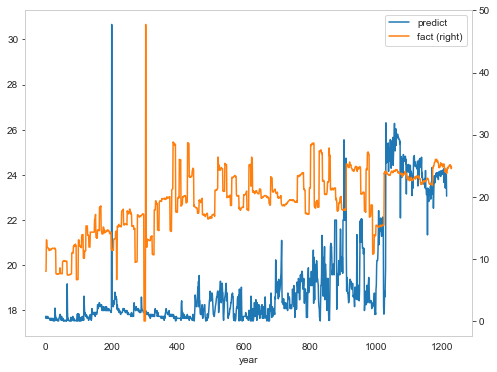

In [130]:
import matplotlib.pyplot as plt # Impot the relevant module


fig, ax = plt.subplots() # Create the figure and axes object

# Plot the first x and y axes:
df.plot(x = 'year', y = 'predict', ax = ax) 
# Plot the second x and y axes. By secondary_y = True a second y-axis is requested:
# (see https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.plot.html for details)
df.plot(x = 'year', y = 'fact', ax = ax, secondary_y = True)

In [ ]:
#features2s =[features_considered_south2] 
#features2 = datan['AKSH_424_water_vol','AKSH_249_water_vol','AKSH_247_water_vol','AKSH_250_water_vol','AKSH_424_water_vol','AKSH_214_water_vol']
#X_left = features2 #data2['AKSH_298_bhp_pump_press','AKSH_213_bhp_pump_press','AKSH_203_bhp_pump_press','AKSH_223_bhp_pump_press','AKSH_226_bhp_pump_press']

X_left = dataws #= data[features_considered_south1]
#X_left = data2[features2]
X_right = data[features_considered_south2]
Y_train = data['AKSH_226_liq_vol']#,'AKSH_226_liq_vol'] 
X_left = np.asarray(X_left)
X_right = np.asarray(X_right) 
Y_train = np.asarray(Y_train) 

In [524]:
from sklearn.metrics import mean_squared_error
mean_squared_error(Y_traint4, yhat)

194.56341635792657

# 6-1 MLP-MLP

<AxesSubplot:label='b8e65645-07e4-4a37-b2aa-dfe9fb06f3d8'>

<AxesSubplot:label='b8e65645-07e4-4a37-b2aa-dfe9fb06f3d8'>

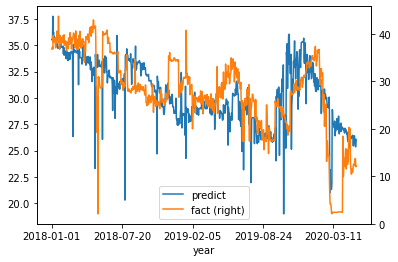

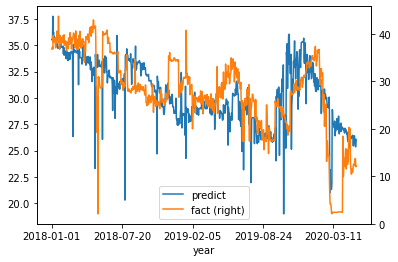

In [39]:
import matplotlib.pyplot as plt # Impot the relevant module


fig, ax = plt.subplots() # Create the figure and axes object

# Plot the first x and y axes:
df.plot(x = 'year', y = 'predict', ax = ax) 
# Plot the second x and y axes. By secondary_y = True a second y-axis is requested:
# (see https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.plot.html for details)
df.plot(x = 'year', y = 'fact', ax = ax, secondary_y = True)

# 10-1 MLP-LSTM10 steps

In [154]:
# multivariate mlp example
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate
from tensorflow.keras.layers import LSTM 
# сэмлы
def split_sequences(sequences, n_steps):
	X, y = list(), list()
	for i in range(len(sequences)):
		# разметка
		end_ix = i + n_steps
		# проверка выхода за пределы
		if end_ix > len(sequences):
			break
		# получение начала и конечной метки
		seq_x, seq_y = sequences[i:end_ix, :-1], sequences[end_ix-1, -1]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
# последовательность
in_seq1 = X_left
in_seq2 = X_right
out_seq = Y_train # array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1), 5))
in_seq2 = in_seq2.reshape((len(in_seq2), 5))
out_seq = out_seq.reshape((len(out_seq), 1))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
n_steps = 10
# convert into input/output
X, y = split_sequences(dataset, n_steps)
# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]
# первая модель
visible1 = Input(shape=(n_steps,))
dense1 = Dense(100, activation='relu')(visible1)
# вторая модель LSTM
visible2 = Input(shape=(n_steps,1))
lstm = LSTM(100, input_shape =(100,1))(visible2)
# слияние
merge = concatenate([dense1, lstm])
output = Dense(1)(merge)
model = Model(inputs=[visible1, visible2], outputs=output)
model.compile(optimizer='adam', loss='mape')
# fit model
model.fit([X1, X2], Y_train, epochs=2000, verbose=0, batch_size=64, validation_split=0.1)
# demonstrate prediction
#x_input = array([[80, 85], [90, 95], [100, 105]])
#x1 = x_input[:, 0].reshape((1, n_steps))
#x2 = x_input[:, 1].reshape((1, n_steps))
yhat = model.predict([X1, X2], verbose=0)
print(yhat)

[[36.64266  ]
 [37.29637  ]
 [37.620594 ]
 [37.256954 ]
 [38.958023 ]
 [38.649998 ]
 [39.24545  ]
 [38.97347  ]
 [36.977596 ]
 [36.943775 ]
 [37.50999  ]
 [37.31488  ]
 [38.29807  ]
 [36.508816 ]
 [35.99911  ]
 [37.677    ]
 [37.324314 ]
 [38.236874 ]
 [38.415974 ]
 [38.41602  ]
 [38.445145 ]
 [38.302734 ]
 [38.248417 ]
 [37.923763 ]
 [36.94851  ]
 [36.883274 ]
 [37.626984 ]
 [37.063587 ]
 [36.968853 ]
 [36.612934 ]
 [36.598026 ]
 [37.148884 ]
 [37.959373 ]
 [38.10578  ]
 [38.270824 ]
 [38.176716 ]
 [37.958797 ]
 [37.805313 ]
 [37.64697  ]
 [37.89317  ]
 [38.04784  ]
 [37.96289  ]
 [37.850315 ]
 [38.07577  ]
 [37.931416 ]
 [37.828354 ]
 [38.084034 ]
 [38.062424 ]
 [37.5347   ]
 [37.581364 ]
 [37.976406 ]
 [34.033157 ]
 [34.21989  ]
 [33.466076 ]
 [31.436386 ]
 [32.359066 ]
 [37.223824 ]
 [37.029797 ]
 [31.964167 ]
 [29.913979 ]
 [29.328514 ]
 [36.860916 ]
 [38.150707 ]
 [37.846333 ]
 [37.511143 ]
 [37.163708 ]
 [37.25829  ]
 [38.198265 ]
 [39.257904 ]
 [38.316025 ]
 [35.762276 ]
 [36.3

In [165]:
yhat = yhat.flatten() 
Y_train = Y_train.flatten() 
datadd = data2.index

In [166]:
datadd=datadd[0:857]
Y_train = Y_train[0:857]

In [167]:

#datadd = features.index 
#datadd = datadd.to_numpy()

df = pd.DataFrame(data={'year': datadd, 
                        'predict': yhat, 
                        'fact': Y_train})

<AxesSubplot:label='2a49d174-6697-4732-ae2e-796a4f14073a'>

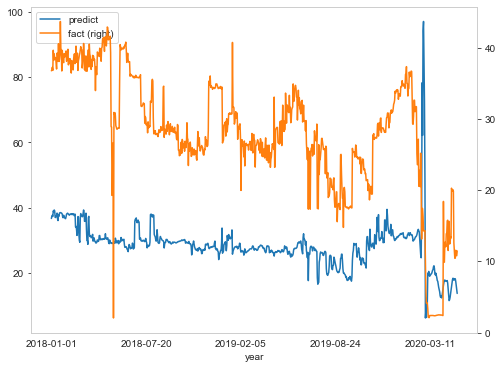

In [168]:
import matplotlib.pyplot as plt # Impot the relevant module


fig, ax = plt.subplots() # Create the figure and axes object

# Plot the first x and y axes:
df.plot(x = 'year', y = 'predict', ax = ax) 
# Plot the second x and y axes. By secondary_y = True a second y-axis is requested:
# (see https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.plot.html for details)
df.plot(x = 'year', y = 'fact', ax = ax, secondary_y = True)

In [ ]:
y = Y_train
yhat.shape

# 6-1 10 steps

In [476]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from keras.datasets import mnist
from keras.utils.np_utils import to_categorical
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPooling2D, Activation, LeakyReLU
from keras.layers.noise import AlphaDropout
from keras.utils.generic_utils import get_custom_objects
from keras import backend as K
from keras.optimizers import Adam

In [521]:
# multivariate mlp example
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate
from tensorflow.keras.layers import LSTM 
# сэмлы
def split_sequences(sequences, n_steps):
	X, y = list(), list()
	for i in range(len(sequences)):
		# разметка
		end_ix = i + n_steps
		# проверка выхода за пределы
		if end_ix > len(sequences):
			break
		# получение начала и конечной метки
		seq_x, seq_y = sequences[i:end_ix, :-1], sequences[end_ix-1, -1]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
# Add the GELU function to Keras

def gelu(x):
    return 0.5 * x * (1 + tf.tanh(tf.sqrt(2 / np.pi) * (x + 0.044715 * tf.pow(x, 3))))
get_custom_objects().update({'gelu': Activation(gelu)})

# Add leaky-relu so we can use it as a string
get_custom_objects().update({'leaky-relu': Activation(LeakyReLU(alpha=0.2))})

act_func = ['sigmoid', 'relu', 'elu', 'leaky-relu', 'selu', 'gelu']

get_custom_objects().update({'gelu': Activation(gelu)})
# последовательность
in_seq1 = X_left
in_seq2 = X_right
out_seq = Y_train # array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1), 6))
in_seq2 = in_seq2.reshape((len(in_seq2), 5))
out_seq = out_seq.reshape((len(out_seq), 1))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
n_steps = 10
# convert into input/output
X, y = split_sequences(dataset, n_steps)
# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]
# первая модель
visible1 = Input(shape=(n_steps,))


dense1 = Dense(100, activation= 'leaky-relu')(visible1)
# вторая модель LSTM
visible2 = Input(shape=(n_steps,1))
lstm = LSTM(100, input_shape =(100,1))(visible2)
# слияние
merge = concatenate([dense1, lstm])
output = Dense(1)(merge)
model = Model(inputs=[visible1, visible2], outputs=output)
model.compile(optimizer='adam', loss='mape')
# fit model
model.fit([X1, X2], Y_train, epochs=2000, verbose=0, batch_size=64, validation_split=0.1)
# demonstrate prediction
#x_input = array([[80, 85], [90, 95], [100, 105]])
#x1 = x_input[:, 0].reshape((1, n_steps))
#x2 = x_input[:, 1].reshape((1, n_steps))
yhat = model.predict([X1, X2], verbose=0)
print(yhat)

[[4.3018097e-03]
 [4.3017501e-03]
 [4.3017799e-03]
 ...
 [1.3318523e+01]
 [1.3126328e+01]
 [1.2843395e+01]]


In [524]:
yhat = yhat.flatten() 
Y_train = Y_train.flatten() 

In [530]:
datadd.shape

(866,)

In [526]:
datadd = data2.index
#datadd = features.index 
datadd = datadd.to_numpy()

In [533]:
Y_train = Y_train[0:866]
datadd = datadd[0:866]
yhat = yhat[0:866]
y = Y_train

In [534]:


df = pd.DataFrame(data={'year': datadd, 
                        'predict': yhat, 
                        'fact': Y_train})

<AxesSubplot:label='7a1794ca-8ae6-411b-a7db-1175c81d5725'>

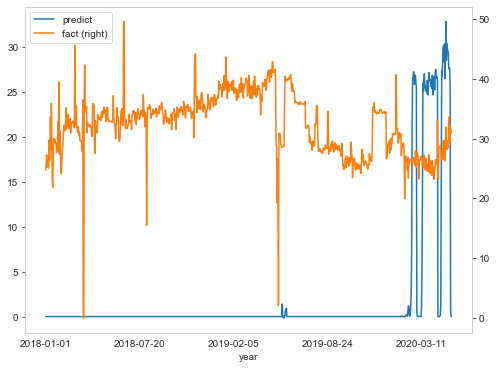

In [535]:
import matplotlib.pyplot as plt # Impot the relevant module


fig, ax = plt.subplots() # Create the figure and axes object

# Plot the first x and y axes:
df.plot(x = 'year', y = 'predict', ax = ax) 
# Plot the second x and y axes. By secondary_y = True a second y-axis is requested:
# (see https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.plot.html for details)
df.plot(x = 'year', y = 'fact', ax = ax, secondary_y = True)

In [61]:
yhat = yhat.flatten() 
Y_train = Y_train.flatten() 

In [586]:
# multivariate mlp example
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate
 
# сэмлы
def split_sequences(sequences, n_steps):
	X, y = list(), list()
	for i in range(len(sequences)):
		# разметка
		end_ix = i + n_steps
		# проверка выхода за пределы
		if end_ix > len(sequences):
			break
		# получение начала и конечной метки
		seq_x, seq_y = sequences[i:end_ix, :-1], sequences[end_ix-1, -1]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
# последовательность
in_seq1 = X_left[0:857]
in_seq2 = X_right[0:857]
out_seq = Y_train[0:857] # array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1), 6))
in_seq2 = in_seq2.reshape((len(in_seq2), 5))
out_seq = out_seq.reshape((len(out_seq), 1))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
n_steps = 1
# convert into input/output
X, y = split_sequences(dataset, n_steps)
# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]
# первая модель
visible1 = Input(shape=(n_steps,1))
dense1 = LSTM(100, input_shape =(100,1))(visible1) #,batch_input_shape=(32,100,1), stateful=True
# вторая модель LSTM
visible2 = Input(shape=(n_steps,1))
lstm = LSTM(100, input_shape =(100,1))(visible2)
#lstm2 = LSTM(10, input_shape =(100,1))(lstm)

# слияние
merge = concatenate([dense1, lstm])
output = Dense(1)(merge)
model = Model(inputs=[visible1, visible2], outputs=output)
model.compile(optimizer='adam', loss='mape', metrics=['accuracy'])
# fit model
model.fit([X1, X2], y, epochs=2000, verbose=1, batch_size=64, validation_split=0.1)
# demonstrate prediction
#x_input = array([[80, 85], [90, 95], [100, 105]])
#x1 = x_input[:, 0].reshape((1, n_steps))
#x2 = x_input[:, 1].reshape((1, n_steps))
yhat = model.predict([X1, X2], verbose=0)
print(yhat)

Epoch 1/2000
13/13 [==============================] - 5s 91ms/step - loss: 183342.1250 - accuracy: 0.0021 - val_loss: 100.2160 - val_accuracy: 0.0000e+00
Epoch 2/2000
13/13 [==============================] - 0s 6ms/step - loss: 7447.1017 - accuracy: 6.5805e-04 - val_loss: 99.9095 - val_accuracy: 0.0000e+00
Epoch 3/2000
13/13 [==============================] - 0s 6ms/step - loss: 76450.2930 - accuracy: 0.0056 - val_loss: 99.8240 - val_accuracy: 0.0000e+00
Epoch 4/2000
13/13 [==============================] - 0s 6ms/step - loss: 80825.7827 - accuracy: 0.0041 - val_loss: 100.0483 - val_accuracy: 0.0000e+00
Epoch 5/2000
13/13 [==============================] - 0s 6ms/step - loss: 58392.2185 - accuracy: 0.0025 - val_loss: 99.7737 - val_accuracy: 0.0000e+00
Epoch 6/2000
13/13 [==============================] - 0s 6ms/step - loss: 20146.0994 - accuracy: 0.0018 - val_loss: 99.8135 - val_accuracy: 0.0000e+00
Epoch 7/2000
13/13 [==============================] - 0s 6ms/step - loss: 60626.5657 - 

Epoch 55/2000
13/13 [==============================] - 0s 6ms/step - loss: 3889.5119 - accuracy: 0.0010 - val_loss: 100.0677 - val_accuracy: 0.0000e+00
Epoch 56/2000
13/13 [==============================] - 0s 7ms/step - loss: 51168.9075 - accuracy: 0.0044 - val_loss: 100.1692 - val_accuracy: 0.0000e+00
Epoch 57/2000
13/13 [==============================] - 0s 6ms/step - loss: 42490.5983 - accuracy: 0.0027 - val_loss: 99.8849 - val_accuracy: 0.0000e+00
Epoch 58/2000
13/13 [==============================] - 0s 6ms/step - loss: 59836.1871 - accuracy: 8.9366e-04 - val_loss: 99.8721 - val_accuracy: 0.0000e+00
Epoch 59/2000
13/13 [==============================] - 0s 6ms/step - loss: 90772.5025 - accuracy: 0.0033 - val_loss: 100.3239 - val_accuracy: 0.0000e+00
Epoch 60/2000
13/13 [==============================] - 0s 6ms/step - loss: 211129.3530 - accuracy: 0.0031 - val_loss: 100.2523 - val_accuracy: 0.0000e+00
Epoch 61/2000
13/13 [==============================] - 0s 6ms/step - loss: 18602

13/13 [==============================] - 0s 6ms/step - loss: 29195.1680 - accuracy: 0.0024 - val_loss: 100.0245 - val_accuracy: 0.0000e+00
Epoch 162/2000
13/13 [==============================] - 0s 5ms/step - loss: 38624.7131 - accuracy: 0.0039 - val_loss: 99.7530 - val_accuracy: 0.0000e+00
Epoch 163/2000
13/13 [==============================] - 0s 5ms/step - loss: 45231.9024 - accuracy: 6.5805e-04 - val_loss: 99.7381 - val_accuracy: 0.0000e+00
Epoch 164/2000
13/13 [==============================] - 0s 5ms/step - loss: 170198.8495 - accuracy: 0.0039 - val_loss: 100.1586 - val_accuracy: 0.0000e+00
Epoch 165/2000
13/13 [==============================] - 0s 5ms/step - loss: 241153.6964 - accuracy: 0.0053 - val_loss: 100.0461 - val_accuracy: 0.0000e+00
Epoch 166/2000
13/13 [==============================] - 0s 5ms/step - loss: 47246.6032 - accuracy: 0.0024 - val_loss: 99.9491 - val_accuracy: 0.0000e+00
Epoch 167/2000
13/13 [==============================] - 0s 5ms/step - loss: 3786.8130 - 

Epoch 214/2000
13/13 [==============================] - 0s 6ms/step - loss: 9920.4414 - accuracy: 0.0014 - val_loss: 100.1414 - val_accuracy: 0.0000e+00
Epoch 215/2000
13/13 [==============================] - 0s 6ms/step - loss: 21072.7251 - accuracy: 0.0014 - val_loss: 99.9554 - val_accuracy: 0.0000e+00
Epoch 216/2000
13/13 [==============================] - 0s 6ms/step - loss: 101871.1454 - accuracy: 0.0031 - val_loss: 100.0104 - val_accuracy: 0.0000e+00
Epoch 217/2000
13/13 [==============================] - 0s 7ms/step - loss: 23995.7428 - accuracy: 0.0032 - val_loss: 100.3317 - val_accuracy: 0.0000e+00
Epoch 218/2000
13/13 [==============================] - 0s 6ms/step - loss: 262151.1432 - accuracy: 0.0036 - val_loss: 100.1961 - val_accuracy: 0.0000e+00
Epoch 219/2000
13/13 [==============================] - 0s 6ms/step - loss: 60468.4628 - accuracy: 0.0027 - val_loss: 99.9032 - val_accuracy: 0.0000e+00
Epoch 220/2000
13/13 [==============================] - 0s 6ms/step - loss: 1

13/13 [==============================] - 0s 6ms/step - loss: 380052.1695 - accuracy: 0.0016 - val_loss: 99.0061 - val_accuracy: 0.0000e+00
Epoch 321/2000
13/13 [==============================] - 0s 5ms/step - loss: 198078.4015 - accuracy: 0.0010 - val_loss: 99.1920 - val_accuracy: 0.0000e+00
Epoch 322/2000
13/13 [==============================] - 0s 5ms/step - loss: 281405.1648 - accuracy: 0.0019 - val_loss: 99.5330 - val_accuracy: 0.0000e+00
Epoch 323/2000
13/13 [==============================] - 0s 5ms/step - loss: 92683.0807 - accuracy: 0.0019 - val_loss: 100.0386 - val_accuracy: 0.0000e+00
Epoch 324/2000
13/13 [==============================] - 0s 6ms/step - loss: 201824.8429 - accuracy: 0.0029 - val_loss: 99.8802 - val_accuracy: 0.0000e+00
Epoch 325/2000
13/13 [==============================] - 0s 5ms/step - loss: 34327.1348 - accuracy: 0.0050 - val_loss: 99.7383 - val_accuracy: 0.0000e+00
Epoch 326/2000
13/13 [==============================] - 0s 5ms/step - loss: 67273.6044 - acc

13/13 [==============================] - 0s 7ms/step - loss: 23714.9150 - accuracy: 0.0012 - val_loss: 99.9661 - val_accuracy: 0.0000e+00
Epoch 427/2000
13/13 [==============================] - 0s 8ms/step - loss: 61113.2670 - accuracy: 0.0032 - val_loss: 100.0315 - val_accuracy: 0.0000e+00
Epoch 428/2000
13/13 [==============================] - 0s 7ms/step - loss: 33350.0467 - accuracy: 0.0029 - val_loss: 99.8915 - val_accuracy: 0.0000e+00
Epoch 429/2000
13/13 [==============================] - 0s 8ms/step - loss: 30317.5270 - accuracy: 7.6966e-04 - val_loss: 99.8985 - val_accuracy: 0.0000e+00
Epoch 430/2000
13/13 [==============================] - 0s 7ms/step - loss: 27463.1841 - accuracy: 0.0020 - val_loss: 100.1061 - val_accuracy: 0.0000e+00
Epoch 431/2000
13/13 [==============================] - 0s 6ms/step - loss: 49286.5123 - accuracy: 0.0024 - val_loss: 99.9446 - val_accuracy: 0.0000e+00
Epoch 432/2000
13/13 [==============================] - 0s 6ms/step - loss: 27019.7240 - ac

13/13 [==============================] - 0s 9ms/step - loss: 37930.6262 - accuracy: 0.0029 - val_loss: 99.9601 - val_accuracy: 0.0000e+00
Epoch 533/2000
13/13 [==============================] - 0s 7ms/step - loss: 240547.0525 - accuracy: 0.0073 - val_loss: 100.0683 - val_accuracy: 0.0000e+00
Epoch 534/2000
13/13 [==============================] - 0s 8ms/step - loss: 32220.6410 - accuracy: 0.0028 - val_loss: 100.1559 - val_accuracy: 0.0000e+00
Epoch 535/2000
13/13 [==============================] - 0s 9ms/step - loss: 43854.4338 - accuracy: 0.0041 - val_loss: 99.9170 - val_accuracy: 0.0000e+00
Epoch 536/2000
13/13 [==============================] - 0s 8ms/step - loss: 160292.0539 - accuracy: 0.0039 - val_loss: 100.0126 - val_accuracy: 0.0000e+00
Epoch 537/2000
13/13 [==============================] - 0s 9ms/step - loss: 9773.0665 - accuracy: 0.0017 - val_loss: 100.1947 - val_accuracy: 0.0000e+00
Epoch 538/2000
13/13 [==============================] - 0s 9ms/step - loss: 126508.4947 - ac

13/13 [==============================] - 0s 6ms/step - loss: 9904.2537 - accuracy: 0.0021 - val_loss: 100.0115 - val_accuracy: 0.0000e+00
Epoch 639/2000
13/13 [==============================] - 0s 7ms/step - loss: 30400.4709 - accuracy: 0.0027 - val_loss: 100.2133 - val_accuracy: 0.0000e+00
Epoch 640/2000
13/13 [==============================] - 0s 6ms/step - loss: 54796.3318 - accuracy: 0.0011 - val_loss: 100.1891 - val_accuracy: 0.0000e+00
Epoch 641/2000
13/13 [==============================] - 0s 6ms/step - loss: 3435.4554 - accuracy: 0.0012 - val_loss: 100.0434 - val_accuracy: 0.0000e+00
Epoch 642/2000
13/13 [==============================] - 0s 6ms/step - loss: 50582.3302 - accuracy: 0.0053 - val_loss: 100.0340 - val_accuracy: 0.0000e+00
Epoch 643/2000
13/13 [==============================] - 0s 6ms/step - loss: 22500.3886 - accuracy: 0.0016 - val_loss: 100.0757 - val_accuracy: 0.0000e+00
Epoch 644/2000
13/13 [==============================] - 0s 6ms/step - loss: 24098.2569 - accu

13/13 [==============================] - 0s 6ms/step - loss: 109228.2311 - accuracy: 0.0024 - val_loss: 100.1327 - val_accuracy: 0.0000e+00
Epoch 744/2000
13/13 [==============================] - 0s 6ms/step - loss: 43397.8202 - accuracy: 0.0034 - val_loss: 100.0151 - val_accuracy: 0.0000e+00
Epoch 745/2000
13/13 [==============================] - 0s 7ms/step - loss: 51928.4721 - accuracy: 0.0039 - val_loss: 100.2044 - val_accuracy: 0.0000e+00
Epoch 746/2000
13/13 [==============================] - 0s 6ms/step - loss: 46479.6540 - accuracy: 9.8272e-04 - val_loss: 100.1754 - val_accuracy: 0.0000e+00
Epoch 747/2000
13/13 [==============================] - 0s 6ms/step - loss: 46369.4418 - accuracy: 0.0029 - val_loss: 100.0137 - val_accuracy: 0.0000e+00
Epoch 748/2000
13/13 [==============================] - 0s 7ms/step - loss: 54101.8595 - accuracy: 0.0046 - val_loss: 100.0158 - val_accuracy: 0.0000e+00
Epoch 749/2000
13/13 [==============================] - 0s 6ms/step - loss: 31113.3387

13/13 [==============================] - 0s 6ms/step - loss: 31640.1527 - accuracy: 8.9366e-04 - val_loss: 100.0954 - val_accuracy: 0.0000e+00
Epoch 850/2000
13/13 [==============================] - 0s 7ms/step - loss: 11354.9773 - accuracy: 0.0011 - val_loss: 100.0612 - val_accuracy: 0.0000e+00
Epoch 851/2000
13/13 [==============================] - 0s 6ms/step - loss: 36951.3601 - accuracy: 0.0030 - val_loss: 100.0038 - val_accuracy: 0.0000e+00
Epoch 852/2000
13/13 [==============================] - 0s 5ms/step - loss: 28667.8843 - accuracy: 0.0017 - val_loss: 100.0789 - val_accuracy: 0.0000e+00
Epoch 853/2000
13/13 [==============================] - 0s 5ms/step - loss: 43920.8717 - accuracy: 0.0015 - val_loss: 100.0274 - val_accuracy: 0.0000e+00
Epoch 854/2000
13/13 [==============================] - 0s 5ms/step - loss: 18223.3644 - accuracy: 0.0021 - val_loss: 100.0860 - val_accuracy: 0.0000e+00
Epoch 855/2000
13/13 [==============================] - 0s 5ms/step - loss: 24345.2215 

13/13 [==============================] - 0s 6ms/step - loss: 105070.9520 - accuracy: 0.0033 - val_loss: 99.9678 - val_accuracy: 0.0000e+00
Epoch 956/2000
13/13 [==============================] - 0s 6ms/step - loss: 24886.5698 - accuracy: 0.0028 - val_loss: 100.1310 - val_accuracy: 0.0000e+00
Epoch 957/2000
13/13 [==============================] - 0s 6ms/step - loss: 128120.4916 - accuracy: 0.0050 - val_loss: 99.8667 - val_accuracy: 0.0000e+00
Epoch 958/2000
13/13 [==============================] - 0s 7ms/step - loss: 151657.4386 - accuracy: 0.0040 - val_loss: 99.9495 - val_accuracy: 0.0000e+00
Epoch 959/2000
13/13 [==============================] - 0s 6ms/step - loss: 77944.7592 - accuracy: 0.0056 - val_loss: 100.2777 - val_accuracy: 0.0000e+00
Epoch 960/2000
13/13 [==============================] - 0s 6ms/step - loss: 144974.2931 - accuracy: 0.0019 - val_loss: 100.2069 - val_accuracy: 0.0000e+00
Epoch 961/2000
13/13 [==============================] - 0s 7ms/step - loss: 18049.2191 - a

Epoch 1061/2000
13/13 [==============================] - 0s 6ms/step - loss: 25331.6959 - accuracy: 0.0026 - val_loss: 100.0535 - val_accuracy: 0.0000e+00
Epoch 1062/2000
13/13 [==============================] - 0s 7ms/step - loss: 124746.6744 - accuracy: 0.0056 - val_loss: 99.7648 - val_accuracy: 0.0000e+00
Epoch 1063/2000
13/13 [==============================] - 0s 6ms/step - loss: 79729.1500 - accuracy: 0.0012 - val_loss: 99.8342 - val_accuracy: 0.0000e+00
Epoch 1064/2000
13/13 [==============================] - 0s 6ms/step - loss: 28307.2884 - accuracy: 0.0019 - val_loss: 100.0245 - val_accuracy: 0.0000e+00
Epoch 1065/2000
13/13 [==============================] - 0s 6ms/step - loss: 25749.6204 - accuracy: 0.0019 - val_loss: 99.8484 - val_accuracy: 0.0000e+00
Epoch 1066/2000
13/13 [==============================] - 0s 5ms/step - loss: 89060.7728 - accuracy: 0.0024 - val_loss: 99.8912 - val_accuracy: 0.0000e+00
Epoch 1067/2000
13/13 [==============================] - 0s 6ms/step - lo

13/13 [==============================] - 0s 6ms/step - loss: 27956.5935 - accuracy: 0.0024 - val_loss: 100.0286 - val_accuracy: 0.0000e+00
Epoch 1115/2000
13/13 [==============================] - 0s 6ms/step - loss: 57957.5382 - accuracy: 0.0033 - val_loss: 99.7785 - val_accuracy: 0.0000e+00
Epoch 1116/2000
13/13 [==============================] - 0s 6ms/step - loss: 101334.4983 - accuracy: 0.0017 - val_loss: 99.8719 - val_accuracy: 0.0000e+00
Epoch 1117/2000
13/13 [==============================] - 0s 5ms/step - loss: 9208.0834 - accuracy: 0.0014 - val_loss: 100.0246 - val_accuracy: 0.0000e+00
Epoch 1118/2000
13/13 [==============================] - 0s 5ms/step - loss: 57165.5978 - accuracy: 0.0039 - val_loss: 99.7617 - val_accuracy: 0.0000e+00
Epoch 1119/2000
13/13 [==============================] - 0s 7ms/step - loss: 87135.7595 - accuracy: 0.0014 - val_loss: 99.8380 - val_accuracy: 0.0000e+00
Epoch 1120/2000
13/13 [==============================] - 0s 6ms/step - loss: 115611.5868 -

Epoch 1167/2000
13/13 [==============================] - 0s 5ms/step - loss: 31301.4470 - accuracy: 0.0019 - val_loss: 99.9378 - val_accuracy: 0.0000e+00
Epoch 1168/2000
13/13 [==============================] - 0s 6ms/step - loss: 8522.6728 - accuracy: 8.7112e-04 - val_loss: 99.8800 - val_accuracy: 0.0000e+00
Epoch 1169/2000
13/13 [==============================] - 0s 6ms/step - loss: 72617.7256 - accuracy: 0.0025 - val_loss: 99.8953 - val_accuracy: 0.0000e+00
Epoch 1170/2000
13/13 [==============================] - 0s 7ms/step - loss: 7518.2273 - accuracy: 0.0012 - val_loss: 99.9319 - val_accuracy: 0.0000e+00
Epoch 1171/2000
13/13 [==============================] - 0s 6ms/step - loss: 34886.2360 - accuracy: 0.0039 - val_loss: 100.1296 - val_accuracy: 0.0000e+00
Epoch 1172/2000
13/13 [==============================] - 0s 6ms/step - loss: 131905.5634 - accuracy: 0.0036 - val_loss: 99.8027 - val_accuracy: 0.0000e+00
Epoch 1173/2000
13/13 [==============================] - 0s 5ms/step - l

Epoch 1220/2000
13/13 [==============================] - 0s 5ms/step - loss: 5344.1102 - accuracy: 7.5951e-04 - val_loss: 100.0834 - val_accuracy: 0.0000e+00
Epoch 1221/2000
13/13 [==============================] - 0s 5ms/step - loss: 102659.9779 - accuracy: 0.0031 - val_loss: 100.0638 - val_accuracy: 0.0000e+00
Epoch 1222/2000
13/13 [==============================] - 0s 5ms/step - loss: 63249.8382 - accuracy: 0.0043 - val_loss: 99.9516 - val_accuracy: 0.0000e+00
Epoch 1223/2000
13/13 [==============================] - 0s 5ms/step - loss: 4938.6977 - accuracy: 7.5951e-04 - val_loss: 100.0694 - val_accuracy: 0.0000e+00
Epoch 1224/2000
13/13 [==============================] - 0s 5ms/step - loss: 73529.7040 - accuracy: 0.0024 - val_loss: 100.0944 - val_accuracy: 0.0000e+00
Epoch 1225/2000
13/13 [==============================] - 0s 5ms/step - loss: 102865.2042 - accuracy: 0.0044 - val_loss: 99.9741 - val_accuracy: 0.0000e+00
Epoch 1226/2000
13/13 [==============================] - 0s 5ms/

Epoch 1273/2000
13/13 [==============================] - 0s 6ms/step - loss: 3505.8924 - accuracy: 7.6966e-04 - val_loss: 99.9952 - val_accuracy: 0.0000e+00
Epoch 1274/2000
13/13 [==============================] - 0s 5ms/step - loss: 4502.3915 - accuracy: 9.9513e-04 - val_loss: 99.9906 - val_accuracy: 0.0000e+00
Epoch 1275/2000
13/13 [==============================] - 0s 6ms/step - loss: 6253.3627 - accuracy: 7.5951e-04 - val_loss: 100.0527 - val_accuracy: 0.0000e+00
Epoch 1276/2000
13/13 [==============================] - 0s 5ms/step - loss: 57553.7179 - accuracy: 0.0015 - val_loss: 100.0874 - val_accuracy: 0.0000e+00
Epoch 1277/2000
13/13 [==============================] - 0s 5ms/step - loss: 26446.3404 - accuracy: 0.0025 - val_loss: 99.9603 - val_accuracy: 0.0000e+00
Epoch 1278/2000
13/13 [==============================] - 0s 5ms/step - loss: 15740.9449 - accuracy: 0.0020 - val_loss: 100.1299 - val_accuracy: 0.0000e+00
Epoch 1279/2000
13/13 [==============================] - 0s 5ms/

Epoch 1326/2000
13/13 [==============================] - 0s 6ms/step - loss: 11979.3249 - accuracy: 0.0021 - val_loss: 100.0130 - val_accuracy: 0.0000e+00
Epoch 1327/2000
13/13 [==============================] - 0s 5ms/step - loss: 18927.4605 - accuracy: 0.0022 - val_loss: 99.9838 - val_accuracy: 0.0000e+00
Epoch 1328/2000
13/13 [==============================] - 0s 5ms/step - loss: 7051.8394 - accuracy: 0.0011 - val_loss: 99.9813 - val_accuracy: 0.0000e+00
Epoch 1329/2000
13/13 [==============================] - 0s 6ms/step - loss: 18458.9372 - accuracy: 0.0028 - val_loss: 100.1170 - val_accuracy: 0.0000e+00
Epoch 1330/2000
13/13 [==============================] - 0s 5ms/step - loss: 44799.6185 - accuracy: 0.0019 - val_loss: 99.9587 - val_accuracy: 0.0000e+00
Epoch 1331/2000
13/13 [==============================] - 0s 6ms/step - loss: 69503.3153 - accuracy: 0.0043 - val_loss: 100.0596 - val_accuracy: 0.0000e+00
Epoch 1332/2000
13/13 [==============================] - 0s 5ms/step - los

Epoch 1379/2000
13/13 [==============================] - 0s 5ms/step - loss: 52898.1744 - accuracy: 0.0019 - val_loss: 99.9867 - val_accuracy: 0.0000e+00
Epoch 1380/2000
13/13 [==============================] - 0s 5ms/step - loss: 4745.9688 - accuracy: 0.0014 - val_loss: 100.1148 - val_accuracy: 0.0000e+00
Epoch 1381/2000
13/13 [==============================] - 0s 5ms/step - loss: 46843.2435 - accuracy: 0.0016 - val_loss: 100.1300 - val_accuracy: 0.0000e+00
Epoch 1382/2000
13/13 [==============================] - 0s 5ms/step - loss: 16570.3198 - accuracy: 0.0015 - val_loss: 99.9826 - val_accuracy: 0.0000e+00
Epoch 1383/2000
13/13 [==============================] - 0s 5ms/step - loss: 62260.0800 - accuracy: 0.0024 - val_loss: 100.0026 - val_accuracy: 0.0000e+00
Epoch 1384/2000
13/13 [==============================] - 0s 5ms/step - loss: 18661.1772 - accuracy: 0.0021 - val_loss: 100.0642 - val_accuracy: 0.0000e+00
Epoch 1385/2000
13/13 [==============================] - 0s 5ms/step - lo

Epoch 1432/2000
13/13 [==============================] - 0s 5ms/step - loss: 88554.1485 - accuracy: 0.0018 - val_loss: 99.9087 - val_accuracy: 0.0000e+00
Epoch 1433/2000
13/13 [==============================] - 0s 5ms/step - loss: 28137.5776 - accuracy: 0.0016 - val_loss: 100.0376 - val_accuracy: 0.0000e+00
Epoch 1434/2000
13/13 [==============================] - 0s 5ms/step - loss: 19582.0241 - accuracy: 0.0033 - val_loss: 99.9907 - val_accuracy: 0.0000e+00
Epoch 1435/2000
13/13 [==============================] - 0s 5ms/step - loss: 12120.5675 - accuracy: 0.0017 - val_loss: 100.0490 - val_accuracy: 0.0000e+00
Epoch 1436/2000
13/13 [==============================] - 0s 6ms/step - loss: 25599.6137 - accuracy: 0.0031 - val_loss: 99.9860 - val_accuracy: 0.0000e+00
Epoch 1437/2000
13/13 [==============================] - 0s 5ms/step - loss: 22541.7522 - accuracy: 0.0041 - val_loss: 100.0139 - val_accuracy: 0.0000e+00
Epoch 1438/2000
13/13 [==============================] - 0s 6ms/step - lo

Epoch 1485/2000
13/13 [==============================] - 0s 6ms/step - loss: 9266.7644 - accuracy: 0.0021 - val_loss: 99.9708 - val_accuracy: 0.0000e+00
Epoch 1486/2000
13/13 [==============================] - 0s 5ms/step - loss: 1738.2499 - accuracy: 7.5951e-04 - val_loss: 100.0611 - val_accuracy: 0.0000e+00
Epoch 1487/2000
13/13 [==============================] - 0s 5ms/step - loss: 72789.3976 - accuracy: 0.0043 - val_loss: 100.0589 - val_accuracy: 0.0000e+00
Epoch 1488/2000
13/13 [==============================] - 0s 5ms/step - loss: 56403.3534 - accuracy: 0.0039 - val_loss: 99.9549 - val_accuracy: 0.0000e+00
Epoch 1489/2000
13/13 [==============================] - 0s 5ms/step - loss: 15510.3512 - accuracy: 0.0024 - val_loss: 100.1365 - val_accuracy: 0.0000e+00
Epoch 1490/2000
13/13 [==============================] - 0s 5ms/step - loss: 116317.8037 - accuracy: 0.0031 - val_loss: 100.0840 - val_accuracy: 0.0000e+00
Epoch 1491/2000
13/13 [==============================] - 0s 6ms/step 

13/13 [==============================] - 0s 5ms/step - loss: 46034.8054 - accuracy: 0.0041 - val_loss: 100.0378 - val_accuracy: 0.0000e+00
Epoch 1539/2000
13/13 [==============================] - 0s 5ms/step - loss: 49627.7460 - accuracy: 0.0040 - val_loss: 99.9281 - val_accuracy: 0.0000e+00
Epoch 1540/2000
13/13 [==============================] - 0s 6ms/step - loss: 8102.4079 - accuracy: 0.0012 - val_loss: 100.0907 - val_accuracy: 0.0000e+00
Epoch 1541/2000
13/13 [==============================] - 0s 6ms/step - loss: 77401.9870 - accuracy: 0.0023 - val_loss: 100.1032 - val_accuracy: 0.0000e+00
Epoch 1542/2000
13/13 [==============================] - 0s 5ms/step - loss: 107892.7319 - accuracy: 0.0040 - val_loss: 99.9440 - val_accuracy: 0.0000e+00
Epoch 1543/2000
13/13 [==============================] - 0s 6ms/step - loss: 18371.8022 - accuracy: 0.0017 - val_loss: 100.0250 - val_accuracy: 0.0000e+00
Epoch 1544/2000
13/13 [==============================] - 0s 5ms/step - loss: 38883.8337 

13/13 [==============================] - 0s 5ms/step - loss: 61285.8808 - accuracy: 0.0051 - val_loss: 99.7225 - val_accuracy: 0.0000e+00
Epoch 1592/2000
13/13 [==============================] - 0s 5ms/step - loss: 131454.5501 - accuracy: 0.0017 - val_loss: 99.7872 - val_accuracy: 0.0000e+00
Epoch 1593/2000
13/13 [==============================] - 0s 5ms/step - loss: 70378.9624 - accuracy: 0.0022 - val_loss: 100.1115 - val_accuracy: 0.0000e+00
Epoch 1594/2000
13/13 [==============================] - 0s 5ms/step - loss: 113615.2971 - accuracy: 0.0030 - val_loss: 100.0692 - val_accuracy: 0.0000e+00
Epoch 1595/2000
13/13 [==============================] - 0s 5ms/step - loss: 30269.5141 - accuracy: 0.0021 - val_loss: 99.9283 - val_accuracy: 0.0000e+00
Epoch 1596/2000
13/13 [==============================] - 0s 6ms/step - loss: 9785.9480 - accuracy: 0.0011 - val_loss: 99.9857 - val_accuracy: 0.0000e+00
Epoch 1597/2000
13/13 [==============================] - 0s 6ms/step - loss: 17949.1228 -

13/13 [==============================] - 0s 6ms/step - loss: 7321.3473 - accuracy: 9.9513e-04 - val_loss: 100.0951 - val_accuracy: 0.0000e+00
Epoch 1645/2000
13/13 [==============================] - 0s 6ms/step - loss: 53413.4056 - accuracy: 8.9366e-04 - val_loss: 100.1656 - val_accuracy: 0.0000e+00
Epoch 1646/2000
13/13 [==============================] - 0s 6ms/step - loss: 37576.2333 - accuracy: 0.0018 - val_loss: 99.9492 - val_accuracy: 0.0000e+00
Epoch 1647/2000
13/13 [==============================] - 0s 6ms/step - loss: 10874.2043 - accuracy: 9.9513e-04 - val_loss: 100.0828 - val_accuracy: 0.0000e+00
Epoch 1648/2000
13/13 [==============================] - 0s 5ms/step - loss: 85278.8259 - accuracy: 0.0019 - val_loss: 100.0732 - val_accuracy: 0.0000e+00
Epoch 1649/2000
13/13 [==============================] - 0s 5ms/step - loss: 4971.0920 - accuracy: 0.0014 - val_loss: 99.9628 - val_accuracy: 0.0000e+00
Epoch 1650/2000
13/13 [==============================] - 0s 5ms/step - loss: 7

Epoch 1697/2000
13/13 [==============================] - 0s 5ms/step - loss: 18763.9093 - accuracy: 0.0011 - val_loss: 100.0817 - val_accuracy: 0.0000e+00
Epoch 1698/2000
13/13 [==============================] - 0s 5ms/step - loss: 78389.3412 - accuracy: 0.0017 - val_loss: 100.0685 - val_accuracy: 0.0000e+00
Epoch 1699/2000
13/13 [==============================] - 0s 5ms/step - loss: 6794.3481 - accuracy: 0.0015 - val_loss: 100.0161 - val_accuracy: 0.0000e+00
Epoch 1700/2000
13/13 [==============================] - 0s 5ms/step - loss: 41178.5757 - accuracy: 0.0044 - val_loss: 99.8742 - val_accuracy: 0.0000e+00
Epoch 1701/2000
13/13 [==============================] - 0s 5ms/step - loss: 36697.0202 - accuracy: 0.0014 - val_loss: 100.0863 - val_accuracy: 0.0000e+00
Epoch 1702/2000
13/13 [==============================] - 0s 6ms/step - loss: 97099.7389 - accuracy: 0.0020 - val_loss: 100.0366 - val_accuracy: 0.0000e+00
Epoch 1703/2000
13/13 [==============================] - 0s 5ms/step - l

Epoch 1750/2000
13/13 [==============================] - 0s 5ms/step - loss: 58685.2748 - accuracy: 0.0036 - val_loss: 99.8872 - val_accuracy: 0.0000e+00
Epoch 1751/2000
13/13 [==============================] - 0s 6ms/step - loss: 103641.8287 - accuracy: 0.0032 - val_loss: 100.1628 - val_accuracy: 0.0000e+00
Epoch 1752/2000
13/13 [==============================] - 0s 6ms/step - loss: 147722.5635 - accuracy: 0.0029 - val_loss: 99.9921 - val_accuracy: 0.0000e+00
Epoch 1753/2000
13/13 [==============================] - 0s 5ms/step - loss: 17072.3649 - accuracy: 8.9366e-04 - val_loss: 100.0310 - val_accuracy: 0.0000e+00
Epoch 1754/2000
13/13 [==============================] - 0s 5ms/step - loss: 38452.1752 - accuracy: 7.6966e-04 - val_loss: 100.1209 - val_accuracy: 0.0000e+00
Epoch 1755/2000
13/13 [==============================] - 0s 5ms/step - loss: 13842.9720 - accuracy: 0.0024 - val_loss: 99.9169 - val_accuracy: 0.0000e+00
Epoch 1756/2000
13/13 [==============================] - 0s 6ms

Epoch 1803/2000
13/13 [==============================] - 0s 6ms/step - loss: 69999.9968 - accuracy: 0.0027 - val_loss: 99.9401 - val_accuracy: 0.0000e+00
Epoch 1804/2000
13/13 [==============================] - 0s 6ms/step - loss: 21658.0012 - accuracy: 6.5805e-04 - val_loss: 99.9407 - val_accuracy: 0.0000e+00
Epoch 1805/2000
13/13 [==============================] - 0s 5ms/step - loss: 20876.5569 - accuracy: 0.0019 - val_loss: 99.9824 - val_accuracy: 0.0000e+00
Epoch 1806/2000
13/13 [==============================] - 0s 5ms/step - loss: 24772.8700 - accuracy: 0.0013 - val_loss: 100.0270 - val_accuracy: 0.0000e+00
Epoch 1807/2000
13/13 [==============================] - 0s 6ms/step - loss: 31940.3530 - accuracy: 6.5805e-04 - val_loss: 100.0915 - val_accuracy: 0.0000e+00
Epoch 1808/2000
13/13 [==============================] - 0s 5ms/step - loss: 23284.0226 - accuracy: 0.0018 - val_loss: 99.8100 - val_accuracy: 0.0000e+00
Epoch 1809/2000
13/13 [==============================] - 0s 5ms/st

Epoch 1856/2000
13/13 [==============================] - 0s 5ms/step - loss: 3829.7846 - accuracy: 0.0027 - val_loss: 99.8877 - val_accuracy: 0.0000e+00
Epoch 1857/2000
13/13 [==============================] - 0s 5ms/step - loss: 102168.0912 - accuracy: 0.0039 - val_loss: 100.0976 - val_accuracy: 0.0000e+00
Epoch 1858/2000
13/13 [==============================] - 0s 5ms/step - loss: 78659.9813 - accuracy: 0.0024 - val_loss: 99.9352 - val_accuracy: 0.0000e+00
Epoch 1859/2000
13/13 [==============================] - 0s 5ms/step - loss: 64350.3670 - accuracy: 0.0027 - val_loss: 100.0838 - val_accuracy: 0.0000e+00
Epoch 1860/2000
13/13 [==============================] - 0s 5ms/step - loss: 36438.1621 - accuracy: 7.5951e-04 - val_loss: 100.0612 - val_accuracy: 0.0000e+00
Epoch 1861/2000
13/13 [==============================] - 0s 8ms/step - loss: 13857.2142 - accuracy: 0.0021 - val_loss: 100.0842 - val_accuracy: 0.0000e+00
Epoch 1862/2000
13/13 [==============================] - 0s 5ms/step

Epoch 1909/2000
13/13 [==============================] - 0s 5ms/step - loss: 43132.9475 - accuracy: 0.0011 - val_loss: 99.9541 - val_accuracy: 0.0000e+00
Epoch 1910/2000
13/13 [==============================] - 0s 5ms/step - loss: 23166.2445 - accuracy: 0.0014 - val_loss: 99.9312 - val_accuracy: 0.0000e+00
Epoch 1911/2000
13/13 [==============================] - 0s 5ms/step - loss: 46947.8623 - accuracy: 0.0014 - val_loss: 99.9546 - val_accuracy: 0.0000e+00
Epoch 1912/2000
13/13 [==============================] - 0s 5ms/step - loss: 23112.6872 - accuracy: 0.0014 - val_loss: 99.9306 - val_accuracy: 0.0000e+00
Epoch 1913/2000
13/13 [==============================] - 0s 5ms/step - loss: 81379.7108 - accuracy: 0.0022 - val_loss: 100.0386 - val_accuracy: 0.0000e+00
Epoch 1914/2000
13/13 [==============================] - 0s 6ms/step - loss: 31655.2579 - accuracy: 0.0012 - val_loss: 99.9856 - val_accuracy: 0.0000e+00
Epoch 1915/2000
13/13 [==============================] - 0s 5ms/step - loss

Epoch 1962/2000
13/13 [==============================] - 0s 5ms/step - loss: 76578.1407 - accuracy: 0.0015 - val_loss: 100.1540 - val_accuracy: 0.0000e+00
Epoch 1963/2000
13/13 [==============================] - 0s 6ms/step - loss: 58583.9584 - accuracy: 0.0032 - val_loss: 99.8242 - val_accuracy: 0.0000e+00
Epoch 1964/2000
13/13 [==============================] - 0s 6ms/step - loss: 142616.2723 - accuracy: 0.0021 - val_loss: 99.8858 - val_accuracy: 0.0000e+00
Epoch 1965/2000
13/13 [==============================] - 0s 6ms/step - loss: 84990.0068 - accuracy: 0.0029 - val_loss: 100.1768 - val_accuracy: 0.0000e+00
Epoch 1966/2000
13/13 [==============================] - 0s 5ms/step - loss: 110798.7557 - accuracy: 0.0025 - val_loss: 100.0948 - val_accuracy: 0.0000e+00
Epoch 1967/2000
13/13 [==============================] - 0s 6ms/step - loss: 59278.8417 - accuracy: 0.0051 - val_loss: 99.7858 - val_accuracy: 0.0000e+00
Epoch 1968/2000
13/13 [==============================] - 0s 5ms/step - 

In [62]:

df = pd.DataFrame(data={'year': datadd, 
                        'predict': yhat, 
                        'fact': Y_train})

<AxesSubplot:label='1bd88784-c037-4ea0-90f2-e316a0de8973'>

<AxesSubplot:label='1bd88784-c037-4ea0-90f2-e316a0de8973'>

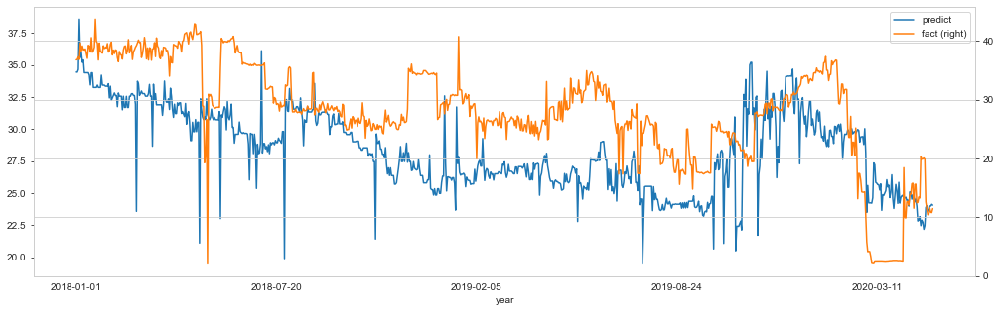

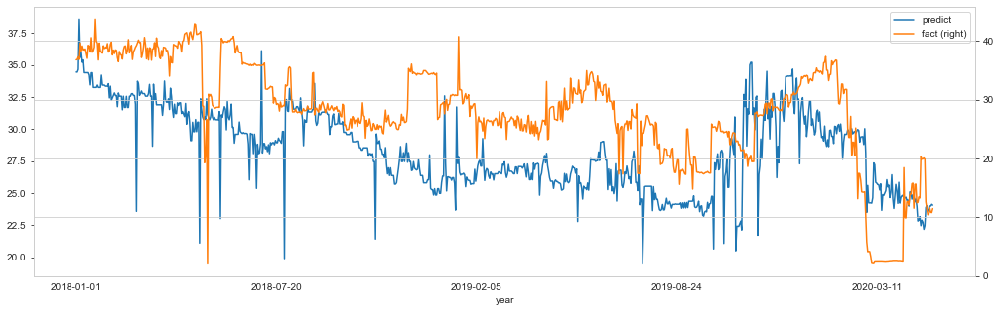

In [63]:
import matplotlib.pyplot as plt # Impot the relevant module


fig, ax = plt.subplots() # Create the figure and axes object

# Plot the first x and y axes:
df.plot(x = 'year', y = 'predict', ax = ax) 
# Plot the second x and y axes. By secondary_y = True a second y-axis is requested:
# (see https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.plot.html for details)
df.plot(x = 'year', y = 'fact', ax = ax, secondary_y = True)

# !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!

In [ ]:
features_considered_south1 = ['AKSH_298_liq_vol','AKSH_213_liq_vol','AKSH_203_liq_vol','AKSH_223_liq_vol','AKSH_226_liq_vol']
target_south = ['AKSH_298_liq_vol','AKSH_213_liq_vol','AKSH_203_liq_vol','AKSH_223_liq_vol','AKSH_226_liq_vol']
features_considered_south2 = ['AKSH_298_bhp_pump_press','AKSH_213_bhp_pump_press','AKSH_203_bhp_pump_press','AKSH_223_bhp_pump_press','AKSH_226_bhp_pump_press']

In [73]:
features_considered_south4 = ['AKSH_298_bhp_pump_press','AKSH_213_bhp_pump_press','AKSH_203_bhp_pump_press','AKSH_223_bhp_pump_press','AKSH_226_bhp_pump_press','AKSH_298_liq_vol','AKSH_226_liq_vol']


In [82]:
def build_model(input_timesteps, output_timesteps, num_links, num_inputs):
    # COPY PASTA
    # https://github.com/niklascp/bus-arrival-convlstm/blob/master/jupyter/ConvLSTM_3x15min_10x64-5x64-10x64-5x64-Comparison.ipynb
    
    model = Sequential()
    model.add(BatchNormalization(name = 'batch_norm_0', input_shape = (input_timesteps, num_inputs, 1, 1)))
    model.add(ConvLSTM2D(name ='conv_lstm_1',
                         filters = 64, kernel_size = (10, 1),                       
                         padding = 'same', 
                         return_sequences = True))
    
    model.add(Dropout(0.30, name = 'dropout_1'))
    model.add(BatchNormalization(name = 'batch_norm_1'))

    model.add(ConvLSTM2D(name ='conv_lstm_2',
                         filters = 64, kernel_size = (5, 1), 
                         padding='same',
                         return_sequences = False))
    
    model.add(Dropout(0.20, name = 'dropout_2'))
    model.add(BatchNormalization(name = 'batch_norm_2'))
    
    model.add(Flatten())
    model.add(RepeatVector(output_timesteps))
    model.add(Reshape((output_timesteps, num_inputs, 1, 64)))
    
    model.add(ConvLSTM2D(name ='conv_lstm_3',
                         filters = 64, kernel_size = (10, 1), 
                         padding='same',
                         return_sequences = True))
    
    model.add(Dropout(0.20, name = 'dropout_3'))
    model.add(BatchNormalization(name = 'batch_norm_3'))
    model.add(ConvLSTM2D(name ='conv_lstm_4',
                         filters = 64, kernel_size = (10, 1), 
                         padding='same',
                         return_sequences = True))
    
    model.add(Dropout(0.20, name = 'dropout_4'))
    model.add(BatchNormalization(name = 'batch_norm_4'))
    model.add(ConvLSTM2D(name ='conv_lstm_5',
                         filters = 64, kernel_size = (10, 1), 
                         padding='same',
                         return_sequences = True))
    
    model.add(Dropout(0.20, name = 'dropout_5'))
    model.add(BatchNormalization(name = 'batch_norm_5'))
    
    model.add(ConvLSTM2D(name ='conv_lstm_6',
                         filters = 64, kernel_size = (5, 1), 
                         padding='same',
                         return_sequences = True))
    
    model.add(TimeDistributed(Dense(units=1, name = 'dense_1', activation = 'relu')))
    model.add(Dense(units=1, name = 'dense_2', activation = 'linear'))

#     optimizer = RMSprop() #lr=0.0001, rho=0.9, epsilon=1e-08, decay=0.9)
#     optimizer = tf.keras.optimizers.Adam(0.1)
    optimizer = tf.keras.optimizers.RMSprop(lr=0.004, clipvalue=1.0)
    model.compile(loss = "mse", optimizer = optimizer, metrics = ['mae', 'mse'])
    return model

In [79]:
ds = data2[features_considered_south4]
ds.shape

(866, 7)

(866, 7)

In [92]:

import tensorflow as tf
import numpy
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd

mpl.rcParams['figure.figsize'] = (8, 6)
mpl.rcParams['axes.grid'] = False

import tensorflow as tf
from tensorflow.keras.callbacks import CSVLogger, EarlyStopping

import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import seaborn as sns
import time
import gc
import sys

print(f"Tensorflow Version: {tf.__version__}")
print(f"Pandas Version: {pd.__version__}")
print(f"Numpy Version: {np.__version__}")
print(f"System Version: {sys.version}")

mpl.rcParams['figure.figsize'] = (17, 5)
mpl.rcParams['axes.grid'] = False
sns.set_style("whitegrid")

notebookstart= time.time()


from keras.layers import Input
from keras.models import Model
from keras.layers.convolutional_recurrent import ConvLSTM2D


from tensorflow.keras.layers import BatchNormalization

import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

Tensorflow Version: 2.4.1
Pandas Version: 1.1.3
Numpy Version: 1.19.2
System Version: 3.8.5 (default, Sep  3 2020, 21:29:08) [MSC v.1916 64 bit (AMD64)]
Tensorflow Version: 2.4.1
Pandas Version: 1.1.3
Numpy Version: 1.19.2
System Version: 3.8.5 (default, Sep  3 2020, 21:29:08) [MSC v.1916 64 bit (AMD64)]


In [94]:
from tensorflow.keras.layers import *
from tensorflow.keras.models import Sequential

In [112]:
import numpy as np
import pandas as pd

#data = data['bhp_pump_press','liq_vol','AKSH_214','AKSH_240','AKSH_220','AKSH_241','AKSH_221','AKSH_247','AKSH_217','AKSH_250','AKSH_424','AKSH_225','AKSH_249','AKSH_299']
df = ds#['AKSH_298_bhp_pump_press','AKSH_213_bhp_pump_press','AKSH_203_bhp_pump_press','AKSH_223_bhp_pump_press','AKSH_226_bhp_pump_press']

df.columns=['AKSH_298_bhp_pump_press','AKSH_213_bhp_pump_press','AKSH_203_bhp_pump_press','AKSH_223_bhp_pump_press','AKSH_226_bhp_pump_press','AKSH_298_liq_vol','AKSH_226_liq_vol']
#train_X=train_df.drop(['var1(t)'],axis=1)
train_y=df[['AKSH_298_liq_vol','AKSH_226_liq_vol']]
train_X=df


train_X_LSTM=train_X[train_X.columns[:10]].reset_index(drop=True).values
train_X_LSTM=train_X_LSTM.reshape(866,7,1,1,1)

train_y_LSTM=train_y.values

train_X_MLP=train_X[train_X.columns[-3:]].reset_index(drop=True).values
train_X_MLP=train_X_MLP.reshape(866, 3,1,1,1)



train_y_MLP=train_y.values

from tensorflow.keras.layers import Input, LSTM, Dense, Concatenate
from tensorflow.keras.models import Model

#lstm input shape
lstm_input = Input(shape=train_X_LSTM.shape[1:])
#lstm units
hidden1 = build_model(1100,10,1,1)(lstm_input)
hidden2 = build_model(1100,10,1,1)(hidden1)
#lstm output which will be predicted var1 at t=t
lstm_output = Dense(1, activation='sigmoid')(hidden2)
#mlp input with additonal 3 variables at t=t
mlp_input=Input(shape=(train_X_MLP.shape[1:]))
hidden3 = build_model(1100,10,1,1)(mlp_input)
hidden4 = build_model(1100,10,1,1)(hidden3)

#combine the lstm output which is predicted var1 at t=t and key in var2,var3,var4 at t=t
x = Concatenate()([lstm_output, hidden4])
y = Multiply()([lstm_output, hidden4])
z = Subtract()([x, y])
#mlp model output which is predicted var1 at t=t
mlp_out = Dense(2, activation='relu')(z)
#final output of combined model which is predicted var1 at t=t
model = Model(inputs=[lstm_input, mlp_input],outputs=mlp_out)
#compile the model
model.compile(loss='mae', optimizer='adam')
#fit the model
model.fit([train_X_LSTM, train_X_MLP], train_y_LSTM, batch_size=64, epochs=100, validation_split=0.1)

Epoch 1/100
Epoch 1/100


13/13 [==============================] - 81s 1s/step - loss: 25.4988 - val_loss: 16.6594
Epoch 2/100
Epoch 2/100
13/13 [==============================] - 10s 797ms/step - loss: 25.1734 - val_loss: 16.5534
Epoch 3/100
Epoch 3/100
13/13 [==============================] - 11s 814ms/step - loss: 24.6220 - val_loss: 15.9176
Epoch 4/100
Epoch 4/100
13/13 [==============================] - 11s 881ms/step - loss: 24.1511 - val_loss: 15.2198
Epoch 5/100
Epoch 5/100
13/13 [==============================] - 11s 853ms/step - loss: 23.4352 - val_loss: 14.6577
Epoch 6/100
Epoch 6/100
13/13 [==============================] - 11s 861ms/step - loss: 22.9456 - val_loss: 14.1535
Epoch 7/100
Epoch 7/100
13/13 [==============================] - 11s 842ms/step - loss: 22.4543 - val_loss: 13.6430
Epoch 8/100
Epoch 8/100
13/13 [==============================] - 11s 837ms/step - loss: 21.7920 - val_loss: 13.1012
Epoch 9/100
Epoch 9/100
13/13 [==============================] - 11s 872ms/step - loss: 21.2807 - v

Epoch 27/100
Epoch 27/100
13/13 [==============================] - 11s 846ms/step - loss: 16.3515 - val_loss: 6.4939
Epoch 28/100
Epoch 28/100
13/13 [==============================] - 11s 846ms/step - loss: 16.5305 - val_loss: 6.4790
Epoch 29/100
Epoch 29/100
13/13 [==============================] - 11s 844ms/step - loss: 16.2722 - val_loss: 6.4930
Epoch 30/100
Epoch 30/100
13/13 [==============================] - 11s 846ms/step - loss: 16.3619 - val_loss: 6.5004
Epoch 31/100
Epoch 31/100
13/13 [==============================] - 11s 857ms/step - loss: 16.4550 - val_loss: 6.5005
Epoch 32/100
Epoch 32/100
13/13 [==============================] - 11s 850ms/step - loss: 16.4093 - val_loss: 6.4708
Epoch 33/100
Epoch 33/100
13/13 [==============================] - 11s 857ms/step - loss: 16.2690 - val_loss: 6.4500
Epoch 34/100
Epoch 34/100
13/13 [==============================] - 11s 874ms/step - loss: 16.3310 - val_loss: 6.5123
Epoch 35/100
Epoch 35/100
13/13 [==============================]

In [113]:
yhat = model.predict([train_X_LSTM, train_X_MLP], verbose=1)
print(yhat)

28/28 [==============================] - 15s 236ms/step
[[[[[ 0.       20.091303]]]


  [[[ 0.       20.536234]]]


  [[[ 0.       20.585579]]]


  ...


  [[[ 0.       20.683235]]]


  [[[ 0.       20.681318]]]


  [[[ 0.       20.674006]]]]



 [[[[ 0.       20.091303]]]


  [[[ 0.       20.534962]]]


  [[[ 0.       20.585127]]]


  ...


  [[[ 0.       20.683048]]]


  [[[ 0.       20.681225]]]


  [[[ 0.       20.67389 ]]]]



 [[[[ 0.       20.091303]]]


  [[[ 0.       20.5369  ]]]


  [[[ 0.       20.585836]]]


  ...


  [[[ 0.       20.68335 ]]]


  [[[ 0.       20.681387]]]


  [[[ 0.       20.674099]]]]



 ...



 [[[[ 0.       20.091303]]]


  [[[ 0.       20.533176]]]


  [[[ 0.       20.58447 ]]]


  ...


  [[[ 0.       20.68272 ]]]


  [[[ 0.       20.681025]]]


  [[[ 0.       20.673634]]]]



 [[[[ 0.       20.091303]]]


  [[[ 0.       20.533176]]]


  [[[ 0.       20.58447 ]]]


  ...


  [[[ 0.       20.68272 ]]]


  [[[ 0.       20.681025]]]


  [[[ 0.       20.

In [114]:
yhat = yhat.flatten()
train_y = train_y.values.flatten()

In [115]:
from sklearn.metrics import r2_score

yhat = yhat[0:1100]
train_y = train_y[0:1100]

r2_score(train_y, yhat, multioutput='variance_weighted')

-9.481527227043

-9.481527227043

In [116]:
yhat = yhat[0:857]
train_y = train_y[0:857]
yhat.shape

(857,)

(857,)

In [117]:
train_y.shape

(857,)

(857,)

In [118]:
df = pd.DataFrame(data={'year': datadd, 
                        'predict': yhat, 
                        'fact': train_y})

<AxesSubplot:label='f838bfcf-b359-4656-b725-5dba917b46f8'>

<AxesSubplot:label='f838bfcf-b359-4656-b725-5dba917b46f8'>

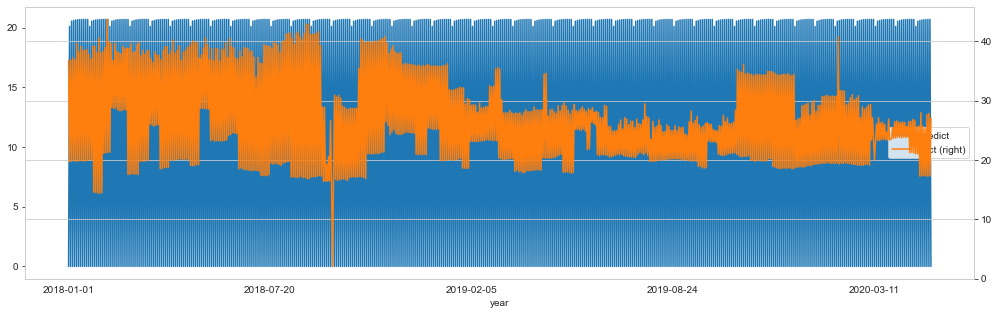

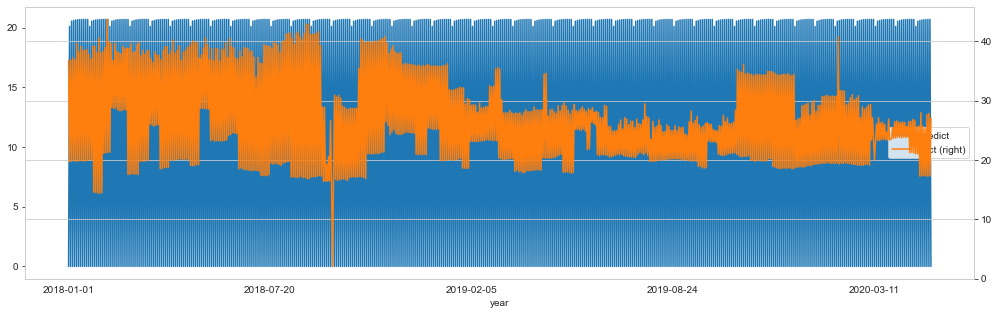

In [119]:
fig, ax = plt.subplots() # Create the figure and axes object

# Plot the first x and y axes:
df.plot(x = 'year', y = 'predict', ax = ax) 
# Plot the second x and y axes. By secondary_y = True a second y-axis is requested:
# (see https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.plot.html for details)
df.plot(x = 'year', y = 'fact', ax = ax, secondary_y = True)

In [134]:
# multivariate mlp example
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate
 
# сэмлы
def split_sequences(sequences, n_steps):
	X, y = list(), list()
	for i in range(len(sequences)):
		# разметка
		end_ix = i + n_steps
		# проверка выхода за пределы
		if end_ix > len(sequences):
			break
		# получение начала и конечной метки
		seq_x, seq_y = sequences[i:end_ix, :-1], sequences[end_ix-1, -1]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
# последовательность
in_seq1 = X_left[0:857]
in_seq2 = X_right[0:857]
out_seq = Y_train[0:857] # array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1), 5,1,1))
in_seq2 = in_seq2.reshape((len(in_seq2), 1,1,1))
out_seq = out_seq.reshape((len(out_seq), 1,1,1))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
n_steps = 1
# convert into input/output
X, y = split_sequences(dataset, n_steps)
# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]
# первая модель
visible1 = Input(shape=(n_steps,1,1,1))
dense1 =  ConvLSTM2D(name ='conv_lstm_1',
                         filters = 64, kernel_size = (10, 1), 
                         padding='same',
                         return_sequences = True)(visible1) #,batch_input_shape=(32,100,1), stateful=True
# вторая модель LSTM
visible2 = Input(shape=(n_steps,1,1,1))
lstm = ConvLSTM2D(name ='conv_lstm_4',
                         filters = 64, kernel_size = (10, 1), 
                         padding='same',
                         return_sequences = True)(visible2)
# слияние
merge = concatenate([dense1, lstm])
output = Dense(1)(merge)
model = Model(inputs=[visible1, visible2], outputs=output)
model.compile(optimizer='adam', loss='mape', metrics=['accuracy'])
# fit model
model.fit([X1, X2], Y_train, epochs=2000, verbose=1, batch_size=64, validation_split=0.1)
# demonstrate prediction
#x_input = array([[80, 85], [90, 95], [100, 105]])
#x1 = x_input[:, 0].reshape((1, n_steps))
#x2 = x_input[:, 1].reshape((1, n_steps))
yhat = model.predict([X1, X2], verbose=0)
print(yhat)

Epoch 1/2000
Epoch 1/2000
13/13 [==============================] - 5s 52ms/step - loss: 96.6321 - accuracy: 0.0000e+00 - val_loss: 55.8723 - val_accuracy: 0.0000e+00
Epoch 2/2000
13/13 [==============================] - 0s 11ms/step - loss: 89.6736 - accuracy: 0.0000e+00 - val_loss: 77.0671 - val_accuracy: 0.0000e+00
Epoch 3/2000
13/13 [==============================] - 0s 11ms/step - loss: 89.6736 - accuracy: 0.0000e+00 - val_loss: 77.0671 - val_accuracy: 0.0000e+00
Epoch 3/2000
13/13 [==============================] - 0s 11ms/step - loss: 82.1522 - accuracy: 0.0000e+00 - val_loss: 105.7599 - val_accuracy: 0.0000e+00
Epoch 4/2000
13/13 [==============================] - 0s 11ms/step - loss: 74.6265 - accuracy: 0.0000e+00 - val_loss: 137.4396 - val_accuracy: 0.0000e+00
Epoch 5/2000
13/13 [==============================] - 0s 11ms/step - loss: 82.1522 - accuracy: 0.0000e+00 - val_loss: 105.7599 - val_accuracy: 0.0000e+00
Epoch 4/2000
13/13 [==============================] - 0s 11ms/step

Epoch 26/2000
13/13 [==============================] - 0s 10ms/step - loss: 18.4259 - accuracy: 0.0000e+00 - val_loss: 455.9565 - val_accuracy: 0.0000e+00
Epoch 27/2000
13/13 [==============================] - 0s 10ms/step - loss: 18.2617 - accuracy: 0.0000e+00 - val_loss: 456.8656 - val_accuracy: 0.0000e+00
Epoch 28/2000
13/13 [==============================] - 0s 10ms/step - loss: 19.5146 - accuracy: 0.0000e+00 - val_loss: 457.6808 - val_accuracy: 0.0000e+00
Epoch 29/2000
13/13 [==============================] - 0s 10ms/step - loss: 19.7643 - accuracy: 0.0000e+00 - val_loss: 457.9976 - val_accuracy: 0.0000e+00
Epoch 30/2000
13/13 [==============================] - 0s 10ms/step - loss: 19.7643 - accuracy: 0.0000e+00 - val_loss: 457.9976 - val_accuracy: 0.0000e+00
Epoch 30/2000
13/13 [==============================] - 0s 11ms/step - loss: 17.9533 - accuracy: 0.0000e+00 - val_loss: 459.9183 - val_accuracy: 0.0000e+00
Epoch 31/2000
13/13 [==============================] - 0s 10ms/step - 

13/13 [==============================] - 0s 11ms/step - loss: 20.2561 - accuracy: 0.0000e+00 - val_loss: 452.6708 - val_accuracy: 0.0000e+00
Epoch 69/2000
13/13 [==============================] - 0s 11ms/step - loss: 18.9301 - accuracy: 0.0000e+00 - val_loss: 451.3396 - val_accuracy: 0.0000e+00
Epoch 70/2000
13/13 [==============================] - 0s 10ms/step - loss: 18.6110 - accuracy: 0.0000e+00 - val_loss: 455.9884 - val_accuracy: 0.0000e+00
Epoch 71/2000
13/13 [==============================] - 0s 10ms/step - loss: 18.6110 - accuracy: 0.0000e+00 - val_loss: 455.9884 - val_accuracy: 0.0000e+00
Epoch 71/2000
13/13 [==============================] - 0s 11ms/step - loss: 20.2246 - accuracy: 0.0000e+00 - val_loss: 461.3466 - val_accuracy: 0.0000e+00
Epoch 72/2000
13/13 [==============================] - 0s 11ms/step - loss: 20.6031 - accuracy: 0.0000e+00 - val_loss: 460.1840 - val_accuracy: 0.0000e+00
Epoch 73/2000
13/13 [==============================] - 0s 11ms/step - loss: 17.8890 

Epoch 90/2000
13/13 [==============================] - 0s 11ms/step - loss: 19.1537 - accuracy: 0.0000e+00 - val_loss: 460.7633 - val_accuracy: 0.0000e+00
Epoch 91/2000
13/13 [==============================] - 0s 11ms/step - loss: 20.4857 - accuracy: 0.0000e+00 - val_loss: 460.0332 - val_accuracy: 0.0000e+00
Epoch 92/2000
13/13 [==============================] - 0s 11ms/step - loss: 20.4857 - accuracy: 0.0000e+00 - val_loss: 460.0332 - val_accuracy: 0.0000e+00
Epoch 92/2000
13/13 [==============================] - 0s 11ms/step - loss: 22.3052 - accuracy: 0.0000e+00 - val_loss: 456.0829 - val_accuracy: 0.0000e+00
Epoch 93/2000
13/13 [==============================] - 0s 10ms/step - loss: 19.4566 - accuracy: 0.0000e+00 - val_loss: 456.1454 - val_accuracy: 0.0000e+00
Epoch 94/2000
13/13 [==============================] - 0s 10ms/step - loss: 19.8105 - accuracy: 0.0000e+00 - val_loss: 454.1657 - val_accuracy: 0.0000e+00
Epoch 95/2000
13/13 [==============================] - 0s 11ms/step - 

Epoch 135/2000
13/13 [==============================] - 0s 11ms/step - loss: 17.3898 - accuracy: 0.0000e+00 - val_loss: 458.2479 - val_accuracy: 0.0000e+00
Epoch 136/2000
13/13 [==============================] - 0s 10ms/step - loss: 17.6150 - accuracy: 0.0000e+00 - val_loss: 462.4258 - val_accuracy: 0.0000e+00
Epoch 137/2000
13/13 [==============================] - 0s 11ms/step - loss: 19.2701 - accuracy: 0.0000e+00 - val_loss: 460.5222 - val_accuracy: 0.0000e+00
Epoch 138/2000
13/13 [==============================] - 0s 10ms/step - loss: 17.6806 - accuracy: 0.0000e+00 - val_loss: 459.9059 - val_accuracy: 0.0000e+00
Epoch 139/2000
 1/13 [=>............................] - ETA: 0s - loss: 17.9705 - accuracy: 0.0000e+0013/13 [==============================] - 0s 10ms/step - loss: 17.6806 - accuracy: 0.0000e+00 - val_loss: 459.9059 - val_accuracy: 0.0000e+00
Epoch 139/2000
13/13 [==============================] - 0s 11ms/step - loss: 17.3438 - accuracy: 0.0000e+00 - val_loss: 459.9064 - va

Epoch 156/2000
13/13 [==============================] - 0s 11ms/step - loss: 18.5111 - accuracy: 0.0000e+00 - val_loss: 448.7776 - val_accuracy: 0.0000e+00
Epoch 157/2000
13/13 [==============================] - 0s 11ms/step - loss: 18.5111 - accuracy: 0.0000e+00 - val_loss: 448.7776 - val_accuracy: 0.0000e+00
Epoch 157/2000
13/13 [==============================] - 0s 11ms/step - loss: 20.3243 - accuracy: 0.0000e+00 - val_loss: 449.1442 - val_accuracy: 0.0000e+00
Epoch 158/2000
13/13 [==============================] - 0s 11ms/step - loss: 20.3243 - accuracy: 0.0000e+00 - val_loss: 449.1442 - val_accuracy: 0.0000e+00
Epoch 158/2000
13/13 [==============================] - 0s 11ms/step - loss: 18.7531 - accuracy: 0.0000e+00 - val_loss: 454.2974 - val_accuracy: 0.0000e+00
Epoch 159/2000
13/13 [==============================] - 0s 11ms/step - loss: 17.5043 - accuracy: 0.0000e+00 - val_loss: 457.5312 - val_accuracy: 0.0000e+00
Epoch 160/2000
13/13 [==============================] - 0s 11ms/

Epoch 178/2000
13/13 [==============================] - 0s 11ms/step - loss: 19.0550 - accuracy: 0.0000e+00 - val_loss: 450.6283 - val_accuracy: 0.0000e+00
Epoch 179/2000
13/13 [==============================] - 0s 11ms/step - loss: 20.0573 - accuracy: 0.0000e+00 - val_loss: 454.6961 - val_accuracy: 0.0000e+00
Epoch 180/2000
13/13 [==============================] - 0s 11ms/step - loss: 19.0550 - accuracy: 0.0000e+00 - val_loss: 450.6283 - val_accuracy: 0.0000e+00
Epoch 179/2000
13/13 [==============================] - 0s 11ms/step - loss: 20.0573 - accuracy: 0.0000e+00 - val_loss: 454.6961 - val_accuracy: 0.0000e+00
Epoch 180/2000
13/13 [==============================] - 0s 10ms/step - loss: 18.2325 - accuracy: 0.0000e+00 - val_loss: 457.4661 - val_accuracy: 0.0000e+00
Epoch 181/2000
13/13 [==============================] - 0s 10ms/step - loss: 19.0024 - accuracy: 0.0000e+00 - val_loss: 459.0672 - val_accuracy: 0.0000e+00
Epoch 182/2000
 1/13 [=>............................] - ETA: 0s 

Epoch 223/2000
13/13 [==============================] - 0s 11ms/step - loss: 20.0402 - accuracy: 0.0000e+00 - val_loss: 461.0332 - val_accuracy: 0.0000e+00
Epoch 224/2000
13/13 [==============================] - 0s 11ms/step - loss: 18.5627 - accuracy: 0.0000e+00 - val_loss: 455.2064 - val_accuracy: 0.0000e+00
Epoch 225/2000
13/13 [==============================] - 0s 11ms/step - loss: 19.0994 - accuracy: 0.0000e+00 - val_loss: 453.5404 - val_accuracy: 0.0000e+00
Epoch 226/2000
13/13 [==============================] - 0s 11ms/step - loss: 18.0479 - accuracy: 0.0000e+00 - val_loss: 459.2859 - val_accuracy: 0.0000e+00
Epoch 227/2000
13/13 [==============================] - 0s 11ms/step - loss: 19.6745 - accuracy: 0.0000e+00 - val_loss: 457.2880 - val_accuracy: 0.0000e+00
Epoch 228/2000
13/13 [==============================] - 0s 11ms/step - loss: 17.1958 - accuracy: 0.0000e+00 - val_loss: 462.0604 - val_accuracy: 0.0000e+00
Epoch 229/2000
13/13 [==============================] - 0s 11ms/

Epoch 247/2000
13/13 [==============================] - 0s 11ms/step - loss: 17.6014 - accuracy: 0.0000e+00 - val_loss: 465.7692 - val_accuracy: 0.0000e+00
Epoch 248/2000
13/13 [==============================] - 0s 11ms/step - loss: 17.6014 - accuracy: 0.0000e+00 - val_loss: 465.7692 - val_accuracy: 0.0000e+00
Epoch 248/2000
13/13 [==============================] - 0s 10ms/step - loss: 17.6324 - accuracy: 0.0000e+00 - val_loss: 462.4963 - val_accuracy: 0.0000e+00
Epoch 249/2000
13/13 [==============================] - 0s 10ms/step - loss: 17.6324 - accuracy: 0.0000e+00 - val_loss: 462.4963 - val_accuracy: 0.0000e+00
Epoch 249/2000
13/13 [==============================] - 0s 11ms/step - loss: 18.5835 - accuracy: 0.0000e+00 - val_loss: 460.3309 - val_accuracy: 0.0000e+00
Epoch 250/2000
13/13 [==============================] - 0s 11ms/step - loss: 18.5835 - accuracy: 0.0000e+00 - val_loss: 460.3309 - val_accuracy: 0.0000e+00
Epoch 250/2000
13/13 [==============================] - 0s 11ms/

Epoch 271/2000
13/13 [==============================] - 0s 11ms/step - loss: 19.2831 - accuracy: 0.0000e+00 - val_loss: 461.8446 - val_accuracy: 0.0000e+00
Epoch 272/2000
13/13 [==============================] - 0s 11ms/step - loss: 18.3982 - accuracy: 0.0000e+00 - val_loss: 455.1993 - val_accuracy: 0.0000e+00
Epoch 273/2000
13/13 [==============================] - 0s 11ms/step - loss: 19.3656 - accuracy: 0.0000e+00 - val_loss: 454.2342 - val_accuracy: 0.0000e+00
Epoch 274/2000
13/13 [==============================] - 0s 10ms/step - loss: 17.5509 - accuracy: 0.0000e+00 - val_loss: 457.9198 - val_accuracy: 0.0000e+00
Epoch 275/2000
13/13 [==============================] - 0s 11ms/step - loss: 20.3968 - accuracy: 0.0000e+00 - val_loss: 459.5922 - val_accuracy: 0.0000e+00
Epoch 276/2000
13/13 [==============================] - 0s 12ms/step - loss: 19.2910 - accuracy: 0.0000e+00 - val_loss: 463.5528 - val_accuracy: 0.0000e+00
Epoch 277/2000
13/13 [==============================] - 0s 11ms/

Epoch 292/2000
13/13 [==============================] - 0s 10ms/step - loss: 18.0020 - accuracy: 0.0000e+00 - val_loss: 461.8878 - val_accuracy: 0.0000e+00
Epoch 293/2000
13/13 [==============================] - 0s 10ms/step - loss: 18.1370 - accuracy: 0.0000e+00 - val_loss: 461.5532 - val_accuracy: 0.0000e+00
Epoch 294/2000
13/13 [==============================] - 0s 10ms/step - loss: 18.0031 - accuracy: 0.0000e+00 - val_loss: 463.4831 - val_accuracy: 0.0000e+00
Epoch 295/2000
13/13 [==============================] - 0s 11ms/step - loss: 17.4100 - accuracy: 0.0000e+00 - val_loss: 459.0139 - val_accuracy: 0.0000e+00
Epoch 296/2000
13/13 [==============================] - 0s 11ms/step - loss: 18.3020 - accuracy: 0.0000e+00 - val_loss: 460.1891 - val_accuracy: 0.0000e+00
Epoch 297/2000
13/13 [==============================] - 0s 19ms/step - loss: 18.0616 - accuracy: 0.0000e+00 - val_loss: 460.4584 - val_accuracy: 0.0000e+00
Epoch 298/2000
13/13 [==============================] - 0s 11ms/

Epoch 313/2000
13/13 [==============================] - 0s 11ms/step - loss: 20.3297 - accuracy: 0.0000e+00 - val_loss: 452.4870 - val_accuracy: 0.0000e+00
Epoch 314/2000
13/13 [==============================] - 0s 11ms/step - loss: 18.5346 - accuracy: 0.0000e+00 - val_loss: 458.0593 - val_accuracy: 0.0000e+00
Epoch 315/2000
13/13 [==============================] - 0s 11ms/step - loss: 19.9085 - accuracy: 0.0000e+00 - val_loss: 460.1113 - val_accuracy: 0.0000e+00
Epoch 316/2000
13/13 [==============================] - 0s 11ms/step - loss: 19.9085 - accuracy: 0.0000e+00 - val_loss: 460.1113 - val_accuracy: 0.0000e+00
Epoch 316/2000
13/13 [==============================] - 0s 11ms/step - loss: 17.4375 - accuracy: 0.0000e+00 - val_loss: 458.3566 - val_accuracy: 0.0000e+00
Epoch 317/2000
13/13 [==============================] - 0s 10ms/step - loss: 17.3708 - accuracy: 0.0000e+00 - val_loss: 457.2086 - val_accuracy: 0.0000e+00
Epoch 318/2000
13/13 [==============================] - 0s 10ms/

Epoch 355/2000
13/13 [==============================] - 0s 10ms/step - loss: 17.4215 - accuracy: 0.0000e+00 - val_loss: 457.5468 - val_accuracy: 0.0000e+00
Epoch 356/2000
13/13 [==============================] - 0s 10ms/step - loss: 16.6715 - accuracy: 0.0000e+00 - val_loss: 461.7213 - val_accuracy: 0.0000e+00
Epoch 357/2000
13/13 [==============================] - 0s 11ms/step - loss: 18.0564 - accuracy: 0.0000e+00 - val_loss: 462.6387 - val_accuracy: 0.0000e+00
Epoch 358/2000
13/13 [==============================] - 0s 10ms/step - loss: 18.2904 - accuracy: 0.0000e+00 - val_loss: 464.2791 - val_accuracy: 0.0000e+00
Epoch 359/2000
13/13 [==============================] - 0s 10ms/step - loss: 17.9443 - accuracy: 0.0000e+00 - val_loss: 460.8583 - val_accuracy: 0.0000e+00
Epoch 360/2000
13/13 [==============================] - 0s 10ms/step - loss: 17.9443 - accuracy: 0.0000e+00 - val_loss: 460.8583 - val_accuracy: 0.0000e+00
Epoch 360/2000
13/13 [==============================] - 0s 10ms

13/13 [==============================] - 0s 11ms/step - loss: 17.4508 - accuracy: 0.0000e+00 - val_loss: 463.6158 - val_accuracy: 0.0000e+00
Epoch 379/2000
13/13 [==============================] - 0s 11ms/step - loss: 18.2466 - accuracy: 0.0000e+00 - val_loss: 463.4316 - val_accuracy: 0.0000e+00
Epoch 380/2000
13/13 [==============================] - 0s 11ms/step - loss: 18.0625 - accuracy: 0.0000e+00 - val_loss: 460.5722 - val_accuracy: 0.0000e+00
Epoch 381/2000
13/13 [==============================] - 0s 11ms/step - loss: 18.0625 - accuracy: 0.0000e+00 - val_loss: 460.5722 - val_accuracy: 0.0000e+00
Epoch 381/2000
13/13 [==============================] - 0s 10ms/step - loss: 18.2442 - accuracy: 0.0000e+00 - val_loss: 464.7749 - val_accuracy: 0.0000e+00
Epoch 382/2000
13/13 [==============================] - 0s 10ms/step - loss: 18.2442 - accuracy: 0.0000e+00 - val_loss: 464.7749 - val_accuracy: 0.0000e+00
Epoch 382/2000
13/13 [==============================] - 0s 11ms/step - loss: 19

13/13 [==============================] - 0s 11ms/step - loss: 17.9657 - accuracy: 0.0000e+00 - val_loss: 460.9987 - val_accuracy: 0.0000e+00
Epoch 402/2000
13/13 [==============================] - 0s 11ms/step - loss: 17.9263 - accuracy: 0.0000e+00 - val_loss: 458.7943 - val_accuracy: 0.0000e+00
Epoch 403/2000
13/13 [==============================] - 0s 11ms/step - loss: 19.3234 - accuracy: 0.0000e+00 - val_loss: 456.8466 - val_accuracy: 0.0000e+00
Epoch 404/2000
13/13 [==============================] - 0s 11ms/step - loss: 19.3234 - accuracy: 0.0000e+00 - val_loss: 456.8466 - val_accuracy: 0.0000e+00
Epoch 404/2000
13/13 [==============================] - 0s 11ms/step - loss: 17.4275 - accuracy: 0.0000e+00 - val_loss: 460.4496 - val_accuracy: 0.0000e+00
Epoch 405/2000
13/13 [==============================] - 0s 11ms/step - loss: 17.4275 - accuracy: 0.0000e+00 - val_loss: 460.4496 - val_accuracy: 0.0000e+00
Epoch 405/2000
13/13 [==============================] - 0s 10ms/step - loss: 18

Epoch 423/2000
13/13 [==============================] - 0s 10ms/step - loss: 20.9906 - accuracy: 0.0000e+00 - val_loss: 459.2832 - val_accuracy: 0.0000e+00
Epoch 424/2000
13/13 [==============================] - 0s 11ms/step - loss: 19.8558 - accuracy: 0.0000e+00 - val_loss: 464.6009 - val_accuracy: 0.0000e+00
Epoch 425/2000
13/13 [==============================] - 0s 11ms/step - loss: 17.6107 - accuracy: 0.0000e+00 - val_loss: 458.3369 - val_accuracy: 0.0000e+00
Epoch 426/2000
13/13 [==============================] - 0s 11ms/step - loss: 17.5285 - accuracy: 0.0000e+00 - val_loss: 457.6439 - val_accuracy: 0.0000e+00
Epoch 427/2000
13/13 [==============================] - 0s 10ms/step - loss: 18.2226 - accuracy: 0.0000e+00 - val_loss: 462.7513 - val_accuracy: 0.0000e+00
Epoch 428/2000
13/13 [==============================] - 0s 10ms/step - loss: 17.9720 - accuracy: 0.0000e+00 - val_loss: 464.5663 - val_accuracy: 0.0000e+00
Epoch 429/2000
13/13 [==============================] - 0s 10ms/

Epoch 444/2000
13/13 [==============================] - 0s 10ms/step - loss: 19.8175 - accuracy: 0.0000e+00 - val_loss: 459.1924 - val_accuracy: 0.0000e+00
Epoch 445/2000
13/13 [==============================] - 0s 10ms/step - loss: 21.7634 - accuracy: 0.0000e+00 - val_loss: 462.4890 - val_accuracy: 0.0000e+00
Epoch 446/2000
13/13 [==============================] - 0s 10ms/step - loss: 21.7634 - accuracy: 0.0000e+00 - val_loss: 462.4890 - val_accuracy: 0.0000e+00
Epoch 446/2000
13/13 [==============================] - 0s 10ms/step - loss: 20.1133 - accuracy: 0.0000e+00 - val_loss: 465.0816 - val_accuracy: 0.0000e+00
Epoch 447/2000
13/13 [==============================] - 0s 11ms/step - loss: 18.0746 - accuracy: 0.0000e+00 - val_loss: 465.9900 - val_accuracy: 0.0000e+00
Epoch 448/2000
13/13 [==============================] - 0s 10ms/step - loss: 21.4841 - accuracy: 0.0000e+00 - val_loss: 461.6216 - val_accuracy: 0.0000e+00
Epoch 449/2000
13/13 [==============================] - 0s 11ms

Epoch 465/2000
13/13 [==============================] - 0s 11ms/step - loss: 18.4329 - accuracy: 0.0000e+00 - val_loss: 466.5357 - val_accuracy: 0.0000e+00
Epoch 466/2000
13/13 [==============================] - 0s 10ms/step - loss: 20.3676 - accuracy: 0.0000e+00 - val_loss: 463.0420 - val_accuracy: 0.0000e+00
Epoch 467/2000
13/13 [==============================] - 0s 11ms/step - loss: 17.9340 - accuracy: 0.0000e+00 - val_loss: 460.8804 - val_accuracy: 0.0000e+00
Epoch 468/2000
13/13 [==============================] - 0s 10ms/step - loss: 17.6553 - accuracy: 0.0000e+00 - val_loss: 461.6846 - val_accuracy: 0.0000e+00
Epoch 469/2000
13/13 [==============================] - 0s 10ms/step - loss: 18.5232 - accuracy: 0.0000e+00 - val_loss: 460.7507 - val_accuracy: 0.0000e+00
Epoch 470/2000
13/13 [==============================] - 0s 10ms/step - loss: 19.7128 - accuracy: 0.0000e+00 - val_loss: 461.9372 - val_accuracy: 0.0000e+00
Epoch 471/2000
13/13 [==============================] - 0s 11ms/

13/13 [==============================] - 0s 10ms/step - loss: 21.5077 - accuracy: 0.0000e+00 - val_loss: 463.9447 - val_accuracy: 0.0000e+00
Epoch 487/2000
13/13 [==============================] - 0s 11ms/step - loss: 21.9618 - accuracy: 0.0000e+00 - val_loss: 459.9685 - val_accuracy: 0.0000e+00
Epoch 488/2000
13/13 [==============================] - 0s 10ms/step - loss: 21.2553 - accuracy: 0.0000e+00 - val_loss: 460.5989 - val_accuracy: 0.0000e+00
Epoch 489/2000
13/13 [==============================] - 0s 10ms/step - loss: 18.2956 - accuracy: 0.0000e+00 - val_loss: 461.0102 - val_accuracy: 0.0000e+00
Epoch 490/2000
13/13 [==============================] - 0s 11ms/step - loss: 19.4532 - accuracy: 0.0000e+00 - val_loss: 461.1765 - val_accuracy: 0.0000e+00
Epoch 491/2000
13/13 [==============================] - 0s 11ms/step - loss: 19.2497 - accuracy: 0.0000e+00 - val_loss: 463.1891 - val_accuracy: 0.0000e+00
Epoch 492/2000
13/13 [==============================] - 0s 11ms/step - loss: 21

13/13 [==============================] - 0s 11ms/step - loss: 17.0315 - accuracy: 0.0000e+00 - val_loss: 466.2557 - val_accuracy: 0.0000e+00
Epoch 531/2000
13/13 [==============================] - 0s 11ms/step - loss: 20.3049 - accuracy: 0.0000e+00 - val_loss: 466.5927 - val_accuracy: 0.0000e+00
Epoch 532/2000
13/13 [==============================] - 0s 11ms/step - loss: 20.0585 - accuracy: 0.0000e+00 - val_loss: 467.0578 - val_accuracy: 0.0000e+00
Epoch 533/2000
13/13 [==============================] - 0s 11ms/step - loss: 17.5354 - accuracy: 0.0000e+00 - val_loss: 468.5523 - val_accuracy: 0.0000e+00
Epoch 534/2000
13/13 [==============================] - 0s 21ms/step - loss: 18.0556 - accuracy: 0.0000e+00 - val_loss: 469.7550 - val_accuracy: 0.0000e+00
Epoch 535/2000
13/13 [==============================] - 0s 11ms/step - loss: 17.2164 - accuracy: 0.0000e+00 - val_loss: 467.5780 - val_accuracy: 0.0000e+00
Epoch 536/2000
13/13 [==============================] - 0s 11ms/step - loss: 17

13/13 [==============================] - 0s 11ms/step - loss: 18.3643 - accuracy: 0.0000e+00 - val_loss: 469.6708 - val_accuracy: 0.0000e+00
Epoch 573/2000
13/13 [==============================] - 0s 11ms/step - loss: 18.3643 - accuracy: 0.0000e+00 - val_loss: 469.6708 - val_accuracy: 0.0000e+00
Epoch 573/2000
13/13 [==============================] - 0s 11ms/step - loss: 17.6987 - accuracy: 0.0000e+00 - val_loss: 466.1170 - val_accuracy: 0.0000e+00
Epoch 574/2000
13/13 [==============================] - 0s 11ms/step - loss: 19.8057 - accuracy: 0.0000e+00 - val_loss: 461.7886 - val_accuracy: 0.0000e+00
Epoch 575/2000
13/13 [==============================] - 0s 10ms/step - loss: 19.1953 - accuracy: 0.0000e+00 - val_loss: 461.0482 - val_accuracy: 0.0000e+00
Epoch 576/2000
13/13 [==============================] - 0s 11ms/step - loss: 18.7370 - accuracy: 0.0000e+00 - val_loss: 461.5879 - val_accuracy: 0.0000e+00
Epoch 577/2000
13/13 [==============================] - 0s 10ms/step - loss: 18

13/13 [==============================] - 0s 11ms/step - loss: 17.9735 - accuracy: 0.0000e+00 - val_loss: 465.4923 - val_accuracy: 0.0000e+00
Epoch 594/2000
13/13 [==============================] - 0s 10ms/step - loss: 18.0879 - accuracy: 0.0000e+00 - val_loss: 462.9410 - val_accuracy: 0.0000e+00
Epoch 595/2000
13/13 [==============================] - 0s 10ms/step - loss: 18.0879 - accuracy: 0.0000e+00 - val_loss: 462.9410 - val_accuracy: 0.0000e+00
Epoch 595/2000
13/13 [==============================] - 0s 10ms/step - loss: 16.6682 - accuracy: 0.0000e+00 - val_loss: 464.2843 - val_accuracy: 0.0000e+00
Epoch 596/2000
13/13 [==============================] - 0s 10ms/step - loss: 16.6682 - accuracy: 0.0000e+00 - val_loss: 464.2843 - val_accuracy: 0.0000e+00
Epoch 596/2000
13/13 [==============================] - 0s 11ms/step - loss: 18.5558 - accuracy: 0.0000e+00 - val_loss: 465.2164 - val_accuracy: 0.0000e+00
Epoch 597/2000
13/13 [==============================] - 0s 11ms/step - loss: 1

Epoch 616/2000
13/13 [==============================] - 0s 10ms/step - loss: 18.1985 - accuracy: 0.0000e+00 - val_loss: 469.1831 - val_accuracy: 0.0000e+00
Epoch 617/2000
13/13 [==============================] - 0s 10ms/step - loss: 18.1985 - accuracy: 0.0000e+00 - val_loss: 469.1831 - val_accuracy: 0.0000e+00
Epoch 617/2000
13/13 [==============================] - 0s 10ms/step - loss: 17.3247 - accuracy: 0.0000e+00 - val_loss: 469.5916 - val_accuracy: 0.0000e+00
Epoch 618/2000
13/13 [==============================] - 0s 10ms/step - loss: 18.1847 - accuracy: 0.0000e+00 - val_loss: 469.3869 - val_accuracy: 0.0000e+00
Epoch 619/2000
13/13 [==============================] - 0s 10ms/step - loss: 18.3692 - accuracy: 0.0000e+00 - val_loss: 472.6658 - val_accuracy: 0.0000e+00
Epoch 620/2000
13/13 [==============================] - 0s 11ms/step - loss: 19.2493 - accuracy: 0.0000e+00 - val_loss: 473.2054 - val_accuracy: 0.0000e+00
Epoch 621/2000
13/13 [==============================] - 0s 11ms/

Epoch 660/2000
13/13 [==============================] - 0s 10ms/step - loss: 18.5658 - accuracy: 0.0000e+00 - val_loss: 467.5975 - val_accuracy: 0.0000e+00
Epoch 661/2000
13/13 [==============================] - 0s 10ms/step - loss: 17.6149 - accuracy: 0.0000e+00 - val_loss: 470.7497 - val_accuracy: 0.0000e+00
Epoch 662/2000
13/13 [==============================] - 0s 10ms/step - loss: 17.7555 - accuracy: 0.0000e+00 - val_loss: 471.3247 - val_accuracy: 0.0000e+00
Epoch 663/2000
13/13 [==============================] - 0s 10ms/step - loss: 19.6690 - accuracy: 0.0000e+00 - val_loss: 467.3539 - val_accuracy: 0.0000e+00
Epoch 664/2000
13/13 [==============================] - 0s 10ms/step - loss: 19.6690 - accuracy: 0.0000e+00 - val_loss: 467.3539 - val_accuracy: 0.0000e+00
Epoch 664/2000
13/13 [==============================] - 0s 10ms/step - loss: 19.1219 - accuracy: 0.0000e+00 - val_loss: 471.4136 - val_accuracy: 0.0000e+00
Epoch 665/2000
13/13 [==============================] - 0s 10ms/

13/13 [==============================] - 0s 11ms/step - loss: 18.3016 - accuracy: 0.0000e+00 - val_loss: 473.4886 - val_accuracy: 0.0000e+00
Epoch 703/2000
13/13 [==============================] - 0s 10ms/step - loss: 18.0359 - accuracy: 0.0000e+00 - val_loss: 472.1766 - val_accuracy: 0.0000e+00
Epoch 704/2000
13/13 [==============================] - 0s 10ms/step - loss: 18.0359 - accuracy: 0.0000e+00 - val_loss: 472.1766 - val_accuracy: 0.0000e+00
Epoch 704/2000
13/13 [==============================] - 0s 11ms/step - loss: 17.7153 - accuracy: 0.0000e+00 - val_loss: 471.6339 - val_accuracy: 0.0000e+00
Epoch 705/2000
13/13 [==============================] - 0s 11ms/step - loss: 16.9986 - accuracy: 0.0000e+00 - val_loss: 469.2917 - val_accuracy: 0.0000e+00
Epoch 706/2000
13/13 [==============================] - 0s 11ms/step - loss: 18.6130 - accuracy: 0.0000e+00 - val_loss: 469.2950 - val_accuracy: 0.0000e+00
Epoch 707/2000
13/13 [==============================] - 0s 10ms/step - loss: 1

Epoch 744/2000
13/13 [==============================] - 0s 10ms/step - loss: 17.7284 - accuracy: 0.0000e+00 - val_loss: 467.9838 - val_accuracy: 0.0000e+00
Epoch 745/2000
13/13 [==============================] - 0s 10ms/step - loss: 17.7284 - accuracy: 0.0000e+00 - val_loss: 467.9838 - val_accuracy: 0.0000e+00
Epoch 745/2000
13/13 [==============================] - 0s 11ms/step - loss: 19.8355 - accuracy: 0.0000e+00 - val_loss: 459.2154 - val_accuracy: 0.0000e+00
Epoch 746/2000
13/13 [==============================] - 0s 11ms/step - loss: 17.8363 - accuracy: 0.0000e+00 - val_loss: 459.1191 - val_accuracy: 0.0000e+00
Epoch 747/2000
13/13 [==============================] - 0s 11ms/step - loss: 17.1201 - accuracy: 0.0000e+00 - val_loss: 461.1268 - val_accuracy: 0.0000e+00
Epoch 748/2000
13/13 [==============================] - 0s 11ms/step - loss: 17.3196 - accuracy: 0.0000e+00 - val_loss: 468.1255 - val_accuracy: 0.0000e+00
Epoch 749/2000
13/13 [==============================] - 0s 10ms

13/13 [==============================] - 0s 11ms/step - loss: 17.6599 - accuracy: 0.0000e+00 - val_loss: 468.3772 - val_accuracy: 0.0000e+00
Epoch 766/2000
13/13 [==============================] - 0s 11ms/step - loss: 21.3535 - accuracy: 0.0000e+00 - val_loss: 466.9216 - val_accuracy: 0.0000e+00
Epoch 767/2000
13/13 [==============================] - 0s 11ms/step - loss: 18.8454 - accuracy: 0.0000e+00 - val_loss: 474.2270 - val_accuracy: 0.0000e+00
Epoch 768/2000
13/13 [==============================] - 0s 11ms/step - loss: 17.4660 - accuracy: 0.0000e+00 - val_loss: 475.9203 - val_accuracy: 0.0000e+00
Epoch 769/2000
13/13 [==============================] - 0s 11ms/step - loss: 17.0528 - accuracy: 0.0000e+00 - val_loss: 472.0990 - val_accuracy: 0.0000e+00
Epoch 770/2000
13/13 [==============================] - 0s 11ms/step - loss: 18.8007 - accuracy: 0.0000e+00 - val_loss: 465.6135 - val_accuracy: 0.0000e+00
Epoch 771/2000
13/13 [==============================] - 0s 11ms/step - loss: 18

Epoch 788/2000
13/13 [==============================] - 0s 11ms/step - loss: 17.1582 - accuracy: 0.0000e+00 - val_loss: 464.3797 - val_accuracy: 0.0000e+00
Epoch 789/2000
13/13 [==============================] - 0s 11ms/step - loss: 17.1582 - accuracy: 0.0000e+00 - val_loss: 464.3797 - val_accuracy: 0.0000e+00
Epoch 789/2000
13/13 [==============================] - 0s 11ms/step - loss: 17.8689 - accuracy: 0.0000e+00 - val_loss: 468.4741 - val_accuracy: 0.0000e+00
Epoch 790/2000
13/13 [==============================] - 0s 11ms/step - loss: 17.8689 - accuracy: 0.0000e+00 - val_loss: 468.4741 - val_accuracy: 0.0000e+00
Epoch 790/2000
13/13 [==============================] - 0s 11ms/step - loss: 17.6909 - accuracy: 0.0000e+00 - val_loss: 470.8692 - val_accuracy: 0.0000e+00
Epoch 791/2000
13/13 [==============================] - 0s 11ms/step - loss: 17.6909 - accuracy: 0.0000e+00 - val_loss: 470.8692 - val_accuracy: 0.0000e+00
Epoch 791/2000
13/13 [==============================] - 0s 11ms/

13/13 [==============================] - 0s 11ms/step - loss: 16.8358 - accuracy: 0.0000e+00 - val_loss: 475.6346 - val_accuracy: 0.0000e+00
Epoch 811/2000
13/13 [==============================] - 0s 10ms/step - loss: 19.9540 - accuracy: 0.0000e+00 - val_loss: 475.3879 - val_accuracy: 0.0000e+00
Epoch 812/2000
13/13 [==============================] - 0s 11ms/step - loss: 18.5269 - accuracy: 0.0000e+00 - val_loss: 473.6798 - val_accuracy: 0.0000e+00
Epoch 813/2000
13/13 [==============================] - 0s 11ms/step - loss: 18.6406 - accuracy: 0.0000e+00 - val_loss: 472.1608 - val_accuracy: 0.0000e+00
Epoch 814/2000
13/13 [==============================] - 0s 10ms/step - loss: 18.3005 - accuracy: 0.0000e+00 - val_loss: 472.8560 - val_accuracy: 0.0000e+00
Epoch 815/2000
13/13 [==============================] - 0s 10ms/step - loss: 19.3890 - accuracy: 0.0000e+00 - val_loss: 469.6677 - val_accuracy: 0.0000e+00
Epoch 816/2000
13/13 [==============================] - 0s 10ms/step - loss: 17

Epoch 832/2000
13/13 [==============================] - 0s 11ms/step - loss: 17.8388 - accuracy: 0.0000e+00 - val_loss: 472.1301 - val_accuracy: 0.0000e+00
Epoch 833/2000
13/13 [==============================] - 0s 11ms/step - loss: 17.8388 - accuracy: 0.0000e+00 - val_loss: 472.1301 - val_accuracy: 0.0000e+00
Epoch 833/2000
13/13 [==============================] - 0s 11ms/step - loss: 18.5564 - accuracy: 0.0000e+00 - val_loss: 472.1952 - val_accuracy: 0.0000e+00
Epoch 834/2000
13/13 [==============================] - 0s 11ms/step - loss: 18.5564 - accuracy: 0.0000e+00 - val_loss: 472.1952 - val_accuracy: 0.0000e+00
Epoch 834/2000
13/13 [==============================] - 0s 11ms/step - loss: 18.6604 - accuracy: 0.0000e+00 - val_loss: 472.7135 - val_accuracy: 0.0000e+00
Epoch 835/2000
13/13 [==============================] - 0s 11ms/step - loss: 17.7718 - accuracy: 0.0000e+00 - val_loss: 474.4706 - val_accuracy: 0.0000e+00
Epoch 836/2000
13/13 [==============================] - 0s 11ms/

13/13 [==============================] - 0s 11ms/step - loss: 19.0352 - accuracy: 0.0000e+00 - val_loss: 474.0817 - val_accuracy: 0.0000e+00
Epoch 854/2000
13/13 [==============================] - 0s 11ms/step - loss: 18.8477 - accuracy: 0.0000e+00 - val_loss: 471.5008 - val_accuracy: 0.0000e+00
Epoch 855/2000
13/13 [==============================] - 0s 11ms/step - loss: 18.8477 - accuracy: 0.0000e+00 - val_loss: 471.5008 - val_accuracy: 0.0000e+00
Epoch 855/2000
13/13 [==============================] - 0s 11ms/step - loss: 18.1533 - accuracy: 0.0000e+00 - val_loss: 474.0356 - val_accuracy: 0.0000e+00
Epoch 856/2000
13/13 [==============================] - 0s 11ms/step - loss: 17.1191 - accuracy: 0.0000e+00 - val_loss: 471.6454 - val_accuracy: 0.0000e+00
Epoch 857/2000
13/13 [==============================] - 0s 11ms/step - loss: 18.1533 - accuracy: 0.0000e+00 - val_loss: 474.0356 - val_accuracy: 0.0000e+00
Epoch 856/2000
13/13 [==============================] - 0s 11ms/step - loss: 17

Epoch 900/2000
13/13 [==============================] - 0s 11ms/step - loss: 17.3453 - accuracy: 0.0000e+00 - val_loss: 473.8608 - val_accuracy: 0.0000e+00
Epoch 901/2000
13/13 [==============================] - 0s 11ms/step - loss: 18.0457 - accuracy: 0.0000e+00 - val_loss: 476.4085 - val_accuracy: 0.0000e+00
Epoch 902/2000
13/13 [==============================] - 0s 11ms/step - loss: 17.3947 - accuracy: 0.0000e+00 - val_loss: 475.0150 - val_accuracy: 0.0000e+00
Epoch 903/2000
13/13 [==============================] - 0s 11ms/step - loss: 17.3947 - accuracy: 0.0000e+00 - val_loss: 475.0150 - val_accuracy: 0.0000e+00
Epoch 903/2000
13/13 [==============================] - 0s 11ms/step - loss: 20.6830 - accuracy: 0.0000e+00 - val_loss: 470.6892 - val_accuracy: 0.0000e+00
Epoch 904/2000
13/13 [==============================] - 0s 11ms/step - loss: 18.2253 - accuracy: 0.0000e+00 - val_loss: 473.2279 - val_accuracy: 0.0000e+00
Epoch 905/2000
13/13 [==============================] - 0s 11ms/

13/13 [==============================] - 0s 10ms/step - loss: 18.8031 - accuracy: 0.0000e+00 - val_loss: 467.7957 - val_accuracy: 0.0000e+00
Epoch 943/2000
13/13 [==============================] - 0s 11ms/step - loss: 18.9325 - accuracy: 0.0000e+00 - val_loss: 468.8983 - val_accuracy: 0.0000e+00
Epoch 944/2000
13/13 [==============================] - 0s 11ms/step - loss: 18.9325 - accuracy: 0.0000e+00 - val_loss: 468.8983 - val_accuracy: 0.0000e+00
Epoch 944/2000
13/13 [==============================] - 0s 12ms/step - loss: 19.6134 - accuracy: 0.0000e+00 - val_loss: 477.1599 - val_accuracy: 0.0000e+00
Epoch 945/2000
13/13 [==============================] - 0s 10ms/step - loss: 17.8993 - accuracy: 0.0000e+00 - val_loss: 473.7902 - val_accuracy: 0.0000e+00
Epoch 946/2000
13/13 [==============================] - 0s 10ms/step - loss: 17.8993 - accuracy: 0.0000e+00 - val_loss: 473.7902 - val_accuracy: 0.0000e+00
Epoch 946/2000
13/13 [==============================] - 0s 11ms/step - loss: 18

13/13 [==============================] - 0s 10ms/step - loss: 17.6547 - accuracy: 0.0000e+00 - val_loss: 471.4266 - val_accuracy: 0.0000e+00
Epoch 965/2000
13/13 [==============================] - 0s 11ms/step - loss: 17.9734 - accuracy: 0.0000e+00 - val_loss: 472.8345 - val_accuracy: 0.0000e+00
Epoch 966/2000
13/13 [==============================] - 0s 11ms/step - loss: 19.7541 - accuracy: 0.0000e+00 - val_loss: 472.6725 - val_accuracy: 0.0000e+00
Epoch 967/2000
13/13 [==============================] - 0s 11ms/step - loss: 19.7541 - accuracy: 0.0000e+00 - val_loss: 472.6725 - val_accuracy: 0.0000e+00
Epoch 967/2000
13/13 [==============================] - 0s 11ms/step - loss: 21.5348 - accuracy: 0.0000e+00 - val_loss: 471.6303 - val_accuracy: 0.0000e+00
Epoch 968/2000
13/13 [==============================] - 0s 11ms/step - loss: 21.5348 - accuracy: 0.0000e+00 - val_loss: 471.6303 - val_accuracy: 0.0000e+00
Epoch 968/2000
13/13 [==============================] - 0s 10ms/step - loss: 1

Epoch 1010/2000
13/13 [==============================] - 0s 11ms/step - loss: 18.0019 - accuracy: 0.0000e+00 - val_loss: 474.4353 - val_accuracy: 0.0000e+00
Epoch 1010/2000
13/13 [==============================] - 0s 10ms/step - loss: 18.8781 - accuracy: 0.0000e+00 - val_loss: 467.5342 - val_accuracy: 0.0000e+00
Epoch 1011/2000
13/13 [==============================] - 0s 10ms/step - loss: 18.8781 - accuracy: 0.0000e+00 - val_loss: 467.5342 - val_accuracy: 0.0000e+00
Epoch 1011/2000
13/13 [==============================] - 0s 10ms/step - loss: 17.4869 - accuracy: 0.0000e+00 - val_loss: 462.3936 - val_accuracy: 0.0000e+00
Epoch 1012/2000
13/13 [==============================] - 0s 10ms/step - loss: 17.4869 - accuracy: 0.0000e+00 - val_loss: 462.3936 - val_accuracy: 0.0000e+00
Epoch 1012/2000
13/13 [==============================] - 0s 10ms/step - loss: 17.6504 - accuracy: 0.0000e+00 - val_loss: 464.0570 - val_accuracy: 0.0000e+00
Epoch 1013/2000
13/13 [==============================] - 

Epoch 1032/2000
13/13 [==============================] - 0s 11ms/step - loss: 18.4654 - accuracy: 0.0000e+00 - val_loss: 472.6843 - val_accuracy: 0.0000e+00
Epoch 1033/2000
13/13 [==============================] - 0s 11ms/step - loss: 18.3316 - accuracy: 0.0000e+00 - val_loss: 477.9553 - val_accuracy: 0.0000e+00
Epoch 1034/2000
13/13 [==============================] - 0s 11ms/step - loss: 18.0068 - accuracy: 0.0000e+00 - val_loss: 480.7552 - val_accuracy: 0.0000e+00
Epoch 1035/2000
13/13 [==============================] - 0s 11ms/step - loss: 17.5743 - accuracy: 0.0000e+00 - val_loss: 474.6798 - val_accuracy: 0.0000e+00
Epoch 1036/2000
13/13 [==============================] - 0s 10ms/step - loss: 17.3367 - accuracy: 0.0000e+00 - val_loss: 474.0580 - val_accuracy: 0.0000e+00
Epoch 1037/2000
13/13 [==============================] - 0s 10ms/step - loss: 17.9083 - accuracy: 0.0000e+00 - val_loss: 471.5864 - val_accuracy: 0.0000e+00
Epoch 1038/2000
13/13 [==============================] - 0

13/13 [==============================] - 0s 11ms/step - loss: 19.0780 - accuracy: 0.0000e+00 - val_loss: 466.3003 - val_accuracy: 0.0000e+00
Epoch 1053/2000
13/13 [==============================] - 0s 11ms/step - loss: 17.4115 - accuracy: 0.0000e+00 - val_loss: 462.1899 - val_accuracy: 0.0000e+00
Epoch 1054/2000
13/13 [==============================] - 0s 11ms/step - loss: 19.2348 - accuracy: 0.0000e+00 - val_loss: 463.4320 - val_accuracy: 0.0000e+00: 0s - loss: 19.4487 - accuracy: 0.0000e+0
Epoch 1055/2000
13/13 [==============================] - 0s 11ms/step - loss: 19.2348 - accuracy: 0.0000e+00 - val_loss: 463.4320 - val_accuracy: 0.0000e+00
Epoch 1055/2000
13/13 [==============================] - 0s 11ms/step - loss: 18.3408 - accuracy: 0.0000e+00 - val_loss: 465.7843 - val_accuracy: 0.0000e+00
Epoch 1056/2000
13/13 [==============================] - 0s 11ms/step - loss: 17.2721 - accuracy: 0.0000e+00 - val_loss: 472.4139 - val_accuracy: 0.0000e+00
Epoch 1057/2000
13/13 [=========

13/13 [==============================] - 0s 10ms/step - loss: 17.5543 - accuracy: 0.0000e+00 - val_loss: 474.7874 - val_accuracy: 0.0000e+00
Epoch 1098/2000
13/13 [==============================] - 0s 10ms/step - loss: 19.5521 - accuracy: 0.0000e+00 - val_loss: 477.6792 - val_accuracy: 0.0000e+00
Epoch 1099/2000
13/13 [==============================] - 0s 11ms/step - loss: 17.1330 - accuracy: 0.0000e+00 - val_loss: 483.6617 - val_accuracy: 0.0000e+00
Epoch 1100/2000
13/13 [==============================] - 0s 11ms/step - loss: 17.3485 - accuracy: 0.0000e+00 - val_loss: 479.4006 - val_accuracy: 0.0000e+00
Epoch 1101/2000
13/13 [==============================] - 0s 11ms/step - loss: 19.2817 - accuracy: 0.0000e+00 - val_loss: 475.8363 - val_accuracy: 0.0000e+00
Epoch 1102/2000
13/13 [==============================] - 0s 11ms/step - loss: 18.3912 - accuracy: 0.0000e+00 - val_loss: 476.9574 - val_accuracy: 0.0000e+00
Epoch 1103/2000
13/13 [==============================] - 0s 11ms/step - lo

13/13 [==============================] - 0s 10ms/step - loss: 17.7013 - accuracy: 0.0000e+00 - val_loss: 476.4246 - val_accuracy: 0.0000e+00
Epoch 1119/2000
13/13 [==============================] - 0s 10ms/step - loss: 18.2847 - accuracy: 0.0000e+00 - val_loss: 473.0294 - val_accuracy: 0.0000e+00
Epoch 1120/2000
13/13 [==============================] - 0s 10ms/step - loss: 18.2847 - accuracy: 0.0000e+00 - val_loss: 473.0294 - val_accuracy: 0.0000e+00
Epoch 1120/2000
13/13 [==============================] - 0s 11ms/step - loss: 17.6439 - accuracy: 0.0000e+00 - val_loss: 478.6148 - val_accuracy: 0.0000e+00
Epoch 1121/2000
13/13 [==============================] - 0s 11ms/step - loss: 17.6439 - accuracy: 0.0000e+00 - val_loss: 478.6148 - val_accuracy: 0.0000e+00
Epoch 1121/2000
13/13 [==============================] - 0s 11ms/step - loss: 18.1015 - accuracy: 0.0000e+00 - val_loss: 479.2958 - val_accuracy: 0.0000e+00
Epoch 1122/2000
13/13 [==============================] - 0s 11ms/step - lo

Epoch 1162/2000
13/13 [==============================] - 0s 11ms/step - loss: 19.3538 - accuracy: 0.0000e+00 - val_loss: 474.6207 - val_accuracy: 0.0000e+00
Epoch 1162/2000
13/13 [==============================] - 0s 10ms/step - loss: 19.3973 - accuracy: 0.0000e+00 - val_loss: 480.0752 - val_accuracy: 0.0000e+00
Epoch 1163/2000
13/13 [==============================] - 0s 11ms/step - loss: 19.2279 - accuracy: 0.0000e+00 - val_loss: 479.5462 - val_accuracy: 0.0000e+00
Epoch 1164/2000
13/13 [==============================] - 0s 11ms/step - loss: 19.0922 - accuracy: 0.0000e+00 - val_loss: 475.2287 - val_accuracy: 0.0000e+00
Epoch 1165/2000
13/13 [==============================] - 0s 10ms/step - loss: 19.9040 - accuracy: 0.0000e+00 - val_loss: 470.7505 - val_accuracy: 0.0000e+00
Epoch 1166/2000
13/13 [==============================] - 0s 11ms/step - loss: 18.3105 - accuracy: 0.0000e+00 - val_loss: 474.7717 - val_accuracy: 0.0000e+00
Epoch 1167/2000
13/13 [==============================] - 0

Epoch 1183/2000
13/13 [==============================] - 0s 10ms/step - loss: 17.5850 - accuracy: 0.0000e+00 - val_loss: 473.4909 - val_accuracy: 0.0000e+00
Epoch 1184/2000
13/13 [==============================] - 0s 11ms/step - loss: 18.4739 - accuracy: 0.0000e+00 - val_loss: 474.6049 - val_accuracy: 0.0000e+00
Epoch 1185/2000
13/13 [==============================] - 0s 10ms/step - loss: 19.0024 - accuracy: 0.0000e+00 - val_loss: 476.6291 - val_accuracy: 0.0000e+00
Epoch 1186/2000
13/13 [==============================] - 0s 10ms/step - loss: 19.1584 - accuracy: 0.0000e+00 - val_loss: 478.4698 - val_accuracy: 0.0000e+00
Epoch 1187/2000
13/13 [==============================] - 0s 11ms/step - loss: 17.6525 - accuracy: 0.0000e+00 - val_loss: 474.0604 - val_accuracy: 0.0000e+00
Epoch 1188/2000
13/13 [==============================] - 0s 10ms/step - loss: 20.3500 - accuracy: 0.0000e+00 - val_loss: 467.0746 - val_accuracy: 0.0000e+00
Epoch 1189/2000
13/13 [==============================] - 0

13/13 [==============================] - 0s 11ms/step - loss: 17.3424 - accuracy: 0.0000e+00 - val_loss: 480.5694 - val_accuracy: 0.0000e+00
Epoch 1226/2000
13/13 [==============================] - 0s 11ms/step - loss: 19.9643 - accuracy: 0.0000e+00 - val_loss: 477.1146 - val_accuracy: 0.0000e+00
Epoch 1227/2000
13/13 [==============================] - 0s 11ms/step - loss: 19.0180 - accuracy: 0.0000e+00 - val_loss: 477.7997 - val_accuracy: 0.0000e+00
Epoch 1228/2000
13/13 [==============================] - 0s 11ms/step - loss: 17.9306 - accuracy: 0.0000e+00 - val_loss: 478.4010 - val_accuracy: 0.0000e+00
Epoch 1229/2000
13/13 [==============================] - 0s 11ms/step - loss: 19.4666 - accuracy: 0.0000e+00 - val_loss: 482.0403 - val_accuracy: 0.0000e+00
Epoch 1230/2000
13/13 [==============================] - 0s 11ms/step - loss: 18.6534 - accuracy: 0.0000e+00 - val_loss: 485.2932 - val_accuracy: 0.0000e+00
Epoch 1231/2000
13/13 [==============================] - 0s 11ms/step - lo

13/13 [==============================] - 0s 11ms/step - loss: 18.7826 - accuracy: 0.0000e+00 - val_loss: 480.5646 - val_accuracy: 0.0000e+00
Epoch 1267/2000
13/13 [==============================] - 0s 10ms/step - loss: 20.2113 - accuracy: 0.0000e+00 - val_loss: 475.2171 - val_accuracy: 0.0000e+00
Epoch 1268/2000
13/13 [==============================] - 0s 11ms/step - loss: 21.1585 - accuracy: 0.0000e+00 - val_loss: 471.0008 - val_accuracy: 0.0000e+00
Epoch 1269/2000
13/13 [==============================] - 0s 11ms/step - loss: 18.1941 - accuracy: 0.0000e+00 - val_loss: 477.7686 - val_accuracy: 0.0000e+00
Epoch 1270/2000
13/13 [==============================] - 0s 11ms/step - loss: 17.8061 - accuracy: 0.0000e+00 - val_loss: 480.4357 - val_accuracy: 0.0000e+00
Epoch 1271/2000
13/13 [==============================] - 0s 10ms/step - loss: 17.6165 - accuracy: 0.0000e+00 - val_loss: 480.8211 - val_accuracy: 0.0000e+00
Epoch 1272/2000
13/13 [==============================] - 0s 11ms/step - lo

Epoch 1287/2000
13/13 [==============================] - 0s 11ms/step - loss: 17.3438 - accuracy: 0.0000e+00 - val_loss: 473.9331 - val_accuracy: 0.0000e+00
Epoch 1288/2000
13/13 [==============================] - 0s 10ms/step - loss: 16.9996 - accuracy: 0.0000e+00 - val_loss: 482.8759 - val_accuracy: 0.0000e+00
Epoch 1289/2000
13/13 [==============================] - 0s 11ms/step - loss: 19.0115 - accuracy: 0.0000e+00 - val_loss: 479.2346 - val_accuracy: 0.0000e+00
Epoch 1290/2000
13/13 [==============================] - 0s 11ms/step - loss: 17.7004 - accuracy: 0.0000e+00 - val_loss: 482.7021 - val_accuracy: 0.0000e+00
Epoch 1291/2000
13/13 [==============================] - 0s 11ms/step - loss: 18.2146 - accuracy: 0.0000e+00 - val_loss: 481.7872 - val_accuracy: 0.0000e+00
Epoch 1292/2000
13/13 [==============================] - 0s 11ms/step - loss: 18.3264 - accuracy: 0.0000e+00 - val_loss: 479.5799 - val_accuracy: 0.0000e+00
Epoch 1293/2000
13/13 [==============================] - 0

Epoch 1308/2000
13/13 [==============================] - 0s 11ms/step - loss: 18.3965 - accuracy: 0.0000e+00 - val_loss: 481.6459 - val_accuracy: 0.0000e+00
Epoch 1309/2000
13/13 [==============================] - 0s 10ms/step - loss: 18.5260 - accuracy: 0.0000e+00 - val_loss: 475.9682 - val_accuracy: 0.0000e+00
Epoch 1310/2000
13/13 [==============================] - 0s 11ms/step - loss: 16.9273 - accuracy: 0.0000e+00 - val_loss: 475.2048 - val_accuracy: 0.0000e+00
Epoch 1311/2000
13/13 [==============================] - 0s 10ms/step - loss: 21.0241 - accuracy: 0.0000e+00 - val_loss: 473.6559 - val_accuracy: 0.0000e+00
Epoch 1312/2000
13/13 [==============================] - 0s 10ms/step - loss: 17.9846 - accuracy: 0.0000e+00 - val_loss: 480.7480 - val_accuracy: 0.0000e+00
Epoch 1313/2000
13/13 [==============================] - 0s 10ms/step - loss: 17.9846 - accuracy: 0.0000e+00 - val_loss: 480.7480 - val_accuracy: 0.0000e+00
Epoch 1313/2000
13/13 [==============================] - 

13/13 [==============================] - 0s 11ms/step - loss: 17.5785 - accuracy: 0.0000e+00 - val_loss: 478.2221 - val_accuracy: 0.0000e+00
Epoch 1330/2000
13/13 [==============================] - 0s 11ms/step - loss: 18.2519 - accuracy: 0.0000e+00 - val_loss: 471.9082 - val_accuracy: 0.0000e+00
Epoch 1331/2000
13/13 [==============================] - 0s 10ms/step - loss: 17.1054 - accuracy: 0.0000e+00 - val_loss: 476.9592 - val_accuracy: 0.0000e+00
Epoch 1332/2000
13/13 [==============================] - 0s 11ms/step - loss: 19.0009 - accuracy: 0.0000e+00 - val_loss: 479.7271 - val_accuracy: 0.0000e+00
Epoch 1333/2000
13/13 [==============================] - 0s 11ms/step - loss: 19.0812 - accuracy: 0.0000e+00 - val_loss: 482.9676 - val_accuracy: 0.0000e+00
Epoch 1334/2000
13/13 [==============================] - 0s 11ms/step - loss: 21.0593 - accuracy: 0.0000e+00 - val_loss: 476.3082 - val_accuracy: 0.0000e+00
Epoch 1335/2000
13/13 [==============================] - 0s 11ms/step - lo

Epoch 1371/2000
13/13 [==============================] - 0s 11ms/step - loss: 18.3889 - accuracy: 0.0000e+00 - val_loss: 482.5888 - val_accuracy: 0.0000e+00
Epoch 1372/2000
13/13 [==============================] - 0s 11ms/step - loss: 20.2126 - accuracy: 0.0000e+00 - val_loss: 483.8716 - val_accuracy: 0.0000e+00
Epoch 1373/2000
13/13 [==============================] - 0s 11ms/step - loss: 21.5543 - accuracy: 0.0000e+00 - val_loss: 482.6629 - val_accuracy: 0.0000e+00
Epoch 1374/2000
13/13 [==============================] - 0s 11ms/step - loss: 17.8092 - accuracy: 0.0000e+00 - val_loss: 483.8524 - val_accuracy: 0.0000e+00
Epoch 1375/2000
13/13 [==============================] - 0s 11ms/step - loss: 17.6035 - accuracy: 0.0000e+00 - val_loss: 481.8763 - val_accuracy: 0.0000e+00
Epoch 1376/2000
13/13 [==============================] - 0s 11ms/step - loss: 18.2940 - accuracy: 0.0000e+00 - val_loss: 473.2167 - val_accuracy: 0.0000e+00
Epoch 1377/2000
13/13 [==============================] - 0

Epoch 1392/2000
13/13 [==============================] - 0s 10ms/step - loss: 17.0551 - accuracy: 0.0000e+00 - val_loss: 479.2492 - val_accuracy: 0.0000e+00
Epoch 1393/2000
13/13 [==============================] - 0s 11ms/step - loss: 20.5882 - accuracy: 0.0000e+00 - val_loss: 479.2106 - val_accuracy: 0.0000e+00
Epoch 1394/2000
13/13 [==============================] - 0s 10ms/step - loss: 16.4201 - accuracy: 0.0000e+00 - val_loss: 486.8059 - val_accuracy: 0.0000e+00
Epoch 1395/2000
13/13 [==============================] - 0s 10ms/step - loss: 17.9774 - accuracy: 0.0000e+00 - val_loss: 486.1055 - val_accuracy: 0.0000e+00
Epoch 1396/2000
13/13 [==============================] - 0s 10ms/step - loss: 17.2362 - accuracy: 0.0000e+00 - val_loss: 483.1732 - val_accuracy: 0.0000e+00
Epoch 1397/2000
13/13 [==============================] - 0s 10ms/step - loss: 17.2868 - accuracy: 0.0000e+00 - val_loss: 483.3753 - val_accuracy: 0.0000e+00
Epoch 1398/2000
13/13 [==============================] - 0

Epoch 1413/2000
13/13 [==============================] - 0s 11ms/step - loss: 16.8404 - accuracy: 0.0000e+00 - val_loss: 487.9725 - val_accuracy: 0.0000e+00
Epoch 1414/2000
13/13 [==============================] - 0s 10ms/step - loss: 19.8101 - accuracy: 0.0000e+00 - val_loss: 485.5981 - val_accuracy: 0.0000e+00
Epoch 1415/2000
13/13 [==============================] - 0s 11ms/step - loss: 18.7429 - accuracy: 0.0000e+00 - val_loss: 477.7933 - val_accuracy: 0.0000e+00
Epoch 1416/2000
13/13 [==============================] - 0s 10ms/step - loss: 18.5612 - accuracy: 0.0000e+00 - val_loss: 481.9898 - val_accuracy: 0.0000e+00
Epoch 1417/2000
13/13 [==============================] - 0s 10ms/step - loss: 18.3648 - accuracy: 0.0000e+00 - val_loss: 482.2554 - val_accuracy: 0.0000e+00
Epoch 1418/2000
13/13 [==============================] - 0s 11ms/step - loss: 20.0224 - accuracy: 0.0000e+00 - val_loss: 481.7557 - val_accuracy: 0.0000e+00
Epoch 1419/2000
13/13 [==============================] - 0

13/13 [==============================] - 0s 11ms/step - loss: 18.7541 - accuracy: 0.0000e+00 - val_loss: 477.0284 - val_accuracy: 0.0000e+00
Epoch 1456/2000
13/13 [==============================] - 0s 10ms/step - loss: 16.9565 - accuracy: 0.0000e+00 - val_loss: 479.1708 - val_accuracy: 0.0000e+00
Epoch 1457/2000
13/13 [==============================] - 0s 10ms/step - loss: 17.5802 - accuracy: 0.0000e+00 - val_loss: 480.8861 - val_accuracy: 0.0000e+00
Epoch 1458/2000
13/13 [==============================] - 0s 11ms/step - loss: 17.1827 - accuracy: 0.0000e+00 - val_loss: 482.3813 - val_accuracy: 0.0000e+00
Epoch 1459/2000
13/13 [==============================] - 0s 11ms/step - loss: 18.9558 - accuracy: 0.0000e+00 - val_loss: 478.4216 - val_accuracy: 0.0000e+00
Epoch 1460/2000
13/13 [==============================] - 0s 11ms/step - loss: 18.0988 - accuracy: 0.0000e+00 - val_loss: 480.0409 - val_accuracy: 0.0000e+00
Epoch 1461/2000
13/13 [==============================] - 0s 10ms/step - lo

Epoch 1476/2000
13/13 [==============================] - 0s 11ms/step - loss: 17.9142 - accuracy: 0.0000e+00 - val_loss: 485.4662 - val_accuracy: 0.0000e+00
Epoch 1477/2000
13/13 [==============================] - 0s 11ms/step - loss: 21.7448 - accuracy: 0.0000e+00 - val_loss: 482.5593 - val_accuracy: 0.0000e+00
Epoch 1478/2000
13/13 [==============================] - 0s 11ms/step - loss: 18.0466 - accuracy: 0.0000e+00 - val_loss: 477.6372 - val_accuracy: 0.0000e+00
Epoch 1479/2000
13/13 [==============================] - 0s 10ms/step - loss: 17.3554 - accuracy: 0.0000e+00 - val_loss: 480.1566 - val_accuracy: 0.0000e+00
Epoch 1480/2000
13/13 [==============================] - 0s 11ms/step - loss: 16.6533 - accuracy: 0.0000e+00 - val_loss: 477.1233 - val_accuracy: 0.0000e+00
Epoch 1481/2000
13/13 [==============================] - 0s 11ms/step - loss: 17.1414 - accuracy: 0.0000e+00 - val_loss: 478.9174 - val_accuracy: 0.0000e+00
Epoch 1482/2000
13/13 [==============================] - 0

Epoch 1497/2000
13/13 [==============================] - 0s 10ms/step - loss: 18.4825 - accuracy: 0.0000e+00 - val_loss: 483.7741 - val_accuracy: 0.0000e+00
Epoch 1498/2000
13/13 [==============================] - 0s 10ms/step - loss: 18.4825 - accuracy: 0.0000e+00 - val_loss: 483.7741 - val_accuracy: 0.0000e+00
Epoch 1498/2000
13/13 [==============================] - 0s 11ms/step - loss: 16.9729 - accuracy: 0.0000e+00 - val_loss: 483.6381 - val_accuracy: 0.0000e+00
Epoch 1499/2000
13/13 [==============================] - 0s 11ms/step - loss: 16.9729 - accuracy: 0.0000e+00 - val_loss: 483.6381 - val_accuracy: 0.0000e+00
Epoch 1499/2000
13/13 [==============================] - 0s 11ms/step - loss: 18.4816 - accuracy: 0.0000e+00 - val_loss: 481.2263 - val_accuracy: 0.0000e+00
Epoch 1500/2000
13/13 [==============================] - 0s 11ms/step - loss: 19.6762 - accuracy: 0.0000e+00 - val_loss: 479.7555 - val_accuracy: 0.0000e+00
Epoch 1501/2000
13/13 [==============================] - 

Epoch 1518/2000
13/13 [==============================] - 0s 10ms/step - loss: 21.4617 - accuracy: 0.0000e+00 - val_loss: 476.6469 - val_accuracy: 0.0000e+00
Epoch 1519/2000
13/13 [==============================] - 0s 11ms/step - loss: 17.5640 - accuracy: 0.0000e+00 - val_loss: 482.7182 - val_accuracy: 0.0000e+00
Epoch 1520/2000
13/13 [==============================] - 0s 11ms/step - loss: 21.1568 - accuracy: 0.0000e+00 - val_loss: 476.2205 - val_accuracy: 0.0000e+00
Epoch 1521/2000
13/13 [==============================] - 0s 12ms/step - loss: 18.5224 - accuracy: 0.0000e+00 - val_loss: 481.9995 - val_accuracy: 0.0000e+00
Epoch 1522/2000
13/13 [==============================] - 0s 11ms/step - loss: 18.7834 - accuracy: 0.0000e+00 - val_loss: 481.5545 - val_accuracy: 0.0000e+00
Epoch 1523/2000
13/13 [==============================] - 0s 11ms/step - loss: 18.2005 - accuracy: 0.0000e+00 - val_loss: 477.1054 - val_accuracy: 0.0000e+00
Epoch 1524/2000
13/13 [==============================] - 0

13/13 [==============================] - 0s 11ms/step - loss: 17.1675 - accuracy: 0.0000e+00 - val_loss: 483.1492 - val_accuracy: 0.0000e+00
Epoch 1561/2000
13/13 [==============================] - 0s 10ms/step - loss: 20.8357 - accuracy: 0.0000e+00 - val_loss: 481.3249 - val_accuracy: 0.0000e+00
Epoch 1562/2000
13/13 [==============================] - 0s 11ms/step - loss: 18.4354 - accuracy: 0.0000e+00 - val_loss: 479.6180 - val_accuracy: 0.0000e+00
Epoch 1563/2000
13/13 [==============================] - 0s 11ms/step - loss: 17.5220 - accuracy: 0.0000e+00 - val_loss: 474.9501 - val_accuracy: 0.0000e+00
Epoch 1564/2000
13/13 [==============================] - 0s 11ms/step - loss: 18.0956 - accuracy: 0.0000e+00 - val_loss: 480.1270 - val_accuracy: 0.0000e+00
Epoch 1565/2000
13/13 [==============================] - 0s 11ms/step - loss: 18.5031 - accuracy: 0.0000e+00 - val_loss: 480.8675 - val_accuracy: 0.0000e+00
Epoch 1566/2000
13/13 [==============================] - 0s 10ms/step - lo

Epoch 1602/2000
13/13 [==============================] - 0s 10ms/step - loss: 20.1730 - accuracy: 0.0000e+00 - val_loss: 477.4895 - val_accuracy: 0.0000e+00
Epoch 1603/2000
13/13 [==============================] - 0s 10ms/step - loss: 20.1730 - accuracy: 0.0000e+00 - val_loss: 477.4895 - val_accuracy: 0.0000e+00
Epoch 1603/2000
13/13 [==============================] - 0s 10ms/step - loss: 20.5416 - accuracy: 0.0000e+00 - val_loss: 476.2148 - val_accuracy: 0.0000e+00
Epoch 1604/2000
13/13 [==============================] - 0s 10ms/step - loss: 19.8239 - accuracy: 0.0000e+00 - val_loss: 480.5699 - val_accuracy: 0.0000e+00
Epoch 1605/2000
13/13 [==============================] - 0s 10ms/step - loss: 18.2895 - accuracy: 0.0000e+00 - val_loss: 477.6651 - val_accuracy: 0.0000e+00
Epoch 1606/2000
13/13 [==============================] - 0s 11ms/step - loss: 17.8485 - accuracy: 0.0000e+00 - val_loss: 474.4883 - val_accuracy: 0.0000e+00
Epoch 1607/2000
13/13 [==============================] - 0

13/13 [==============================] - 0s 10ms/step - loss: 17.7419 - accuracy: 0.0000e+00 - val_loss: 479.7951 - val_accuracy: 0.0000e+00
Epoch 1644/2000
13/13 [==============================] - 0s 11ms/step - loss: 21.5747 - accuracy: 0.0000e+00 - val_loss: 478.0202 - val_accuracy: 0.0000e+00
Epoch 1645/2000
13/13 [==============================] - 0s 10ms/step - loss: 17.3272 - accuracy: 0.0000e+00 - val_loss: 482.0597 - val_accuracy: 0.0000e+00
Epoch 1646/2000
13/13 [==============================] - 0s 10ms/step - loss: 18.1324 - accuracy: 0.0000e+00 - val_loss: 480.1566 - val_accuracy: 0.0000e+00
Epoch 1647/2000
13/13 [==============================] - 0s 10ms/step - loss: 17.5926 - accuracy: 0.0000e+00 - val_loss: 477.0365 - val_accuracy: 0.0000e+00
Epoch 1648/2000
13/13 [==============================] - 0s 10ms/step - loss: 18.6914 - accuracy: 0.0000e+00 - val_loss: 472.5103 - val_accuracy: 0.0000e+00
Epoch 1649/2000
13/13 [==============================] - 0s 10ms/step - lo

Epoch 1664/2000
13/13 [==============================] - 0s 10ms/step - loss: 18.3618 - accuracy: 0.0000e+00 - val_loss: 478.8601 - val_accuracy: 0.0000e+00
Epoch 1665/2000
13/13 [==============================] - 0s 10ms/step - loss: 18.4156 - accuracy: 0.0000e+00 - val_loss: 481.1696 - val_accuracy: 0.0000e+00
Epoch 1666/2000
13/13 [==============================] - 0s 11ms/step - loss: 17.4704 - accuracy: 0.0000e+00 - val_loss: 482.5091 - val_accuracy: 0.0000e+00
Epoch 1667/2000
13/13 [==============================] - 0s 11ms/step - loss: 18.7184 - accuracy: 0.0000e+00 - val_loss: 476.9204 - val_accuracy: 0.0000e+00
Epoch 1668/2000
13/13 [==============================] - 0s 11ms/step - loss: 18.5738 - accuracy: 0.0000e+00 - val_loss: 471.3361 - val_accuracy: 0.0000e+00
Epoch 1669/2000
13/13 [==============================] - 0s 10ms/step - loss: 18.0418 - accuracy: 0.0000e+00 - val_loss: 479.6086 - val_accuracy: 0.0000e+00
Epoch 1670/2000
13/13 [==============================] - 0

Epoch 1685/2000
13/13 [==============================] - 0s 10ms/step - loss: 17.6446 - accuracy: 0.0000e+00 - val_loss: 479.3115 - val_accuracy: 0.0000e+00
Epoch 1686/2000
13/13 [==============================] - 0s 10ms/step - loss: 17.7762 - accuracy: 0.0000e+00 - val_loss: 477.2876 - val_accuracy: 0.0000e+00
Epoch 1687/2000
13/13 [==============================] - 0s 10ms/step - loss: 17.7762 - accuracy: 0.0000e+00 - val_loss: 477.2876 - val_accuracy: 0.0000e+00
Epoch 1687/2000
13/13 [==============================] - 0s 10ms/step - loss: 20.0619 - accuracy: 0.0000e+00 - val_loss: 478.3766 - val_accuracy: 0.0000e+00
Epoch 1688/2000
13/13 [==============================] - 0s 11ms/step - loss: 19.8693 - accuracy: 0.0000e+00 - val_loss: 478.5595 - val_accuracy: 0.0000e+00
Epoch 1689/2000
13/13 [==============================] - 0s 11ms/step - loss: 17.2915 - accuracy: 0.0000e+00 - val_loss: 485.0196 - val_accuracy: 0.0000e+00
Epoch 1690/2000
13/13 [==============================] - 0

13/13 [==============================] - 0s 11ms/step - loss: 17.6247 - accuracy: 0.0000e+00 - val_loss: 477.9739 - val_accuracy: 0.0000e+00
Epoch 1707/2000
13/13 [==============================] - 0s 11ms/step - loss: 20.7015 - accuracy: 0.0000e+00 - val_loss: 482.2687 - val_accuracy: 0.0000e+00
Epoch 1708/2000
13/13 [==============================] - 0s 11ms/step - loss: 20.1006 - accuracy: 0.0000e+00 - val_loss: 481.9280 - val_accuracy: 0.0000e+00
Epoch 1709/2000
13/13 [==============================] - 0s 10ms/step - loss: 20.3942 - accuracy: 0.0000e+00 - val_loss: 483.7913 - val_accuracy: 0.0000e+00
Epoch 1710/2000
13/13 [==============================] - 0s 10ms/step - loss: 20.3942 - accuracy: 0.0000e+00 - val_loss: 483.7913 - val_accuracy: 0.0000e+00
Epoch 1710/2000
13/13 [==============================] - 0s 11ms/step - loss: 19.6768 - accuracy: 0.0000e+00 - val_loss: 484.2155 - val_accuracy: 0.0000e+00
Epoch 1711/2000
13/13 [==============================] - 0s 11ms/step - lo

Epoch 1727/2000
13/13 [==============================] - 0s 11ms/step - loss: 17.8273 - accuracy: 0.0000e+00 - val_loss: 476.4087 - val_accuracy: 0.0000e+00
Epoch 1728/2000
13/13 [==============================] - 0s 10ms/step - loss: 16.7457 - accuracy: 0.0000e+00 - val_loss: 483.7915 - val_accuracy: 0.0000e+00
Epoch 1729/2000
13/13 [==============================] - 0s 10ms/step - loss: 18.5622 - accuracy: 0.0000e+00 - val_loss: 483.6790 - val_accuracy: 0.0000e+00
Epoch 1730/2000
13/13 [==============================] - 0s 10ms/step - loss: 18.1015 - accuracy: 0.0000e+00 - val_loss: 480.1473 - val_accuracy: 0.0000e+00
Epoch 1731/2000
13/13 [==============================] - 0s 10ms/step - loss: 18.1015 - accuracy: 0.0000e+00 - val_loss: 480.1473 - val_accuracy: 0.0000e+00
Epoch 1731/2000
13/13 [==============================] - 0s 11ms/step - loss: 17.5139 - accuracy: 0.0000e+00 - val_loss: 480.7571 - val_accuracy: 0.0000e+00
Epoch 1732/2000
13/13 [==============================] - 

Epoch 1750/2000
13/13 [==============================] - 0s 11ms/step - loss: 17.2942 - accuracy: 0.0000e+00 - val_loss: 481.1172 - val_accuracy: 0.0000e+00
Epoch 1751/2000
13/13 [==============================] - 0s 11ms/step - loss: 17.8005 - accuracy: 0.0000e+00 - val_loss: 482.2608 - val_accuracy: 0.0000e+00
Epoch 1752/2000
13/13 [==============================] - 0s 11ms/step - loss: 17.9510 - accuracy: 0.0000e+00 - val_loss: 481.9510 - val_accuracy: 0.0000e+00
Epoch 1753/2000
13/13 [==============================] - 0s 10ms/step - loss: 17.9737 - accuracy: 0.0000e+00 - val_loss: 485.7708 - val_accuracy: 0.0000e+00
Epoch 1754/2000
13/13 [==============================] - 0s 11ms/step - loss: 21.3527 - accuracy: 0.0000e+00 - val_loss: 486.6590 - val_accuracy: 0.0000e+00
Epoch 1755/2000
13/13 [==============================] - 0s 11ms/step - loss: 21.9453 - accuracy: 0.0000e+00 - val_loss: 486.1062 - val_accuracy: 0.0000e+00
Epoch 1756/2000
13/13 [==============================] - 0

Epoch 1772/2000
13/13 [==============================] - 0s 11ms/step - loss: 20.0016 - accuracy: 0.0000e+00 - val_loss: 481.2741 - val_accuracy: 0.0000e+00
Epoch 1773/2000
13/13 [==============================] - 0s 11ms/step - loss: 20.0016 - accuracy: 0.0000e+00 - val_loss: 481.2741 - val_accuracy: 0.0000e+00
Epoch 1773/2000
13/13 [==============================] - 0s 11ms/step - loss: 18.4619 - accuracy: 0.0000e+00 - val_loss: 475.6925 - val_accuracy: 0.0000e+00
Epoch 1774/2000
13/13 [==============================] - 0s 11ms/step - loss: 18.4619 - accuracy: 0.0000e+00 - val_loss: 475.6925 - val_accuracy: 0.0000e+00
Epoch 1774/2000
13/13 [==============================] - 0s 10ms/step - loss: 19.3890 - accuracy: 0.0000e+00 - val_loss: 478.8838 - val_accuracy: 0.0000e+00
Epoch 1775/2000
13/13 [==============================] - 0s 11ms/step - loss: 19.2383 - accuracy: 0.0000e+00 - val_loss: 480.9789 - val_accuracy: 0.0000e+00
Epoch 1776/2000
13/13 [==============================] - 0

13/13 [==============================] - 0s 11ms/step - loss: 18.0055 - accuracy: 0.0000e+00 - val_loss: 473.2760 - val_accuracy: 0.0000e+00
Epoch 1818/2000
13/13 [==============================] - 0s 11ms/step - loss: 19.9966 - accuracy: 0.0000e+00 - val_loss: 471.9665 - val_accuracy: 0.0000e+00
Epoch 1819/2000
13/13 [==============================] - 0s 11ms/step - loss: 18.2241 - accuracy: 0.0000e+00 - val_loss: 471.2628 - val_accuracy: 0.0000e+00
Epoch 1820/2000
13/13 [==============================] - 0s 11ms/step - loss: 18.2241 - accuracy: 0.0000e+00 - val_loss: 471.2628 - val_accuracy: 0.0000e+00
Epoch 1820/2000
13/13 [==============================] - 0s 10ms/step - loss: 17.0861 - accuracy: 0.0000e+00 - val_loss: 472.7242 - val_accuracy: 0.0000e+00
Epoch 1821/2000
13/13 [==============================] - 0s 11ms/step - loss: 19.1059 - accuracy: 0.0000e+00 - val_loss: 470.2521 - val_accuracy: 0.0000e+00
Epoch 1822/2000
13/13 [==============================] - 0s 10ms/step - lo

13/13 [==============================] - 0s 11ms/step - loss: 20.7298 - accuracy: 0.0000e+00 - val_loss: 481.6536 - val_accuracy: 0.0000e+00
Epoch 1864/2000
13/13 [==============================] - 0s 11ms/step - loss: 20.7298 - accuracy: 0.0000e+00 - val_loss: 481.6536 - val_accuracy: 0.0000e+00
Epoch 1864/2000
13/13 [==============================] - 0s 11ms/step - loss: 16.9067 - accuracy: 0.0000e+00 - val_loss: 479.8777 - val_accuracy: 0.0000e+00
Epoch 1865/2000
13/13 [==============================] - 0s 11ms/step - loss: 17.5699 - accuracy: 0.0000e+00 - val_loss: 479.0503 - val_accuracy: 0.0000e+00
Epoch 1866/2000
13/13 [==============================] - 0s 11ms/step - loss: 17.2180 - accuracy: 0.0000e+00 - val_loss: 480.8858 - val_accuracy: 0.0000e+00
Epoch 1867/2000
13/13 [==============================] - 0s 11ms/step - loss: 19.1335 - accuracy: 0.0000e+00 - val_loss: 484.1224 - val_accuracy: 0.0000e+00
Epoch 1868/2000
13/13 [==============================] - 0s 11ms/step - lo

13/13 [==============================] - 0s 10ms/step - loss: 18.4985 - accuracy: 0.0000e+00 - val_loss: 481.7720 - val_accuracy: 0.0000e+00
Epoch 1905/2000
13/13 [==============================] - 0s 10ms/step - loss: 18.2068 - accuracy: 0.0000e+00 - val_loss: 477.2860 - val_accuracy: 0.0000e+00
Epoch 1906/2000
13/13 [==============================] - 0s 10ms/step - loss: 19.1217 - accuracy: 0.0000e+00 - val_loss: 477.1531 - val_accuracy: 0.0000e+00
Epoch 1907/2000
13/13 [==============================] - 0s 10ms/step - loss: 18.3572 - accuracy: 0.0000e+00 - val_loss: 473.9865 - val_accuracy: 0.0000e+00
Epoch 1908/2000
13/13 [==============================] - 0s 10ms/step - loss: 17.5980 - accuracy: 0.0000e+00 - val_loss: 472.4910 - val_accuracy: 0.0000e+00
Epoch 1909/2000
13/13 [==============================] - 0s 10ms/step - loss: 19.4568 - accuracy: 0.0000e+00 - val_loss: 472.9236 - val_accuracy: 0.0000e+00
Epoch 1910/2000
13/13 [==============================] - 0s 10ms/step - lo

Epoch 1925/2000
13/13 [==============================] - 0s 10ms/step - loss: 18.3100 - accuracy: 0.0000e+00 - val_loss: 483.1028 - val_accuracy: 0.0000e+00
Epoch 1926/2000
13/13 [==============================] - 0s 11ms/step - loss: 18.8719 - accuracy: 0.0000e+00 - val_loss: 479.0367 - val_accuracy: 0.0000e+00
Epoch 1927/2000
13/13 [==============================] - 0s 11ms/step - loss: 19.2077 - accuracy: 0.0000e+00 - val_loss: 477.3240 - val_accuracy: 0.0000e+00
Epoch 1928/2000
13/13 [==============================] - 0s 10ms/step - loss: 18.6125 - accuracy: 0.0000e+00 - val_loss: 472.7166 - val_accuracy: 0.0000e+00
Epoch 1929/2000
13/13 [==============================] - 0s 10ms/step - loss: 18.7020 - accuracy: 0.0000e+00 - val_loss: 478.4597 - val_accuracy: 0.0000e+00
Epoch 1930/2000
13/13 [==============================] - 0s 10ms/step - loss: 16.8683 - accuracy: 0.0000e+00 - val_loss: 478.3421 - val_accuracy: 0.0000e+00
Epoch 1931/2000
13/13 [==============================] - 0

Epoch 1966/2000
13/13 [==============================] - 0s 11ms/step - loss: 18.1163 - accuracy: 0.0000e+00 - val_loss: 485.3686 - val_accuracy: 0.0000e+00
Epoch 1967/2000
13/13 [==============================] - 0s 11ms/step - loss: 18.4679 - accuracy: 0.0000e+00 - val_loss: 484.5552 - val_accuracy: 0.0000e+00
Epoch 1968/2000
13/13 [==============================] - 0s 11ms/step - loss: 17.4105 - accuracy: 0.0000e+00 - val_loss: 483.4809 - val_accuracy: 0.0000e+00
Epoch 1969/2000
13/13 [==============================] - 0s 11ms/step - loss: 18.0393 - accuracy: 0.0000e+00 - val_loss: 480.6178 - val_accuracy: 0.0000e+00
Epoch 1970/2000
13/13 [==============================] - 0s 10ms/step - loss: 17.6102 - accuracy: 0.0000e+00 - val_loss: 476.7041 - val_accuracy: 0.0000e+00
Epoch 1971/2000
13/13 [==============================] - 0s 10ms/step - loss: 19.0943 - accuracy: 0.0000e+00 - val_loss: 472.9981 - val_accuracy: 0.0000e+00
Epoch 1972/2000
13/13 [==============================] - 0

[[[[[28.12047 ]]]]



 [[[[28.120464]]]]



 [[[[28.121284]]]]



 [[[[28.148365]]]]



 [[[[28.163382]]]]



 [[[[28.16506 ]]]]



 [[[[28.161587]]]]



 [[[[28.162477]]]]



 [[[[28.138958]]]]



 [[[[28.138935]]]]



 [[[[28.138912]]]]



 [[[[28.138958]]]]



 [[[[28.138958]]]]



 [[[[28.13802 ]]]]



 [[[[28.116192]]]]



 [[[[28.138672]]]]



 [[[[28.138695]]]]



 [[[[28.11501 ]]]]



 [[[[28.115055]]]]



 [[[[28.11501 ]]]]



 [[[[28.115055]]]]



 [[[[28.115936]]]]



 [[[[28.115044]]]]



 [[[[28.114998]]]]



 [[[[28.115044]]]]



 [[[[28.137768]]]]



 [[[[28.115936]]]]



 [[[[28.11589 ]]]]



 [[[[28.115898]]]]



 [[[[28.114   ]]]]



 [[[[28.113977]]]]



 [[[[28.11398 ]]]]



 [[[[28.11488 ]]]]



 [[[[28.092152]]]]



 [[[[28.11398 ]]]]



 [[[[28.091232]]]]



 [[[[28.092125]]]]



 [[[[28.093027]]]]



 [[[[28.093895]]]]



 [[[[28.092983]]]]



 [[[[28.093006]]]]



 [[[[28.071949]]]]



 [[[[28.093868]]]]



 [[[[28.091692]]]]



 [[[[28.09165 ]]]]



 [[[[28.09

In [135]:
yhat = yhat.flatten()
Y_train = Y_train.flatten()
yhat = yhat[0:857]
Y_train = Y_train[0:857]
yhat.shape

(857,)

(857,)

In [136]:
df = pd.DataFrame(data={'year': datadd, 
                        'predict': yhat, 
                        'fact': train_y})


<AxesSubplot:label='e6eb5838-49a7-44f9-a43c-25a7eb18afbd'>

<AxesSubplot:label='e6eb5838-49a7-44f9-a43c-25a7eb18afbd'>

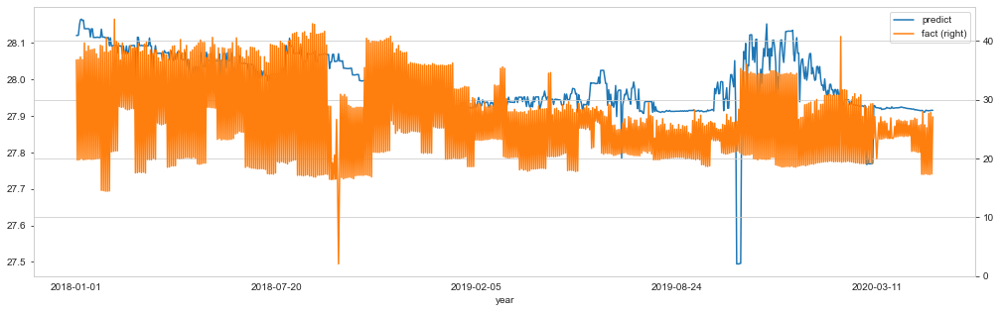

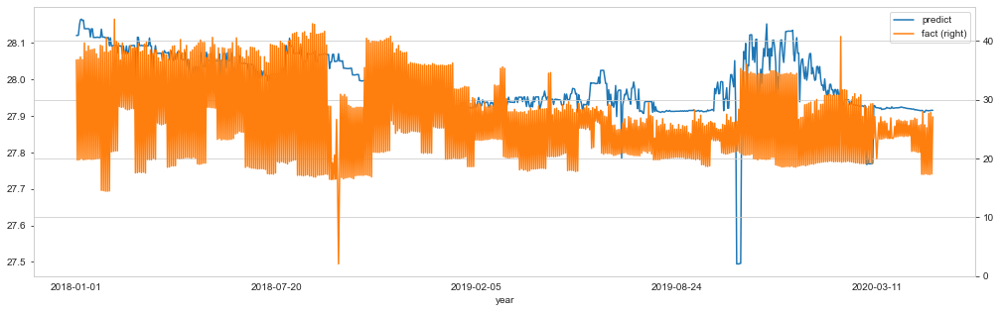

In [137]:
fig, ax = plt.subplots() # Create the figure and axes object

# Plot the first x and y axes:
df.plot(x = 'year', y = 'predict', ax = ax) 
# Plot the second x and y axes. By secondary_y = True a second y-axis is requested:
# (see https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.plot.html for details)
df.plot(x = 'year', y = 'fact', ax = ax, secondary_y = True)

In [77]:
# multivariate mlp example
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate
 
# сэмлы
def split_sequences(sequences, n_steps):
	X, y = list(), list()
	for i in range(len(sequences)):
		# разметка
		end_ix = i + n_steps
		# проверка выхода за пределы
		if end_ix > len(sequences):
			break
		# получение начала и конечной метки
		seq_x, seq_y = sequences[i:end_ix, :-1], sequences[end_ix-1, -1]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
# последовательность
in_seq1 = X_left[0:856]
in_seq2 = X_right[0:856]
out_seq = Y_train[0:856] # array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1), 5,1,1))
in_seq2 = in_seq2.reshape((len(in_seq2), 1,1,1))
out_seq = out_seq.reshape((len(out_seq), 1,1,1))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
n_steps = 20
# convert into input/output
X, y = split_sequences(dataset, n_steps)
# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]
# первая модель
visible1 = Input(shape=(n_steps,1,1,1))
dense1 =  ConvLSTM2D(name ='conv_lstm_1',
                         filters = 64, kernel_size = (10, 1), 
                         padding='same',
                         return_sequences = True)(visible1) #,batch_input_shape=(32,100,1), stateful=True
# вторая модель LSTM
visible2 = Input(shape=(n_steps,1,1,1))
lstm = ConvLSTM2D(name ='conv_lstm_4',
                         filters = 64, kernel_size = (10, 1), 
                         padding='same',
                         return_sequences = True)(visible2)
# слияние
merge = concatenate([dense1, lstm])
output = Dense(1)(merge)
model = Model(inputs=[visible1, visible2], outputs=output)
model.compile(optimizer='adam', loss='mape', metrics=['accuracy'])
# fit model
model.fit([X1, X2], Y_train, epochs=20, verbose=1, batch_size=64, validation_split=0.1)
# demonstrate prediction
#x_input = array([[80, 85], [90, 95], [100, 105]])
#x1 = x_input[:, 0].reshape((1, n_steps))
#x2 = x_input[:, 1].reshape((1, n_steps))
yhat = model.predict([X1, X2], verbose=0)
print(yhat)

Epoch 1/20
12/12 [==============================] - 5s 102ms/step - loss: 100.1930 - accuracy: 0.0000e+00 - val_loss: 65.6955 - val_accuracy: 0.0000e+00
Epoch 2/20
12/12 [==============================] - 1s 62ms/step - loss: 84.6105 - accuracy: 0.0000e+00 - val_loss: 113.1731 - val_accuracy: 0.0000e+00
Epoch 3/20
12/12 [==============================] - 1s 59ms/step - loss: 72.9853 - accuracy: 0.0000e+00 - val_loss: 159.6788 - val_accuracy: 0.0000e+00
Epoch 4/20
12/12 [==============================] - 1s 59ms/step - loss: 61.5773 - accuracy: 0.0000e+00 - val_loss: 212.9600 - val_accuracy: 0.0000e+00
Epoch 5/20
12/12 [==============================] - 1s 57ms/step - loss: 50.3794 - accuracy: 0.0000e+00 - val_loss: 263.7750 - val_accuracy: 0.0000e+00
Epoch 6/20
12/12 [==============================] - 1s 56ms/step - loss: 39.5494 - accuracy: 0.0000e+00 - val_loss: 311.6376 - val_accuracy: 0.0000e+00
Epoch 7/20
12/12 [==============================] - 1s 56ms/step - loss: 32.5680 - accu

In [139]:
yhat = yhat.flatten()
Y_train = Y_train.flatten()
yhat = yhat[0:856]
Y_train = Y_train[0:856]
yhat.shape

(857,)

(857,)

In [140]:
df = pd.DataFrame(data={'year': datadd, 
                        'predict': yhat, 
                        'fact': train_y})


<AxesSubplot:label='4675afdc-8362-437a-916d-de118e6e8b0c'>

<AxesSubplot:label='4675afdc-8362-437a-916d-de118e6e8b0c'>

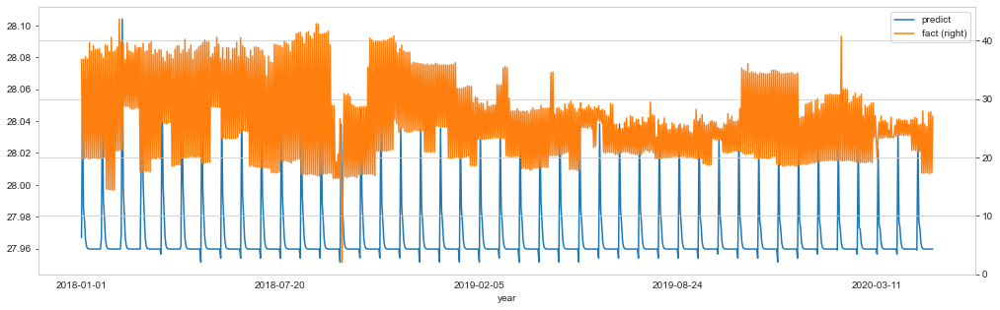

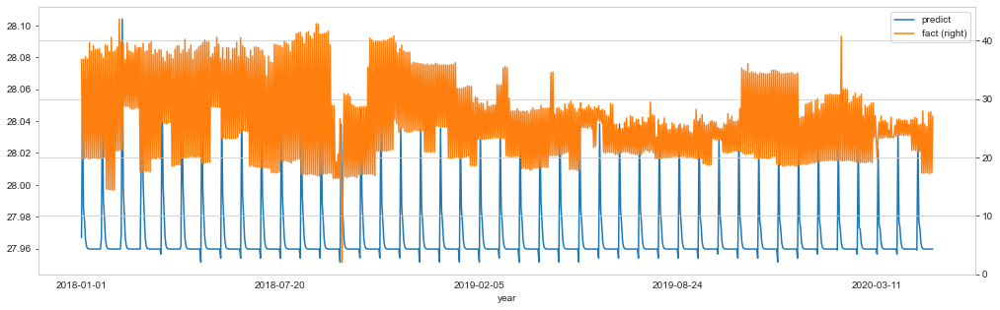

In [141]:
fig, ax = plt.subplots() # Create the figure and axes object

# Plot the first x and y axes:
df.plot(x = 'year', y = 'predict', ax = ax) 
# Plot the second x and y axes. By secondary_y = True a second y-axis is requested:
# (see https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.plot.html for details)
df.plot(x = 'year', y = 'fact', ax = ax, secondary_y = True)

In [20]:
# multivariate mlp example
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate
 
# сэмлы
def split_sequences(sequences, n_steps):
	X, y = list(), list()
	for i in range(len(sequences)):
		# разметка
		end_ix = i + n_steps
		# проверка выхода за пределы
		if end_ix > len(sequences):
			break
		# получение начала и конечной метки
		seq_x, seq_y = sequences[i:end_ix, :-1], sequences[end_ix-1, -1]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
# последовательность
in_seq1 = X_left[0:856]
in_seq2 = X_right[0:856]
out_seq = Y_train[0:856] # array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1), 5,1,1))
in_seq2 = in_seq2.reshape((len(in_seq2), 1,1,1))
out_seq = out_seq.reshape((len(out_seq), 1,1,1))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
n_steps = 20
# convert into input/output
X, y = split_sequences(dataset, n_steps)
# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]
# первая модель
visible1 = Input(shape=(n_steps,1,1,1))
dense1 =  ConvLSTM2D(name ='conv_lstm_1',
                         filters = 64, kernel_size = (10, 10), 
                         padding='same',
                         return_sequences = True)(visible1) #,batch_input_shape=(32,100,1), stateful=True
# вторая модель LSTM
visible2 = Input(shape=(n_steps,1,1,1))
lstm = ConvLSTM2D(name ='conv_lstm_4',
                         filters = 64, kernel_size = (10, 1), 
                         padding='same', kernel_initializer="glorot_uniform",
                         return_sequences = True)(visible2)
# слияние
merge = concatenate([dense1, lstm])
output = Dense(1)(merge)
model = Model(inputs=[visible1, visible2], outputs=output)
model.compile(optimizer='adam', loss='mape', metrics=['accuracy'])
# fit model
model.fit([X1, X2], Y_train, epochs=20, verbose=1, batch_size=100, validation_split=0.1)
# demonstrate prediction
#x_input = array([[80, 85], [90, 95], [100, 105]])
#x1 = x_input[:, 0].reshape((1, n_steps))
#x2 = x_input[:, 1].reshape((1, n_steps))
yhat = model.predict([X1, X2], verbose=0)
print(yhat)

Epoch 1/20
8/8 [==============================] - 8s 545ms/step - loss: 793930.7068 - accuracy: 0.0021 - val_loss: 100.8636 - val_accuracy: 0.0000e+00
Epoch 2/20
8/8 [==============================] - 4s 471ms/step - loss: 69543.8337 - accuracy: 6.2571e-04 - val_loss: 99.7997 - val_accuracy: 0.0000e+00
Epoch 3/20
8/8 [==============================] - 4s 475ms/step - loss: 413644.2413 - accuracy: 0.0053 - val_loss: 101.3671 - val_accuracy: 0.0000e+00
Epoch 4/20
8/8 [==============================] - 4s 471ms/step - loss: 617785.0770 - accuracy: 0.0013 - val_loss: 100.3884 - val_accuracy: 0.0000e+00
Epoch 5/20
8/8 [==============================] - 4s 480ms/step - loss: 646384.3394 - accuracy: 0.0018 - val_loss: 99.1305 - val_accuracy: 0.0000e+00
Epoch 6/20
8/8 [==============================] - 4s 479ms/step - loss: 641174.5361 - accuracy: 0.0032 - val_loss: 101.5415 - val_accuracy: 0.0000e+00
Epoch 7/20
8/8 [==============================] - 4s 480ms/step - loss: 1776742.0833 - accura

In [36]:
datadd.shape

(1231,)

<AxesSubplot:label='6e254a68-1b6e-4d7d-b08b-0ed991fbd099'>

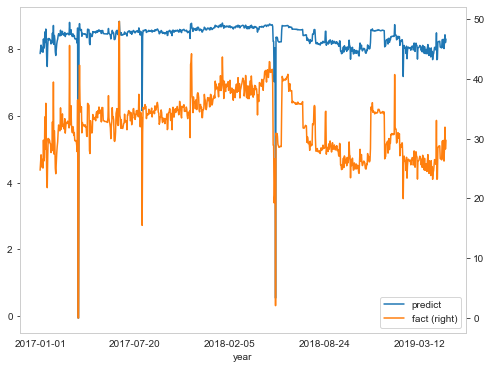

In [37]:
yhat = yhat.flatten()
Y_train = Y_train.flatten()
yhat = yhat[0:856]
Y_tdatadd = data2.index 
Y_train = Y_train[0:856]

datadd = datadd[0:856]



df = pd.DataFrame(data={'year': datadd, 
                        'predict': yhat, 
                        'fact': Y_train})

fig, ax = plt.subplots() # Create the figure and axes object

# Plot the first x and y axes:
df.plot(x = 'year', y = 'predict', ax = ax) 
# Plot the second x and y axes. By secondary_y = True a second y-axis is requested:
# (see https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.plot.html for details)
df.plot(x = 'year', y = 'fact', ax = ax, secondary_y = True)


In [39]:
#from plot_model import plot_model
#plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

#plot_model(model)

# NORTHHHHHHHHHHHHHHHHHHHHHHHHHHHHHHHH

In [194]:
import numpy as np
import pandas as pd


datan = pd.read_csv('df_north.csv')
datan.index = datan['date']
datan = datan.fillna(0)
datan.head()
#datan = data2.drop(['date'], axis=1)

,Unnamed: 0,date,AKSH_227_liq_vol,AKSH_227_wc_vol,AKSH_227_bhp_fluid_level,AKSH_227_bhp_pump_press,AKSH_240_liq_vol,AKSH_240_wc_vol,AKSH_240_bhp_fluid_level,AKSH_240_bhp_pump_press,...,AKSH_225_water_vol,AKSH_225_water_type,AKSH_220_water_vol,AKSH_220_water_type,AKSH_240_water_vol,AKSH_240_water_type,AKSH_217_water_vol,AKSH_217_water_type,AKSH_299_water_vol,AKSH_299_water_type
date,,,,,,,,,,,,,,,,,,,,,
2017-01-01,0,2017-01-01,177.07000,90.021,0.0,0.0,0.0,0.0,0.0,0.0,...,213.0,Артезианская вода,94.0,Артезианская вода,0.0,0,289.0,Артезианская вода,0.0,0
2017-01-02,1,2017-01-02,190.92374,90.014,0.0,0.0,0.0,0.0,0.0,0.0,...,202.0,Артезианская вода,94.0,Артезианская вода,0.0,0,287.0,Артезианская вода,0.0,0
2017-01-03,2,2017-01-03,168.77000,90.004,0.0,0.0,0.0,0.0,0.0,0.0,...,219.0,Артезианская вода,93.0,Артезианская вода,0.0,0,286.0,Артезианская вода,0.0,0
2017-01-04,3,2017-01-04,168.17172,89.975,0.0,0.0,0.0,0.0,0.0,0.0,...,205.0,Артезианская вода,94.0,Артезианская вода,0.0,0,287.0,Артезианская вода,0.0,0
2017-01-05,4,2017-01-05,168.49000,85.999,0.0,0.0,0.0,0.0,0.0,0.0,...,214.0,Артезианская вода,94.0,Артезианская вода,0.0,0,286.0,Артезианская вода,0.0,0


In [195]:
#features_df = features.loc[(features.index >= '2018-01-01')]

In [196]:
datan.head()

,Unnamed: 0,date,AKSH_227_liq_vol,AKSH_227_wc_vol,AKSH_227_bhp_fluid_level,AKSH_227_bhp_pump_press,AKSH_240_liq_vol,AKSH_240_wc_vol,AKSH_240_bhp_fluid_level,AKSH_240_bhp_pump_press,...,AKSH_225_water_vol,AKSH_225_water_type,AKSH_220_water_vol,AKSH_220_water_type,AKSH_240_water_vol,AKSH_240_water_type,AKSH_217_water_vol,AKSH_217_water_type,AKSH_299_water_vol,AKSH_299_water_type
date,,,,,,,,,,,,,,,,,,,,,
2017-01-01,0,2017-01-01,177.07000,90.021,0.0,0.0,0.0,0.0,0.0,0.0,...,213.0,Артезианская вода,94.0,Артезианская вода,0.0,0,289.0,Артезианская вода,0.0,0
2017-01-02,1,2017-01-02,190.92374,90.014,0.0,0.0,0.0,0.0,0.0,0.0,...,202.0,Артезианская вода,94.0,Артезианская вода,0.0,0,287.0,Артезианская вода,0.0,0
2017-01-03,2,2017-01-03,168.77000,90.004,0.0,0.0,0.0,0.0,0.0,0.0,...,219.0,Артезианская вода,93.0,Артезианская вода,0.0,0,286.0,Артезианская вода,0.0,0
2017-01-04,3,2017-01-04,168.17172,89.975,0.0,0.0,0.0,0.0,0.0,0.0,...,205.0,Артезианская вода,94.0,Артезианская вода,0.0,0,287.0,Артезианская вода,0.0,0
2017-01-05,4,2017-01-05,168.49000,85.999,0.0,0.0,0.0,0.0,0.0,0.0,...,214.0,Артезианская вода,94.0,Артезианская вода,0.0,0,286.0,Артезианская вода,0.0,0


In [197]:
features_considered_nort1 = ['AKSH_211_liq_vol','AKSH_344_liq_vol','AKSH_441_liq_vol','AKSH_244_liq_vol','AKSH_228_liq_vol']
target_north = ['AKSH_211_liq_vol','AKSH_344_liq_vol','AKSH_441_liq_vol','AKSH_244_liq_vol','AKSH_228_liq_vol']
features_considered_north2 = ['AKSH_211_bhp_pump_press','AKSH_344_bhp_pump_press','AKSH_441_bhp_pump_press','AKSH_244_bhp_pump_press','AKSH_228_bhp_pump_press']

In [198]:
features2 = ['AKSH_211_liq_vol','AKSH_344_liq_vol','AKSH_441_liq_vol','AKSH_244_liq_vol','AKSH_228_liq_vol']

In [ ]:
features_considered_north1 = ['AKSH_298_liq_vol','AKSH_213_liq_vol','AKSH_203_liq_vol','AKSH_223_liq_vol','AKSH_226_liq_vol']
target_north = ['AKSH_298_liq_vol','AKSH_213_liq_vol','AKSH_203_liq_vol','AKSH_223_liq_vol','AKSH_226_liq_vol']
features_considered_north2 = ['AKSH_298_bhp_pump_press','AKSH_213_bhp_pump_press','AKSH_203_bhp_pump_press','AKSH_223_bhp_pump_press','AKSH_226_bhp_pump_press']

In [203]:
#watervol = ['AKSH_424_water_vol','AKSH_249_water_vol','AKSH_247_water_vol','AKSH_250_water_vol','AKSH_424_water_vol','AKSH_214_water_vol']

In [204]:
#datawv = datan[watervol]

In [201]:
#featuresn = datan[watervol]

In [174]:
#X_right = datan['AKSH_211_bhp_pump_press']
X_right = datan[features_considered_north2]
Y_train = datan['AKSH_211_liq_vol']#,'AKSH_226_liq_vol'] 

In [175]:
X_left = datan[features2]


In [176]:
X_left = np.asarray(X_left)
X_right = np.asarray(X_right) 
Y_train = np.asarray(Y_train) 

In [177]:
# multivariate mlp example
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate
 
# сэмлы
def split_sequences(sequences, n_steps):
	X, y = list(), list()
	for i in range(len(sequences)):
		# разметка
		end_ix = i + n_steps
		# проверка выхода за пределы
		if end_ix > len(sequences):
			break
		# получение начала и конечной метки
		seq_x, seq_y = sequences[i:end_ix, :-1], sequences[end_ix-1, -1]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
# последовательность
in_seq1 = X_left
in_seq2 = X_right

out_seq = Y_train #array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1), 5))
in_seq2 = in_seq2.reshape((len(in_seq2), 5))
out_seq = out_seq.reshape((len(out_seq), 1))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
n_steps = 1
# convert into input/output
X,y = split_sequences(dataset, n_steps)
#y = 
# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]
# первая модель
visible1 = Input(shape=(n_steps,))
dense1 = Dense(100, activation='relu')(visible1)
# вторая модель
visible2 = Input(shape=(n_steps,))
dense2 = Dense(100, activation='relu')(visible2)
# слияние
merge = concatenate([dense1, dense2])
output = Dense(1)(merge)
model = Model(inputs=[visible1, visible2], outputs=output)
model.compile(optimizer='adam', loss='mse', metrics=['accuracy'])
# fit model
model.fit([X1, X2], Y_train, epochs=2000, verbose= 1, batch_size=64, validation_split=0.1)
# demonstrate prediction
#x_input = array([[80, 85], [90, 95], [100, 105]])
#x1 = x_input[:, 0].reshape((1, n_steps))
#x2 = x_input[:, 1].reshape((1, n_steps))
yhat = model.predict([X1, X2], verbose=0)
print(yhat)

Epoch 1/2000
18/18 [==============================] - 1s 15ms/step - loss: 499.1560 - accuracy: 0.0000e+00 - val_loss: 129.0632 - val_accuracy: 0.0000e+00
Epoch 2/2000
18/18 [==============================] - 0s 3ms/step - loss: 129.6193 - accuracy: 0.0000e+00 - val_loss: 31.0451 - val_accuracy: 0.0000e+00
Epoch 3/2000
18/18 [==============================] - 0s 3ms/step - loss: 108.8385 - accuracy: 0.0000e+00 - val_loss: 43.1465 - val_accuracy: 0.0000e+00
Epoch 4/2000
18/18 [==============================] - 0s 4ms/step - loss: 86.5689 - accuracy: 0.0000e+00 - val_loss: 39.9280 - val_accuracy: 0.0000e+00
Epoch 5/2000
18/18 [==============================] - 0s 3ms/step - loss: 65.4343 - accuracy: 0.0000e+00 - val_loss: 23.8698 - val_accuracy: 0.0000e+00
Epoch 6/2000
18/18 [==============================] - 0s 3ms/step - loss: 49.1038 - accuracy: 0.0000e+00 - val_loss: 18.8450 - val_accuracy: 0.0000e+00
Epoch 7/2000
18/18 [==============================] - 0s 3ms/step - loss: 35.9616 -

18/18 [==============================] - 0s 3ms/step - loss: 0.0061 - accuracy: 0.0031 - val_loss: 0.0030 - val_accuracy: 0.0000e+00
Epoch 111/2000
18/18 [==============================] - 0s 3ms/step - loss: 0.0063 - accuracy: 0.0041 - val_loss: 0.0032 - val_accuracy: 0.0000e+00
Epoch 112/2000
18/18 [==============================] - 0s 3ms/step - loss: 0.0059 - accuracy: 0.0013 - val_loss: 0.0026 - val_accuracy: 0.0000e+00
Epoch 113/2000
18/18 [==============================] - 0s 3ms/step - loss: 0.0054 - accuracy: 0.0014 - val_loss: 0.0026 - val_accuracy: 0.0000e+00
Epoch 114/2000
18/18 [==============================] - 0s 3ms/step - loss: 0.0054 - accuracy: 4.5189e-04 - val_loss: 0.0025 - val_accuracy: 0.0000e+00
Epoch 115/2000
18/18 [==============================] - 0s 3ms/step - loss: 0.0055 - accuracy: 0.0050 - val_loss: 0.0024 - val_accuracy: 0.0000e+00
Epoch 116/2000
18/18 [==============================] - 0s 3ms/step - loss: 0.0052 - accuracy: 9.3485e-04 - val_loss: 0.002

Epoch 165/2000
18/18 [==============================] - 0s 3ms/step - loss: 0.0018 - accuracy: 0.0038 - val_loss: 7.8141e-04 - val_accuracy: 0.0000e+00
Epoch 166/2000
18/18 [==============================] - 0s 3ms/step - loss: 0.0017 - accuracy: 0.0016 - val_loss: 7.8398e-04 - val_accuracy: 0.0000e+00
Epoch 167/2000
18/18 [==============================] - 0s 3ms/step - loss: 0.0015 - accuracy: 0.0011 - val_loss: 7.1385e-04 - val_accuracy: 0.0000e+00
Epoch 168/2000
18/18 [==============================] - 0s 3ms/step - loss: 0.0016 - accuracy: 0.0034 - val_loss: 6.7519e-04 - val_accuracy: 0.0000e+00
Epoch 169/2000
18/18 [==============================] - 0s 3ms/step - loss: 0.0014 - accuracy: 0.0012 - val_loss: 6.8785e-04 - val_accuracy: 0.0000e+00
Epoch 170/2000
18/18 [==============================] - 0s 3ms/step - loss: 0.0015 - accuracy: 0.0016 - val_loss: 6.8004e-04 - val_accuracy: 0.0000e+00
Epoch 171/2000
18/18 [==============================] - 0s 3ms/step - loss: 0.0015 - acc

Epoch 218/2000
18/18 [==============================] - 0s 3ms/step - loss: 2.2737e-04 - accuracy: 0.0019 - val_loss: 9.0276e-05 - val_accuracy: 0.0000e+00
Epoch 219/2000
18/18 [==============================] - 0s 3ms/step - loss: 2.2987e-04 - accuracy: 0.0018 - val_loss: 8.5510e-05 - val_accuracy: 0.0000e+00
Epoch 220/2000
18/18 [==============================] - 0s 3ms/step - loss: 2.2125e-04 - accuracy: 0.0023 - val_loss: 8.2449e-05 - val_accuracy: 0.0000e+00
Epoch 221/2000
18/18 [==============================] - 0s 3ms/step - loss: 1.9495e-04 - accuracy: 0.0016 - val_loss: 9.8658e-05 - val_accuracy: 0.0000e+00
Epoch 222/2000
18/18 [==============================] - 0s 3ms/step - loss: 1.9282e-04 - accuracy: 0.0018 - val_loss: 7.4672e-05 - val_accuracy: 0.0000e+00
Epoch 223/2000
18/18 [==============================] - 0s 3ms/step - loss: 1.8582e-04 - accuracy: 0.0021 - val_loss: 7.3422e-05 - val_accuracy: 0.0000e+00
Epoch 224/2000
18/18 [==============================] - 0s 3ms/s

Epoch 270/2000
18/18 [==============================] - 0s 3ms/step - loss: 2.0357e-05 - accuracy: 0.0022 - val_loss: 4.1269e-06 - val_accuracy: 0.0000e+00
Epoch 271/2000
18/18 [==============================] - 0s 3ms/step - loss: 1.4345e-05 - accuracy: 0.0013 - val_loss: 2.4790e-06 - val_accuracy: 0.0000e+00
Epoch 272/2000
18/18 [==============================] - 0s 3ms/step - loss: 1.8289e-05 - accuracy: 0.0021 - val_loss: 1.8869e-06 - val_accuracy: 0.0000e+00
Epoch 273/2000
18/18 [==============================] - 0s 3ms/step - loss: 1.0080e-05 - accuracy: 7.6466e-04 - val_loss: 2.8421e-06 - val_accuracy: 0.0000e+00
Epoch 274/2000
18/18 [==============================] - 0s 3ms/step - loss: 1.2922e-05 - accuracy: 0.0013 - val_loss: 1.9417e-06 - val_accuracy: 0.0000e+00
Epoch 275/2000
18/18 [==============================] - 0s 3ms/step - loss: 1.3436e-05 - accuracy: 0.0013 - val_loss: 1.7498e-06 - val_accuracy: 0.0000e+00
Epoch 276/2000
18/18 [==============================] - 0s 3

18/18 [==============================] - 0s 3ms/step - loss: 1.6450e-05 - accuracy: 0.0031 - val_loss: 3.2925e-06 - val_accuracy: 0.0000e+00
Epoch 375/2000
18/18 [==============================] - 0s 3ms/step - loss: 1.1730e-05 - accuracy: 0.0018 - val_loss: 8.2036e-07 - val_accuracy: 0.0000e+00
Epoch 376/2000
18/18 [==============================] - 0s 3ms/step - loss: 8.4547e-06 - accuracy: 0.0016 - val_loss: 2.1474e-07 - val_accuracy: 0.0000e+00
Epoch 377/2000
18/18 [==============================] - 0s 3ms/step - loss: 1.8021e-05 - accuracy: 0.0037 - val_loss: 1.4520e-06 - val_accuracy: 0.0000e+00
Epoch 378/2000
18/18 [==============================] - 0s 3ms/step - loss: 8.6088e-06 - accuracy: 0.0015 - val_loss: 8.5504e-08 - val_accuracy: 0.0000e+00
Epoch 379/2000
18/18 [==============================] - 0s 3ms/step - loss: 8.3824e-06 - accuracy: 0.0018 - val_loss: 3.6224e-07 - val_accuracy: 0.0000e+00
Epoch 380/2000
18/18 [==============================] - 0s 3ms/step - loss: 5.5

18/18 [==============================] - 0s 3ms/step - loss: 2.4838e-05 - accuracy: 7.4864e-04 - val_loss: 6.6091e-05 - val_accuracy: 0.0000e+00
Epoch 479/2000
18/18 [==============================] - 0s 3ms/step - loss: 3.2122e-05 - accuracy: 0.0014 - val_loss: 7.8198e-06 - val_accuracy: 0.0000e+00
Epoch 480/2000
18/18 [==============================] - 0s 3ms/step - loss: 2.2295e-05 - accuracy: 0.0026 - val_loss: 4.4796e-07 - val_accuracy: 0.0000e+00
Epoch 481/2000
18/18 [==============================] - 0s 3ms/step - loss: 2.2357e-06 - accuracy: 4.4455e-04 - val_loss: 7.0712e-06 - val_accuracy: 0.0000e+00
Epoch 482/2000
18/18 [==============================] - 0s 3ms/step - loss: 3.6820e-05 - accuracy: 0.0014 - val_loss: 8.7034e-06 - val_accuracy: 0.0000e+00
Epoch 483/2000
18/18 [==============================] - 0s 3ms/step - loss: 8.8475e-05 - accuracy: 6.9230e-04 - val_loss: 1.2850e-06 - val_accuracy: 0.0000e+00
Epoch 484/2000
18/18 [==============================] - 0s 3ms/step

Epoch 531/2000
18/18 [==============================] - 0s 3ms/step - loss: 9.8198e-04 - accuracy: 6.2137e-04 - val_loss: 4.7223e-05 - val_accuracy: 0.0000e+00
Epoch 532/2000
18/18 [==============================] - 0s 3ms/step - loss: 9.4524e-04 - accuracy: 0.0013 - val_loss: 6.3473e-04 - val_accuracy: 0.0000e+00
Epoch 533/2000
18/18 [==============================] - 0s 3ms/step - loss: 5.5634e-04 - accuracy: 8.8345e-04 - val_loss: 4.5542e-06 - val_accuracy: 0.0000e+00
Epoch 534/2000
18/18 [==============================] - 0s 3ms/step - loss: 3.4171e-05 - accuracy: 7.6466e-04 - val_loss: 2.8107e-06 - val_accuracy: 0.0000e+00
Epoch 535/2000
18/18 [==============================] - 0s 3ms/step - loss: 1.4243e-05 - accuracy: 5.1515e-04 - val_loss: 6.5099e-05 - val_accuracy: 0.0000e+00
Epoch 536/2000
18/18 [==============================] - 0s 3ms/step - loss: 1.2461e-04 - accuracy: 0.0031 - val_loss: 9.1878e-05 - val_accuracy: 0.0000e+00
Epoch 537/2000
18/18 [==========================

18/18 [==============================] - 0s 3ms/step - loss: 5.0746e-04 - accuracy: 0.0018 - val_loss: 1.1594e-04 - val_accuracy: 0.0000e+00
Epoch 636/2000
18/18 [==============================] - 0s 3ms/step - loss: 1.6361e-04 - accuracy: 0.0024 - val_loss: 2.3623e-07 - val_accuracy: 0.0000e+00
Epoch 637/2000
18/18 [==============================] - 0s 3ms/step - loss: 2.9216e-05 - accuracy: 0.0050 - val_loss: 4.5159e-04 - val_accuracy: 0.0000e+00
Epoch 638/2000
18/18 [==============================] - 0s 3ms/step - loss: 8.0142e-04 - accuracy: 0.0027 - val_loss: 0.0023 - val_accuracy: 0.0000e+00
Epoch 639/2000
18/18 [==============================] - 0s 3ms/step - loss: 0.0023 - accuracy: 0.0011 - val_loss: 4.1947e-04 - val_accuracy: 0.0000e+00
Epoch 640/2000
18/18 [==============================] - 0s 3ms/step - loss: 0.0246 - accuracy: 0.0041 - val_loss: 0.0103 - val_accuracy: 0.0000e+00
Epoch 641/2000
18/18 [==============================] - 0s 3ms/step - loss: 0.0094 - accuracy: 

Epoch 688/2000
18/18 [==============================] - 0s 3ms/step - loss: 1.0069e-04 - accuracy: 0.0018 - val_loss: 2.3496e-05 - val_accuracy: 0.0000e+00
Epoch 689/2000
18/18 [==============================] - 0s 3ms/step - loss: 5.6358e-04 - accuracy: 6.9230e-04 - val_loss: 6.1982e-05 - val_accuracy: 0.0000e+00
Epoch 690/2000
18/18 [==============================] - 0s 3ms/step - loss: 7.7451e-05 - accuracy: 0.0025 - val_loss: 2.3503e-04 - val_accuracy: 0.0000e+00
Epoch 691/2000
18/18 [==============================] - 0s 3ms/step - loss: 1.1036e-04 - accuracy: 6.2137e-04 - val_loss: 0.0010 - val_accuracy: 0.0000e+00
Epoch 692/2000
18/18 [==============================] - 0s 3ms/step - loss: 0.0011 - accuracy: 3.3832e-04 - val_loss: 3.7643e-05 - val_accuracy: 0.0000e+00
Epoch 693/2000
18/18 [==============================] - 0s 3ms/step - loss: 9.8505e-04 - accuracy: 0.0022 - val_loss: 0.0016 - val_accuracy: 0.0000e+00
Epoch 694/2000
18/18 [==============================] - 0s 3ms/s

18/18 [==============================] - 0s 3ms/step - loss: 0.0017 - accuracy: 0.0021 - val_loss: 0.0026 - val_accuracy: 0.0000e+00
Epoch 793/2000
18/18 [==============================] - 0s 3ms/step - loss: 0.0015 - accuracy: 0.0041 - val_loss: 5.1004e-05 - val_accuracy: 0.0000e+00
Epoch 794/2000
18/18 [==============================] - 0s 3ms/step - loss: 1.6261e-04 - accuracy: 8.8345e-04 - val_loss: 7.4256e-05 - val_accuracy: 0.0000e+00
Epoch 795/2000
18/18 [==============================] - 0s 3ms/step - loss: 8.6971e-05 - accuracy: 0.0010 - val_loss: 2.5220e-06 - val_accuracy: 0.0000e+00
Epoch 796/2000
18/18 [==============================] - 0s 3ms/step - loss: 2.9138e-05 - accuracy: 0.0017 - val_loss: 2.4569e-04 - val_accuracy: 0.0000e+00
Epoch 797/2000
18/18 [==============================] - 0s 3ms/step - loss: 1.9239e-04 - accuracy: 0.0012 - val_loss: 2.3265e-04 - val_accuracy: 0.0000e+00
Epoch 798/2000
18/18 [==============================] - 0s 3ms/step - loss: 2.0502e-04 

18/18 [==============================] - 0s 3ms/step - loss: 1.1739e-05 - accuracy: 0.0036 - val_loss: 4.7281e-06 - val_accuracy: 0.0000e+00
Epoch 845/2000
18/18 [==============================] - 0s 3ms/step - loss: 6.0641e-06 - accuracy: 0.0013 - val_loss: 6.0341e-05 - val_accuracy: 0.0000e+00
Epoch 846/2000
18/18 [==============================] - 0s 3ms/step - loss: 6.3964e-05 - accuracy: 3.3832e-04 - val_loss: 3.2207e-05 - val_accuracy: 0.0000e+00
Epoch 847/2000
18/18 [==============================] - 0s 3ms/step - loss: 2.3008e-05 - accuracy: 0.0027 - val_loss: 1.0409e-06 - val_accuracy: 0.0000e+00
Epoch 848/2000
18/18 [==============================] - 0s 3ms/step - loss: 1.2819e-05 - accuracy: 5.3530e-04 - val_loss: 1.6332e-05 - val_accuracy: 0.0000e+00
Epoch 849/2000
18/18 [==============================] - 0s 3ms/step - loss: 2.6216e-05 - accuracy: 0.0019 - val_loss: 2.1977e-06 - val_accuracy: 0.0000e+00
Epoch 850/2000
18/18 [==============================] - 0s 3ms/step - l

Epoch 949/2000
18/18 [==============================] - 0s 3ms/step - loss: 5.0598e-06 - accuracy: 0.0035 - val_loss: 2.2382e-07 - val_accuracy: 0.0000e+00
Epoch 950/2000
18/18 [==============================] - 0s 3ms/step - loss: 2.7131e-06 - accuracy: 0.0015 - val_loss: 2.3028e-06 - val_accuracy: 0.0000e+00
Epoch 951/2000
18/18 [==============================] - 0s 3ms/step - loss: 2.0683e-06 - accuracy: 3.9315e-04 - val_loss: 5.0949e-06 - val_accuracy: 0.0000e+00
Epoch 952/2000
18/18 [==============================] - 0s 3ms/step - loss: 4.1072e-06 - accuracy: 0.0026 - val_loss: 3.6387e-07 - val_accuracy: 0.0000e+00
Epoch 953/2000
18/18 [==============================] - 0s 3ms/step - loss: 2.8963e-06 - accuracy: 0.0020 - val_loss: 1.2917e-07 - val_accuracy: 0.0000e+00
Epoch 954/2000
18/18 [==============================] - 0s 3ms/step - loss: 2.7271e-06 - accuracy: 0.0011 - val_loss: 3.5628e-07 - val_accuracy: 0.0000e+00
Epoch 955/2000
18/18 [==============================] - 0s 3

18/18 [==============================] - 0s 3ms/step - loss: 8.3777e-06 - accuracy: 0.0020 - val_loss: 2.0014e-05 - val_accuracy: 0.0000e+00
Epoch 1054/2000
18/18 [==============================] - 0s 3ms/step - loss: 1.8158e-05 - accuracy: 8.8647e-04 - val_loss: 1.2264e-06 - val_accuracy: 0.0000e+00
Epoch 1055/2000
18/18 [==============================] - 0s 3ms/step - loss: 3.6727e-06 - accuracy: 0.0017 - val_loss: 2.0372e-06 - val_accuracy: 0.0000e+00
Epoch 1056/2000
18/18 [==============================] - 0s 3ms/step - loss: 4.1752e-06 - accuracy: 0.0016 - val_loss: 3.5859e-07 - val_accuracy: 0.0000e+00
Epoch 1057/2000
18/18 [==============================] - 0s 3ms/step - loss: 2.3514e-06 - accuracy: 7.4068e-04 - val_loss: 1.2964e-07 - val_accuracy: 0.0000e+00
Epoch 1058/2000
18/18 [==============================] - 0s 3ms/step - loss: 1.2883e-06 - accuracy: 8.1190e-04 - val_loss: 2.4892e-08 - val_accuracy: 0.0000e+00
Epoch 1059/2000
18/18 [==============================] - 0s 3m

18/18 [==============================] - 0s 3ms/step - loss: 3.8464e-05 - accuracy: 0.0031 - val_loss: 5.2597e-04 - val_accuracy: 0.0000e+00
Epoch 1158/2000
18/18 [==============================] - 0s 3ms/step - loss: 6.3439e-04 - accuracy: 0.0021 - val_loss: 0.0076 - val_accuracy: 0.0000e+00
Epoch 1159/2000
18/18 [==============================] - 0s 3ms/step - loss: 0.0168 - accuracy: 0.0017 - val_loss: 0.0015 - val_accuracy: 0.0000e+00
Epoch 1160/2000
18/18 [==============================] - 0s 3ms/step - loss: 0.0026 - accuracy: 0.0038 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 1161/2000
18/18 [==============================] - 0s 3ms/step - loss: 0.0022 - accuracy: 0.0032 - val_loss: 4.9957e-04 - val_accuracy: 0.0000e+00
Epoch 1162/2000
18/18 [==============================] - 0s 3ms/step - loss: 3.5142e-04 - accuracy: 0.0037 - val_loss: 1.5582e-04 - val_accuracy: 0.0000e+00
Epoch 1163/2000
18/18 [==============================] - 0s 3ms/step - loss: 4.2835e-04 - accuracy

18/18 [==============================] - 0s 3ms/step - loss: 5.5688e-06 - accuracy: 9.3827e-04 - val_loss: 1.3274e-06 - val_accuracy: 0.0000e+00
Epoch 1262/2000
18/18 [==============================] - 0s 3ms/step - loss: 4.8547e-06 - accuracy: 0.0031 - val_loss: 1.9684e-06 - val_accuracy: 0.0000e+00
Epoch 1263/2000
18/18 [==============================] - 0s 3ms/step - loss: 2.4885e-06 - accuracy: 7.4068e-04 - val_loss: 8.6484e-06 - val_accuracy: 0.0000e+00
Epoch 1264/2000
18/18 [==============================] - 0s 3ms/step - loss: 6.0979e-06 - accuracy: 0.0037 - val_loss: 5.9209e-07 - val_accuracy: 0.0000e+00
Epoch 1265/2000
18/18 [==============================] - 0s 3ms/step - loss: 7.2842e-06 - accuracy: 0.0023 - val_loss: 1.7737e-05 - val_accuracy: 0.0000e+00
Epoch 1266/2000
18/18 [==============================] - 0s 3ms/step - loss: 3.3936e-05 - accuracy: 0.0021 - val_loss: 3.6266e-07 - val_accuracy: 0.0000e+00
Epoch 1267/2000
18/18 [==============================] - 0s 3ms/st

18/18 [==============================] - 0s 3ms/step - loss: 2.1089e-05 - accuracy: 0.0024 - val_loss: 2.5064e-06 - val_accuracy: 0.0000e+00
Epoch 1366/2000
18/18 [==============================] - 0s 3ms/step - loss: 5.9955e-06 - accuracy: 0.0026 - val_loss: 1.0799e-06 - val_accuracy: 0.0000e+00
Epoch 1367/2000
18/18 [==============================] - 0s 3ms/step - loss: 2.3806e-06 - accuracy: 0.0014 - val_loss: 8.4549e-07 - val_accuracy: 0.0000e+00
Epoch 1368/2000
18/18 [==============================] - 0s 3ms/step - loss: 3.4932e-06 - accuracy: 0.0013 - val_loss: 2.2526e-06 - val_accuracy: 0.0000e+00
Epoch 1369/2000
18/18 [==============================] - 0s 3ms/step - loss: 2.0732e-06 - accuracy: 7.4864e-04 - val_loss: 2.4230e-07 - val_accuracy: 0.0000e+00
Epoch 1370/2000
18/18 [==============================] - 0s 3ms/step - loss: 1.5006e-06 - accuracy: 0.0011 - val_loss: 4.1140e-07 - val_accuracy: 0.0000e+00
Epoch 1371/2000
18/18 [==============================] - 0s 3ms/step -

18/18 [==============================] - 0s 3ms/step - loss: 9.4819e-04 - accuracy: 0.0014 - val_loss: 6.4342e-04 - val_accuracy: 0.0000e+00
Epoch 1470/2000
18/18 [==============================] - 0s 3ms/step - loss: 3.7126e-04 - accuracy: 0.0031 - val_loss: 2.8828e-06 - val_accuracy: 0.0000e+00
Epoch 1471/2000
18/18 [==============================] - 0s 3ms/step - loss: 5.5010e-06 - accuracy: 3.9315e-04 - val_loss: 6.2606e-06 - val_accuracy: 0.0000e+00
Epoch 1472/2000
18/18 [==============================] - 0s 3ms/step - loss: 7.9041e-06 - accuracy: 0.0026 - val_loss: 2.5004e-07 - val_accuracy: 0.0000e+00
Epoch 1473/2000
18/18 [==============================] - 0s 3ms/step - loss: 1.7226e-06 - accuracy: 0.0017 - val_loss: 1.0914e-07 - val_accuracy: 0.0000e+00
Epoch 1474/2000
18/18 [==============================] - 0s 3ms/step - loss: 8.3741e-07 - accuracy: 0.0011 - val_loss: 1.1222e-06 - val_accuracy: 0.0000e+00
Epoch 1475/2000
18/18 [==============================] - 0s 3ms/step -

18/18 [==============================] - 0s 3ms/step - loss: 6.9976e-05 - accuracy: 0.0032 - val_loss: 3.1917e-06 - val_accuracy: 0.0000e+00
Epoch 1574/2000
18/18 [==============================] - 0s 3ms/step - loss: 4.1220e-05 - accuracy: 0.0025 - val_loss: 7.6597e-04 - val_accuracy: 0.0000e+00
Epoch 1575/2000
18/18 [==============================] - 0s 3ms/step - loss: 5.7070e-04 - accuracy: 4.4455e-04 - val_loss: 4.6022e-04 - val_accuracy: 0.0000e+00
Epoch 1576/2000
18/18 [==============================] - 0s 3ms/step - loss: 5.0684e-04 - accuracy: 8.1190e-04 - val_loss: 2.3163e-04 - val_accuracy: 0.0000e+00
Epoch 1577/2000
18/18 [==============================] - 0s 3ms/step - loss: 4.4690e-04 - accuracy: 0.0023 - val_loss: 1.1729e-05 - val_accuracy: 0.0000e+00
Epoch 1578/2000
18/18 [==============================] - 0s 3ms/step - loss: 7.4878e-05 - accuracy: 0.0037 - val_loss: 1.5282e-04 - val_accuracy: 0.0000e+00
Epoch 1579/2000
18/18 [==============================] - 0s 3ms/st

18/18 [==============================] - 0s 3ms/step - loss: 0.0186 - accuracy: 0.0024 - val_loss: 0.0060 - val_accuracy: 0.0000e+00
Epoch 1678/2000
18/18 [==============================] - 0s 3ms/step - loss: 0.0080 - accuracy: 7.9208e-04 - val_loss: 0.0013 - val_accuracy: 0.0000e+00
Epoch 1679/2000
18/18 [==============================] - 0s 3ms/step - loss: 8.1364e-04 - accuracy: 0.0041 - val_loss: 1.5991e-05 - val_accuracy: 0.0000e+00
Epoch 1680/2000
18/18 [==============================] - 0s 3ms/step - loss: 1.9549e-05 - accuracy: 0.0012 - val_loss: 1.1315e-05 - val_accuracy: 0.0000e+00
Epoch 1681/2000
18/18 [==============================] - 0s 3ms/step - loss: 8.5746e-06 - accuracy: 0.0046 - val_loss: 8.3820e-07 - val_accuracy: 0.0000e+00
Epoch 1682/2000
18/18 [==============================] - 0s 3ms/step - loss: 1.0172e-06 - accuracy: 6.8011e-04 - val_loss: 8.1601e-07 - val_accuracy: 0.0000e+00
Epoch 1683/2000
18/18 [==============================] - 0s 3ms/step - loss: 2.619

18/18 [==============================] - 0s 3ms/step - loss: 3.2448e-06 - accuracy: 0.0026 - val_loss: 1.6165e-05 - val_accuracy: 0.0000e+00
Epoch 1782/2000
18/18 [==============================] - 0s 3ms/step - loss: 1.0812e-04 - accuracy: 0.0011 - val_loss: 3.9770e-06 - val_accuracy: 0.0000e+00
Epoch 1783/2000
18/18 [==============================] - 0s 3ms/step - loss: 0.0064 - accuracy: 9.5519e-04 - val_loss: 0.0256 - val_accuracy: 0.0000e+00
Epoch 1784/2000
18/18 [==============================] - 0s 3ms/step - loss: 0.0191 - accuracy: 0.0017 - val_loss: 5.2204e-04 - val_accuracy: 0.0000e+00
Epoch 1785/2000
18/18 [==============================] - 0s 3ms/step - loss: 0.0035 - accuracy: 0.0041 - val_loss: 3.4393e-04 - val_accuracy: 0.0000e+00
Epoch 1786/2000
18/18 [==============================] - 0s 3ms/step - loss: 4.2604e-04 - accuracy: 0.0020 - val_loss: 1.3939e-04 - val_accuracy: 0.0000e+00
Epoch 1787/2000
18/18 [==============================] - 0s 3ms/step - loss: 8.8091e-0

18/18 [==============================] - 0s 3ms/step - loss: 3.1510e-06 - accuracy: 7.6466e-04 - val_loss: 2.8985e-07 - val_accuracy: 0.0000e+00
Epoch 1886/2000
18/18 [==============================] - 0s 3ms/step - loss: 9.2183e-07 - accuracy: 9.3485e-04 - val_loss: 2.7211e-06 - val_accuracy: 0.0000e+00
Epoch 1887/2000
18/18 [==============================] - 0s 3ms/step - loss: 2.2882e-06 - accuracy: 0.0019 - val_loss: 2.2045e-07 - val_accuracy: 0.0000e+00
Epoch 1888/2000
18/18 [==============================] - 0s 3ms/step - loss: 5.9931e-07 - accuracy: 5.1515e-04 - val_loss: 9.3898e-08 - val_accuracy: 0.0000e+00
Epoch 1889/2000
18/18 [==============================] - 0s 3ms/step - loss: 2.0413e-06 - accuracy: 0.0033 - val_loss: 9.4410e-07 - val_accuracy: 0.0000e+00
Epoch 1890/2000
18/18 [==============================] - 0s 3ms/step - loss: 2.0796e-06 - accuracy: 0.0013 - val_loss: 1.0454e-07 - val_accuracy: 0.0000e+00
Epoch 1891/2000
18/18 [==============================] - 0s 3m

18/18 [==============================] - 0s 3ms/step - loss: 1.0283e-05 - accuracy: 0.0012 - val_loss: 9.9203e-07 - val_accuracy: 0.0000e+00
Epoch 1990/2000
18/18 [==============================] - 0s 3ms/step - loss: 3.3033e-06 - accuracy: 0.0011 - val_loss: 4.5524e-07 - val_accuracy: 0.0000e+00
Epoch 1991/2000
18/18 [==============================] - 0s 3ms/step - loss: 2.3795e-06 - accuracy: 0.0017 - val_loss: 1.1946e-06 - val_accuracy: 0.0000e+00
Epoch 1992/2000
18/18 [==============================] - 0s 3ms/step - loss: 2.8498e-06 - accuracy: 7.8368e-04 - val_loss: 6.4105e-07 - val_accuracy: 0.0000e+00
Epoch 1993/2000
18/18 [==============================] - 0s 3ms/step - loss: 2.9054e-06 - accuracy: 0.0010 - val_loss: 1.3829e-06 - val_accuracy: 0.0000e+00
Epoch 1994/2000
18/18 [==============================] - 0s 3ms/step - loss: 2.5289e-06 - accuracy: 9.6890e-04 - val_loss: 1.2834e-06 - val_accuracy: 0.0000e+00
Epoch 1995/2000
18/18 [==============================] - 0s 3ms/st

# NNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNN

In [99]:
datadd = datan.index

In [100]:
yhat = yhat.flatten() 
y = y.flatten() 

In [101]:
yhat.shape

(1231,)

In [102]:
import pandas as pd

df = pd.DataFrame(data={'year': datadd, 
                        'predict': yhat, 
                        'fact': Y_train})

<AxesSubplot:label='14178511-95b8-459b-8ec9-2777b31a1309'>

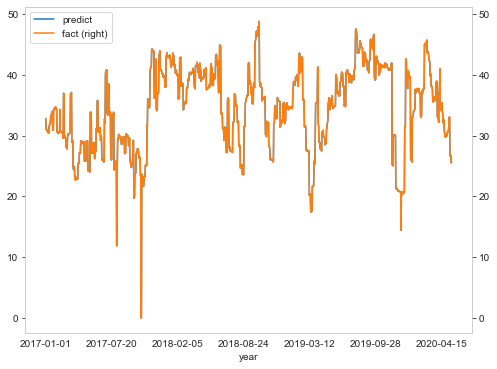

In [103]:
import matplotlib.pyplot as plt # Impot the relevant module

fig, ax = plt.subplots() # Create the figure and axes object

# Plot the first x and y axes:
df.plot(x = 'year', y = 'predict', ax = ax) 
# Plot the second x and y axes. By secondary_y = True a second y-axis is requested:
# (see https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.plot.html for details)
df.plot(x = 'year', y = 'fact', ax = ax, secondary_y = True)

In [104]:
#Y = ['AKSH_298_liq_vol']

In [105]:
# multivariate mlp example
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate
 
# сэмлы
def split_sequences(sequences, n_steps):
	X, y = list(), list()
	for i in range(len(sequences)):
		# разметка
		end_ix = i + n_steps
		# проверка выхода за пределы
		if end_ix > len(sequences):
			break
		# получение начала и конечной метки
		seq_x, seq_y = sequences[i:end_ix, :-1], sequences[end_ix-1, -1]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
# последовательность
in_seq1 = X_left
in_seq2 = X_right
out_seq = Y_train# array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1), 5))
in_seq2 = in_seq2.reshape((len(in_seq2), 5))
out_seq = out_seq.reshape((len(out_seq), 1))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
n_steps = 20
# convert into input/output
X, y = split_sequences(dataset, n_steps)
# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]
# первая модель
visible1 = Input(shape=(n_steps,))
dense1 = Dense(100, activation='relu')(visible1)
# вторая модель LSTM
visible2 = Input(shape=(n_steps,1))
lstm = LSTM(100, input_shape =(100,1))(visible2)
# слияние
merge = concatenate([dense1, lstm])
output = Dense(1)(merge)
model = Model(inputs=[visible1, visible2], outputs=output)
model.compile(optimizer='adam', loss='mape', metrics=['accuracy'])
# fit model
model.fit([X1, X2], y, epochs=2000, verbose=1, batch_size=64, validation_split=0.1)
# demonstrate prediction
#x_input = array([[80, 85], [90, 95], [100, 105]])
#x1 = x_input[:, 0].reshape((1, n_steps))
#x2 = x_input[:, 1].reshape((1, n_steps))
yhat = model.predict([X1, X2], verbose=0)
print(yhat)

Epoch 1/2000
18/18 [==============================] - 3s 70ms/step - loss: 7069905.2819 - accuracy: 0.0000e+00 - val_loss: 127.7220 - val_accuracy: 0.0000e+00
Epoch 2/2000
18/18 [==============================] - 0s 13ms/step - loss: 20356942.4010 - accuracy: 0.0033 - val_loss: 89.5333 - val_accuracy: 0.0000e+00
Epoch 3/2000
18/18 [==============================] - 0s 13ms/step - loss: 2094962.0348 - accuracy: 2.5117e-04 - val_loss: 87.7148 - val_accuracy: 0.0000e+00
Epoch 4/2000
18/18 [==============================] - 0s 13ms/step - loss: 8639956.6842 - accuracy: 0.0021 - val_loss: 65.8382 - val_accuracy: 0.0000e+00
Epoch 5/2000
18/18 [==============================] - 0s 14ms/step - loss: 6222696.7339 - accuracy: 0.0000e+00 - val_loss: 94.4958 - val_accuracy: 0.0000e+00
Epoch 6/2000
18/18 [==============================] - 0s 14ms/step - loss: 11876389.1567 - accuracy: 0.0016 - val_loss: 75.2667 - val_accuracy: 0.0000e+00
Epoch 7/2000
18/18 [==============================] - 0s 13ms

18/18 [==============================] - 0s 14ms/step - loss: 2619079.3937 - accuracy: 0.0011 - val_loss: 2.9581 - val_accuracy: 0.0000e+00
Epoch 106/2000
18/18 [==============================] - 0s 14ms/step - loss: 2410214.2439 - accuracy: 0.0021 - val_loss: 9.9264 - val_accuracy: 0.0000e+00
Epoch 107/2000
18/18 [==============================] - 0s 14ms/step - loss: 1828086.6480 - accuracy: 0.0000e+00 - val_loss: 7.1982 - val_accuracy: 0.0000e+00
Epoch 108/2000
18/18 [==============================] - 0s 15ms/step - loss: 2913768.0785 - accuracy: 0.0012 - val_loss: 2.4345 - val_accuracy: 0.0000e+00
Epoch 109/2000
18/18 [==============================] - 0s 14ms/step - loss: 732678.9369 - accuracy: 5.1646e-04 - val_loss: 3.0384 - val_accuracy: 0.0000e+00
Epoch 110/2000
18/18 [==============================] - 0s 15ms/step - loss: 1674450.1123 - accuracy: 1.9634e-04 - val_loss: 1.9323 - val_accuracy: 0.0000e+00
Epoch 111/2000
18/18 [==============================] - 0s 15ms/step - los

Epoch 157/2000
18/18 [==============================] - 0s 15ms/step - loss: 226900.0224 - accuracy: 0.0030 - val_loss: 4.1363 - val_accuracy: 0.0000e+00
Epoch 158/2000
18/18 [==============================] - 0s 15ms/step - loss: 1912378.7543 - accuracy: 1.9634e-04 - val_loss: 1.6995 - val_accuracy: 0.0000e+00
Epoch 159/2000
18/18 [==============================] - 0s 14ms/step - loss: 589819.4040 - accuracy: 0.0000e+00 - val_loss: 4.2620 - val_accuracy: 0.0000e+00
Epoch 160/2000
18/18 [==============================] - 0s 15ms/step - loss: 2479123.8777 - accuracy: 0.0016 - val_loss: 1.6933 - val_accuracy: 0.0000e+00
Epoch 161/2000
18/18 [==============================] - 0s 15ms/step - loss: 801516.0430 - accuracy: 0.0022 - val_loss: 3.1670 - val_accuracy: 0.0000e+00
Epoch 162/2000
18/18 [==============================] - 0s 15ms/step - loss: 1966800.0954 - accuracy: 1.4495e-04 - val_loss: 1.5939 - val_accuracy: 0.0000e+00
Epoch 163/2000
18/18 [==============================] - 0s 15

18/18 [==============================] - 0s 14ms/step - loss: 886082.6935 - accuracy: 0.0013 - val_loss: 2.5329 - val_accuracy: 0.0000e+00
Epoch 210/2000
18/18 [==============================] - 0s 14ms/step - loss: 662460.9540 - accuracy: 0.0000e+00 - val_loss: 1.1462 - val_accuracy: 0.0000e+00
Epoch 211/2000
18/18 [==============================] - 0s 14ms/step - loss: 314667.7681 - accuracy: 0.0037 - val_loss: 2.3363 - val_accuracy: 0.0000e+00
Epoch 212/2000
18/18 [==============================] - 0s 14ms/step - loss: 758628.6073 - accuracy: 0.0016 - val_loss: 2.5947 - val_accuracy: 0.0000e+00
Epoch 213/2000
18/18 [==============================] - 0s 13ms/step - loss: 929618.3551 - accuracy: 3.0991e-04 - val_loss: 1.1760 - val_accuracy: 0.0000e+00
Epoch 214/2000
18/18 [==============================] - 0s 14ms/step - loss: 200523.2846 - accuracy: 5.0625e-04 - val_loss: 1.1369 - val_accuracy: 0.0000e+00
Epoch 215/2000
18/18 [==============================] - 0s 13ms/step - loss: 10

Epoch 262/2000
18/18 [==============================] - 0s 14ms/step - loss: 259633.0245 - accuracy: 0.0011 - val_loss: 1.3234 - val_accuracy: 0.0000e+00
Epoch 263/2000
18/18 [==============================] - 0s 14ms/step - loss: 382651.3112 - accuracy: 0.0017 - val_loss: 0.9568 - val_accuracy: 0.0000e+00
Epoch 264/2000
18/18 [==============================] - 0s 14ms/step - loss: 151411.6952 - accuracy: 9.4124e-04 - val_loss: 1.0496 - val_accuracy: 0.0000e+00
Epoch 265/2000
18/18 [==============================] - 0s 14ms/step - loss: 398599.5267 - accuracy: 0.0020 - val_loss: 1.0701 - val_accuracy: 0.0000e+00
Epoch 266/2000
18/18 [==============================] - 0s 14ms/step - loss: 213846.8425 - accuracy: 0.0011 - val_loss: 4.8590 - val_accuracy: 0.0000e+00
Epoch 267/2000
18/18 [==============================] - 0s 14ms/step - loss: 2258392.8224 - accuracy: 0.0000e+00 - val_loss: 0.9638 - val_accuracy: 0.0000e+00
Epoch 268/2000
18/18 [==============================] - 0s 14ms/ste

18/18 [==============================] - 0s 12ms/step - loss: 978774.7878 - accuracy: 1.4495e-04 - val_loss: 1.8899 - val_accuracy: 0.0000e+00
Epoch 367/2000
18/18 [==============================] - 0s 12ms/step - loss: 654880.5346 - accuracy: 0.0017 - val_loss: 1.2155 - val_accuracy: 0.0000e+00
Epoch 368/2000
18/18 [==============================] - 0s 12ms/step - loss: 990287.4714 - accuracy: 3.7317e-04 - val_loss: 2.2951 - val_accuracy: 0.0000e+00
Epoch 369/2000
18/18 [==============================] - 0s 12ms/step - loss: 889744.0863 - accuracy: 0.0025 - val_loss: 1.9286 - val_accuracy: 0.0000e+00
Epoch 370/2000
18/18 [==============================] - 0s 12ms/step - loss: 883263.0262 - accuracy: 6.9007e-04 - val_loss: 2.2711 - val_accuracy: 0.0000e+00
Epoch 371/2000
18/18 [==============================] - 0s 13ms/step - loss: 639512.3254 - accuracy: 8.8963e-04 - val_loss: 1.4418 - val_accuracy: 0.0000e+00
Epoch 372/2000
18/18 [==============================] - 0s 13ms/step - loss

Epoch 471/2000
18/18 [==============================] - 0s 12ms/step - loss: 353248.8359 - accuracy: 0.0027 - val_loss: 1.0198 - val_accuracy: 0.0000e+00
Epoch 472/2000
18/18 [==============================] - 0s 12ms/step - loss: 36833.4811 - accuracy: 4.5486e-04 - val_loss: 0.7655 - val_accuracy: 0.0000e+00
Epoch 473/2000
18/18 [==============================] - 0s 13ms/step - loss: 117437.1662 - accuracy: 0.0012 - val_loss: 0.6742 - val_accuracy: 0.0000e+00
Epoch 474/2000
18/18 [==============================] - 0s 12ms/step - loss: 326676.5492 - accuracy: 0.0025 - val_loss: 1.1120 - val_accuracy: 0.0000e+00
Epoch 475/2000
18/18 [==============================] - 0s 12ms/step - loss: 415644.9183 - accuracy: 0.0021 - val_loss: 0.9165 - val_accuracy: 0.0000e+00
Epoch 476/2000
18/18 [==============================] - 0s 12ms/step - loss: 94234.7674 - accuracy: 0.0016 - val_loss: 0.6940 - val_accuracy: 0.0000e+00
Epoch 477/2000
18/18 [==============================] - 0s 12ms/step - los

Epoch 524/2000
18/18 [==============================] - 0s 12ms/step - loss: 1162788.9375 - accuracy: 0.0037 - val_loss: 2.6424 - val_accuracy: 0.0000e+00
Epoch 525/2000
18/18 [==============================] - 0s 12ms/step - loss: 822425.5476 - accuracy: 4.4170e-04 - val_loss: 0.7799 - val_accuracy: 0.0000e+00
Epoch 526/2000
18/18 [==============================] - 0s 12ms/step - loss: 84081.2632 - accuracy: 0.0012 - val_loss: 0.8524 - val_accuracy: 0.0000e+00
Epoch 527/2000
18/18 [==============================] - 0s 12ms/step - loss: 117510.4030 - accuracy: 0.0020 - val_loss: 0.7516 - val_accuracy: 0.0000e+00
Epoch 528/2000
18/18 [==============================] - 0s 13ms/step - loss: 133458.7479 - accuracy: 0.0013 - val_loss: 0.6697 - val_accuracy: 0.0000e+00
Epoch 529/2000
18/18 [==============================] - 0s 13ms/step - loss: 127866.4843 - accuracy: 0.0017 - val_loss: 0.6823 - val_accuracy: 0.0000e+00
Epoch 530/2000
18/18 [==============================] - 0s 12ms/step - l

18/18 [==============================] - 0s 12ms/step - loss: 44068.1150 - accuracy: 0.0011 - val_loss: 0.7064 - val_accuracy: 0.0000e+00
Epoch 630/2000
18/18 [==============================] - 0s 12ms/step - loss: 20097.9268 - accuracy: 0.0035 - val_loss: 0.7829 - val_accuracy: 0.0000e+00
Epoch 631/2000
18/18 [==============================] - 0s 12ms/step - loss: 28908.1749 - accuracy: 0.0019 - val_loss: 0.7038 - val_accuracy: 0.0000e+00
Epoch 632/2000
18/18 [==============================] - 0s 13ms/step - loss: 19560.1918 - accuracy: 5.1811e-04 - val_loss: 0.7091 - val_accuracy: 0.0000e+00
Epoch 633/2000
18/18 [==============================] - 0s 12ms/step - loss: 49132.0453 - accuracy: 0.0020 - val_loss: 0.7229 - val_accuracy: 0.0000e+00
Epoch 634/2000
18/18 [==============================] - 0s 13ms/step - loss: 73152.7758 - accuracy: 0.0038 - val_loss: 0.7003 - val_accuracy: 0.0000e+00
Epoch 635/2000
18/18 [==============================] - 0s 12ms/step - loss: 37240.8575 - acc

Epoch 735/2000
18/18 [==============================] - 0s 12ms/step - loss: 33838.8492 - accuracy: 9.7187e-04 - val_loss: 0.7958 - val_accuracy: 0.0000e+00
Epoch 736/2000
18/18 [==============================] - 0s 13ms/step - loss: 58086.6817 - accuracy: 9.8921e-04 - val_loss: 0.6717 - val_accuracy: 0.0000e+00
Epoch 737/2000
18/18 [==============================] - 0s 12ms/step - loss: 178703.0847 - accuracy: 0.0032 - val_loss: 0.7024 - val_accuracy: 0.0000e+00
Epoch 738/2000
18/18 [==============================] - 0s 12ms/step - loss: 47636.9844 - accuracy: 0.0019 - val_loss: 0.7281 - val_accuracy: 0.0000e+00
Epoch 739/2000
18/18 [==============================] - 0s 12ms/step - loss: 55536.3769 - accuracy: 9.5816e-04 - val_loss: 0.7827 - val_accuracy: 0.0000e+00
Epoch 740/2000
18/18 [==============================] - 0s 12ms/step - loss: 99466.7079 - accuracy: 0.0031 - val_loss: 0.6745 - val_accuracy: 0.0000e+00
Epoch 741/2000
18/18 [==============================] - 0s 12ms/step 

18/18 [==============================] - 0s 12ms/step - loss: 36220.9274 - accuracy: 0.0019 - val_loss: 0.6755 - val_accuracy: 0.0000e+00
Epoch 842/2000
18/18 [==============================] - 0s 13ms/step - loss: 137913.5568 - accuracy: 9.5816e-04 - val_loss: 0.6872 - val_accuracy: 0.0000e+00
Epoch 843/2000
18/18 [==============================] - 0s 13ms/step - loss: 89664.5386 - accuracy: 0.0027 - val_loss: 0.6813 - val_accuracy: 0.0000e+00
Epoch 844/2000
18/18 [==============================] - 0s 13ms/step - loss: 73273.1517 - accuracy: 3.9612e-04 - val_loss: 0.6702 - val_accuracy: 0.0000e+00
Epoch 845/2000
18/18 [==============================] - 0s 13ms/step - loss: 392198.5831 - accuracy: 0.0032 - val_loss: 0.7476 - val_accuracy: 0.0000e+00
Epoch 846/2000
18/18 [==============================] - 0s 13ms/step - loss: 73199.9091 - accuracy: 0.0019 - val_loss: 0.7404 - val_accuracy: 0.0000e+00
Epoch 847/2000
18/18 [==============================] - 0s 12ms/step - loss: 39862.0561

18/18 [==============================] - 0s 14ms/step - loss: 331160.7049 - accuracy: 8.3502e-04 - val_loss: 1.1205 - val_accuracy: 0.0000e+00
Epoch 948/2000
18/18 [==============================] - 0s 13ms/step - loss: 487208.7328 - accuracy: 0.0014 - val_loss: 1.0986 - val_accuracy: 0.0000e+00
Epoch 949/2000
18/18 [==============================] - 0s 13ms/step - loss: 331792.8641 - accuracy: 0.0011 - val_loss: 1.0813 - val_accuracy: 0.0000e+00
Epoch 950/2000
18/18 [==============================] - 0s 13ms/step - loss: 107633.3500 - accuracy: 4.4751e-04 - val_loss: 1.0713 - val_accuracy: 0.0000e+00
Epoch 951/2000
18/18 [==============================] - 0s 13ms/step - loss: 403128.4560 - accuracy: 0.0020 - val_loss: 1.0490 - val_accuracy: 0.0000e+00
Epoch 952/2000
18/18 [==============================] - 0s 13ms/step - loss: 523409.2516 - accuracy: 0.0035 - val_loss: 1.0412 - val_accuracy: 0.0000e+00
Epoch 953/2000
18/18 [==============================] - 0s 13ms/step - loss: 28608.

Epoch 1053/2000
18/18 [==============================] - 0s 13ms/step - loss: 480016.1152 - accuracy: 0.0025 - val_loss: 2.4818 - val_accuracy: 0.0000e+00
Epoch 1054/2000
18/18 [==============================] - 0s 12ms/step - loss: 109824.5929 - accuracy: 0.0043 - val_loss: 1.7171 - val_accuracy: 0.0000e+00
Epoch 1055/2000
18/18 [==============================] - 0s 12ms/step - loss: 128183.5140 - accuracy: 0.0036 - val_loss: 1.6895 - val_accuracy: 0.0000e+00
Epoch 1056/2000
18/18 [==============================] - 0s 12ms/step - loss: 43845.2646 - accuracy: 0.0017 - val_loss: 1.7729 - val_accuracy: 0.0000e+00
Epoch 1057/2000
18/18 [==============================] - 0s 12ms/step - loss: 75280.4721 - accuracy: 0.0021 - val_loss: 1.6539 - val_accuracy: 0.0000e+00
Epoch 1058/2000
18/18 [==============================] - 0s 12ms/step - loss: 37555.4348 - accuracy: 0.0012 - val_loss: 1.6917 - val_accuracy: 0.0000e+00
Epoch 1059/2000
18/18 [==============================] - 0s 13ms/step - l

Epoch 1106/2000
18/18 [==============================] - 0s 13ms/step - loss: 41036.0389 - accuracy: 0.0012 - val_loss: 1.6670 - val_accuracy: 0.0000e+00
Epoch 1107/2000
18/18 [==============================] - 0s 13ms/step - loss: 34979.6709 - accuracy: 0.0021 - val_loss: 1.6846 - val_accuracy: 0.0000e+00
Epoch 1108/2000
18/18 [==============================] - 0s 12ms/step - loss: 120072.7528 - accuracy: 0.0038 - val_loss: 1.6476 - val_accuracy: 0.0000e+00
Epoch 1109/2000
18/18 [==============================] - 0s 12ms/step - loss: 32851.1138 - accuracy: 6.1982e-04 - val_loss: 1.6606 - val_accuracy: 0.0000e+00
Epoch 1110/2000
18/18 [==============================] - 0s 12ms/step - loss: 27672.5334 - accuracy: 8.3502e-04 - val_loss: 1.6636 - val_accuracy: 0.0000e+00
Epoch 1111/2000
18/18 [==============================] - 0s 12ms/step - loss: 21489.8465 - accuracy: 6.3804e-04 - val_loss: 1.6595 - val_accuracy: 0.0000e+00
Epoch 1112/2000
18/18 [==============================] - 0s 12m

Epoch 1159/2000
18/18 [==============================] - 0s 12ms/step - loss: 85647.5874 - accuracy: 0.0043 - val_loss: 1.3770 - val_accuracy: 0.0000e+00
Epoch 1160/2000
18/18 [==============================] - 0s 12ms/step - loss: 204655.3449 - accuracy: 0.0038 - val_loss: 1.3425 - val_accuracy: 0.0000e+00
Epoch 1161/2000
18/18 [==============================] - 0s 13ms/step - loss: 48591.3740 - accuracy: 0.0011 - val_loss: 1.3487 - val_accuracy: 0.0000e+00
Epoch 1162/2000
18/18 [==============================] - 0s 13ms/step - loss: 53957.9720 - accuracy: 0.0013 - val_loss: 1.3441 - val_accuracy: 0.0000e+00
Epoch 1163/2000
18/18 [==============================] - 0s 12ms/step - loss: 89152.6410 - accuracy: 0.0028 - val_loss: 1.3433 - val_accuracy: 0.0000e+00
Epoch 1164/2000
18/18 [==============================] - 0s 12ms/step - loss: 60206.9725 - accuracy: 0.0011 - val_loss: 1.3163 - val_accuracy: 0.0000e+00
Epoch 1165/2000
18/18 [==============================] - 0s 12ms/step - los

Epoch 1212/2000
18/18 [==============================] - 0s 13ms/step - loss: 313817.4194 - accuracy: 0.0035 - val_loss: 0.9394 - val_accuracy: 0.0000e+00
Epoch 1213/2000
18/18 [==============================] - 0s 13ms/step - loss: 17935.2206 - accuracy: 0.0020 - val_loss: 1.0036 - val_accuracy: 0.0000e+00
Epoch 1214/2000
18/18 [==============================] - 0s 13ms/step - loss: 11358.0697 - accuracy: 5.8665e-04 - val_loss: 0.9646 - val_accuracy: 0.0000e+00
Epoch 1215/2000
18/18 [==============================] - 0s 13ms/step - loss: 33459.2516 - accuracy: 0.0029 - val_loss: 0.9570 - val_accuracy: 0.0000e+00
Epoch 1216/2000
18/18 [==============================] - 0s 12ms/step - loss: 35377.4490 - accuracy: 0.0016 - val_loss: 0.9658 - val_accuracy: 0.0000e+00
Epoch 1217/2000
18/18 [==============================] - 0s 12ms/step - loss: 4112.4376 - accuracy: 5.6951e-04 - val_loss: 0.9607 - val_accuracy: 0.0000e+00
Epoch 1218/2000
18/18 [==============================] - 0s 12ms/ste

Epoch 1265/2000
18/18 [==============================] - 0s 12ms/step - loss: 25694.1546 - accuracy: 0.0016 - val_loss: 0.7613 - val_accuracy: 0.0000e+00
Epoch 1266/2000
18/18 [==============================] - 0s 13ms/step - loss: 127024.8081 - accuracy: 0.0012 - val_loss: 0.8158 - val_accuracy: 0.0000e+00
Epoch 1267/2000
18/18 [==============================] - 0s 12ms/step - loss: 34221.4967 - accuracy: 0.0016 - val_loss: 0.7332 - val_accuracy: 0.0000e+00
Epoch 1268/2000
18/18 [==============================] - 0s 12ms/step - loss: 39951.8114 - accuracy: 0.0020 - val_loss: 0.7272 - val_accuracy: 0.0000e+00
Epoch 1269/2000
18/18 [==============================] - 0s 12ms/step - loss: 328483.1239 - accuracy: 0.0038 - val_loss: 0.7229 - val_accuracy: 0.0000e+00
Epoch 1270/2000
18/18 [==============================] - 0s 12ms/step - loss: 12077.7269 - accuracy: 0.0022 - val_loss: 0.7340 - val_accuracy: 0.0000e+00
Epoch 1271/2000
18/18 [==============================] - 0s 12ms/step - lo

Epoch 1318/2000
18/18 [==============================] - 0s 12ms/step - loss: 16856.4547 - accuracy: 0.0015 - val_loss: 0.5395 - val_accuracy: 0.0000e+00
Epoch 1319/2000
18/18 [==============================] - 0s 12ms/step - loss: 8050.8472 - accuracy: 0.0031 - val_loss: 0.5354 - val_accuracy: 0.0000e+00
Epoch 1320/2000
18/18 [==============================] - 0s 12ms/step - loss: 46157.4122 - accuracy: 0.0041 - val_loss: 0.5427 - val_accuracy: 0.0000e+00
Epoch 1321/2000
18/18 [==============================] - 0s 12ms/step - loss: 10492.1947 - accuracy: 0.0011 - val_loss: 0.5379 - val_accuracy: 0.0000e+00
Epoch 1322/2000
18/18 [==============================] - 0s 12ms/step - loss: 157253.7715 - accuracy: 0.0016 - val_loss: 0.5220 - val_accuracy: 0.0000e+00
Epoch 1323/2000
18/18 [==============================] - 0s 12ms/step - loss: 2399.3858 - accuracy: 8.1487e-04 - val_loss: 0.5723 - val_accuracy: 0.0000e+00
Epoch 1324/2000
18/18 [==============================] - 0s 12ms/step - l

Epoch 1371/2000
18/18 [==============================] - 0s 12ms/step - loss: 43844.7828 - accuracy: 0.0019 - val_loss: 0.4492 - val_accuracy: 0.0000e+00
Epoch 1372/2000
18/18 [==============================] - 0s 12ms/step - loss: 22709.8842 - accuracy: 0.0026 - val_loss: 0.5066 - val_accuracy: 0.0000e+00
Epoch 1373/2000
18/18 [==============================] - 0s 12ms/step - loss: 16513.2716 - accuracy: 0.0010 - val_loss: 0.3875 - val_accuracy: 0.0000e+00
Epoch 1374/2000
18/18 [==============================] - 0s 12ms/step - loss: 37180.7068 - accuracy: 0.0036 - val_loss: 0.4570 - val_accuracy: 0.0000e+00
Epoch 1375/2000
18/18 [==============================] - 0s 12ms/step - loss: 25818.3986 - accuracy: 0.0017 - val_loss: 0.4090 - val_accuracy: 0.0000e+00
Epoch 1376/2000
18/18 [==============================] - 0s 12ms/step - loss: 30507.5863 - accuracy: 0.0011 - val_loss: 0.4845 - val_accuracy: 0.0000e+00
Epoch 1377/2000
18/18 [==============================] - 0s 12ms/step - loss

Epoch 1424/2000
18/18 [==============================] - 0s 12ms/step - loss: 18644.2253 - accuracy: 0.0019 - val_loss: 0.3215 - val_accuracy: 0.0000e+00
Epoch 1425/2000
18/18 [==============================] - 0s 13ms/step - loss: 31574.1915 - accuracy: 0.0038 - val_loss: 0.2995 - val_accuracy: 0.0000e+00
Epoch 1426/2000
18/18 [==============================] - 0s 13ms/step - loss: 64851.5556 - accuracy: 0.0018 - val_loss: 0.2658 - val_accuracy: 0.0000e+00
Epoch 1427/2000
18/18 [==============================] - 0s 14ms/step - loss: 38427.3976 - accuracy: 0.0043 - val_loss: 0.2537 - val_accuracy: 0.0000e+00
Epoch 1428/2000
18/18 [==============================] - 0s 14ms/step - loss: 67872.8342 - accuracy: 0.0021 - val_loss: 0.2900 - val_accuracy: 0.0000e+00
Epoch 1429/2000
18/18 [==============================] - 0s 13ms/step - loss: 56630.4573 - accuracy: 0.0018 - val_loss: 0.6060 - val_accuracy: 0.0000e+00
Epoch 1430/2000
18/18 [==============================] - 0s 13ms/step - loss

Epoch 1477/2000
18/18 [==============================] - 0s 12ms/step - loss: 10582.8100 - accuracy: 8.3502e-04 - val_loss: 0.3186 - val_accuracy: 0.0000e+00
Epoch 1478/2000
18/18 [==============================] - 0s 12ms/step - loss: 17553.1906 - accuracy: 0.0020 - val_loss: 0.2558 - val_accuracy: 0.0000e+00
Epoch 1479/2000
18/18 [==============================] - 0s 12ms/step - loss: 52575.5371 - accuracy: 0.0046 - val_loss: 0.2013 - val_accuracy: 0.0000e+00
Epoch 1480/2000
18/18 [==============================] - 0s 12ms/step - loss: 42860.6147 - accuracy: 7.9504e-04 - val_loss: 0.3146 - val_accuracy: 0.0000e+00
Epoch 1481/2000
18/18 [==============================] - 0s 12ms/step - loss: 13505.3748 - accuracy: 0.0011 - val_loss: 0.2094 - val_accuracy: 0.0000e+00
Epoch 1482/2000
18/18 [==============================] - 0s 12ms/step - loss: 17996.7768 - accuracy: 0.0028 - val_loss: 0.2922 - val_accuracy: 0.0000e+00
Epoch 1483/2000
18/18 [==============================] - 0s 12ms/ste

Epoch 1530/2000
18/18 [==============================] - 0s 13ms/step - loss: 2255.4421 - accuracy: 6.1982e-04 - val_loss: 0.3089 - val_accuracy: 0.0000e+00
Epoch 1531/2000
18/18 [==============================] - 0s 13ms/step - loss: 74401.4899 - accuracy: 0.0019 - val_loss: 0.1724 - val_accuracy: 0.0000e+00
Epoch 1532/2000
18/18 [==============================] - 0s 13ms/step - loss: 58742.3132 - accuracy: 0.0026 - val_loss: 0.4501 - val_accuracy: 0.0000e+00
Epoch 1533/2000
18/18 [==============================] - 0s 12ms/step - loss: 8424.0968 - accuracy: 0.0011 - val_loss: 0.6005 - val_accuracy: 0.0000e+00
Epoch 1534/2000
18/18 [==============================] - 0s 12ms/step - loss: 5083.0353 - accuracy: 8.4987e-04 - val_loss: 0.1945 - val_accuracy: 0.0000e+00
Epoch 1535/2000
18/18 [==============================] - 0s 12ms/step - loss: 14854.4489 - accuracy: 0.0017 - val_loss: 0.2405 - val_accuracy: 0.0000e+00
Epoch 1536/2000
18/18 [==============================] - 0s 13ms/step -

Epoch 1583/2000
18/18 [==============================] - 0s 12ms/step - loss: 6389.9454 - accuracy: 6.3804e-04 - val_loss: 0.2177 - val_accuracy: 0.0000e+00
Epoch 1584/2000
18/18 [==============================] - 0s 13ms/step - loss: 14190.8734 - accuracy: 0.0016 - val_loss: 0.2363 - val_accuracy: 0.0000e+00
Epoch 1585/2000
18/18 [==============================] - 0s 12ms/step - loss: 75063.4875 - accuracy: 0.0034 - val_loss: 0.5487 - val_accuracy: 0.0000e+00
Epoch 1586/2000
18/18 [==============================] - 0s 12ms/step - loss: 5807.4631 - accuracy: 9.4124e-04 - val_loss: 0.3274 - val_accuracy: 0.0000e+00
Epoch 1587/2000
18/18 [==============================] - 0s 12ms/step - loss: 3931.7628 - accuracy: 0.0013 - val_loss: 0.1593 - val_accuracy: 0.0000e+00
Epoch 1588/2000
18/18 [==============================] - 0s 12ms/step - loss: 8723.5452 - accuracy: 0.0016 - val_loss: 0.3298 - val_accuracy: 0.0000e+00
Epoch 1589/2000
18/18 [==============================] - 0s 12ms/step - 

Epoch 1636/2000
18/18 [==============================] - 0s 13ms/step - loss: 17081.1382 - accuracy: 0.0016 - val_loss: 0.1849 - val_accuracy: 0.0000e+00
Epoch 1637/2000
18/18 [==============================] - 0s 13ms/step - loss: 10394.8388 - accuracy: 0.0012 - val_loss: 0.4084 - val_accuracy: 0.0000e+00
Epoch 1638/2000
18/18 [==============================] - 0s 13ms/step - loss: 13328.6095 - accuracy: 0.0021 - val_loss: 0.2149 - val_accuracy: 0.0000e+00
Epoch 1639/2000
18/18 [==============================] - 0s 12ms/step - loss: 11070.5064 - accuracy: 0.0011 - val_loss: 0.5520 - val_accuracy: 0.0000e+00
Epoch 1640/2000
18/18 [==============================] - 0s 12ms/step - loss: 14905.3319 - accuracy: 9.5816e-04 - val_loss: 0.4436 - val_accuracy: 0.0000e+00
Epoch 1641/2000
18/18 [==============================] - 0s 13ms/step - loss: 70611.1897 - accuracy: 7.6763e-04 - val_loss: 0.3022 - val_accuracy: 0.0000e+00
Epoch 1642/2000
18/18 [==============================] - 0s 13ms/ste

Epoch 1689/2000
18/18 [==============================] - 0s 12ms/step - loss: 20519.9628 - accuracy: 0.0022 - val_loss: 0.2626 - val_accuracy: 0.0000e+00
Epoch 1690/2000
18/18 [==============================] - 0s 12ms/step - loss: 33140.7405 - accuracy: 0.0033 - val_loss: 0.1010 - val_accuracy: 0.0000e+00
Epoch 1691/2000
18/18 [==============================] - 0s 12ms/step - loss: 28499.8628 - accuracy: 0.0018 - val_loss: 0.1458 - val_accuracy: 0.0000e+00
Epoch 1692/2000
18/18 [==============================] - 0s 12ms/step - loss: 22849.2227 - accuracy: 0.0017 - val_loss: 0.4913 - val_accuracy: 0.0000e+00
Epoch 1693/2000
18/18 [==============================] - 0s 13ms/step - loss: 42737.2977 - accuracy: 0.0025 - val_loss: 0.1042 - val_accuracy: 0.0000e+00
Epoch 1694/2000
18/18 [==============================] - 0s 12ms/step - loss: 18844.1848 - accuracy: 0.0016 - val_loss: 0.3288 - val_accuracy: 0.0000e+00
Epoch 1695/2000
18/18 [==============================] - 0s 13ms/step - loss

18/18 [==============================] - 0s 13ms/step - loss: 69201.5446 - accuracy: 0.0031 - val_loss: 0.1695 - val_accuracy: 0.0000e+00
Epoch 1743/2000
18/18 [==============================] - 0s 12ms/step - loss: 10457.5802 - accuracy: 8.4987e-04 - val_loss: 0.1100 - val_accuracy: 0.0000e+00
Epoch 1744/2000
18/18 [==============================] - 0s 12ms/step - loss: 16230.0632 - accuracy: 0.0010 - val_loss: 0.2480 - val_accuracy: 0.0000e+00
Epoch 1745/2000
18/18 [==============================] - 0s 12ms/step - loss: 120738.3892 - accuracy: 0.0014 - val_loss: 0.2976 - val_accuracy: 0.0000e+00
Epoch 1746/2000
18/18 [==============================] - 0s 12ms/step - loss: 74915.6823 - accuracy: 0.0033 - val_loss: 0.2825 - val_accuracy: 0.0000e+00
Epoch 1747/2000
18/18 [==============================] - 0s 12ms/step - loss: 212275.6361 - accuracy: 0.0017 - val_loss: 0.0939 - val_accuracy: 0.0000e+00
Epoch 1748/2000
18/18 [==============================] - 0s 12ms/step - loss: 150378.7

18/18 [==============================] - 0s 12ms/step - loss: 55607.3125 - accuracy: 0.0032 - val_loss: 0.2584 - val_accuracy: 0.0000e+00
Epoch 1796/2000
18/18 [==============================] - 0s 13ms/step - loss: 88601.4161 - accuracy: 0.0041 - val_loss: 0.1665 - val_accuracy: 0.0000e+00
Epoch 1797/2000
18/18 [==============================] - 0s 12ms/step - loss: 22126.7700 - accuracy: 0.0021 - val_loss: 0.2566 - val_accuracy: 0.0000e+00
Epoch 1798/2000
18/18 [==============================] - 0s 12ms/step - loss: 127925.8476 - accuracy: 0.0012 - val_loss: 0.2279 - val_accuracy: 0.0000e+00
Epoch 1799/2000
18/18 [==============================] - 0s 12ms/step - loss: 33904.6901 - accuracy: 0.0012 - val_loss: 0.5131 - val_accuracy: 0.0000e+00
Epoch 1800/2000
18/18 [==============================] - 0s 12ms/step - loss: 10546.0299 - accuracy: 7.6763e-04 - val_loss: 0.4949 - val_accuracy: 0.0000e+00
Epoch 1801/2000
18/18 [==============================] - 0s 12ms/step - loss: 14423.030

Epoch 1848/2000
18/18 [==============================] - 0s 14ms/step - loss: 212205.3171 - accuracy: 0.0034 - val_loss: 0.1675 - val_accuracy: 0.0000e+00
Epoch 1849/2000
18/18 [==============================] - 0s 13ms/step - loss: 147027.8088 - accuracy: 0.0015 - val_loss: 0.2166 - val_accuracy: 0.0000e+00
Epoch 1850/2000
18/18 [==============================] - 0s 14ms/step - loss: 41441.8126 - accuracy: 0.0023 - val_loss: 0.2269 - val_accuracy: 0.0000e+00
Epoch 1851/2000
18/18 [==============================] - 0s 14ms/step - loss: 239404.5508 - accuracy: 0.0020 - val_loss: 0.2976 - val_accuracy: 0.0000e+00
Epoch 1852/2000
18/18 [==============================] - 0s 14ms/step - loss: 33459.5580 - accuracy: 9.8921e-04 - val_loss: 0.0743 - val_accuracy: 0.0000e+00
Epoch 1853/2000
18/18 [==============================] - 0s 14ms/step - loss: 28985.8477 - accuracy: 0.0035 - val_loss: 0.0726 - val_accuracy: 0.0000e+00
Epoch 1854/2000
18/18 [==============================] - 0s 14ms/step

Epoch 1901/2000
18/18 [==============================] - 0s 14ms/step - loss: 9267.6625 - accuracy: 0.0012 - val_loss: 0.0621 - val_accuracy: 0.0000e+00
Epoch 1902/2000
18/18 [==============================] - 0s 14ms/step - loss: 13215.8467 - accuracy: 0.0013 - val_loss: 0.2547 - val_accuracy: 0.0000e+00
Epoch 1903/2000
18/18 [==============================] - 0s 14ms/step - loss: 25624.2107 - accuracy: 0.0019 - val_loss: 0.0616 - val_accuracy: 0.0000e+00
Epoch 1904/2000
18/18 [==============================] - 0s 14ms/step - loss: 12918.8288 - accuracy: 0.0025 - val_loss: 0.2967 - val_accuracy: 0.0000e+00
Epoch 1905/2000
18/18 [==============================] - 0s 14ms/step - loss: 17273.3879 - accuracy: 0.0017 - val_loss: 0.0619 - val_accuracy: 0.0000e+00
Epoch 1906/2000
18/18 [==============================] - 0s 14ms/step - loss: 15605.6175 - accuracy: 0.0012 - val_loss: 0.1029 - val_accuracy: 0.0000e+00
Epoch 1907/2000
18/18 [==============================] - 0s 14ms/step - loss:

Epoch 1954/2000
18/18 [==============================] - 0s 14ms/step - loss: 37212.4896 - accuracy: 0.0050 - val_loss: 0.2264 - val_accuracy: 0.0000e+00
Epoch 1955/2000
18/18 [==============================] - 0s 14ms/step - loss: 116085.9823 - accuracy: 0.0016 - val_loss: 0.3290 - val_accuracy: 0.0000e+00
Epoch 1956/2000
18/18 [==============================] - 0s 14ms/step - loss: 136216.4194 - accuracy: 0.0032 - val_loss: 0.1130 - val_accuracy: 0.0000e+00
Epoch 1957/2000
18/18 [==============================] - 0s 14ms/step - loss: 13409.1371 - accuracy: 0.0025 - val_loss: 0.0944 - val_accuracy: 0.0000e+00
Epoch 1958/2000
18/18 [==============================] - 0s 14ms/step - loss: 10671.2133 - accuracy: 9.7187e-04 - val_loss: 0.3292 - val_accuracy: 0.0000e+00
Epoch 1959/2000
18/18 [==============================] - 0s 14ms/step - loss: 47927.6903 - accuracy: 0.0017 - val_loss: 0.1465 - val_accuracy: 0.0000e+00
Epoch 1960/2000
18/18 [==============================] - 0s 14ms/step 

In [106]:
yhat = yhat.flatten() 
y = y.flatten() 

In [112]:


yhat.shape
datadd = datadd[0:1212]
Y_train = Y_train[0:1212]

In [113]:
import pandas as pd

df = pd.DataFrame(data={'year': datadd, 
                        'predict': yhat, 
                        'fact': Y_train})

<AxesSubplot:label='c5339184-d5b6-4ddb-b6a7-bdb67d4d7785'>

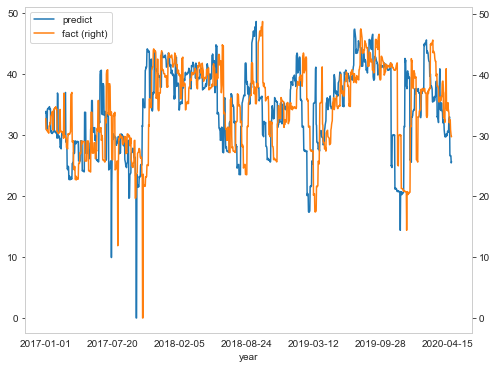

In [114]:
import matplotlib.pyplot as plt # Impot the relevant module

fig, ax = plt.subplots() # Create the figure and axes object

# Plot the first x and y axes:
df.plot(x = 'year', y = 'predict', ax = ax) 
# Plot the second x and y axes. By secondary_y = True a second y-axis is requested:
# (see https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.plot.html for details)
df.plot(x = 'year', y = 'fact', ax = ax, secondary_y = True)

In [116]:
#X_right = datan['AKSH_211_bhp_pump_press']
X_left = datan[features2]
X_right = datan[features_considered_north2]
Y_train = datan['AKSH_211_liq_vol']#,'AKSH_226_liq_vol'] 
X_left = np.asarray(X_left)
X_right = np.asarray(X_right) 
Y_train = np.asarray(Y_train) 

In [117]:
# multivariate mlp example
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate
 
# сэмлы
def split_sequences(sequences, n_steps):
	X, y = list(), list()
	for i in range(len(sequences)):
		# разметка
		end_ix = i + n_steps
		# проверка выхода за пределы
		if end_ix > len(sequences):
			break
		# получение начала и конечной метки
		seq_x, seq_y = sequences[i:end_ix, :-1], sequences[end_ix-1, -1]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
# последовательность
in_seq1 = X_left#[0:856]
in_seq2 = X_right#[0:856]
out_seq = Y_train#[0:856] # array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1), 5,1,1))
in_seq2 = in_seq2.reshape((len(in_seq2), 5,1,1))
out_seq = out_seq.reshape((len(out_seq), 1,1,1))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
n_steps = 20
# convert into input/output
X, y = split_sequences(dataset, n_steps)
# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]
# первая модель
visible1 = Input(shape=(n_steps,1,1,1))
dense1 =  ConvLSTM2D(name ='conv_lstm_1',
                         filters = 64, kernel_size = (10, 10), 
                         padding='same',
                         return_sequences = True)(visible1) #,batch_input_shape=(32,100,1), stateful=True
# вторая модель LSTM
visible2 = Input(shape=(n_steps,1,1,1))
lstm = ConvLSTM2D(name ='conv_lstm_4',
                         filters = 64, kernel_size = (10, 1), 
                         padding='same', kernel_initializer="glorot_uniform",
                         return_sequences = True)(visible2)
# слияние
merge = concatenate([dense1, lstm])
output = Dense(1)(merge)
model = Model(inputs=[visible1, visible2], outputs=output)
model.compile(optimizer='adam', loss='mape', metrics=['accuracy'])
# fit model
model.fit([X1, X2], Y_train, epochs=20, verbose=1, batch_size=100, validation_split=0.1)
# demonstrate prediction
#x_input = array([[80, 85], [90, 95], [100, 105]])
#x1 = x_input[:, 0].reshape((1, n_steps))
#x2 = x_input[:, 1].reshape((1, n_steps))
yhat = model.predict([X1, X2], verbose=0)
print(yhat)

Epoch 1/20
11/11 [==============================] - 10s 561ms/step - loss: 2277673.2358 - accuracy: 1.3033e-05 - val_loss: 94.6434 - val_accuracy: 0.0000e+00
Epoch 2/20
11/11 [==============================] - 6s 518ms/step - loss: 5458016.2840 - accuracy: 2.6601e-04 - val_loss: 99.8457 - val_accuracy: 0.0000e+00
Epoch 3/20
11/11 [==============================] - 6s 533ms/step - loss: 402994.7796 - accuracy: 0.0016 - val_loss: 99.0440 - val_accuracy: 0.0000e+00
Epoch 4/20
11/11 [==============================] - 6s 541ms/step - loss: 663020.8454 - accuracy: 0.0019 - val_loss: 99.2539 - val_accuracy: 0.0000e+00
Epoch 5/20
11/11 [==============================] - 6s 545ms/step - loss: 112605.0586 - accuracy: 0.0011 - val_loss: 99.9547 - val_accuracy: 0.0000e+00
Epoch 6/20
11/11 [==============================] - 6s 556ms/step - loss: 141978.9124 - accuracy: 0.0019 - val_loss: 100.3089 - val_accuracy: 0.0000e+00
Epoch 7/20
11/11 [==============================] - 6s 566ms/step - loss: 13

In [118]:
yhat = yhat.flatten() 
y = y.flatten() 

In [128]:
datadd = datan.index
datadd.shape
yhat = yhat[0:1231]
Y_train = Y_train[0:1231]

In [129]:
import pandas as pd

df = pd.DataFrame(data={'year': datadd, 
                        'predict': yhat, 
                        'fact': Y_train})

<AxesSubplot:label='52ca72bc-d599-4ace-8d41-b9ffe9d38839'>

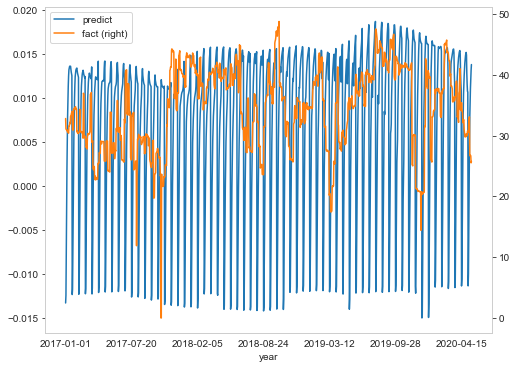

In [130]:
import matplotlib.pyplot as plt # Impot the relevant module

fig, ax = plt.subplots() # Create the figure and axes object

# Plot the first x and y axes:
df.plot(x = 'year', y = 'predict', ax = ax) 
# Plot the second x and y axes. By secondary_y = True a second y-axis is requested:
# (see https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.plot.html for details)
df.plot(x = 'year', y = 'fact', ax = ax, secondary_y = True)

# LSTMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMM

In [8]:
features2.head()

,AKSH_298_bhp_pump_press,AKSH_213_bhp_pump_press,AKSH_203_bhp_pump_press,AKSH_223_bhp_pump_press,AKSH_226_bhp_pump_press
date,,,,,
2017-01-01,0.0,0.0,0.0,0.0,0.0
2017-01-02,0.0,0.0,0.0,0.0,0.0
2017-01-03,0.0,0.0,0.0,0.0,0.0
2017-01-04,0.0,0.0,0.0,0.0,0.0
2017-01-05,0.0,0.0,0.0,0.0,0.0


,AKSH_298_bhp_pump_press,AKSH_213_bhp_pump_press,AKSH_203_bhp_pump_press,AKSH_223_bhp_pump_press,AKSH_226_bhp_pump_press
date,,,,,
2017-01-01,0.0,0.0,0.0,0.0,0.0
2017-01-02,0.0,0.0,0.0,0.0,0.0
2017-01-03,0.0,0.0,0.0,0.0,0.0
2017-01-04,0.0,0.0,0.0,0.0,0.0
2017-01-05,0.0,0.0,0.0,0.0,0.0


In [334]:
datadd = features.index 

In [55]:
datadd = datadd.to_numpy()

In [56]:
print(yhat1)

[211.46959 211.22377 211.76991 ... 414.1854  427.77792 455.87912]


In [179]:
yhat1 = yhat1.flatten() 

In [180]:
y = y.flatten() 

In [181]:
print(X1)

[[94.]
 [94.]
 [93.]
 ...
 [62.]
 [63.]
 [63.]]


In [182]:
print(yhat1)

[207.69052 207.41687 207.50198 ... 408.0342  421.28964 449.3052 ]


In [183]:
import pandas as pd

df = pd.DataFrame(data={'year': datadd, 
                        'predict': yhat1, 
                        'fact': y})

<AxesSubplot:label='a6a721f0-afbf-40bd-9fbc-e63171a2f231'>

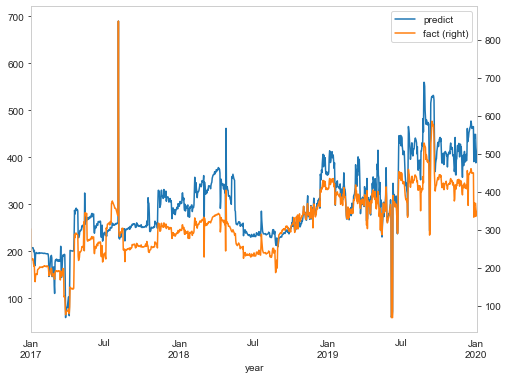

In [184]:
import matplotlib.pyplot as plt # Impot the relevant module

fig, ax = plt.subplots() # Create the figure and axes object

# Plot the first x and y axes:
df.plot(x = 'year', y = 'predict', ax = ax) 
# Plot the second x and y axes. By secondary_y = True a second y-axis is requested:
# (see https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.plot.html for details)
df.plot(x = 'year', y = 'fact', ax = ax, secondary_y = True)

In [19]:
def build_model(input_timesteps, output_timesteps, num_links, num_inputs):
    # COPY PASTA
    # https://github.com/niklascp/bus-arrival-convlstm/blob/master/jupyter/ConvLSTM_3x15min_10x64-5x64-10x64-5x64-Comparison.ipynb
    
    model = Sequential()
    model.add(BatchNormalization(name = 'batch_norm_0', input_shape = (input_timesteps, num_inputs, 1, 1)))
    model.add(ConvLSTM2D(name ='conv_lstm_1',
                         filters = 64, kernel_size = (10, 1),                       
                         padding = 'same', 
                         return_sequences = True))
    
    model.add(Dropout(0.30, name = 'dropout_1'))
    model.add(BatchNormalization(name = 'batch_norm_1'))

    model.add(ConvLSTM2D(name ='conv_lstm_2',
                         filters = 64, kernel_size = (5, 1), 
                         padding='same',
                         return_sequences = False))
    
    model.add(Dropout(0.20, name = 'dropout_2'))
    model.add(BatchNormalization(name = 'batch_norm_2'))
    
    model.add(Flatten())
    model.add(RepeatVector(output_timesteps))
    model.add(Reshape((output_timesteps, num_inputs, 1, 64)))
    
    model.add(ConvLSTM2D(name ='conv_lstm_3',
                         filters = 64, kernel_size = (10, 1), 
                         padding='same',
                         return_sequences = True))
    
    model.add(Dropout(0.20, name = 'dropout_3'))
    model.add(BatchNormalization(name = 'batch_norm_3'))
    
    model.add(ConvLSTM2D(name ='conv_lstm_4',
                         filters = 64, kernel_size = (5, 1), 
                         padding='same',
                         return_sequences = True))
    
    model.add(TimeDistributed(Dense(units=1, name = 'dense_1', activation = 'relu')))
    model.add(Dense(units=1, name = 'dense_2', activation = 'linear'))

#     optimizer = RMSprop() #lr=0.0001, rho=0.9, epsilon=1e-08, decay=0.9)
#     optimizer = tf.keras.optimizers.Adam(0.1)
    optimizer = tf.keras.optimizers.RMSprop(lr=0.004, clipvalue=1.0)
    model.compile(loss = "mse", optimizer = optimizer, metrics = ['mae', 'mse'])
    return model


In [187]:
train_y_LSTM.shape

(1100, 1)

In [190]:
#train_X_LSTM.reshape(1100,2)

In [192]:
#train_X_MLP.reshape(1100,1)

In [193]:
#model.fit([train_X_LSTM, train_X_MLP], train_y_LSTM, batch_size=64, epochs=1000, validation_split=0.1)

In [194]:
import numpy as np
import pandas as pd

data = data[['bhp_pump_press','liq_vol','AKSH_214','AKSH_240','AKSH_220','AKSH_241','AKSH_221','AKSH_247','AKSH_217','AKSH_250','AKSH_424','AKSH_225','AKSH_249','AKSH_299']]
df = data

df.columns= ['bhp_pump_press','liq_vol','AKSH_214','AKSH_240','AKSH_220','AKSH_241','AKSH_221','AKSH_247','AKSH_217','AKSH_250','AKSH_424','AKSH_225','AKSH_249','AKSH_299']
#train_X=train_df.drop(['var1(t)'],axis=1)
train_y=df[['liq_vol']]
train_X=df

#subset the 3 previous timesteps of the 4 variables for the time sries part 
train_X_LSTM=train_X[train_X.columns[:10]].reset_index(drop=True).values
train_X_LSTM=train_X_LSTM.reshape(1100, 10, 1)
#target is always var1(t)
train_y_LSTM=train_y.values
#take the current timestep fatures which are var2,var3,var4 which are realised at t=t
train_X_MLP=train_X[train_X.columns[-3:]].reset_index(drop=True).values
train_X_MLP=train_X_MLP.reshape(1100, 3, 1)

#target is always var1(t)
train_y_MLP=train_y.values

from tensorflow.keras.layers import Input, LSTM, Dense, Concatenate
from tensorflow.keras.models import Model
#lstm input shape
lstm_input = Input(shape=train_X_LSTM.shape[1:])
#lstm units
hidden1 = LSTM(10)(lstm_input)
hidden2 = Dense(10, activation='relu')(hidden1)
#lstm output which will be predicted var1 at t=t
lstm_output = Dense(1, activation='sigmoid')(hidden2)
#mlp input with additonal 3 variables at t=t
mlp_input=Input(shape=(train_X_MLP.shape[1]))
#combine the lstm output which is predicted var1 at t=t and key in var2,var3,var4 at t=t
x = Concatenate()([lstm_output, mlp_input])
#mlp model output which is predicted var1 at t=t
mlp_out = Dense(1, activation='relu')(x)
#final output of combined model which is predicted var1 at t=t
model = Model(inputs=[lstm_input, mlp_input],outputs=mlp_out)
#compile the model
model.compile(loss='mae', optimizer='adam')
#fit the model
model.fit([train_X_LSTM, train_X_MLP], train_y_LSTM, batch_size=64, epochs=100, validation_split=0.1)

Epoch 1/100
16/16 [==============================] - 4s 111ms/step - loss: 2762.1387 - val_loss: 168.2111
Epoch 2/100
16/16 [==============================] - 0s 15ms/step - loss: 2719.6798 - val_loss: 165.0052
Epoch 3/100
16/16 [==============================] - 0s 16ms/step - loss: 2178.1726 - val_loss: 161.7607
Epoch 4/100
16/16 [==============================] - 0s 18ms/step - loss: 2364.0705 - val_loss: 158.5558
Epoch 5/100
16/16 [==============================] - 0s 15ms/step - loss: 2448.9523 - val_loss: 155.3430
Epoch 6/100
16/16 [==============================] - 0s 18ms/step - loss: 2197.3180 - val_loss: 152.0979
Epoch 7/100
16/16 [==============================] - 0s 18ms/step - loss: 2125.3835 - val_loss: 148.8698
Epoch 8/100
16/16 [==============================] - 0s 18ms/step - loss: 2315.5566 - val_loss: 145.6002
Epoch 9/100
16/16 [==============================] - 0s 17ms/step - loss: 2446.6551 - val_loss: 142.4762
Epoch 10/100
16/16 [==============================] - 

In [353]:

model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
# fit model
model.fit([train_X_LSTM, train_X_MLP], train_y_LSTM, batch_size=64, epochs=100, validation_split=0.1)

Epoch 1/100
16/16 [==============================] - 3s 53ms/step - loss: nan - accuracy: 0.1317 - val_loss: nan - val_accuracy: 0.0818
Epoch 2/100
16/16 [==============================] - 0s 17ms/step - loss: nan - accuracy: 0.1308 - val_loss: nan - val_accuracy: 0.0818
Epoch 3/100
16/16 [==============================] - 0s 16ms/step - loss: nan - accuracy: 0.1206 - val_loss: nan - val_accuracy: 0.0818
Epoch 4/100
16/16 [==============================] - 0s 14ms/step - loss: nan - accuracy: 0.1274 - val_loss: nan - val_accuracy: 0.0818
Epoch 5/100
16/16 [==============================] - 0s 16ms/step - loss: nan - accuracy: 0.1218 - val_loss: nan - val_accuracy: 0.0818
Epoch 6/100
16/16 [==============================] - 0s 17ms/step - loss: nan - accuracy: 0.1249 - val_loss: nan - val_accuracy: 0.0818
Epoch 7/100
16/16 [==============================] - 0s 16ms/step - loss: nan - accuracy: 0.1406 - val_loss: nan - val_accuracy: 0.0818
Epoch 8/100
16/16 [=============================

In [354]:
train_X_LSTM.shape

(1100, 10, 1)

In [355]:
train_X_MLP.shape

(1100, 3, 1)

In [358]:
yhat = model.predict([train_X_LSTM, train_X_MLP], verbose=0)
print(yhat)

[[nan]
 [nan]
 [nan]
 ...
 [nan]
 [nan]
 [nan]]


In [359]:
yhat1 = yhat.flatten() 
y = y.flatten() 

In [360]:
import numpy as np
import pandas as pd

data = data[['bhp_pump_press','liq_vol','AKSH_214','AKSH_240','AKSH_220','AKSH_241','AKSH_221','AKSH_247','AKSH_217','AKSH_250','AKSH_424','AKSH_225','AKSH_249','AKSH_299']]
df = data

df.columns= ['bhp_pump_press','liq_vol','AKSH_214','AKSH_240','AKSH_220','AKSH_241','AKSH_221','AKSH_247','AKSH_217','AKSH_250','AKSH_424','AKSH_225','AKSH_249','AKSH_299']
#train_X=train_df.drop(['var1(t)'],axis=1)
train_y=df[['liq_vol']]
train_X=df

#subset the 3 previous timesteps of the 4 variables for the time sries part 
train_X_LSTM=train_X[train_X.columns[:10]].reset_index(drop=True).values
train_X_LSTM=train_X_LSTM.reshape(1100, 10, 1)
#target is always var1(t)
train_y_LSTM=train_y.values
#take the current timestep fatures which are var2,var3,var4 which are realised at t=t
train_X_MLP=train_X[train_X.columns[-3:]].reset_index(drop=True).values
train_X_MLP=train_X_MLP.reshape(1100, 3, 1)

#target is always var1(t)
train_y_MLP=train_y.values

from tensorflow.keras.layers import Input, LSTM, Dense, Concatenate
from tensorflow.keras.models import Model
#lstm input shape
lstm_input = Input(shape=train_X_LSTM.shape[1:])
#lstm units
hidden1 = LSTM(10)(lstm_input)
hidden2 = Dense(10, activation='relu')(hidden1)
#lstm output which will be predicted var1 at t=t
lstm_output = Dense(1, activation='sigmoid')(hidden2)
#mlp input with additonal 3 variables at t=t
mlp_input=Input(shape=(train_X_MLP.shape[1]))
#combine the lstm output which is predicted var1 at t=t and key in var2,var3,var4 at t=t
x = Multiply()([lstm_output, mlp_input])
#mlp model output which is predicted var1 at t=t
mlp_out = Dense(1, activation='relu')(x)
#final output of combined model which is predicted var1 at t=t
model = Model(inputs=[lstm_input, mlp_input],outputs=mlp_out)
#compile the model
model.compile(loss='mae', optimizer='adam')
#fit the model
model.fit([train_X_LSTM, train_X_MLP], train_y_LSTM, batch_size=64, epochs=100, validation_split=0.1)

Epoch 1/100
16/16 [==============================] - 3s 50ms/step - loss: 2488.0712 - val_loss: 20.7939
Epoch 2/100
16/16 [==============================] - 0s 15ms/step - loss: 2684.8192 - val_loss: 19.4397
Epoch 3/100
16/16 [==============================] - 0s 17ms/step - loss: 2518.8084 - val_loss: 18.1614
Epoch 4/100
16/16 [==============================] - 0s 17ms/step - loss: 2531.7777 - val_loss: 17.1337
Epoch 5/100
16/16 [==============================] - 0s 16ms/step - loss: 2180.1423 - val_loss: 16.2035
Epoch 6/100
16/16 [==============================] - 0s 17ms/step - loss: 2461.6925 - val_loss: 15.1960
Epoch 7/100
16/16 [==============================] - 0s 16ms/step - loss: 2956.2776 - val_loss: 14.3072
Epoch 8/100
16/16 [==============================] - 0s 16ms/step - loss: 2202.2620 - val_loss: 13.4500
Epoch 9/100
16/16 [==============================] - 0s 18ms/step - loss: 2106.7238 - val_loss: 12.4662
Epoch 10/100
16/16 [==============================] - 0s 18ms/st

In [361]:
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
# fit model
model.fit([train_X_LSTM, train_X_MLP], train_y_LSTM, batch_size=64, epochs=100, validation_split=0.1)

Epoch 1/100
16/16 [==============================] - 4s 53ms/step - loss: 2.9141e-04 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0818
Epoch 2/100
16/16 [==============================] - 0s 16ms/step - loss: 2.6496e-04 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0818
Epoch 3/100
16/16 [==============================] - 0s 16ms/step - loss: 2.5875e-04 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0818
Epoch 4/100
16/16 [==============================] - 0s 18ms/step - loss: 2.6963e-04 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0818
Epoch 5/100
16/16 [==============================] - 0s 16ms/step - loss: 2.2606e-04 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0818
Epoch 6/100
16/16 [==============================] - 0s 16ms/step - loss: 2.5324e-04 - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0818
Epoch 7/100
16/16 [==============================] - 0s 16ms/step - loss: 2.6357e-04 - accuracy: 0.0000e+00 - val_loss

In [362]:
yhat = model.predict([train_X_LSTM, train_X_MLP], verbose=0)
print(yhat)

[[17.255634]
 [16.512215]
 [17.746166]
 ...
 [ 0.      ]
 [ 0.      ]
 [ 0.      ]]


In [363]:
import numpy as np
import pandas as pd

data = data[['bhp_pump_press','liq_vol','AKSH_214','AKSH_240','AKSH_220','AKSH_241','AKSH_221','AKSH_247','AKSH_217','AKSH_250','AKSH_424','AKSH_225','AKSH_249','AKSH_299']]
df = data

df.columns= ['bhp_pump_press','liq_vol','AKSH_214','AKSH_240','AKSH_220','AKSH_241','AKSH_221','AKSH_247','AKSH_217','AKSH_250','AKSH_424','AKSH_225','AKSH_249','AKSH_299']
#train_X=train_df.drop(['var1(t)'],axis=1)
train_y=df[['liq_vol']]
train_X=df

#subset the 3 previous timesteps of the 4 variables for the time sries part 
train_X_LSTM=train_X[train_X.columns[:10]].reset_index(drop=True).values
train_X_LSTM=train_X_LSTM.reshape(1100, 10, 1)
#target is always var1(t)
train_y_LSTM=train_y.values
#take the current timestep fatures which are var2,var3,var4 which are realised at t=t
train_X_MLP=train_X[train_X.columns[-3:]].reset_index(drop=True).values
train_X_MLP=train_X_MLP.reshape(1100, 3, 1)

#target is always var1(t)
train_y_MLP=train_y.values

from tensorflow.keras.layers import Input, LSTM, Dense, Concatenate
from tensorflow.keras.models import Model
#lstm input shape
lstm_input = Input(shape=train_X_LSTM.shape[1:])
#lstm units
hidden1 = LSTM(10)(lstm_input)
hidden2 = Dense(10, activation='relu')(hidden1)
#lstm output which will be predicted var1 at t=t
lstm_output = Dense(1, activation='sigmoid')(hidden2)
#mlp input with additonal 3 variables at t=t
mlp_input=Input(shape=(train_X_MLP.shape[1]))
#combine the lstm output which is predicted var1 at t=t and key in var2,var3,var4 at t=t
x = Add()([lstm_output, mlp_input])
#mlp model output which is predicted var1 at t=t
mlp_out = Dense(1, activation='relu')(x)
#final output of combined model which is predicted var1 at t=t
model = Model(inputs=[lstm_input, mlp_input],outputs=mlp_out)
#compile the model
model.compile(loss='mae', optimizer='adam')
#fit the model
model.fit([train_X_LSTM, train_X_MLP], train_y_LSTM, batch_size=64, epochs=100, validation_split=0.1)

Epoch 1/100
16/16 [==============================] - 3s 50ms/step - loss: 2494.2395 - val_loss: 34.2720
Epoch 2/100
16/16 [==============================] - 0s 17ms/step - loss: 2694.7767 - val_loss: 32.6830
Epoch 3/100
16/16 [==============================] - 0s 14ms/step - loss: 2175.3081 - val_loss: 31.0810
Epoch 4/100
16/16 [==============================] - 0s 16ms/step - loss: 2447.7404 - val_loss: 29.4993
Epoch 5/100
16/16 [==============================] - 0s 16ms/step - loss: 2501.8751 - val_loss: 27.9071
Epoch 6/100
16/16 [==============================] - 0s 16ms/step - loss: 2605.9052 - val_loss: 26.3408
Epoch 7/100
16/16 [==============================] - 0s 18ms/step - loss: 2343.9178 - val_loss: 24.7456
Epoch 8/100
16/16 [==============================] - 0s 17ms/step - loss: 2478.5549 - val_loss: 23.1485
Epoch 9/100
16/16 [==============================] - 0s 16ms/step - loss: 2069.4520 - val_loss: 21.5979
Epoch 10/100
16/16 [==============================] - 0s 17ms/st

In [364]:
yhat = model.predict([train_X_LSTM, train_X_MLP], verbose=0)
print(yhat)

[[19.045881]
 [18.049738]
 [19.583336]
 ...
 [ 0.      ]
 [ 0.      ]
 [ 0.      ]]


In [371]:
import numpy as np
import pandas as pd

data = data[['bhp_pump_press','liq_vol','AKSH_214','AKSH_240','AKSH_220','AKSH_241','AKSH_221','AKSH_247','AKSH_217','AKSH_250','AKSH_424','AKSH_225','AKSH_249','AKSH_299']]
df = data

df.columns= ['bhp_pump_press','liq_vol','AKSH_214','AKSH_240','AKSH_220','AKSH_241','AKSH_221','AKSH_247','AKSH_217','AKSH_250','AKSH_424','AKSH_225','AKSH_249','AKSH_299']
#train_X=train_df.drop(['var1(t)'],axis=1)
train_y=df[['liq_vol']]
train_X=df

#subset the 3 previous timesteps of the 4 variables for the time sries part 
train_X_LSTM=train_X[train_X.columns[:10]].reset_index(drop=True).values
train_X_LSTM=train_X_LSTM.reshape(1100, 10, 1)
#target is always var1(t)
train_y_LSTM=train_y.values
#take the current timestep fatures which are var2,var3,var4 which are realised at t=t
train_X_MLP=train_X[train_X.columns[-3:]].reset_index(drop=True).values
train_X_MLP=train_X_MLP.reshape(1100, 3, 1)

#target is always var1(t)
train_y_MLP=train_y.values

from tensorflow.keras.layers import Input, LSTM, Dense, Concatenate
from tensorflow.keras.models import Model
#lstm input shape
lstm_input = Input(shape=train_X_LSTM.shape[1:])
#lstm units
hidden1 = LSTM(10)(lstm_input)
hidden2 = Dense(10, activation='relu')(hidden1)
#lstm output which will be predicted var1 at t=t
lstm_output = Dense(1, activation='sigmoid')(hidden2)
#mlp input with additonal 3 variables at t=t
mlp_input=Input(shape=(train_X_MLP.shape[1]))


#combine the lstm output which is predicted var1 at t=t and key in var2,var3,var4 at t=t
x = Multiply()([lstm_output,hidden2])
#mlp model output which is predicted var1 at t=t
mlp_out = Dense(1, activation='relu')(x)
#final output of combined model which is predicted var1 at t=t
model = Model(inputs=[lstm_input, mlp_input],outputs=mlp_out)
#compile the model
model.compile(loss='mae', optimizer='adam')
#fit the model
model.fit([train_X_LSTM, train_X_MLP], train_y_LSTM, batch_size=64, epochs=100, validation_split=0.1)

Epoch 1/100
16/16 [==============================] - 4s 49ms/step - loss: 2105.1637 - val_loss: 12.7835
Epoch 2/100
16/16 [==============================] - 0s 17ms/step - loss: 2298.6200 - val_loss: 12.7835
Epoch 3/100
16/16 [==============================] - 0s 16ms/step - loss: 2610.3831 - val_loss: 12.7835
Epoch 4/100
16/16 [==============================] - 0s 17ms/step - loss: 2408.4935 - val_loss: 12.7835
Epoch 5/100
16/16 [==============================] - 0s 16ms/step - loss: 2423.0349 - val_loss: 12.7835
Epoch 6/100
16/16 [==============================] - 0s 17ms/step - loss: 2076.8974 - val_loss: 12.7835
Epoch 7/100
16/16 [==============================] - 0s 17ms/step - loss: 2431.1869 - val_loss: 12.7835
Epoch 8/100
16/16 [==============================] - 0s 17ms/step - loss: 2423.4842 - val_loss: 12.7835
Epoch 9/100
16/16 [==============================] - 0s 16ms/step - loss: 2299.9789 - val_loss: 12.7835
Epoch 10/100
16/16 [==============================] - 0s 15ms/st

Epoch 79/100
16/16 [==============================] - 0s 17ms/step - loss: 2356.6367 - val_loss: 12.7835
Epoch 80/100
16/16 [==============================] - 0s 18ms/step - loss: 2088.8193 - val_loss: 12.7835
Epoch 81/100
16/16 [==============================] - 0s 16ms/step - loss: 2477.1188 - val_loss: 12.7835
Epoch 82/100
16/16 [==============================] - 0s 17ms/step - loss: 2193.7635 - val_loss: 12.7835
Epoch 83/100
16/16 [==============================] - 0s 15ms/step - loss: 1980.7137 - val_loss: 12.7835
Epoch 84/100
16/16 [==============================] - 0s 17ms/step - loss: 2358.0502 - val_loss: 12.7835
Epoch 85/100
16/16 [==============================] - 0s 17ms/step - loss: 2289.9478 - val_loss: 12.7835
Epoch 86/100
16/16 [==============================] - 0s 17ms/step - loss: 2069.8095 - val_loss: 12.7835
Epoch 87/100
16/16 [==============================] - 0s 16ms/step - loss: 2454.4239 - val_loss: 12.7835
Epoch 88/100
16/16 [==============================] - 0

In [372]:
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
# fit model
model.fit([train_X_LSTM, train_X_MLP], train_y_LSTM, batch_size=64, epochs=100, validation_split=0.1)

Epoch 1/100
16/16 [==============================] - 3s 52ms/step - loss: nan - accuracy: 0.1270 - val_loss: nan - val_accuracy: 0.0818
Epoch 2/100
16/16 [==============================] - 0s 16ms/step - loss: nan - accuracy: 0.1146 - val_loss: nan - val_accuracy: 0.0818
Epoch 3/100
16/16 [==============================] - 0s 17ms/step - loss: nan - accuracy: 0.1381 - val_loss: nan - val_accuracy: 0.0818
Epoch 4/100
16/16 [==============================] - 0s 18ms/step - loss: nan - accuracy: 0.1332 - val_loss: nan - val_accuracy: 0.0818
Epoch 5/100
16/16 [==============================] - 0s 16ms/step - loss: nan - accuracy: 0.1375 - val_loss: nan - val_accuracy: 0.0818
Epoch 6/100
16/16 [==============================] - 0s 18ms/step - loss: nan - accuracy: 0.1304 - val_loss: nan - val_accuracy: 0.0818
Epoch 7/100
16/16 [==============================] - 0s 16ms/step - loss: nan - accuracy: 0.1380 - val_loss: nan - val_accuracy: 0.0818
Epoch 8/100
16/16 [=============================

In [373]:
yhat = model.predict([train_X_LSTM, train_X_MLP], verbose=0)
print(yhat)

[[nan]
 [nan]
 [nan]
 ...
 [nan]
 [nan]
 [nan]]


In [381]:
import numpy as np
import pandas as pd

data = data[['bhp_pump_press','liq_vol','AKSH_214','AKSH_240','AKSH_220','AKSH_241','AKSH_221','AKSH_247','AKSH_217','AKSH_250','AKSH_424','AKSH_225','AKSH_249','AKSH_299']]
df = data

df.columns= ['bhp_pump_press','liq_vol','AKSH_214','AKSH_240','AKSH_220','AKSH_241','AKSH_221','AKSH_247','AKSH_217','AKSH_250','AKSH_424','AKSH_225','AKSH_249','AKSH_299']
#train_X=train_df.drop(['var1(t)'],axis=1)
train_y=df[['liq_vol']]
train_X=df

#subset the 3 previous timesteps of the 4 variables for the time sries part 
train_X_LSTM=train_X[train_X.columns[:10]].reset_index(drop=True).values
train_X_LSTM=train_X_LSTM.reshape(1100, 10, 1)
#target is always var1(t)
train_y_LSTM=train_y.values
#take the current timestep fatures which are var2,var3,var4 which are realised at t=t
train_X_MLP=train_X[train_X.columns[-3:]].reset_index(drop=True).values
train_X_MLP=train_X_MLP.reshape(1100, 3, 1)

#target is always var1(t)
train_y_MLP=train_y.values

from tensorflow.keras.layers import Input, LSTM, Dense, Concatenate
from tensorflow.keras.models import Model
#lstm input shape
lstm_input = Input(shape=train_X_LSTM.shape[1:])
#lstm units
hidden1 = LSTM(10)(lstm_input)
hidden2 = Dense(10, activation='relu')(hidden1)
#lstm output which will be predicted var1 at t=t
lstm_output = Dense(1, activation='sigmoid')(hidden2)
#mlp input with additonal 3 variables at t=t
mlp_input=Input(shape=(train_X_MLP.shape[1]))
#combine the lstm output which is predicted var1 at t=t and key in var2,var3,var4 at t=t
x = Add()([lstm_output, mlp_input])
y = Multiply()([lstm_output, mlp_input])
z = Add()([x, y])
#mlp model output which is predicted var1 at t=t
mlp_out = Dense(10, activation='relu')(z)
#final output of combined model which is predicted var1 at t=t
model = Model(inputs=[lstm_input, mlp_input],outputs=mlp_out)
#compile the model
model.compile(loss='mae', optimizer='adam')
#fit the model
model.fit([train_X_LSTM, train_X_MLP], train_y_LSTM, batch_size=64, epochs=100, validation_split=0.1)

Epoch 1/100
16/16 [==============================] - 4s 50ms/step - loss: 2385.2955 - val_loss: 96.5785
Epoch 2/100
16/16 [==============================] - 0s 15ms/step - loss: 2374.7090 - val_loss: 91.5188
Epoch 3/100
16/16 [==============================] - 0s 16ms/step - loss: 2141.0242 - val_loss: 86.6595
Epoch 4/100
16/16 [==============================] - 0s 15ms/step - loss: 2469.1983 - val_loss: 82.3160
Epoch 5/100
16/16 [==============================] - 0s 17ms/step - loss: 2481.4073 - val_loss: 77.9858
Epoch 6/100
16/16 [==============================] - 0s 18ms/step - loss: 1815.9327 - val_loss: 73.4015
Epoch 7/100
16/16 [==============================] - 0s 17ms/step - loss: 2802.3652 - val_loss: 68.5430
Epoch 8/100
16/16 [==============================] - 0s 16ms/step - loss: 2196.8817 - val_loss: 58.8519
Epoch 9/100
16/16 [==============================] - 0s 19ms/step - loss: 2450.9224 - val_loss: 53.6923
Epoch 10/100
16/16 [==============================] - 0s 16ms/st

16/16 [==============================] - 0s 15ms/step - loss: 2070.3520 - val_loss: 30.5708
Epoch 80/100
16/16 [==============================] - 0s 17ms/step - loss: 2220.6506 - val_loss: 30.5784
Epoch 81/100
16/16 [==============================] - 0s 18ms/step - loss: 2594.3676 - val_loss: 30.5750
Epoch 82/100
16/16 [==============================] - 0s 17ms/step - loss: 2443.1711 - val_loss: 30.5532
Epoch 83/100
16/16 [==============================] - 0s 17ms/step - loss: 2673.7694 - val_loss: 30.5475
Epoch 84/100
16/16 [==============================] - 0s 16ms/step - loss: 2228.6166 - val_loss: 30.5521
Epoch 85/100
16/16 [==============================] - 0s 16ms/step - loss: 2757.8064 - val_loss: 30.5629
Epoch 86/100
16/16 [==============================] - 0s 17ms/step - loss: 2660.7581 - val_loss: 30.5563
Epoch 87/100
16/16 [==============================] - 0s 16ms/step - loss: 2349.9242 - val_loss: 30.5494
Epoch 88/100
16/16 [==============================] - 0s 17ms/step -

In [382]:
yhat = model.predict([train_X_LSTM, train_X_MLP], verbose=0)
print(yhat)

[[ 18.78224   18.91118    0.       ...  18.945662  19.026882   0.      ]
 [ 17.788345  17.93771    0.       ...  17.952879  18.044147   0.      ]
 [ 19.317099  19.440956   0.       ...  19.475313  19.545578   0.      ]
 ...
 [ 39.386555 112.45287    0.       ... 104.75399    0.         0.      ]
 [ 39.385376 112.83974    0.       ... 105.09804    0.         0.      ]
 [ 39.934452 114.14782    0.       ... 106.34139    0.         0.      ]]


In [398]:
import numpy as np
import pandas as pd

data = data[['bhp_pump_press','liq_vol','AKSH_214','AKSH_240','AKSH_220','AKSH_241','AKSH_221','AKSH_247','AKSH_217','AKSH_250','AKSH_424','AKSH_225','AKSH_249','AKSH_299']]
df = data

df.columns= ['bhp_pump_press','liq_vol','AKSH_214','AKSH_240','AKSH_220','AKSH_241','AKSH_221','AKSH_247','AKSH_217','AKSH_250','AKSH_424','AKSH_225','AKSH_249','AKSH_299']
#train_X=train_df.drop(['var1(t)'],axis=1)
train_y=df[['liq_vol']]
train_X=df

#subset the 3 previous timesteps of the 4 variables for the time sries part 
train_X_LSTM=train_X[train_X.columns[:10]].reset_index(drop=True).values
train_X_LSTM=train_X_LSTM.reshape(1100, 10, 1)
#target is always var1(t)
train_y_LSTM=train_y.values
#take the current timestep fatures which are var2,var3,var4 which are realised at t=t
train_X_MLP=train_X[train_X.columns[-3:]].reset_index(drop=True).values
train_X_MLP=train_X_MLP.reshape(1100, 3, 1)

#target is always var1(t)
train_y_MLP=train_y.values

from tensorflow.keras.layers import Input, LSTM, Dense, Concatenate
from tensorflow.keras.models import Model
#lstm input shape
lstm_input = Input(shape=train_X_LSTM.shape[1:])
#lstm units
hidden1 = LSTM(10)(lstm_input)
hidden2 = Dense(10, activation='relu')(hidden1)
#lstm output which will be predicted var1 at t=t
lstm_output = Dense(1, activation='sigmoid')(hidden2)
#mlp input with additonal 3 variables at t=t
mlp_input=Input(shape=(train_X_MLP.shape[1]))
#combine the lstm output which is predicted var1 at t=t and key in var2,var3,var4 at t=t
x = Add()([lstm_output, mlp_input])
y = Multiply()([lstm_output, mlp_input])
z = Add()([x, y])
#mlp model output which is predicted var1 at t=t
mlp_out = Dense(1, activation='relu')(z)
#final output of combined model which is predicted var1 at t=t
model = Model(inputs=[lstm_input, mlp_input],outputs=mlp_out)
#compile the model
model.compile(loss='mae', optimizer='adam')
#fit the model
model.fit([train_X_LSTM, train_X_MLP], train_y_LSTM, batch_size=64, epochs=100, validation_split=0.1)

Epoch 1/100
16/16 [==============================] - 5s 184ms/step - loss: 1964.2830 - val_loss: 142.7133
Epoch 2/100
16/16 [==============================] - 0s 17ms/step - loss: 2121.9183 - val_loss: 135.4260
Epoch 3/100
16/16 [==============================] - 0s 17ms/step - loss: 2010.1805 - val_loss: 130.3376
Epoch 4/100
16/16 [==============================] - 0s 19ms/step - loss: 2215.2828 - val_loss: 126.7892
Epoch 5/100
16/16 [==============================] - 0s 18ms/step - loss: 2592.4463 - val_loss: 124.0336
Epoch 6/100
16/16 [==============================] - 0s 19ms/step - loss: 2132.2523 - val_loss: 121.6321
Epoch 7/100
16/16 [==============================] - 0s 17ms/step - loss: 2224.8373 - val_loss: 120.0733
Epoch 8/100
16/16 [==============================] - 0s 19ms/step - loss: 2694.0315 - val_loss: 118.8299
Epoch 9/100
16/16 [==============================] - ETA: 0s - loss: 1926.32 - 0s 16ms/step - loss: 2031.0994 - val_loss: 117.8198
Epoch 10/100
16/16 [========

In [399]:
yhat = model.predict([train_X_LSTM, train_X_MLP], verbose=0)
print(yhat)

[[ 26.509504]
 [ 25.502922]
 [ 27.61484 ]
 ...
 [262.2619  ]
 [263.5001  ]
 [266.38843 ]]


In [402]:
yhat = yhat.flatten()

In [411]:
train_y = train_y.values.flatten()

In [416]:
train_y


array([26.07957, 26.19168, 26.34346, ...,  0.     ,  0.     ,  0.     ])

In [412]:
df = pd.DataFrame(data={'year': datadd, 
                        'predict': yhat, 
                        'fact': train_y})

<AxesSubplot:label='dff96bd5-f272-448d-a73e-090e4d9dbe3c'>

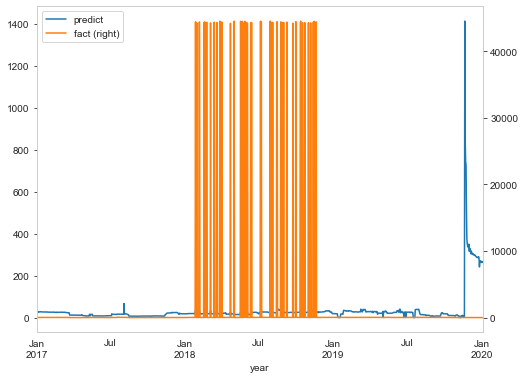

In [413]:
fig, ax = plt.subplots() # Create the figure and axes object

# Plot the first x and y axes:
df.plot(x = 'year', y = 'predict', ax = ax) 
# Plot the second x and y axes. By secondary_y = True a second y-axis is requested:
# (see https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.plot.html for details)
df.plot(x = 'year', y = 'fact', ax = ax, secondary_y = True)

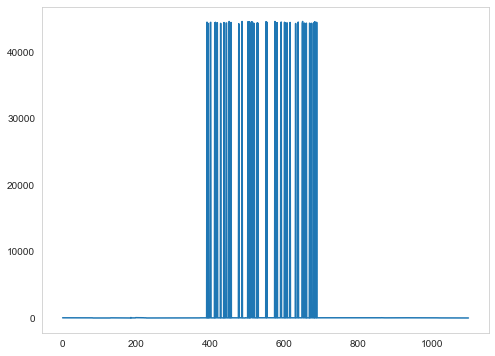

In [415]:
plt.plot(train_y_LSTM)

In [424]:
import numpy as np
import pandas as pd

#data = data['bhp_pump_press','liq_vol','AKSH_214','AKSH_240','AKSH_220','AKSH_241','AKSH_221','AKSH_247','AKSH_217','AKSH_250','AKSH_424','AKSH_225','AKSH_249','AKSH_299']
df = data

df.columns= ['bhp_pump_press','liq_vol','AKSH_214','AKSH_240','AKSH_220','AKSH_241','AKSH_221','AKSH_247','AKSH_217','AKSH_250','AKSH_424','AKSH_225','AKSH_249','AKSH_299']
#train_X=train_df.drop(['var1(t)'],axis=1)
train_y=df[['liq_vol']]
train_X=df

#subset the 3 previous timesteps of the 4 variables for the time sries part 
train_X_LSTM=train_X[train_X.columns[:10]].reset_index(drop=True).values
train_X_LSTM=train_X_LSTM.reshape(1100, 10, 1)
#target is always var1(t)
train_y_LSTM=train_y.values
#take the current timestep fatures which are var2,var3,var4 which are realised at t=t
train_X_MLP=train_X[train_X.columns[-3:]].reset_index(drop=True).values
train_X_MLP=train_X_MLP.reshape(1100, 3, 1)

#target is always var1(t)
train_y_MLP=train_y.values

from tensorflow.keras.layers import Input, LSTM, Dense, Concatenate
from tensorflow.keras.models import Model
#lstm input shape
lstm_input = Input(shape=train_X_LSTM.shape[1:])
#lstm units
hidden1 = LSTM(10)(lstm_input)
hidden2 = Dense(10, activation='relu')(hidden1)
#lstm output which will be predicted var1 at t=t
lstm_output = Dense(1, activation='sigmoid')(hidden2)
#mlp input with additonal 3 variables at t=t
mlp_input=Input(shape=(train_X_MLP.shape[1]))
#combine the lstm output which is predicted var1 at t=t and key in var2,var3,var4 at t=t
x = Add()([lstm_output, mlp_input])
y = Multiply()([lstm_output, mlp_input])
z = Add()([x, y])
#mlp model output which is predicted var1 at t=t
mlp_out = Dense(10, activation='relu')(z)
#final output of combined model which is predicted var1 at t=t
model = Model(inputs=[lstm_input, mlp_input],outputs=mlp_out)
#compile the model
model.compile(loss='mae', optimizer='adam')
#fit the model
model.fit([train_X_LSTM, train_X_MLP], train_y_LSTM, batch_size=64, epochs=100, validation_split=0.1)

Epoch 1/100
16/16 [==============================] - 3s 48ms/step - loss: 2491.0961 - val_loss: 45.7449
Epoch 2/100
16/16 [==============================] - 0s 17ms/step - loss: 2362.2501 - val_loss: 41.5690
Epoch 3/100
16/16 [==============================] - 0s 16ms/step - loss: 2601.5305 - val_loss: 38.2155
Epoch 4/100
16/16 [==============================] - 0s 17ms/step - loss: 2150.0540 - val_loss: 35.6420
Epoch 5/100
16/16 [==============================] - 0s 18ms/step - loss: 2409.6043 - val_loss: 33.2953
Epoch 6/100
16/16 [==============================] - 0s 18ms/step - loss: 2626.8574 - val_loss: 31.2341
Epoch 7/100
16/16 [==============================] - 0s 17ms/step - loss: 2107.1934 - val_loss: 29.4041
Epoch 8/100
16/16 [==============================] - 0s 18ms/step - loss: 2291.5296 - val_loss: 27.9932
Epoch 9/100
16/16 [==============================] - 0s 17ms/step - loss: 2258.2967 - val_loss: 26.6430
Epoch 10/100
16/16 [==============================] - 0s 16ms/st

16/16 [==============================] - 0s 16ms/step - loss: 2205.7742 - val_loss: 17.8551
Epoch 80/100
16/16 [==============================] - 0s 17ms/step - loss: 3090.3102 - val_loss: 17.8653
Epoch 81/100
16/16 [==============================] - 0s 17ms/step - loss: 2795.1211 - val_loss: 17.8514
Epoch 82/100
16/16 [==============================] - 0s 17ms/step - loss: 2167.2763 - val_loss: 17.8487
Epoch 83/100
16/16 [==============================] - 0s 16ms/step - loss: 1556.7374 - val_loss: 17.8547
Epoch 84/100
16/16 [==============================] - 0s 18ms/step - loss: 2355.3807 - val_loss: 17.8330
Epoch 85/100
16/16 [==============================] - 0s 18ms/step - loss: 2402.9348 - val_loss: 17.8451
Epoch 86/100
16/16 [==============================] - 0s 17ms/step - loss: 2173.7394 - val_loss: 17.8370
Epoch 87/100
16/16 [==============================] - 0s 18ms/step - loss: 2411.0833 - val_loss: 17.8204
Epoch 88/100
16/16 [==============================] - 0s 18ms/step -

In [425]:
yhat = model.predict([train_X_LSTM, train_X_MLP], verbose=0)
print(yhat)

[[  0.        18.655846   0.       ...  18.492361  18.593649  18.685043]
 [  0.        17.675966   0.       ...  17.507984  17.618723  17.725292]
 [  0.        19.187788   0.       ...  19.01252   19.096935  19.1942  ]
 ...
 [  0.       110.306694   0.       ...   0.         0.         0.      ]
 [  0.       110.68362    0.       ...   0.         0.         0.      ]
 [  0.       111.97482    0.       ...   0.         0.         0.      ]]


In [ ]:
# LSTM+MLP*+ LSTM*MLP

In [426]:
import numpy as np
import pandas as pd

#data = data['bhp_pump_press','liq_vol','AKSH_214','AKSH_240','AKSH_220','AKSH_241','AKSH_221','AKSH_247','AKSH_217','AKSH_250','AKSH_424','AKSH_225','AKSH_249','AKSH_299']
df = data

df.columns= ['bhp_pump_press','liq_vol','AKSH_214','AKSH_240','AKSH_220','AKSH_241','AKSH_221','AKSH_247','AKSH_217','AKSH_250','AKSH_424','AKSH_225','AKSH_249','AKSH_299']
#train_X=train_df.drop(['var1(t)'],axis=1)
train_y=df[['liq_vol']]
train_X=df

#subset the 3 previous timesteps of the 4 variables for the time sries part 
train_X_LSTM=train_X[train_X.columns[:10]].reset_index(drop=True).values
train_X_LSTM=train_X_LSTM.reshape(1100, 10, 1)
#target is always var1(t)
train_y_LSTM=train_y.values
#take the current timestep fatures which are var2,var3,var4 which are realised at t=t
train_X_MLP=train_X[train_X.columns[-3:]].reset_index(drop=True).values
train_X_MLP=train_X_MLP.reshape(1100, 3, 1)

#target is always var1(t)
train_y_MLP=train_y.values

from tensorflow.keras.layers import Input, LSTM, Dense, Concatenate
from tensorflow.keras.models import Model
#lstm input shape
lstm_input = Input(shape=train_X_LSTM.shape[1:])
#lstm units
hidden1 = LSTM(10)(lstm_input)
hidden2 = Dense(10, activation='relu')(hidden1)
#lstm output which will be predicted var1 at t=t
lstm_output = Dense(1, activation='sigmoid')(hidden2)
#mlp input with additonal 3 variables at t=t
mlp_input=Input(shape=(train_X_MLP.shape[1]))
#combine the lstm output which is predicted var1 at t=t and key in var2,var3,var4 at t=t
x = Add()([lstm_output, mlp_input])
y = Multiply()([lstm_output, mlp_input])
z = Add()([x, y])
#mlp model output which is predicted var1 at t=t
mlp_out = Dense(1, activation='relu')(z)
#final output of combined model which is predicted var1 at t=t
model = Model(inputs=[lstm_input, mlp_input],outputs=mlp_out)
#compile the model
model.compile(loss='mae', optimizer='adam')
#fit the model
model.fit([train_X_LSTM, train_X_MLP], train_y_LSTM, batch_size=64, epochs=100, validation_split=0.1)

Epoch 1/100
16/16 [==============================] - 3s 52ms/step - loss: 2729.6186 - val_loss: 196.3221
Epoch 2/100
16/16 [==============================] - 0s 16ms/step - loss: 2881.1144 - val_loss: 186.3912
Epoch 3/100
16/16 [==============================] - 0s 15ms/step - loss: 2648.5998 - val_loss: 176.4758
Epoch 4/100
16/16 [==============================] - 0s 15ms/step - loss: 2352.7778 - val_loss: 161.6701
Epoch 5/100
16/16 [==============================] - 0s 17ms/step - loss: 2363.6555 - val_loss: 152.7127
Epoch 6/100
16/16 [==============================] - 0s 17ms/step - loss: 2196.5083 - val_loss: 145.0977
Epoch 7/100
16/16 [==============================] - 0s 18ms/step - loss: 3091.4568 - val_loss: 138.3379
Epoch 8/100
16/16 [==============================] - 0s 17ms/step - loss: 2750.9429 - val_loss: 130.7423
Epoch 9/100
16/16 [==============================] - 0s 17ms/step - loss: 3071.0605 - val_loss: 123.2370
Epoch 10/100
16/16 [==============================] - 0

In [557]:
model.summary()

Model: "model_65"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_235 (InputLayer)          [(None, 10, 1, 1, 1) 0                                            
__________________________________________________________________________________________________
sequential_51 (Sequential)      (None, 10, 1, 1, 1)  1480007     input_235[0][0]                  
__________________________________________________________________________________________________
sequential_52 (Sequential)      (None, 3, 1, 1, 1)   1480007     sequential_51[0][0]              
__________________________________________________________________________________________________
dense_229 (Dense)               (None, 3, 1, 1, 1)   2           sequential_52[0][0]              
___________________________________________________________________________________________

In [555]:
from keras.utils.vis_utils import plot_model

In [556]:
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

('Failed to import pydot. You must `pip install pydot` and install graphviz (https://graphviz.gitlab.io/download/), ', 'for `pydotprint` to work.')


In [85]:
yhat = model.predict([train_X_LSTM, train_X_MLP], verbose=0)
print(yhat)

[[ 18.45815 ]
 [ 17.488298]
 [ 19.058008]
 ...
 [109.88278 ]
 [110.258026]
 [111.46922 ]]


In [86]:
yhat = yhat.flatten()

In [87]:
train_y = train_y.values.flatten()

In [88]:
df = pd.DataFrame(data={'year': datadd, 
                        'predict': yhat, 
                        'fact': train_y})

<AxesSubplot:label='1f66db49-0dd4-4297-b466-d5c1a0e1002a'>

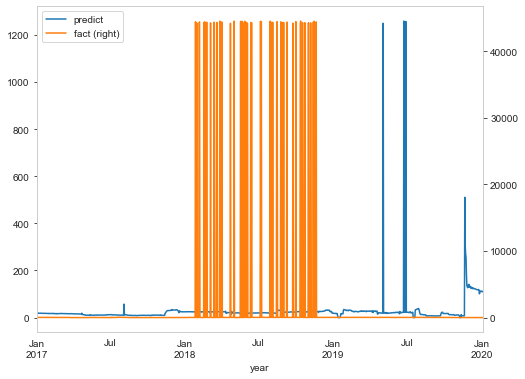

In [89]:
fig, ax = plt.subplots() # Create the figure and axes object

# Plot the first x and y axes:
df.plot(x = 'year', y = 'predict', ax = ax) 
# Plot the second x and y axes. By secondary_y = True a second y-axis is requested:
# (see https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.plot.html for details)
df.plot(x = 'year', y = 'fact', ax = ax, secondary_y = True)

In [90]:
train_y

array([26.07957, 26.19168, 26.34346, ...,  0.     ,  0.     ,  0.     ])

array([<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
       <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
       <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
       <AxesSubplot:>, <AxesSubplot:>], dtype=object)

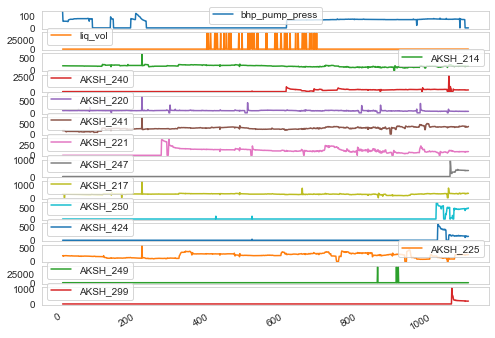

In [91]:
data.plot(subplots=True)

In [92]:
# CNNLSTM+MLP*+CNNLSTM*MLP

In [93]:
def build_model(input_timesteps, output_timesteps, num_links, num_inputs):
    # COPY PASTA
    # https://github.com/niklascp/bus-arrival-convlstm/blob/master/jupyter/ConvLSTM_3x15min_10x64-5x64-10x64-5x64-Comparison.ipynb
    
    model = Sequential()
    model.add(BatchNormalization(name = 'batch_norm_0', input_shape = (input_timesteps, num_inputs, 1, 1)))
    model.add(ConvLSTM2D(name ='conv_lstm_1',
                         filters = 64, kernel_size = (10, 1),                       
                         padding = 'same', 
                         return_sequences = True))
    
    model.add(Dropout(0.30, name = 'dropout_1'))
    model.add(BatchNormalization(name = 'batch_norm_1'))

    model.add(ConvLSTM2D(name ='conv_lstm_2',
                         filters = 64, kernel_size = (5, 1), 
                         padding='same',
                         return_sequences = False))
    
    model.add(Dropout(0.20, name = 'dropout_2'))
    model.add(BatchNormalization(name = 'batch_norm_2'))
    
    model.add(Flatten())
    model.add(RepeatVector(output_timesteps))
    model.add(Reshape((output_timesteps, num_inputs, 1, 64)))
    
    model.add(ConvLSTM2D(name ='conv_lstm_3',
                         filters = 64, kernel_size = (10, 1), 
                         padding='same',
                         return_sequences = True))
    
    model.add(Dropout(0.20, name = 'dropout_3'))
    model.add(BatchNormalization(name = 'batch_norm_3'))
    
    model.add(ConvLSTM2D(name ='conv_lstm_4',
                         filters = 64, kernel_size = (5, 1), 
                         padding='same',
                         return_sequences = True))
    
    model.add(TimeDistributed(Dense(units=1, name = 'dense_1', activation = 'relu')))
    model.add(Dense(units=1, name = 'dense_2', activation = 'linear'))

#     optimizer = RMSprop() #lr=0.0001, rho=0.9, epsilon=1e-08, decay=0.9)
#     optimizer = tf.keras.optimizers.Adam(0.1)
    optimizer = tf.keras.optimizers.RMSprop(lr=0.004, clipvalue=1.0)
    model.compile(loss = "mse", optimizer = optimizer, metrics = ['mae', 'mse'])
    return model

In [94]:
input_timesteps = 1100  
output_timesteps = 100
num_links = 1
num_inputs = 10

In [195]:
import numpy as np
import pandas as pd

#data = data['bhp_pump_press','liq_vol','AKSH_214','AKSH_240','AKSH_220','AKSH_241','AKSH_221','AKSH_247','AKSH_217','AKSH_250','AKSH_424','AKSH_225','AKSH_249','AKSH_299']
df = data

df.columns= ['bhp_pump_press','liq_vol','AKSH_214','AKSH_240','AKSH_220','AKSH_241','AKSH_221','AKSH_247','AKSH_217','AKSH_250','AKSH_424','AKSH_225','AKSH_249','AKSH_299']
#train_X=train_df.drop(['var1(t)'],axis=1)
train_y=df[['liq_vol']]
train_X=df

#subset the 3 previous timesteps of the 4 variables for the time sries part 
train_X_LSTM=train_X[train_X.columns[:10]].reset_index(drop=True).values
train_X_LSTM=train_X_LSTM.reshape(1100, 10, 1,1,1)
#target is always var1(t)
train_y_LSTM=train_y.values
#take the current timestep fatures which are var2,var3,var4 which are realised at t=t
train_X_MLP=train_X[train_X.columns[-3:]].reset_index(drop=True).values
train_X_MLP=train_X_MLP.reshape(1100, 3, 1)

#target is always var1(t)
train_y_MLP=train_y.values

from tensorflow.keras.layers import Input, LSTM, Dense, Concatenate
from tensorflow.keras.models import Model


#lstm input shape
lstm_input = Input(shape=train_X_LSTM.shape[1:])
#lstm units
hidden1 = build_model(1100,10,1,1)(lstm_input)
hidden2 = Dense(10, activation='relu')(hidden1)
#lstm output which will be predicted var1 at t=t
lstm_output = Dense(1, activation='sigmoid')(hidden2)
#mlp input with additonal 3 variables at t=t
mlp_input=Input(shape=(train_X_MLP.shape[1]))
#combine the lstm output which is predicted var1 at t=t and key in var2,var3,var4 at t=t
x = Add()([lstm_output, mlp_input])
y = Multiply()([lstm_output, mlp_input])
z = Add()([x, y])
#mlp model output which is predicted var1 at t=t
mlp_out = Dense(1, activation='relu')(z)
#final output of combined model which is predicted var1 at t=t
model = Model(inputs=[lstm_input, mlp_input],outputs=mlp_out)
#compile the model
model.compile(loss='mae', optimizer='adam')
#fit the model
model.fit([train_X_LSTM, train_X_MLP], train_y_LSTM, batch_size=64, epochs=100, validation_split=0.1)

Epoch 1/100
16/16 [==============================] - 18s 390ms/step - loss: 2496.9185 - val_loss: 188.0930
Epoch 2/100
16/16 [==============================] - 5s 325ms/step - loss: 2604.9172 - val_loss: 188.0937
Epoch 3/100
16/16 [==============================] - 5s 322ms/step - loss: 2353.2107 - val_loss: 188.0945
Epoch 4/100
16/16 [==============================] - 5s 320ms/step - loss: 2591.7534 - val_loss: 188.0955
Epoch 5/100
16/16 [==============================] - 5s 320ms/step - loss: 2449.4523 - val_loss: 188.0963
Epoch 6/100
16/16 [==============================] - 5s 324ms/step - loss: 2431.1535 - val_loss: 188.0975
Epoch 7/100
16/16 [==============================] - 5s 319ms/step - loss: 2361.7063 - val_loss: 188.0986
Epoch 8/100
16/16 [==============================] - 5s 319ms/step - loss: 2117.3233 - val_loss: 188.0999
Epoch 9/100
16/16 [==============================] - 5s 320ms/step - loss: 2490.0557 - val_loss: 188.1011
Epoch 10/100
16/16 [=========================

16/16 [==============================] - 5s 311ms/step - loss: 2211.8115 - val_loss: 188.0927
Epoch 65/100
16/16 [==============================] - 5s 313ms/step - loss: 1949.4058 - val_loss: 188.0932
Epoch 66/100
16/16 [==============================] - 5s 310ms/step - loss: 1763.4458 - val_loss: 188.0927
Epoch 67/100
16/16 [==============================] - 5s 312ms/step - loss: 2514.7091 - val_loss: 188.0926
Epoch 68/100
16/16 [==============================] - 5s 311ms/step - loss: 2166.4598 - val_loss: 188.0928
Epoch 69/100
16/16 [==============================] - 5s 314ms/step - loss: 2186.1249 - val_loss: 188.0931
Epoch 70/100
16/16 [==============================] - 5s 311ms/step - loss: 2105.0002 - val_loss: 188.0932
Epoch 71/100
16/16 [==============================] - 5s 313ms/step - loss: 2480.8558 - val_loss: 188.0928
Epoch 72/100
16/16 [==============================] - 5s 311ms/step - loss: 1642.3969 - val_loss: 188.0922
Epoch 73/100
16/16 [==============================

In [196]:
yhat = model.predict([train_X_LSTM, train_X_MLP], verbose=0)
print(yhat)

[[[[[  0.     ]]]


  [[[  0.     ]]]


  [[[  0.     ]]]


  ...


  [[[  0.     ]]]


  [[[  0.     ]]]


  [[[  0.     ]]]]



 [[[[  0.     ]]]


  [[[  0.     ]]]


  [[[  0.     ]]]


  ...


  [[[  0.     ]]]


  [[[  0.     ]]]


  [[[  0.     ]]]]



 [[[[  0.     ]]]


  [[[  0.     ]]]


  [[[  0.     ]]]


  ...


  [[[  0.     ]]]


  [[[  0.     ]]]


  [[[  0.     ]]]]



 ...



 [[[[297.79773]]]


  [[[297.7943 ]]]


  [[[297.79   ]]]


  ...


  [[[297.79   ]]]


  [[[297.79   ]]]


  [[[297.79   ]]]]



 [[[[299.7862 ]]]


  [[[299.78278]]]


  [[[299.7785 ]]]


  ...


  [[[299.7785 ]]]


  [[[299.7785 ]]]


  [[[299.7785 ]]]]



 [[[[303.14584]]]


  [[[303.1474 ]]]


  [[[303.14075]]]


  ...


  [[[303.13446]]]


  [[[303.13446]]]


  [[[303.13446]]]]]


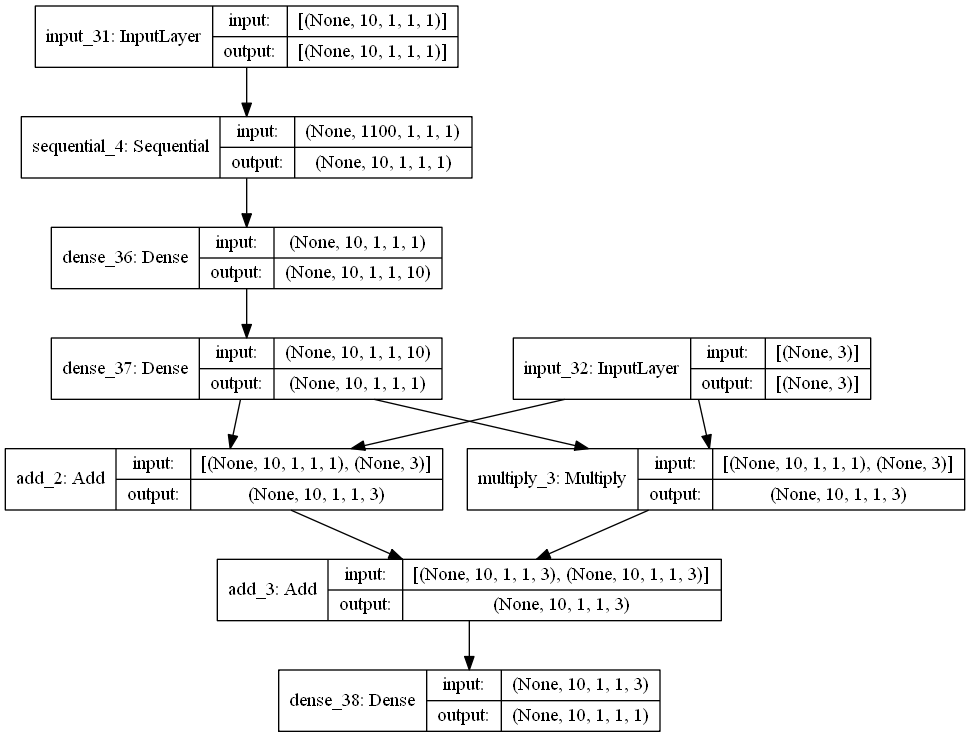

In [197]:
from keras.utils.vis_utils import plot_model

plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

In [198]:
yhat = yhat.flatten()

In [199]:
yhat

array([  0.     ,   0.     ,   0.     , ..., 303.13446, 303.13446,
       303.13446], dtype=float32)

In [204]:
train_y = train_y.values.flatten()

In [205]:
yhat = yhat[0:1100]

In [206]:
df = pd.DataFrame(data={'year': datadd, 
                        'predict': yhat, 
                        'fact': train_y})

<AxesSubplot:label='4d8e2322-b2db-4e9c-8e5f-1817059011a0'>

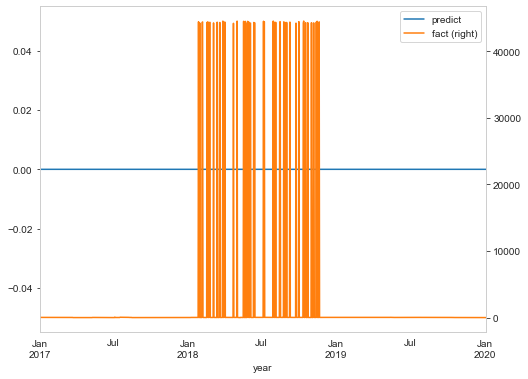

In [207]:
fig, ax = plt.subplots() # Create the figure and axes object

# Plot the first x and y axes:
df.plot(x = 'year', y = 'predict', ax = ax) 
# Plot the second x and y axes. By secondary_y = True a second y-axis is requested:
# (see https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.plot.html for details)
df.plot(x = 'year', y = 'fact', ax = ax, secondary_y = True)

In [208]:
print("Fit model on training data")
history = history = model.fit([train_X_LSTM, train_X_MLP], train_y_LSTM, batch_size=64, epochs=10, validation_split=0.1)

Fit model on training data
Epoch 1/10
16/16 [==============================] - 5s 320ms/step - loss: 2349.8486 - val_loss: 188.0927
Epoch 2/10
16/16 [==============================] - 5s 318ms/step - loss: 2349.8481 - val_loss: 188.0929
Epoch 3/10
16/16 [==============================] - 5s 317ms/step - loss: 2349.8479 - val_loss: 188.0930
Epoch 4/10
16/16 [==============================] - 5s 314ms/step - loss: 2349.8489 - val_loss: 188.0932
Epoch 5/10
16/16 [==============================] - 5s 317ms/step - loss: 2349.8484 - val_loss: 188.0927
Epoch 6/10
16/16 [==============================] - 5s 315ms/step - loss: 2349.8479 - val_loss: 188.0932
Epoch 7/10
16/16 [==============================] - 5s 313ms/step - loss: 2349.8484 - val_loss: 188.0932
Epoch 8/10
16/16 [==============================] - 5s 314ms/step - loss: 2349.8484 - val_loss: 188.0927
Epoch 9/10
16/16 [==============================] - 5s 311ms/step - loss: 2349.8481 - val_loss: 188.0924
Epoch 10/10
16/16 [=========

In [209]:
# Evaluate the model on the test data using `evaluate`
print("Evaluate on test data")
results = model.evaluate([train_X_LSTM, train_X_MLP], train_y_LSTM, batch_size=64)
print("test loss, test acc:", results)



Evaluate on test data
18/18 [==============================] - 2s 86ms/step - loss: 2133.5862
test loss, test acc: 2133.586181640625


In [210]:
yhat = model.predict([train_X_LSTM, train_X_MLP], verbose=0)

In [211]:
yhat

array([[[[[  0.     ]]],


        [[[  0.     ]]],


        [[[  0.     ]]],


        ...,


        [[[  0.     ]]],


        [[[  0.     ]]],


        [[[  0.     ]]]],



       [[[[  0.     ]]],


        [[[  0.     ]]],


        [[[  0.     ]]],


        ...,


        [[[  0.     ]]],


        [[[  0.     ]]],


        [[[  0.     ]]]],



       [[[[  0.     ]]],


        [[[  0.     ]]],


        [[[  0.     ]]],


        ...,


        [[[  0.     ]]],


        [[[  0.     ]]],


        [[[  0.     ]]]],



       ...,



       [[[[297.7934 ]]],


        [[[297.79   ]]],


        [[[297.79   ]]],


        ...,


        [[[297.79   ]]],


        [[[297.79   ]]],


        [[[297.79   ]]]],



       [[[[299.78186]]],


        [[[299.7785 ]]],


        [[[299.7785 ]]],


        ...,


        [[[299.7785 ]]],


        [[[299.7785 ]]],


        [[[299.7785 ]]]],



       [[[[303.14145]]],


        [[[303.13867]]],


        [[[303.13446]]],


        .

In [212]:
from sklearn.metrics import r2_score

yhat = yhat.flatten()
yhat = yhat[0:1100]
r2_score(train_y, yhat, multioutput='variance_weighted')

-0.050538144934642266

In [213]:
MEAN = np.mean(np.abs((train_y - yhat) / train_y)) * 100

<ipython-input-213-7a9614629d16>:1: RuntimeWarning: invalid value encountered in true_divide
  MEAN = np.mean(np.abs((train_y - yhat) / train_y)) * 100


In [215]:
MEAN

nan

In [63]:
def build_model(input_timesteps, output_timesteps, num_links, num_inputs):
    # COPY PASTA
    # https://github.com/niklascp/bus-arrival-convlstm/blob/master/jupyter/ConvLSTM_3x15min_10x64-5x64-10x64-5x64-Comparison.ipynb
    
    model = Sequential()
    model.add(BatchNormalization(name = 'batch_norm_0', input_shape = (input_timesteps, num_inputs, 1, 1)))
    model.add(ConvLSTM2D(name ='conv_lstm_1',
                         filters = 64, kernel_size = (10, 1),                       
                         padding = 'same', 
                         return_sequences = True))
    
    model.add(Dropout(0.30, name = 'dropout_1'))
    model.add(BatchNormalization(name = 'batch_norm_1'))

    model.add(ConvLSTM2D(name ='conv_lstm_2',
                         filters = 64, kernel_size = (5, 1), 
                         padding='same',
                         return_sequences = False))
    
    model.add(Dropout(0.20, name = 'dropout_2'))
    model.add(BatchNormalization(name = 'batch_norm_2'))
    
    model.add(Flatten())
    model.add(RepeatVector(output_timesteps))
    model.add(Reshape((output_timesteps, num_inputs, 1, 64)))
    
    model.add(ConvLSTM2D(name ='conv_lstm_3',
                         filters = 64, kernel_size = (10, 1), 
                         padding='same',
                         return_sequences = True))
    
    model.add(Dropout(0.20, name = 'dropout_3'))
    model.add(BatchNormalization(name = 'batch_norm_3'))
    model.add(ConvLSTM2D(name ='conv_lstm_4',
                         filters = 64, kernel_size = (10, 1), 
                         padding='same',
                         return_sequences = True))
    
    model.add(Dropout(0.20, name = 'dropout_4'))
    model.add(BatchNormalization(name = 'batch_norm_4'))
    model.add(ConvLSTM2D(name ='conv_lstm_5',
                         filters = 64, kernel_size = (10, 1), 
                         padding='same',
                         return_sequences = True))
    
    model.add(Dropout(0.20, name = 'dropout_5'))
    model.add(BatchNormalization(name = 'batch_norm_5'))
    
    model.add(ConvLSTM2D(name ='conv_lstm_6',
                         filters = 64, kernel_size = (5, 1), 
                         padding='same',
                         return_sequences = True))
    
    model.add(TimeDistributed(Dense(units=1, name = 'dense_1', activation = 'relu')))
    model.add(Dense(units=1, name = 'dense_2', activation = 'linear'))

#     optimizer = RMSprop() #lr=0.0001, rho=0.9, epsilon=1e-08, decay=0.9)
#     optimizer = tf.keras.optimizers.Adam(0.1)
    optimizer = tf.keras.optimizers.RMSprop(lr=0.004, clipvalue=1.0)
    model.compile(loss = "mse", optimizer = optimizer, metrics = ['mae', 'mse'])
    return model

In [217]:
import numpy as np
import pandas as pd

#data = data['bhp_pump_press','liq_vol','AKSH_214','AKSH_240','AKSH_220','AKSH_241','AKSH_221','AKSH_247','AKSH_217','AKSH_250','AKSH_424','AKSH_225','AKSH_249','AKSH_299']
df = data

df.columns= ['bhp_pump_press','liq_vol','AKSH_214','AKSH_240','AKSH_220','AKSH_241','AKSH_221','AKSH_247','AKSH_217','AKSH_250','AKSH_424','AKSH_225','AKSH_249','AKSH_299']
#train_X=train_df.drop(['var1(t)'],axis=1)
train_y=df[['liq_vol']]
train_X=df


train_X_LSTM=train_X[train_X.columns[:10]].reset_index(drop=True).values
train_X_LSTM=train_X_LSTM.reshape(1100, 10, 1,1,1)

train_y_LSTM=train_y.values

train_X_MLP=train_X[train_X.columns[-3:]].reset_index(drop=True).values
train_X_MLP=train_X_MLP.reshape(1100, 3, 1)



train_y_MLP=train_y.values

from tensorflow.keras.layers import Input, LSTM, Dense, Concatenate
from tensorflow.keras.models import Model


#lstm input shape
lstm_input = Input(shape=train_X_LSTM.shape[1:])
#lstm units
hidden1 = build_model(1100,10,1,1)(lstm_input)
hidden2 = Dense(10, activation='relu')(hidden1)
#lstm output which will be predicted var1 at t=t
lstm_output = Dense(1, activation='sigmoid')(hidden2)
#mlp input with additonal 3 variables at t=t
mlp_input=Input(shape=(train_X_MLP.shape[1]))
#combine the lstm output which is predicted var1 at t=t and key in var2,var3,var4 at t=t
x = Add()([lstm_output, mlp_input])
y = Multiply()([lstm_output, mlp_input])
z = Add()([x, y])
#mlp model output which is predicted var1 at t=t
mlp_out = Dense(1, activation='relu')(z)
#final output of combined model which is predicted var1 at t=t
model = Model(inputs=[lstm_input, mlp_input],outputs=mlp_out)
#compile the model
model.compile(loss='mae', optimizer='adam')
#fit the model
model.fit([train_X_LSTM, train_X_MLP], train_y_LSTM, batch_size=64, epochs=100, validation_split=0.1)

Epoch 1/100
16/16 [==============================] - 29s 650ms/step - loss: 2368.0600 - val_loss: 18.5004
Epoch 2/100
16/16 [==============================] - 9s 533ms/step - loss: 2671.9816 - val_loss: 17.7738
Epoch 3/100
16/16 [==============================] - 9s 533ms/step - loss: 2563.9735 - val_loss: 17.0479
Epoch 4/100
16/16 [==============================] - 8s 525ms/step - loss: 2520.4208 - val_loss: 16.4814
Epoch 5/100
16/16 [==============================] - 8s 528ms/step - loss: 2816.4719 - val_loss: 15.9383
Epoch 6/100
16/16 [==============================] - 9s 533ms/step - loss: 2572.9845 - val_loss: 15.5496
Epoch 7/100
16/16 [==============================] - 8s 529ms/step - loss: 2408.4556 - val_loss: 15.1304
Epoch 8/100
16/16 [==============================] - 8s 526ms/step - loss: 2109.1766 - val_loss: 14.7438
Epoch 9/100
16/16 [==============================] - 8s 530ms/step - loss: 2713.9735 - val_loss: 14.3632
Epoch 10/100
16/16 [==============================] - 

In [498]:
yhat = model.predict([train_X_LSTM, train_X_MLP], verbose=1)

35/35 [==============================] - 2s 65ms/step


In [ ]:
from keras.utils.vis_utils import plot_model

plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

In [499]:
yhat

array([[[[[  0.     ]]],


        [[[  0.     ]]],


        [[[  0.     ]]],


        ...,


        [[[  0.     ]]],


        [[[  0.     ]]],


        [[[  0.     ]]]],



       [[[[  0.     ]]],


        [[[  0.     ]]],


        [[[  0.     ]]],


        ...,


        [[[  0.     ]]],


        [[[  0.     ]]],


        [[[  0.     ]]]],



       [[[[  0.     ]]],


        [[[  0.     ]]],


        [[[  0.     ]]],


        ...,


        [[[  0.     ]]],


        [[[  0.     ]]],


        [[[  0.     ]]]],



       ...,



       [[[[321.86066]]],


        [[[361.00558]]],


        [[[391.7122 ]]],


        ...,


        [[[401.5516 ]]],


        [[[401.5509 ]]],


        [[[401.54358]]]],



       [[[[324.26328]]],


        [[[363.74188]]],


        [[[394.65445]]],


        ...,


        [[[404.52795]]],


        [[[404.5276 ]]],


        [[[404.5205 ]]]],



       [[[[327.42294]]],


        [[[367.65094]]],


        [[[398.64352]]],


        .

In [502]:
yhat = yhat.flatten()
train_y = train_y.values.flatten()


In [504]:
yhat = yhat[0:1100]

In [505]:
df = pd.DataFrame(data={'year': datadd, 
                        'predict': yhat, 
                        'fact': train_y})

<AxesSubplot:label='678055a5-fc8d-45ef-badc-edc5144f66c9'>

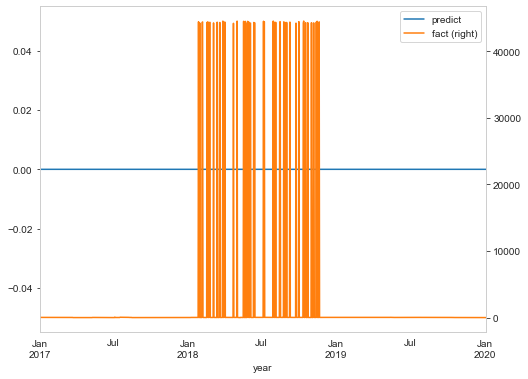

In [506]:
fig, ax = plt.subplots() # Create the figure and axes object

# Plot the first x and y axes:
df.plot(x = 'year', y = 'predict', ax = ax) 
# Plot the second x and y axes. By secondary_y = True a second y-axis is requested:
# (see https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.plot.html for details)
df.plot(x = 'year', y = 'fact', ax = ax, secondary_y = True)

In [526]:
import numpy as np
import pandas as pd

#data = data['bhp_pump_press','liq_vol','AKSH_214','AKSH_240','AKSH_220','AKSH_241','AKSH_221','AKSH_247','AKSH_217','AKSH_250','AKSH_424','AKSH_225','AKSH_249','AKSH_299']
df = data

df.columns= ['bhp_pump_press','liq_vol','AKSH_214','AKSH_240','AKSH_220','AKSH_241','AKSH_221','AKSH_247','AKSH_217','AKSH_250','AKSH_424','AKSH_225','AKSH_249','AKSH_299']
#train_X=train_df.drop(['var1(t)'],axis=1)
train_y=df[['liq_vol','bhp_pump_press']]
train_X=df


train_X_LSTM=train_X[train_X.columns[:10]].reset_index(drop=True).values
train_X_LSTM=train_X_LSTM.reshape(1100, 10, 1,1,1)

train_y_LSTM=train_y.values

train_X_MLP=train_X[train_X.columns[-3:]].reset_index(drop=True).values
train_X_MLP=train_X_MLP.reshape(1100, 3, 1)



train_y_MLP=train_y.values

from tensorflow.keras.layers import Input, LSTM, Dense, Concatenate
from tensorflow.keras.models import Model


#lstm input shape
lstm_input = Input(shape=train_X_LSTM.shape[1:])
#lstm units
hidden1 = build_model(1100,10,1,1)(lstm_input)
hidden2 = Dense(10, activation='relu')(hidden1)
#lstm output which will be predicted var1 at t=t
lstm_output = Dense(1, activation='sigmoid')(hidden2)
#mlp input with additonal 3 variables at t=t
mlp_input=Input(shape=(train_X_MLP.shape[1]))
#combine the lstm output which is predicted var1 at t=t and key in var2,var3,var4 at t=t
x = Add()([lstm_output, mlp_input])
y = Multiply()([lstm_output, mlp_input])
z = Add()([x, y])
#mlp model output which is predicted var1 at t=t
mlp_out = Dense(2, activation='relu')(z)
#final output of combined model which is predicted var1 at t=t
model = Model(inputs=[lstm_input, mlp_input],outputs=mlp_out)
#compile the model
model.compile(loss='mae', optimizer='adam')
#fit the model
model.fit([train_X_LSTM, train_X_MLP], train_y_LSTM, batch_size=64, epochs=100, validation_split=0.1)

Epoch 1/100
16/16 [==============================] - 24s 470ms/step - loss: 1294.8171 - val_loss: 103.1023
Epoch 2/100
16/16 [==============================] - 6s 368ms/step - loss: 1197.3863 - val_loss: 103.0240
Epoch 3/100
16/16 [==============================] - 6s 366ms/step - loss: 1171.8573 - val_loss: 103.2635
Epoch 4/100
16/16 [==============================] - 6s 368ms/step - loss: 1018.6984 - val_loss: 103.6768
Epoch 5/100
16/16 [==============================] - 6s 366ms/step - loss: 1103.9332 - val_loss: 104.0733
Epoch 6/100
16/16 [==============================] - 6s 367ms/step - loss: 1175.0266 - val_loss: 104.0972
Epoch 7/100
16/16 [==============================] - 6s 367ms/step - loss: 1021.5689 - val_loss: 104.3389
Epoch 8/100
16/16 [==============================] - 6s 367ms/step - loss: 1185.9863 - val_loss: 104.5688
Epoch 9/100
16/16 [==============================] - 6s 366ms/step - loss: 1263.1555 - val_loss: 104.9630
Epoch 10/100
16/16 [=========================

16/16 [==============================] - 6s 367ms/step - loss: 1213.1120 - val_loss: 122.3083
Epoch 65/100
16/16 [==============================] - 6s 366ms/step - loss: 1005.1844 - val_loss: 123.1114
Epoch 66/100
16/16 [==============================] - 6s 367ms/step - loss: 1024.8750 - val_loss: 123.8912
Epoch 67/100
16/16 [==============================] - 6s 367ms/step - loss: 1335.9535 - val_loss: 124.5548
Epoch 68/100
16/16 [==============================] - 6s 367ms/step - loss: 1222.7638 - val_loss: 125.4646
Epoch 69/100
16/16 [==============================] - 6s 367ms/step - loss: 1337.1532 - val_loss: 126.0470
Epoch 70/100
16/16 [==============================] - 6s 365ms/step - loss: 1033.5134 - val_loss: 126.9114
Epoch 71/100
16/16 [==============================] - 6s 367ms/step - loss: 1159.9765 - val_loss: 127.6780
Epoch 72/100
16/16 [==============================] - 6s 367ms/step - loss: 1046.7483 - val_loss: 128.2787
Epoch 73/100
16/16 [==============================

In [527]:
yhat = model.predict([train_X_LSTM, train_X_MLP], verbose=0)
print(yhat)

[[[[[ 19.119593   0.      ]]]


  [[[ 19.119593   0.      ]]]


  [[[ 19.119593   0.      ]]]


  ...


  [[[ 19.119593   0.      ]]]


  [[[ 19.119593   0.      ]]]


  [[[ 19.119593   0.      ]]]]



 [[[[ 18.191734   0.      ]]]


  [[[ 18.191734   0.      ]]]


  [[[ 18.191734   0.      ]]]


  ...


  [[[ 18.191734   0.      ]]]


  [[[ 18.191734   0.      ]]]


  [[[ 18.191734   0.      ]]]]



 [[[[ 19.607008   0.      ]]]


  [[[ 19.607008   0.      ]]]


  [[[ 19.607008   0.      ]]]


  ...


  [[[ 19.607008   0.      ]]]


  [[[ 19.607008   0.      ]]]


  [[[ 19.607008   0.      ]]]]



 ...



 [[[[409.1999     0.      ]]]


  [[[409.1999     0.      ]]]


  [[[409.1999     0.      ]]]


  ...


  [[[409.1999     0.      ]]]


  [[[409.1999     0.      ]]]


  [[[409.1999     0.      ]]]]



 [[[[411.16202    0.      ]]]


  [[[411.16202    0.      ]]]


  [[[411.16202    0.      ]]]


  ...


  [[[411.16202    0.      ]]]


  [[[411.16202    0.      ]]]


  [[[411.16202  

In [ ]:

plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

In [529]:
from sklearn.metrics import r2_score

yhat = yhat.flatten()
train_y = train_y.values.flatten()



In [531]:
yhat = yhat[0:1100]
train_y = train_y[0:1100]

r2_score(train_y, yhat, multioutput='variance_weighted')

-0.02606379124324043

In [534]:
df = pd.DataFrame(data={'year': datadd, 
                        'predict': yhat, 
                        'fact': train_y})

<AxesSubplot:label='209c053f-51dd-4757-b08c-cca6af88f491'>

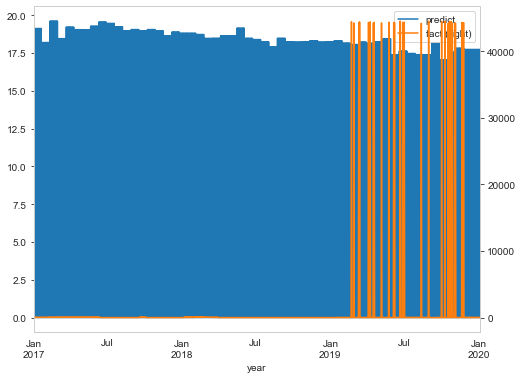

In [535]:
fig, ax = plt.subplots() # Create the figure and axes object

# Plot the first x and y axes:
df.plot(x = 'year', y = 'predict', ax = ax) 
# Plot the second x and y axes. By secondary_y = True a second y-axis is requested:
# (see https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.plot.html for details)
df.plot(x = 'year', y = 'fact', ax = ax, secondary_y = True)

In [223]:
import numpy as np
import pandas as pd

#data = data['bhp_pump_press','liq_vol','AKSH_214','AKSH_240','AKSH_220','AKSH_241','AKSH_221','AKSH_247','AKSH_217','AKSH_250','AKSH_424','AKSH_225','AKSH_249','AKSH_299']
df = data

df.columns= ['bhp_pump_press','liq_vol','AKSH_214','AKSH_240','AKSH_220','AKSH_241','AKSH_221','AKSH_247','AKSH_217','AKSH_250','AKSH_424','AKSH_225','AKSH_249','AKSH_299']
#train_X=train_df.drop(['var1(t)'],axis=1)
train_y=df[['liq_vol','bhp_pump_press']]
train_X=df


train_X_LSTM=train_X[train_X.columns[:10]].reset_index(drop=True).values
train_X_LSTM=train_X_LSTM.reshape(1100, 10, 1,1,1)

train_y_LSTM=train_y.values

train_X_MLP=train_X[train_X.columns[-3:]].reset_index(drop=True).values
train_X_MLP=train_X_MLP.reshape(1100, 3, 1)



train_y_MLP=train_y.values

from tensorflow.keras.layers import Input, LSTM, Dense, Concatenate
from tensorflow.keras.models import Model


#lstm input shape
lstm_input = Input(shape=train_X_LSTM.shape[1:])
#lstm units
hidden1 = build_model(1100,10,1,1)(lstm_input)
hidden2 = build_model(1100,3,1,1)(hidden1)
#lstm output which will be predicted var1 at t=t
lstm_output = Dense(1, activation='sigmoid')(hidden2)
#mlp input with additonal 3 variables at t=t
mlp_input=Input(shape=(train_X_MLP.shape[1]))


#combine the lstm output which is predicted var1 at t=t and key in var2,var3,var4 at t=t
x = Add()([lstm_output, mlp_input])
y = Multiply()([lstm_output, mlp_input])
z = Add()([x, y])
#mlp model output which is predicted var1 at t=t
mlp_out = Dense(2, activation='relu')(z)
#final output of combined model which is predicted var1 at t=t
model = Model(inputs=[lstm_input, mlp_input],outputs=mlp_out)
#compile the model
model.compile(loss='mae', optimizer='adam')
#fit the model
model.fit([train_X_LSTM, train_X_MLP], train_y_LSTM, batch_size=64, epochs=100, validation_split=0.1)

Epoch 1/100
16/16 [==============================] - 56s 1s/step - loss: 1360.8910 - val_loss: 42.4045
Epoch 2/100
16/16 [==============================] - 16s 998ms/step - loss: 1219.8716 - val_loss: 41.6450
Epoch 3/100
16/16 [==============================] - 16s 992ms/step - loss: 1131.8920 - val_loss: 41.3255
Epoch 4/100
16/16 [==============================] - 16s 1s/step - loss: 1328.7891 - val_loss: 41.2965
Epoch 5/100
16/16 [==============================] - 16s 1s/step - loss: 1304.2322 - val_loss: 41.2988
Epoch 6/100
16/16 [==============================] - 16s 989ms/step - loss: 1074.1971 - val_loss: 41.3669
Epoch 7/100
16/16 [==============================] - 16s 994ms/step - loss: 1445.3446 - val_loss: 41.2596
Epoch 8/100
16/16 [==============================] - 16s 982ms/step - loss: 1452.3714 - val_loss: 41.2365
Epoch 9/100
16/16 [==============================] - 16s 989ms/step - loss: 1360.1111 - val_loss: 41.0196
Epoch 10/100
16/16 [==============================] - 1

16/16 [==============================] - 16s 981ms/step - loss: 1410.7724 - val_loss: 38.5959
Epoch 52/100
16/16 [==============================] - 16s 979ms/step - loss: 1387.2221 - val_loss: 38.4930
Epoch 53/100
16/16 [==============================] - 16s 982ms/step - loss: 1306.2854 - val_loss: 38.4709
Epoch 54/100
16/16 [==============================] - 16s 984ms/step - loss: 1245.8859 - val_loss: 38.4282
Epoch 55/100
16/16 [==============================] - 16s 980ms/step - loss: 1207.6021 - val_loss: 38.2720
Epoch 56/100
16/16 [==============================] - 16s 982ms/step - loss: 1197.4332 - val_loss: 38.2832
Epoch 57/100
16/16 [==============================] - 16s 991ms/step - loss: 1161.2182 - val_loss: 38.2413
Epoch 58/100
16/16 [==============================] - 16s 980ms/step - loss: 1238.8744 - val_loss: 38.2174
Epoch 59/100
16/16 [==============================] - 16s 981ms/step - loss: 1199.5594 - val_loss: 38.0725
Epoch 60/100
16/16 [==============================

In [ ]:
yhat = model.predict([train_X_LSTM, train_X_MLP], verbose=0)
print(yhat)

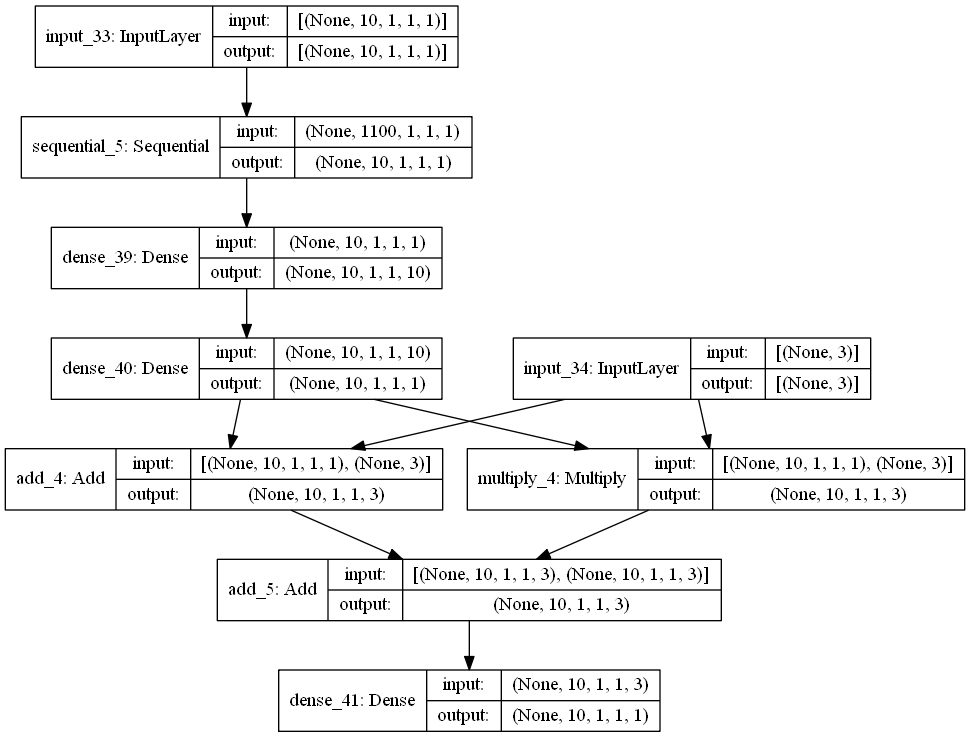

In [218]:

plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

In [224]:
import numpy as np
import pandas as pd

#data = data['bhp_pump_press','liq_vol','AKSH_214','AKSH_240','AKSH_220','AKSH_241','AKSH_221','AKSH_247','AKSH_217','AKSH_250','AKSH_424','AKSH_225','AKSH_249','AKSH_299']
df = data

df.columns= ['bhp_pump_press','liq_vol','AKSH_214','AKSH_240','AKSH_220','AKSH_241','AKSH_221','AKSH_247','AKSH_217','AKSH_250','AKSH_424','AKSH_225','AKSH_249','AKSH_299']
#train_X=train_df.drop(['var1(t)'],axis=1)
train_y=df[['liq_vol','bhp_pump_press']]
train_X=df


train_X_LSTM=train_X[train_X.columns[:10]].reset_index(drop=True).values
train_X_LSTM=train_X_LSTM.reshape(1100, 10, 1,1,1)

train_y_LSTM=train_y.values

train_X_MLP=train_X[train_X.columns[-3:]].reset_index(drop=True).values
train_X_MLP=train_X_MLP.reshape(1100, 3, 1)



train_y_MLP=train_y.values

from tensorflow.keras.layers import Input, LSTM, Dense, Concatenate
from tensorflow.keras.models import Model


#lstm input shape
lstm_input = Input(shape=train_X_LSTM.shape[1:])
#lstm units
hidden1 = build_model(1100,10,1,1)(lstm_input)
hidden2 = build_model(1100,3,1,1)(hidden1)
#lstm output which will be predicted var1 at t=t
lstm_output = Dense(1, activation='sigmoid')(hidden2)
#mlp input with additonal 3 variables at t=t
mlp_input=Input(shape=(train_X_MLP.shape[1]))
#combine the lstm output which is predicted var1 at t=t and key in var2,var3,var4 at t=t
x = Add()([lstm_output, mlp_input])
y = Multiply()([lstm_output, mlp_input])
z = Subtract()([x, y])
#mlp model output which is predicted var1 at t=t
mlp_out = Dense(1, activation='relu')(z)
#final output of combined model which is predicted var1 at t=t
model = Model(inputs=[lstm_input, mlp_input],outputs=mlp_out)
#compile the model
model.compile(loss='mae', optimizer='adam')
#fit the model
model.fit([train_X_LSTM, train_X_MLP], train_y_LSTM, batch_size=64, epochs=100, validation_split=0.1)

Epoch 1/100
16/16 [==============================] - 62s 1s/step - loss: 1202.4207 - val_loss: 40.1883
Epoch 2/100
16/16 [==============================] - 18s 1s/step - loss: 1183.7176 - val_loss: 40.1883
Epoch 3/100
16/16 [==============================] - 17s 1s/step - loss: 1061.3637 - val_loss: 40.1883
Epoch 4/100
16/16 [==============================] - 17s 1s/step - loss: 1203.1277 - val_loss: 40.1883
Epoch 5/100
16/16 [==============================] - 17s 1s/step - loss: 1106.3888 - val_loss: 40.1883
Epoch 6/100
16/16 [==============================] - 17s 1s/step - loss: 942.5390 - val_loss: 40.1883
Epoch 7/100
16/16 [==============================] - 17s 1s/step - loss: 1305.8072 - val_loss: 40.1883
Epoch 8/100
16/16 [==============================] - 17s 1s/step - loss: 1118.4466 - val_loss: 40.1883
Epoch 9/100
16/16 [==============================] - 17s 1s/step - loss: 1159.3984 - val_loss: 40.1883
Epoch 10/100
16/16 [==============================] - 17s 1s/step - loss: 

In [225]:
yhat = model.predict([train_X_LSTM, train_X_MLP], verbose=0)
print(yhat)

[[[[[0.]]]


  [[[0.]]]


  [[[0.]]]]



 [[[[0.]]]


  [[[0.]]]


  [[[0.]]]]



 [[[[0.]]]


  [[[0.]]]


  [[[0.]]]]



 ...



 [[[[0.]]]


  [[[0.]]]


  [[[0.]]]]



 [[[[0.]]]


  [[[0.]]]


  [[[0.]]]]



 [[[[0.]]]


  [[[0.]]]


  [[[0.]]]]]


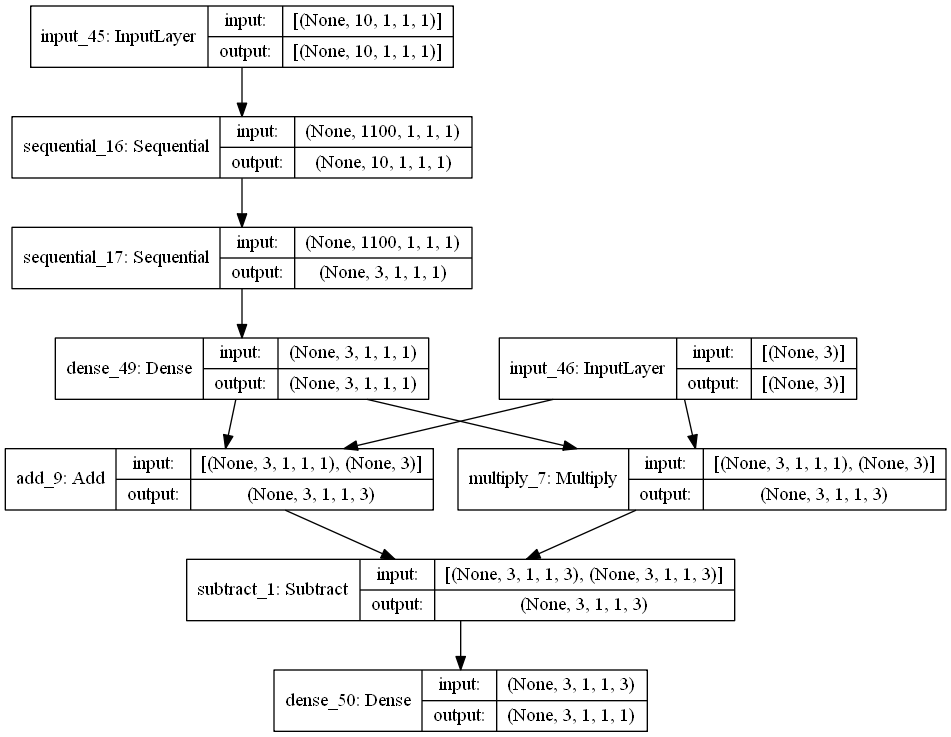

In [226]:

plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

In [227]:
yhat = yhat.flatten()
train_y = train_y.values.flatten()

In [228]:
yhat = yhat[0:1100]
train_y = train_y[0:1100]

r2_score(train_y, yhat, multioutput='variance_weighted')

-0.026887129923853115

In [229]:
df = pd.DataFrame(data={'year': datadd, 
                        'predict': yhat, 
                        'fact': train_y})

<AxesSubplot:label='e2a01388-4809-4b57-9b31-bd83eb07b94e'>

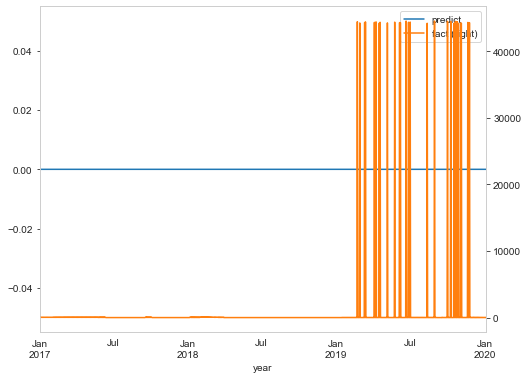

In [230]:
fig, ax = plt.subplots() # Create the figure and axes object

# Plot the first x and y axes:
df.plot(x = 'year', y = 'predict', ax = ax) 
# Plot the second x and y axes. By secondary_y = True a second y-axis is requested:
# (see https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.plot.html for details)
df.plot(x = 'year', y = 'fact', ax = ax, secondary_y = True)

In [231]:
df = pd.DataFrame(data={'year': datadd, 
                        'predict': yhat, 
                        'fact': train_y})

<AxesSubplot:label='8ffcf43c-b1f2-4f45-9d85-fb1d9f133774'>

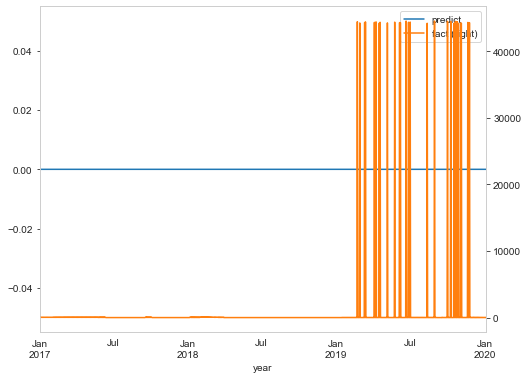

In [232]:
fig, ax = plt.subplots() # Create the figure and axes object

# Plot the first x and y axes:
df.plot(x = 'year', y = 'predict', ax = ax) 
# Plot the second x and y axes. By secondary_y = True a second y-axis is requested:
# (see https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.plot.html for details)
df.plot(x = 'year', y = 'fact', ax = ax, secondary_y = True)

In [236]:
import numpy as np
import pandas as pd

#data = data['bhp_pump_press','liq_vol','AKSH_214','AKSH_240','AKSH_220','AKSH_241','AKSH_221','AKSH_247','AKSH_217','AKSH_250','AKSH_424','AKSH_225','AKSH_249','AKSH_299']
df = data

df.columns= ['bhp_pump_press','liq_vol','AKSH_214','AKSH_240','AKSH_220','AKSH_241','AKSH_221','AKSH_247','AKSH_217','AKSH_250','AKSH_424','AKSH_225','AKSH_249','AKSH_299']
#train_X=train_df.drop(['var1(t)'],axis=1)
train_y=df[['liq_vol','bhp_pump_press']]
train_X=df


train_X_LSTM=train_X[train_X.columns[:10]].reset_index(drop=True).values
train_X_LSTM=train_X_LSTM.reshape(1100, 10, 1,1,1)

train_y_LSTM=train_y.values

train_X_MLP=train_X[train_X.columns[-3:]].reset_index(drop=True).values
train_X_MLP=train_X_MLP.reshape(1100, 3, 1)



train_y_MLP=train_y.values

from tensorflow.keras.layers import Input, LSTM, Dense, Concatenate
from tensorflow.keras.models import Model

#lstm input shape
lstm_input = Input(shape=train_X_LSTM.shape[1:])
#lstm units
hidden1 = build_model(1100,10,1,1)(lstm_input)
hidden2 = build_model(1100,10,1,1)(hidden1)
#lstm output which will be predicted var1 at t=t
lstm_output = Dense(1, activation='sigmoid')(hidden2)
#mlp input with additonal 3 variables at t=t
mlp_input=Input(shape=(train_X_MLP.shape[1]))
#combine the lstm output which is predicted var1 at t=t and key in var2,var3,var4 at t=t
x = Add()([lstm_output, mlp_input])
y = Multiply()([lstm_output, mlp_input])
z = Subtract()([x, y])
#mlp model output which is predicted var1 at t=t
mlp_out = Dense(2, activation='relu')(z)
#final output of combined model which is predicted var1 at t=t
model = Model(inputs=[lstm_input, mlp_input],outputs=mlp_out)
#compile the model
model.compile(loss='mae', optimizer='adam')
#fit the model
model.fit([train_X_LSTM, train_X_MLP], train_y_LSTM, batch_size=64, epochs=100, validation_split=0.1)

Epoch 1/100
16/16 [==============================] - 76s 2s/step - loss: 1162.4371 - val_loss: 68.9987
Epoch 2/100
16/16 [==============================] - 35s 2s/step - loss: 1354.6816 - val_loss: 67.6088
Epoch 3/100
16/16 [==============================] - 35s 2s/step - loss: 1365.7270 - val_loss: 66.2510
Epoch 4/100
16/16 [==============================] - 35s 2s/step - loss: 1106.3210 - val_loss: 64.8113
Epoch 5/100
16/16 [==============================] - 35s 2s/step - loss: 1322.3895 - val_loss: 63.4005
Epoch 6/100
16/16 [==============================] - 35s 2s/step - loss: 1209.3549 - val_loss: 61.9889
Epoch 7/100
16/16 [==============================] - 35s 2s/step - loss: 1218.7300 - val_loss: 60.6518
Epoch 8/100
16/16 [==============================] - 35s 2s/step - loss: 1081.8060 - val_loss: 59.2608
Epoch 9/100
16/16 [==============================] - 35s 2s/step - loss: 1271.1712 - val_loss: 57.8425
Epoch 10/100
16/16 [==============================] - 35s 2s/step - loss:

In [234]:
yhat = model.predict([train_X_LSTM, train_X_MLP], verbose=0)
print(yhat)

[[[[[ 0.       26.073513]]]


  [[[ 0.       26.073513]]]


  [[[ 0.       26.073513]]]]



 [[[[ 0.       24.944937]]]


  [[[ 0.       24.944937]]]


  [[[ 0.       24.944937]]]]



 [[[[ 0.       26.850594]]]


  [[[ 0.       26.850594]]]


  [[[ 0.       26.850594]]]]



 ...



 [[[[ 0.        0.      ]]]


  [[[ 0.        0.      ]]]


  [[[ 0.        0.      ]]]]



 [[[[ 0.        0.      ]]]


  [[[ 0.        0.      ]]]


  [[[ 0.        0.      ]]]]



 [[[[ 0.        0.      ]]]


  [[[ 0.        0.      ]]]


  [[[ 0.        0.      ]]]]]


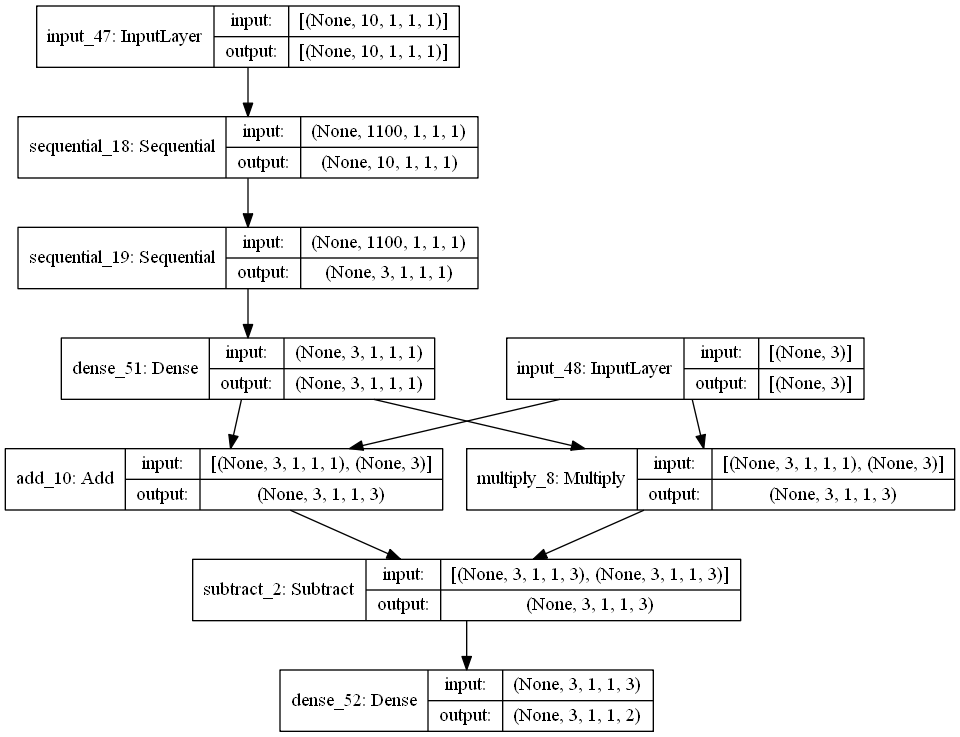

In [235]:
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

In [242]:
import numpy as np
import pandas as pd

#data = data['bhp_pump_press','liq_vol','AKSH_214','AKSH_240','AKSH_220','AKSH_241','AKSH_221','AKSH_247','AKSH_217','AKSH_250','AKSH_424','AKSH_225','AKSH_249','AKSH_299']
df = data

df.columns= ['bhp_pump_press','liq_vol','AKSH_214','AKSH_240','AKSH_220','AKSH_241','AKSH_221','AKSH_247','AKSH_217','AKSH_250','AKSH_424','AKSH_225','AKSH_249','AKSH_299']
#train_X=train_df.drop(['var1(t)'],axis=1)
train_y=df[['liq_vol','bhp_pump_press']]
train_X=df


train_X_LSTM=train_X[train_X.columns[:10]].reset_index(drop=True).values
train_X_LSTM=train_X_LSTM.reshape(1100, 10,1,1,1)

train_y_LSTM=train_y.values

train_X_MLP=train_X[train_X.columns[-3:]].reset_index(drop=True).values
train_X_MLP=train_X_MLP.reshape(1100, 3,1,1,1)



train_y_MLP=train_y.values

from tensorflow.keras.layers import Input, LSTM, Dense, Concatenate
from tensorflow.keras.models import Model

#lstm input shape
lstm_input = Input(shape=train_X_LSTM.shape[1:])
#lstm units
hidden1 = build_model(1100,10,1,1)(lstm_input)
hidden2 = build_model(1100,10,1,1)(hidden1)
#lstm output which will be predicted var1 at t=t
lstm_output = Dense(1, activation='sigmoid')(hidden2)
#mlp input with additonal 3 variables at t=t
mlp_input=Input(shape=(train_X_MLP.shape[1:]))
hidden3 = build_model(1100,10,1,1)(mlp_input)
hidden4 = build_model(1100,10,1,1)(hidden3)

#combine the lstm output which is predicted var1 at t=t and key in var2,var3,var4 at t=t
x = Add()([lstm_output, hidden4])
y = Multiply()([lstm_output, hidden4])
z = Subtract()([x, y])
#mlp model output which is predicted var1 at t=t
mlp_out = Dense(2, activation='relu')(z)
#final output of combined model which is predicted var1 at t=t
model = Model(inputs=[lstm_input, mlp_input],outputs=mlp_out)
#compile the model
model.compile(loss='mae', optimizer='adam')
#fit the model
model.fit([train_X_LSTM, train_X_MLP], train_y_LSTM, batch_size=64, epochs=100, validation_split=0.1)

Epoch 1/100
16/16 [==============================] - 203s 8s/step - loss: 1274.5423 - val_loss: 38.9551
Epoch 2/100
16/16 [==============================] - 99s 6s/step - loss: 1239.4998 - val_loss: 37.1635
Epoch 3/100
16/16 [==============================] - 89s 6s/step - loss: 1109.2432 - val_loss: 34.1589
Epoch 4/100
16/16 [==============================] - 87s 5s/step - loss: 1167.8071 - val_loss: 32.6631
Epoch 5/100
16/16 [==============================] - 88s 6s/step - loss: 1249.4145 - val_loss: 31.3798
Epoch 6/100
16/16 [==============================] - 88s 5s/step - loss: 1339.5183 - val_loss: 30.1577
Epoch 7/100
16/16 [==============================] - 87s 5s/step - loss: 1427.2816 - val_loss: 29.1624
Epoch 8/100
16/16 [==============================] - 88s 5s/step - loss: 1072.3849 - val_loss: 28.3039
Epoch 9/100
16/16 [==============================] - 87s 5s/step - loss: 1309.7030 - val_loss: 27.4832
Epoch 10/100
16/16 [==============================] - 87s 5s/step - loss

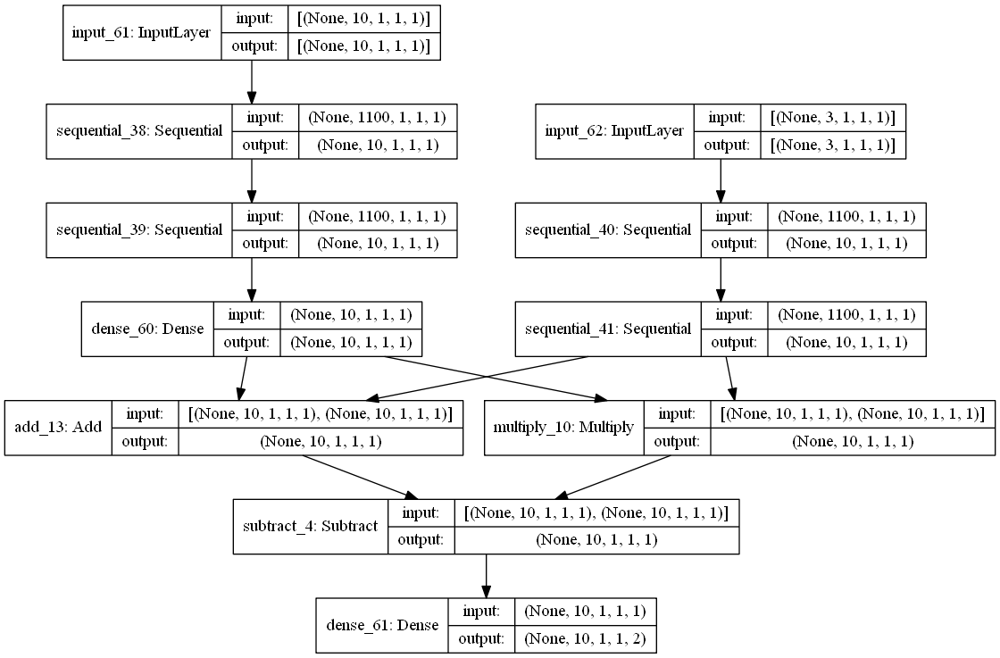

In [243]:
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

In [244]:
yhat = model.predict([train_X_LSTM, train_X_MLP], verbose=0)
print(yhat)

[[[[[19.229061 45.97635 ]]]


  [[[24.179148 57.830696]]]


  [[[24.940054 59.6529  ]]]


  ...


  [[[25.062195 59.9454  ]]]


  [[[25.062235 59.94549 ]]]


  [[[25.062248 59.945526]]]]



 [[[[19.229061 45.97635 ]]]


  [[[24.179148 57.830696]]]


  [[[24.940054 59.6529  ]]]


  ...


  [[[25.062195 59.9454  ]]]


  [[[25.062235 59.94549 ]]]


  [[[25.062248 59.945526]]]]



 [[[[19.229061 45.97635 ]]]


  [[[24.179148 57.830696]]]


  [[[24.940054 59.6529  ]]]


  ...


  [[[25.062195 59.9454  ]]]


  [[[25.062235 59.94549 ]]]


  [[[25.062248 59.945526]]]]



 ...



 [[[[19.229061 45.97635 ]]]


  [[[24.179148 57.830696]]]


  [[[24.940054 59.6529  ]]]


  ...


  [[[25.062195 59.9454  ]]]


  [[[25.062235 59.94549 ]]]


  [[[25.062252 59.945534]]]]



 [[[[19.229061 45.97635 ]]]


  [[[24.179148 57.830696]]]


  [[[24.940054 59.6529  ]]]


  ...


  [[[25.062195 59.9454  ]]]


  [[[25.062235 59.94549 ]]]


  [[[25.062252 59.945534]]]]



 [[[[19.229061 45.97635 ]]]


  [[[24.1791

In [245]:
yhat = yhat.flatten()
train_y = train_y.values.flatten()

In [246]:
yhat = yhat[0:1100]
train_y = train_y[0:1100]

r2_score(train_y, yhat, multioutput='variance_weighted')

-0.025765501947874414

In [247]:
df = pd.DataFrame(data={'year': datadd, 
                        'predict': yhat, 
                        'fact': train_y})

<AxesSubplot:label='3bbf9337-c3c3-49fd-9f33-814cc66a6ded'>

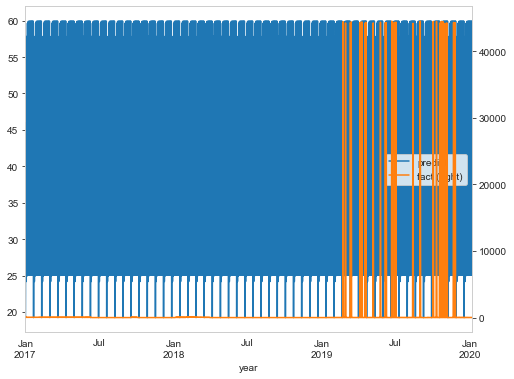

In [248]:
fig, ax = plt.subplots() # Create the figure and axes object

# Plot the first x and y axes:
df.plot(x = 'year', y = 'predict', ax = ax) 
# Plot the second x and y axes. By secondary_y = True a second y-axis is requested:
# (see https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.plot.html for details)
df.plot(x = 'year', y = 'fact', ax = ax, secondary_y = True)

In [ ]:
import numpy as np
import pandas as pd

#data = data['bhp_pump_press','liq_vol','AKSH_214','AKSH_240','AKSH_220','AKSH_241','AKSH_221','AKSH_247','AKSH_217','AKSH_250','AKSH_424','AKSH_225','AKSH_249','AKSH_299']
df = data

df.columns= ['bhp_pump_press','liq_vol','AKSH_214','AKSH_240','AKSH_220','AKSH_241','AKSH_221','AKSH_247','AKSH_217','AKSH_250','AKSH_424','AKSH_225','AKSH_249','AKSH_299']
#train_X=train_df.drop(['var1(t)'],axis=1)
train_y=df[['liq_vol','bhp_pump_press']]
train_X=df


train_X_LSTM=train_X[train_X.columns[:10]].reset_index(drop=True).values
train_X_LSTM=train_X_LSTM.reshape(1100, 10,1,1,1)

train_y_LSTM=train_y.values

train_X_MLP=train_X[train_X.columns[-3:]].reset_index(drop=True).values
train_X_MLP=train_X_MLP.reshape(1100, 3,1,1,1)



train_y_MLP=train_y.values

from tensorflow.keras.layers import Input, LSTM, Dense, Concatenate
from tensorflow.keras.models import Model

#lstm input shape
#lstm input shape
lstm_input = Input(shape=train_X_LSTM.shape[1:])
#lstm units
hidden1 = build_model(1100,10,1,1)(lstm_input)
hidden2 = build_model(1100,10,1,1)(hidden1)
#lstm output which will be predicted var1 at t=t
lstm_output = Dense(1, activation='sigmoid')(hidden2)
#mlp input with additonal 3 variables at t=t
mlp_input=Input(shape=(train_X_MLP.shape[1:]))
hidden3 = build_model(1100,10,1,1)(mlp_input)
hidden4 = build_model(1100,10,1,1)(hidden3)

#combine the lstm output which is predicted var1 at t=t and key in var2,var3,var4 at t=t
x = Add()([lstm_output, hidden4])
y = Multiply()([lstm_output, hidden4])
z = Subtract()([x, y])
#mlp model output which is predicted var1 at t=t
mlp_out = Dense(2, activation='relu')(z)
#final output of combined model which is predicted var1 at t=t
model = Model(inputs=[lstm_input, mlp_input],outputs=mlp_out)
#compile the model
model.compile(loss='mae', optimizer='adam')
#fit the model
model.fit([train_X_LSTM, train_X_MLP], train_y_LSTM, batch_size=64, epochs=100, validation_split=0.1)


array([<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
       <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
       <AxesSubplot:>], dtype=object)

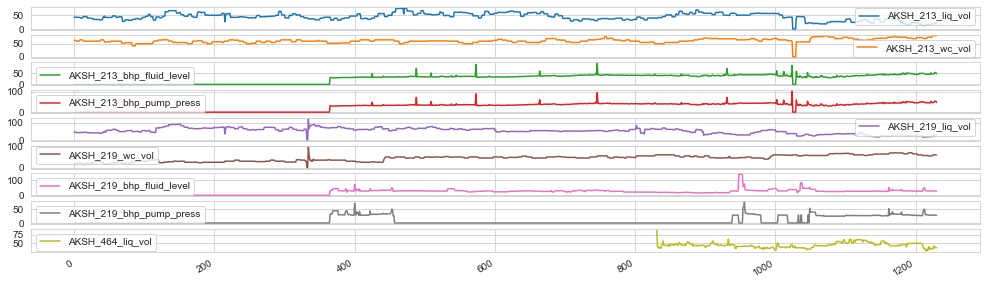

In [37]:
import numpy as np
import pandas as pd


data = pd.read_csv('df_south.csv')
datasd = data.iloc[:,1:11]

datasd.plot(subplots=True)

In [4]:
import numpy as np
import pandas as pd


data2 = pd.read_csv('df_north.csv')

In [5]:
data2.head()

,Unnamed: 0,date,AKSH_227_liq_vol,AKSH_227_wc_vol,AKSH_227_bhp_fluid_level,AKSH_227_bhp_pump_press,AKSH_240_liq_vol,AKSH_240_wc_vol,AKSH_240_bhp_fluid_level,AKSH_240_bhp_pump_press,...,AKSH_225_water_vol,AKSH_225_water_type,AKSH_220_water_vol,AKSH_220_water_type,AKSH_240_water_vol,AKSH_240_water_type,AKSH_217_water_vol,AKSH_217_water_type,AKSH_299_water_vol,AKSH_299_water_type
0,0,2017-01-01,177.07000,90.021,0.0,0.0,NaN,NaN,NaN,NaN,...,213.0,Артезианская вода,94.0,Артезианская вода,NaN,NaN,289.0,Артезианская вода,NaN,NaN
1,1,2017-01-02,190.92374,90.014,0.0,0.0,NaN,NaN,NaN,NaN,...,202.0,Артезианская вода,94.0,Артезианская вода,NaN,NaN,287.0,Артезианская вода,NaN,NaN
2,2,2017-01-03,168.77000,90.004,0.0,0.0,NaN,NaN,NaN,NaN,...,219.0,Артезианская вода,93.0,Артезианская вода,NaN,NaN,286.0,Артезианская вода,NaN,NaN
3,3,2017-01-04,168.17172,89.975,0.0,0.0,NaN,NaN,NaN,NaN,...,205.0,Артезианская вода,94.0,Артезианская вода,NaN,NaN,287.0,Артезианская вода,NaN,NaN
4,4,2017-01-05,168.49000,85.999,0.0,0.0,NaN,NaN,NaN,NaN,...,214.0,Артезианская вода,94.0,Артезианская вода,NaN,NaN,286.0,Артезианская вода,NaN,NaN


In [6]:
data2 = data2.fillna(0)

In [7]:
data2.head()

,Unnamed: 0,date,AKSH_227_liq_vol,AKSH_227_wc_vol,AKSH_227_bhp_fluid_level,AKSH_227_bhp_pump_press,AKSH_240_liq_vol,AKSH_240_wc_vol,AKSH_240_bhp_fluid_level,AKSH_240_bhp_pump_press,...,AKSH_225_water_vol,AKSH_225_water_type,AKSH_220_water_vol,AKSH_220_water_type,AKSH_240_water_vol,AKSH_240_water_type,AKSH_217_water_vol,AKSH_217_water_type,AKSH_299_water_vol,AKSH_299_water_type
0,0,2017-01-01,177.07000,90.021,0.0,0.0,0.0,0.0,0.0,0.0,...,213.0,Артезианская вода,94.0,Артезианская вода,0.0,0,289.0,Артезианская вода,0.0,0
1,1,2017-01-02,190.92374,90.014,0.0,0.0,0.0,0.0,0.0,0.0,...,202.0,Артезианская вода,94.0,Артезианская вода,0.0,0,287.0,Артезианская вода,0.0,0
2,2,2017-01-03,168.77000,90.004,0.0,0.0,0.0,0.0,0.0,0.0,...,219.0,Артезианская вода,93.0,Артезианская вода,0.0,0,286.0,Артезианская вода,0.0,0
3,3,2017-01-04,168.17172,89.975,0.0,0.0,0.0,0.0,0.0,0.0,...,205.0,Артезианская вода,94.0,Артезианская вода,0.0,0,287.0,Артезианская вода,0.0,0
4,4,2017-01-05,168.49000,85.999,0.0,0.0,0.0,0.0,0.0,0.0,...,214.0,Артезианская вода,94.0,Артезианская вода,0.0,0,286.0,Артезианская вода,0.0,0


In [42]:
from sklearn.linear_model import Ridge

In [43]:
clf = Ridge(alpha=1.0)

In [44]:
#clf.fit(train_X,train_y)

In [45]:
#d = clf.fit(train_X,train_y)

In [92]:
import numpy as np
import pandas as pd


data2 = pd.read_csv('df_north.csv')

In [93]:
data2.index = data2['date']
data2.head()

,Unnamed: 0,date,AKSH_227_liq_vol,AKSH_227_wc_vol,AKSH_227_bhp_fluid_level,AKSH_227_bhp_pump_press,AKSH_240_liq_vol,AKSH_240_wc_vol,AKSH_240_bhp_fluid_level,AKSH_240_bhp_pump_press,...,AKSH_225_water_vol,AKSH_225_water_type,AKSH_220_water_vol,AKSH_220_water_type,AKSH_240_water_vol,AKSH_240_water_type,AKSH_217_water_vol,AKSH_217_water_type,AKSH_299_water_vol,AKSH_299_water_type
date,,,,,,,,,,,,,,,,,,,,,
2017-01-01,0,2017-01-01,177.07000,90.021,0.0,0.0,NaN,NaN,NaN,NaN,...,213.0,Артезианская вода,94.0,Артезианская вода,NaN,NaN,289.0,Артезианская вода,NaN,NaN
2017-01-02,1,2017-01-02,190.92374,90.014,0.0,0.0,NaN,NaN,NaN,NaN,...,202.0,Артезианская вода,94.0,Артезианская вода,NaN,NaN,287.0,Артезианская вода,NaN,NaN
2017-01-03,2,2017-01-03,168.77000,90.004,0.0,0.0,NaN,NaN,NaN,NaN,...,219.0,Артезианская вода,93.0,Артезианская вода,NaN,NaN,286.0,Артезианская вода,NaN,NaN
2017-01-04,3,2017-01-04,168.17172,89.975,0.0,0.0,NaN,NaN,NaN,NaN,...,205.0,Артезианская вода,94.0,Артезианская вода,NaN,NaN,287.0,Артезианская вода,NaN,NaN
2017-01-05,4,2017-01-05,168.49000,85.999,0.0,0.0,NaN,NaN,NaN,NaN,...,214.0,Артезианская вода,94.0,Артезианская вода,NaN,NaN,286.0,Артезианская вода,NaN,NaN


In [94]:
data2 = data2.drop(['date'], axis=1)
#data2 = data2.dropna

In [95]:
k = ['AKSH_213_liq_vol','AKSH_213_wc_vol','AKSH_213_bhp_fluid_level','AKSH_213_bhp_pump_press','AKSH_219_liq_vol','AKSH_219_wc_vol','AKSH_219_bhp_fluid_level', 'AKSH_219_bhp_pump_press']

In [96]:
f = ['AKSH_227_wc_vol', 'AKSH_227_bhp_fluid_level','AKSH_227_bhp_pump_press', 'AKSH_240_liq_vol', 'AKSH_240_wc_vol', 'AKSH_240_bhp_fluid_level', 'AKSH_240_bhp_pump_press']

In [53]:
import numpy as np
import pandas as pd
data2 = data2[0:1100]
#data = data['bhp_pump_press','liq_vol','AKSH_214','AKSH_240','AKSH_220','AKSH_241','AKSH_221','AKSH_247','AKSH_217','AKSH_250','AKSH_424','AKSH_225','AKSH_249','AKSH_299']
df = data2[f]

df.columns= [f]
#train_X=train_df.drop(['var1(t)'],axis=1)
train_y=df[['AKSH_227_bhp_pump_press', 'AKSH_240_liq_vol']]
train_X=df


train_X_LSTM=train_X[train_X.columns[:6]].reset_index(drop=True).values
train_X_LSTM=train_X_LSTM.reshape(1100, 6,1,1,1)

train_y_LSTM=train_y.values

train_X_MLP=train_X[train_X.columns[-2:]].reset_index(drop=True).values
train_X_MLP=train_X_MLP.reshape(1100, 2,1,1,1)



train_y_MLP=train_y.values

from tensorflow.keras.layers import Input, LSTM, Dense, Concatenate
from tensorflow.keras.models import Model

#lstm input shape
#lstm input shape
lstm_input = Input(shape=train_X_LSTM.shape[1:])
#lstm units
hidden1 = build_model(1100,10,1,1)(lstm_input)
hidden2 = build_model(1100,10,1,1)(hidden1)
#lstm output which will be predicted var1 at t=t
lstm_output = Dense(1, activation='sigmoid')(hidden2)
#mlp input with additonal 3 variables at t=t
mlp_input=Input(shape=(train_X_MLP.shape[1:]))
hidden3 = build_model(1100,10,1,1)(mlp_input)
hidden4 = build_model(1100,10,1,1)(hidden3)

#combine the lstm output which is predicted var1 at t=t and key in var2,var3,var4 at t=t
x = Add()([lstm_output, hidden4])
y = Multiply()([lstm_output, hidden4])
z = Subtract()([x, y])
#mlp model output which is predicted var1 at t=t
mlp_out = Dense(2, activation='relu')(z)
#final output of combined model which is predicted var1 at t=t
model = Model(inputs=[lstm_input, mlp_input],outputs=mlp_out)
#compile the model
model.compile(loss='mae', optimizer='adam')
#fit the model
model.fit([train_X_LSTM, train_X_MLP], train_y_LSTM, batch_size=64, epochs=10, validation_split=0.1)

Epoch 1/10
16/16 [==============================] - 129s 4s/step - loss: nan - val_loss: nan
Epoch 2/10
16/16 [==============================] - 51s 3s/step - loss: nan - val_loss: nan
Epoch 3/10
16/16 [==============================] - 52s 3s/step - loss: nan - val_loss: nan
Epoch 4/10
16/16 [==============================] - 53s 3s/step - loss: nan - val_loss: nan
Epoch 5/10
16/16 [==============================] - 54s 3s/step - loss: nan - val_loss: nan
Epoch 6/10
16/16 [==============================] - 54s 3s/step - loss: nan - val_loss: nan
Epoch 7/10
16/16 [==============================] - 52s 3s/step - loss: nan - val_loss: nan
Epoch 8/10
16/16 [==============================] - 52s 3s/step - loss: nan - val_loss: nan
Epoch 9/10
16/16 [==============================] - 53s 3s/step - loss: nan - val_loss: nan
Epoch 10/10
16/16 [==============================] - 52s 3s/step - loss: nan - val_loss: nan


In [55]:
yhat = model.predict([train_X_LSTM, train_X_MLP], verbose=0)
print(yhat)

[[[[[nan nan]]]


  [[[nan nan]]]


  [[[nan nan]]]


  ...


  [[[nan nan]]]


  [[[nan nan]]]


  [[[nan nan]]]]



 [[[[nan nan]]]


  [[[nan nan]]]


  [[[nan nan]]]


  ...


  [[[nan nan]]]


  [[[nan nan]]]


  [[[nan nan]]]]



 [[[[nan nan]]]


  [[[nan nan]]]


  [[[nan nan]]]


  ...


  [[[nan nan]]]


  [[[nan nan]]]


  [[[nan nan]]]]



 ...



 [[[[nan nan]]]


  [[[nan nan]]]


  [[[nan nan]]]


  ...


  [[[nan nan]]]


  [[[nan nan]]]


  [[[nan nan]]]]



 [[[[nan nan]]]


  [[[nan nan]]]


  [[[nan nan]]]


  ...


  [[[nan nan]]]


  [[[nan nan]]]


  [[[nan nan]]]]



 [[[[nan nan]]]


  [[[nan nan]]]


  [[[nan nan]]]


  ...


  [[[nan nan]]]


  [[[nan nan]]]


  [[[nan nan]]]]]


In [35]:
yhat = yhat.flatten()
train_y = train_y.values.flatten()

In [320]:
yhat = yhat[0:1100]
train_y = train_y[0:1100]

r2_score(train_y, yhat, multioutput='variance_weighted')

-0.18630747400518044

<AxesSubplot:label='d5ad5cee-d848-405b-961e-05bee6c183b6'>

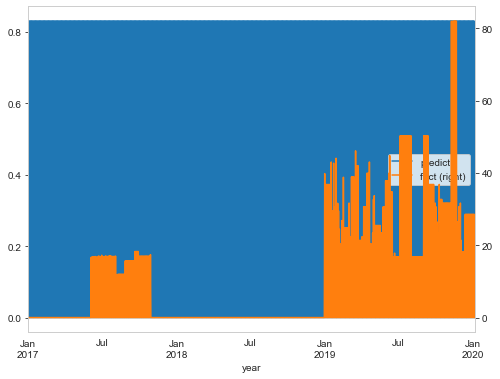

In [321]:
df = pd.DataFrame(data={'year': datadd, 
                        'predict': yhat, 
                        'fact': train_y})
fig, ax = plt.subplots() # Create the figure and axes object

# Plot the first x and y axes:
df.plot(x = 'year', y = 'predict', ax = ax) 
# Plot the second x and y axes. By secondary_y = True a second y-axis is requested:
# (see https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.plot.html for details)
df.plot(x = 'year', y = 'fact', ax = ax, secondary_y = True)

In [15]:
import numpy as np
import pandas as pd


data2 = pd.read_csv('df_north.csv')
data2.index = data2['date']
data2.head()
data2 = data2.drop(['date'], axis=1)

In [16]:
print("Contents of the Dataframe : ")
print(data2)
# Delete columns containing either 90% or more than 90% NaN Values
perc = 10
min_count =  int(((100-perc)/100)*data2.shape[0] + 1)
mod_data = data2.dropna( axis=1, 
                thresh=min_count)
print("Modified Dataframe : ")
print(mod_data)

Contents of the Dataframe : 
            Unnamed: 0  AKSH_227_liq_vol  AKSH_227_wc_vol  \
date                                                        
2017-01-01           0         177.07000           90.021   
2017-01-02           1         190.92374           90.014   
2017-01-03           2         168.77000           90.004   
2017-01-04           3         168.17172           89.975   
2017-01-05           4         168.49000           85.999   
...                ...               ...              ...   
2020-05-11        1226               NaN              NaN   
2020-05-12        1227               NaN              NaN   
2020-05-13        1228               NaN              NaN   
2020-05-14        1229               NaN              NaN   
2020-05-15        1230               NaN              NaN   

            AKSH_227_bhp_fluid_level  AKSH_227_bhp_pump_press  \
date                                                            
2017-01-01                       0.0           

In [10]:
print("Contents of the Dataframe : ")
print(data2)
# Delete columns containing either 90% or more than 90% NaN Values
perc = 10
min_count =  int(((100-perc)/100)*data2.shape[0] + 1)
mod_data = data2.dropna( axis=1, 
                thresh=min_count)
print("Modified Dataframe : ")
print(mod_data)

Contents of the Dataframe : 
            Unnamed: 0  AKSH_227_liq_vol  AKSH_227_wc_vol  \
date                                                        
2017-01-01           0         177.07000           90.021   
2017-01-02           1         190.92374           90.014   
2017-01-03           2         168.77000           90.004   
2017-01-04           3         168.17172           89.975   
2017-01-05           4         168.49000           85.999   
...                ...               ...              ...   
2020-05-11        1226               NaN              NaN   
2020-05-12        1227               NaN              NaN   
2020-05-13        1228               NaN              NaN   
2020-05-14        1229               NaN              NaN   
2020-05-15        1230               NaN              NaN   

            AKSH_227_bhp_fluid_level  AKSH_227_bhp_pump_press  \
date                                                            
2017-01-01                       0.0           

In [17]:
data2 = data2.fillna(0)

In [13]:
drop_cols = data2.columns[(data2 == 0).sum() > 0.40*data2.shape[1]]
data2 = data2.drop(drop_cols, axis = 1, inplace = True) 

In [14]:
print(data2)

None


In [58]:
data = mod_data

array([<AxesSubplot:xlabel='date'>, <AxesSubplot:xlabel='date'>,
       <AxesSubplot:xlabel='date'>, <AxesSubplot:xlabel='date'>,
       <AxesSubplot:xlabel='date'>, <AxesSubplot:xlabel='date'>,
       <AxesSubplot:xlabel='date'>, <AxesSubplot:xlabel='date'>,
       <AxesSubplot:xlabel='date'>, <AxesSubplot:xlabel='date'>],
      dtype=object)

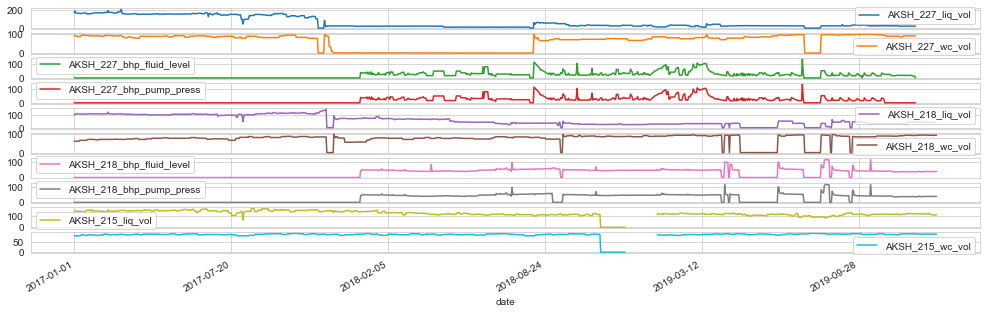

In [62]:
datasd = data.iloc[:,1:11]
datasd.plot(subplots=True)

array([<AxesSubplot:xlabel='date'>, <AxesSubplot:xlabel='date'>,
       <AxesSubplot:xlabel='date'>, <AxesSubplot:xlabel='date'>,
       <AxesSubplot:xlabel='date'>, <AxesSubplot:xlabel='date'>,
       <AxesSubplot:xlabel='date'>, <AxesSubplot:xlabel='date'>,
       <AxesSubplot:xlabel='date'>, <AxesSubplot:xlabel='date'>],
      dtype=object)

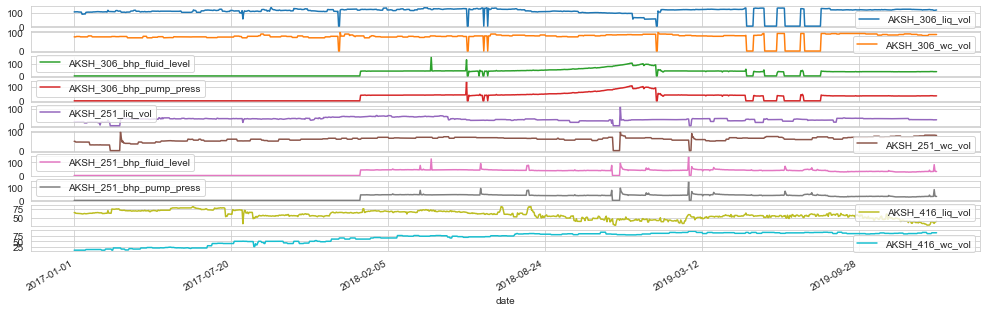

In [63]:
datasd = data.iloc[:,21:31]
datasd.plot(subplots=True)

In [64]:
datadd = data.iloc[:,1:22]

In [111]:
datadd.head()

,AKSH_227_liq_vol,AKSH_227_wc_vol,AKSH_227_bhp_fluid_level,AKSH_227_bhp_pump_press,AKSH_218_liq_vol,AKSH_218_wc_vol,AKSH_218_bhp_fluid_level,AKSH_218_bhp_pump_press,AKSH_215_liq_vol,AKSH_215_wc_vol,...,AKSH_215_bhp_pump_press,AKSH_224_liq_vol,AKSH_224_wc_vol,AKSH_224_bhp_fluid_level,AKSH_224_bhp_pump_press,AKSH_216_liq_vol,AKSH_216_wc_vol,AKSH_216_bhp_fluid_level,AKSH_216_bhp_pump_press,AKSH_306_liq_vol
date,,,,,,,,,,,,,,,,,,,,,
2017-01-01,177.07000,90.021,0.0,0.0,101.18,60.980,0.0,0.0,141.56,79.966,...,0.0,60.22,1.993,0.0,0.0,102.74,79.034,0.0,0.0,109.45
2017-01-02,190.92374,90.014,0.0,0.0,101.57,61.042,0.0,0.0,144.44,80.033,...,0.0,60.45,2.978,0.0,0.0,103.13,79.026,0.0,0.0,109.87
2017-01-03,168.77000,90.004,0.0,0.0,109.20,59.982,0.0,0.0,144.20,80.028,...,0.0,65.52,3.053,0.0,0.0,98.57,82.987,0.0,0.0,110.56
2017-01-04,168.17172,89.975,0.0,0.0,108.85,59.991,0.0,0.0,143.75,80.000,...,0.0,65.31,3.062,0.0,0.0,98.26,83.045,0.0,0.0,110.21
2017-01-05,168.49000,85.999,0.0,0.0,109.02,59.989,0.0,0.0,143.96,80.022,...,0.0,65.41,3.058,0.0,0.0,98.41,83.020,0.0,0.0,110.38


In [145]:
dataddss = data.iloc[100:1100,1:22]

array([<AxesSubplot:xlabel='date'>, <AxesSubplot:xlabel='date'>,
       <AxesSubplot:xlabel='date'>, <AxesSubplot:xlabel='date'>,
       <AxesSubplot:xlabel='date'>, <AxesSubplot:xlabel='date'>,
       <AxesSubplot:xlabel='date'>, <AxesSubplot:xlabel='date'>,
       <AxesSubplot:xlabel='date'>, <AxesSubplot:xlabel='date'>,
       <AxesSubplot:xlabel='date'>, <AxesSubplot:xlabel='date'>,
       <AxesSubplot:xlabel='date'>, <AxesSubplot:xlabel='date'>,
       <AxesSubplot:xlabel='date'>, <AxesSubplot:xlabel='date'>,
       <AxesSubplot:xlabel='date'>, <AxesSubplot:xlabel='date'>,
       <AxesSubplot:xlabel='date'>, <AxesSubplot:xlabel='date'>,
       <AxesSubplot:xlabel='date'>], dtype=object)

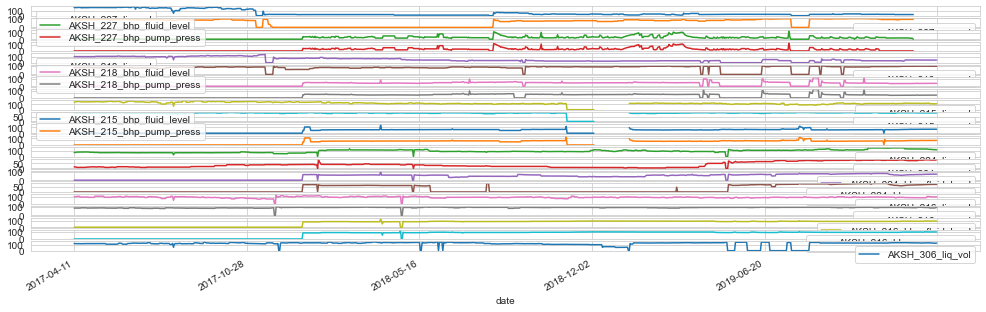

In [146]:
dataddss.plot(subplots=True)

In [147]:
f = ['AKSH_227_wc_vol', 'AKSH_227_bhp_fluid_level','AKSH_227_bhp_pump_press', 'AKSH_240_liq_vol', 'AKSH_240_wc_vol', 'AKSH_240_bhp_fluid_level', 'AKSH_240_bhp_pump_press']

In [148]:
f1 = ['AKSH_227_bhp_pump_press', 'AKSH_227_liq_vol', 'AKSH_227_wc_vol', 'AKSH_227_bhp_fluid_level', 'AKSH_218_liq_vol', 'AKSH_218_wc_vol', 'AKSH_218_bhp_fluid_level', 'AKSH_218_bhp_pump_press', 'AKSH_215_liq_vol', 'AKSH_215_wc_vol', 'AKSH_215_bhp_pump_press', 'AKSH_224_liq_vol', 'AKSH_224_wc_vol', 'AKSH_224_bhp_fluid_level', 'AKSH_224_bhp_pump_press' , 'AKSH_216_liq_vol', 'AKSH_216_wc_vol' , 'AKSH_216_bhp_fluid_level', 'AKSH_216_bhp_pump_press', 'AKSH_306_liq_vol']

In [164]:
dataddss=dataddss.fillna(0)

In [165]:
import numpy as np
import pandas as pd

data2 = dataddss

data2 = data2#[0:1100]
#data = data['bhp_pump_press','liq_vol','AKSH_214','AKSH_240','AKSH_220','AKSH_241','AKSH_221','AKSH_247','AKSH_217','AKSH_250','AKSH_424','AKSH_225','AKSH_249','AKSH_299']
df = data2[f1]

df.columns= [f1]
train_X=df.drop(['AKSH_227_bhp_pump_press', 'AKSH_227_liq_vol'],axis=1)
train_y=df[['AKSH_227_bhp_pump_press', 'AKSH_227_liq_vol']]
#train_X=df


train_X_LSTM=train_X[train_X.columns[2:18]].reset_index(drop=True).values
train_X_LSTM=train_X_LSTM.reshape(1000, 16,1,1,1)

train_y_LSTM=train_y.values

train_X_MLP=train_X[train_X.columns[:2]].reset_index(drop=True).values
train_X_MLP=train_X_MLP.reshape(1000, 2,1,1,1)



train_y_MLP=train_y.values

from tensorflow.keras.layers import Input, LSTM, Dense, Concatenate
from tensorflow.keras.models import Model

#lstm input shape
#lstm input shape
lstm_input = Input(shape=train_X_LSTM.shape[1:])
#lstm units
hidden1 = build_model(1100,10,1,1)(lstm_input)
hidden2 = build_model(1100,10,1,1)(hidden1)
#lstm output which will be predicted var1 at t=t
lstm_output = Dense(1, activation='sigmoid')(hidden2)
#mlp input with additonal 3 variables at t=t
mlp_input=Input(shape=(train_X_MLP.shape[1:]))
hidden3 = build_model(1100,10,1,1)(mlp_input)
hidden4 = build_model(1100,10,1,1)(hidden3)

#combine the lstm output which is predicted var1 at t=t and key in var2,var3,var4 at t=t
x = Add()([lstm_output, hidden4])
y = Multiply()([lstm_output, hidden4])
z = Subtract()([x, y])
#mlp model output which is predicted var1 at t=t
mlp_out = Dense(2, activation='relu')(z)
#final output of combined model which is predicted var1 at t=t
model = Model(inputs=[lstm_input, mlp_input],outputs=mlp_out)
#compile the model
model.compile(loss='mae', optimizer='adam')
#fit the model
model.fit([train_X_LSTM, train_X_MLP], train_y_LSTM, batch_size=64, epochs=10, validation_split=0.1)

E:\Anaconda\lib\site-packages\pandas\core\generic.py:3887: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


Epoch 1/10
15/15 [==============================] - 182s 7s/step - loss: 37.8427 - val_loss: 13.2095
Epoch 2/10
15/15 [==============================] - 78s 5s/step - loss: 38.8912 - val_loss: 13.2095
Epoch 3/10
15/15 [==============================] - 77s 5s/step - loss: 38.0438 - val_loss: 13.2095
Epoch 4/10
15/15 [==============================] - 77s 5s/step - loss: 38.1151 - val_loss: 13.2095
Epoch 5/10
15/15 [==============================] - 76s 5s/step - loss: 37.8067 - val_loss: 13.2095
Epoch 6/10
15/15 [==============================] - 77s 5s/step - loss: 38.2156 - val_loss: 13.2095
Epoch 7/10
15/15 [==============================] - 75s 5s/step - loss: 38.5123 - val_loss: 13.2095
Epoch 8/10
15/15 [==============================] - 78s 5s/step - loss: 37.0477 - val_loss: 13.2095
Epoch 9/10
15/15 [==============================] - 78s 5s/step - loss: 39.1717 - val_loss: 13.2095
Epoch 10/10
15/15 [==============================] - 77s 5s/step - loss: 38.0287 - val_loss: 13.209

# NNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNN

In [384]:
import numpy as np
import pandas as pd


data2 = pd.read_csv('df_north.csv')
data2.index = data2['date']

data2 = data2.drop(['date'], axis=1)
data2.head()

,Unnamed: 0,AKSH_227_liq_vol,AKSH_227_wc_vol,AKSH_227_bhp_fluid_level,AKSH_227_bhp_pump_press,AKSH_240_liq_vol,AKSH_240_wc_vol,AKSH_240_bhp_fluid_level,AKSH_240_bhp_pump_press,AKSH_307_liq_vol,...,AKSH_225_water_vol,AKSH_225_water_type,AKSH_220_water_vol,AKSH_220_water_type,AKSH_240_water_vol,AKSH_240_water_type,AKSH_217_water_vol,AKSH_217_water_type,AKSH_299_water_vol,AKSH_299_water_type
date,,,,,,,,,,,,,,,,,,,,,
2017-01-01,0,177.07000,90.021,0.0,0.0,NaN,NaN,NaN,NaN,NaN,...,213.0,Артезианская вода,94.0,Артезианская вода,NaN,NaN,289.0,Артезианская вода,NaN,NaN
2017-01-02,1,190.92374,90.014,0.0,0.0,NaN,NaN,NaN,NaN,NaN,...,202.0,Артезианская вода,94.0,Артезианская вода,NaN,NaN,287.0,Артезианская вода,NaN,NaN
2017-01-03,2,168.77000,90.004,0.0,0.0,NaN,NaN,NaN,NaN,NaN,...,219.0,Артезианская вода,93.0,Артезианская вода,NaN,NaN,286.0,Артезианская вода,NaN,NaN
2017-01-04,3,168.17172,89.975,0.0,0.0,NaN,NaN,NaN,NaN,NaN,...,205.0,Артезианская вода,94.0,Артезианская вода,NaN,NaN,287.0,Артезианская вода,NaN,NaN
2017-01-05,4,168.49000,85.999,0.0,0.0,NaN,NaN,NaN,NaN,NaN,...,214.0,Артезианская вода,94.0,Артезианская вода,NaN,NaN,286.0,Артезианская вода,NaN,NaN


In [77]:
data2 = data2.fillna(0)

In [78]:
data2.shape

(1231, 191)

In [79]:
f1 = ['AKSH_218_liq_vol', 'AKSH_416_liq_vol','AKSH_299_liq_vol','AKSH_245_liq_vol','AKSH_240_liq_vol','AKSH_307_bhp_pump_press','AKSH_240_bhp_pump_press','AKSH_218_bhp_pump_press','AKSH_228_bhp_pump_press','AKSH_224_liq_vol','AKSH_306_bhp_pump_press','AKSH_216_bhp_pump_press']

In [80]:
import numpy as np
import pandas as pd
from tensorflow.keras import layers
from keras.optimizers import SGD
from keras.models import Sequential
#from keras.layers import Merge
from keras.layers.convolutional import Convolution2D, MaxPooling2D, ZeroPadding2D
from keras.layers.core import Dense, Activation, Dropout, Reshape, Flatten
from keras.utils.np_utils import to_categorical

from tensorflow.keras.layers import *
from tensorflow.keras.models import Sequential

In [81]:
from tensorflow.keras.layers import BatchNormalization 

from tensorflow.keras.layers import BatchNormalization

In [82]:
import numpy as np
import pandas as pd
#dataddss = data2
#data2 = dataddss
#data2 = data2#[0:1100]
#data = data['bhp_pump_press','liq_vol','AKSH_214','AKSH_240','AKSH_220','AKSH_241','AKSH_221','AKSH_247','AKSH_217','AKSH_250','AKSH_424','AKSH_225','AKSH_249','AKSH_299']
df = data2[f1]
df.columns= [f1]
train_X=df.drop(['AKSH_218_liq_vol','AKSH_224_liq_vol'],axis=1)
train_y=df[['AKSH_218_liq_vol','AKSH_224_liq_vol']]
#train_X=df

# левая ветвь 
train_X_LSTM=train_X[train_X.columns[2:11]].reset_index(drop=True).values    #train_X[train_X.columns[2:10]].reset_index(drop=True).values
train_X_LSTM=train_X_LSTM.reshape(1231, 8,1,1,1)
train_y_LSTM=train_y.values
#правая
train_X_MLP=train_X[train_X.columns[:1]].reset_index(drop=True).values
train_X_MLP=train_X_MLP.reshape(1231,1,1,1,1)

train_y_MLP=train_y.values

from tensorflow.keras.layers import Input, LSTM, Dense, Concatenate
from tensorflow.keras.models import Model

#lstm input shape
#lstm input shape
lstm_input = Input(shape=train_X_LSTM.shape[1:])
#lstm units
# первый блок из 6 ядер
hidden1 = build_model(1100,10,1,1)(lstm_input)
# второй блок
hidden2 = build_model(1100,10,1,1)(hidden1)
#lstm output which will be predicted var1 at t=t
# полносвязный слой на выходе первой ветви
lstm_output = Dense(1, activation='sigmoid')(hidden2)
#mlp input with additonal 3 variables at t=t
# вторая ветвь
mlp_input=Input(shape=(train_X_MLP.shape[1:]))
# первый блок
hidden3 = build_model(1100,10,1,1)(mlp_input)
# второй блоок
hidden4 = build_model(1100,10,1,1)(hidden3)
#сумма на выходе первого и второй ветви
x = Add()([lstm_output, hidden4])
# результат перемножается и на воторй выход
y = Multiply()([lstm_output, hidden4])
# разница двух выходов
z = Subtract()([x, y])
# общий выход на полносвязный
mlp_out = Dense(2, activation='relu')(z)
# компоновка в модель
model = Model(inputs=[lstm_input, mlp_input],outputs=mlp_out)
#компилляция
model.compile(loss='mae', optimizer='adam')
#данные 
model.fit([train_X_LSTM, train_X_MLP], train_y_LSTM, batch_size=64, epochs=100, validation_split=0.1)



Epoch 1/100
18/18 [==============================] - 88s 1s/step - loss: 73.6752 - val_loss: 74.5626
Epoch 2/100
18/18 [==============================] - 14s 765ms/step - loss: 73.6823 - val_loss: 74.5626
Epoch 3/100
18/18 [==============================] - 14s 805ms/step - loss: 73.5088 - val_loss: 74.5626
Epoch 4/100
18/18 [==============================] - 15s 813ms/step - loss: 73.8870 - val_loss: 74.5626
Epoch 5/100
18/18 [==============================] - 15s 823ms/step - loss: 73.3671 - val_loss: 74.5626
Epoch 6/100
18/18 [==============================] - 15s 822ms/step - loss: 73.8414 - val_loss: 74.5626
Epoch 7/100
18/18 [==============================] - 15s 810ms/step - loss: 73.9078 - val_loss: 74.5626
Epoch 8/100
18/18 [==============================] - 15s 814ms/step - loss: 73.0222 - val_loss: 74.5626
Epoch 9/100
18/18 [==============================] - 15s 828ms/step - loss: 73.4251 - val_loss: 74.5626
Epoch 10/100
18/18 [==============================] - 15s 816ms/ste

In [84]:
yhat = model.predict([train_X_LSTM, train_X_MLP], verbose=0)
print(yhat)

[[[[[0. 0.]]]


  [[[0. 0.]]]


  [[[0. 0.]]]


  ...


  [[[0. 0.]]]


  [[[0. 0.]]]


  [[[0. 0.]]]]



 [[[[0. 0.]]]


  [[[0. 0.]]]


  [[[0. 0.]]]


  ...


  [[[0. 0.]]]


  [[[0. 0.]]]


  [[[0. 0.]]]]



 [[[[0. 0.]]]


  [[[0. 0.]]]


  [[[0. 0.]]]


  ...


  [[[0. 0.]]]


  [[[0. 0.]]]


  [[[0. 0.]]]]



 ...



 [[[[0. 0.]]]


  [[[0. 0.]]]


  [[[0. 0.]]]


  ...


  [[[0. 0.]]]


  [[[0. 0.]]]


  [[[0. 0.]]]]



 [[[[0. 0.]]]


  [[[0. 0.]]]


  [[[0. 0.]]]


  ...


  [[[0. 0.]]]


  [[[0. 0.]]]


  [[[0. 0.]]]]



 [[[[0. 0.]]]


  [[[0. 0.]]]


  [[[0. 0.]]]


  ...


  [[[0. 0.]]]


  [[[0. 0.]]]


  [[[0. 0.]]]]]


In [ ]:
for x, y in val_data_multi.take(10):
    multi_step_output_plot(np.squeeze(x[0]), np.squeeze(y[0]), np.squeeze(model.predict(x[0][np.newaxis,:,:,:,:])))

In [213]:
dataddss.shape

(1000, 21)

In [251]:
data2 = dataddss

data2 = data2#[0:1100]
#data = data['bhp_pump_press','liq_vol','AKSH_214','AKSH_240','AKSH_220','AKSH_241','AKSH_221','AKSH_247','AKSH_217','AKSH_250','AKSH_424','AKSH_225','AKSH_249','AKSH_299']
df = data2[f1]

df.columns= [f1]
train_X=df.drop(['AKSH_227_bhp_pump_press', 'AKSH_227_liq_vol'],axis=1)
train_y=df[['AKSH_227_bhp_pump_press', 'AKSH_227_liq_vol']]

In [252]:
def multivariate_multioutput_data(data2, target, start_index, end_index, history_size,
                      target_size, step, single_step=False):
    data = []
    labels = []

    start_index = start_index + history_size
    if end_index is None:
        end_index = len(data2) - target_size

    for i in range(start_index, end_index):
        indices = range(i-history_size, i, step)
        data.append(data2[indices])

        if single_step:
            labels.append(target[i+target_size])
        else:
            labels.append(target[i:i+target_size])

    return np.array(data2),np.array(labels)



In [253]:
d = data2
d.shape

(1000, 21)

In [278]:
import numpy as np
import pandas as pd

target_size = 20
step = 2

data2 = dataddss

data2 = data2#[0:1100]
#data = data['bhp_pump_press','liq_vol','AKSH_214','AKSH_240','AKSH_220','AKSH_241','AKSH_221','AKSH_247','AKSH_217','AKSH_250','AKSH_424','AKSH_225','AKSH_249','AKSH_299']
df = data2[f1]

df.columns= [f1]

train_X=df.drop(['AKSH_227_bhp_pump_press', 'AKSH_227_liq_vol'],axis=1)
train_y=df[['AKSH_227_bhp_pump_press', 'AKSH_227_liq_vol']]
#train_X=df

TRAIN_SPLIT = 200
past_history = 100
future_target = 20

STEP = 2

train_X_LSTM=multivariate_multioutput_data(data2.columns[2:18], end_index=TRAIN_SPLIT, history_size= past_history,
                                                 target_size = future_target,step = STEP, target = 20,start_index = TRAIN_SPLIT)

train_X_MLP=multivariate_multioutput_data(data2.columns[1:2], end_index=TRAIN_SPLIT, history_size= past_history,
                                                 target_size = future_target,step = STEP, target = 20,start_index = TRAIN_SPLIT)


In [279]:
train_X_LSTM

(array(['AKSH_227_bhp_fluid_level', 'AKSH_227_bhp_pump_press',
        'AKSH_218_liq_vol', 'AKSH_218_wc_vol', 'AKSH_218_bhp_fluid_level',
        'AKSH_218_bhp_pump_press', 'AKSH_215_liq_vol', 'AKSH_215_wc_vol',
        'AKSH_215_bhp_fluid_level', 'AKSH_215_bhp_pump_press',
        'AKSH_224_liq_vol', 'AKSH_224_wc_vol', 'AKSH_224_bhp_fluid_level',
        'AKSH_224_bhp_pump_press', 'AKSH_216_liq_vol', 'AKSH_216_wc_vol'],
       dtype=object),
 array([], dtype=float64))

In [280]:
train_X_LSTM = np.asarray(train_X_LSTM)
train_X_MLP = np.asarray(train_X_MLP)
print(train_X_MLP)

[array(['AKSH_227_wc_vol'], dtype=object) array([], dtype=float64)]


In [282]:
#train_X_LSTM = train_X_LSTM.values
train_X_LSTM.reshape(1000, 16,1,1,1)
train_y_LSTM=train_y.values


train_X_MLP=train_X_MLP.reshape(1000,1,1,1,1)



train_y_MLP=train_y.values

from tensorflow.keras.layers import Input, LSTM, Dense, Concatenate
from tensorflow.keras.models import Model

#lstm input shape
#lstm input shape
lstm_input = Input(shape=train_X_LSTM.shape[1:])
#lstm units
hidden1 = build_model(1100,10,1,1)(lstm_input)
hidden2 = build_model(1100,10,1,1)(hidden1)
#lstm output which will be predicted var1 at t=t
lstm_output = Dense(1, activation='sigmoid')(hidden2)
#mlp input with additonal 3 variables at t=t
mlp_input=Input(shape=(train_X_MLP.shape[1:]))
hidden3 = build_model(1100,10,1,1)(mlp_input)
hidden4 = build_model(1100,10,1,1)(hidden3)

#combine the lstm output which is predicted var1 at t=t and key in var2,var3,var4 at t=t
x = Add()([lstm_output, hidden4])
y = Multiply()([lstm_output, hidden4])
z = Subtract()([x, y])
#mlp model output which is predicted var1 at t=t
mlp_out = Dense(2, activation='relu')(z)
#final output of combined model which is predicted var1 at t=t
model = Model(inputs=[lstm_input, mlp_input],outputs=mlp_out)
#compile the model
model.compile(loss='mae', optimizer='adam')
#fit the model
model.fit([train_X_LSTM, train_X_MLP], train_y_LSTM, batch_size=64, epochs=100, validation_split=0.1)


ValueError: cannot reshape array of size 2 into shape (1000,16,1,1,1)

In [288]:
features2 = ['AKSH_227_bhp_pump_press', 'AKSH_227_liq_vol']

X_left =  data2['AKSH_227_bhp_pump_press','AKSH_227_liq_vol']
X_right = data2['AKSH_218_bhp_pump_press']
Y_train = data2['AKSH_227_liq_vol'] 

In [300]:
Y_train.shape

(1000,)

In [302]:
dataset = data2

In [363]:
# multivariate mlp example
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate
 
# сэмлы
def split_sequences(sequences, n_steps):
	X, y = list(), list()
	for i in range(len(sequences)):
		# разметка
		end_ix = i + n_steps
		# проверка выхода за пределы
		if end_ix > len(sequences):
			break
		# получение начала и конечной метки x и y
		seq_x, seq_y = sequences[i:end_ix, :-1], sequences[end_ix-1, -1]
        #seq_x, seq_y = sequences[:,2:4], sequences[:,3:4]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
# последовательность
in_seq1 = X_left
in_seq2 = X_right
out_seq = array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1), 2))
in_seq2 = in_seq2.reshape((len(in_seq2), 1))
out_seq = out_seq.reshape((len(out_seq), 2))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
n_steps = 200
# convert into input/output
X,y = split_sequences(dataset, n_steps)
#y = split_sequences(dataset[:,2], n_steps) 

# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]
# первая модель
visible1 = Input(shape=(n_steps,))
dense1 = Dense(100, activation='relu')(visible1)
# вторая модель LSTM
visible2 = Input(shape=(n_steps,1))
lstm = LSTM(100, input_shape =(100,1))(visible2)
# слияние
merge = concatenate([dense1, lstm])
output = Dense(4)(merge)
model = Model(inputs=[visible1, visible2], outputs=output)
model.compile(optimizer='adam', loss='mape', metrics=['accuracy'])
# fit model
model.fit([X1, X2], y, epochs=20, verbose=1, batch_size=64, validation_split=0.1)
# demonstrate prediction
#x_input = array([[80, 85], [90, 95], [100, 105]])
#x1 = x_input[:, 0].reshape((1, n_steps))
#x2 = x_input[:, 1].reshape((1, n_steps))
yhat = model.predict([X1, X2], verbose=0)
print(yhat)

Epoch 1/20
13/13 [==============================] - 13s 812ms/step - loss: 65.7552 - accuracy: 0.0000e+00 - val_loss: 33.8185 - val_accuracy: 0.0000e+00
Epoch 2/20
13/13 [==============================] - 10s 802ms/step - loss: 25.9529 - accuracy: 0.0000e+00 - val_loss: 44.6882 - val_accuracy: 0.0000e+00
Epoch 3/20
13/13 [==============================] - 10s 795ms/step - loss: 23.0318 - accuracy: 0.0000e+00 - val_loss: 44.3760 - val_accuracy: 0.0000e+00
Epoch 4/20
13/13 [==============================] - 10s 802ms/step - loss: 21.6877 - accuracy: 0.0000e+00 - val_loss: 42.3700 - val_accuracy: 0.0000e+00
Epoch 5/20
13/13 [==============================] - 10s 774ms/step - loss: 20.6296 - accuracy: 0.0000e+00 - val_loss: 43.9957 - val_accuracy: 0.0000e+00
Epoch 6/20
13/13 [==============================] - 11s 820ms/step - loss: 21.0676 - accuracy: 0.0000e+00 - val_loss: 42.7550 - val_accuracy: 0.0000e+00
Epoch 7/20
13/13 [==============================] - 10s 769ms/step - loss: 21.3369

In [360]:
print(yhat)

[[243.18411 243.49359 243.09134 243.188  ]
 [241.9774  242.28537 242.07552 242.05054]
 [241.51997 241.83186 241.23546 241.44449]
 ...
 [185.34048 184.87848 186.6294  185.58679]
 [183.23265 182.77489 183.9431  183.25322]
 [184.91455 184.45306 185.81963 185.0157 ]]


In [165]:
def build_model(input_timesteps, output_timesteps, num_links, num_inputs):
    # COPY PASTA
    # https://github.com/niklascp/bus-arrival-convlstm/blob/master/jupyter/ConvLSTM_3x15min_10x64-5x64-10x64-5x64-Comparison.ipynb
    
    model = Sequential()
    model.add(BatchNormalization(name = 'batch_norm_0', input_shape = (input_timesteps, num_inputs, 1, 1)))
    
    model.add(ConvLSTM2D(name ='conv_lstm_1',
                         filters = 64, kernel_size = (10, 1),                       
                         padding = 'same', 
                         return_sequences = True))
    model.add(Dropout(0.30, name = 'dropout_1'))
    model.add(BatchNormalization(name = 'batch_norm_1'))

    model.add(ConvLSTM2D(name ='conv_lstm_2',
                         filters = 64, kernel_size = (5, 1), 
                         padding='same',
                         return_sequences = False))
    model.add(Dropout(0.20, name = 'dropout_2'))
    model.add(BatchNormalization(name = 'batch_norm_2'))
    model.add(Flatten())
    model.add(RepeatVector(output_timesteps))
    model.add(Reshape((output_timesteps, num_inputs, 1, 64)))
    
    model.add(ConvLSTM2D(name ='conv_lstm_3',
                         filters = 64, kernel_size = (10, 1), 
                         padding='same',
                         return_sequences = True))
    model.add(Dropout(0.20, name = 'dropout_3'))
    model.add(BatchNormalization(name = 'batch_norm_3'))
    
    model.add(ConvLSTM2D(name ='conv_lstm_4',
                         filters = 64, kernel_size = (20, 1), 
                         padding='same',
                         return_sequences = True))
    model.add(Dropout(0.20, name = 'dropout_4'))
    model.add(BatchNormalization(name = 'batch_norm_4'))
    
    model.add(ConvLSTM2D(name ='conv_lstm_5',
                         filters = 64, kernel_size = (20, 1), 
                         padding='same',
                         return_sequences = True))
    model.add(Dropout(0.20, name = 'dropout_5'))
    model.add(BatchNormalization(name = 'batch_norm_5'))
    
    model.add(ConvLSTM2D(name ='conv_lstm_6',
                         filters = 64, kernel_size = (10, 1), 
                         padding='same',
                         return_sequences = True))
    model.add(Dropout(0.20, name = 'dropout_6'))
    model.add(BatchNormalization(name = 'batch_norm_6'))
    
    model.add(ConvLSTM2D(name ='conv_lstm_7',
                         filters = 64, kernel_size = (10, 1), 
                         padding='same',
                         return_sequences = True))
    
    model.add(Dropout(0.20, name = 'dropout_7'))
    model.add(BatchNormalization(name = 'batch_norm_7'))
    
    model.add(ConvLSTM2D(name ='conv_lstm_8',
                         filters = 64, kernel_size = (5, 1), 
                         padding='same',
                         return_sequences = True))
    
    model.add(TimeDistributed(Dense(units=1, name = 'dense_1', activation = 'relu')))
    model.add(Dense(units=1, name = 'dense_2', activation = 'linear'))

#     optimizer = RMSprop() #lr=0.0001, rho=0.9, epsilon=1e-08, decay=0.9)
#     optimizer = tf.keras.optimizers.Adam(0.1)
    optimizer = tf.keras.optimizers.RMSprop(lr=0.004, clipvalue=1.0)
    model.compile(loss = "mse", optimizer = optimizer, metrics = ['mae', 'mse'])
    return model

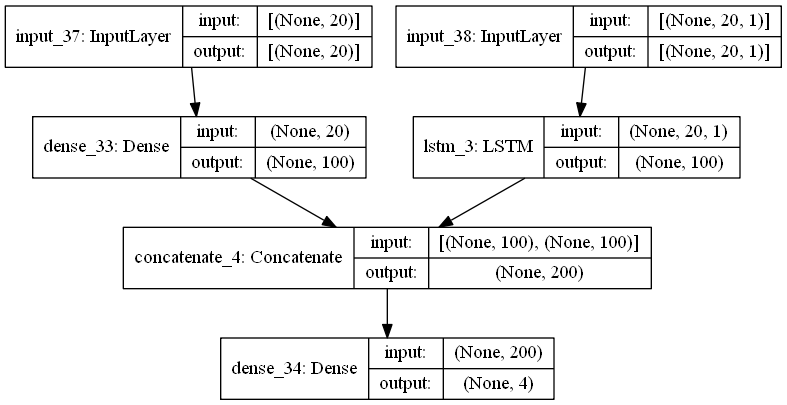

In [356]:
from keras.utils.vis_utils import plot_model

plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

In [392]:
dataset

array([[ 94.   , 168.   , 133.698, 227.698, 301.698],
       [ 94.   , 167.   ,  55.679, 149.679, 222.679],
       [ 93.   , 166.   ,  54.527, 147.527, 220.527],
       ...,
       [ 62.   , 345.   ,   0.   ,  62.   , 345.   ],
       [ 63.   , 353.   ,   0.   ,  63.   , 353.   ],
       [ 63.   , 370.   ,   0.   ,  63.   , 370.   ]])

In [390]:
import numpy as np
import pandas as pd


data = pd.read_csv('df_south.csv')
datasd = data.iloc[:,1:11]

#datasd.plot(subplots=True)

In [396]:
dataset[:,:10]

array([[ 94.   , 168.   , 133.698, 227.698, 301.698],
       [ 94.   , 167.   ,  55.679, 149.679, 222.679],
       [ 93.   , 166.   ,  54.527, 147.527, 220.527],
       ...,
       [ 62.   , 345.   ,   0.   ,  62.   , 345.   ],
       [ 63.   , 353.   ,   0.   ,  63.   , 353.   ],
       [ 63.   , 370.   ,   0.   ,  63.   , 370.   ]])

In [101]:
import numpy as np
import pandas as pd


data2 = pd.read_csv('df_north.csv')
data2.index = data2['date']
data2 = data2.fillna(0)
data2.head()
data2 = data2.drop(['date'], axis=1)

In [102]:
features = ['AKSH_416_liq_vol','AKSH_211_liq_vol']
X_left = data2[features]
X_right = data2['AKSH_211_bhp_pump_press']
Y_train = data2['AKSH_254_liq_vol'] 
X_left = np.asarray(X_left)
X_right = np.asarray(X_right)
Y_train = np.asarray(Y_train)
y = Y_train

In [103]:
Y_train = Y_train.reshape(1231,1)

In [205]:
# multivariate mlp example
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate
 
# сэмлы
def split_sequences(sequences, n_steps):
	X, y = list(), list()
	for i in range(len(sequences)):
		# разметка
		end_ix = i + n_steps
		# проверка выхода за пределы
		if end_ix > len(sequences):
			break
		# получение начала и конечной метки
		seq_x, seq_y = sequences[i:end_ix, :-1], sequences[end_ix-1, -1]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
# последовательность
in_seq1 = X_left
in_seq2 = X_right

#out_seq = array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1), 2))
in_seq2 = in_seq2.reshape((len(in_seq2), 1))
out_seq = Y_train # out_seq.reshape((len(out_seq), 2))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
n_steps = 20
# convert into input/output
X,y = split_sequences(dataset, n_steps)
#y = 
# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]
# первая модель
visible1 = Input(shape=(n_steps,))
dense1 = Dense(100, activation='relu')(visible1)
# вторая модель
visible2 = Input(shape=(n_steps,))
dense2 = Dense(100, activation='relu')(visible2)
# слияние
merge = concatenate([dense1, dense2])
output = Dense(1)(merge)
model = Model(inputs=[visible1, visible2], outputs=output)
model.compile(optimizer='adam', loss='mse', metrics=['accuracy'])
# fit model
model.fit([X1, X2], y, epochs=20, verbose= 1, batch_size=64, validation_split=0.1)
# demonstrate prediction
#x_input = array([[80, 85], [90, 95], [100, 105]])
#x1 = x_input[:, 0].reshape((1, n_steps))
#x2 = x_input[:, 1].reshape((1, n_steps))
yhat = model.predict([X1, X2], verbose=1)
print(yhat)

Epoch 1/20
18/18 [==============================] - 1s 14ms/step - loss: 203.4778 - accuracy: 0.0000e+00 - val_loss: 92.9159 - val_accuracy: 0.0000e+00
Epoch 2/20
18/18 [==============================] - 0s 4ms/step - loss: 158.7364 - accuracy: 0.0000e+00 - val_loss: 194.7911 - val_accuracy: 0.0000e+00
Epoch 3/20
18/18 [==============================] - 0s 4ms/step - loss: 149.6242 - accuracy: 0.0000e+00 - val_loss: 195.8466 - val_accuracy: 0.0000e+00
Epoch 4/20
18/18 [==============================] - 0s 5ms/step - loss: 140.6293 - accuracy: 0.0000e+00 - val_loss: 153.0818 - val_accuracy: 0.0000e+00
Epoch 5/20
18/18 [==============================] - 0s 4ms/step - loss: 146.7945 - accuracy: 0.0000e+00 - val_loss: 276.2338 - val_accuracy: 0.0000e+00
Epoch 6/20
18/18 [==============================] - 0s 5ms/step - loss: 138.4010 - accuracy: 0.0000e+00 - val_loss: 264.3399 - val_accuracy: 0.0000e+00
Epoch 7/20
18/18 [==============================] - 0s 5ms/step - loss: 133.0304 - accur

In [212]:
datadd = datadd[0:1212]

In [213]:
datadd.shape

(1212,)

In [214]:

yhat = yhat.flatten() 
y = y.flatten()

In [215]:
import pandas as pd

df = pd.DataFrame(data={'year': datadd, 
                        'predict': yhat, 
                        'fact': y})

In [224]:
Y_train = Y_train.reshape(1231,1)

In [253]:
# multivariate mlp example
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate
 
# сэмлы
def split_sequences(sequences, n_steps):
	X, y = list(), list()
	for i in range(len(sequences)):
		# разметка
		end_ix = i + n_steps
		# проверка выхода за пределы
		if end_ix > len(sequences):
			break
		# получение начала и конечной метки
		seq_x, seq_y = sequences[i:end_ix, :-1], sequences[end_ix-1, -1]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
# последовательность
in_seq1 = X_left
in_seq2 = X_right
out_seq = Y_train#array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1), 2))
in_seq2 = in_seq2.reshape((len(in_seq2), 1))
out_seq = Y_train #out_seq.reshape((len(out_seq), 2))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
n_steps = 100
# convert into input/output
X, y = split_sequences(dataset, n_steps)
# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]
# первая модель
visible1 = Input(shape=(n_steps,))
dense1 = Dense(100, activation='relu')(visible1)
# вторая модель LSTM
visible2 = Input(shape=(n_steps,1))
lstm = LSTM(100, input_shape =(100,1))(visible2)
# слияние
merge = concatenate([dense1, lstm])
output = Dense(1)(merge)
model = Model(inputs=[visible1, visible2], outputs=output)
model.compile(optimizer='adam', loss='mape')
# fit model
model.fit([X1, X2], y, epochs=100, verbose=0, batch_size=64, validation_split=0.1)
# demonstrate prediction
#x_input = array([[80, 85], [90, 95], [100, 105]])
#x1 = x_input[:, 0].reshape((1, n_steps))
#x2 = x_input[:, 1].reshape((1, n_steps))
yhat = model.predict([X1, X2], verbose=0)
print(yhat)

[[ 1.2548171 ]
 [ 0.4504405 ]
 [ 0.57395464]
 ...
 [-1.5584062 ]
 [-1.5565876 ]
 [-0.9141583 ]]


In [177]:
datadd = data2.index 

In [195]:
datadd.shape

(1231,)

In [198]:
datadd = datadd[0:1222]

In [199]:
y.shape

(1222,)

In [200]:
yhat.shape

(1222, 1)

In [226]:
from sklearn.metrics import mean_absolute_percentage_error

mean_absolute_percentage_error(y, yhat)

22843031350351.75

In [201]:

yhat = yhat.flatten() 
y = y.flatten()

#yhat1 = yhat[400:1200]
#y = y[400:1200]
#datadd = datadd[400:1200]

In [202]:
import pandas as pd

df = pd.DataFrame(data={'year': datadd, 
                        'predict': yhat, 
                        'fact': y})

<AxesSubplot:label='be89d7ae-ed0f-4f6a-8608-6c244b9ab50c'>

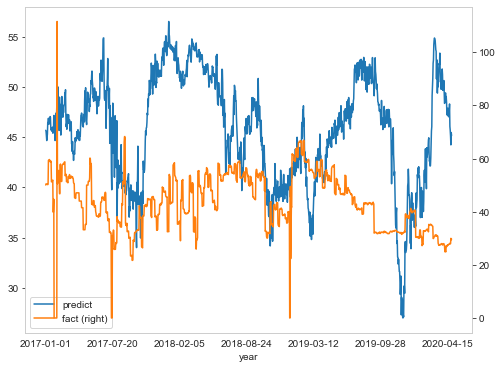

In [216]:
import matplotlib.pyplot as plt # Impot the relevant module

fig, ax = plt.subplots() # Create the figure and axes object

# Plot the first x and y axes:
df.plot(x = 'year', y = 'predict', ax = ax) 
# Plot the second x and y axes. By secondary_y = True a second y-axis is requested:
# (see https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.plot.html for details)
df.plot(x = 'year', y = 'fact', ax = ax, secondary_y = True)

<AxesSubplot:label='cd8cfb76-cb1b-4d62-924d-c555e6d50fd9'>

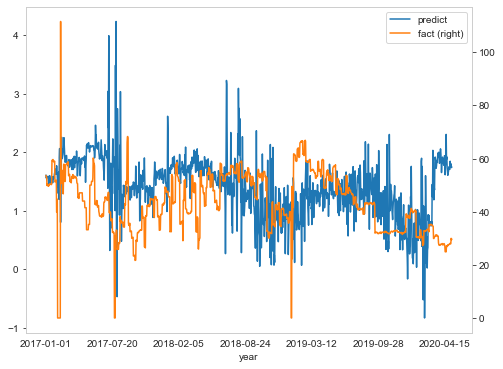

In [203]:
import matplotlib.pyplot as plt # Impot the relevant module

fig, ax = plt.subplots() # Create the figure and axes object

# Plot the first x and y axes:
df.plot(x = 'year', y = 'predict', ax = ax) 
# Plot the second x and y axes. By secondary_y = True a second y-axis is requested:
# (see https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.plot.html for details)
df.plot(x = 'year', y = 'fact', ax = ax, secondary_y = True)

In [204]:
from sklearn.metrics import mean_absolute_percentage_error

mean_absolute_percentage_error(y, yhat)

74781995734099.08

In [123]:
X1.shape

(1231, 1)

In [124]:
X2.shape

(1231, 1)

In [125]:
y.shape

(1231,)

In [ ]:
from sklearn.metrics import mean_absolute_percentage_error

mean_absolute_percentage_error(y, yhat)

In [228]:
Y_train = Y_train.reshape(1231,1)
X_right = X_right.reshape(1231,1)

In [251]:
# multivariate mlp example
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate

from tensorflow.keras.layers import Input, LSTM, Dense, Concatenate
from tensorflow.keras.models import Model 
# сэмлы
def split_sequences(sequences, n_steps):
	X, y = list(), list()
	for i in range(len(sequences)):
		# разметка
		end_ix = i + n_steps
		# проверка выхода за пределы
		if end_ix > len(sequences):
			break
		# получение начала и конечной метки
		seq_x, seq_y = sequences[i:end_ix, :-1], sequences[end_ix-1, -1]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 


In [79]:
from sklearn.metrics import mean_absolute_percentage_error

mean_absolute_percentage_error(y, yhat)

34683660616.74343

In [81]:
import numpy as np
import pandas as pd

data = data[['bhp_pump_press','liq_vol','AKSH_214','AKSH_240','AKSH_220','AKSH_241','AKSH_221','AKSH_247','AKSH_217','AKSH_250','AKSH_424','AKSH_225','AKSH_249','AKSH_299']]
df = data

df.columns= ['bhp_pump_press','liq_vol','AKSH_214','AKSH_240','AKSH_220','AKSH_241','AKSH_221','AKSH_247','AKSH_217','AKSH_250','AKSH_424','AKSH_225','AKSH_249','AKSH_299']
#train_X=train_df.drop(['var1(t)'],axis=1)
train_y=df[['liq_vol']]
train_X=df

#subset the 3 previous timesteps of the 4 variables for the time sries part 
train_X_LSTM=train_X[train_X.columns[:10]].reset_index(drop=True).values
train_X_LSTM=train_X_LSTM.reshape(1100, 10, 1)
#target is always var1(t)
train_y_LSTM=train_y.values
#take the current timestep fatures which are var2,var3,var4 which are realised at t=t
train_X_MLP=train_X[train_X.columns[-3:]].reset_index(drop=True).values
train_X_MLP=train_X_MLP.reshape(1100, 3, 1)

#target is always var1(t)
train_y_MLP=train_y.values

from tensorflow.keras.layers import Input, LSTM, Dense, Concatenate
from tensorflow.keras.models import Model
#lstm input shape
lstm_input = Input(shape=train_X_LSTM.shape[1:])
#lstm units
hidden1 = LSTM(10,stateful=False)(lstm_input)
hidden2 = Dense(10, activation='relu')(hidden1)
#lstm output which will be predicted var1 at t=t
lstm_output = Dense(1, activation='sigmoid')(hidden2)
#mlp input with additonal 3 variables at t=t
mlp_input=Input(shape=(train_X_MLP.shape[1]))
#combine the lstm output which is predicted var1 at t=t and key in var2,var3,var4 at t=t
x = Concatenate()([lstm_output, mlp_input])
#mlp model output which is predicted var1 at t=t
mlp_out = Dense(1, activation='relu')(x)
#final output of combined model which is predicted var1 at t=t
model = Model(inputs=[lstm_input, mlp_input],outputs=mlp_out)
#compile the model
model.compile(loss='mape', optimizer='adam')
#fit the model
model.fit([train_X_LSTM, train_X_MLP], train_y_LSTM, batch_size=64, epochs=100, validation_split=0.1)

Epoch 1/100
16/16 [==============================] - 3s 46ms/step - loss: 88.8513 - val_loss: 93.3636
Epoch 2/100
16/16 [==============================] - 0s 12ms/step - loss: 87.5648 - val_loss: 93.3636
Epoch 3/100
16/16 [==============================] - 0s 12ms/step - loss: 87.4805 - val_loss: 93.3636
Epoch 4/100
16/16 [==============================] - 0s 12ms/step - loss: 87.1335 - val_loss: 93.3636
Epoch 5/100
16/16 [==============================] - 0s 13ms/step - loss: 86.5514 - val_loss: 93.3636
Epoch 6/100
16/16 [==============================] - 0s 13ms/step - loss: 88.4537 - val_loss: 93.3636
Epoch 7/100
16/16 [==============================] - 0s 12ms/step - loss: 88.2986 - val_loss: 93.3636
Epoch 8/100
16/16 [==============================] - 0s 12ms/step - loss: 86.1142 - val_loss: 93.3636
Epoch 9/100
16/16 [==============================] - 0s 12ms/step - loss: 88.0561 - val_loss: 93.3636
Epoch 10/100
16/16 [==============================] - 0s 12ms/step - loss: 88.2961

In [130]:
import numpy as np
import pandas as pd

data = data[['bhp_pump_press','liq_vol','AKSH_214','AKSH_240','AKSH_220','AKSH_241','AKSH_221','AKSH_247','AKSH_217','AKSH_250','AKSH_424','AKSH_225','AKSH_249','AKSH_299']]
df = data

df.columns= ['bhp_pump_press','liq_vol','AKSH_214','AKSH_240','AKSH_220','AKSH_241','AKSH_221','AKSH_247','AKSH_217','AKSH_250','AKSH_424','AKSH_225','AKSH_249','AKSH_299']
#train_X=train_df.drop(['var1(t)'],axis=1)
train_y=df[['liq_vol']]
train_X=df

#subset the 3 previous timesteps of the 4 variables for the time sries part 
train_X_LSTM=train_X[train_X.columns[:10]].reset_index(drop=True).values
train_X_LSTM=train_X_LSTM.reshape(1100, 10, 1)
#target is always var1(t)
train_y_LSTM=train_y.values
#take the current timestep fatures which are var2,var3,var4 which are realised at t=t
train_X_MLP=train_X[train_X.columns[-3:]].reset_index(drop=True).values
train_X_MLP=train_X_MLP.reshape(1100, 3, 1)

#target is always var1(t)
train_y_MLP=train_y.values

from tensorflow.keras.layers import Input, LSTM, Dense, Concatenate
from tensorflow.keras.models import Model
#lstm input shape
lstm1_input = Input(shape=train_X_LSTM.shape[1:])
#lstm units
hidden1 = LSTM(10, stateful=False)(lstm1_input)
lstm2_input=Input(shape=(train_X_MLP.shape[-2:]))
hidden2 = LSTM(10)(lstm2_input)
#lstm output which will be predicted var1 at t=t
lstm2_output = Dense(1, activation='sigmoid')(hidden2)
#mlp input with additonal 3 variables at t=t

#combine the lstm output which is predicted var1 at t=t and key in var2,var3,var4 at t=t
x = Concatenate()([lstm2_output,hidden1 ])#lstm1_input
#mlp model output which is predicted var1 at t=t
mlp_out = Dense(1, activation='relu')(x)
#final output of combined model which is predicted var1 at t=t
model = Model(inputs=[lstm1_input, lstm2_input],outputs=mlp_out)
#compile the model
model.compile(loss='mape', optimizer='adam')
#fit the model
model.fit([train_X_LSTM, train_X_MLP], train_y_LSTM, batch_size=64, epochs=100, validation_split=0.1)

Epoch 1/100
16/16 [==============================] - 5s 65ms/step - loss: 10825362.5000 - val_loss: 45961360.0000
Epoch 2/100
16/16 [==============================] - 0s 12ms/step - loss: 86.5588 - val_loss: 43909752.0000
Epoch 3/100
16/16 [==============================] - 0s 13ms/step - loss: 88.1862 - val_loss: 43452612.0000
Epoch 4/100
16/16 [==============================] - 0s 11ms/step - loss: 86.3525 - val_loss: 43352936.0000
Epoch 5/100
16/16 [==============================] - 0s 11ms/step - loss: 87.2006 - val_loss: 43331892.0000
Epoch 6/100
16/16 [==============================] - 0s 12ms/step - loss: 87.9070 - val_loss: 43327564.0000
Epoch 7/100
16/16 [==============================] - 0s 12ms/step - loss: 86.9992 - val_loss: 43326672.0000
Epoch 8/100
16/16 [==============================] - 0s 11ms/step - loss: 87.0794 - val_loss: 43326520.0000
Epoch 9/100
16/16 [==============================] - 0s 13ms/step - loss: 87.9783 - val_loss: 43326516.0000
Epoch 10/100
16/16 [==

In [59]:
yhat = model.predict([train_X_LSTM, train_X_MLP], verbose=1)
print(yhat)

35/35 [==============================] - 1s 3ms/step
[[0.        ]
 [0.        ]
 [0.        ]
 ...
 [0.05350703]
 [0.05350527]
 [0.05352339]]


In [117]:
yhat1 = yhat1[0:901]
y = y[0:901]
datadd = datadd[0:901]

In [118]:
yhat1 = yhat1.flatten() 
y = y.flatten()


In [119]:
yhat1.shape

(901,)

In [120]:
import pandas as pd

df = pd.DataFrame(data={'year': datadd, 
                        'predict': yhat1, 
                        'fact': y})

<AxesSubplot:label='e24024bb-2d42-4e5f-92ec-c5bfd9f24080'>

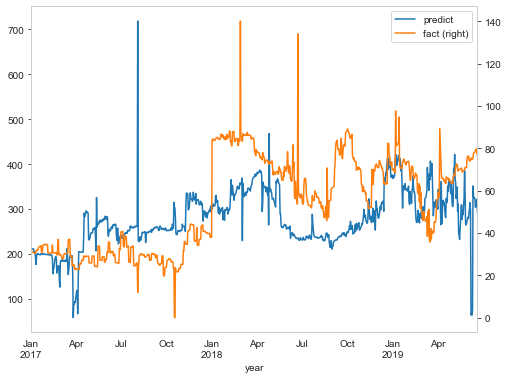

In [121]:
import matplotlib.pyplot as plt # Impot the relevant module

fig, ax = plt.subplots() # Create the figure and axes object

# Plot the first x and y axes:
df.plot(x = 'year', y = 'predict', ax = ax) 
# Plot the second x and y axes. By secondary_y = True a second y-axis is requested:
# (see https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.plot.html for details)
df.plot(x = 'year', y = 'fact', ax = ax, secondary_y = True)

In [ ]:
batch_input_shape=(1, None, 2*WINDOW_H+1, 2*WINDOW_W+1, 1)

In [108]:
dataset = data2


In [ ]:
# multivariate multi-step encoder-decoder lstm
from math import sqrt
from numpy import split
from numpy import array
from pandas import read_csv
from sklearn.metrics import mean_squared_error
from matplotlib import pyplot
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Flatten
from keras.layers import LSTM
from keras.layers import RepeatVector
from keras.layers import TimeDistributed
 
# однопарам модель
def split_dataset(data):
	# split into standard weeks
	train, test = data[1:-1000], data[-1000:-100]
    #train2, test2 = data[1:-1000], data[-1000:-100]
	# restructure into windows of weekly data
	train = array(split(train, len(train)))
    
	test = array(split(test, len(test)))
	return train, test
 
# тестирование на 1 и более приодов
def evaluate_forecasts(actual, predicted):
	scores = list()
	#  RMSE  для каждого дня
	for i in range(actual.shape[1]):
		# mse
		mse = mean_squared_error(actual[:, i], predicted[:, i])
		#  rmse
		rmse = sqrt(mse)
		# сохнаить результат
		scores.append(rmse)
	# RMSE по всем периодам
	s = 0
	for row in range(actual.shape[0]):
		for col in range(actual.shape[1]):
			s += (actual[row, col] - predicted[row, col])**2
	score = sqrt(s / (actual.shape[0] * actual.shape[1]))
	return score, scores
 
# итого сумма
def summarize_scores(name, score, scores):
	s_scores = ', '.join(['%.1f' % s for s in scores])
	print('%s: [%.3f] %s' % (name, score, s_scores))
 
 # convert history into inputs and outputs
def to_supervised(train, n_input, n_out=20):
	# раскатка данных в 1 мерные массивы
	data = train.reshape((train.shape[0]*train.shape[1], train.shape[2]))
	X, y = list(), list()
	in_start = 0
	# step over the entire history one time step at a time
	for _ in range(len(data)):
		# define the end of the input sequence
		in_end = in_start + n_input # начало прогноза
		out_end = in_end + n_out # длина проноза =шагов
		# ensure we have enough data for this instance
		if out_end <= len(data):
			X.append(data[in_start:in_end, :]) # Массив входных данных X
			y.append(data[in_end:out_end, 2]) # ПРогноз
		# итерация по шагам
		in_start += 1
	return array(X), array(y)
 
# обучение
def build_model(train, n_input):
    # prepare data
    train_x, train_y = to_supervised(train, n_input)
    # параметры
    verbose, epochs, batch_size = 0, 50, 160
    n_timesteps, n_features, n_outputs = train_x.shape[1], train_x.shape[2], train_y.shape[1]
    # изменение метрик [samples, timesteps, features]
    train_y = train_y.reshape((train_y.shape[0], train_y.shape[1], 1))
    # ядро
    model = Sequential()
    model.add(LSTM(200, activation='relu', input_shape=(n_timesteps, n_features)))
    model.add(RepeatVector(n_outputs))
    model.add(LSTM(200, activation='relu', return_sequences=True))
    model.add(TimeDistributed(Dense(100, activation='relu')))
    model.add(TimeDistributed(Dense(1)))
    
   
 
    # fit network
    #model = concatenate([model1,model2])
    model.compile(loss='mse', optimizer='adam')
    
    model.fit([train_x],train_y, epochs=epochs, batch_size=batch_size, verbose=verbose)
    return model
 
# прогноз
def forecast(model, history, n_input):
	# раскатка данных в горизонтальные 1 мерные массивы
	data = array(history)
	data = data.reshape((data.shape[0]*data.shape[1], data.shape[2]))
	# окно для обучения от начала отчёт назад
	input_x = data[-n_input:, :]
	# измененени данных - шаг, размерность данных , колво шагов  в [1, n_input, n]
	input_x = input_x.reshape((1, input_x.shape[0], input_x.shape[1])) # данные для LSTM сети - samples, timesteps, features
	# на 1 период из n дней - n_input
	yhat = model.predict(input_x, verbose=0)
	# вектор прогноза
	yhat = yhat[0]
	return yhat
 
# оценка
def evaluate_model(train, test, n_input):
	# fit model
	model = build_model(train,n_input)
	# history is a list of weekly data
	history = [x for x in train]
	# прогон по данным
	predictions = list()
	for i in range(len(test)):
		# предсказание на период
		yhat_sequence = forecast(model, history, n_input)
		# сохрание данных
		predictions.append(yhat_sequence)
		# настоящие данные и пресказанные
		history.append(test[i, :])
	# оценка на каждый день
	predictions = array(predictions)
	score, scores = evaluate_forecasts(test[:, :, 0], predictions)
    
	return score, scores
 
# данные
#dataset = read_csv('xyzf.csv', header=0, infer_datetime_format=True, parse_dates=['datetime'], index_col=['datetime'])
# разбивка данных (0,1 по умолчанию)
train, test = split_dataset(dataset) # dataset # datasd
# оценка
n_input = 14
score, scores = evaluate_model(train, test, n_input)
# сумма
summarize_scores('lstm', score, scores)
# plot scores
days = []
pyplot.plot(scores, marker='o', label='lstm')
pyplot.show()
#print(predictions)
print(scores)

In [130]:
train.shape

(230, 1, 191)

In [132]:
import numpy as np
import pandas as pd


data2 = pd.read_csv('df_north.csv')
data2.index = data2['date']
data2 = data2.fillna(0)
data2.head()
data2 = data2.drop(['date'], axis=1)

In [ ]:
import numpy as np
import pandas as pd


data2 = pd.read_csv('df_north.csv')
data2.index = data2['date']
data2 = data2.fillna(0)
data2.head()
data2 = data2.drop(['date'], axis=1)

In [ ]:
dataset = data2

In [188]:
import numpy as np
import pandas as pd


data2 = pd.read_csv('df_south.csv')
data2.index = data2['date']
data2 = data2.fillna(0)
data2.head()
data2 = data2.drop(['date'], axis=1)

In [189]:
features_considered_south1 = ['AKSH_298_liq_vol','AKSH_213_liq_vol','AKSH_203_liq_vol','AKSH_223_liq_vol','AKSH_226_liq_vol']
target_south = ['AKSH_298_liq_vol','AKSH_213_liq_vol','AKSH_203_liq_vol','AKSH_223_liq_vol','AKSH_226_liq_vol']
features_considered_south2 = ['AKSH_298_bhp_pump_press','AKSH_213_bhp_pump_press','AKSH_203_bhp_pump_press','AKSH_223_bhp_pump_press','AKSH_226_bhp_pump_press']

In [190]:
features = data2[features_considered_south]
target = data2[target_south]
#features.index = data['date']

features = features.fillna(0)
features.head()

,AKSH_298_liq_vol,AKSH_213_liq_vol,AKSH_203_liq_vol,AKSH_223_liq_vol,AKSH_226_liq_vol,AKSH_298_bhp_pump_press,AKSH_213_bhp_pump_press,AKSH_203_bhp_pump_press,AKSH_223_bhp_pump_press,AKSH_226_bhp_pump_press
date,,,,,,,,,,
2017-01-01,24.719100,43.49,0.0,52.34,7.98,0.0,0.0,0.0,0.0,0.0
2017-01-02,25.934628,43.66,0.0,52.54,8.01,0.0,0.0,0.0,0.0,0.0
2017-01-03,27.300000,43.58,0.0,52.45,13.06,0.0,0.0,0.0,0.0,0.0
2017-01-04,25.270000,43.44,0.0,52.29,13.02,0.0,0.0,0.0,0.0,0.0
2017-01-05,26.180000,43.51,0.0,59.86,11.87,0.0,0.0,0.0,0.0,0.0


In [191]:


in_seq2 = features[features_considered_south1]
in_seq1 = features[features_considered_south2]
Y_train = features[target_south]


In [192]:
in_seq2 = in_seq2.values
in_seq1 = in_seq1.values
Y_train = Y_train.values

In [193]:
# multivariate mlp example
from numpy import array
from numpy import hstack
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers.merge import concatenate
 
# сэмлы
def split_sequences(sequences, n_steps):
	X, y = list(), list()
	for i in range(len(sequences)):
		# разметка
		end_ix = i + n_steps
		# проверка выхода за пределы
		if end_ix > len(sequences):
			break
		# получение начала и конечной метки
		seq_x, seq_y = sequences[i:end_ix, :-1], sequences[end_ix-1, -1]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
# последовательность

#print(yhat)
out_seq = Y_train #array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# конвертация в формат колонок и рядов
in_seq1 = in_seq1.reshape((len(in_seq1), 5))
in_seq2 = in_seq2.reshape((len(in_seq2), 5))
out_seq = Y_train #out_seq.reshape((len(out_seq), 2))
# горизонтальное последовательное размещение данных 
dataset = hstack((in_seq1, in_seq2, out_seq))
# таймстепы
n_steps = 20
# convert into input/output
X, y = split_sequences(dataset, n_steps)
# разделение данных 
X1 = X[:, :, 0]
X2 = X[:, :, 1]
# первая модель
visible1 = Input(shape=(1,2,1,1))
dense1 = Dense(1,activation='relu')(visible1)
# вторая модель LSTM
visible2 = Input(shape=(1000,2,1,1))
lstm = build_model(1000, 1, 100, 2)(visible2)
# слияние
#merge1 = concatenate([dense1, lstm])
merge = concatenate([dense1, lstm])
output = Dense(1)(merge)
model = Model(inputs=[visible1, visible2], outputs=output)
model.compile(optimizer='adam', loss='mse')
# fit model


In [194]:
Y_train = Y_train.reshape(1231, 5, 1, 1, 1) 

X1 = X1.reshape(1212, 20, 1, 1, 1) 
X2 = X2.reshape(1212, 20, 1, 1, 1) 

In [204]:
dataset = features 

lstm: [15.490] 15.5


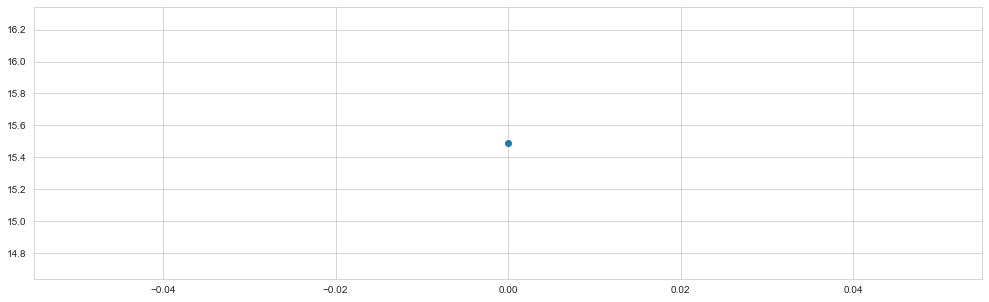

[15.490210637686458]


In [205]:
# multivariate multi-step encoder-decoder lstm
from math import sqrt
from numpy import split
from numpy import array
from pandas import read_csv
from sklearn.metrics import mean_squared_error
from matplotlib import pyplot
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Flatten
from keras.layers import LSTM
from keras.layers import RepeatVector
from keras.layers import TimeDistributed
 
# однопарам модель
def split_dataset(data):
	# split into standard weeks
	train, test = data[1:-1000], data[-1000:-100]
	# restructure into windows of weekly data
	train = array(split(train, len(train)))
	test = array(split(test, len(test)))
	return train, test
 
# тестирование на 1 и более приодов
def evaluate_forecasts(actual, predicted):
	scores = list()
	#  RMSE  для каждого дня
	for i in range(actual.shape[1]):
		# mse
		mse = mean_squared_error(actual[:, i], predicted[:, i])
		#  rmse
		rmse = sqrt(mse)
		# сохнаить результат
		scores.append(rmse)
	# RMSE по всем периодам
	s = 0
	for row in range(actual.shape[0]):
		for col in range(actual.shape[1]):
			s += (actual[row, col] - predicted[row, col])**2
	score = sqrt(s / (actual.shape[0] * actual.shape[1]))
	return score, scores
 
# итого сумма
def summarize_scores(name, score, scores):
	s_scores = ', '.join(['%.1f' % s for s in scores])
	print('%s: [%.3f] %s' % (name, score, s_scores))
 
# convert history into inputs and outputs
def to_supervised(train, n_input, n_out=20):
	# раскатка данных в 1 мерные массивы
	data = train.reshape((train.shape[0]*train.shape[1], train.shape[2]))
	X, y = list(), list()
	in_start = 0
	# step over the entire history one time step at a time
	for _ in range(len(data)):
		# define the end of the input sequence
		in_end = in_start + n_input # начало прогноза
		out_end = in_end + n_out # длина проноза =шагов
		# ensure we have enough data for this instance
		if out_end <= len(data):
			X.append(data[in_start:in_end, :]) # Массив входных данных X
			y.append(data[in_end:out_end, 2]) # ПРогноз
		# итерация по шагам
		in_start += 1
	return array(X), array(y)
 
# обучение
def build_model(train, n_input):
	# prepare data
	train_x, train_y = to_supervised(train, n_input)
	# параметры
	verbose, epochs, batch_size = 0, 50, 160
	n_timesteps, n_features, n_outputs = train_x.shape[1], train_x.shape[2], train_y.shape[1]
	# изменение метрик [samples, timesteps, features]
	train_y = train_y.reshape((train_y.shape[0], train_y.shape[1], 1))
	# ядро
	model = Sequential()
	model.add(LSTM(200, activation='relu', input_shape=(n_timesteps, n_features)))
	model.add(RepeatVector(n_outputs))
	model.add(LSTM(200, activation='relu', return_sequences=True))
	model.add(TimeDistributed(Dense(100, activation='relu')))
	model.add(TimeDistributed(Dense(1)))
	model.compile(loss='mse', optimizer='adam')
	# fit network
	model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, verbose=verbose)
	return model
 
# прогноз
def forecast(model, history, n_input):
	# раскатка данных в горизонтальные 1 мерные массивы
	data = array(history)
	data = data.reshape((data.shape[0]*data.shape[1], data.shape[2]))
	# окно для обучения от начала отчёт назад
	input_x = data[-n_input:, :]
	# измененени данных - шаг, размерность данных , колво шагов  в [1, n_input, n]
	input_x = input_x.reshape((1, input_x.shape[0], input_x.shape[1])) # данные для LSTM сети - samples, timesteps, features
	# на 1 период из n дней - n_input
	yhat = model.predict(input_x, verbose=0)
	# вектор прогноза
	yhat = yhat[0]
	return yhat
 
# оценка
def evaluate_model(train, test, n_input):
	# fit model
	model = build_model(train, n_input)
	# history is a list of weekly data
	history = [x for x in train]
	# прогон по данным
	predictions = list()
	for i in range(len(test)):
		# предсказание на период
		yhat_sequence = forecast(model, history, n_input)
		# сохрание данных
		predictions.append(yhat_sequence)
		# настоящие данные и пресказанные
		history.append(test[i, :])
	# оценка на каждый день
	predictions = array(predictions)
	score, scores = evaluate_forecasts(test[:, :, 0], predictions)
    
	return score, scores
 
# данные
#dataset = read_csv('xyzf.csv', header=0, infer_datetime_format=True, parse_dates=['datetime'], index_col=['datetime'])
# разбивка данных (0,1 по умолчанию)
train, test = split_dataset(dataset) # dataset # datasd
# оценка
n_input = 14
score, scores = evaluate_model(train, test, n_input)
# сумма
summarize_scores('lstm', score, scores)
# plot scores
days = []
pyplot.plot(scores, marker='o', label='lstm')
pyplot.show()
#print(predictions)
print(scores)